In [1]:
#analyis tools
import pandas as pd
from datetime import datetime, timedelta
import numpy as np
from collections import defaultdict

#visualization tools
import matplotlib.pyplot as plt
import seaborn as sns

#models
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier

#preprocessing
from sklearn.model_selection import train_test_split


#model analysis
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score


sns.set()

In [2]:
#reading user sign up data
users=pd.read_csv("C:\\Users\\yfawz\\OneDrive\\Desktop\\Springboard_Projects\\relax_inc\\relax_challenge\\takehome_users.csv",encoding = "ISO-8859-1",index_col=0, parse_dates=['creation_time'])

In [3]:
#reading user sign up data
eng=pd.read_csv("C:\\Users\\yfawz\\OneDrive\\Desktop\\Springboard_Projects\\relax_inc\\relax_challenge\\takehome_user_engagement.csv",encoding = "ISO-8859-1",index_col=1,parse_dates=['time_stamp'])

# 1. Initial EDA

Let's see what the data looks like on the user creation dataframe

In [4]:
users.head(100)

,creation_time,name,email,creation_source,last_session_creation_time,opted_in_to_mailing_list,enabled_for_marketing_drip,org_id,invited_by_user_id
object_id,,,,,,,,,
1,2014-04-22 03:53:30,Clausen August,AugustCClausen@yahoo.com,GUEST_INVITE,1.398139e+09,1,0,11,10803.0
2,2013-11-15 03:45:04,Poole Matthew,MatthewPoole@gustr.com,ORG_INVITE,1.396238e+09,0,0,1,316.0
3,2013-03-19 23:14:52,Bottrill Mitchell,MitchellBottrill@gustr.com,ORG_INVITE,1.363735e+09,0,0,94,1525.0
4,2013-05-21 08:09:28,Clausen Nicklas,NicklasSClausen@yahoo.com,GUEST_INVITE,1.369210e+09,0,0,1,5151.0
5,2013-01-17 10:14:20,Raw Grace,GraceRaw@yahoo.com,GUEST_INVITE,1.358850e+09,0,0,193,5240.0
6,2013-12-17 03:37:06,Cunha Eduardo,EduardoPereiraCunha@yahoo.com,GUEST_INVITE,1.387424e+09,0,0,197,11241.0
7,2012-12-16 13:24:32,Sewell Tyler,TylerSewell@jourrapide.com,SIGNUP,1.356010e+09,0,1,37,NaN
8,2013-07-31 05:34:02,Hamilton Danielle,DanielleHamilton@yahoo.com,PERSONAL_PROJECTS,NaN,1,1,74,NaN
9,2013-11-05 04:04:24,Amsel Paul,PaulAmsel@hotmail.com,PERSONAL_PROJECTS,NaN,0,0,302,NaN


In [5]:
users.shape

(12000, 9)

There are 12,000 rows and 9 features describing user signups.

In [6]:
users.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12000 entries, 1 to 12000
Data columns (total 9 columns):
creation_time                 12000 non-null datetime64[ns]
name                          12000 non-null object
email                         12000 non-null object
creation_source               12000 non-null object
last_session_creation_time    8823 non-null float64
opted_in_to_mailing_list      12000 non-null int64
enabled_for_marketing_drip    12000 non-null int64
org_id                        12000 non-null int64
invited_by_user_id            6417 non-null float64
dtypes: datetime64[ns](1), float64(2), int64(3), object(3)
memory usage: 937.5+ KB


In [7]:
users.dtypes

creation_time                 datetime64[ns]
name                                  object
email                                 object
creation_source                       object
last_session_creation_time           float64
opted_in_to_mailing_list               int64
enabled_for_marketing_drip             int64
org_id                                 int64
invited_by_user_id                   float64
dtype: object

We see that there are some null values in 2 features. The 'last_session_creation_time' which is a Unix timestamp of last login and 'invited_by_user_id' which is which user invited them to join.

In [8]:
users.describe()

,last_session_creation_time,opted_in_to_mailing_list,enabled_for_marketing_drip,org_id,invited_by_user_id
count,8.823000e+03,12000.000000,12000.000000,12000.000000,6417.000000
mean,1.379279e+09,0.249500,0.149333,141.884583,5962.957145
std,1.953116e+07,0.432742,0.356432,124.056723,3383.761968
min,1.338452e+09,0.000000,0.000000,0.000000,3.000000
25%,1.363195e+09,0.000000,0.000000,29.000000,3058.000000
50%,1.382888e+09,0.000000,0.000000,108.000000,5954.000000
75%,1.398443e+09,0.000000,0.000000,238.250000,8817.000000
max,1.402067e+09,1.000000,1.000000,416.000000,11999.000000


What about the engagament dataframe?

In [9]:
eng.head()

,time_stamp,visited
user_id,,
1,2014-04-22 03:53:30,1
2,2013-11-15 03:45:04,1
2,2013-11-29 03:45:04,1
2,2013-12-09 03:45:04,1
2,2013-12-25 03:45:04,1


In [10]:
eng.shape

(207917, 2)

There are 207,917 login engagement from the 12,000 users.

In [11]:
eng.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 207917 entries, 1 to 12000
Data columns (total 2 columns):
time_stamp    207917 non-null datetime64[ns]
visited       207917 non-null int64
dtypes: datetime64[ns](1), int64(1)
memory usage: 4.8 MB


No null values, which is good.

In [12]:
eng.describe()

,visited
count,207917.0
mean,1.0
std,0.0
min,1.0
25%,1.0
50%,1.0
75%,1.0
max,1.0


## 1.2. Data Cleaning

Cleaning Steps to be done:
- A. Convert last_session_creation_time from unix timestamp to datetime
- B. Fill Null values for last_session_creation_time
- C. Fill Null values for invited_by_user_id 

We can convert the unix timestamps using pd.to_datetime which will be based off unix as the origin and we will speciy the units to be so it converts to the nearest second.

# A. Converting unix timestamps to datetime

In [13]:
users['last_session_creation_time'] = pd.to_datetime(users['last_session_creation_time'],unit='s')

Did it work?

In [14]:
users.last_session_creation_time.head()

object_id
1   2014-04-22 03:53:30
2   2014-03-31 03:45:04
3   2013-03-19 23:14:52
4   2013-05-22 08:09:28
5   2013-01-22 10:14:20
Name: last_session_creation_time, dtype: datetime64[ns]

It looks like it did!

# B. Filling null values in last_session_creation_time

Null values in the last_session_creation_time will be filled with the a value from the engagement dataframe based on the latest time in the respective user id.
Let's first find the columns where there are null values

In [15]:
id_null_creation_time=users[users.last_session_creation_time.isnull()].index

In [16]:
len(id_null_creation_time)

3177

There are 3177 users with null entries in their last login attempts. Let's first see if the null id's are in the engagement dataframe.

In [17]:
id_null_creation_time.isin(eng.index).sum()

0

They are not in the dataframe. We can fill the null values with the creation date.

In [18]:
users.last_session_creation_time.loc[id_null_creation_time]=users.loc[id_null_creation_time].creation_time.values

C:\Users\yfawz\Anaconda3\lib\site-packages\pandas\core\indexing.py:190: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)


In [19]:
users.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12000 entries, 1 to 12000
Data columns (total 9 columns):
creation_time                 12000 non-null datetime64[ns]
name                          12000 non-null object
email                         12000 non-null object
creation_source               12000 non-null object
last_session_creation_time    12000 non-null datetime64[ns]
opted_in_to_mailing_list      12000 non-null int64
enabled_for_marketing_drip    12000 non-null int64
org_id                        12000 non-null int64
invited_by_user_id            6417 non-null float64
dtypes: datetime64[ns](2), float64(1), int64(3), object(3)
memory usage: 1.2+ MB


# C. Filling Null Values in invited_by_user_id

If there is no value, this assumes that the user was not invited by a user and signed up alone.
The null values will be replace with 0, representing that the user signed up alone.

In [20]:
users.invited_by_user_id.fillna(0,inplace=True)

We have now filled all the null values and are ready for some further exploration.

## 1.3. EDA

- Defining an "adopted user" as a user who has logged into the product on three separate days in at least one sevenday period , 
- Our main question here is to identify which factors predict future user adoption.

To answer this question, we must first identify which users are adopted. This can be found from the engagement data as this logs each time a users has logged in.

Once a user meets the adopted crtieria, they will be assumed to be 'adopted' forever. We will test user by user to if the they have logged in 3 times in any 7-day period.
Let's start with finding the first date and last of user engagement our data?

Our strategy will be:

1. Starting with 31st May 2012 and looking 7 days ahead until 6th May 2012.
2. Sum the engagement(Logins) in that 7 day period.
3. If the sum is greater than 3, the 'adopted' will be set to '1'.
4. Adding 1 day to 31st may and repeating steps 2-3.
5. The loop will run until 6th June 2014.

In order to speed up the run time, users with logins of less than 3 will be identifies so we can save on computation time.

In [21]:
not_adopted=[]
for i in list(eng.index.unique()):
    if eng.loc[[i]].visited.sum()<3:  
        not_adopted.append(i)

In [22]:
len(not_adopted)

6575

We will only loop through id's excluding those in the 'not_adopted' list.
So the loop will loop through the users who have more than 3 total visits in the lifespan of their subscription. 

In [23]:
adopted=defaultdict(int)
adopted_id=[]

#lets set up a start and end date variable with a 7-day range starting from 31st May 2012
start_date=eng.time_stamp.min()
end_date=start_date+timedelta(days=8)


  
while start_date<eng.time_stamp.max():
      #lets loop through the unique id values
    for i in list(eng.index.unique()):

        #ensuring that the id we are testing is not yet adopted
        if (i not in adopted_id) and (i not in not_adopted):

            #filter out the time stamps for each id
            entry=eng.loc[[i]]
            id_stamps=entry.time_stamp

            #create a mask to filter the dates within range
            stamps_mask=(id_stamps >= start_date) & (id_stamps < end_date)

            #use the mask to filter the dates   
            within_range=entry.loc[stamps_mask]
            visits=within_range.visited.sum()

            #if the sum of visits is more than 3, the adopted count for that id will increase by 1
            print(i,visits)
            if visits>=3:
                adopted[i]=1
                adopted_id.append(i)
            else:
                adopted[i]=0
        elif i not in adopted_id:
            adopted[i]=0

    #increase the date range by 1 day
    start_date=start_date+timedelta(days=1)
    end_date=end_date+timedelta(days=1)

2 0
10 0
20 0
33 0
42 0
43 0
50 1
53 0
59 0
60 0
63 0
69 0
74 0
77 0
80 0
81 0
82 0
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 0
153 0
160 0
165 0
168 0
171 0
172 0
174 0
185 0
188 0
197 0
200 0
202 0
203 0
209 0
214 0
221 0
230 0
241 0
245 0
247 0
251 0
263 0
265 0
275 0
277 0
280 0
283 0
297 0
298 0
305 0
310 0
311 0
321 0
322 0
330 0
337 0
341 0
345 0
347 0
351 0
362 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
397 0
398 0
401 0
417 0
418 0
430 0
445 0
450 0
455 0
460 0
462 0
469 0
471 0
472 0
478 0
479 0
481 0
483 0
492 0
494 0
497 0
502 0
506 0
509 0
510 1
511 0
512 0
518 0
520 0
522 0
528 0
529 0
535 0
540 0
543 0
547 0
553 0
555 0
561 0
564 0
572 0
575 0
589 0
591 0
601 0
603 0
605 0
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
639 0
649 0
665 0
669 0
679 0
680 0
710 0
715 0
716 0
717 0
724 0
725 0
728 0
736 0
738 0
746 0
754 0
772 0
783 0
786 0
788 0
793 0
804 0
814 0
815 0
817 0
828 0
845 0
850 0
851 0
869 0
874 0
882 0
885 0
887 0
901 0
906 0
907 0
912 0
928 0
932 0


6623 0
6624 0
6627 0
6633 0
6637 0
6638 0
6640 0
6643 0
6653 0
6654 0
6655 0
6662 0
6668 0
6688 0
6705 0
6711 0
6713 0
6717 0
6729 0
6731 0
6733 0
6734 0
6735 0
6740 0
6741 0
6742 0
6751 0
6757 0
6759 0
6760 0
6765 0
6771 0
6778 0
6782 0
6786 0
6808 1
6810 0
6818 0
6827 0
6832 0
6835 0
6837 0
6845 0
6851 0
6856 0
6862 0
6863 0
6865 0
6866 0
6867 0
6870 0
6886 0
6893 0
6894 0
6895 0
6900 0
6909 0
6913 0
6914 0
6916 0
6922 0
6924 0
6938 0
6956 0
6962 0
6963 0
6965 0
6966 0
6971 0
6978 0
6981 0
6982 0
6988 0
6992 0
6993 0
6998 0
7004 0
7014 0
7015 0
7019 0
7020 0
7023 0
7029 0
7034 0
7048 0
7071 0
7074 0
7080 0
7096 0
7097 0
7101 0
7104 0
7107 0
7111 0
7114 0
7120 0
7131 0
7153 0
7156 0
7158 0
7165 0
7170 2
7172 0
7173 0
7189 0
7192 0
7194 0
7196 0
7198 0
7199 0
7205 0
7208 0
7209 0
7210 0
7212 0
7215 0
7219 0
7221 0
7231 0
7234 0
7242 0
7248 0
7257 0
7261 0
7283 0
7296 0
7301 0
7310 0
7323 0
7327 0
7342 0
7349 0
7351 0
7362 0
7375 0
7378 0
7380 0
7384 0
7385 0
7386 0
7398 0
7399 0
7401 0

649 0
665 0
669 0
679 0
680 0
710 0
715 0
716 0
717 0
724 0
725 0
728 0
736 0
738 0
746 0
754 0
772 0
783 0
786 0
788 0
793 0
804 0
814 0
815 0
817 0
828 0
845 0
850 0
851 0
869 0
874 0
882 0
885 0
887 0
901 0
906 0
907 0
912 0
928 0
932 0
934 0
937 0
943 0
946 0
953 0
980 0
985 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1017 0
1018 0
1026 0
1027 0
1030 0
1035 0
1039 0
1049 0
1055 0
1061 0
1064 0
1072 0
1087 0
1088 0
1089 0
1093 0
1094 0
1099 0
1106 0
1107 0
1119 0
1123 0
1124 0
1125 0
1128 0
1129 0
1136 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 0
1151 0
1155 0
1156 0
1162 0
1163 0
1173 0
1178 0
1186 0
1196 0
1197 0
1202 0
1212 0
1214 0
1222 0
1227 0
1233 0
1235 0
1238 0
1240 0
1242 0
1245 0
1250 0
1274 0
1280 0
1290 0
1297 0
1299 0
1303 0
1311 0
1312 0
1318 0
1319 0
1320 0
1321 0
1327 0
1339 0
1343 0
1345 0
1350 0
1357 0
1361 0
1368 0
1379 0
1380 0
1385 0
1396 0
1407 0
1410 0
1411 0
1421 0
1434 0
1439 0
1440 0
1441 0
1445 0
1464 0
1466 0
1472 0
1476 0
1479 0
1480 0
1481 0
1485 0
1496 0


7380 0
7384 0
7385 0
7386 0
7398 0
7399 0
7401 0
7403 0
7405 0
7406 0
7409 0
7411 0
7431 0
7436 0
7437 0
7441 0
7443 0
7449 0
7450 0
7475 0
7480 0
7493 0
7498 0
7503 0
7511 0
7518 0
7529 0
7536 0
7538 0
7539 0
7544 0
7549 0
7555 0
7556 0
7572 0
7587 0
7590 0
7598 0
7600 0
7605 0
7608 0
7613 0
7615 0
7618 0
7622 0
7624 0
7641 0
7644 0
7654 0
7655 0
7661 0
7670 0
7678 0
7682 0
7683 0
7688 0
7691 0
7696 0
7697 0
7700 0
7705 0
7707 0
7710 0
7720 0
7724 0
7740 0
7760 0
7764 0
7770 0
7772 0
7774 0
7778 0
7786 0
7787 0
7789 0
7792 0
7798 0
7802 0
7805 0
7813 0
7818 0
7820 0
7827 0
7839 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7878 0
7882 0
7895 0
7896 0
7897 0
7899 0
7904 0
7905 0
7910 0
7920 0
7926 0
7927 0
7939 0
7941 0
7951 0
7966 0
7970 0
7971 0
7979 0
7980 0
7985 0
7989 0
7991 1
7995 0
7999 0
8009 0
8010 0
8020 0
8022 0
8025 0
8029 0
8031 0
8033 0
8034 0
8037 0
8046 0
8047 0
8048 0
8063 0
8068 1
8069 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 0
8092 0
8101 0
8104 0
8109 0
8111 0

1617 0
1621 0
1624 0
1641 0
1663 0
1665 0
1666 0
1671 0
1672 0
1681 0
1685 0
1689 0
1690 0
1691 0
1693 2
1694 0
1702 0
1706 0
1709 0
1714 0
1716 0
1717 0
1720 0
1722 0
1726 0
1730 0
1740 0
1741 0
1742 0
1753 0
1754 0
1758 0
1759 0
1769 0
1770 0
1781 0
1783 0
1784 0
1786 0
1787 0
1811 0
1816 0
1820 0
1821 0
1822 0
1823 0
1825 0
1836 0
1844 1
1845 0
1858 0
1864 1
1865 0
1872 0
1875 0
1879 0
1885 0
1891 0
1897 0
1901 0
1907 0
1930 0
1941 0
1944 0
1954 0
1974 0
1993 0
1999 0
2002 0
2009 0
2011 0
2013 0
2024 0
2025 0
2033 0
2034 0
2037 0
2038 0
2042 0
2043 0
2049 0
2056 0
2063 0
2073 0
2074 0
2078 0
2080 0
2101 0
2103 0
2111 0
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2159 0
2160 0
2171 0
2176 0
2193 0
2194 0
2196 0
2199 0
2201 0
2206 0
2220 0
2239 0
2241 0
2246 0
2253 0
2259 0
2270 0
2271 0
2278 0
2282 0
2285 0
2286 0
2289 0
2290 0
2297 0
2300 0
2301 0
2307 0
2311 0
2312 0
2316 0
2322 0
2324 0
2332 0
2333 0
2337 0
2339 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0

8010 0
8020 0
8022 0
8025 0
8029 0
8031 0
8033 0
8034 0
8037 0
8046 0
8047 0
8048 0
8063 0
8068 0
8069 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 0
8092 0
8101 0
8104 0
8109 0
8111 0
8123 0
8130 0
8134 0
8137 0
8149 0
8156 0
8157 0
8159 0
8161 0
8165 0
8166 0
8169 0
8173 0
8175 0
8191 0
8192 0
8196 0
8201 0
8206 0
8214 0
8217 0
8220 0
8221 0
8232 0
8233 0
8235 0
8239 0
8243 0
8252 0
8254 0
8255 0
8258 0
8259 1
8265 0
8269 0
8270 0
8277 0
8278 0
8280 1
8286 0
8294 0
8297 0
8302 0
8310 0
8311 0
8312 0
8314 0
8319 0
8334 0
8337 0
8348 0
8366 0
8367 0
8371 0
8381 0
8383 0
8393 0
8394 0
8399 0
8401 0
8403 0
8408 0
8415 0
8426 0
8435 0
8440 0
8442 0
8448 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 0
8505 0
8507 0
8508 0
8511 0
8514 0
8523 0
8538 0
8553 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8595 0
8601 0
8602 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8654 0
8663 0
8666 0
8673 0
8675 0
8677 0
8679 0
8685 0
8689 0
8695 0
8701 0
8702 0
8704 0
8706 0
8708 0
8712 0

2056 0
2063 0
2073 0
2074 0
2078 0
2080 0
2101 0
2103 0
2111 0
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2159 0
2160 0
2171 0
2176 0
2193 0
2194 0
2196 0
2199 0
2201 0
2206 0
2220 0
2239 0
2241 0
2246 0
2253 0
2259 0
2270 0
2271 0
2278 0
2282 0
2285 0
2286 0
2289 0
2290 0
2297 0
2300 0
2301 0
2307 0
2311 0
2312 0
2316 0
2322 0
2324 0
2332 0
2333 0
2337 0
2339 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2425 0
2435 0
2436 0
2438 0
2447 0
2455 0
2461 0
2474 0
2481 0
2490 0
2492 0
2495 0
2502 0
2516 0
2519 0
2532 0
2536 0
2539 0
2544 0
2548 0
2557 0
2566 0
2568 2
2569 0
2570 0
2571 0
2577 0
2583 2
2587 0
2590 0
2601 0
2604 0
2610 0
2615 0
2618 0
2620 0
2622 0
2624 0
2626 0
2636 0
2641 0
2645 0
2647 0
2658 0
2672 0
2681 0
2713 0
2714 0
2723 0
2724 0
2727 0
2731 0
2739 0
2744 0
2746 0
2750 0
2762 0
2771 0
2776 0
2782 0
2787 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2843 0
2851 0
2857 0
2859 0
2863 0
2866 0
2870 0
2873 0
2881 0
2886 0

8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8595 0
8601 0
8602 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8654 0
8663 0
8666 0
8673 0
8675 0
8677 0
8679 0
8685 0
8689 0
8695 0
8701 0
8702 0
8704 0
8706 0
8708 0
8712 0
8721 0
8725 0
8740 0
8741 0
8749 0
8750 0
8758 0
8759 0
8760 0
8767 0
8768 0
8769 0
8770 0
8779 0
8789 0
8790 0
8802 0
8803 0
8806 0
8809 0
8811 0
8826 0
8827 0
8832 0
8835 0
8837 0
8856 0
8857 0
8860 0
8862 0
8864 0
8867 0
8869 0
8876 0
8877 0
8880 0
8884 0
8899 0
8912 0
8918 0
8919 0
8924 0
8932 0
8938 0
8940 0
8944 0
8945 0
8952 0
8955 0
8957 0
8971 0
8973 0
8989 0
8994 0
8995 0
9011 0
9013 0
9030 0
9031 0
9039 0
9042 0
9046 0
9055 0
9056 0
9060 0
9062 0
9067 0
9076 0
9077 0
9079 0
9083 0
9085 0
9088 0
9089 0
9112 0
9113 0
9120 0
9135 0
9137 0
9142 0
9143 0
9145 0
9147 0
9154 0
9157 0
9162 0
9164 0
9172 0
9178 0
9187 0
9195 0
9196 0
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9281 0
9284 0
9286 0
9288 0
9290 0
9295 0
9297 0
9303 0
9306 0

2836 0
2841 0
2843 0
2851 0
2857 0
2859 0
2863 0
2866 0
2870 0
2873 0
2881 0
2886 0
2887 0
2889 0
2890 0
2891 0
2895 0
2915 0
2918 0
2921 0
2925 0
2931 0
2939 0
2940 0
2945 0
2946 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 1
2974 0
2979 0
2993 0
2998 0
3009 0
3014 0
3017 0
3018 0
3025 0
3026 0
3028 0
3032 0
3036 0
3039 0
3046 0
3052 0
3053 0
3059 0
3063 0
3066 0
3067 0
3069 0
3071 0
3073 0
3076 0
3077 0
3080 0
3081 0
3083 0
3087 0
3093 0
3100 0
3102 0
3112 0
3113 0
3124 0
3125 0
3133 0
3137 0
3139 0
3140 0
3145 0
3159 0
3160 0
3163 0
3175 0
3178 0
3179 0
3180 0
3183 0
3185 0
3193 0
3194 0
3201 0
3203 0
3204 0
3205 0
3207 0
3216 0
3217 0
3220 0
3222 0
3226 0
3232 0
3235 0
3238 0
3239 0
3240 0
3244 0
3269 0
3273 0
3280 0
3294 0
3310 0
3311 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3332 0
3338 0
3339 0
3346 0
3347 0
3353 0
3356 0
3359 0
3360 0
3370 0
3374 0
3378 0
3381 0
3387 0
3389 0
3390 0
3397 0
3405 0
3408 0
3409 0
3411 0
3413 0
3426 0
3428 1
3431 0
3436 0
3437 0
3451 0
3463 0
3470 0

9402 0
9423 0
9425 0
9432 0
9434 0
9435 0
9436 0
9442 0
9445 0
9450 0
9461 0
9464 0
9470 0
9477 0
9479 0
9481 0
9486 0
9495 0
9504 0
9506 0
9510 0
9524 0
9528 0
9532 0
9535 0
9540 0
9542 0
9546 0
9547 0
9558 0
9559 0
9571 0
9580 0
9582 0
9584 0
9591 0
9593 0
9597 0
9601 0
9615 0
9616 0
9623 0
9633 0
9635 0
9641 0
9644 0
9645 0
9652 0
9660 0
9661 0
9670 0
9679 0
9683 0
9684 0
9691 0
9694 0
9695 0
9696 0
9698 0
9699 0
9704 0
9717 0
9721 0
9722 0
9724 0
9727 0
9728 0
9737 0
9742 0
9746 0
9747 0
9750 0
9751 0
9754 0
9764 0
9768 0
9771 0
9786 0
9795 0
9806 0
9807 0
9819 0
9821 0
9823 0
9825 0
9833 0
9835 0
9837 0
9839 0
9841 0
9843 0
9845 0
9850 0
9852 0
9863 0
9868 0
9870 0
9882 0
9889 0
9897 0
9901 0
9914 0
9925 0
9927 0
9934 0
9936 0
9939 0
9940 0
9941 0
9942 0
9947 0
9948 0
9958 0
9959 0
9961 0
9962 0
9963 0
9965 0
9968 0
9972 0
9974 0
9985 0
9991 0
9992 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10020 0
10022 0
10023 0
10025 0
10030 0
10053 0
10058 0
10059 0
10062 0
10064 

3517 0
3521 0
3522 0
3525 0
3531 0
3541 0
3546 0
3556 0
3560 0
3561 0
3562 0
3564 0
3567 0
3568 0
3574 0
3577 0
3578 0
3586 0
3592 0
3593 0
3597 0
3598 0
3600 0
3601 0
3606 0
3607 0
3609 0
3612 0
3617 0
3623 0
3626 0
3634 0
3638 0
3639 0
3641 0
3642 0
3644 0
3652 0
3671 0
3673 0
3675 0
3676 0
3695 0
3704 0
3705 0
3717 0
3718 0
3739 0
3749 0
3752 0
3757 0
3758 0
3759 0
3762 0
3765 0
3768 0
3772 0
3774 0
3802 0
3804 0
3812 0
3819 0
3824 0
3830 0
3832 0
3837 0
3843 0
3852 0
3856 0
3859 0
3862 0
3863 0
3866 0
3867 0
3879 0
3881 0
3882 0
3887 0
3906 0
3915 0
3917 0
3919 0
3946 0
3956 0
3957 0
3960 0
3970 0
4003 0
4007 0
4009 0
4017 0
4018 0
4019 0
4022 0
4029 0
4031 0
4041 0
4043 0
4045 0
4052 0
4065 0
4067 0
4074 0
4082 0
4086 0
4090 0
4093 0
4105 0
4106 0
4134 0
4140 0
4141 0
4143 0
4145 0
4146 0
4155 0
4156 0
4158 0
4167 0
4171 0
4181 0
4182 0
4184 0
4186 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0
4217 0
4218 0
4223 0
4234 0
4243 0
4244 0
4248 0
4255 0
4256 0
4258 0
4263 0

10022 0
10023 0
10025 0
10030 0
10053 0
10058 0
10059 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 0
10102 0
10104 0
10115 0
10118 0
10121 0
10122 0
10126 0
10153 0
10155 0
10159 0
10165 0
10167 0
10177 0
10199 0
10207 0
10211 0
10212 0
10217 0
10222 0
10225 0
10230 0
10233 0
10234 0
10238 0
10244 0
10246 0
10251 0
10257 0
10258 0
10265 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10299 0
10303 0
10307 0
10311 0
10316 0
10320 0
10322 0
10332 0
10335 0
10339 0
10349 0
10352 0
10355 0
10357 0
10363 0
10367 0
10368 0
10371 0
10372 0
10374 0
10383 0
10388 0
10394 0
10397 0
10401 0
10406 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10447 0
10448 0
10459 0
10463 0
10465 0
10470 0
10473 0
10483 0
10497 0
10505 0
10507 0
10514 0
10519 0
10520 0
10523 0
10524 0
10526 0
10554 0
10571 0
10573 0
10574 0
10580 0
10582 0
10583 0
10585 0
10599 0
10602 0
10611 0
10617 0
10619 0
10621 0
10626 0
10627 0
10630 0
10631 0
10634 0
10639 0
10644 0


4472 0
4477 0
4479 0
4481 0
4485 0
4489 0
4493 0
4494 0
4497 0
4502 0
4511 0
4513 0
4519 0
4529 0
4535 0
4551 1
4553 0
4558 0
4560 0
4561 0
4562 0
4564 0
4565 0
4569 0
4571 0
4576 0
4580 0
4582 0
4589 0
4600 0
4608 0
4609 0
4611 0
4612 0
4616 0
4618 0
4619 0
4625 0
4680 0
4685 0
4701 0
4703 0
4709 0
4712 0
4713 0
4715 0
4720 0
4726 0
4729 0
4730 0
4731 0
4738 0
4742 0
4745 0
4753 0
4760 0
4774 0
4778 0
4780 0
4784 0
4785 0
4793 0
4803 0
4805 0
4812 0
4820 0
4822 0
4824 0
4826 0
4832 0
4835 0
4837 0
4839 0
4844 0
4850 0
4854 0
4861 0
4869 0
4870 0
4874 0
4876 0
4884 0
4886 0
4902 0
4908 0
4915 0
4921 0
4924 0
4934 0
4935 0
4943 0
4945 0
4950 0
4954 0
4961 0
4964 0
4965 0
4966 0
4969 0
4974 0
4989 0
4992 0
5013 0
5015 0
5027 0
5048 0
5057 0
5062 0
5063 0
5067 0
5069 0
5071 0
5073 0
5075 0
5084 0
5100 0
5101 0
5103 0
5111 0
5115 0
5127 0
5132 0
5137 0
5145 0
5151 1
5152 0
5153 0
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5173 0
5180 0
5200 0
5210 0
5211 0
5212 0
5215 0
5225 0
5240 1
5243 0

10770 0
10785 0
10787 0
10791 0
10792 0
10811 0
10812 0
10820 0
10824 0
10827 0
10832 0
10833 0
10834 0
10840 0
10843 0
10851 0
10858 0
10860 0
10863 0
10866 0
10867 0
10869 0
10870 0
10872 0
10876 0
10883 0
10885 0
10892 0
10909 0
10911 0
10913 0
10927 0
10928 0
10937 0
10945 0
10948 0
10949 0
10953 0
10958 0
10961 0
11003 0
11004 0
11010 0
11015 0
11021 0
11024 0
11031 0
11032 0
11036 0
11039 0
11056 0
11061 0
11065 0
11067 0
11072 0
11083 0
11086 0
11093 0
11100 0
11101 0
11112 0
11123 0
11130 0
11133 0
11144 0
11160 0
11164 0
11169 0
11170 0
11176 0
11186 0
11190 0
11191 0
11194 0
11195 0
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11240 0
11250 0
11254 0
11259 0
11261 0
11263 0
11267 0
11270 0
11272 0
11273 0
11278 0
11279 0
11294 0
11300 2
11306 0
11310 0
11314 0
11316 0
11320 0
11321 0
11327 0
11341 0
11344 0
11347 0
11349 0
11357 0
11370 0
11377 0
11379 0
11381 0
11388 0
11396 0
11404 0
11405 0
11406 0
11408 0
11412 0
11415 0
11421 0
11423 0
11428 0
11438 0
11450 0


5259 0
5267 0
5281 0
5291 0
5294 0
5297 1
5301 0
5304 0
5307 0
5309 0
5326 0
5329 0
5350 0
5351 0
5360 0
5362 0
5364 0
5365 0
5369 2
5378 0
5381 0
5385 0
5386 0
5397 0
5399 0
5407 0
5412 0
5415 0
5426 0
5428 0
5432 0
5439 0
5441 0
5445 0
5454 0
5456 0
5463 0
5467 0
5479 0
5483 0
5494 0
5507 0
5508 0
5514 0
5515 0
5516 0
5527 0
5528 0
5531 0
5532 0
5547 0
5551 0
5552 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5579 0
5586 0
5589 0
5600 0
5605 0
5607 0
5609 0
5611 0
5620 0
5623 0
5638 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5677 0
5678 0
5681 0
5682 0
5685 0
5686 0
5695 0
5704 0
5705 0
5714 0
5718 0
5721 0
5722 0
5723 0
5725 0
5726 0
5728 0
5730 0
5739 1
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5828 0
5830 0
5832 0
5840 0
5841 0
5847 0
5850 0
5853 0
5861 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5915 0
5918 0
5927 0
5939 0
5944 0
5950 0
5960 0
5965 0
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6016 0
6026 0
6029 0
6033 0

11465 0
11469 0
11476 0
11479 0
11486 0
11487 0
11499 0
11500 0
11519 0
11527 0
11530 0
11533 0
11537 0
11541 0
11556 0
11559 0
11567 0
11570 0
11573 0
11578 0
11586 0
11588 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11622 0
11627 0
11636 0
11637 0
11639 0
11642 0
11646 0
11660 0
11662 0
11671 0
11682 0
11683 0
11688 0
11690 0
11702 0
11728 0
11730 0
11732 0
11738 0
11758 0
11762 0
11764 1
11769 0
11773 0
11778 0
11782 0
11792 0
11796 0
11801 0
11805 0
11806 0
11823 0
11836 0
11841 0
11851 0
11856 0
11857 0
11869 0
11873 0
11879 0
11880 0
11885 0
11893 0
11895 0
11902 0
11904 0
11906 0
11909 0
11913 0
11920 0
11924 0
11935 0
11939 0
11948 0
11949 0
11957 0
11958 0
11959 0
11961 0
11964 0
11965 0
11967 0
11969 0
11975 0
11980 0
11981 0
11988 0
11991 0
2 0
10 0
20 0
33 0
42 0
43 0
50 0
53 0
59 0
60 0
63 0
69 0
74 0
77 0
80 0
81 0
82 0
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 0
153 0
160 0
165 0
168 0
171 0
172 0
174 0
185 0
188 0
197 0
200 0
202 0
203 0
209 0
214 

6012 0
6014 0
6016 0
6026 0
6029 0
6033 0
6038 0
6044 0
6045 0
6047 1
6049 0
6050 0
6058 0
6059 0
6061 0
6064 0
6065 0
6070 0
6071 0
6081 0
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6114 0
6126 0
6134 1
6135 0
6136 0
6148 0
6152 0
6170 0
6171 0
6180 0
6184 0
6187 0
6198 0
6204 0
6205 0
6210 0
6217 0
6228 0
6232 0
6236 0
6238 0
6239 0
6242 0
6246 0
6258 0
6259 0
6266 0
6270 0
6279 0
6281 0
6282 0
6284 0
6285 0
6293 0
6296 0
6302 0
6305 0
6312 0
6321 0
6322 0
6342 0
6349 0
6350 0
6357 0
6367 0
6370 0
6371 0
6388 0
6393 0
6401 0
6405 0
6414 0
6416 0
6419 0
6425 0
6427 0
6438 0
6462 0
6463 0
6464 0
6470 0
6481 0
6482 0
6504 0
6506 0
6517 0
6523 0
6532 0
6539 0
6555 0
6569 0
6571 0
6590 0
6597 0
6600 0
6609 0
6617 0
6623 0
6624 0
6627 0
6633 0
6637 0
6638 0
6640 0
6643 0
6653 0
6654 0
6655 0
6662 0
6668 0
6688 0
6705 0
6711 0
6713 0
6717 0
6729 0
6731 0
6733 0
6734 0
6735 0
6740 0
6741 0
6742 0
6751 0
6757 0
6759 0
6760 0
6765 0
6771 0
6778 0
6782 0
6786 0
6808 0
6810 0
6818 0
6827 0
6832 0

298 0
305 0
310 0
311 0
321 0
322 0
330 0
337 0
341 0
345 0
347 0
351 0
362 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
397 0
398 0
401 0
417 0
418 0
430 0
445 0
450 0
455 0
460 0
462 0
469 0
471 0
472 0
478 0
479 0
481 0
483 0
492 0
494 0
497 0
502 0
506 0
509 0
510 0
511 0
512 0
518 0
520 0
522 0
528 0
529 0
535 0
540 0
543 0
547 0
553 0
555 0
561 0
564 0
572 0
575 0
589 2
591 0
601 0
603 0
605 0
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
639 0
649 0
665 0
669 0
679 0
680 0
710 0
715 0
716 0
717 0
724 0
725 0
728 3
736 0
738 0
746 0
754 0
772 0
783 0
786 0
788 0
793 0
804 0
814 0
815 0
817 0
828 0
845 0
850 0
851 0
869 0
874 0
882 0
885 0
887 0
901 0
906 0
907 0
912 0
928 0
932 0
934 0
937 0
943 0
946 0
953 0
980 0
985 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1017 0
1018 0
1026 0
1027 0
1030 0
1035 0
1039 0
1049 0
1055 0
1061 0
1064 0
1072 0
1087 0
1088 0
1089 0
1093 0
1094 0
1099 0
1106 0
1107 0
1119 0
1123 0
1124 0
1125 0
1128 0
1129 0
1136 0
1140 0
1141 0
1145 0
1147 0
1149 0

6835 0
6837 0
6845 0
6851 0
6856 0
6862 0
6863 0
6865 0
6866 0
6867 0
6870 0
6886 2
6893 0
6894 0
6895 0
6900 0
6909 0
6913 0
6914 0
6916 0
6922 0
6924 0
6938 0
6956 0
6962 0
6963 0
6965 1
6966 0
6971 0
6978 0
6981 0
6982 0
6988 0
6992 0
6993 0
6998 0
7004 0
7014 0
7015 0
7019 0
7020 0
7023 1
7029 0
7034 0
7048 0
7071 0
7074 0
7080 0
7096 0
7097 0
7101 0
7104 0
7107 0
7111 0
7114 0
7120 0
7131 0
7153 0
7156 0
7158 0
7165 0
7170 0
7172 0
7173 2
7189 0
7192 0
7194 0
7196 0
7198 0
7199 0
7205 0
7208 0
7209 0
7210 0
7212 0
7215 0
7219 0
7221 0
7231 0
7234 0
7242 0
7248 0
7257 0
7261 0
7283 0
7296 0
7301 0
7310 0
7323 0
7327 0
7342 0
7349 0
7351 0
7362 0
7375 0
7378 0
7380 0
7384 0
7385 0
7386 0
7398 0
7399 0
7401 0
7403 0
7405 0
7406 0
7409 0
7411 0
7431 0
7436 0
7437 0
7441 0
7443 0
7449 0
7450 0
7475 0
7480 0
7493 0
7498 0
7503 0
7511 0
7518 0
7529 0
7536 0
7538 0
7539 0
7544 0
7549 0
7555 0
7556 0
7572 0
7587 0
7590 2
7598 0
7600 0
7605 0
7608 0
7613 0
7615 0
7618 0
7622 0
7624 0
7641 0

991 0
994 0
999 0
1007 0
1009 0
1013 0
1017 0
1018 0
1026 0
1027 0
1030 0
1035 0
1039 0
1049 0
1055 0
1061 0
1064 0
1072 0
1087 0
1088 0
1089 0
1093 0
1094 0
1099 0
1106 0
1107 0
1119 0
1123 0
1124 0
1125 0
1128 0
1129 0
1136 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 0
1151 0
1155 0
1156 0
1162 0
1163 0
1173 0
1178 0
1186 0
1196 0
1197 0
1202 0
1212 0
1214 0
1222 0
1227 0
1233 0
1235 0
1238 0
1240 0
1242 0
1245 0
1250 0
1274 0
1280 1
1290 0
1297 0
1299 0
1303 0
1311 0
1312 0
1318 0
1319 0
1320 0
1321 0
1327 0
1339 0
1343 0
1345 0
1350 0
1357 0
1361 0
1368 0
1379 0
1380 0
1385 0
1396 0
1407 0
1410 0
1411 0
1421 0
1434 0
1439 0
1440 0
1441 0
1445 0
1464 0
1466 0
1472 0
1476 0
1479 0
1480 0
1481 0
1485 0
1496 0
1500 0
1506 0
1507 0
1508 0
1546 0
1555 0
1561 0
1562 0
1576 0
1581 0
1592 0
1598 0
1600 0
1617 0
1621 0
1624 0
1641 0
1663 0
1665 0
1666 0
1671 0
1672 0
1681 0
1685 0
1689 0
1690 0
1691 0
1694 0
1702 0
1706 0
1709 0
1714 0
1716 0
1717 0
1720 0
1722 0
1726 0
1730 0
1740 0
1741 0
17

7691 0
7696 0
7697 0
7700 0
7705 0
7707 0
7710 0
7720 0
7724 0
7740 0
7760 0
7764 0
7770 0
7772 0
7774 0
7778 0
7786 0
7787 0
7789 0
7792 0
7798 0
7802 0
7805 0
7813 0
7818 0
7820 0
7827 0
7839 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7878 0
7882 0
7895 0
7896 0
7897 0
7899 0
7904 0
7905 0
7910 0
7920 0
7926 0
7927 0
7939 0
7941 0
7951 0
7966 0
7970 0
7971 0
7979 0
7980 0
7985 0
7989 0
7991 0
7995 0
7999 0
8009 0
8010 0
8020 0
8022 0
8025 0
8029 0
8031 0
8033 0
8034 0
8037 0
8046 0
8047 0
8048 0
8063 0
8068 1
8069 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 0
8092 0
8101 0
8104 0
8109 0
8111 0
8123 0
8130 0
8134 0
8137 0
8149 0
8156 0
8157 0
8159 0
8161 0
8165 0
8166 0
8169 0
8173 0
8175 0
8191 0
8192 0
8196 0
8201 0
8206 0
8214 0
8217 0
8220 0
8221 0
8232 0
8233 0
8235 0
8239 0
8243 0
8252 0
8254 0
8255 0
8258 0
8259 1
8265 0
8269 0
8270 0
8277 0
8278 0
8280 2
8286 0
8294 0
8297 0
8302 0
8310 0
8311 0
8312 0
8314 0
8319 0
8334 0
8337 0
8348 0
8366 0
8367 0
8371 0
8381 0
8383 0

1709 0
1714 0
1716 0
1717 0
1720 0
1722 0
1726 0
1730 0
1740 0
1741 0
1742 0
1753 0
1754 0
1758 0
1759 0
1769 0
1770 0
1781 0
1783 0
1784 0
1786 0
1787 0
1811 0
1816 0
1820 0
1821 0
1822 0
1823 0
1825 0
1836 0
1844 0
1845 0
1858 0
1864 0
1865 0
1872 0
1875 0
1879 0
1885 0
1891 0
1897 0
1901 0
1907 0
1930 0
1941 0
1944 0
1954 0
1974 0
1993 0
1999 0
2002 0
2009 0
2011 0
2013 0
2024 0
2025 0
2033 0
2034 0
2037 0
2038 0
2042 2
2043 0
2049 0
2056 0
2063 0
2073 0
2074 0
2078 0
2080 0
2101 0
2103 0
2111 0
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2159 0
2160 0
2171 0
2176 0
2193 0
2194 0
2196 0
2199 0
2201 0
2206 0
2220 0
2239 0
2241 0
2246 0
2253 0
2259 0
2270 0
2271 0
2278 0
2282 0
2285 0
2286 0
2289 0
2290 0
2297 0
2300 0
2301 0
2307 0
2311 0
2312 0
2316 1
2322 0
2324 0
2332 0
2333 0
2337 0
2339 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2425 0
2435 0
2436 0
2438 0
2447 0
2455 0
2461 0
2474 0
2481 0
2490 0
2492 0
2495 0
2502 0
2516 0
2519 0
2532 0

8104 0
8109 0
8111 0
8123 0
8130 0
8134 0
8137 0
8149 0
8156 0
8157 0
8159 0
8161 0
8165 0
8166 0
8169 0
8173 0
8175 0
8191 0
8192 0
8196 0
8201 0
8206 0
8214 0
8217 0
8220 0
8221 0
8232 0
8233 0
8235 0
8239 0
8243 0
8252 0
8254 0
8255 0
8258 0
8259 1
8265 0
8269 0
8270 0
8277 0
8278 0
8280 2
8286 0
8294 0
8297 0
8302 0
8310 0
8311 0
8312 0
8314 0
8319 0
8334 0
8337 0
8348 0
8366 0
8367 0
8371 0
8381 0
8383 0
8393 0
8394 0
8399 0
8401 0
8403 0
8408 0
8415 0
8426 0
8435 0
8440 0
8442 0
8448 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 0
8505 0
8507 0
8508 0
8511 0
8514 0
8523 0
8538 0
8553 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8595 0
8601 0
8602 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8654 0
8663 0
8666 0
8673 0
8675 0
8677 0
8679 0
8685 0
8689 0
8695 0
8701 0
8702 0
8704 0
8706 0
8708 0
8712 0
8721 0
8725 0
8740 0
8741 0
8749 0
8750 0
8758 0
8759 0
8760 0
8767 0
8768 0
8769 0
8770 0
8779 0
8789 0
8790 0
8802 0
8803 0
8806 0
8809 0
8811 0
8826 0
8827 0
8832 0

2502 0
2516 0
2519 0
2532 0
2536 0
2539 0
2544 0
2548 0
2557 0
2566 0
2568 0
2569 0
2570 0
2571 0
2577 0
2583 0
2587 0
2590 0
2601 0
2604 0
2610 0
2615 0
2618 0
2620 0
2622 0
2624 0
2626 0
2636 0
2641 0
2645 0
2647 0
2658 0
2672 0
2681 0
2713 0
2714 1
2723 0
2724 0
2727 0
2731 0
2739 0
2744 0
2746 0
2750 0
2762 0
2771 0
2776 0
2782 0
2787 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2843 0
2851 0
2857 0
2859 0
2863 0
2866 0
2870 0
2873 0
2881 0
2886 0
2887 0
2889 0
2890 0
2891 0
2895 0
2915 0
2918 0
2921 0
2925 0
2931 0
2939 0
2940 0
2945 0
2946 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 0
3009 0
3014 0
3017 0
3018 0
3025 0
3026 0
3028 0
3032 0
3036 0
3039 0
3046 0
3052 0
3053 0
3059 0
3063 0
3066 0
3067 0
3069 0
3071 0
3073 0
3076 0
3077 0
3080 0
3081 0
3083 0
3087 0
3093 0
3100 0
3102 0
3112 0
3113 0
3124 0
3125 0
3133 0
3137 0
3139 0
3140 0
3145 0
3159 0
3160 0
3163 0
3175 0
3178 0
3179 0
3180 0
3183 0
3185 0
3193 0
3194 0
3201 0
3203 0
3204 0

9195 0
9196 0
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9281 0
9284 0
9286 1
9288 0
9290 0
9295 0
9297 0
9303 0
9306 0
9312 0
9315 0
9318 0
9322 0
9325 0
9343 0
9344 0
9345 0
9346 0
9349 0
9358 0
9359 0
9362 0
9374 0
9381 0
9383 0
9390 0
9400 0
9402 1
9423 0
9425 0
9432 0
9434 1
9435 0
9436 0
9442 0
9445 0
9450 0
9461 0
9464 0
9470 0
9477 0
9479 0
9481 1
9486 0
9495 0
9504 0
9506 0
9510 0
9524 0
9528 0
9532 0
9535 0
9540 0
9542 0
9546 0
9547 0
9558 0
9559 0
9571 0
9580 0
9582 0
9584 0
9591 0
9593 0
9597 0
9601 1
9615 0
9616 0
9623 0
9633 0
9635 0
9641 0
9644 0
9645 0
9652 0
9660 0
9661 0
9670 0
9679 0
9683 0
9684 0
9691 0
9694 0
9695 0
9696 0
9698 0
9699 0
9704 0
9717 0
9721 0
9722 0
9724 0
9727 0
9728 0
9737 0
9742 0
9746 0
9747 0
9750 0
9751 0
9754 0
9764 0
9768 0
9771 0
9786 0
9795 0
9806 0
9807 0
9819 0
9821 0
9823 0
9825 0
9833 0
9835 0
9837 0
9839 0
9841 0
9843 0
9845 0
9850 0
9852 0
9863 0
9868 0
9870 0
9882 0
9889 0
9897 0
9901 0
9914 0
9925 0
9927 0

3409 0
3411 0
3413 0
3426 0
3428 0
3431 0
3436 0
3437 0
3451 0
3463 0
3470 0
3481 0
3484 0
3493 0
3499 0
3502 0
3514 0
3517 0
3521 0
3522 0
3525 0
3531 0
3541 0
3546 0
3556 0
3560 0
3561 0
3562 0
3564 0
3567 0
3568 0
3574 0
3577 0
3578 0
3586 0
3592 0
3593 0
3597 0
3598 0
3600 0
3601 0
3606 0
3607 0
3609 0
3612 0
3617 0
3623 0
3626 0
3634 0
3638 0
3639 0
3641 0
3642 1
3644 0
3652 0
3671 0
3673 0
3675 0
3676 0
3695 0
3704 0
3705 0
3717 0
3718 0
3739 0
3749 0
3752 0
3757 0
3758 0
3759 0
3762 0
3765 0
3768 0
3772 0
3774 0
3802 0
3804 0
3812 0
3819 0
3824 0
3830 0
3832 0
3837 0
3843 0
3852 0
3856 0
3859 0
3862 0
3863 0
3866 0
3867 0
3879 0
3881 0
3882 0
3887 0
3906 0
3915 0
3917 0
3919 0
3946 0
3956 0
3957 0
3960 0
3970 0
4003 0
4007 0
4009 0
4017 0
4018 0
4019 2
4022 0
4029 0
4031 2
4041 0
4043 0
4045 0
4052 0
4065 0
4067 0
4074 0
4082 0
4086 0
4090 0
4093 0
4105 0
4106 0
4134 0
4140 0
4141 0
4143 0
4145 0
4146 0
4155 0
4156 0
4158 0
4167 0
4171 0
4181 0
4182 0
4184 0
4186 0
4187 0
4196 0

9764 0
9768 0
9771 0
9786 0
9795 0
9806 0
9807 0
9819 0
9821 0
9823 0
9825 0
9833 0
9835 0
9837 0
9839 0
9841 0
9843 0
9845 0
9850 0
9852 0
9863 0
9868 0
9870 0
9882 0
9889 0
9897 0
9901 0
9914 0
9925 0
9927 0
9934 0
9936 0
9939 0
9940 0
9941 0
9942 0
9947 0
9948 0
9958 0
9959 0
9961 0
9962 0
9963 0
9965 0
9968 0
9972 0
9974 0
9985 0
9991 0
9992 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10020 0
10022 0
10023 0
10025 0
10030 0
10053 0
10058 0
10059 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 0
10102 0
10104 0
10115 0
10118 0
10121 0
10122 0
10126 0
10153 0
10155 0
10159 0
10165 0
10167 0
10177 0
10199 0
10207 0
10211 0
10212 0
10217 0
10222 0
10225 0
10230 0
10233 0
10234 0
10238 0
10244 0
10246 0
10251 0
10257 0
10258 0
10265 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10299 0
10303 0
10307 0
10311 0
10316 0
10320 0
10322 0
10332 0
10335 0
10339 0
10349 0
10352 0
10355 0
10357 0
10363 0
10367 0
10368 0
10371 0
10372 0
10374 0
10383 0
10388 0
10394 0
1039

3946 0
3956 0
3957 0
3960 0
3970 0
4003 0
4007 0
4009 0
4017 0
4018 0
4019 1
4022 0
4029 0
4031 2
4041 0
4043 0
4045 0
4052 0
4065 0
4067 0
4074 0
4082 0
4086 0
4090 0
4093 0
4105 0
4106 0
4134 0
4140 0
4141 0
4143 0
4145 0
4146 0
4155 0
4156 0
4158 0
4167 0
4171 0
4181 0
4182 0
4184 0
4186 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0
4217 0
4218 0
4223 0
4234 0
4243 1
4244 0
4248 0
4255 0
4256 0
4258 0
4263 0
4266 0
4268 0
4269 1
4278 0
4282 0
4295 0
4296 0
4317 0
4327 0
4330 0
4335 0
4341 0
4349 0
4350 0
4353 0
4354 0
4371 0
4384 0
4388 0
4389 0
4396 0
4402 0
4403 0
4404 0
4408 0
4410 0
4421 0
4425 0
4428 0
4433 0
4439 0
4444 0
4445 0
4446 0
4467 0
4472 0
4477 0
4479 0
4481 0
4485 0
4489 0
4493 0
4494 0
4497 0
4502 0
4511 0
4513 0
4519 0
4529 0
4535 0
4551 1
4553 0
4558 0
4560 0
4561 0
4562 0
4564 0
4565 0
4569 0
4571 0
4576 0
4580 0
4582 1
4589 0
4600 0
4608 0
4609 0
4611 0
4612 0
4616 0
4618 0
4619 0
4625 0
4680 0
4685 0
4701 0
4703 0
4709 0
4712 0
4713 0
4715 0
4720 0

10281 0
10283 0
10291 0
10299 0
10303 0
10307 0
10311 0
10316 0
10320 0
10322 0
10332 0
10335 0
10339 0
10349 0
10352 0
10355 0
10357 0
10363 0
10367 0
10368 0
10371 0
10372 0
10374 0
10383 0
10388 0
10394 0
10397 0
10401 0
10406 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10447 0
10448 0
10459 0
10463 0
10465 0
10470 0
10473 0
10483 0
10497 0
10505 0
10507 0
10514 0
10519 0
10520 0
10523 0
10524 0
10526 0
10554 0
10571 0
10573 0
10574 0
10580 0
10582 0
10583 0
10585 0
10599 0
10602 0
10611 0
10617 0
10619 0
10621 0
10626 0
10627 0
10630 0
10631 0
10634 0
10639 0
10644 0
10647 0
10648 0
10649 2
10656 0
10663 0
10674 0
10677 0
10678 0
10679 0
10683 0
10696 0
10708 0
10713 0
10725 0
10734 0
10736 0
10737 0
10745 0
10746 0
10750 0
10751 0
10753 0
10756 0
10757 0
10763 0
10770 0
10785 0
10787 0
10791 0
10792 0
10811 0
10812 0
10820 0
10824 0
10827 0
10832 0
10833 0
10834 0
10840 0
10843 0
10851 0
10858 0
10860 0
10863 0
10866 0
10867 0
10869 0


4726 0
4729 0
4730 0
4731 0
4738 0
4742 0
4745 0
4753 0
4760 0
4774 0
4778 0
4780 0
4784 0
4785 0
4793 0
4803 0
4805 0
4812 0
4820 0
4822 0
4824 0
4826 0
4832 0
4837 0
4839 0
4844 0
4850 0
4854 0
4861 0
4869 0
4870 0
4874 0
4876 0
4884 0
4886 0
4902 0
4908 0
4915 0
4921 0
4924 0
4934 0
4935 0
4943 0
4945 0
4950 0
4954 0
4961 0
4964 0
4965 0
4966 0
4969 0
4974 0
4989 0
4992 0
5013 0
5015 0
5027 0
5048 0
5057 0
5062 0
5063 0
5067 0
5069 0
5071 0
5073 0
5075 0
5084 0
5100 0
5101 0
5103 0
5111 0
5115 0
5127 0
5132 0
5137 0
5145 0
5151 0
5152 0
5153 0
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5173 0
5180 0
5200 0
5210 0
5211 0
5212 0
5215 0
5225 0
5240 0
5243 0
5246 0
5254 0
5255 0
5259 0
5267 0
5281 0
5291 0
5294 0
5297 2
5301 0
5304 0
5307 0
5309 0
5326 0
5329 0
5350 0
5351 0
5360 0
5362 0
5364 0
5365 0
5369 1
5378 0
5381 0
5385 0
5386 0
5397 0
5399 0
5407 0
5412 0
5415 0
5426 0
5428 0
5432 0
5439 0
5441 0
5445 0
5454 0
5456 0
5463 0
5467 0
5479 0
5483 0
5494 0
5507 0
5508 0
5514 0
5515 0

10911 0
10913 0
10927 0
10928 0
10937 0
10945 0
10948 0
10949 0
10953 0
10958 0
10961 0
11003 0
11004 0
11010 0
11015 0
11021 0
11024 0
11031 0
11032 0
11036 0
11039 0
11056 0
11061 0
11065 0
11067 0
11072 0
11083 0
11086 0
11093 0
11100 0
11101 0
11112 0
11123 0
11130 0
11133 0
11144 0
11160 0
11164 0
11169 0
11170 0
11176 0
11186 0
11190 0
11191 0
11194 0
11195 0
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11240 0
11250 0
11254 0
11259 0
11261 0
11263 0
11267 1
11270 0
11272 0
11273 0
11278 0
11279 0
11294 0
11300 1
11306 0
11310 0
11314 0
11316 0
11320 0
11321 0
11327 0
11341 0
11344 0
11347 0
11349 0
11357 0
11370 0
11377 0
11379 0
11381 0
11388 0
11396 0
11404 0
11405 0
11406 0
11408 0
11412 0
11415 0
11421 0
11423 0
11428 0
11438 0
11450 0
11452 0
11465 0
11469 0
11476 0
11479 0
11486 0
11487 0
11499 0
11500 0
11519 0
11527 0
11530 0
11533 0
11537 0
11541 0
11556 0
11559 0
11567 0
11570 0
11573 0
11578 0
11586 0
11588 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 0


5386 0
5397 0
5399 0
5407 0
5412 0
5415 0
5426 0
5428 0
5432 0
5439 0
5441 0
5445 0
5454 0
5456 0
5463 0
5467 0
5479 0
5483 0
5494 0
5507 0
5508 0
5514 0
5515 0
5516 0
5527 0
5528 0
5531 0
5532 0
5547 0
5551 0
5552 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5579 0
5586 0
5589 0
5600 0
5605 0
5607 0
5609 0
5611 0
5620 0
5623 0
5638 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5677 0
5678 0
5681 0
5682 0
5685 0
5686 0
5695 0
5704 0
5705 0
5714 0
5718 0
5721 0
5722 0
5723 1
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5828 0
5830 0
5832 0
5840 0
5841 0
5847 0
5850 0
5853 0
5861 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5915 0
5918 0
5927 0
5939 0
5944 0
5950 0
5960 0
5965 0
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6016 0
6026 0
6029 0
6033 0
6038 0
6044 0
6045 0
6047 0
6049 0
6050 0
6058 0
6059 0
6061 0
6064 0
6065 0
6070 0
6071 0
6081 0
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6114 0
6126 0

11591 0
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11622 0
11627 0
11636 0
11637 0
11639 0
11642 0
11646 0
11660 0
11662 0
11671 0
11682 0
11683 0
11688 0
11690 0
11702 0
11728 0
11730 0
11732 0
11738 0
11758 0
11762 0
11769 0
11773 0
11778 0
11782 0
11792 0
11796 0
11801 0
11805 0
11806 0
11823 0
11836 0
11841 0
11851 0
11856 0
11857 0
11869 0
11873 0
11879 0
11880 0
11885 0
11893 0
11895 0
11902 0
11904 0
11906 0
11909 0
11913 0
11920 0
11924 0
11935 0
11939 0
11948 0
11949 0
11957 0
11958 0
11959 0
11961 0
11964 0
11965 0
11967 0
11969 0
11975 0
11980 0
11981 0
11988 0
11991 0
2 0
10 0
20 0
33 0
42 0
43 0
50 1
53 0
59 0
60 0
63 0
69 0
74 0
77 0
80 0
81 0
82 0
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 0
153 0
160 0
165 0
168 0
171 0
172 0
174 0
185 0
188 0
197 0
200 0
202 0
203 0
209 0
214 0
221 0
230 0
241 0
245 0
247 0
251 0
263 0
265 0
275 0
277 0
280 0
283 0
297 0
298 0
305 0
310 0
311 0
321 0
322 0
330 0
337 0
341 0
345 0
347 0
351 0
362 0
363 0
367 0
370 0
375 0
38

6284 0
6285 0
6293 0
6296 0
6302 0
6305 0
6312 0
6321 0
6322 0
6342 0
6349 0
6350 0
6357 0
6367 0
6370 1
6371 0
6388 0
6393 0
6401 0
6405 0
6414 0
6416 0
6419 0
6425 0
6427 0
6438 0
6462 0
6463 0
6464 0
6470 0
6481 0
6482 0
6504 0
6506 0
6517 0
6523 0
6532 0
6539 0
6555 0
6569 0
6571 0
6590 0
6597 0
6600 0
6609 0
6617 0
6623 0
6624 0
6627 0
6633 0
6637 0
6638 0
6640 0
6643 0
6653 0
6654 0
6655 0
6662 0
6668 0
6688 0
6705 0
6711 0
6713 0
6717 0
6729 0
6731 0
6733 0
6734 0
6735 0
6740 0
6741 0
6742 0
6751 0
6757 0
6759 0
6760 0
6765 0
6771 0
6778 0
6782 0
6786 0
6808 2
6810 0
6818 0
6827 0
6832 0
6835 0
6837 0
6845 0
6851 0
6856 0
6862 0
6863 0
6865 0
6866 0
6867 0
6870 0
6893 0
6894 0
6895 0
6900 0
6909 0
6913 0
6914 0
6916 0
6922 0
6924 0
6938 0
6956 0
6962 0
6963 0
6965 1
6966 0
6971 0
6978 1
6981 0
6982 0
6988 0
6992 0
6993 0
6998 0
7004 0
7014 0
7015 0
7019 0
7020 0
7023 0
7029 0
7034 0
7048 0
7071 0
7074 0
7080 0
7096 0
7097 0
7101 0
7104 0
7107 0
7111 0
7114 0
7120 0
7131 0
7153 0

478 0
479 0
481 0
483 0
492 0
494 0
497 0
502 0
506 0
509 0
510 1
511 0
512 0
518 0
520 0
522 0
528 0
529 0
535 0
540 0
543 0
547 0
553 0
555 0
561 0
564 0
572 0
575 0
589 0
591 0
601 0
603 0
605 0
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
639 0
649 0
665 0
669 0
679 0
680 0
710 0
715 0
716 0
717 0
724 0
725 0
736 0
738 0
746 1
754 0
772 0
783 0
786 0
788 0
793 0
804 0
814 0
815 0
817 0
828 0
845 0
850 0
851 0
869 0
874 0
882 0
885 0
887 0
901 0
906 2
907 0
912 0
928 0
932 0
934 0
937 0
943 0
946 0
953 0
980 0
985 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1017 0
1018 0
1026 0
1027 0
1030 0
1035 0
1039 0
1049 0
1055 0
1061 0
1064 0
1072 0
1087 0
1088 0
1089 0
1093 0
1094 0
1099 0
1106 0
1107 0
1119 0
1123 0
1124 0
1125 0
1128 0
1129 0
1136 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 0
1151 0
1155 0
1156 0
1162 0
1163 0
1173 0
1178 0
1186 0
1196 0
1197 0
1202 0
1212 0
1214 0
1222 0
1227 0
1233 0
1235 0
1238 0
1240 0
1242 0
1245 0
1250 0
1274 2
1280 0
1290 0
1297 0
1299 0
1303 0
1311 0

7342 0
7349 0
7351 0
7362 0
7375 0
7378 0
7380 0
7384 0
7385 0
7386 0
7398 0
7399 0
7401 0
7403 0
7405 0
7406 0
7409 0
7411 0
7431 0
7436 0
7437 0
7441 0
7443 0
7449 0
7450 0
7475 0
7480 0
7493 0
7498 0
7503 0
7511 0
7518 0
7529 0
7536 1
7538 0
7539 0
7544 0
7549 0
7555 0
7556 0
7572 0
7587 0
7598 0
7600 0
7605 0
7608 0
7613 0
7615 0
7618 0
7622 0
7624 0
7641 0
7644 0
7654 0
7655 0
7661 0
7670 0
7678 0
7682 0
7683 0
7688 0
7691 0
7696 0
7697 0
7700 0
7705 0
7707 0
7710 0
7720 0
7724 0
7740 0
7760 0
7764 0
7770 0
7772 0
7774 0
7778 0
7786 0
7787 0
7789 0
7792 0
7798 0
7802 0
7805 0
7813 0
7818 0
7820 0
7827 0
7839 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7878 0
7882 0
7895 0
7896 0
7897 0
7899 0
7904 0
7905 0
7910 0
7920 0
7926 0
7927 0
7939 0
7941 0
7951 0
7966 0
7970 0
7971 0
7979 0
7980 0
7985 0
7989 0
7991 0
7995 0
7999 0
8009 0
8010 0
8020 0
8022 0
8025 0
8029 1
8031 0
8033 0
8034 0
8037 0
8046 0
8047 0
8048 0
8063 0
8068 0
8069 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 0

1562 0
1576 0
1581 0
1592 0
1598 0
1600 0
1617 0
1621 0
1624 0
1641 0
1663 0
1665 0
1666 0
1671 0
1672 0
1681 0
1685 0
1689 0
1690 0
1691 0
1694 0
1702 0
1706 0
1709 0
1714 0
1716 0
1717 0
1720 0
1722 0
1726 0
1730 0
1740 0
1741 0
1742 0
1753 0
1754 0
1758 0
1759 0
1769 0
1770 0
1781 0
1783 0
1784 0
1786 0
1787 0
1811 1
1816 0
1820 0
1821 0
1822 0
1823 0
1825 0
1836 0
1844 0
1845 0
1858 0
1864 0
1865 0
1872 0
1875 0
1879 0
1885 0
1891 0
1897 0
1901 0
1907 0
1930 0
1941 0
1944 0
1954 0
1974 0
1993 0
1999 0
2002 0
2009 0
2011 0
2013 0
2024 0
2025 0
2033 0
2034 0
2037 0
2038 0
2042 0
2043 0
2049 0
2056 0
2063 0
2073 0
2074 0
2078 0
2080 0
2101 0
2103 0
2111 0
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2159 0
2160 0
2171 0
2176 0
2193 0
2194 0
2196 0
2199 0
2201 0
2206 0
2220 0
2239 0
2241 0
2246 0
2253 0
2259 0
2270 0
2271 0
2278 0
2282 0
2285 0
2286 0
2289 0
2290 0
2297 0
2300 0
2301 0
2307 0
2311 0
2312 0
2316 0
2322 0
2324 0
2332 0
2333 0
2337 0
2339 0
2357 0
2361 0
2370 0
2371 0
2372 0

8075 0
8082 0
8084 0
8091 0
8092 0
8101 0
8104 0
8109 0
8111 0
8123 0
8130 0
8134 0
8137 0
8149 0
8156 0
8157 0
8159 0
8161 0
8165 0
8166 0
8169 0
8173 0
8175 0
8191 0
8192 0
8196 0
8201 0
8206 0
8214 0
8217 0
8220 0
8221 0
8232 0
8233 0
8235 0
8239 0
8243 0
8252 0
8254 0
8255 0
8258 0
8259 2
8265 0
8269 0
8270 0
8277 0
8278 0
8280 1
8286 0
8294 0
8297 0
8302 0
8310 0
8311 0
8312 0
8314 0
8319 0
8334 0
8337 0
8348 0
8366 0
8367 0
8371 0
8381 0
8383 0
8393 0
8394 0
8399 0
8401 0
8403 0
8408 0
8415 0
8426 0
8435 0
8440 0
8442 0
8448 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 0
8505 0
8507 0
8508 0
8511 0
8514 0
8523 0
8538 0
8553 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8595 0
8601 0
8602 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8654 0
8663 0
8666 0
8673 0
8675 0
8677 0
8679 0
8685 0
8689 0
8695 0
8701 0
8702 0
8704 0
8706 0
8708 0
8712 0
8721 0
8725 0
8740 0
8741 0
8749 0
8750 0
8758 0
8759 0
8760 0
8767 0
8768 0
8769 0
8770 0
8779 0
8789 0
8790 0
8802 0
8803 0

2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2425 0
2435 0
2436 0
2438 0
2447 0
2455 0
2461 0
2474 0
2481 0
2490 0
2492 0
2495 0
2502 0
2516 0
2519 0
2532 0
2536 0
2539 0
2544 0
2548 0
2557 0
2566 0
2568 0
2569 0
2570 0
2571 0
2577 0
2583 1
2587 0
2590 0
2601 0
2604 0
2610 0
2615 0
2618 0
2620 0
2622 0
2624 0
2626 0
2636 0
2641 0
2645 0
2647 0
2658 0
2672 0
2681 0
2713 0
2714 1
2723 0
2724 0
2727 0
2731 0
2739 0
2744 0
2746 0
2750 0
2762 0
2771 0
2776 0
2782 0
2787 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2843 0
2851 0
2857 0
2859 0
2863 0
2866 0
2870 0
2873 0
2881 0
2886 0
2887 0
2889 0
2890 0
2891 0
2895 0
2915 1
2918 0
2921 0
2925 0
2931 0
2939 0
2940 0
2945 0
2946 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 2
2974 0
2979 0
2993 0
2998 1
3009 0
3014 0
3017 0
3018 0
3025 0
3026 0
3028 0
3032 0
3036 0
3039 0
3046 0
3052 0
3053 0
3059 0
3063 0
3066 0
3067 0
3069 0
3071 0
3073 0
3076 0
3077 1
3080 0
3081 0
3083 0
3087 0
3093 0
3100 0
3102 0
3112 0
3113 0

8706 0
8708 0
8712 0
8721 0
8725 0
8740 0
8741 0
8749 0
8750 0
8758 0
8759 0
8760 0
8767 0
8768 0
8769 0
8770 0
8779 0
8789 0
8790 0
8802 0
8803 0
8806 0
8809 0
8811 0
8826 0
8827 0
8832 0
8835 0
8837 0
8856 0
8857 0
8860 0
8862 0
8864 0
8867 0
8869 0
8876 0
8877 0
8880 0
8884 0
8899 0
8912 0
8918 0
8919 0
8924 0
8932 0
8938 0
8940 0
8944 0
8945 0
8952 0
8955 0
8957 0
8971 0
8973 0
8989 0
8994 0
8995 0
9011 0
9013 0
9030 0
9031 0
9039 0
9042 0
9046 0
9055 0
9056 0
9060 0
9062 0
9067 0
9076 0
9077 0
9079 0
9083 1
9085 0
9088 0
9089 0
9112 0
9113 0
9120 0
9135 0
9137 0
9142 0
9143 0
9145 0
9147 0
9154 0
9157 0
9162 0
9164 0
9172 0
9178 0
9187 0
9195 0
9196 0
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9281 0
9284 0
9286 0
9288 0
9290 0
9295 0
9297 0
9303 0
9306 0
9312 3
9315 0
9318 0
9322 0
9325 0
9343 0
9344 0
9345 1
9346 0
9349 0
9358 0
9359 0
9362 0
9374 0
9381 0
9383 0
9390 0
9400 0
9402 3
9423 0
9425 0
9432 0
9434 0
9435 0
9436 0
9442 0
9445 0
9450 0
9461 0

3071 0
3073 0
3076 0
3077 2
3080 0
3081 0
3083 0
3087 0
3093 0
3100 0
3102 0
3112 0
3113 0
3124 0
3125 0
3133 0
3137 0
3139 0
3140 0
3145 0
3159 0
3160 0
3163 0
3175 0
3178 0
3179 0
3180 0
3183 0
3185 0
3193 0
3194 0
3201 0
3203 0
3204 0
3205 0
3207 0
3216 0
3217 0
3220 0
3222 0
3226 0
3232 0
3235 0
3238 0
3239 0
3240 0
3244 0
3269 0
3273 0
3280 0
3294 0
3310 0
3311 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3332 0
3338 0
3339 0
3346 0
3347 0
3353 0
3356 0
3359 0
3360 0
3370 0
3374 0
3378 0
3381 0
3387 0
3389 0
3390 0
3397 0
3405 0
3408 0
3409 0
3411 1
3413 0
3426 0
3428 0
3431 0
3436 0
3437 0
3451 0
3463 0
3470 0
3481 0
3484 0
3493 0
3499 0
3502 0
3514 1
3517 0
3521 0
3522 0
3525 0
3531 0
3541 0
3546 0
3556 0
3560 0
3561 0
3562 0
3564 0
3567 0
3568 0
3574 0
3577 0
3578 0
3586 0
3592 0
3593 0
3597 0
3598 0
3600 0
3601 0
3606 0
3607 0
3609 0
3612 0
3617 0
3623 1
3626 0
3634 0
3638 0
3639 0
3641 0
3642 0
3644 0
3652 0
3671 0
3673 0
3675 0
3676 0
3695 0
3704 0
3705 0
3717 0
3718 0
3739 0

9597 0
9601 0
9615 0
9616 0
9623 0
9633 0
9635 0
9641 0
9644 0
9645 0
9652 0
9660 0
9661 0
9670 0
9679 0
9683 0
9684 0
9691 0
9694 0
9695 0
9696 0
9698 0
9699 0
9704 0
9717 0
9721 0
9722 0
9724 0
9727 0
9728 1
9737 0
9742 0
9746 0
9747 0
9750 0
9751 0
9754 0
9764 0
9768 0
9771 0
9786 0
9795 0
9806 0
9807 0
9819 0
9821 0
9823 0
9825 0
9833 0
9835 0
9837 0
9839 0
9841 0
9843 0
9845 0
9850 0
9852 0
9863 0
9868 0
9870 0
9882 0
9889 0
9897 0
9901 0
9914 0
9925 0
9927 0
9934 0
9936 0
9939 0
9940 0
9941 0
9942 0
9947 0
9948 0
9958 0
9959 0
9961 0
9962 0
9963 0
9965 0
9968 0
9972 0
9974 0
9985 0
9991 0
9992 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10020 0
10022 0
10023 0
10025 0
10030 0
10053 0
10058 0
10059 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 0
10102 0
10104 0
10115 0
10118 0
10121 0
10122 0
10126 0
10153 0
10155 0
10159 0
10165 0
10167 0
10177 0
10199 0
10207 0
10211 0
10212 0
10217 0
10222 0
10225 0
10230 0
10233 0
10234 0
10238 0
10244 0
10246 0
10251 0
1

3634 0
3638 0
3639 0
3641 0
3642 0
3644 0
3652 0
3671 0
3673 0
3675 0
3676 0
3695 0
3704 0
3705 0
3717 0
3718 0
3739 0
3749 0
3752 0
3757 0
3758 0
3759 0
3762 0
3765 0
3768 0
3772 0
3774 0
3802 0
3804 0
3812 0
3819 0
3824 0
3830 0
3832 0
3837 0
3843 0
3852 0
3856 0
3859 0
3862 0
3863 0
3866 0
3867 0
3879 0
3881 0
3882 0
3887 0
3906 0
3915 0
3917 0
3919 0
3946 0
3956 0
3957 0
3960 0
3970 0
4003 0
4007 0
4009 0
4017 0
4018 0
4019 1
4022 0
4029 0
4041 0
4043 0
4045 0
4052 0
4065 0
4067 0
4074 0
4082 0
4086 0
4090 0
4093 0
4105 0
4106 0
4134 0
4140 0
4141 0
4143 0
4145 0
4146 0
4155 0
4156 0
4158 0
4167 0
4171 0
4181 0
4182 0
4184 0
4186 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0
4217 0
4218 0
4223 0
4234 0
4243 0
4244 0
4248 0
4255 0
4256 0
4258 0
4263 0
4266 0
4268 0
4269 0
4278 0
4282 0
4295 0
4296 0
4317 0
4327 0
4330 0
4335 0
4341 0
4349 0
4350 0
4353 0
4354 0
4371 0
4384 0
4388 0
4389 0
4396 0
4402 0
4403 0
4404 0
4408 0
4410 0
4421 0
4425 0
4428 0
4433 0
4439 0
4444 0

10159 0
10165 0
10167 0
10177 0
10199 0
10207 0
10211 0
10212 0
10217 0
10222 0
10225 0
10230 0
10233 0
10234 0
10238 0
10244 0
10246 0
10251 0
10257 0
10258 0
10265 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10299 0
10303 0
10307 0
10311 0
10316 0
10320 0
10322 0
10332 0
10335 0
10339 0
10349 0
10352 0
10355 0
10357 0
10363 0
10367 0
10368 1
10371 0
10372 0
10374 0
10383 0
10388 0
10394 0
10397 0
10401 0
10406 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10447 0
10448 0
10459 0
10463 0
10465 0
10470 0
10473 0
10483 0
10497 0
10505 2
10507 0
10514 0
10519 0
10520 0
10523 0
10524 0
10526 0
10554 0
10571 0
10573 0
10574 0
10580 0
10582 0
10583 0
10585 0
10599 0
10602 0
10611 0
10617 0
10619 0
10621 0
10626 0
10627 0
10630 0
10631 0
10634 0
10639 2
10644 0
10647 0
10648 0
10649 0
10656 0
10663 0
10674 0
10677 0
10678 0
10679 0
10683 0
10696 0
10708 0
10713 0
10725 0
10734 0
10736 0
10737 0
10745 0
10746 0
10750 0
10751 0
10753 0
10756 0


4296 0
4317 0
4327 0
4330 0
4335 0
4341 0
4349 0
4350 0
4353 0
4354 0
4371 0
4384 0
4388 0
4389 0
4396 0
4402 0
4403 0
4404 0
4408 0
4410 0
4421 0
4425 0
4428 0
4433 0
4439 0
4444 0
4445 0
4446 0
4467 0
4472 0
4477 0
4479 0
4481 0
4485 0
4489 0
4493 0
4494 0
4497 0
4502 0
4511 0
4513 0
4519 0
4529 0
4535 0
4551 1
4553 0
4558 0
4560 0
4561 0
4562 0
4564 0
4565 0
4569 0
4571 0
4576 0
4580 0
4582 1
4589 0
4600 0
4608 0
4609 0
4611 0
4612 0
4616 0
4618 0
4619 0
4625 0
4680 0
4685 0
4701 0
4703 0
4709 0
4712 0
4713 0
4715 0
4720 0
4726 0
4729 0
4730 0
4731 0
4738 0
4742 0
4745 0
4753 0
4760 0
4774 0
4778 0
4780 0
4784 0
4785 0
4793 0
4803 0
4805 0
4812 0
4820 0
4822 0
4824 2
4826 0
4832 0
4837 0
4839 2
4844 0
4850 0
4854 0
4861 0
4869 0
4870 0
4874 0
4876 0
4884 0
4886 0
4902 0
4908 0
4915 0
4921 0
4924 0
4934 0
4935 0
4943 0
4945 0
4950 0
4954 0
4961 0
4964 0
4965 0
4966 0
4969 0
4974 0
4989 0
4992 0
5013 0
5015 0
5027 0
5048 0
5057 0
5062 0
5063 0
5067 0
5069 0
5071 0
5073 0
5075 0
5084 0

10634 0
10639 2
10644 0
10647 0
10648 0
10649 0
10656 0
10663 0
10674 0
10677 0
10678 0
10679 0
10683 0
10696 0
10708 0
10713 0
10725 0
10734 0
10736 0
10737 0
10745 0
10746 0
10750 0
10751 0
10753 0
10756 0
10757 0
10763 0
10770 0
10785 0
10787 0
10791 0
10792 0
10811 0
10812 0
10820 0
10824 0
10827 0
10832 0
10833 0
10834 0
10840 0
10843 0
10851 0
10858 0
10860 0
10863 0
10866 0
10867 0
10869 1
10870 0
10872 0
10876 0
10883 0
10885 0
10892 0
10909 0
10911 0
10913 0
10927 0
10928 0
10937 0
10945 0
10948 0
10949 0
10953 0
10958 0
10961 0
11003 0
11004 0
11010 0
11015 0
11021 0
11024 0
11031 0
11032 0
11036 0
11039 0
11056 0
11061 0
11065 0
11067 0
11072 0
11083 1
11086 0
11093 0
11100 0
11101 0
11112 0
11123 0
11130 0
11133 1
11144 1
11160 1
11164 0
11169 0
11170 0
11176 0
11186 0
11190 0
11191 0
11194 0
11195 0
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11240 0
11250 0
11254 0
11259 0
11261 0
11263 0
11267 0
11270 0
11272 0
11273 0
11278 0
11279 0
11294 0
11300 0
11306 0


4915 0
4921 0
4924 0
4934 0
4935 0
4943 0
4945 0
4950 0
4954 0
4961 0
4964 0
4965 0
4966 0
4969 0
4974 0
4989 0
4992 0
5013 0
5015 0
5027 0
5048 0
5057 0
5062 0
5063 0
5067 0
5069 0
5071 0
5073 0
5075 0
5084 0
5100 0
5101 0
5103 0
5111 0
5115 0
5127 0
5132 0
5137 0
5145 0
5151 0
5152 0
5153 2
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5173 0
5180 0
5200 0
5210 0
5211 0
5212 0
5215 0
5225 0
5240 0
5243 0
5246 0
5254 0
5255 0
5259 0
5267 0
5281 0
5291 0
5294 0
5301 0
5304 0
5307 0
5309 0
5326 0
5329 0
5350 0
5351 0
5360 0
5362 0
5364 0
5365 0
5369 0
5378 0
5381 0
5385 0
5386 1
5397 0
5399 0
5407 0
5412 0
5415 0
5426 0
5428 0
5432 0
5439 0
5441 0
5445 0
5454 0
5456 0
5463 0
5467 0
5479 0
5483 0
5494 0
5507 0
5508 0
5514 0
5515 0
5516 0
5527 0
5528 0
5531 0
5532 0
5547 0
5551 0
5552 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5579 0
5586 0
5589 0
5600 0
5605 0
5607 0
5609 2
5611 0
5620 0
5623 0
5638 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5677 0
5678 0
5681 0
5682 0
5685 0
5686 0

11093 0
11100 0
11101 0
11112 0
11123 0
11130 0
11133 1
11144 1
11160 1
11164 0
11169 0
11170 0
11176 0
11186 0
11190 0
11191 0
11194 0
11195 0
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11240 0
11250 0
11254 0
11259 0
11261 0
11263 0
11267 0
11270 0
11272 0
11273 0
11278 0
11279 0
11294 0
11300 0
11306 0
11310 0
11314 0
11316 0
11320 0
11321 0
11327 0
11341 0
11344 0
11347 0
11349 0
11357 0
11370 0
11377 0
11379 0
11381 0
11388 0
11396 0
11404 0
11405 0
11406 0
11408 0
11412 0
11415 0
11421 0
11423 0
11428 0
11438 0
11450 0
11452 0
11465 0
11469 0
11476 0
11479 0
11486 0
11487 0
11499 0
11500 0
11519 0
11527 0
11530 0
11533 0
11537 0
11541 0
11556 0
11559 0
11567 0
11570 0
11573 0
11578 0
11586 0
11588 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11622 0
11627 0
11636 0
11637 0
11639 0
11642 0
11646 0
11660 0
11662 0
11671 0
11682 0
11683 0
11688 0
11690 0
11702 0
11728 0
11730 0
11732 0
11738 0
11758 0
11762 0
11769 0
11773 0
11778 0
11782 0
11792 0
11796 0


5915 0
5918 0
5927 0
5939 0
5944 0
5950 0
5960 0
5965 0
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6016 0
6026 0
6029 0
6033 0
6038 0
6044 0
6045 0
6047 0
6049 0
6050 0
6058 0
6059 0
6061 0
6064 0
6065 0
6070 0
6071 0
6081 0
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6114 0
6126 0
6134 0
6135 0
6136 0
6148 0
6152 0
6170 0
6180 0
6184 0
6187 0
6198 0
6204 0
6205 0
6210 0
6217 0
6228 0
6232 0
6236 0
6238 0
6239 0
6242 0
6246 0
6258 0
6259 0
6266 0
6270 0
6279 0
6281 0
6282 0
6284 0
6285 0
6293 0
6296 0
6302 0
6305 0
6312 0
6321 0
6322 0
6342 0
6349 0
6350 0
6357 0
6367 0
6370 1
6371 0
6388 0
6393 0
6401 0
6405 1
6414 0
6416 0
6419 0
6425 0
6427 0
6438 0
6462 0
6463 0
6464 0
6470 0
6481 0
6482 0
6504 0
6506 0
6517 0
6523 0
6532 0
6539 0
6555 0
6569 0
6571 0
6590 0
6597 0
6600 0
6609 0
6617 0
6623 0
6624 0
6627 0
6633 0
6637 0
6638 0
6640 0
6643 0
6653 0
6654 0
6655 0
6662 0
6668 0
6688 0
6705 0
6711 0
6713 0
6717 0
6729 0
6731 0
6733 0
6734 0
6735 0
6740 0
6741 0
6742 0

251 0
263 0
265 0
275 0
277 0
280 0
283 0
297 0
298 0
305 0
310 0
311 0
321 0
322 0
330 0
337 0
341 0
345 0
347 0
351 0
362 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
397 0
398 0
401 0
417 0
418 0
430 0
445 0
450 0
455 0
460 0
462 0
469 0
471 0
472 0
478 0
479 0
481 0
483 0
492 0
494 0
497 0
502 0
506 0
509 0
510 0
511 0
512 0
518 0
520 0
522 0
528 0
529 0
535 0
540 0
543 0
547 0
553 0
555 0
561 0
564 0
572 0
575 0
589 0
591 0
601 0
603 0
605 0
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
639 0
649 0
665 0
669 0
679 0
680 0
710 0
715 0
716 0
717 0
724 0
725 0
736 0
738 0
746 0
754 0
772 0
783 0
786 0
788 0
793 0
804 0
814 0
815 0
817 0
828 0
845 0
850 0
851 0
869 0
874 0
882 0
885 0
887 0
901 0
906 0
907 0
912 1
928 0
932 0
934 0
937 0
943 0
946 0
953 0
980 0
985 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1017 0
1018 0
1026 0
1027 0
1030 0
1035 0
1039 0
1049 0
1055 0
1061 0
1064 0
1072 0
1087 0
1088 0
1089 0
1093 0
1094 0
1099 0
1106 0
1107 0
1119 0
1123 0
1124 0
1125 0
1128 0
1129 0

6818 0
6827 0
6832 0
6835 0
6837 0
6845 0
6851 2
6856 0
6862 0
6863 0
6865 0
6866 0
6867 0
6870 0
6893 0
6894 0
6895 0
6900 0
6909 0
6913 0
6914 0
6916 0
6922 0
6924 0
6938 0
6956 0
6962 0
6963 0
6965 1
6966 0
6971 0
6978 2
6981 0
6982 0
6988 0
6992 0
6993 0
6998 0
7004 0
7014 0
7015 0
7019 0
7020 0
7023 1
7029 0
7034 0
7048 0
7071 0
7074 0
7080 0
7096 0
7097 0
7101 0
7104 0
7107 0
7111 0
7114 0
7120 0
7131 0
7153 0
7156 0
7158 0
7165 0
7170 1
7172 0
7173 1
7189 0
7192 0
7194 0
7196 0
7198 0
7199 0
7205 0
7208 0
7209 0
7210 0
7212 0
7215 0
7219 0
7221 0
7231 0
7234 0
7242 0
7248 0
7257 0
7261 0
7283 0
7296 0
7301 0
7310 0
7323 0
7327 0
7342 0
7349 0
7351 0
7362 0
7375 0
7378 0
7380 0
7384 0
7385 0
7386 0
7398 0
7399 0
7401 0
7403 0
7405 0
7406 0
7409 0
7411 0
7431 0
7436 0
7437 0
7441 0
7443 0
7449 0
7450 0
7475 0
7480 0
7493 0
7498 0
7503 0
7511 0
7518 0
7529 2
7536 0
7538 0
7539 0
7544 0
7549 0
7555 0
7556 0
7572 0
7587 0
7598 0
7600 0
7605 0
7608 0
7613 0
7615 0
7618 0
7622 0
7624 0

1030 0
1035 0
1039 0
1049 0
1055 0
1061 0
1064 0
1072 0
1087 0
1088 0
1089 0
1093 0
1094 0
1099 0
1106 0
1107 0
1119 0
1123 0
1124 0
1125 0
1128 0
1129 0
1136 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 0
1151 0
1155 0
1156 0
1162 0
1163 0
1173 0
1178 0
1186 0
1196 0
1197 0
1202 0
1212 0
1214 0
1222 0
1227 0
1233 0
1235 0
1238 0
1240 0
1242 0
1245 0
1250 0
1274 0
1290 0
1297 0
1299 0
1303 0
1311 0
1312 0
1318 0
1319 0
1320 0
1321 0
1327 0
1339 0
1343 0
1345 0
1350 0
1357 0
1361 0
1368 0
1379 0
1380 0
1385 0
1396 0
1407 0
1410 0
1411 0
1421 0
1434 0
1439 0
1440 0
1441 0
1445 0
1464 0
1466 0
1472 0
1476 0
1479 0
1480 0
1481 1
1485 0
1496 0
1500 0
1506 0
1507 0
1508 0
1546 0
1555 0
1561 0
1562 0
1576 0
1581 0
1592 0
1598 0
1600 1
1617 0
1621 0
1624 0
1641 0
1663 0
1665 0
1666 0
1671 0
1672 0
1681 0
1685 0
1689 0
1690 0
1691 0
1694 0
1702 0
1706 0
1709 0
1714 0
1716 0
1717 0
1720 0
1722 0
1726 0
1730 0
1740 0
1741 0
1742 0
1753 0
1754 0
1758 0
1759 0
1769 0
1770 0
1781 0
1783 0
1784 0
1786 0

7805 0
7813 0
7818 0
7820 0
7827 0
7839 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7878 0
7882 0
7895 0
7896 0
7897 0
7899 0
7904 0
7905 0
7910 0
7920 0
7926 0
7927 0
7939 0
7941 1
7951 0
7966 0
7970 0
7971 0
7979 0
7980 0
7985 0
7989 0
7991 1
7995 0
7999 0
8009 0
8010 0
8020 0
8022 0
8025 0
8029 1
8031 0
8033 0
8034 2
8037 0
8046 0
8047 0
8048 0
8063 0
8068 1
8069 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 0
8092 0
8101 0
8104 0
8109 0
8111 0
8123 0
8130 0
8134 0
8137 0
8149 0
8156 0
8157 0
8159 0
8161 0
8165 0
8166 0
8169 0
8173 0
8175 0
8191 0
8192 0
8196 0
8201 0
8206 0
8214 0
8217 0
8220 0
8221 0
8232 0
8233 0
8235 0
8239 0
8243 0
8252 0
8254 0
8255 0
8258 0
8259 1
8265 0
8269 0
8270 0
8277 0
8278 0
8286 0
8294 0
8297 0
8302 0
8310 0
8311 0
8312 0
8314 0
8319 0
8334 0
8337 0
8348 0
8366 0
8367 0
8371 0
8381 0
8383 0
8393 0
8394 0
8399 0
8401 0
8403 0
8408 0
8415 0
8426 0
8435 0
8440 0
8442 0
8448 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 0
8505 0
8507 0
8508 0
8511 0

2073 0
2074 0
2078 1
2080 0
2101 0
2103 0
2111 0
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2159 0
2160 0
2171 0
2176 0
2193 0
2194 0
2196 0
2199 0
2201 0
2206 0
2220 0
2239 0
2241 0
2246 0
2253 0
2259 0
2270 0
2271 0
2278 0
2282 0
2285 0
2286 0
2289 0
2290 0
2297 0
2300 0
2301 0
2307 0
2311 0
2312 0
2316 0
2322 0
2324 0
2332 0
2333 0
2337 0
2339 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2425 0
2435 0
2436 0
2438 0
2447 0
2455 0
2461 0
2474 0
2481 0
2490 0
2492 0
2495 0
2502 0
2516 0
2519 0
2532 0
2536 0
2539 0
2544 0
2548 0
2557 0
2566 0
2568 1
2569 0
2570 0
2571 0
2577 0
2583 1
2587 0
2590 0
2601 0
2604 0
2610 0
2615 0
2618 0
2620 0
2622 0
2624 0
2626 0
2636 0
2641 0
2645 0
2647 0
2658 0
2672 0
2681 0
2713 0
2714 0
2723 0
2724 0
2727 0
2731 0
2739 0
2744 0
2746 0
2750 0
2762 0
2771 0
2776 0
2782 0
2787 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2843 0
2851 0
2857 0
2859 0
2863 0
2866 0
2870 0
2873 0
2881 0
2886 0
2887 0
2889 0

8768 0
8769 0
8770 0
8779 0
8789 0
8790 0
8802 0
8803 0
8806 0
8809 0
8811 0
8826 0
8827 0
8832 0
8835 0
8837 0
8856 0
8857 0
8860 0
8862 0
8864 0
8867 0
8869 0
8876 0
8877 0
8880 0
8884 0
8899 0
8912 0
8918 0
8919 0
8924 0
8932 0
8938 0
8940 0
8944 0
8945 0
8952 0
8955 0
8957 0
8971 0
8973 0
8989 0
8994 0
8995 0
9011 0
9013 0
9030 0
9031 0
9039 0
9042 0
9046 0
9055 0
9056 0
9060 0
9062 0
9067 0
9076 0
9077 0
9079 0
9083 0
9085 0
9088 0
9089 0
9112 0
9113 0
9120 0
9135 0
9137 0
9142 0
9143 0
9145 0
9147 0
9154 0
9157 0
9162 0
9164 0
9172 0
9178 0
9187 0
9195 0
9196 0
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9281 1
9284 0
9286 0
9288 0
9290 0
9295 0
9297 0
9303 0
9306 0
9315 0
9318 0
9322 0
9325 0
9343 0
9344 0
9345 0
9346 0
9349 0
9358 0
9359 0
9362 0
9374 0
9381 0
9383 0
9390 0
9400 0
9423 0
9425 0
9432 0
9434 1
9435 0
9436 0
9442 0
9445 0
9450 0
9461 0
9464 0
9470 0
9477 0
9479 0
9481 0
9486 0
9495 0
9504 0
9506 0
9510 3
9524 0
9528 0
9532 0
9535 0
9540 0

3240 0
3244 0
3269 0
3273 0
3280 0
3294 1
3310 0
3311 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3332 0
3338 0
3339 0
3346 0
3347 0
3353 0
3356 0
3359 0
3360 0
3370 0
3374 0
3378 0
3381 0
3387 0
3389 0
3390 0
3397 0
3405 0
3408 0
3409 0
3411 2
3413 0
3426 0
3428 0
3431 0
3436 0
3437 0
3451 0
3463 0
3470 0
3481 0
3484 0
3493 0
3499 0
3502 0
3514 1
3517 0
3521 0
3522 0
3525 0
3531 0
3541 0
3546 0
3556 0
3560 0
3561 0
3562 0
3564 0
3567 0
3568 0
3574 0
3577 0
3578 0
3586 0
3592 0
3593 0
3597 0
3598 0
3600 0
3601 0
3606 0
3607 0
3609 0
3612 0
3617 0
3626 0
3634 0
3638 0
3639 0
3641 0
3642 1
3644 0
3652 0
3671 0
3673 0
3675 0
3676 0
3695 0
3704 0
3705 0
3717 0
3718 0
3739 0
3749 0
3752 0
3757 0
3758 0
3759 0
3762 0
3765 0
3768 0
3772 0
3774 0
3802 0
3804 0
3812 0
3819 0
3824 0
3830 0
3832 0
3837 0
3843 0
3852 0
3856 0
3859 0
3862 0
3863 0
3866 0
3867 0
3879 0
3881 0
3882 0
3887 0
3906 0
3915 0
3917 0
3919 0
3946 0
3956 0
3957 0
3960 0
3970 0
4003 0
4007 0
4009 0
4017 0
4018 0
4019 0
4022 0

9704 0
9717 0
9721 0
9722 0
9724 0
9727 0
9728 0
9737 0
9742 0
9746 0
9747 0
9750 0
9751 0
9754 0
9764 1
9768 0
9771 0
9786 0
9795 0
9806 0
9807 0
9819 0
9821 0
9823 0
9825 0
9833 0
9835 0
9837 0
9839 0
9841 0
9843 0
9845 0
9850 0
9852 0
9863 0
9868 0
9870 0
9882 0
9889 0
9897 0
9901 0
9914 0
9925 0
9927 0
9934 0
9936 0
9939 0
9940 0
9941 0
9942 0
9947 0
9948 0
9958 0
9959 0
9961 0
9962 0
9963 0
9965 0
9968 0
9972 0
9974 0
9985 0
9991 0
9992 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10020 0
10022 0
10023 0
10025 0
10030 0
10053 0
10058 0
10059 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 0
10102 0
10104 0
10115 0
10118 0
10121 0
10122 0
10126 0
10153 0
10155 0
10159 0
10165 0
10167 0
10177 0
10199 0
10207 0
10211 0
10212 0
10217 0
10222 0
10225 0
10230 0
10233 0
10234 0
10238 0
10244 0
10246 0
10251 0
10257 0
10258 0
10265 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10299 0
10303 0
10307 0
10311 0
10316 0
10320 0
10322 0
10332 0
10335 0
10339 0
10349 0
10

3917 0
3919 0
3946 0
3956 0
3957 0
3960 0
3970 0
4003 0
4007 0
4009 0
4017 0
4018 0
4019 0
4022 0
4029 0
4041 0
4043 0
4045 0
4052 0
4065 0
4067 0
4074 0
4082 0
4086 0
4090 0
4093 0
4105 0
4106 0
4134 0
4140 0
4141 0
4143 0
4145 0
4146 0
4155 0
4156 0
4158 0
4167 0
4171 0
4181 0
4182 0
4184 0
4186 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0
4217 0
4218 0
4223 0
4234 0
4243 0
4244 0
4248 0
4255 0
4256 0
4258 0
4263 0
4266 0
4268 0
4269 0
4278 0
4282 0
4295 0
4296 0
4317 0
4327 0
4330 0
4335 0
4341 0
4349 0
4350 0
4353 0
4354 0
4371 0
4384 0
4388 0
4389 0
4396 0
4402 0
4403 0
4404 0
4408 0
4410 0
4421 0
4425 0
4428 0
4433 0
4439 0
4444 0
4445 0
4446 0
4467 0
4472 0
4477 0
4479 0
4481 0
4485 0
4489 0
4493 0
4494 0
4497 0
4502 0
4511 0
4513 0
4519 0
4529 0
4535 0
4551 1
4553 0
4558 0
4560 0
4561 0
4562 0
4564 0
4565 0
4569 0
4571 0
4576 0
4580 0
4582 0
4589 0
4600 0
4608 0
4609 0
4611 0
4612 0
4616 0
4618 0
4619 0
4625 0
4680 0
4685 0
4701 0
4703 0
4709 0
4712 0
4713 0
4715 0

10505 0
10507 0
10514 0
10519 0
10520 0
10523 0
10524 0
10526 0
10554 0
10571 0
10573 0
10574 0
10580 0
10582 0
10583 0
10585 0
10599 0
10602 0
10611 0
10617 0
10619 0
10621 0
10626 0
10627 0
10630 0
10631 0
10634 0
10639 0
10644 0
10647 0
10648 0
10649 0
10656 0
10663 0
10674 0
10677 0
10678 0
10679 0
10683 0
10696 0
10708 0
10713 0
10725 0
10734 0
10736 0
10737 0
10745 0
10746 0
10750 0
10751 0
10753 0
10756 0
10757 0
10763 0
10770 0
10785 0
10787 0
10791 0
10792 0
10811 0
10812 0
10820 0
10824 0
10827 0
10832 0
10833 0
10834 0
10840 0
10843 0
10851 0
10858 0
10860 0
10863 0
10866 0
10867 0
10869 1
10870 0
10872 0
10876 0
10883 0
10885 0
10892 0
10909 0
10911 0
10913 0
10927 0
10928 0
10937 0
10945 0
10948 0
10949 0
10953 0
10958 0
10961 0
11003 0
11004 0
11010 0
11015 0
11021 0
11024 0
11031 0
11032 0
11036 0
11039 0
11056 0
11061 0
11065 0
11067 0
11072 0
11083 1
11086 0
11093 0
11100 0
11101 0
11112 0
11123 0
11130 0
11133 1
11144 0
11160 0
11164 0
11169 0
11170 0
11176 0
11186 0


5069 0
5071 0
5073 0
5075 0
5084 0
5100 0
5101 0
5103 0
5111 0
5115 0
5127 0
5132 0
5137 0
5145 0
5151 0
5152 0
5153 1
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5173 0
5180 0
5200 0
5210 0
5211 0
5212 0
5215 0
5225 0
5240 0
5243 0
5246 0
5254 0
5255 0
5259 0
5267 0
5281 0
5291 0
5294 0
5301 0
5304 0
5307 0
5309 0
5326 0
5329 0
5350 0
5351 0
5360 0
5362 0
5364 0
5365 0
5369 0
5378 0
5381 0
5385 0
5386 1
5397 0
5399 0
5407 0
5412 0
5415 0
5426 0
5428 0
5432 0
5439 0
5441 0
5445 0
5454 0
5456 0
5463 0
5467 0
5479 0
5483 0
5494 0
5507 0
5508 0
5514 0
5515 0
5516 0
5527 0
5528 0
5531 0
5532 0
5547 0
5551 0
5552 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5579 0
5586 0
5589 0
5600 1
5605 0
5607 0
5609 0
5611 0
5620 0
5623 0
5638 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5677 0
5678 0
5681 0
5682 0
5685 0
5686 0
5695 0
5704 0
5705 0
5714 0
5718 0
5721 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 1
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5828 0
5830 0

11519 0
11527 0
11530 0
11533 0
11537 0
11541 0
11556 0
11559 0
11567 0
11570 0
11573 0
11578 0
11586 0
11588 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11622 0
11627 0
11636 0
11637 0
11639 0
11642 0
11646 0
11660 0
11662 0
11671 0
11682 0
11683 0
11688 0
11690 0
11702 0
11728 0
11730 0
11732 0
11738 0
11758 0
11762 0
11769 0
11773 0
11778 0
11782 0
11792 0
11796 0
11801 0
11805 0
11806 0
11823 0
11836 0
11841 0
11851 0
11856 0
11857 0
11869 0
11873 0
11879 0
11880 0
11885 0
11893 0
11895 0
11902 0
11904 0
11906 0
11909 0
11913 0
11920 0
11924 0
11935 0
11939 0
11948 0
11949 0
11957 0
11958 0
11959 0
11961 0
11964 0
11965 0
11967 0
11969 0
11975 0
11980 0
11981 0
11988 0
11991 0
2 0
10 0
20 0
33 0
42 0
43 0
50 1
53 0
59 0
60 0
63 0
74 0
77 0
80 0
81 0
82 0
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 0
153 0
160 0
165 0
168 0
171 0
172 0
174 0
185 0
188 0
200 0
202 0
203 0
209 0
214 0
221 0
230 0
241 0
245 0
247 0
251 0
263 0
265 0
275 0
277 0
280 0
283 0
297 0
298

6371 0
6388 0
6393 0
6401 0
6405 1
6414 0
6416 0
6419 0
6425 0
6427 0
6438 0
6462 0
6463 0
6464 0
6470 0
6481 0
6482 0
6504 0
6506 1
6517 0
6523 0
6532 0
6539 0
6555 0
6569 0
6571 0
6590 0
6597 0
6600 0
6609 0
6617 0
6623 0
6624 0
6627 0
6633 0
6637 0
6638 0
6640 0
6643 0
6653 0
6654 0
6655 0
6662 0
6668 0
6688 0
6705 0
6711 0
6713 0
6717 0
6729 0
6731 0
6733 0
6734 0
6735 0
6740 0
6741 0
6742 0
6751 0
6757 0
6759 0
6760 0
6765 0
6771 0
6778 0
6782 0
6786 0
6808 0
6810 0
6818 0
6827 0
6832 0
6835 0
6837 0
6845 0
6851 0
6856 0
6862 0
6863 0
6865 0
6866 0
6867 0
6870 0
6893 0
6894 0
6895 0
6900 0
6909 0
6913 0
6914 0
6916 0
6922 0
6924 0
6938 0
6956 0
6962 0
6963 0
6965 1
6966 0
6971 0
6981 0
6982 0
6988 0
6992 0
6993 0
6998 0
7004 0
7014 0
7015 0
7019 0
7020 0
7023 0
7029 0
7034 0
7048 0
7071 0
7074 0
7080 0
7096 0
7097 0
7101 0
7104 0
7107 1
7111 0
7114 0
7120 1
7131 0
7153 0
7156 0
7158 0
7165 0
7170 0
7172 0
7173 0
7189 0
7192 0
7194 0
7196 0
7198 0
7199 0
7205 0
7208 0
7209 0
7210 0

928 0
932 0
934 0
937 0
943 0
946 0
953 0
980 0
985 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1017 0
1018 0
1026 0
1027 0
1030 0
1035 0
1039 0
1049 0
1055 0
1061 0
1064 0
1072 0
1087 0
1088 0
1089 0
1093 0
1094 0
1099 0
1106 0
1107 0
1119 0
1123 0
1124 0
1125 0
1128 0
1129 0
1136 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 0
1151 0
1155 0
1156 0
1162 0
1163 0
1173 0
1178 0
1186 0
1196 0
1197 0
1202 0
1212 0
1214 0
1222 0
1227 0
1233 0
1235 0
1238 0
1240 0
1242 0
1245 0
1250 0
1274 1
1290 0
1297 0
1299 0
1303 0
1311 0
1312 0
1318 0
1319 0
1320 0
1321 0
1327 0
1339 1
1343 0
1345 0
1350 0
1357 0
1361 0
1368 0
1379 0
1380 0
1385 0
1396 0
1407 0
1410 0
1411 0
1421 0
1434 0
1439 0
1440 0
1441 0
1445 0
1464 0
1466 0
1472 0
1476 0
1479 0
1480 0
1481 1
1485 0
1496 0
1500 0
1506 0
1507 0
1508 0
1546 0
1555 0
1561 0
1562 0
1576 0
1581 0
1592 0
1598 0
1600 2
1617 0
1621 0
1624 0
1641 0
1663 0
1665 0
1666 0
1671 0
1672 0
1681 0
1685 0
1689 0
1690 0
1691 0
1694 0
1702 0
1706 0
1709 0
1714 0
1716 0
1717

7600 0
7605 0
7608 0
7613 0
7615 0
7618 0
7622 0
7624 0
7641 0
7644 0
7654 0
7655 0
7661 0
7670 0
7678 0
7682 0
7683 0
7688 0
7691 0
7696 0
7697 0
7700 0
7705 0
7707 0
7710 0
7720 0
7724 0
7740 0
7760 0
7764 0
7770 0
7772 0
7774 0
7778 0
7786 0
7787 0
7789 0
7792 0
7798 0
7802 0
7805 0
7813 0
7818 0
7820 0
7827 0
7839 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7878 0
7882 0
7895 0
7896 0
7897 0
7899 0
7904 0
7905 0
7910 0
7920 0
7926 0
7927 0
7939 0
7941 2
7951 0
7966 0
7970 0
7971 0
7979 0
7980 0
7985 0
7989 0
7991 1
7995 0
7999 0
8009 0
8010 0
8020 0
8022 0
8025 0
8029 1
8031 0
8033 0
8034 1
8037 0
8046 0
8047 0
8048 0
8063 0
8068 0
8069 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 0
8092 0
8101 0
8104 0
8109 0
8111 0
8123 0
8130 0
8134 0
8137 0
8149 0
8156 0
8157 0
8159 0
8161 0
8165 0
8166 0
8169 0
8173 0
8175 0
8191 0
8192 0
8196 0
8201 0
8206 0
8214 0
8217 0
8220 0
8221 0
8232 0
8233 0
8235 0
8239 0
8243 0
8252 0
8254 0
8255 0
8258 0
8259 2
8265 0
8269 0
8270 0
8277 0
8278 0

1665 0
1666 0
1671 0
1672 0
1681 0
1685 0
1689 0
1690 0
1691 0
1694 0
1702 0
1706 0
1709 0
1714 0
1716 0
1717 0
1720 0
1722 0
1726 0
1730 0
1740 0
1741 0
1742 0
1753 0
1754 0
1758 0
1759 0
1769 0
1770 0
1781 0
1783 0
1784 0
1786 0
1787 0
1811 0
1816 0
1820 0
1821 0
1822 0
1823 0
1825 0
1836 0
1844 0
1845 0
1858 0
1864 0
1865 0
1872 0
1875 0
1879 0
1885 0
1891 0
1897 0
1901 0
1907 0
1930 0
1941 0
1944 0
1954 0
1974 0
1993 0
1999 0
2002 0
2009 0
2011 0
2013 0
2024 0
2025 0
2033 0
2034 0
2037 0
2038 0
2042 0
2043 0
2049 0
2056 0
2063 0
2073 0
2074 0
2080 0
2101 0
2103 0
2111 0
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2159 0
2160 0
2171 0
2176 0
2193 0
2194 0
2196 0
2199 0
2201 0
2206 0
2220 0
2239 0
2241 0
2246 0
2253 0
2259 0
2270 0
2271 0
2278 0
2282 0
2285 0
2286 0
2289 0
2290 0
2297 0
2300 0
2301 0
2307 0
2311 0
2312 0
2316 0
2322 0
2324 0
2332 0
2333 0
2337 0
2339 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 2
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2425 0
2435 0
2436 0
2438 0
2447 0

8159 0
8161 0
8165 0
8166 0
8169 0
8173 0
8175 0
8191 0
8192 0
8196 0
8201 0
8206 0
8214 0
8217 0
8220 0
8221 0
8232 0
8233 0
8235 0
8239 0
8243 0
8252 0
8254 0
8255 0
8258 0
8259 2
8265 0
8269 0
8270 0
8277 0
8278 0
8286 0
8294 0
8297 0
8302 0
8310 1
8311 0
8312 0
8314 0
8319 0
8334 0
8337 0
8348 0
8366 0
8367 0
8371 0
8381 0
8383 0
8393 0
8394 0
8399 0
8401 0
8403 0
8408 0
8415 0
8426 0
8435 0
8440 0
8442 0
8448 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 0
8505 0
8507 0
8508 0
8511 0
8514 0
8523 0
8538 0
8553 2
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8595 0
8601 0
8602 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8654 0
8663 0
8666 0
8673 0
8675 0
8677 0
8679 0
8685 0
8689 0
8695 0
8701 0
8702 0
8704 0
8706 0
8708 1
8712 0
8721 0
8725 0
8740 0
8741 0
8749 0
8750 0
8758 0
8759 0
8760 0
8767 0
8768 0
8769 0
8770 0
8779 0
8789 0
8790 0
8802 0
8803 0
8806 0
8809 0
8811 0
8826 0
8827 0
8832 0
8835 0
8837 0
8856 0
8857 0
8860 0
8862 0
8864 0
8867 0
8869 0
8876 0
8877 0

2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2843 0
2851 0
2857 0
2859 0
2863 0
2866 0
2870 0
2873 0
2881 0
2886 0
2887 0
2889 0
2890 0
2891 0
2895 0
2915 0
2918 0
2921 0
2925 0
2931 0
2939 0
2940 0
2945 0
2946 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 1
3009 0
3014 0
3017 0
3018 0
3025 0
3026 0
3028 0
3032 0
3036 0
3039 0
3046 0
3052 0
3053 0
3059 0
3063 0
3066 0
3067 0
3069 0
3071 0
3073 0
3076 0
3080 0
3081 0
3083 0
3087 0
3093 0
3100 0
3102 0
3112 0
3113 0
3124 0
3125 0
3133 0
3137 0
3139 0
3140 0
3145 0
3159 0
3160 0
3163 0
3175 1
3178 0
3179 0
3180 0
3183 0
3185 0
3193 0
3194 0
3201 0
3203 0
3204 0
3205 0
3207 0
3216 0
3217 0
3220 0
3222 0
3226 0
3232 0
3235 0
3238 0
3239 0
3240 0
3244 0
3269 0
3273 0
3280 0
3294 1
3310 0
3311 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3332 0
3338 0
3339 0
3346 0
3347 0
3353 0
3356 0
3359 0
3360 0
3370 0
3374 0
3378 0
3381 0
3387 0
3389 0
3390 0
3397 0
3405 0
3408 0
3409 0
3411 1
3413 0
3426 0
3428 1
3431 0
3436 0
3437 0

9435 0
9436 0
9442 0
9445 0
9450 0
9461 0
9464 0
9470 0
9477 0
9479 0
9481 1
9486 0
9495 0
9504 0
9506 0
9524 0
9528 0
9532 0
9535 0
9540 0
9542 0
9546 0
9547 0
9558 0
9559 0
9571 0
9580 0
9582 0
9584 0
9591 0
9593 0
9597 0
9601 0
9615 0
9616 0
9623 0
9633 0
9635 0
9641 0
9644 0
9645 0
9652 0
9660 0
9661 0
9670 0
9679 0
9683 0
9684 0
9691 0
9694 0
9695 0
9696 0
9698 0
9699 0
9704 0
9717 0
9721 0
9722 0
9724 0
9727 0
9728 0
9737 0
9742 0
9746 0
9747 0
9750 0
9751 0
9754 0
9764 0
9768 0
9771 0
9786 0
9795 0
9806 0
9807 0
9819 0
9821 0
9823 0
9825 0
9833 0
9835 0
9837 0
9839 0
9841 0
9843 0
9845 0
9850 0
9852 0
9863 0
9868 0
9870 0
9882 0
9889 0
9897 0
9901 0
9914 0
9925 0
9927 0
9934 0
9936 0
9939 0
9940 0
9941 0
9942 0
9947 0
9948 0
9958 0
9959 0
9961 0
9962 0
9963 0
9965 0
9968 0
9972 0
9974 0
9985 0
9991 0
9992 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10020 0
10022 0
10023 0
10025 0
10030 0
10053 0
10058 0
10059 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 0


3762 0
3765 0
3768 0
3772 0
3774 0
3802 0
3804 0
3812 0
3819 0
3824 0
3830 0
3832 0
3837 0
3843 0
3852 0
3856 0
3859 0
3862 0
3863 0
3866 0
3867 0
3879 0
3881 0
3882 0
3887 0
3906 0
3915 0
3917 0
3919 0
3946 0
3956 0
3957 0
3960 0
3970 0
4003 0
4007 0
4009 0
4017 0
4018 0
4019 0
4022 0
4029 0
4041 0
4043 0
4045 0
4052 0
4065 0
4067 0
4074 0
4082 0
4086 0
4090 0
4093 0
4105 0
4106 0
4134 0
4140 0
4141 0
4143 0
4145 0
4146 0
4155 0
4156 0
4158 0
4167 0
4171 0
4181 0
4182 0
4184 0
4186 1
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0
4217 0
4218 0
4223 0
4234 0
4243 0
4244 0
4248 0
4255 0
4256 0
4258 0
4263 0
4266 0
4268 0
4269 1
4278 0
4282 0
4295 0
4296 0
4317 0
4327 0
4330 0
4335 0
4341 0
4349 0
4350 0
4353 0
4354 0
4371 0
4384 0
4388 0
4389 0
4396 0
4402 0
4403 0
4404 0
4408 0
4410 0
4421 0
4425 0
4428 0
4433 0
4439 0
4444 0
4445 0
4446 0
4467 0
4472 0
4477 0
4479 0
4481 0
4485 0
4489 0
4493 0
4494 0
4497 0
4502 0
4511 0
4513 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4560 0

10277 0
10281 0
10283 0
10291 0
10299 0
10303 0
10307 0
10311 0
10316 0
10320 0
10322 0
10332 0
10335 0
10339 0
10349 0
10352 0
10355 0
10357 0
10363 0
10367 0
10368 0
10371 0
10372 0
10374 0
10383 0
10388 0
10394 0
10397 0
10401 0
10406 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10447 0
10448 0
10459 0
10463 0
10465 0
10470 0
10473 0
10483 0
10497 0
10505 0
10507 0
10514 0
10519 0
10520 0
10523 0
10524 0
10526 0
10554 0
10571 0
10573 0
10574 0
10580 0
10582 0
10583 0
10585 0
10599 0
10602 0
10611 0
10617 0
10619 0
10621 0
10626 0
10627 0
10630 0
10631 0
10634 0
10639 0
10644 0
10647 0
10648 0
10649 0
10656 0
10663 0
10674 0
10677 0
10678 0
10679 0
10683 0
10696 0
10708 0
10713 0
10725 0
10734 0
10736 0
10737 0
10745 0
10746 0
10750 0
10751 0
10753 0
10756 0
10757 0
10763 0
10770 0
10785 0
10787 0
10791 0
10792 0
10811 0
10812 0
10820 0
10824 0
10827 0
10832 0
10833 0
10834 0
10840 0
10843 0
10851 0
10858 0
10860 0
10863 0
10866 0
10867 0


4511 0
4513 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4560 0
4561 0
4562 0
4564 0
4565 0
4569 0
4571 0
4576 0
4580 0
4582 1
4589 0
4600 0
4608 0
4609 0
4611 0
4612 0
4616 0
4618 0
4619 0
4625 0
4680 0
4685 0
4701 0
4703 0
4709 0
4712 0
4713 0
4715 0
4720 0
4726 0
4729 0
4730 0
4731 0
4738 0
4742 0
4745 0
4753 0
4760 0
4774 0
4778 0
4780 0
4784 0
4785 0
4793 0
4803 0
4805 0
4812 0
4820 0
4822 0
4826 0
4832 0
4837 0
4839 1
4844 0
4850 0
4854 0
4861 0
4869 0
4870 0
4874 0
4876 0
4884 0
4886 0
4902 0
4908 2
4915 0
4921 0
4924 1
4934 0
4935 0
4943 0
4945 0
4950 0
4954 0
4961 0
4964 0
4965 0
4966 0
4969 0
4974 0
4989 0
4992 0
5013 0
5015 0
5027 0
5048 0
5057 0
5062 0
5063 0
5067 0
5069 0
5071 0
5073 0
5075 0
5084 0
5100 0
5101 0
5103 0
5111 0
5115 0
5127 0
5132 0
5137 0
5145 0
5151 1
5152 0
5153 1
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5173 0
5180 0
5200 0
5210 0
5211 0
5212 0
5215 0
5225 0
5240 2
5243 0
5246 0
5254 0
5255 0
5259 0
5267 0
5281 0
5291 0
5294 0
5301 0
5304 0
5307 0
5309 0

10928 0
10937 0
10945 0
10948 0
10949 0
10953 0
10958 0
10961 0
11003 0
11004 0
11010 0
11015 0
11021 0
11024 0
11031 0
11032 0
11036 0
11039 0
11056 0
11061 0
11065 0
11067 0
11072 0
11083 2
11086 0
11093 0
11100 0
11101 0
11112 0
11123 0
11130 0
11133 1
11144 1
11160 0
11164 0
11169 0
11170 0
11176 0
11186 0
11190 0
11191 0
11194 0
11195 0
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11240 0
11250 0
11254 0
11259 0
11261 0
11263 0
11267 1
11270 0
11272 0
11273 0
11278 0
11279 0
11294 0
11300 0
11306 0
11310 0
11314 0
11316 0
11320 0
11321 0
11327 0
11341 0
11344 0
11347 0
11349 0
11357 0
11370 0
11377 0
11379 0
11381 0
11388 0
11396 0
11404 0
11405 0
11406 0
11408 0
11412 0
11415 0
11421 0
11423 0
11428 0
11438 0
11450 1
11452 0
11465 0
11469 0
11476 0
11479 0
11486 0
11487 0
11499 0
11500 0
11519 0
11527 0
11530 0
11533 0
11537 0
11541 0
11556 0
11559 0
11567 0
11570 0
11573 0
11578 0
11586 0
11588 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11622 0
11627 0


5508 0
5514 0
5515 0
5516 0
5527 0
5528 0
5531 0
5532 0
5547 0
5551 0
5552 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5579 0
5586 0
5589 0
5605 0
5607 0
5609 2
5611 0
5620 0
5623 0
5638 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5677 0
5678 0
5681 0
5682 0
5685 0
5686 0
5695 0
5704 0
5705 0
5714 0
5718 0
5721 1
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5828 0
5830 0
5832 0
5840 0
5841 0
5847 0
5850 0
5853 0
5861 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5915 0
5918 0
5927 0
5939 1
5944 0
5950 0
5960 0
5965 0
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6016 0
6026 0
6029 0
6033 0
6038 0
6044 0
6045 0
6047 0
6049 0
6050 0
6058 0
6059 0
6061 0
6064 0
6065 0
6070 0
6071 0
6081 0
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6114 0
6126 0
6134 0
6135 0
6136 0
6148 0
6152 0
6170 0
6180 0
6184 0
6187 0
6198 0
6204 0
6205 0
6210 0
6217 0
6228 0
6232 0
6236 0
6238 0
6239 0
6242 0
6246 0
6258 1

11627 0
11636 0
11637 0
11639 0
11642 0
11646 0
11660 0
11662 0
11671 0
11682 0
11683 0
11688 0
11690 0
11702 0
11728 0
11730 0
11732 0
11738 0
11758 0
11762 0
11769 0
11773 0
11778 0
11782 0
11792 0
11796 0
11801 0
11805 0
11806 0
11823 0
11836 0
11841 0
11851 0
11856 0
11857 0
11869 0
11873 0
11879 0
11880 0
11885 0
11893 0
11895 0
11902 0
11904 0
11906 0
11909 0
11913 0
11920 0
11924 0
11935 0
11939 0
11948 0
11949 0
11957 0
11958 0
11959 0
11961 0
11964 0
11965 0
11967 0
11969 0
11975 0
11980 0
11981 0
11988 0
11991 0
2 0
10 0
20 0
33 0
42 0
43 0
50 2
53 0
59 0
60 0
63 0
74 0
77 0
80 0
81 0
82 0
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 0
153 0
160 0
165 0
168 0
171 0
172 0
174 0
185 0
188 0
200 0
202 0
203 0
209 0
214 0
221 0
230 0
241 0
245 0
247 0
251 0
263 0
265 0
275 0
277 0
280 0
283 0
297 0
298 0
305 0
310 0
311 0
321 0
322 0
330 0
337 0
341 0
345 0
347 0
351 0
362 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
397 0
398 0
401 0
417 0
418 0
430 0
445 0
450 0
455 0
460 0

6198 0
6204 0
6205 0
6210 0
6217 0
6228 0
6232 0
6236 0
6238 0
6239 0
6242 0
6246 0
6258 1
6259 0
6266 0
6270 0
6279 0
6281 0
6282 0
6284 0
6285 0
6293 0
6296 0
6302 0
6305 0
6312 1
6321 0
6322 0
6342 0
6349 0
6350 0
6357 0
6367 0
6370 0
6371 0
6388 0
6393 0
6401 0
6405 0
6414 0
6416 0
6419 0
6425 0
6427 0
6438 0
6462 0
6463 0
6464 0
6470 0
6481 0
6482 0
6504 0
6506 0
6517 0
6523 0
6532 0
6539 0
6555 0
6569 0
6571 0
6590 0
6597 0
6600 0
6609 0
6617 0
6623 0
6624 0
6627 0
6633 0
6637 0
6638 0
6640 0
6643 0
6653 0
6654 0
6655 0
6662 0
6668 0
6688 0
6705 0
6711 0
6713 0
6717 0
6729 0
6731 0
6733 0
6734 0
6735 0
6740 0
6741 0
6742 0
6751 0
6757 0
6759 0
6760 0
6765 0
6771 0
6778 0
6782 0
6786 0
6808 0
6810 0
6818 0
6827 0
6832 0
6835 0
6837 0
6845 0
6851 0
6856 0
6862 0
6863 0
6865 0
6866 0
6867 0
6870 0
6893 0
6894 0
6895 0
6900 0
6909 0
6913 0
6914 0
6916 0
6922 0
6924 0
6938 0
6956 0
6962 0
6963 0
6965 1
6966 0
6971 0
6981 0
6982 0
6988 0
6992 0
6993 0
6998 0
7004 0
7014 0
7015 0
7019 0

337 0
341 0
345 0
347 0
351 0
362 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
397 0
398 0
401 0
417 0
418 0
430 0
445 0
450 0
455 0
460 0
462 0
469 0
471 0
472 0
478 0
479 0
481 0
483 0
492 0
494 0
497 0
502 0
506 0
509 0
511 0
512 0
518 0
520 0
522 0
528 0
529 0
535 0
540 0
543 0
547 0
553 0
555 0
561 0
564 0
572 0
575 0
589 0
591 0
601 0
603 0
605 0
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
639 0
649 0
665 0
669 0
679 0
680 0
710 0
715 0
716 0
717 0
724 0
725 0
736 0
738 0
746 0
754 0
772 0
783 0
786 0
788 0
793 0
804 0
814 0
815 0
817 0
828 0
845 0
850 1
851 0
869 0
874 0
882 0
885 0
887 0
901 0
907 0
912 0
928 0
932 0
934 0
937 0
943 0
946 0
953 0
980 0
985 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1017 0
1018 0
1026 0
1027 0
1030 0
1035 0
1039 0
1049 0
1055 0
1061 0
1064 0
1072 0
1087 0
1088 0
1089 0
1093 0
1094 0
1099 0
1106 0
1107 0
1119 0
1123 0
1124 0
1125 0
1128 0
1129 0
1136 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 0
1151 0
1155 1
1156 0
1162 0
1163 0
1173 0
1178 0
118

7192 0
7194 0
7196 0
7198 0
7199 0
7205 0
7208 0
7209 0
7210 0
7212 0
7215 0
7219 0
7221 0
7231 0
7234 0
7242 0
7248 0
7257 0
7261 0
7283 0
7296 0
7301 0
7310 0
7323 0
7327 0
7342 0
7349 0
7351 0
7362 0
7375 1
7378 0
7380 0
7384 0
7385 0
7386 0
7398 0
7399 0
7401 0
7403 0
7405 0
7406 0
7409 0
7411 0
7431 0
7436 0
7437 1
7441 0
7443 0
7449 0
7450 0
7475 0
7480 0
7493 0
7498 0
7503 0
7511 0
7518 0
7536 0
7538 0
7539 0
7544 0
7549 0
7555 0
7556 0
7572 1
7587 0
7598 0
7600 0
7605 0
7608 0
7613 0
7615 0
7618 0
7622 0
7624 0
7641 0
7644 0
7654 0
7655 0
7661 0
7670 0
7678 0
7682 0
7683 0
7688 0
7691 0
7696 0
7697 0
7700 0
7705 0
7707 0
7710 0
7720 0
7724 0
7740 0
7760 0
7764 0
7770 0
7772 0
7774 0
7778 0
7786 0
7787 0
7789 0
7792 0
7798 0
7802 0
7805 0
7813 0
7818 0
7820 0
7827 0
7839 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7878 0
7882 0
7895 0
7896 0
7897 0
7899 0
7904 0
7905 0
7910 0
7920 0
7926 0
7927 0
7939 0
7941 1
7951 0
7966 0
7970 0
7971 0
7979 0
7980 0
7985 0
7989 0
7995 0
7999 0

1672 0
1681 0
1685 0
1689 0
1690 0
1691 0
1694 0
1702 0
1706 0
1709 0
1714 0
1716 0
1717 0
1720 0
1722 0
1726 0
1730 0
1740 0
1741 0
1742 0
1753 0
1754 0
1758 0
1759 0
1769 0
1770 0
1781 0
1783 0
1784 0
1786 0
1787 0
1811 0
1816 0
1820 0
1821 0
1822 0
1823 0
1825 0
1836 0
1844 0
1845 0
1858 0
1864 1
1865 0
1872 0
1875 0
1879 0
1885 0
1891 0
1897 0
1901 0
1907 0
1930 0
1941 0
1944 0
1954 0
1974 0
1993 0
1999 0
2002 0
2009 0
2011 0
2013 0
2024 0
2025 0
2033 0
2034 0
2037 0
2038 0
2042 0
2043 0
2049 0
2056 0
2063 0
2073 0
2074 0
2080 0
2101 0
2103 0
2111 0
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2159 0
2160 0
2171 0
2176 0
2193 0
2194 0
2196 0
2199 0
2201 0
2206 0
2220 0
2239 0
2241 0
2246 0
2253 0
2259 0
2270 0
2271 0
2278 0
2282 0
2285 0
2286 0
2289 0
2290 0
2297 0
2300 0
2301 0
2307 0
2311 0
2312 0
2316 1
2322 0
2324 0
2332 0
2333 0
2337 0
2339 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 1
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2425 0
2435 0
2436 1
2438 0
2447 0
2455 0
2461 0
2474 1

8394 0
8399 0
8401 0
8403 0
8408 0
8415 0
8426 0
8435 0
8440 0
8442 0
8448 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 0
8505 0
8507 0
8508 0
8511 0
8514 0
8523 0
8538 0
8553 1
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8595 0
8601 0
8602 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8654 0
8663 0
8666 0
8673 0
8675 0
8677 0
8679 1
8685 0
8689 0
8695 0
8701 0
8702 0
8704 0
8706 0
8708 0
8712 0
8721 0
8725 0
8740 0
8741 0
8749 0
8750 0
8758 0
8759 0
8760 0
8767 0
8768 0
8769 0
8770 0
8779 0
8789 0
8790 0
8802 0
8803 0
8806 0
8809 0
8811 0
8826 0
8827 0
8832 0
8835 0
8837 0
8856 0
8857 0
8860 0
8862 0
8864 0
8867 0
8869 0
8876 0
8877 0
8880 0
8884 0
8899 0
8912 0
8918 0
8919 0
8924 0
8932 0
8938 0
8940 0
8944 0
8945 0
8952 0
8955 0
8957 0
8971 0
8973 0
8989 0
8994 0
8995 0
9011 0
9013 0
9030 0
9031 0
9039 0
9042 0
9046 0
9055 0
9056 0
9060 0
9062 0
9067 0
9076 0
9077 0
9079 0
9083 0
9085 0
9088 0
9089 0
9112 0
9113 0
9120 0
9135 0
9137 0
9142 0
9143 0
9145 0
9147 0
9154 0

2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2843 0
2851 0
2857 0
2859 0
2863 0
2866 0
2870 0
2873 0
2881 0
2886 0
2887 0
2889 0
2890 0
2891 0
2895 0
2918 0
2921 0
2925 0
2931 0
2939 0
2940 0
2945 0
2946 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 1
3009 0
3014 0
3017 0
3018 0
3025 0
3026 0
3028 0
3032 0
3036 0
3039 0
3046 0
3052 0
3053 0
3059 0
3063 0
3066 0
3067 0
3069 0
3071 0
3073 0
3076 0
3080 0
3081 0
3083 0
3087 0
3093 0
3100 0
3102 0
3112 0
3113 0
3124 0
3125 0
3133 0
3137 0
3139 0
3140 0
3145 0
3159 0
3160 0
3163 0
3175 0
3178 0
3179 0
3180 0
3183 0
3185 0
3193 0
3194 0
3201 0
3203 0
3204 0
3205 0
3207 0
3216 0
3217 0
3220 0
3222 0
3226 0
3232 0
3235 0
3238 0
3239 0
3240 0
3244 0
3269 0
3273 0
3280 0
3294 0
3310 0
3311 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3332 0
3338 0
3339 0
3346 0
3347 0
3353 0
3356 0
3359 0
3360 0
3370 0
3374 0
3378 0
3381 0
3387 0
3389 0
3390 0
3397 0
3405 0
3408 0
3409 0
3411 0
3413 0
3426 0
3428 0
3431 0
3436 0
3437 0

9295 0
9297 0
9303 0
9306 0
9315 0
9318 0
9322 0
9325 0
9343 0
9344 0
9346 0
9349 2
9358 0
9359 0
9362 0
9374 0
9381 0
9383 0
9390 0
9400 0
9423 0
9425 0
9432 0
9434 2
9435 0
9436 0
9442 0
9445 0
9450 0
9461 0
9464 0
9470 0
9477 0
9479 0
9481 0
9486 0
9495 0
9504 0
9506 0
9524 0
9528 0
9532 0
9535 0
9540 0
9542 0
9546 0
9547 0
9558 0
9559 0
9571 0
9580 0
9582 0
9584 0
9591 0
9593 0
9597 0
9601 1
9615 0
9616 0
9623 0
9633 0
9635 0
9641 0
9644 0
9645 0
9652 0
9660 0
9661 0
9670 0
9679 0
9683 0
9684 0
9691 0
9694 0
9695 0
9696 0
9698 0
9699 0
9704 0
9717 0
9721 0
9722 0
9724 0
9727 0
9728 0
9737 0
9742 0
9746 0
9747 0
9750 0
9751 0
9754 0
9764 1
9768 0
9771 0
9786 0
9795 0
9806 0
9807 0
9819 0
9821 0
9823 0
9825 0
9833 0
9835 0
9837 0
9839 0
9841 0
9843 0
9845 0
9850 0
9852 0
9863 0
9868 0
9870 0
9882 0
9889 0
9897 0
9901 0
9914 0
9925 0
9927 0
9934 0
9936 0
9939 0
9940 0
9941 0
9942 0
9947 0
9948 0
9958 0
9959 0
9961 0
9962 0
9963 0
9965 0
9968 0
9972 0
9974 0
9985 0
9991 0
9992 0
9994 0

3541 0
3546 0
3556 0
3560 0
3561 0
3562 0
3564 0
3567 0
3568 0
3574 0
3577 0
3578 0
3586 0
3592 0
3593 0
3597 0
3598 0
3600 0
3601 0
3606 0
3607 0
3609 0
3612 0
3617 0
3626 0
3634 0
3638 0
3639 0
3641 0
3642 0
3644 0
3652 0
3671 0
3673 0
3675 0
3676 0
3695 0
3704 0
3705 0
3717 0
3718 0
3739 0
3749 0
3752 0
3757 0
3758 0
3759 0
3762 0
3765 0
3768 0
3772 0
3774 0
3802 0
3804 0
3812 0
3819 0
3824 0
3830 0
3832 0
3837 0
3843 0
3852 0
3856 0
3859 0
3862 0
3863 0
3866 0
3867 0
3879 0
3881 0
3882 0
3887 0
3906 0
3915 0
3917 0
3919 0
3946 0
3956 0
3957 0
3960 0
3970 0
4003 0
4007 0
4009 0
4017 0
4018 0
4019 0
4022 2
4029 0
4041 0
4043 0
4045 0
4052 0
4065 0
4067 0
4074 0
4082 0
4086 0
4090 0
4093 0
4105 0
4106 0
4134 0
4140 0
4141 0
4143 0
4145 0
4146 0
4155 0
4156 0
4158 0
4167 0
4171 0
4181 0
4182 0
4184 0
4186 1
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0
4217 0
4218 0
4223 0
4234 0
4243 1
4244 0
4248 0
4255 0
4256 0
4258 0
4263 0
4266 0
4268 0
4269 2
4278 0
4282 0
4295 0
4296 0

10165 0
10167 0
10177 0
10199 0
10207 0
10211 0
10212 0
10217 0
10222 0
10225 0
10230 0
10233 0
10234 0
10238 0
10244 0
10246 0
10251 0
10257 0
10258 0
10265 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10299 0
10303 0
10307 0
10311 0
10316 0
10320 0
10322 0
10332 0
10335 0
10339 0
10349 0
10352 0
10355 0
10357 0
10363 0
10367 0
10368 1
10371 0
10372 0
10374 0
10383 0
10388 0
10394 0
10397 0
10401 0
10406 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10447 0
10448 0
10459 0
10463 0
10465 0
10470 0
10473 0
10483 0
10497 0
10505 1
10507 0
10514 0
10519 0
10520 0
10523 0
10524 0
10526 0
10554 0
10571 0
10573 0
10574 0
10580 0
10582 0
10583 0
10585 0
10599 0
10602 0
10611 0
10617 0
10619 0
10621 0
10626 0
10627 0
10630 0
10631 0
10634 0
10639 0
10644 0
10647 0
10648 0
10649 0
10656 0
10663 0
10674 0
10677 0
10678 0
10679 0
10683 0
10696 0
10708 0
10713 0
10725 0
10734 0
10736 0
10737 0
10745 0
10746 0
10750 0
10751 0
10753 0
10756 0
10757 0


4403 0
4404 0
4408 0
4410 0
4421 0
4425 0
4428 0
4433 0
4439 0
4444 0
4445 0
4446 0
4467 0
4472 0
4477 0
4479 0
4481 0
4485 0
4489 0
4493 0
4494 0
4497 0
4502 0
4511 0
4513 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4560 0
4561 0
4562 0
4564 0
4565 0
4569 0
4571 0
4576 0
4580 0
4582 3
4589 0
4600 0
4608 0
4609 0
4611 0
4612 0
4616 0
4618 0
4619 0
4625 0
4680 0
4685 0
4701 0
4703 0
4709 0
4712 0
4713 0
4715 0
4720 0
4726 0
4729 0
4730 0
4731 0
4738 0
4742 0
4745 0
4753 0
4760 0
4774 0
4778 0
4780 0
4784 0
4785 0
4793 0
4803 0
4805 0
4812 0
4820 0
4822 0
4826 0
4832 0
4837 0
4839 0
4844 0
4850 0
4854 0
4861 0
4869 0
4870 0
4874 0
4876 0
4884 0
4886 0
4902 0
4908 0
4915 0
4921 0
4924 0
4934 0
4935 0
4943 0
4945 0
4950 0
4954 0
4961 0
4964 0
4965 0
4966 0
4969 0
4974 0
4989 0
4992 0
5013 0
5015 0
5027 0
5048 0
5057 0
5062 0
5063 0
5067 0
5069 0
5071 0
5073 0
5075 0
5084 0
5100 0
5101 0
5103 0
5111 0
5115 0
5127 0
5132 0
5137 0
5145 0
5151 0
5152 0
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0

10948 0
10949 0
10953 0
10958 0
10961 0
11003 0
11004 0
11010 0
11015 0
11021 0
11024 0
11031 0
11032 0
11036 0
11039 0
11056 0
11061 0
11065 0
11067 0
11072 0
11083 0
11086 0
11093 0
11100 0
11101 0
11112 0
11123 0
11130 0
11133 1
11144 0
11160 0
11164 0
11169 0
11170 0
11176 0
11186 2
11190 0
11191 0
11194 0
11195 1
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11240 0
11250 0
11254 0
11259 0
11261 0
11263 0
11267 0
11270 0
11272 0
11273 0
11278 0
11279 0
11294 0
11300 0
11306 0
11310 0
11314 0
11316 0
11320 0
11321 0
11327 0
11341 0
11344 0
11347 0
11349 0
11357 0
11370 0
11377 0
11379 0
11381 0
11388 0
11396 0
11404 0
11405 0
11406 0
11408 0
11412 0
11415 0
11421 0
11423 0
11428 0
11438 0
11450 1
11452 0
11465 0
11469 0
11476 0
11479 0
11486 0
11487 0
11499 0
11500 0
11519 0
11527 0
11530 0
11533 0
11537 0
11541 0
11556 0
11559 0
11567 0
11570 0
11573 0
11578 0
11586 0
11588 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11622 0
11627 0
11636 0
11637 0
11639 0


5652 0
5655 0
5663 0
5666 0
5677 0
5678 0
5681 0
5682 0
5685 0
5686 0
5695 0
5704 0
5705 0
5714 0
5718 0
5721 1
5722 0
5725 0
5726 0
5728 0
5730 0
5739 1
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5828 0
5830 0
5832 0
5840 0
5841 0
5847 0
5850 0
5853 0
5861 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5915 0
5918 0
5927 0
5944 0
5950 0
5960 0
5965 0
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6016 0
6026 0
6029 0
6033 0
6038 0
6044 0
6045 0
6047 0
6049 0
6050 3
6058 0
6059 0
6061 0
6064 0
6065 0
6070 0
6071 0
6081 0
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6114 0
6126 0
6134 0
6135 0
6136 0
6148 0
6152 0
6170 0
6180 0
6184 0
6187 0
6198 0
6204 0
6205 0
6210 0
6217 0
6228 0
6232 0
6236 0
6238 0
6239 0
6242 0
6246 0
6258 0
6259 0
6266 0
6270 0
6279 0
6281 0
6282 0
6284 0
6285 0
6293 0
6296 0
6302 0
6305 0
6312 0
6321 0
6322 0
6342 0
6349 0
6350 0
6357 0
6367 0
6370 0
6371 0
6388 0
6393 0
6401 0
6405 0
6414 0
6416 0
6419 0
6425 0
6427 0

11957 0
11958 0
11959 0
11961 0
11964 0
11965 0
11967 0
11969 0
11975 0
11980 0
11981 0
11988 0
11991 0
2 0
10 0
20 0
33 0
42 0
43 0
50 0
53 0
59 0
60 0
63 0
74 0
77 0
80 0
81 0
82 0
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 0
153 0
160 0
165 0
168 0
171 0
172 0
174 0
185 0
188 0
200 0
202 0
203 0
209 0
214 0
221 0
230 0
241 0
245 0
247 0
251 0
263 0
265 0
275 0
277 0
280 0
283 0
297 0
298 0
305 0
310 0
311 0
321 0
322 0
330 0
337 0
341 0
345 0
347 0
351 0
362 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
397 0
398 0
401 0
417 0
418 0
430 0
445 1
450 0
455 0
460 0
462 0
469 0
471 0
472 0
478 0
479 0
481 0
483 0
492 0
494 0
497 0
502 0
506 0
509 0
511 0
512 0
518 0
520 0
522 0
528 0
529 0
535 0
540 0
543 0
547 0
553 0
555 0
561 0
564 0
572 0
575 0
589 0
591 0
601 0
603 0
605 0
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
639 0
649 0
665 0
669 0
679 0
680 0
710 0
715 0
716 0
717 0
724 0
725 0
736 0
738 0
746 0
754 0
772 0
783 0
786 0
788 0
793 0
804 0
814 0
815 0
817 0
828 0
845

6633 0
6637 0
6638 0
6640 0
6643 0
6653 0
6654 0
6655 0
6662 0
6668 0
6688 0
6705 0
6711 0
6713 0
6717 0
6729 0
6731 0
6733 0
6734 0
6735 0
6740 0
6741 0
6742 0
6751 0
6757 0
6759 0
6760 0
6765 0
6771 0
6778 0
6782 0
6786 0
6808 0
6810 0
6818 0
6827 0
6832 0
6835 0
6837 0
6845 0
6851 0
6856 0
6862 0
6863 0
6865 0
6866 0
6867 0
6870 0
6893 0
6894 0
6895 0
6900 0
6909 0
6913 0
6914 1
6916 0
6922 0
6924 0
6938 0
6956 0
6962 0
6963 0
6966 0
6971 0
6981 0
6982 0
6988 0
6992 0
6993 0
6998 0
7004 0
7014 0
7015 0
7019 0
7020 0
7023 1
7029 0
7034 0
7048 0
7071 0
7074 0
7080 0
7096 0
7097 0
7101 0
7104 0
7107 1
7111 0
7114 0
7120 1
7131 0
7153 0
7156 0
7158 0
7165 0
7170 0
7172 0
7173 0
7189 0
7192 0
7194 0
7196 0
7198 0
7199 0
7205 0
7208 0
7209 0
7210 0
7212 0
7215 0
7219 0
7221 0
7231 0
7234 0
7242 0
7248 0
7257 0
7261 0
7283 0
7296 0
7301 0
7310 0
7323 0
7327 0
7342 0
7349 0
7351 0
7362 0
7375 2
7378 0
7380 0
7384 0
7385 0
7386 0
7398 0
7399 0
7401 0
7403 0
7405 0
7406 0
7409 0
7411 0
7431 0

907 0
912 0
928 0
932 0
934 0
937 0
943 0
946 0
953 0
980 0
985 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1017 0
1018 0
1026 0
1027 0
1030 0
1035 0
1039 0
1049 0
1055 0
1061 0
1064 0
1072 0
1087 0
1088 0
1089 0
1093 0
1094 0
1099 0
1106 0
1107 0
1119 0
1123 0
1124 0
1125 0
1128 0
1129 0
1136 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 0
1151 0
1156 0
1162 0
1163 0
1173 0
1178 0
1186 0
1196 0
1197 0
1202 0
1212 0
1214 0
1222 0
1227 0
1233 0
1235 0
1238 0
1240 0
1242 0
1245 0
1250 0
1274 0
1290 0
1297 0
1299 0
1303 0
1311 0
1312 0
1318 0
1319 0
1320 0
1321 1
1327 0
1343 0
1345 0
1350 0
1357 0
1361 0
1368 0
1379 0
1380 0
1385 0
1396 0
1407 0
1410 0
1411 0
1421 0
1434 0
1439 0
1440 0
1441 2
1445 0
1464 0
1466 0
1472 0
1476 0
1479 0
1480 0
1481 0
1485 0
1496 0
1500 0
1506 0
1507 0
1508 0
1546 0
1555 0
1561 0
1562 0
1576 0
1581 0
1592 0
1598 0
1600 0
1617 0
1621 0
1624 0
1641 0
1663 0
1665 0
1666 0
1671 0
1672 0
1681 0
1685 0
1689 0
1690 0
1691 0
1694 0
1702 0
1706 0
1709 0
1714 0
1716 0
1717 0

7493 0
7498 0
7503 0
7511 0
7518 0
7536 1
7538 1
7539 0
7544 0
7549 0
7555 0
7556 0
7587 0
7598 0
7600 0
7605 0
7608 0
7613 0
7615 0
7618 0
7622 0
7624 0
7641 0
7644 0
7654 0
7655 0
7661 0
7670 0
7678 0
7682 0
7683 0
7688 0
7691 0
7696 0
7697 0
7700 0
7705 0
7707 0
7710 0
7720 0
7724 0
7740 0
7760 0
7764 0
7770 0
7772 0
7774 0
7778 0
7786 0
7787 0
7789 0
7792 1
7798 0
7802 0
7805 0
7813 0
7818 0
7820 0
7827 0
7839 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7878 0
7882 0
7895 0
7896 0
7897 0
7899 0
7904 0
7905 0
7910 0
7920 0
7926 0
7927 0
7939 0
7941 0
7951 0
7966 0
7970 0
7971 0
7979 0
7980 0
7985 0
7989 0
7995 0
7999 0
8009 0
8010 0
8020 0
8022 0
8025 0
8029 0
8031 0
8033 0
8034 0
8037 0
8046 0
8047 0
8048 0
8063 0
8068 2
8069 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 0
8092 0
8101 0
8104 0
8109 0
8111 0
8123 0
8130 0
8134 0
8137 0
8149 0
8156 0
8157 0
8159 0
8161 0
8165 0
8166 0
8169 0
8173 0
8175 0
8191 0
8192 0
8196 0
8201 0
8206 0
8214 0
8217 0
8220 0
8221 0
8232 0
8233 0

1781 0
1783 0
1784 0
1786 0
1787 0
1811 2
1816 0
1820 0
1821 0
1822 0
1823 0
1825 0
1836 0
1844 2
1845 0
1858 0
1864 1
1865 0
1872 0
1875 0
1879 0
1885 0
1891 0
1897 0
1901 0
1907 0
1930 0
1941 0
1944 0
1954 0
1974 0
1993 0
1999 0
2002 0
2009 0
2011 0
2013 0
2024 0
2025 0
2033 0
2034 0
2037 0
2038 0
2042 1
2043 0
2049 0
2056 0
2063 0
2073 0
2074 0
2080 0
2101 0
2103 0
2111 0
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2159 0
2160 0
2171 0
2176 0
2193 0
2194 0
2196 0
2199 0
2201 0
2206 0
2220 0
2239 0
2241 0
2246 0
2253 0
2259 0
2270 0
2271 0
2278 0
2282 0
2285 0
2286 0
2289 0
2290 0
2297 0
2300 0
2301 0
2307 0
2311 0
2312 0
2316 0
2322 0
2324 0
2332 0
2333 0
2337 0
2339 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 2
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2425 0
2435 0
2436 0
2438 0
2447 0
2455 0
2461 0
2474 1
2481 0
2490 0
2492 0
2495 0
2502 0
2516 0
2519 0
2532 0
2536 0
2539 0
2544 0
2548 0
2557 0
2566 0
2569 0
2570 0
2571 0
2577 0
2587 0
2590 0
2601 0
2604 0
2610 0
2615 0
2618 0
2620 0

8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8595 0
8601 0
8602 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8654 0
8663 0
8666 0
8673 0
8675 0
8677 0
8679 0
8685 0
8689 0
8695 0
8701 0
8702 0
8704 0
8706 0
8708 1
8712 0
8721 0
8725 0
8740 0
8741 0
8749 0
8750 0
8758 0
8759 0
8760 0
8767 0
8768 1
8769 0
8770 0
8779 0
8789 0
8790 0
8802 0
8803 0
8806 0
8809 0
8811 0
8826 0
8827 0
8832 0
8835 0
8837 0
8856 0
8857 0
8860 0
8862 0
8864 0
8867 0
8869 0
8876 0
8877 0
8880 0
8884 0
8899 0
8912 0
8918 0
8919 0
8924 0
8932 0
8938 0
8940 0
8944 0
8945 0
8952 0
8955 0
8957 0
8971 0
8973 0
8989 0
8994 0
8995 0
9011 0
9013 0
9030 0
9031 0
9039 0
9042 0
9046 0
9055 0
9056 0
9060 0
9062 0
9067 0
9076 0
9077 0
9079 0
9083 0
9085 0
9088 0
9089 0
9112 0
9113 0
9120 0
9135 0
9137 0
9142 0
9143 0
9145 0
9147 0
9154 0
9157 0
9162 0
9164 0
9172 0
9178 0
9187 1
9195 0
9196 0
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9281 0
9284 0
9286 0
9288 0
9290 0
9295 0
9297 0
9303 0
9306 0

3032 0
3036 0
3039 0
3046 1
3052 0
3053 0
3059 0
3063 0
3066 0
3067 0
3069 0
3071 0
3073 0
3076 0
3080 0
3081 0
3083 0
3087 0
3093 0
3100 0
3102 0
3112 0
3113 0
3124 1
3125 0
3133 0
3137 0
3139 0
3140 0
3145 0
3159 0
3160 0
3163 0
3175 0
3178 0
3179 0
3180 0
3183 0
3185 0
3193 0
3194 0
3201 0
3203 0
3204 0
3205 0
3207 0
3216 0
3217 0
3220 0
3222 0
3226 0
3232 0
3235 0
3238 0
3239 0
3240 0
3244 0
3269 0
3273 0
3280 0
3294 0
3310 0
3311 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3332 0
3338 0
3339 0
3346 0
3347 0
3353 0
3356 0
3359 0
3360 0
3370 0
3374 0
3378 0
3381 0
3387 0
3389 0
3390 0
3397 0
3405 0
3408 0
3409 0
3411 2
3413 0
3426 0
3428 1
3431 0
3436 0
3437 0
3451 0
3463 0
3470 0
3481 0
3484 0
3493 0
3499 0
3502 0
3514 1
3517 0
3521 0
3522 0
3525 0
3531 0
3541 0
3546 0
3556 0
3560 0
3561 0
3562 0
3564 0
3567 0
3568 0
3574 0
3577 0
3578 0
3586 0
3592 0
3593 0
3597 0
3598 0
3600 0
3601 0
3606 0
3607 0
3609 0
3612 0
3617 0
3626 0
3634 0
3638 0
3639 0
3641 1
3642 0
3644 0
3652 0
3671 0

9535 0
9540 0
9542 0
9546 0
9547 0
9558 0
9559 0
9571 0
9580 0
9582 0
9584 0
9591 0
9593 0
9597 0
9601 1
9615 0
9616 0
9623 0
9633 0
9635 0
9641 0
9644 0
9645 0
9652 0
9660 0
9661 1
9670 0
9679 0
9683 0
9684 0
9691 0
9694 0
9695 0
9696 0
9698 0
9699 0
9704 0
9717 0
9721 0
9722 0
9724 0
9727 0
9728 1
9737 0
9742 0
9746 0
9747 0
9750 0
9751 0
9754 0
9764 1
9768 0
9771 0
9786 0
9795 0
9806 0
9807 0
9819 0
9821 0
9823 0
9825 0
9833 0
9835 0
9837 0
9839 0
9841 0
9843 0
9845 0
9850 0
9852 0
9863 0
9868 0
9870 0
9882 0
9889 0
9897 0
9901 0
9914 0
9925 0
9927 0
9934 0
9936 0
9939 0
9940 0
9941 0
9942 0
9947 0
9948 0
9958 0
9959 0
9961 0
9962 0
9963 0
9965 0
9968 0
9972 0
9974 0
9985 0
9991 0
9992 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10020 0
10022 0
10023 0
10025 0
10030 0
10053 0
10058 0
10059 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 0
10102 0
10104 0
10115 0
10118 0
10121 0
10122 0
10126 0
10153 0
10155 0
10159 0
10165 0
10167 0
10177 0
10199 0
10207 0
10211 

3774 0
3802 0
3804 0
3812 0
3819 0
3824 0
3830 0
3832 0
3837 0
3843 0
3852 0
3856 0
3859 0
3862 0
3863 0
3866 0
3867 0
3879 0
3881 0
3882 0
3887 0
3906 0
3915 0
3917 0
3919 0
3946 0
3956 0
3957 0
3960 0
3970 0
4003 0
4007 0
4009 0
4017 0
4018 0
4019 0
4029 0
4041 0
4043 0
4045 0
4052 0
4065 0
4067 0
4074 0
4082 0
4086 0
4090 0
4093 0
4105 0
4106 0
4134 0
4140 0
4141 0
4143 0
4145 0
4146 0
4155 0
4156 0
4158 0
4167 0
4171 0
4181 0
4182 0
4184 0
4186 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0
4217 0
4218 0
4223 0
4234 0
4243 0
4244 0
4248 0
4255 0
4256 0
4258 0
4263 0
4266 0
4268 0
4278 0
4282 0
4295 0
4296 0
4317 0
4327 0
4330 0
4335 0
4341 0
4349 0
4350 0
4353 0
4354 1
4371 0
4384 0
4388 0
4389 0
4396 0
4402 0
4403 0
4404 0
4408 0
4410 0
4421 0
4425 0
4428 0
4433 0
4439 0
4444 0
4445 0
4446 0
4467 0
4472 0
4477 0
4479 0
4481 0
4485 0
4489 0
4493 0
4494 0
4497 0
4502 0
4511 0
4513 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4560 0
4561 0
4562 0
4564 0
4565 0
4569 0
4571 0

10217 0
10222 0
10225 0
10230 0
10233 0
10234 0
10238 0
10244 0
10246 0
10251 0
10257 0
10258 0
10265 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10299 0
10303 0
10307 0
10311 0
10316 0
10320 0
10322 0
10332 0
10335 0
10339 0
10349 0
10352 0
10355 0
10357 0
10363 0
10367 0
10368 2
10371 0
10372 0
10374 0
10383 0
10388 0
10394 0
10397 0
10401 0
10406 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10447 0
10448 0
10459 0
10463 0
10465 0
10470 0
10473 0
10483 0
10497 0
10505 0
10507 0
10514 0
10519 0
10520 0
10523 0
10524 0
10526 0
10554 0
10571 0
10573 0
10574 0
10580 0
10582 0
10583 0
10585 0
10599 0
10602 0
10611 0
10617 0
10619 0
10621 0
10626 0
10627 0
10630 0
10631 0
10634 0
10639 1
10644 0
10647 0
10648 0
10649 0
10656 0
10663 0
10674 0
10677 0
10678 0
10679 0
10683 0
10696 0
10708 0
10713 0
10725 0
10734 0
10736 0
10737 0
10745 0
10746 0
10750 0
10751 0
10753 0
10756 0
10757 0
10763 0
10770 1
10785 0
10787 0
10791 0
10792 0
10811 0


4720 0
4726 0
4729 0
4730 0
4731 0
4738 0
4742 1
4745 0
4753 0
4760 0
4774 0
4778 0
4780 0
4784 0
4785 0
4793 0
4803 0
4805 0
4812 0
4820 0
4822 0
4826 0
4832 0
4837 0
4839 1
4844 0
4850 0
4854 0
4861 0
4869 0
4870 0
4874 0
4876 0
4884 0
4886 0
4902 0
4908 0
4915 0
4921 0
4924 0
4934 1
4935 0
4943 0
4945 0
4950 0
4954 0
4961 0
4964 0
4965 0
4966 0
4969 0
4974 0
4989 0
4992 0
5013 0
5015 0
5027 0
5048 0
5057 0
5062 0
5063 0
5067 0
5069 0
5071 0
5073 0
5075 0
5084 0
5100 0
5101 0
5103 0
5111 0
5115 0
5127 0
5132 0
5137 0
5145 0
5151 0
5152 0
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5173 0
5180 0
5200 0
5210 0
5211 0
5212 0
5215 0
5225 0
5240 1
5243 0
5246 0
5254 0
5255 0
5259 0
5267 0
5281 0
5291 0
5294 0
5301 0
5304 0
5307 0
5309 0
5326 0
5329 0
5350 0
5351 0
5360 0
5362 0
5364 0
5365 0
5369 0
5378 1
5381 0
5385 0
5386 0
5397 0
5399 0
5407 0
5412 0
5415 0
5426 0
5428 0
5432 0
5439 0
5441 0
5445 0
5454 0
5456 0
5463 0
5467 0
5479 0
5483 0
5494 0
5507 0
5508 0
5514 0
5515 0
5516 0
5527 0

11294 0
11300 0
11306 0
11310 0
11314 0
11316 0
11320 0
11321 0
11327 0
11341 0
11344 0
11347 0
11349 0
11357 0
11370 0
11377 0
11379 0
11381 0
11388 0
11396 0
11404 0
11405 0
11406 0
11408 0
11412 0
11415 0
11421 0
11423 0
11428 0
11438 0
11450 0
11452 0
11465 0
11469 0
11476 0
11479 0
11486 0
11487 0
11499 0
11500 0
11519 0
11527 0
11530 0
11533 0
11537 0
11541 0
11556 0
11559 0
11567 0
11570 0
11573 0
11578 0
11586 0
11588 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11622 0
11627 0
11636 0
11637 0
11639 0
11642 0
11646 0
11660 0
11662 0
11671 0
11682 0
11683 0
11688 0
11690 0
11702 0
11728 0
11730 0
11732 0
11738 0
11758 0
11762 0
11769 0
11773 0
11778 0
11782 0
11792 0
11796 0
11801 0
11805 0
11806 0
11823 0
11836 0
11841 0
11851 0
11856 0
11857 0
11869 0
11873 0
11879 0
11880 0
11885 0
11893 0
11895 0
11902 0
11904 0
11906 0
11909 0
11913 0
11920 0
11924 0
11935 0
11939 0
11948 0
11949 0
11957 0
11958 0
11959 0
11961 0
11964 0
11965 0
11967 0
11969 0
11975 0
11980 0


6065 0
6070 0
6071 0
6081 0
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6114 0
6126 0
6134 0
6135 0
6136 0
6148 0
6152 0
6170 0
6180 0
6184 0
6187 0
6198 0
6204 0
6205 0
6210 0
6217 0
6228 0
6232 0
6236 0
6238 0
6239 0
6242 0
6246 0
6258 0
6259 0
6266 0
6270 0
6279 0
6281 0
6282 0
6284 0
6285 0
6293 0
6296 0
6302 0
6305 0
6312 0
6321 0
6322 0
6342 0
6349 0
6350 0
6357 0
6367 0
6370 2
6371 0
6388 0
6393 0
6401 0
6405 0
6414 0
6416 0
6419 0
6425 0
6427 0
6438 0
6462 0
6463 0
6464 0
6470 0
6481 0
6482 0
6504 0
6506 0
6517 0
6523 0
6532 0
6539 0
6555 0
6569 0
6571 0
6590 0
6597 0
6600 0
6609 0
6617 0
6623 0
6624 0
6627 0
6633 0
6637 0
6638 0
6640 0
6643 0
6653 0
6654 0
6655 0
6662 0
6668 0
6688 0
6705 0
6711 0
6713 0
6717 0
6729 0
6731 0
6733 0
6734 0
6735 0
6740 0
6741 0
6742 0
6751 0
6757 0
6759 0
6760 0
6765 0
6771 0
6778 0
6782 0
6786 0
6808 0
6810 0
6818 0
6827 0
6832 0
6835 0
6837 0
6845 0
6851 1
6856 0
6862 0
6863 0
6865 0
6866 0
6867 0
6870 0
6893 0
6894 0
6895 0
6900 0
6909 0
6913 0

330 0
337 0
341 0
345 0
347 0
351 0
362 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
397 0
398 0
401 0
417 0
418 0
430 0
445 2
450 0
455 0
460 0
462 0
469 0
471 0
472 0
478 0
479 0
481 0
483 0
492 0
494 0
497 0
502 0
506 0
509 0
511 0
512 0
518 0
520 0
522 0
528 0
529 0
535 0
540 0
543 0
547 0
553 0
555 0
561 0
564 0
572 0
575 0
589 0
591 0
601 0
603 0
605 0
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
639 0
649 0
665 0
669 0
679 0
680 0
710 0
715 0
716 0
717 0
724 0
725 0
736 0
738 0
746 1
754 0
772 0
783 0
786 0
788 0
793 0
804 0
814 0
815 0
817 0
828 0
845 0
850 0
851 0
869 0
874 0
882 0
885 0
887 0
901 0
907 0
912 0
928 0
932 0
934 0
937 0
943 0
946 0
953 0
980 0
985 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1017 0
1018 0
1026 0
1027 0
1030 0
1035 0
1039 0
1049 0
1055 0
1061 0
1064 0
1072 0
1087 0
1088 0
1089 0
1093 0
1094 0
1099 0
1106 0
1107 0
1119 0
1123 0
1124 0
1125 0
1128 0
1129 0
1136 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 0
1151 0
1156 0
1162 0
1163 0
1173 0
1178 0
1186

7362 0
7375 0
7378 0
7380 0
7384 0
7385 0
7386 0
7398 0
7399 0
7401 0
7403 0
7405 0
7406 0
7409 0
7411 0
7431 0
7436 0
7437 1
7441 0
7443 0
7449 0
7450 0
7475 0
7480 0
7493 0
7498 0
7503 0
7511 0
7518 0
7536 0
7538 0
7539 0
7544 0
7549 0
7555 0
7556 0
7587 0
7598 0
7600 0
7605 0
7608 0
7613 0
7615 0
7618 0
7622 0
7624 0
7641 2
7644 0
7654 0
7655 0
7661 0
7670 0
7678 0
7682 0
7683 0
7688 0
7691 0
7696 0
7697 0
7700 0
7705 0
7707 0
7710 0
7720 0
7724 0
7740 0
7760 0
7764 0
7770 0
7772 0
7774 0
7778 2
7786 0
7787 0
7789 0
7792 1
7798 0
7802 0
7805 0
7813 0
7818 0
7820 0
7827 0
7839 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7878 0
7882 0
7895 0
7896 0
7897 0
7899 0
7904 0
7905 0
7910 0
7920 0
7926 0
7927 0
7939 0
7941 0
7951 0
7966 0
7970 0
7971 0
7979 0
7980 0
7985 0
7989 0
7995 1
7999 0
8009 0
8010 0
8020 0
8022 0
8025 0
8029 0
8031 0
8033 0
8034 2
8037 0
8046 0
8047 0
8048 0
8063 0
8069 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 0
8092 0
8101 0
8104 0
8109 0
8111 0
8123 0
8130 0

1666 0
1671 0
1672 0
1681 0
1685 0
1689 0
1690 0
1691 0
1694 0
1702 0
1706 0
1709 0
1714 0
1716 0
1717 0
1720 0
1722 0
1726 0
1730 0
1740 0
1741 0
1742 0
1753 0
1754 0
1758 0
1759 0
1769 0
1770 0
1781 0
1783 0
1784 0
1786 0
1787 0
1816 0
1820 0
1821 0
1822 0
1823 0
1825 0
1836 0
1844 0
1845 0
1858 0
1864 0
1865 0
1872 0
1875 0
1879 0
1885 0
1891 0
1897 0
1901 0
1907 0
1930 0
1941 0
1944 0
1954 0
1974 0
1993 0
1999 0
2002 0
2009 0
2011 0
2013 0
2024 0
2025 0
2033 0
2034 0
2037 0
2038 0
2042 1
2043 0
2049 0
2056 0
2063 0
2073 0
2074 0
2080 0
2101 0
2103 0
2111 0
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2159 0
2160 0
2171 0
2176 0
2193 0
2194 0
2196 0
2199 0
2201 0
2206 0
2220 0
2239 0
2241 0
2246 0
2253 0
2259 0
2270 0
2271 0
2278 0
2282 0
2285 0
2286 0
2289 0
2290 0
2297 0
2300 0
2301 0
2307 0
2311 0
2312 0
2316 2
2322 0
2324 0
2332 0
2333 0
2337 0
2339 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2425 0
2435 0
2436 0
2438 0
2447 0
2455 0
2461 0

8161 0
8165 0
8166 0
8169 0
8173 0
8175 0
8191 0
8192 0
8196 0
8201 0
8206 0
8214 0
8217 0
8220 0
8221 0
8232 0
8233 0
8235 0
8239 0
8243 0
8252 0
8254 0
8255 0
8258 0
8265 0
8269 0
8270 0
8277 0
8278 0
8286 0
8294 0
8297 0
8302 0
8310 0
8311 0
8312 0
8314 0
8319 0
8334 0
8337 0
8348 0
8366 0
8367 0
8371 0
8381 0
8383 0
8393 0
8394 0
8399 0
8401 0
8403 0
8408 0
8415 0
8426 1
8435 0
8440 0
8442 0
8448 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 0
8505 0
8507 0
8508 0
8511 0
8514 0
8523 0
8538 0
8553 2
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8595 0
8601 0
8602 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8654 0
8663 0
8666 0
8673 0
8675 0
8677 0
8679 0
8685 0
8689 0
8695 0
8701 0
8702 0
8704 0
8706 0
8712 0
8721 0
8725 0
8740 0
8741 0
8749 0
8750 0
8758 0
8759 0
8760 0
8767 0
8768 1
8769 0
8770 0
8779 0
8789 0
8790 0
8802 0
8803 0
8806 0
8809 0
8811 0
8826 0
8827 0
8832 0
8835 0
8837 0
8856 1
8857 0
8860 0
8862 0
8864 0
8867 0
8869 0
8876 0
8877 0
8880 0
8884 0
8899 0

2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2425 0
2435 0
2436 0
2438 0
2447 0
2455 0
2461 0
2474 1
2481 0
2490 0
2492 0
2495 0
2502 0
2516 0
2519 0
2532 0
2536 0
2539 0
2544 0
2548 0
2557 0
2566 0
2569 0
2570 0
2571 0
2577 0
2587 0
2590 0
2601 0
2604 0
2610 0
2615 0
2618 0
2620 0
2622 2
2624 0
2626 0
2636 0
2641 0
2645 0
2647 0
2658 0
2672 0
2681 0
2713 0
2714 0
2723 0
2724 0
2727 0
2731 0
2739 0
2744 0
2746 0
2750 0
2762 0
2771 0
2776 0
2782 0
2787 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2843 0
2851 0
2857 0
2859 0
2863 0
2866 0
2870 0
2873 0
2881 0
2886 0
2887 0
2889 0
2890 0
2891 0
2895 0
2918 0
2921 0
2925 0
2931 0
2939 0
2940 0
2945 0
2946 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 0
3009 0
3014 0
3017 0
3018 0
3025 0
3026 0
3028 0
3032 0
3036 0
3039 0
3046 1
3052 0
3053 0
3059 0
3063 0
3066 0
3067 0
3069 0
3071 0
3073 0
3076 0
3080 0
3081 0
3083 0
3087 0
3093 0
3100 0
3102 0
3112 0
3113 0
3124 0
3125 0
3133 0
3137 0
3139 0
3140 0

8912 0
8918 0
8919 0
8924 0
8932 0
8938 0
8940 0
8944 0
8945 0
8952 0
8955 0
8957 0
8971 0
8973 0
8989 0
8994 0
8995 0
9011 0
9013 0
9030 0
9031 0
9039 1
9042 0
9046 0
9055 0
9056 0
9060 0
9062 0
9067 0
9076 0
9077 0
9079 0
9083 2
9085 0
9088 0
9089 0
9112 0
9113 0
9120 0
9135 0
9137 0
9142 0
9143 0
9145 0
9147 0
9154 0
9157 0
9162 0
9164 0
9172 0
9178 0
9187 0
9195 0
9196 0
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 1
9269 0
9281 0
9284 0
9286 0
9288 0
9290 0
9295 0
9297 0
9303 0
9306 0
9315 0
9318 0
9322 0
9325 0
9343 0
9344 0
9346 0
9349 1
9358 0
9359 0
9362 0
9374 0
9381 0
9383 0
9390 0
9400 0
9423 0
9425 0
9432 0
9435 0
9436 0
9442 0
9445 0
9450 0
9461 0
9464 0
9470 0
9477 0
9479 0
9481 0
9486 0
9495 0
9504 0
9506 0
9524 0
9528 0
9532 1
9535 0
9540 0
9542 0
9546 0
9547 0
9558 0
9559 0
9571 0
9580 0
9582 0
9584 0
9591 0
9593 0
9597 0
9601 1
9615 0
9616 0
9623 0
9633 0
9635 0
9641 0
9644 0
9645 0
9652 0
9660 0
9661 0
9670 0
9679 0
9683 0
9684 0
9691 0
9694 0
9695 0

3346 0
3347 0
3353 0
3356 0
3359 0
3360 0
3370 0
3374 0
3378 0
3381 0
3387 0
3389 0
3390 0
3397 0
3405 0
3408 0
3409 0
3411 0
3413 0
3426 0
3428 1
3431 0
3436 0
3437 0
3451 0
3463 0
3470 0
3481 0
3484 0
3493 0
3499 0
3502 0
3514 0
3517 0
3521 0
3522 0
3525 0
3531 0
3541 0
3546 0
3556 0
3560 0
3561 0
3562 0
3564 0
3567 0
3568 0
3574 0
3577 0
3578 0
3586 0
3592 0
3593 0
3597 0
3598 0
3600 2
3601 0
3606 0
3607 0
3609 0
3612 0
3617 0
3626 0
3634 0
3638 0
3639 0
3642 1
3644 0
3652 0
3671 0
3673 0
3675 0
3676 0
3695 0
3704 0
3705 0
3717 1
3718 0
3739 0
3749 0
3752 0
3757 0
3758 0
3759 0
3762 0
3765 0
3768 0
3772 0
3774 0
3802 0
3804 0
3812 0
3819 0
3824 0
3830 0
3832 0
3837 0
3843 0
3852 0
3856 0
3859 0
3862 0
3863 0
3866 0
3867 0
3879 0
3881 0
3882 0
3887 0
3906 0
3915 0
3917 0
3919 0
3946 0
3956 0
3957 0
3960 0
3970 0
4003 0
4007 0
4009 0
4017 0
4018 0
4019 0
4029 0
4041 0
4043 0
4045 0
4052 0
4065 0
4067 0
4074 0
4082 0
4086 0
4090 0
4093 0
4105 0
4106 0
4134 0
4140 0
4141 0
4143 0
4145 0

9870 0
9882 0
9889 0
9897 0
9901 0
9914 0
9925 0
9927 0
9934 0
9936 0
9939 0
9940 0
9941 0
9942 0
9947 0
9948 0
9958 0
9959 0
9961 0
9962 0
9963 0
9965 0
9968 0
9972 0
9974 0
9985 0
9991 0
9992 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10020 0
10022 0
10023 0
10025 0
10030 0
10053 0
10058 0
10059 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 0
10102 0
10104 0
10115 0
10118 0
10121 0
10122 0
10126 0
10153 0
10155 0
10159 0
10165 0
10167 0
10177 0
10199 0
10207 0
10211 0
10212 0
10217 0
10222 0
10225 0
10230 0
10233 0
10234 0
10238 0
10244 0
10246 0
10251 0
10257 0
10258 0
10265 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10299 0
10303 0
10307 0
10311 0
10316 0
10320 0
10322 0
10332 0
10335 0
10339 0
10349 0
10352 0
10355 0
10357 0
10363 0
10367 0
10368 2
10371 0
10372 0
10374 0
10383 0
10388 0
10394 0
10397 0
10401 0
10406 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10447 0
10448 0
10459 0
10463 0
10465 0
10470 

4472 0
4477 0
4479 0
4481 0
4485 0
4489 0
4493 0
4494 0
4497 0
4502 0
4511 0
4513 0
4519 0
4529 1
4535 0
4551 0
4553 0
4558 0
4560 0
4561 0
4562 0
4564 0
4565 0
4569 0
4571 0
4576 0
4580 0
4589 0
4600 0
4608 0
4609 0
4611 0
4612 2
4616 0
4618 0
4619 0
4625 0
4680 0
4685 0
4701 0
4703 0
4709 0
4712 1
4713 0
4715 0
4720 0
4726 0
4729 0
4730 0
4731 0
4738 0
4742 1
4745 0
4753 0
4760 0
4774 0
4778 0
4780 0
4784 0
4785 0
4793 0
4803 0
4805 0
4812 0
4820 0
4822 0
4826 0
4832 0
4837 0
4839 2
4844 0
4850 0
4854 0
4861 0
4869 0
4870 0
4874 0
4876 0
4884 0
4886 0
4902 0
4908 0
4915 0
4921 0
4924 0
4934 1
4935 0
4943 0
4945 0
4950 0
4954 0
4961 0
4964 0
4965 0
4966 0
4969 0
4974 0
4989 0
4992 0
5013 0
5015 0
5027 0
5048 0
5057 1
5062 0
5063 0
5067 0
5069 0
5071 0
5073 0
5075 0
5084 0
5100 0
5101 0
5103 0
5111 0
5115 0
5127 0
5132 0
5137 0
5145 0
5151 1
5152 0
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5173 0
5180 0
5200 0
5210 0
5211 0
5212 0
5215 0
5225 0
5240 2
5243 0
5246 0
5254 0
5255 0
5259 0

10757 0
10763 1
10770 1
10785 0
10787 0
10791 0
10792 0
10811 0
10812 0
10820 0
10824 0
10827 0
10832 0
10833 0
10834 0
10840 0
10843 0
10851 0
10858 0
10860 0
10863 0
10866 0
10867 0
10869 0
10870 0
10872 0
10876 0
10883 0
10885 0
10892 0
10909 0
10911 0
10913 0
10927 0
10928 0
10937 0
10945 0
10948 0
10949 0
10953 0
10958 0
10961 0
11003 0
11004 0
11010 0
11015 0
11021 0
11024 0
11031 0
11032 0
11036 0
11039 0
11056 0
11061 0
11065 0
11067 0
11072 0
11086 0
11093 0
11100 0
11101 0
11112 0
11123 0
11130 0
11133 0
11144 1
11160 1
11164 0
11169 0
11170 0
11176 0
11186 0
11190 0
11191 0
11194 0
11195 0
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11240 0
11250 0
11254 0
11259 0
11261 0
11263 0
11270 0
11272 0
11273 0
11278 0
11279 0
11294 0
11300 0
11306 0
11310 0
11314 0
11316 0
11320 0
11321 0
11327 0
11341 0
11344 0
11347 0
11349 0
11357 0
11370 0
11377 0
11379 0
11381 0
11388 0
11396 0
11404 0
11405 0
11406 0
11408 0
11412 0
11415 0
11421 0
11423 0
11428 0
11438 0
11450 0


5301 0
5304 0
5307 0
5309 0
5326 0
5329 0
5350 0
5351 0
5360 0
5362 0
5364 0
5365 0
5369 1
5378 2
5381 0
5385 0
5386 1
5397 0
5399 0
5407 0
5412 0
5415 0
5426 0
5428 0
5432 0
5439 0
5441 0
5445 0
5454 0
5456 0
5463 0
5467 0
5479 0
5483 0
5494 0
5507 0
5508 0
5514 0
5515 0
5516 0
5527 0
5528 0
5531 0
5532 0
5547 0
5551 0
5552 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5579 0
5586 0
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5638 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5677 0
5678 0
5681 0
5682 0
5685 0
5686 0
5695 0
5704 0
5705 2
5714 0
5718 0
5721 1
5722 0
5725 0
5726 0
5728 0
5730 0
5739 1
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5828 0
5830 0
5832 0
5840 0
5841 0
5847 0
5850 0
5853 0
5861 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5915 0
5918 0
5927 0
5944 0
5950 0
5960 0
5965 0
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6016 0
6026 0
6029 0
6033 0
6038 0
6044 0
6045 0
6047 0
6049 0
6058 0
6059 0
6061 0
6064 0
6065 0

11486 0
11487 0
11499 0
11500 0
11519 0
11527 0
11530 0
11533 0
11537 0
11541 0
11556 0
11559 0
11567 0
11570 0
11573 0
11578 0
11586 0
11588 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11622 0
11627 0
11636 0
11637 0
11639 0
11642 0
11646 0
11660 0
11662 0
11671 0
11682 0
11683 0
11688 1
11690 0
11702 0
11728 0
11730 0
11732 0
11738 0
11758 0
11762 0
11769 0
11773 0
11778 0
11782 0
11792 0
11796 0
11801 0
11805 0
11806 0
11823 0
11836 0
11841 0
11851 0
11856 0
11857 0
11869 0
11873 0
11879 0
11880 0
11885 0
11893 0
11895 0
11902 0
11904 0
11906 0
11909 0
11913 0
11920 0
11924 0
11935 0
11939 0
11948 0
11949 0
11957 0
11958 0
11959 0
11961 0
11964 0
11965 0
11967 0
11969 0
11975 0
11980 0
11981 0
11988 0
11991 0
2 0
10 0
20 0
33 0
42 0
43 0
50 0
53 0
59 0
60 0
63 0
74 0
77 0
80 0
81 0
82 0
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 0
153 0
160 0
165 0
168 0
171 0
172 0
174 0
185 0
188 0
200 0
202 0
203 0
209 0
214 0
221 0
230 0
241 0
245 0
247 0
251 0
263 0
265 0
2

6388 0
6393 0
6401 0
6405 0
6414 0
6416 0
6419 0
6425 0
6427 0
6438 0
6462 0
6463 0
6464 0
6470 0
6481 0
6482 0
6504 0
6506 0
6517 0
6523 0
6532 0
6539 0
6555 0
6569 0
6571 0
6590 0
6597 0
6600 0
6609 0
6617 0
6623 0
6624 0
6627 0
6633 0
6637 0
6638 0
6640 0
6643 0
6653 0
6654 0
6655 0
6662 0
6668 0
6688 0
6705 0
6711 0
6713 0
6717 0
6729 0
6731 0
6733 0
6734 0
6735 0
6740 0
6741 0
6742 0
6751 0
6757 0
6759 0
6760 0
6765 0
6771 0
6778 0
6782 0
6786 0
6808 0
6810 0
6818 0
6827 0
6832 0
6835 0
6837 0
6845 0
6851 0
6856 0
6862 0
6863 0
6865 0
6866 0
6867 0
6870 0
6893 0
6894 0
6895 0
6900 0
6909 0
6913 0
6914 0
6916 0
6922 0
6924 0
6938 0
6956 0
6962 0
6963 0
6966 0
6971 0
6981 0
6982 0
6988 0
6992 0
6993 0
6998 0
7004 0
7014 0
7015 0
7019 0
7020 0
7023 1
7029 0
7034 0
7048 0
7071 0
7074 0
7080 0
7096 0
7097 0
7101 0
7104 0
7107 1
7111 0
7114 0
7120 0
7131 0
7153 0
7156 0
7158 0
7165 0
7170 0
7172 0
7173 2
7189 0
7192 0
7194 0
7196 0
7198 0
7199 0
7205 2
7208 0
7209 0
7210 0
7212 0
7215 0

912 1
928 0
932 0
934 0
937 0
943 0
946 0
953 0
980 0
985 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1017 0
1018 0
1026 0
1027 0
1030 0
1035 0
1039 0
1049 0
1055 1
1061 0
1064 0
1072 0
1087 0
1088 0
1089 0
1093 0
1094 0
1099 0
1106 0
1107 0
1119 0
1123 0
1124 0
1125 0
1128 0
1129 0
1136 0
1140 0
1141 0
1145 0
1147 0
1149 1
1150 0
1151 0
1156 0
1162 0
1163 0
1173 0
1178 0
1186 0
1196 0
1197 0
1202 0
1212 0
1214 0
1222 0
1227 0
1233 0
1235 0
1238 0
1240 0
1242 0
1245 0
1250 0
1274 1
1290 0
1297 0
1299 0
1303 0
1311 0
1312 0
1318 0
1319 0
1320 0
1321 0
1327 0
1343 0
1345 0
1350 0
1357 0
1361 0
1368 0
1379 0
1380 0
1385 0
1396 0
1407 0
1410 0
1411 0
1421 0
1434 0
1439 0
1440 0
1441 0
1445 0
1464 0
1466 0
1472 0
1476 0
1480 0
1481 0
1485 0
1496 0
1500 0
1506 0
1507 0
1508 0
1546 0
1555 0
1561 0
1562 0
1576 0
1581 0
1592 0
1598 0
1600 1
1617 0
1621 0
1624 0
1641 0
1663 0
1665 0
1666 0
1671 0
1672 0
1681 0
1685 0
1689 0
1690 0
1691 0
1694 0
1702 0
1706 0
1709 0
1714 0
1716 0
1717 0
1720 0
1722 

7774 0
7778 0
7786 0
7787 0
7789 0
7792 0
7798 0
7802 0
7805 0
7813 0
7818 0
7820 0
7827 0
7839 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7878 0
7882 0
7895 0
7896 0
7897 0
7899 0
7904 0
7905 0
7910 0
7920 0
7926 0
7927 0
7939 0
7941 0
7951 0
7966 0
7970 0
7971 0
7979 0
7980 0
7985 0
7989 0
7995 1
7999 0
8009 0
8010 0
8020 0
8022 0
8025 0
8029 2
8031 0
8033 0
8037 0
8046 0
8047 0
8048 0
8063 0
8069 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 0
8092 0
8101 0
8104 0
8109 0
8111 0
8123 0
8130 0
8134 0
8137 0
8149 0
8156 0
8157 0
8159 0
8161 0
8165 0
8166 0
8169 0
8173 0
8175 0
8191 0
8192 0
8196 0
8201 0
8206 0
8214 0
8217 0
8220 0
8221 0
8232 0
8233 0
8235 0
8239 0
8243 0
8252 0
8254 0
8255 0
8258 0
8265 0
8269 0
8270 0
8277 0
8278 0
8286 0
8294 0
8297 0
8302 0
8310 0
8311 0
8312 0
8314 0
8319 0
8334 0
8337 0
8348 0
8366 0
8367 0
8371 0
8381 0
8383 0
8393 0
8394 0
8399 1
8401 0
8403 0
8408 0
8415 0
8426 0
8435 0
8440 0
8442 0
8448 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 0

1944 0
1954 0
1974 0
1993 0
1999 0
2002 0
2009 0
2011 0
2013 0
2024 0
2025 0
2033 0
2034 0
2037 0
2038 0
2043 0
2049 0
2056 0
2063 0
2073 0
2074 0
2080 0
2101 0
2103 0
2111 0
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2159 0
2160 0
2171 0
2176 0
2193 0
2194 0
2196 0
2199 0
2201 0
2206 0
2220 0
2239 0
2241 0
2246 0
2253 0
2259 0
2270 0
2271 0
2278 0
2282 0
2285 0
2286 0
2289 0
2290 0
2297 0
2300 0
2301 0
2307 0
2311 0
2312 0
2316 2
2322 0
2324 0
2332 0
2333 0
2337 0
2339 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2425 0
2435 0
2436 0
2438 0
2447 0
2455 0
2461 0
2474 1
2481 0
2490 0
2492 0
2495 0
2502 0
2516 0
2519 0
2532 0
2536 0
2539 0
2544 0
2548 0
2557 0
2566 0
2569 0
2570 0
2571 0
2577 0
2587 0
2590 0
2601 0
2604 0
2610 0
2615 0
2618 0
2620 0
2622 1
2624 0
2626 0
2636 0
2641 0
2645 0
2647 0
2658 0
2672 0
2681 0
2713 0
2714 0
2723 0
2724 0
2727 0
2731 0
2739 0
2744 0
2746 0
2750 0
2762 0
2771 0
2776 0
2782 0
2787 0
2798 0
2809 0
2817 0
2818 0

8677 0
8679 1
8685 0
8689 0
8695 0
8701 0
8702 0
8704 0
8706 0
8712 0
8721 0
8725 0
8740 0
8741 0
8749 0
8750 0
8758 0
8759 0
8760 0
8767 0
8768 2
8769 0
8770 0
8779 0
8789 0
8790 0
8802 0
8803 0
8806 0
8809 0
8811 0
8826 0
8827 0
8832 0
8835 0
8837 0
8856 3
8857 0
8860 0
8862 0
8864 0
8867 0
8869 0
8876 0
8877 0
8880 0
8884 0
8899 0
8912 0
8918 0
8919 0
8924 0
8932 0
8938 0
8940 0
8944 0
8945 0
8952 0
8955 0
8957 0
8971 0
8973 0
8989 0
8994 0
8995 0
9011 0
9013 0
9030 0
9031 0
9039 0
9042 0
9046 0
9055 0
9056 0
9060 0
9062 0
9067 0
9076 0
9077 0
9079 0
9085 0
9088 0
9089 0
9112 0
9113 0
9120 0
9135 0
9137 0
9142 0
9143 0
9145 0
9147 0
9154 0
9157 0
9162 0
9164 0
9172 0
9178 0
9187 0
9195 0
9196 0
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 1
9269 0
9281 2
9284 0
9286 0
9288 0
9290 0
9295 0
9297 0
9303 0
9306 0
9315 0
9318 0
9322 0
9325 0
9343 0
9344 0
9346 0
9349 1
9358 0
9359 0
9362 0
9374 0
9381 0
9383 0
9390 0
9400 0
9423 0
9425 0
9432 0
9435 0
9436 0
9442 0
9445 0

2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 0
3009 0
3014 0
3017 0
3018 0
3025 0
3026 0
3028 0
3032 0
3036 0
3039 0
3046 0
3052 0
3053 0
3059 0
3063 0
3066 1
3067 1
3069 0
3071 0
3073 0
3076 0
3080 0
3081 0
3083 0
3087 0
3093 0
3100 0
3102 0
3112 0
3113 0
3124 1
3125 0
3133 0
3137 0
3139 0
3140 0
3145 0
3159 0
3160 0
3163 0
3175 1
3178 0
3179 0
3180 0
3183 0
3185 0
3193 0
3194 0
3201 0
3203 0
3204 0
3205 0
3207 0
3216 0
3217 0
3220 0
3222 0
3226 0
3232 0
3235 0
3238 0
3239 0
3240 0
3244 0
3269 0
3273 0
3280 0
3294 0
3310 0
3311 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3332 0
3338 0
3339 0
3346 0
3347 0
3353 0
3356 0
3359 0
3360 0
3370 0
3374 0
3378 0
3381 0
3387 0
3389 0
3390 0
3397 0
3405 0
3408 0
3409 0
3411 0
3413 0
3426 0
3428 0
3431 0
3436 0
3437 0
3451 0
3463 0
3470 0
3481 0
3484 0
3493 0
3499 0
3502 0
3514 0
3517 0
3521 0
3522 0
3525 0
3531 0
3541 0
3546 0
3556 0
3560 0
3561 0
3562 0
3564 0
3567 0
3568 0
3574 0
3577 0
3578 0
3586 0
3592 0
3593 0
3597 0
3598 0
3600 2
3601 0

9698 0
9699 0
9704 0
9717 0
9721 0
9722 0
9724 0
9727 0
9728 0
9737 0
9742 0
9746 0
9747 0
9750 0
9751 0
9754 0
9764 0
9768 0
9771 0
9786 0
9795 0
9806 0
9807 0
9819 0
9821 0
9823 0
9825 0
9833 0
9835 0
9837 0
9839 0
9841 0
9843 0
9845 0
9850 0
9852 0
9863 0
9868 0
9870 0
9882 0
9889 0
9897 0
9901 0
9914 0
9925 0
9927 0
9934 0
9936 0
9939 0
9940 0
9941 0
9942 0
9947 0
9948 0
9958 0
9959 0
9961 0
9962 0
9963 0
9965 0
9968 0
9972 0
9974 0
9985 0
9991 0
9992 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10020 0
10022 0
10023 0
10025 0
10030 0
10053 0
10058 0
10059 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 0
10102 0
10104 0
10115 0
10118 0
10121 0
10122 0
10126 0
10153 0
10155 0
10159 0
10165 0
10167 0
10177 0
10199 0
10207 0
10211 0
10212 0
10217 0
10222 0
10225 0
10230 0
10233 0
10234 0
10238 0
10244 0
10246 0
10251 0
10257 0
10258 0
10265 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10299 0
10303 0
10307 0
10311 0
10316 0
10320 0
10322 0
10332 0
10335 0
1033

3881 0
3882 0
3887 0
3906 0
3915 0
3917 0
3919 0
3946 0
3956 0
3957 0
3960 0
3970 0
4003 0
4007 0
4009 0
4017 0
4018 0
4019 1
4029 0
4041 0
4043 0
4045 0
4052 0
4065 0
4067 0
4074 0
4082 0
4086 0
4090 0
4093 0
4105 0
4106 0
4134 0
4140 0
4141 0
4143 0
4145 0
4146 0
4155 0
4156 0
4158 0
4167 0
4171 0
4181 0
4182 0
4184 0
4186 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0
4217 0
4218 0
4223 0
4234 0
4243 0
4244 0
4248 0
4255 0
4256 0
4258 0
4263 0
4266 0
4268 0
4278 0
4282 0
4295 0
4296 0
4317 0
4327 0
4330 0
4335 0
4341 0
4349 0
4350 0
4353 0
4354 0
4371 0
4384 0
4388 0
4389 0
4396 0
4402 0
4403 0
4404 0
4408 0
4410 0
4421 0
4425 0
4428 0
4433 0
4439 0
4444 0
4445 0
4446 0
4467 0
4472 0
4477 0
4479 2
4481 0
4485 0
4489 0
4493 0
4494 0
4497 0
4502 0
4511 0
4513 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4560 0
4561 0
4562 0
4564 0
4565 0
4569 0
4571 0
4576 0
4580 0
4589 0
4600 0
4608 0
4609 0
4611 0
4612 2
4616 0
4618 0
4619 0
4625 0
4680 0
4685 0
4701 0
4703 0
4709 0
4712 2

10574 0
10580 0
10582 0
10583 0
10585 0
10599 0
10602 0
10611 0
10617 0
10619 0
10621 0
10626 0
10627 0
10630 0
10631 0
10634 0
10639 0
10644 0
10647 0
10648 0
10649 0
10656 0
10663 0
10674 0
10677 0
10678 0
10679 0
10683 0
10696 0
10708 0
10713 0
10725 0
10734 2
10736 0
10737 0
10745 0
10746 0
10750 0
10751 0
10753 0
10756 0
10757 0
10763 1
10770 1
10785 0
10787 0
10791 0
10792 0
10811 0
10812 0
10820 0
10824 0
10827 0
10832 0
10833 0
10834 0
10840 0
10843 0
10851 0
10858 0
10860 0
10863 0
10866 0
10867 0
10869 0
10870 0
10872 0
10876 0
10883 0
10885 0
10892 0
10909 0
10911 0
10913 0
10927 0
10928 0
10937 0
10945 0
10948 0
10949 0
10953 0
10958 0
10961 0
11003 0
11004 0
11010 0
11015 0
11021 2
11024 0
11031 0
11032 0
11036 0
11039 0
11056 0
11061 0
11065 0
11067 0
11072 0
11086 0
11093 0
11100 0
11101 0
11112 0
11123 0
11130 0
11133 0
11144 0
11160 0
11164 0
11169 2
11170 0
11176 0
11186 0
11190 0
11191 0
11194 0
11195 1
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11240 0


5304 0
5307 0
5309 0
5326 0
5329 1
5350 0
5351 0
5360 0
5362 0
5364 0
5365 0
5369 0
5378 1
5381 0
5385 0
5397 0
5399 0
5407 0
5412 0
5415 0
5426 0
5428 0
5432 0
5439 0
5441 0
5445 0
5454 0
5456 0
5463 0
5467 0
5479 0
5483 0
5494 0
5507 0
5508 0
5514 0
5515 0
5516 0
5527 0
5528 0
5531 0
5532 0
5547 0
5551 0
5552 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5579 0
5586 0
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5638 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5677 0
5678 0
5681 0
5682 0
5685 0
5686 0
5695 0
5704 0
5705 1
5714 0
5718 0
5721 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 1
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5828 0
5830 0
5832 0
5840 0
5841 0
5847 0
5850 0
5853 0
5861 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5915 0
5918 0
5927 0
5944 0
5950 0
5960 0
5965 0
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6016 0
6026 0
6029 0
6033 0
6038 0
6044 0
6045 0
6047 0
6049 0
6058 0
6059 0
6061 0
6064 0
6065 0
6070 0
6071 0

11924 0
11935 0
11939 0
11948 0
11949 0
11957 0
11958 0
11959 0
11961 0
11964 0
11965 0
11967 0
11969 0
11975 0
11980 0
11981 0
11988 0
11991 0
2 0
10 0
20 0
33 0
42 0
43 0
50 0
53 0
59 0
60 0
63 0
74 0
77 0
80 0
81 0
82 0
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 0
153 0
160 0
165 0
168 0
171 0
172 0
174 0
185 0
188 0
200 0
202 0
203 0
209 0
214 0
221 0
230 0
241 0
245 0
247 0
251 0
263 0
265 0
275 0
277 0
280 0
283 0
297 0
298 0
305 0
310 0
311 0
321 0
322 0
330 0
337 0
341 0
345 0
347 0
351 0
362 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
397 0
398 0
401 0
417 0
418 0
430 0
445 1
450 0
455 0
460 0
462 0
469 0
471 0
472 0
478 0
479 0
481 0
483 0
492 0
494 0
497 0
502 0
506 0
509 0
511 0
512 0
518 0
520 0
522 0
528 0
529 0
535 0
540 0
543 0
547 0
553 0
555 0
561 0
564 0
572 0
575 0
589 1
591 0
601 0
603 1
605 0
607 0
608 1
617 0
618 0
627 0
628 0
632 0
634 0
639 0
649 0
665 0
669 0
679 0
680 0
710 0
715 0
716 0
717 0
724 0
725 0
736 0
738 0
746 1
754 0
772 0
783 0
786 0
788 0

6717 0
6729 0
6731 0
6733 0
6734 0
6735 0
6740 0
6741 0
6742 0
6751 0
6757 0
6759 0
6760 0
6765 0
6771 0
6778 0
6782 0
6786 0
6808 0
6810 0
6818 0
6827 0
6832 0
6835 0
6837 0
6845 0
6856 0
6862 0
6863 0
6865 0
6866 0
6867 0
6870 0
6893 0
6894 0
6895 0
6900 0
6909 0
6913 0
6914 1
6916 0
6922 0
6924 0
6938 0
6956 0
6962 0
6963 0
6966 0
6971 0
6981 0
6982 0
6988 0
6992 0
6993 0
6998 0
7004 0
7014 0
7015 0
7019 0
7020 0
7023 2
7029 0
7034 0
7048 0
7071 0
7074 0
7080 0
7096 0
7097 0
7101 0
7104 0
7107 0
7111 0
7114 0
7120 0
7131 0
7153 1
7156 0
7158 0
7165 0
7170 0
7172 0
7173 1
7189 0
7192 0
7194 0
7196 0
7198 0
7199 0
7205 0
7208 0
7209 0
7210 0
7212 0
7215 0
7219 0
7221 0
7231 0
7234 0
7242 0
7248 0
7257 0
7261 0
7283 0
7296 1
7301 0
7310 0
7323 0
7327 0
7342 0
7349 0
7351 0
7362 0
7375 0
7378 0
7380 0
7384 0
7385 0
7386 0
7398 0
7399 0
7401 0
7403 0
7405 0
7406 0
7409 0
7411 0
7431 0
7436 0
7437 0
7441 0
7443 0
7449 0
7450 0
7475 0
7480 0
7493 0
7498 0
7503 0
7511 0
7518 0
7536 1
7538 0

1227 0
1233 0
1235 0
1238 0
1240 0
1242 0
1245 0
1250 0
1274 0
1290 0
1297 0
1299 0
1303 0
1311 0
1312 0
1318 0
1319 0
1320 0
1321 0
1327 0
1343 0
1345 0
1350 0
1357 0
1361 0
1368 0
1379 0
1380 0
1385 0
1396 0
1407 0
1410 0
1411 0
1421 0
1434 0
1439 0
1440 0
1441 0
1445 0
1464 0
1466 0
1472 0
1476 0
1480 0
1481 0
1485 0
1496 0
1500 0
1506 0
1507 0
1508 0
1546 0
1555 0
1561 0
1562 0
1576 0
1581 0
1592 0
1598 0
1600 1
1617 0
1621 0
1624 0
1641 0
1663 0
1665 0
1666 0
1671 0
1672 0
1681 0
1685 0
1689 0
1690 0
1691 0
1694 0
1702 0
1706 0
1709 0
1714 0
1716 0
1717 0
1720 0
1722 0
1726 0
1730 0
1740 0
1741 0
1742 0
1753 0
1754 0
1758 0
1759 0
1769 0
1770 0
1781 0
1783 0
1784 0
1786 0
1787 0
1816 0
1820 0
1821 0
1822 1
1823 0
1825 0
1836 0
1844 1
1845 0
1858 0
1864 1
1865 0
1872 0
1875 0
1879 0
1885 0
1891 0
1897 0
1901 0
1907 0
1930 0
1941 0
1944 0
1954 0
1974 0
1993 0
1999 0
2002 0
2009 0
2011 0
2013 0
2024 0
2025 0
2033 0
2034 0
2037 0
2038 0
2043 0
2049 0
2056 0
2063 0
2073 0
2074 0
2080 0

8072 0
8075 0
8082 0
8084 0
8091 0
8092 0
8101 0
8104 0
8109 0
8111 0
8123 0
8130 0
8134 0
8137 0
8149 0
8156 0
8157 0
8159 0
8161 0
8165 0
8166 0
8169 0
8173 0
8175 0
8191 0
8192 0
8196 0
8201 0
8206 0
8214 0
8217 0
8220 0
8221 0
8232 0
8233 0
8235 0
8239 0
8243 0
8252 0
8254 0
8255 0
8258 0
8265 0
8269 0
8270 0
8277 0
8278 0
8286 0
8294 0
8297 0
8302 0
8310 1
8311 0
8312 0
8314 0
8319 0
8334 0
8337 0
8348 0
8366 0
8367 0
8371 0
8381 0
8383 0
8393 0
8394 0
8399 1
8401 0
8403 0
8408 0
8415 0
8426 1
8435 0
8440 0
8442 0
8448 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 0
8505 0
8507 0
8508 0
8511 0
8514 0
8523 0
8538 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8595 0
8601 0
8602 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8654 0
8663 0
8666 0
8673 0
8675 0
8677 0
8679 2
8685 0
8689 0
8695 0
8701 0
8702 0
8704 0
8706 0
8712 0
8721 0
8725 0
8740 1
8741 0
8749 0
8750 0
8758 0
8759 0
8760 0
8767 0
8768 2
8769 0
8770 0
8779 0
8789 0
8790 0
8802 0
8803 0
8806 0
8809 0
8811 0

2519 0
2532 0
2536 0
2539 0
2544 0
2548 0
2557 0
2566 0
2569 0
2570 0
2571 0
2577 0
2587 0
2590 0
2601 0
2604 0
2610 0
2615 0
2618 0
2620 0
2622 0
2624 0
2626 0
2636 0
2641 0
2645 0
2647 0
2658 1
2672 0
2681 0
2713 0
2714 0
2723 0
2724 0
2727 0
2731 0
2739 0
2744 0
2746 0
2750 0
2762 0
2771 0
2776 0
2782 0
2787 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2843 0
2851 0
2857 0
2859 0
2863 0
2866 0
2870 0
2873 0
2881 0
2886 0
2887 0
2889 0
2890 0
2891 0
2895 0
2918 0
2921 0
2925 0
2931 0
2939 0
2940 0
2945 0
2946 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 0
3009 0
3014 0
3017 0
3018 0
3025 0
3026 0
3028 0
3032 0
3036 0
3039 0
3046 1
3052 0
3053 0
3059 0
3063 0
3066 1
3067 1
3069 0
3071 0
3073 0
3076 0
3080 0
3081 0
3083 0
3087 0
3093 0
3100 0
3102 0
3112 0
3113 1
3124 1
3125 0
3133 0
3137 0
3139 0
3140 0
3145 0
3159 0
3160 0
3163 0
3175 2
3178 0
3179 0
3180 0
3183 0
3185 0
3193 0
3194 0
3201 0
3203 0
3204 0
3205 0
3207 0
3216 0
3217 0
3220 0
3222 0

8971 0
8973 0
8989 0
8994 0
8995 0
9011 0
9013 0
9030 0
9031 0
9039 0
9042 0
9046 0
9055 0
9056 0
9060 1
9062 0
9067 0
9076 0
9077 0
9079 0
9085 0
9088 0
9089 0
9112 0
9113 0
9120 0
9135 0
9137 0
9142 0
9143 0
9145 0
9147 0
9154 0
9157 0
9162 0
9164 0
9172 0
9178 0
9187 2
9195 0
9196 0
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 2
9269 0
9281 0
9284 0
9286 2
9288 0
9290 0
9295 0
9297 0
9303 0
9306 0
9315 0
9318 0
9322 0
9325 0
9343 0
9344 0
9346 0
9349 0
9358 0
9359 0
9362 0
9374 0
9381 0
9383 0
9390 0
9400 0
9423 0
9425 0
9432 0
9435 0
9436 0
9442 0
9445 0
9450 0
9461 0
9464 0
9470 0
9477 0
9479 0
9486 0
9495 0
9504 0
9506 0
9524 0
9528 0
9532 1
9535 0
9540 0
9542 0
9546 0
9547 0
9558 0
9559 0
9571 0
9580 0
9582 0
9584 0
9591 0
9593 0
9597 0
9601 1
9615 0
9616 0
9623 0
9633 0
9635 0
9641 0
9644 0
9645 0
9652 0
9660 0
9661 0
9670 0
9679 0
9683 0
9684 0
9691 1
9694 0
9695 0
9696 0
9698 0
9699 0
9704 0
9717 0
9721 0
9722 0
9724 0
9727 0
9728 0
9737 0
9742 0
9746 0
9747 0

3240 0
3244 0
3269 0
3273 0
3280 0
3294 0
3310 0
3311 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3332 0
3338 0
3339 0
3346 0
3347 0
3353 0
3356 0
3359 0
3360 0
3370 0
3374 0
3378 0
3381 0
3387 0
3389 0
3390 0
3397 0
3405 0
3408 0
3409 0
3411 0
3413 0
3426 0
3428 0
3431 0
3436 0
3437 0
3451 0
3463 0
3470 0
3481 0
3484 0
3493 0
3499 0
3502 0
3514 0
3517 0
3521 0
3522 0
3525 0
3531 0
3541 0
3546 0
3556 0
3560 0
3561 0
3562 0
3564 0
3567 0
3568 0
3574 0
3577 0
3578 0
3586 0
3592 0
3593 0
3597 0
3598 0
3600 0
3601 0
3606 0
3607 0
3609 0
3612 0
3617 0
3626 0
3634 0
3638 0
3639 0
3642 0
3644 0
3652 0
3671 0
3673 0
3675 0
3676 0
3695 0
3704 0
3705 0
3718 0
3739 0
3749 0
3752 0
3757 0
3758 0
3759 1
3762 0
3765 0
3768 0
3772 0
3774 0
3802 0
3804 0
3812 0
3819 0
3824 0
3830 0
3832 0
3837 0
3843 0
3852 0
3856 0
3859 0
3862 0
3863 0
3866 0
3867 0
3879 0
3881 0
3882 0
3887 0
3906 0
3915 0
3917 0
3919 0
3946 0
3956 0
3957 0
3960 0
3970 0
4003 0
4007 0
4009 0
4017 0
4018 0
4029 0
4041 0
4043 0
4045 0

9992 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10020 0
10022 0
10023 0
10025 0
10030 0
10053 0
10058 0
10059 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 0
10102 0
10104 0
10115 0
10118 0
10121 0
10122 0
10126 0
10153 0
10155 0
10159 0
10165 0
10167 0
10177 0
10199 0
10207 0
10211 0
10212 0
10217 0
10222 0
10225 0
10230 0
10233 0
10234 0
10238 0
10244 0
10246 0
10251 0
10257 0
10258 0
10265 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10299 0
10303 0
10307 0
10311 0
10316 0
10320 1
10322 0
10332 0
10335 0
10339 0
10349 0
10352 0
10355 0
10357 0
10363 0
10367 0
10368 0
10371 0
10372 0
10374 0
10383 0
10388 0
10394 0
10397 0
10401 0
10406 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10447 0
10448 0
10459 0
10463 0
10465 0
10470 0
10473 0
10483 0
10497 0
10505 0
10507 0
10514 0
10519 0
10520 0
10523 0
10524 0
10526 0
10554 0
10571 0
10573 0
10574 0
10580 0
10582 0
10583 0
10585 0
10599 1
10602 0
10611 0
10617 0
106

4353 0
4354 0
4371 0
4384 0
4388 0
4389 0
4396 0
4402 0
4403 0
4404 0
4408 0
4410 0
4421 0
4425 0
4428 0
4433 0
4439 0
4444 0
4445 0
4446 0
4467 0
4472 0
4477 0
4479 0
4481 0
4485 0
4489 0
4493 0
4494 0
4497 0
4502 0
4511 0
4513 0
4519 0
4529 2
4535 0
4551 0
4553 0
4558 0
4560 0
4561 0
4562 0
4564 0
4565 0
4569 0
4571 0
4576 0
4580 0
4589 0
4600 0
4608 0
4609 0
4611 0
4612 0
4616 0
4618 0
4619 0
4625 0
4680 0
4685 0
4701 0
4703 0
4709 0
4712 2
4713 0
4715 0
4720 0
4726 0
4729 0
4730 0
4731 0
4738 0
4742 0
4745 0
4753 0
4760 0
4774 0
4778 0
4780 0
4784 0
4785 0
4793 0
4803 0
4805 0
4812 0
4820 0
4822 0
4826 0
4832 0
4837 0
4839 0
4844 0
4850 0
4854 0
4861 0
4869 0
4870 0
4874 0
4876 0
4884 0
4886 0
4902 0
4908 0
4915 0
4921 0
4924 2
4934 0
4935 0
4943 0
4945 0
4950 0
4954 0
4961 0
4964 0
4965 0
4966 0
4969 0
4974 0
4989 0
4992 0
5013 0
5015 0
5027 0
5048 0
5057 0
5062 0
5063 0
5067 0
5069 0
5071 0
5073 0
5075 0
5084 0
5100 0
5101 0
5103 0
5111 0
5115 0
5127 0
5132 0
5137 0
5145 0
5152 1

10751 0
10753 0
10756 0
10757 0
10763 2
10770 0
10785 0
10787 0
10791 0
10792 0
10811 0
10812 0
10820 0
10824 0
10827 0
10832 0
10833 0
10834 0
10840 0
10843 0
10851 0
10858 0
10860 0
10863 0
10866 0
10867 0
10869 3
10870 0
10872 0
10876 0
10883 0
10885 0
10892 0
10909 0
10911 0
10913 0
10927 0
10928 0
10937 0
10945 0
10948 0
10949 0
10953 0
10958 0
10961 0
11003 0
11004 0
11010 0
11015 1
11021 1
11024 0
11031 0
11032 0
11036 0
11039 0
11056 0
11061 0
11065 0
11067 0
11072 0
11086 0
11093 0
11100 0
11101 0
11112 0
11123 0
11130 0
11133 0
11144 0
11160 0
11164 0
11170 0
11176 0
11186 0
11190 0
11191 0
11194 0
11195 1
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11240 0
11250 0
11254 0
11259 0
11261 0
11263 0
11270 0
11272 0
11273 0
11278 0
11279 0
11294 0
11306 0
11310 0
11314 0
11316 0
11320 0
11321 0
11327 0
11341 0
11344 0
11347 0
11349 0
11357 0
11370 0
11377 0
11379 0
11381 0
11388 0
11396 0
11404 0
11405 0
11406 0
11408 0
11412 0
11415 0
11421 0
11423 0
11428 0
11438 0


5439 0
5441 0
5445 0
5454 0
5456 0
5463 0
5467 0
5479 0
5483 0
5494 0
5507 0
5508 0
5514 0
5515 0
5516 1
5527 0
5528 0
5531 0
5532 0
5547 0
5551 0
5552 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5579 0
5586 0
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5638 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5677 0
5678 0
5681 0
5682 0
5685 0
5686 0
5695 0
5704 0
5705 1
5714 0
5718 0
5721 0
5722 0
5725 0
5726 0
5728 1
5730 0
5739 0
5741 0
5742 1
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5828 0
5830 0
5832 0
5840 0
5841 0
5847 0
5850 0
5853 0
5861 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5915 0
5918 0
5927 0
5944 0
5950 0
5960 0
5965 0
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6016 0
6026 0
6029 0
6033 0
6038 0
6044 0
6045 0
6047 0
6049 0
6058 0
6059 0
6061 0
6064 0
6065 0
6070 0
6071 0
6081 0
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6114 0
6126 0
6134 0
6135 0
6136 0
6148 0
6152 0
6170 0
6180 0
6184 0
6187 0
6198 0
6204 1
6205 0
6210 0
6217 0

11857 0
11869 0
11873 0
11879 0
11880 0
11885 0
11893 0
11895 0
11902 0
11904 0
11906 0
11909 0
11913 0
11920 0
11924 0
11935 0
11939 0
11948 0
11949 0
11957 0
11958 0
11959 0
11961 0
11964 0
11965 0
11967 0
11969 0
11975 0
11980 0
11981 0
11988 0
11991 0
2 0
10 0
20 0
33 0
42 0
43 0
50 1
53 0
59 0
60 0
63 0
74 0
77 0
80 0
81 0
82 0
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 0
153 0
160 0
165 0
168 0
171 0
172 0
174 0
185 0
188 0
200 0
202 0
203 0
209 0
214 0
221 0
230 0
241 0
245 0
247 0
251 0
263 0
265 0
275 0
277 0
280 0
283 0
297 0
298 0
305 0
310 0
311 0
321 0
322 0
330 0
337 0
341 0
345 0
347 0
351 0
362 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
397 0
398 0
401 0
417 0
418 0
430 0
445 2
450 0
455 0
460 0
462 0
469 0
471 0
472 0
478 0
479 0
481 0
483 0
492 0
494 0
497 0
502 0
506 0
509 0
511 0
512 0
518 0
520 0
522 0
528 0
529 0
535 0
540 0
543 0
547 0
553 1
555 0
561 0
564 0
572 0
575 0
589 0
591 0
601 0
603 1
605 0
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
639 0
6

6818 0
6827 0
6832 0
6835 0
6837 0
6845 0
6856 0
6862 0
6863 0
6865 0
6866 0
6867 0
6870 0
6893 0
6894 0
6895 0
6900 0
6909 0
6913 0
6914 0
6916 0
6922 0
6924 0
6938 0
6956 0
6962 0
6963 0
6966 0
6971 0
6981 0
6982 0
6988 0
6992 0
6993 0
6998 0
7004 0
7014 0
7015 0
7019 0
7020 0
7029 0
7034 0
7048 0
7071 0
7074 0
7080 0
7096 0
7097 0
7101 0
7104 0
7107 0
7111 0
7114 0
7120 1
7131 0
7153 0
7156 0
7158 0
7165 0
7170 0
7172 0
7173 0
7189 0
7192 0
7194 0
7196 0
7198 0
7199 0
7205 0
7208 0
7209 0
7212 0
7215 0
7219 0
7221 0
7231 0
7234 0
7242 0
7248 0
7257 0
7261 0
7283 0
7296 0
7301 0
7310 0
7323 0
7327 0
7342 0
7349 0
7351 0
7362 0
7375 0
7378 0
7380 0
7384 0
7385 0
7386 0
7398 0
7399 0
7401 0
7403 0
7405 0
7406 0
7409 0
7411 0
7431 0
7436 0
7437 0
7441 0
7443 0
7449 0
7450 0
7475 0
7480 0
7493 0
7498 0
7503 0
7511 0
7518 0
7536 0
7538 0
7539 0
7544 0
7549 0
7555 0
7556 0
7587 0
7598 0
7600 0
7605 0
7608 0
7613 0
7615 0
7618 0
7622 0
7624 0
7644 0
7654 0
7655 0
7661 0
7670 0
7678 0
7682 0

1434 0
1439 0
1440 0
1441 2
1445 0
1464 0
1466 0
1472 0
1476 0
1480 0
1481 2
1485 0
1496 0
1500 0
1506 0
1507 0
1508 0
1546 0
1555 0
1561 0
1562 0
1576 0
1581 0
1592 0
1598 0
1600 0
1617 0
1621 0
1624 0
1641 0
1663 0
1665 0
1666 0
1671 0
1672 0
1681 0
1685 0
1689 0
1690 0
1691 0
1694 0
1702 0
1706 0
1709 0
1714 0
1716 0
1717 0
1720 0
1722 0
1726 0
1730 0
1740 0
1741 0
1742 0
1753 0
1754 0
1758 0
1759 0
1769 0
1770 0
1781 0
1783 0
1784 0
1786 0
1787 0
1816 0
1820 0
1821 0
1822 0
1823 0
1825 0
1836 0
1844 1
1845 0
1858 0
1864 0
1865 0
1872 0
1875 0
1879 0
1885 0
1891 0
1897 0
1901 0
1907 0
1930 0
1941 0
1944 0
1954 0
1974 0
1993 0
1999 0
2002 0
2009 0
2011 0
2013 0
2024 0
2025 0
2033 0
2034 0
2037 0
2038 0
2043 0
2049 0
2056 0
2063 0
2073 0
2074 0
2080 0
2101 0
2103 0
2111 0
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2159 0
2160 0
2171 0
2176 0
2193 0
2194 0
2196 0
2199 0
2201 0
2206 0
2220 0
2239 0
2241 0
2246 0
2253 0
2259 0
2270 0
2271 0
2278 0
2282 0
2285 0
2286 0
2289 0
2290 0
2297 0

8063 0
8069 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 0
8092 0
8101 0
8104 0
8109 0
8111 0
8123 0
8130 0
8134 0
8137 0
8149 0
8156 0
8157 0
8159 0
8161 0
8165 0
8166 0
8169 0
8173 0
8175 0
8191 0
8192 0
8196 0
8201 0
8206 0
8214 0
8217 0
8220 0
8221 0
8232 0
8233 0
8235 0
8239 0
8243 0
8252 0
8254 0
8255 0
8258 0
8265 0
8269 0
8270 0
8277 0
8278 0
8286 0
8294 0
8297 0
8302 0
8310 1
8311 0
8312 0
8314 0
8319 0
8334 0
8337 0
8348 0
8366 0
8367 0
8371 0
8381 0
8383 0
8393 0
8394 0
8399 1
8401 0
8403 0
8408 0
8415 0
8426 1
8435 0
8440 0
8442 0
8448 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 0
8505 0
8507 0
8508 0
8511 0
8514 0
8523 0
8538 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8595 0
8601 0
8602 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8654 0
8663 0
8666 0
8673 0
8675 0
8677 0
8679 0
8685 0
8689 0
8695 0
8701 0
8702 0
8704 0
8706 0
8712 0
8721 0
8725 0
8741 0
8749 0
8750 0
8758 0
8759 0
8760 0
8767 0
8768 0
8769 0
8770 0
8779 0
8789 0
8790 0
8802 0
8803 0

2399 0
2400 0
2403 0
2406 0
2421 0
2425 0
2435 0
2436 0
2438 0
2447 0
2455 0
2461 0
2474 2
2481 0
2490 0
2492 0
2495 0
2502 0
2516 0
2519 0
2532 0
2536 0
2539 0
2544 0
2548 0
2557 0
2566 0
2569 0
2570 0
2571 0
2577 0
2587 0
2590 0
2601 0
2604 0
2610 2
2615 0
2618 0
2620 0
2622 0
2624 0
2626 0
2636 0
2641 0
2645 0
2647 0
2658 0
2672 0
2681 0
2713 0
2714 0
2723 0
2724 0
2727 0
2731 0
2739 0
2744 0
2746 0
2750 0
2762 0
2771 0
2776 0
2782 0
2787 2
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2843 0
2851 0
2857 0
2859 0
2863 0
2866 0
2870 0
2873 0
2881 0
2886 0
2887 0
2889 0
2890 0
2891 0
2895 0
2918 0
2921 0
2925 0
2931 0
2939 0
2940 0
2945 0
2946 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 0
3009 0
3014 0
3017 0
3018 0
3025 0
3026 0
3028 0
3032 0
3036 0
3039 0
3046 1
3052 0
3053 0
3059 0
3063 0
3066 0
3067 1
3069 0
3071 0
3073 0
3076 0
3080 0
3081 0
3083 0
3087 0
3093 0
3100 0
3102 0
3112 0
3113 0
3124 1
3125 0
3133 0
3137 0
3139 0
3140 0
3145 0
3159 0

8989 0
8994 0
8995 0
9011 0
9013 0
9030 0
9031 0
9039 0
9042 0
9046 0
9055 0
9056 0
9060 1
9062 0
9067 0
9076 0
9077 0
9079 0
9085 0
9088 0
9089 0
9112 0
9113 0
9120 0
9135 0
9137 0
9142 0
9143 0
9145 0
9147 0
9154 0
9157 0
9162 0
9164 0
9172 0
9178 0
9187 1
9195 0
9196 0
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 1
9269 0
9281 0
9284 0
9286 0
9288 0
9290 0
9295 0
9297 0
9303 0
9306 0
9315 0
9318 0
9322 0
9325 0
9343 0
9344 0
9346 0
9349 1
9358 0
9359 0
9362 0
9374 0
9381 0
9383 0
9390 0
9400 0
9423 0
9425 0
9432 0
9435 0
9436 0
9442 0
9445 0
9450 0
9461 0
9464 0
9470 0
9477 0
9479 0
9486 0
9495 0
9504 0
9506 0
9524 0
9528 0
9532 1
9535 0
9540 0
9542 0
9546 0
9547 0
9558 0
9559 0
9571 0
9580 0
9582 0
9584 0
9591 0
9593 0
9597 0
9601 1
9615 0
9616 0
9623 0
9633 0
9635 0
9641 0
9644 0
9645 0
9652 0
9660 0
9661 0
9670 0
9679 0
9683 0
9684 0
9691 0
9694 0
9695 0
9696 0
9698 0
9699 0
9704 0
9717 0
9721 0
9722 0
9724 0
9727 0
9728 2
9737 0
9742 0
9746 0
9747 0
9750 0
9751 0

3405 0
3408 0
3409 0
3411 0
3413 0
3426 0
3428 0
3431 0
3436 0
3437 0
3451 0
3463 0
3470 0
3481 0
3484 0
3493 0
3499 0
3502 0
3514 0
3517 0
3521 0
3522 0
3525 0
3531 0
3541 0
3546 0
3556 0
3560 0
3561 0
3562 0
3564 0
3567 0
3568 0
3574 0
3577 0
3578 0
3586 0
3592 0
3593 0
3597 0
3598 0
3600 0
3601 0
3606 0
3607 0
3609 0
3612 0
3617 0
3626 0
3634 0
3638 0
3639 0
3642 0
3644 0
3652 0
3671 0
3673 0
3675 0
3676 0
3695 0
3704 1
3705 0
3718 0
3739 0
3749 0
3752 0
3757 0
3758 0
3759 0
3762 0
3765 0
3768 0
3772 0
3774 0
3802 0
3804 0
3812 0
3819 0
3824 0
3830 0
3832 0
3837 0
3843 0
3852 0
3856 0
3859 0
3862 0
3863 0
3866 0
3867 0
3879 0
3881 1
3882 0
3887 0
3906 0
3915 0
3917 0
3919 0
3946 0
3956 0
3957 0
3960 0
3970 0
4003 0
4007 0
4009 0
4017 0
4018 0
4029 0
4041 0
4043 0
4045 0
4052 0
4065 0
4067 0
4074 0
4082 0
4086 0
4090 0
4093 0
4105 0
4106 0
4134 0
4140 0
4141 0
4143 0
4145 0
4146 0
4155 0
4156 0
4158 0
4167 0
4171 1
4181 1
4182 0
4184 0
4186 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0

10115 0
10118 0
10121 0
10122 0
10126 0
10153 0
10155 0
10159 0
10165 0
10167 0
10177 0
10199 0
10207 0
10211 0
10212 0
10217 0
10222 0
10225 0
10230 0
10233 0
10234 0
10238 0
10244 0
10246 0
10251 0
10257 0
10258 0
10265 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10299 0
10303 0
10307 0
10311 0
10316 0
10320 0
10322 0
10332 0
10335 0
10339 0
10349 0
10352 0
10355 0
10357 0
10363 0
10367 0
10368 0
10371 0
10372 0
10374 0
10383 0
10388 0
10394 0
10397 0
10401 0
10406 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10447 0
10448 0
10459 0
10463 0
10465 0
10470 0
10473 0
10483 0
10497 0
10505 0
10507 0
10514 0
10519 0
10520 0
10523 0
10524 0
10526 0
10554 0
10571 0
10573 0
10574 0
10580 0
10582 0
10583 0
10585 0
10599 1
10602 0
10611 0
10617 0
10619 0
10621 0
10626 0
10627 0
10630 0
10631 0
10634 0
10639 0
10644 0
10647 0
10648 0
10649 0
10656 0
10663 0
10674 0
10677 0
10678 0
10679 0
10683 0
10696 0
10708 0
10713 0
10725 0
10734 0
10736 0


4774 0
4778 0
4780 0
4784 0
4785 0
4793 0
4803 0
4805 0
4812 0
4820 0
4822 0
4826 0
4832 0
4837 0
4839 1
4844 0
4850 0
4854 0
4861 0
4869 0
4870 0
4874 0
4876 0
4884 0
4886 0
4902 0
4908 0
4915 0
4921 0
4924 1
4934 1
4935 0
4943 0
4945 0
4950 0
4954 0
4961 0
4964 0
4965 0
4966 0
4969 0
4974 0
4989 0
4992 0
5013 0
5015 0
5027 0
5048 0
5057 0
5062 0
5063 0
5067 0
5069 0
5071 0
5073 0
5075 0
5084 0
5100 0
5101 2
5103 0
5111 0
5115 1
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5173 0
5180 0
5200 0
5210 0
5211 0
5212 0
5215 0
5225 0
5243 0
5246 0
5254 0
5255 0
5259 1
5267 0
5281 0
5291 0
5294 0
5301 0
5304 0
5307 0
5309 0
5326 0
5329 0
5350 0
5351 0
5360 0
5362 0
5364 0
5365 0
5369 2
5378 0
5381 0
5385 0
5397 0
5399 0
5407 0
5412 0
5415 1
5426 0
5428 0
5432 0
5439 0
5441 0
5445 0
5454 0
5456 0
5463 0
5467 0
5479 0
5483 0
5494 0
5507 0
5508 0
5514 0
5515 0
5516 1
5527 0
5528 0
5531 0
5532 0
5547 0
5551 0
5552 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5579 0

11067 0
11072 0
11086 0
11093 0
11100 0
11101 0
11112 0
11123 0
11130 0
11133 0
11144 0
11160 1
11164 0
11170 0
11176 0
11186 0
11190 0
11191 0
11194 0
11195 2
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11240 0
11250 0
11254 0
11259 0
11261 0
11263 0
11270 0
11272 0
11273 0
11278 0
11279 0
11294 0
11306 0
11310 0
11314 0
11316 0
11320 0
11321 0
11327 0
11341 0
11344 0
11347 0
11349 0
11357 0
11370 0
11377 0
11379 0
11381 0
11388 0
11396 0
11404 0
11405 0
11406 0
11408 0
11412 0
11415 0
11421 0
11423 0
11428 0
11438 0
11452 0
11465 0
11469 0
11476 0
11479 0
11486 0
11487 0
11499 0
11500 0
11519 0
11527 0
11530 0
11533 0
11537 0
11541 0
11556 0
11559 0
11567 0
11570 0
11573 0
11578 0
11586 0
11588 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11622 0
11627 0
11636 0
11637 0
11639 0
11642 0
11646 0
11660 0
11662 0
11671 0
11682 0
11683 0
11688 0
11690 0
11702 1
11728 0
11730 0
11732 0
11738 0
11758 0
11762 0
11769 0
11773 0
11778 0
11782 0
11792 0
11796 0
11801 0


5722 0
5725 0
5726 0
5728 1
5730 0
5739 0
5741 0
5742 1
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5828 0
5830 0
5832 0
5840 0
5841 0
5847 0
5850 0
5853 0
5861 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5915 0
5918 0
5927 0
5944 0
5950 0
5960 0
5965 0
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6016 0
6026 0
6029 0
6033 0
6038 0
6044 0
6045 0
6047 0
6049 0
6058 0
6059 0
6061 0
6064 0
6065 0
6070 0
6071 0
6081 0
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6114 0
6126 0
6134 1
6135 0
6136 0
6148 0
6152 0
6170 0
6180 0
6184 0
6187 0
6198 0
6204 0
6205 0
6210 0
6217 0
6228 0
6232 0
6236 0
6238 0
6239 0
6242 0
6246 0
6258 1
6259 0
6266 0
6270 0
6279 0
6281 0
6282 0
6284 0
6285 0
6293 0
6296 0
6302 0
6305 0
6312 1
6321 0
6322 0
6342 0
6349 0
6350 0
6357 0
6367 0
6371 0
6388 0
6393 0
6401 0
6405 0
6414 0
6416 0
6419 2
6425 0
6427 0
6438 0
6462 0
6463 0
6464 0
6470 0
6481 0
6482 0
6504 0
6506 0
6517 0
6523 0
6532 0
6539 0
6555 0
6569 0
6571 0
6590 0
6597 0

351 0
362 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
397 0
398 0
401 0
417 0
418 0
430 0
445 0
450 0
455 0
460 0
462 0
469 0
471 0
472 0
478 0
479 0
481 0
483 0
492 0
494 0
497 0
502 0
506 0
509 0
511 0
512 0
518 0
520 0
522 0
528 0
529 0
535 0
540 0
543 0
547 0
553 1
555 0
561 0
564 0
572 0
575 0
589 0
591 0
601 0
603 1
605 0
607 0
608 2
617 0
618 0
627 0
628 0
632 0
634 0
639 0
649 0
665 0
669 0
679 0
680 0
710 0
715 0
716 0
717 0
724 0
725 0
736 0
738 0
746 0
754 0
772 0
783 0
786 0
788 0
793 0
804 0
814 0
815 0
817 0
828 1
845 0
850 1
851 0
869 0
874 0
882 0
885 0
887 0
901 0
907 0
912 0
928 0
932 0
934 0
937 0
943 0
946 0
953 0
980 0
985 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1017 0
1018 0
1026 0
1027 0
1030 0
1035 0
1039 0
1049 0
1055 1
1061 0
1064 0
1072 0
1087 0
1088 0
1089 0
1093 0
1094 0
1099 0
1106 0
1107 0
1119 0
1123 0
1124 0
1125 0
1128 0
1129 0
1136 0
1140 0
1141 0
1145 0
1147 0
1149 2
1150 0
1151 0
1156 0
1162 0
1163 0
1173 0
1178 0
1186 0
1196 0
1197 0
1202 0
1212 0

7349 0
7351 0
7362 0
7375 1
7378 0
7380 0
7384 0
7385 0
7386 0
7398 0
7399 0
7401 0
7403 0
7405 0
7406 0
7409 0
7411 0
7431 0
7436 0
7437 0
7441 0
7443 0
7449 0
7450 0
7475 0
7480 0
7493 0
7498 0
7503 0
7511 0
7518 0
7536 2
7538 1
7539 0
7544 0
7549 0
7555 0
7556 0
7587 0
7598 0
7600 0
7605 0
7608 0
7613 0
7615 0
7618 0
7622 0
7624 0
7644 0
7654 0
7655 0
7661 0
7670 0
7678 0
7682 0
7683 0
7688 0
7691 0
7696 0
7697 0
7700 0
7705 0
7707 0
7710 0
7720 0
7724 0
7740 0
7760 0
7764 0
7770 0
7772 0
7774 0
7778 0
7786 0
7787 0
7789 0
7792 1
7798 0
7802 0
7805 0
7813 0
7818 0
7820 0
7827 0
7839 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7878 0
7882 1
7895 0
7896 0
7897 0
7899 0
7904 0
7905 0
7910 0
7920 0
7926 0
7927 0
7939 0
7941 0
7951 0
7966 0
7970 0
7971 0
7979 0
7980 0
7985 0
7989 0
7995 0
7999 0
8009 0
8010 0
8020 0
8022 0
8025 0
8031 0
8033 0
8037 0
8046 0
8047 0
8048 0
8063 0
8069 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 0
8092 0
8101 0
8104 0
8109 0
8111 0
8123 0
8130 0
8134 0

1872 0
1875 0
1879 0
1885 0
1891 1
1897 0
1901 0
1907 0
1930 0
1941 0
1944 0
1954 0
1974 0
1993 0
1999 0
2002 0
2009 0
2011 0
2013 0
2024 0
2025 0
2033 0
2034 0
2037 0
2038 0
2043 0
2049 0
2056 0
2063 0
2073 0
2074 0
2080 0
2101 0
2103 0
2111 0
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2159 0
2160 0
2171 0
2176 0
2193 0
2194 0
2196 0
2199 0
2201 0
2206 0
2220 0
2239 0
2241 0
2246 0
2253 1
2259 0
2270 0
2271 0
2278 0
2282 0
2285 0
2286 0
2289 0
2290 0
2297 0
2300 0
2301 0
2307 0
2311 0
2312 0
2316 1
2322 0
2324 0
2332 0
2333 0
2337 0
2339 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2425 0
2435 0
2436 0
2438 0
2447 0
2455 0
2461 0
2481 0
2490 0
2492 0
2495 0
2502 0
2516 0
2519 0
2532 0
2536 0
2539 0
2544 0
2548 0
2557 0
2566 0
2569 0
2570 0
2571 0
2577 0
2587 0
2590 0
2601 0
2604 0
2615 0
2618 0
2620 0
2622 0
2624 0
2626 0
2636 0
2641 0
2645 0
2647 0
2658 0
2672 0
2681 0
2713 0
2714 0
2723 0
2724 0
2727 0
2731 0
2739 0
2744 2
2746 0
2750 0
2762 0

8629 0
8639 0
8640 0
8654 0
8663 0
8666 0
8673 0
8675 0
8677 0
8679 1
8685 0
8689 0
8695 0
8701 0
8702 0
8704 0
8706 0
8712 0
8721 0
8725 0
8741 0
8749 0
8750 0
8758 0
8759 0
8760 0
8767 0
8768 0
8769 2
8770 0
8779 0
8789 0
8790 0
8802 0
8803 0
8806 0
8809 0
8811 0
8826 0
8827 0
8832 0
8835 0
8837 0
8857 0
8860 0
8862 0
8864 0
8867 0
8869 0
8876 0
8877 0
8880 0
8884 0
8899 0
8912 0
8918 0
8919 0
8924 0
8932 0
8938 0
8940 0
8944 0
8945 0
8952 0
8955 0
8957 0
8971 0
8973 0
8989 0
8994 0
8995 0
9011 0
9013 0
9030 0
9031 0
9039 0
9042 0
9046 0
9055 0
9056 0
9060 0
9062 0
9067 0
9076 0
9077 0
9079 0
9085 0
9088 0
9089 0
9112 0
9113 0
9120 0
9135 0
9137 0
9142 0
9143 0
9145 0
9147 0
9154 0
9157 0
9162 0
9164 0
9172 0
9178 0
9187 1
9195 0
9196 0
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 1
9269 0
9281 0
9284 0
9286 0
9288 0
9290 0
9295 0
9297 0
9303 0
9306 0
9315 0
9318 0
9322 0
9325 0
9343 0
9344 0
9346 0
9349 1
9358 0
9359 0
9362 0
9374 0
9381 0
9383 0
9390 0
9400 2
9423 0

3160 0
3163 0
3178 0
3179 0
3180 0
3183 0
3185 0
3193 0
3194 0
3201 0
3203 0
3204 0
3205 0
3207 0
3216 0
3217 0
3220 0
3222 0
3226 0
3232 0
3235 0
3238 0
3239 0
3240 0
3244 0
3269 0
3273 0
3280 0
3294 0
3310 0
3311 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3332 0
3338 0
3339 0
3346 0
3347 0
3353 0
3356 0
3359 0
3360 0
3370 0
3374 0
3378 0
3381 0
3387 0
3389 0
3390 0
3397 0
3405 0
3408 0
3409 0
3411 1
3413 0
3426 0
3428 0
3431 0
3436 0
3437 0
3451 0
3463 0
3470 0
3481 0
3484 0
3493 0
3499 0
3502 0
3514 0
3517 0
3521 0
3522 0
3525 0
3531 0
3541 0
3546 0
3556 1
3560 0
3561 0
3562 0
3564 0
3567 0
3568 1
3574 0
3577 0
3578 0
3586 0
3592 0
3593 0
3597 0
3598 0
3600 0
3601 0
3606 0
3607 0
3609 0
3612 0
3617 0
3626 0
3634 0
3638 0
3639 0
3642 0
3644 0
3652 0
3671 0
3673 0
3675 0
3676 0
3695 0
3704 0
3705 0
3718 0
3739 0
3749 0
3752 0
3757 0
3758 0
3759 0
3762 0
3765 0
3768 0
3772 0
3774 0
3802 0
3804 0
3812 0
3819 1
3824 0
3830 0
3832 0
3837 0
3843 0
3852 0
3856 0
3859 0
3862 0
3863 0
3866 0

9863 0
9868 0
9870 0
9882 0
9889 0
9897 0
9901 0
9914 0
9925 0
9927 0
9934 0
9936 0
9939 0
9940 0
9941 0
9942 0
9947 0
9948 0
9958 0
9959 0
9961 0
9962 0
9963 0
9965 0
9968 0
9972 0
9974 0
9985 0
9991 0
9992 0
9994 0
9999 0
10002 0
10003 2
10006 0
10011 0
10015 0
10020 0
10022 0
10023 0
10025 0
10030 0
10053 1
10058 0
10059 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 0
10102 0
10104 0
10115 0
10118 0
10121 0
10122 0
10126 0
10153 0
10155 0
10159 0
10165 0
10167 0
10177 0
10199 0
10207 0
10211 0
10212 0
10217 1
10222 0
10225 0
10230 0
10233 0
10234 0
10238 0
10244 0
10246 0
10251 0
10257 0
10258 0
10265 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10299 0
10303 0
10307 1
10311 0
10316 0
10320 1
10322 0
10332 0
10335 0
10339 0
10349 0
10352 0
10355 0
10357 0
10363 0
10367 0
10368 1
10371 0
10372 0
10374 0
10383 0
10388 0
10394 0
10397 0
10401 0
10406 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10447 0
10448 0
10459 0
10463 0


4171 0
4181 0
4182 0
4184 0
4186 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0
4217 0
4218 0
4223 0
4234 1
4243 1
4244 0
4248 0
4255 0
4256 0
4258 0
4263 0
4266 0
4268 0
4278 0
4282 0
4295 0
4296 0
4317 0
4327 0
4330 0
4335 0
4341 0
4349 0
4350 0
4353 0
4354 0
4371 0
4384 0
4388 0
4389 0
4396 0
4402 1
4403 0
4404 0
4408 0
4410 0
4421 0
4425 0
4428 0
4433 0
4439 0
4444 0
4445 0
4446 0
4467 0
4472 0
4477 0
4479 1
4481 0
4485 0
4489 1
4493 0
4494 0
4497 0
4502 0
4511 0
4513 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4560 0
4561 0
4562 0
4564 0
4565 0
4569 0
4571 0
4576 0
4580 0
4589 0
4600 0
4608 0
4609 0
4611 0
4612 0
4616 0
4618 0
4625 0
4680 0
4685 0
4701 0
4703 0
4709 0
4712 1
4713 0
4715 0
4720 0
4726 0
4729 0
4730 0
4731 0
4738 0
4742 0
4745 0
4753 0
4760 0
4774 0
4778 0
4780 0
4784 0
4785 0
4793 0
4803 0
4805 0
4812 0
4820 0
4822 0
4826 0
4832 0
4837 0
4839 1
4844 0
4850 0
4854 0
4861 0
4869 0
4870 0
4874 0
4876 0
4884 0
4886 0
4902 0
4908 0
4915 0
4921 0
4924 0
4934 1

10526 0
10554 0
10571 0
10573 0
10574 0
10580 0
10582 0
10583 0
10585 0
10599 0
10602 0
10611 0
10617 0
10619 0
10621 0
10626 0
10627 0
10630 0
10631 0
10634 0
10639 1
10644 0
10647 0
10648 0
10649 0
10656 0
10663 0
10674 0
10677 0
10678 0
10679 0
10683 0
10696 0
10708 0
10713 0
10725 0
10734 0
10736 0
10737 0
10745 0
10746 0
10750 0
10751 0
10753 0
10756 0
10757 0
10763 0
10770 0
10785 0
10787 0
10791 2
10792 0
10811 0
10812 0
10820 0
10824 0
10827 0
10832 0
10833 0
10834 0
10840 0
10843 0
10851 0
10858 0
10860 0
10863 0
10866 0
10867 0
10870 0
10872 0
10876 0
10883 0
10885 0
10892 0
10909 0
10911 0
10913 0
10927 0
10928 0
10937 0
10945 0
10948 0
10949 0
10953 2
10958 0
10961 0
11003 0
11004 0
11010 0
11015 2
11021 1
11024 0
11031 0
11032 0
11036 0
11039 0
11056 0
11061 0
11065 0
11067 0
11072 0
11086 0
11093 0
11100 0
11101 0
11112 0
11123 0
11130 0
11133 0
11144 1
11160 1
11164 0
11170 0
11176 0
11186 0
11190 0
11191 0
11194 0
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0


5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5173 0
5180 0
5200 0
5210 0
5211 0
5212 0
5215 0
5225 1
5243 0
5246 0
5254 0
5255 0
5259 0
5267 0
5281 0
5291 0
5294 0
5301 0
5304 0
5307 0
5309 0
5326 0
5329 0
5350 0
5351 0
5360 0
5362 0
5364 0
5365 0
5378 0
5381 0
5385 0
5397 0
5399 0
5407 0
5412 0
5415 2
5426 0
5428 0
5432 0
5439 0
5441 0
5445 0
5454 0
5456 0
5463 0
5467 0
5479 0
5483 0
5494 0
5507 0
5508 0
5514 0
5515 0
5516 0
5527 0
5528 0
5531 0
5532 0
5547 0
5551 0
5552 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5579 0
5586 0
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5638 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5677 0
5678 0
5681 0
5682 0
5685 0
5686 0
5695 0
5704 0
5705 1
5714 0
5718 0
5721 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 1
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5828 0
5830 0
5832 0
5840 0
5841 0
5847 0
5850 0
5853 0
5861 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5915 0
5918 0
5927 0
5944 0

11499 0
11500 0
11519 0
11527 0
11530 0
11533 0
11537 0
11541 0
11556 0
11559 0
11567 0
11570 0
11573 0
11578 0
11586 0
11588 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11622 0
11627 0
11636 0
11637 0
11639 0
11642 0
11646 0
11660 0
11662 0
11671 0
11682 0
11683 0
11688 0
11690 0
11702 1
11728 0
11730 0
11732 0
11738 0
11758 0
11762 0
11769 0
11773 0
11778 0
11782 0
11792 0
11796 0
11801 0
11805 0
11806 0
11823 0
11836 0
11841 0
11851 0
11856 0
11857 0
11869 0
11873 0
11879 0
11880 0
11885 0
11893 0
11895 0
11902 0
11904 0
11906 0
11909 0
11913 0
11920 0
11924 0
11935 0
11939 0
11948 0
11949 0
11957 0
11958 0
11959 0
11961 0
11964 0
11965 0
11967 0
11969 0
11975 0
11980 0
11981 0
11988 0
11991 0
2 0
10 0
20 0
33 0
42 0
43 0
53 0
59 0
60 0
63 0
74 0
77 0
80 0
81 0
82 0
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 0
153 0
160 0
165 0
168 0
171 0
172 0
174 0
185 0
188 0
200 0
202 0
203 0
209 0
214 0
221 0
230 0
241 0
245 0
247 0
251 0
263 0
265 0
275 0
277 0
280 0
283 

6342 0
6349 0
6350 0
6357 0
6367 0
6371 0
6388 0
6393 0
6401 0
6405 1
6414 0
6416 0
6425 0
6427 0
6438 0
6462 0
6463 0
6464 0
6470 0
6481 0
6482 0
6504 0
6506 1
6517 0
6523 0
6532 0
6539 0
6555 0
6569 0
6571 0
6590 0
6597 0
6600 0
6609 0
6617 0
6623 0
6624 0
6627 0
6633 0
6637 0
6638 0
6640 0
6643 0
6653 0
6654 0
6655 0
6662 0
6668 0
6688 0
6705 0
6711 0
6713 0
6717 0
6729 0
6731 0
6733 0
6734 0
6735 0
6740 0
6741 0
6742 0
6751 0
6757 0
6759 0
6760 0
6765 0
6771 0
6778 0
6782 0
6786 0
6808 0
6810 0
6818 0
6827 0
6832 0
6835 0
6837 0
6845 0
6856 0
6862 0
6863 0
6865 0
6866 0
6867 0
6870 0
6893 0
6894 0
6895 0
6900 0
6909 0
6913 0
6914 0
6916 0
6922 0
6924 0
6938 0
6956 0
6962 0
6963 0
6966 0
6971 0
6981 0
6982 0
6988 0
6992 0
6993 0
6998 0
7004 0
7014 0
7015 0
7019 0
7020 0
7029 0
7034 0
7048 0
7071 0
7074 0
7080 0
7096 0
7097 0
7101 0
7104 0
7107 0
7111 0
7114 0
7120 2
7131 0
7153 0
7156 0
7158 0
7165 0
7170 0
7172 0
7173 1
7189 0
7192 0
7194 0
7196 0
7198 0
7199 0
7205 0
7208 0
7209 0

618 0
627 0
628 0
632 0
634 0
639 0
649 0
665 0
669 0
679 0
680 0
710 0
715 0
716 0
717 0
724 0
725 0
736 0
738 0
746 0
754 0
772 0
783 0
786 0
788 0
793 0
804 0
814 0
815 0
817 0
828 0
845 0
850 0
851 0
869 0
874 0
882 0
885 0
887 0
901 0
907 0
912 1
928 0
932 0
934 0
937 0
943 0
946 0
953 0
980 0
985 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1017 0
1018 0
1026 0
1027 0
1030 0
1035 0
1039 0
1049 0
1055 0
1061 0
1064 0
1072 0
1087 0
1088 0
1089 0
1093 0
1094 0
1099 0
1106 0
1107 0
1119 0
1123 0
1124 0
1125 0
1128 0
1129 0
1136 0
1140 0
1141 0
1145 0
1147 0
1149 2
1150 0
1151 0
1156 0
1162 0
1163 0
1173 0
1178 0
1186 0
1196 0
1197 0
1202 0
1212 0
1214 0
1222 0
1227 0
1233 0
1235 0
1238 0
1240 0
1242 0
1245 0
1250 0
1290 0
1297 0
1299 0
1303 0
1311 0
1312 0
1318 0
1319 0
1320 0
1321 0
1327 0
1343 0
1345 0
1350 0
1357 0
1361 0
1368 0
1379 0
1380 0
1385 0
1396 0
1407 0
1410 0
1411 0
1421 0
1434 0
1439 0
1440 0
1441 0
1445 0
1464 0
1466 0
1472 0
1476 0
1480 0
1485 0
1496 0
1500 0
1506 0
1507

7518 0
7536 1
7538 0
7539 0
7544 0
7549 0
7555 0
7556 0
7587 0
7598 0
7600 0
7605 0
7608 0
7613 0
7615 0
7618 0
7622 0
7624 0
7644 0
7654 0
7655 0
7661 0
7670 0
7678 0
7682 0
7683 0
7688 0
7691 0
7696 0
7697 0
7700 0
7705 0
7707 0
7710 0
7720 0
7724 0
7740 0
7760 0
7764 0
7770 0
7772 0
7774 0
7778 0
7786 0
7787 0
7789 0
7798 0
7802 0
7805 0
7813 0
7818 0
7820 0
7827 0
7839 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7878 0
7882 0
7895 0
7896 0
7897 0
7899 0
7904 0
7905 0
7910 0
7920 1
7926 1
7927 0
7939 0
7941 0
7951 0
7966 0
7970 0
7971 0
7979 0
7980 0
7985 0
7989 0
7995 0
7999 0
8009 0
8010 0
8020 0
8022 0
8025 0
8031 0
8033 0
8037 0
8046 0
8047 1
8048 0
8063 0
8069 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 0
8092 0
8101 0
8104 0
8109 0
8111 0
8123 0
8130 0
8134 0
8137 0
8149 0
8156 0
8157 0
8159 0
8161 0
8165 0
8166 0
8169 0
8173 0
8175 0
8191 0
8192 0
8196 0
8201 0
8206 0
8214 0
8217 0
8220 0
8221 0
8232 0
8233 0
8235 0
8239 0
8243 0
8252 0
8254 0
8255 0
8258 0
8265 0
8269 0

1999 0
2002 0
2009 0
2011 0
2013 0
2024 0
2025 0
2033 0
2034 0
2037 0
2038 0
2043 0
2049 0
2056 0
2063 0
2073 0
2074 0
2080 0
2101 0
2103 0
2111 0
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2159 0
2160 0
2171 0
2176 0
2193 0
2194 0
2196 0
2199 0
2201 0
2206 1
2220 0
2239 0
2241 0
2246 0
2253 1
2259 0
2270 0
2271 0
2278 0
2282 0
2285 0
2286 0
2289 0
2290 0
2297 0
2300 0
2301 0
2307 0
2311 0
2312 0
2316 2
2322 0
2324 0
2332 0
2333 0
2337 0
2339 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2425 0
2435 0
2436 1
2438 0
2447 0
2455 0
2461 0
2481 0
2490 0
2492 0
2495 0
2502 0
2516 0
2519 1
2532 0
2536 0
2539 1
2544 0
2548 0
2557 0
2566 0
2569 0
2570 0
2571 0
2577 0
2587 0
2590 0
2601 0
2604 0
2615 0
2618 0
2620 0
2622 2
2624 0
2626 0
2636 0
2641 0
2645 0
2647 0
2658 0
2672 0
2681 0
2713 0
2714 0
2723 0
2724 0
2727 0
2731 0
2739 0
2746 0
2750 0
2762 0
2771 0
2776 0
2782 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2843 0
2851 0
2857 0
2859 0

9011 0
9013 0
9030 0
9031 0
9039 1
9042 0
9046 0
9055 0
9056 0
9060 0
9062 0
9067 0
9076 0
9077 0
9079 0
9085 0
9088 0
9089 0
9112 0
9113 0
9120 0
9135 0
9137 0
9142 0
9143 0
9145 0
9147 0
9154 0
9157 0
9162 0
9164 0
9172 0
9178 0
9187 0
9195 0
9196 0
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 1
9269 0
9281 0
9284 0
9286 1
9288 0
9290 0
9295 0
9297 0
9303 0
9306 0
9315 0
9318 0
9322 0
9325 0
9343 0
9344 0
9346 0
9349 1
9358 0
9359 0
9362 0
9374 0
9381 0
9383 0
9390 0
9423 0
9425 0
9432 0
9435 0
9436 0
9442 0
9445 0
9450 0
9461 0
9464 0
9470 0
9477 0
9479 0
9486 0
9495 0
9504 0
9506 0
9524 0
9528 0
9532 2
9535 0
9540 0
9542 0
9546 0
9547 0
9558 0
9559 0
9571 1
9580 0
9582 0
9584 0
9591 0
9593 0
9597 0
9601 0
9615 0
9616 0
9623 0
9633 0
9635 0
9641 0
9644 0
9645 0
9652 0
9660 0
9661 0
9670 0
9679 0
9683 0
9684 0
9691 2
9694 0
9695 0
9696 0
9698 0
9699 0
9704 0
9717 0
9721 0
9722 0
9724 0
9727 0
9737 0
9742 0
9746 0
9747 0
9750 0
9751 0
9754 0
9764 0
9768 0
9771 0
9786 0

3374 0
3378 0
3381 0
3387 0
3389 0
3390 0
3397 0
3405 0
3408 0
3409 0
3411 2
3413 0
3426 0
3428 2
3431 0
3436 0
3437 0
3451 0
3463 0
3470 0
3481 0
3484 0
3493 0
3499 0
3502 0
3514 0
3517 0
3521 0
3522 0
3525 0
3531 0
3541 0
3546 0
3556 0
3560 1
3561 0
3562 0
3564 0
3567 0
3568 1
3574 0
3577 0
3578 0
3586 0
3592 0
3593 0
3597 0
3598 0
3600 0
3601 0
3606 0
3607 0
3609 0
3612 0
3617 0
3626 0
3634 0
3638 0
3639 0
3642 1
3644 0
3652 0
3671 0
3673 0
3675 0
3676 0
3695 0
3704 2
3705 0
3718 0
3739 0
3749 0
3752 0
3757 0
3758 0
3759 0
3762 0
3765 0
3768 0
3772 0
3774 0
3802 0
3804 0
3812 0
3819 1
3824 0
3830 0
3832 0
3837 0
3843 0
3852 0
3856 1
3859 0
3862 0
3863 0
3866 0
3867 0
3879 0
3881 1
3882 0
3887 0
3906 0
3915 0
3917 0
3919 0
3946 0
3956 0
3957 0
3960 0
3970 0
4003 0
4007 0
4009 0
4017 0
4018 0
4029 0
4041 0
4043 0
4045 0
4052 0
4065 0
4067 0
4074 0
4082 0
4086 0
4090 0
4093 0
4105 0
4106 0
4134 0
4140 0
4141 0
4143 0
4145 0
4146 0
4155 0
4156 0
4158 0
4167 0
4171 0
4181 0
4182 0
4184 0

10053 0
10058 0
10059 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 0
10102 0
10104 0
10115 0
10118 0
10121 0
10122 0
10126 0
10153 0
10155 0
10159 0
10165 0
10167 0
10177 0
10199 0
10207 0
10211 0
10212 0
10217 1
10222 0
10225 0
10230 0
10233 0
10234 0
10238 0
10244 0
10246 0
10251 0
10257 0
10258 0
10265 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10299 0
10303 0
10307 1
10311 0
10316 0
10320 1
10322 0
10332 0
10335 0
10339 0
10349 0
10352 0
10355 0
10357 0
10363 0
10367 0
10368 1
10371 0
10372 0
10374 0
10383 0
10388 0
10394 0
10397 0
10401 0
10406 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10447 0
10448 0
10459 0
10463 0
10465 0
10470 0
10473 0
10483 0
10497 0
10505 0
10507 0
10514 0
10519 0
10520 0
10523 0
10524 0
10526 0
10554 0
10571 0
10573 0
10574 0
10580 0
10582 0
10583 0
10585 0
10599 0
10602 0
10611 0
10617 0
10619 0
10621 0
10626 0
10627 0
10630 0
10631 0
10634 0
10639 1
10644 0
10647 0
10648 0
10649 0
10656 0


4472 0
4477 0
4479 0
4481 0
4485 0
4489 1
4493 0
4494 0
4497 0
4502 0
4511 0
4513 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4560 0
4561 0
4562 0
4564 0
4565 0
4569 0
4571 0
4576 0
4580 0
4589 0
4600 0
4608 0
4609 0
4611 0
4612 1
4616 0
4618 0
4625 0
4680 0
4685 0
4701 0
4703 0
4709 0
4712 0
4713 0
4715 0
4720 0
4726 0
4729 0
4730 0
4731 0
4738 1
4742 1
4745 0
4753 0
4760 0
4774 0
4778 0
4780 0
4784 0
4785 0
4793 0
4803 0
4805 0
4812 0
4820 0
4822 0
4826 0
4832 0
4837 0
4839 0
4844 0
4850 0
4854 0
4861 0
4869 0
4870 0
4874 0
4876 0
4884 0
4886 0
4902 0
4908 1
4915 0
4921 0
4924 2
4934 0
4935 0
4943 0
4945 0
4950 0
4954 0
4961 0
4964 0
4965 0
4966 0
4969 0
4974 0
4989 0
4992 0
5013 1
5015 0
5027 0
5048 0
5057 1
5062 0
5063 0
5067 0
5069 0
5071 0
5073 0
5075 0
5084 0
5100 0
5103 0
5111 0
5115 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5173 0
5180 0
5200 0
5210 0
5211 0
5212 0
5215 0
5225 1
5243 0
5246 0
5254 0
5255 0
5259 0
5267 0
5281 0
5291 0
5294 0

11160 1
11164 0
11170 0
11176 0
11186 0
11190 0
11191 0
11194 0
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11240 0
11250 0
11254 0
11259 0
11261 0
11263 0
11270 0
11272 0
11273 0
11278 0
11279 0
11294 0
11306 0
11310 0
11314 0
11316 0
11320 0
11321 0
11327 0
11341 0
11344 0
11347 0
11349 0
11357 0
11370 0
11377 0
11379 0
11381 0
11388 0
11396 0
11404 0
11405 0
11406 0
11408 0
11412 0
11415 0
11421 0
11423 0
11428 0
11438 0
11452 0
11465 0
11469 0
11476 0
11479 0
11486 0
11487 0
11499 0
11500 0
11519 0
11527 0
11530 0
11533 0
11537 0
11541 0
11556 0
11559 0
11567 0
11570 0
11573 0
11578 0
11586 0
11588 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11622 0
11627 0
11636 0
11637 0
11639 0
11642 0
11646 0
11660 0
11662 0
11671 0
11682 0
11683 0
11688 0
11690 0
11702 0
11728 0
11730 0
11732 0
11738 0
11758 0
11762 0
11769 0
11773 0
11778 0
11782 0
11792 0
11796 0
11801 0
11805 0
11806 0
11823 0
11836 0
11841 0
11851 0
11856 0
11857 0
11869 0
11873 0
11879 0
11880 0


6012 0
6014 0
6016 0
6026 0
6029 0
6033 0
6038 0
6044 0
6045 0
6047 0
6049 0
6058 0
6059 0
6061 0
6064 1
6065 0
6070 0
6071 0
6081 0
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6114 0
6126 0
6134 1
6135 0
6136 0
6148 0
6152 0
6170 0
6180 0
6184 0
6187 0
6198 0
6204 1
6205 0
6210 0
6217 0
6228 0
6232 0
6236 0
6238 0
6239 0
6242 0
6246 0
6258 1
6259 0
6266 0
6270 0
6279 0
6281 0
6282 2
6284 0
6285 0
6293 0
6296 0
6302 0
6305 0
6312 1
6321 0
6322 0
6342 0
6349 0
6350 0
6357 0
6367 0
6371 0
6388 0
6393 0
6401 0
6405 1
6414 0
6416 0
6425 0
6427 0
6438 0
6462 0
6463 0
6464 0
6470 0
6481 0
6482 0
6504 0
6506 0
6517 0
6523 0
6532 0
6539 0
6555 0
6569 0
6571 0
6590 0
6597 0
6600 0
6609 0
6617 0
6623 0
6624 0
6627 0
6633 0
6637 0
6638 0
6640 0
6643 0
6653 0
6654 0
6655 0
6662 0
6668 0
6688 0
6705 0
6711 0
6713 0
6717 0
6729 0
6731 0
6733 0
6734 0
6735 0
6740 0
6741 0
6742 0
6751 0
6757 0
6759 0
6760 0
6765 0
6771 0
6778 0
6782 0
6786 0
6808 0
6810 0
6818 0
6827 0
6832 0
6835 0
6837 0
6845 0
6856 0

603 0
605 0
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
639 0
649 0
665 0
669 0
679 0
680 0
710 0
715 0
716 0
717 0
724 0
725 0
736 0
738 0
746 0
754 0
772 0
783 0
786 0
788 0
793 0
804 0
814 0
815 0
817 0
828 0
845 0
850 2
851 0
869 0
874 0
882 0
885 0
887 0
901 0
907 0
928 0
932 0
934 0
937 0
943 0
946 0
953 0
980 0
985 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1017 0
1018 0
1026 0
1027 0
1030 0
1035 0
1039 0
1049 0
1055 0
1061 0
1064 0
1072 0
1087 0
1088 0
1089 0
1093 0
1094 0
1099 0
1106 0
1107 0
1119 0
1123 0
1124 0
1125 0
1128 0
1129 0
1136 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 0
1151 0
1156 0
1162 0
1163 0
1173 0
1178 0
1186 0
1196 0
1197 0
1202 0
1212 0
1214 0
1222 0
1227 0
1233 0
1235 0
1238 0
1240 0
1242 0
1245 0
1250 0
1290 0
1297 0
1299 0
1303 0
1311 0
1312 0
1318 0
1319 0
1320 0
1321 0
1327 0
1343 0
1345 0
1350 0
1357 0
1361 0
1368 0
1379 0
1380 0
1385 0
1396 0
1407 0
1410 0
1411 0
1421 0
1434 0
1439 0
1440 0
1441 0
1445 0
1464 0
1466 0
1472 0
1476 0
1480 0
1485 0
1

7622 0
7624 0
7644 0
7654 0
7655 0
7661 0
7670 0
7678 0
7682 0
7683 1
7688 0
7691 0
7696 0
7697 0
7700 0
7705 0
7707 0
7710 0
7720 0
7724 0
7740 0
7760 0
7764 0
7770 0
7772 0
7774 0
7778 0
7786 0
7787 2
7789 0
7798 0
7802 0
7805 0
7813 0
7818 0
7820 0
7827 0
7839 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7878 0
7882 0
7895 0
7896 0
7897 0
7899 0
7904 0
7905 0
7910 0
7920 1
7926 1
7927 0
7939 0
7941 0
7951 0
7966 0
7970 0
7971 0
7979 0
7980 0
7985 0
7989 0
7995 0
7999 0
8009 0
8010 0
8020 0
8022 0
8025 0
8031 0
8033 0
8037 0
8046 0
8047 0
8048 0
8063 0
8069 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 0
8092 0
8101 0
8104 0
8109 0
8111 0
8123 0
8130 0
8134 0
8137 0
8149 0
8156 0
8157 0
8159 0
8161 0
8165 0
8166 0
8169 0
8173 0
8175 0
8191 0
8192 0
8196 0
8201 0
8206 0
8214 0
8217 0
8220 0
8221 0
8232 0
8233 0
8235 0
8239 0
8243 0
8252 0
8254 0
8255 0
8258 0
8265 0
8269 0
8270 0
8277 0
8278 0
8286 0
8294 0
8297 0
8302 0
8310 1
8311 0
8312 0
8314 0
8319 0
8334 0
8337 0
8348 0
8366 0

2193 0
2194 0
2196 0
2199 0
2201 0
2206 1
2220 0
2239 0
2241 0
2246 0
2253 0
2259 0
2270 0
2271 0
2278 0
2282 0
2285 0
2286 0
2289 0
2290 0
2297 0
2300 0
2301 0
2307 0
2311 0
2312 0
2316 2
2322 0
2324 0
2332 0
2333 0
2337 0
2339 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2425 0
2435 0
2436 0
2438 0
2447 2
2455 0
2461 0
2481 0
2490 0
2492 0
2495 0
2502 0
2516 0
2519 1
2532 0
2536 0
2539 1
2544 0
2548 0
2557 0
2566 0
2569 0
2570 0
2571 0
2577 0
2587 0
2590 0
2601 0
2604 0
2615 0
2618 0
2620 0
2622 1
2624 0
2626 0
2636 0
2641 0
2645 0
2647 0
2658 1
2672 0
2681 0
2713 0
2714 0
2723 0
2724 0
2727 0
2731 0
2739 0
2746 0
2750 0
2762 0
2771 0
2776 0
2782 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2843 0
2851 0
2857 0
2859 0
2863 0
2866 0
2870 0
2873 0
2881 0
2886 0
2887 0
2889 0
2890 0
2891 0
2895 0
2918 0
2921 0
2925 0
2931 0
2939 0
2940 0
2945 0
2946 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 0
3009 0
3014 0

8918 0
8919 0
8924 0
8932 0
8938 0
8940 0
8944 0
8945 0
8952 0
8955 0
8957 0
8971 0
8973 0
8989 0
8994 0
8995 0
9011 0
9013 0
9030 0
9031 0
9039 0
9042 1
9046 0
9055 0
9056 0
9060 0
9062 0
9067 0
9076 0
9077 0
9079 0
9085 0
9088 0
9089 0
9112 0
9113 0
9120 0
9135 0
9137 0
9142 0
9143 0
9145 0
9147 0
9154 0
9157 0
9162 0
9164 0
9172 0
9178 0
9187 0
9195 0
9196 0
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9281 2
9284 0
9286 2
9288 0
9290 0
9295 0
9297 0
9303 0
9306 0
9315 0
9318 0
9322 0
9325 0
9343 0
9344 0
9346 0
9349 0
9358 0
9359 0
9362 0
9374 0
9381 0
9383 0
9390 0
9423 0
9425 0
9432 0
9435 0
9436 0
9442 0
9445 0
9450 0
9461 0
9464 0
9470 0
9477 0
9479 0
9486 0
9495 0
9504 0
9506 0
9524 0
9528 0
9532 2
9535 0
9540 0
9542 0
9546 0
9547 0
9558 0
9559 0
9580 0
9582 0
9584 0
9591 0
9593 0
9597 0
9601 0
9615 0
9616 0
9623 0
9633 0
9635 0
9641 0
9644 0
9645 0
9652 0
9660 0
9661 1
9670 0
9679 0
9683 0
9684 0
9691 0
9694 0
9695 0
9696 0
9698 0
9699 0
9704 0
9717 0

3269 1
3273 0
3280 0
3294 0
3310 0
3311 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3332 0
3338 0
3339 0
3346 0
3347 0
3353 0
3356 0
3359 0
3360 0
3370 0
3374 0
3378 0
3381 0
3387 0
3389 0
3390 0
3397 0
3405 0
3408 0
3409 0
3413 0
3426 0
3431 0
3436 0
3437 0
3451 0
3463 0
3470 0
3481 0
3484 0
3493 0
3499 0
3502 0
3514 0
3517 0
3521 0
3522 0
3525 0
3531 0
3541 0
3546 0
3556 1
3560 1
3561 0
3562 0
3564 0
3567 0
3568 1
3574 0
3577 0
3578 0
3586 0
3592 0
3593 0
3597 0
3598 0
3600 0
3601 0
3606 0
3607 0
3609 0
3612 0
3617 0
3626 0
3634 0
3638 0
3639 0
3642 2
3644 0
3652 0
3671 0
3673 0
3675 0
3676 0
3695 0
3704 1
3705 0
3718 0
3739 0
3749 0
3752 0
3757 0
3758 0
3759 1
3762 0
3765 0
3768 0
3772 0
3774 0
3802 0
3804 0
3812 1
3819 0
3824 0
3830 0
3832 0
3837 0
3843 0
3852 0
3856 0
3859 0
3862 0
3863 0
3866 0
3867 0
3879 0
3881 0
3882 0
3887 0
3906 0
3915 0
3917 0
3919 0
3946 0
3956 0
3957 0
3960 0
3970 0
4003 0
4007 0
4009 0
4017 0
4018 0
4029 0
4041 0
4043 0
4045 0
4052 0
4065 0
4067 0
4074 0

9965 0
9968 0
9972 0
9974 0
9985 0
9991 0
9992 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10020 0
10022 0
10023 0
10025 0
10030 0
10053 0
10058 0
10059 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 0
10102 1
10104 0
10115 0
10118 0
10121 0
10122 0
10126 0
10153 0
10155 0
10159 0
10165 0
10167 0
10177 0
10199 0
10207 0
10211 0
10212 0
10217 1
10222 0
10225 0
10230 0
10233 0
10234 0
10238 0
10244 0
10246 0
10251 0
10257 0
10258 0
10265 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10299 0
10303 0
10307 1
10311 0
10316 0
10320 0
10322 0
10332 0
10335 0
10339 0
10349 0
10352 0
10355 0
10357 0
10363 0
10367 0
10368 1
10371 0
10372 0
10374 0
10383 0
10388 0
10394 0
10397 0
10401 0
10406 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10447 0
10448 0
10459 0
10463 0
10465 0
10470 0
10473 0
10483 0
10497 0
10505 0
10507 0
10514 0
10519 0
10520 0
10523 0
10524 0
10526 0
10554 0
10571 0
10573 0
10574 0
10580 0
10582 0
10583 0
1

4780 1
4784 0
4785 0
4793 0
4803 0
4805 0
4812 0
4820 0
4822 0
4826 0
4832 0
4837 0
4839 0
4844 0
4850 0
4854 0
4861 0
4869 0
4870 0
4874 0
4876 0
4884 0
4886 0
4902 0
4908 1
4915 0
4921 0
4924 1
4934 0
4935 0
4943 0
4945 0
4950 0
4954 0
4961 0
4964 0
4965 0
4966 0
4969 0
4974 0
4989 0
4992 0
5013 0
5015 0
5027 0
5048 0
5057 2
5062 0
5063 0
5067 0
5069 0
5071 0
5073 0
5075 0
5084 0
5100 0
5103 0
5111 0
5115 0
5127 0
5132 0
5137 0
5145 0
5152 1
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5173 0
5180 0
5200 0
5210 0
5211 0
5212 0
5215 0
5225 0
5243 0
5246 0
5254 0
5255 0
5259 0
5267 0
5281 0
5291 0
5294 0
5301 0
5304 0
5307 0
5309 0
5326 0
5329 0
5350 0
5351 0
5360 0
5362 0
5364 0
5365 0
5378 3
5381 0
5385 0
5397 0
5399 0
5407 0
5412 0
5415 1
5426 0
5428 0
5432 0
5439 0
5441 0
5445 0
5454 0
5456 0
5463 0
5467 0
5479 0
5483 0
5494 0
5507 0
5508 0
5514 0
5515 0
5516 0
5527 0
5528 0
5531 0
5532 0
5547 0
5551 0
5552 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5579 0
5586 0
5589 0
5605 0
5607 0

11357 0
11370 0
11377 0
11379 0
11381 0
11388 0
11396 0
11404 0
11405 0
11406 0
11408 0
11412 0
11415 0
11421 0
11423 0
11428 1
11438 0
11452 0
11465 0
11469 0
11476 0
11479 0
11486 0
11487 0
11499 0
11500 0
11519 0
11527 0
11530 0
11533 0
11537 0
11541 0
11556 0
11559 0
11567 0
11570 0
11573 0
11578 0
11586 0
11588 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11622 0
11627 0
11636 0
11637 0
11639 0
11642 0
11646 0
11660 0
11662 0
11671 0
11682 0
11683 0
11688 1
11690 0
11702 1
11728 0
11730 0
11732 0
11738 0
11758 0
11762 0
11769 0
11773 0
11778 0
11782 0
11792 0
11796 0
11801 0
11805 0
11806 0
11823 0
11836 1
11841 0
11851 0
11856 0
11857 0
11869 0
11873 0
11879 0
11880 0
11885 0
11893 0
11895 0
11902 0
11904 0
11906 0
11909 0
11913 0
11920 0
11924 0
11935 0
11939 0
11948 0
11949 0
11957 0
11958 0
11959 0
11961 0
11964 0
11965 0
11967 0
11969 0
11975 0
11980 0
11981 0
11988 0
11991 0
2 0
10 0
20 0
33 0
42 0
43 0
53 0
59 0
60 0
63 0
74 0
77 0
80 0
81 0
82 0
87 0
95 0
126 

6357 0
6367 0
6371 0
6388 0
6393 0
6401 0
6405 1
6414 0
6416 0
6425 0
6427 0
6438 0
6462 0
6463 0
6464 0
6470 0
6481 0
6482 0
6504 0
6506 3
6517 0
6523 0
6532 0
6539 0
6555 0
6569 0
6571 0
6590 0
6597 0
6600 0
6609 0
6617 0
6623 0
6624 0
6627 0
6633 0
6637 0
6638 0
6640 0
6643 0
6653 0
6654 0
6655 0
6662 0
6668 0
6688 0
6705 0
6711 0
6713 0
6717 0
6729 0
6731 0
6733 0
6734 0
6735 0
6740 0
6741 0
6742 0
6751 0
6757 0
6759 0
6760 0
6765 0
6771 0
6778 0
6782 0
6786 0
6808 0
6810 0
6818 0
6827 0
6832 0
6835 0
6837 0
6845 0
6856 0
6862 0
6863 0
6865 0
6866 0
6867 0
6870 0
6893 0
6894 0
6895 0
6900 0
6909 0
6913 0
6914 1
6916 0
6922 0
6924 0
6938 0
6956 0
6962 0
6963 0
6966 0
6971 0
6981 0
6982 0
6988 0
6992 0
6993 0
6998 0
7004 0
7014 0
7015 0
7019 0
7020 0
7029 0
7034 0
7048 0
7071 0
7074 0
7080 0
7096 0
7097 0
7101 0
7104 0
7107 0
7111 0
7114 0
7120 2
7131 0
7153 0
7156 0
7158 0
7165 0
7170 0
7172 0
7189 0
7192 0
7194 0
7196 0
7198 0
7199 0
7208 0
7209 0
7212 0
7215 0
7219 0
7221 0
7231 0

1196 0
1197 0
1202 0
1212 0
1214 0
1222 0
1227 0
1233 0
1235 0
1238 0
1240 0
1242 0
1245 0
1250 0
1290 0
1297 0
1299 0
1303 0
1311 0
1312 0
1318 0
1319 0
1320 0
1321 0
1327 0
1343 0
1345 0
1350 0
1357 0
1361 0
1368 0
1379 0
1380 0
1385 0
1396 0
1407 0
1410 0
1411 0
1421 0
1434 0
1439 0
1440 0
1441 0
1445 0
1464 0
1466 0
1472 0
1476 0
1480 0
1485 0
1496 0
1500 0
1506 0
1507 0
1508 0
1546 0
1555 0
1561 0
1562 0
1576 0
1581 0
1592 0
1598 0
1600 0
1617 0
1621 0
1624 0
1641 0
1663 0
1665 0
1666 0
1671 0
1672 0
1681 0
1685 0
1689 0
1690 0
1691 0
1694 0
1702 0
1706 0
1709 1
1714 0
1716 0
1717 0
1720 0
1722 0
1726 0
1730 0
1740 0
1741 0
1742 0
1753 0
1754 0
1758 0
1759 0
1769 0
1770 0
1781 0
1783 0
1784 0
1786 0
1787 0
1816 0
1820 0
1821 0
1822 1
1823 0
1825 0
1836 0
1844 0
1845 0
1858 0
1864 0
1865 2
1872 0
1875 0
1879 0
1885 0
1891 0
1897 0
1901 0
1907 0
1930 0
1941 0
1944 0
1954 0
1974 0
1993 0
1999 0
2002 0
2009 0
2011 0
2013 0
2024 0
2025 0
2033 0
2034 0
2037 0
2038 0
2043 0
2049 0
2056 0

8206 0
8214 0
8217 0
8220 0
8221 0
8232 0
8233 0
8235 0
8239 0
8243 0
8252 0
8254 0
8255 0
8258 0
8265 0
8269 0
8270 0
8277 0
8278 0
8286 0
8294 0
8297 0
8302 0
8310 1
8311 0
8312 0
8314 0
8319 0
8334 0
8337 0
8348 0
8366 0
8367 0
8371 0
8381 0
8383 0
8393 0
8394 0
8399 0
8401 0
8403 0
8408 0
8415 0
8435 0
8440 0
8442 0
8448 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 0
8505 0
8507 0
8508 0
8511 0
8514 0
8523 0
8538 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8595 0
8601 0
8602 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8654 0
8663 0
8666 0
8673 0
8675 0
8677 0
8685 0
8689 0
8695 0
8701 0
8702 0
8704 0
8706 0
8712 0
8721 0
8725 0
8741 0
8749 0
8750 0
8758 0
8759 0
8760 0
8767 0
8768 1
8769 1
8770 0
8779 0
8789 0
8790 0
8802 0
8803 0
8806 0
8809 0
8811 0
8826 0
8827 0
8832 0
8835 0
8837 0
8857 0
8860 0
8862 0
8864 0
8867 0
8869 0
8876 0
8877 0
8880 0
8884 0
8899 0
8912 0
8918 0
8919 0
8924 0
8932 0
8938 0
8940 0
8944 0
8945 0
8952 0
8955 0
8957 0
8971 0
8973 0
8989 0

2647 0
2658 0
2672 0
2681 0
2713 0
2714 0
2723 0
2724 0
2727 0
2731 0
2739 0
2746 0
2750 0
2762 0
2771 0
2776 1
2782 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2843 0
2851 0
2857 0
2859 0
2863 0
2866 0
2870 0
2873 0
2881 0
2886 0
2887 0
2889 0
2890 0
2891 0
2895 0
2918 0
2921 0
2925 0
2931 0
2939 0
2940 0
2945 0
2946 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 0
3009 0
3014 0
3017 0
3018 0
3025 0
3026 0
3028 0
3032 0
3036 0
3039 0
3046 2
3052 0
3053 0
3059 0
3063 0
3066 0
3069 0
3071 2
3073 0
3076 0
3080 0
3081 0
3083 0
3087 0
3093 0
3100 0
3102 0
3112 0
3113 2
3124 0
3125 0
3133 0
3137 0
3139 0
3140 0
3145 0
3159 0
3160 0
3163 0
3178 0
3179 0
3180 0
3183 0
3185 0
3193 0
3194 0
3201 0
3203 0
3204 0
3205 0
3207 0
3216 0
3217 0
3220 0
3222 0
3226 0
3232 0
3235 0
3238 0
3239 0
3240 0
3244 0
3269 2
3273 0
3280 0
3294 0
3310 0
3311 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3332 0
3338 0
3339 0
3346 0
3347 0
3353 0
3356 0
3359 0
3360 0
3370 0
3374 0

9532 3
9535 0
9540 0
9542 0
9546 0
9547 0
9558 0
9559 0
9580 0
9582 0
9584 0
9591 0
9593 0
9597 0
9601 1
9615 0
9616 0
9623 0
9633 0
9635 0
9641 0
9644 0
9645 0
9652 0
9660 0
9661 1
9670 0
9679 0
9683 0
9684 0
9691 1
9694 0
9695 0
9696 0
9698 0
9699 0
9704 0
9717 0
9721 0
9722 0
9724 0
9727 0
9737 0
9742 0
9746 0
9747 0
9750 0
9751 0
9754 0
9764 0
9768 0
9771 0
9786 0
9795 1
9806 0
9807 0
9819 0
9821 0
9823 0
9825 0
9833 0
9835 0
9837 0
9839 0
9841 0
9843 0
9845 0
9850 0
9852 0
9863 0
9868 0
9870 0
9882 0
9889 0
9897 0
9901 0
9914 0
9925 0
9927 0
9934 0
9936 0
9939 0
9940 0
9941 0
9942 0
9947 0
9948 0
9958 0
9959 0
9961 0
9962 0
9963 0
9965 0
9968 0
9972 0
9974 0
9985 0
9991 0
9992 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10020 0
10022 0
10023 0
10025 0
10030 0
10053 0
10058 0
10059 1
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 0
10102 2
10104 0
10115 0
10118 0
10121 0
10122 0
10126 1
10153 0
10155 0
10159 0
10165 0
10167 0
10177 0
10199 0
10207 0
10211 0
10212

3812 1
3819 0
3824 0
3830 0
3832 0
3837 0
3843 0
3852 0
3856 1
3859 0
3862 0
3863 0
3866 0
3867 0
3879 0
3881 0
3882 0
3887 0
3906 0
3915 0
3917 0
3919 0
3946 0
3956 0
3957 0
3960 0
3970 0
4003 0
4007 0
4009 0
4017 0
4018 0
4029 0
4041 0
4043 0
4045 0
4052 0
4065 0
4067 0
4074 0
4082 0
4086 0
4090 0
4093 0
4105 0
4106 0
4134 0
4140 0
4141 0
4143 0
4145 0
4146 0
4155 0
4156 0
4158 0
4167 0
4171 0
4181 0
4182 0
4184 0
4186 1
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0
4217 0
4218 0
4223 0
4234 2
4243 2
4244 0
4248 0
4255 1
4256 0
4258 0
4263 0
4266 0
4268 0
4278 0
4282 2
4295 0
4296 0
4317 0
4327 0
4330 0
4335 0
4341 0
4349 0
4350 0
4353 0
4354 1
4371 0
4384 0
4388 0
4389 0
4396 0
4402 1
4403 0
4404 0
4408 0
4410 0
4421 0
4425 0
4428 0
4433 0
4439 0
4444 0
4445 0
4446 0
4467 0
4472 0
4477 0
4479 0
4481 0
4485 0
4489 0
4493 0
4494 0
4497 0
4502 0
4511 0
4513 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4560 0
4561 0
4562 0
4564 0
4565 0
4569 0
4571 0
4576 0
4580 0
4589 0
4600 0

10401 0
10406 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10447 1
10448 0
10459 0
10463 0
10465 0
10470 0
10473 0
10483 0
10497 0
10505 0
10507 0
10514 0
10519 0
10520 0
10523 0
10524 0
10526 0
10554 0
10571 0
10573 0
10574 0
10580 0
10582 0
10583 0
10585 0
10599 0
10602 0
10611 0
10617 0
10619 0
10621 0
10626 0
10627 0
10630 0
10631 0
10634 0
10644 0
10647 0
10648 0
10649 0
10656 0
10663 0
10674 0
10677 0
10678 0
10679 0
10683 0
10696 0
10708 0
10713 0
10725 0
10734 1
10736 0
10737 0
10745 0
10746 0
10750 0
10751 0
10753 0
10756 0
10757 0
10770 0
10785 0
10787 0
10791 0
10792 0
10811 0
10812 0
10820 0
10824 0
10827 0
10832 1
10833 0
10834 0
10840 0
10843 0
10851 0
10858 0
10860 0
10863 0
10866 0
10867 0
10870 0
10872 0
10876 0
10883 0
10885 0
10892 0
10909 0
10911 0
10913 0
10927 0
10928 0
10937 0
10945 2
10948 0
10949 0
10953 0
10958 0
10961 0
11003 0
11004 0
11010 0
11015 0
11021 0
11024 0
11031 0
11032 0
11036 0
11039 0
11056 0
11061 0


4961 0
4964 0
4965 0
4966 0
4969 0
4974 0
4989 0
4992 0
5013 1
5015 0
5027 0
5048 0
5062 0
5063 0
5067 0
5069 0
5071 0
5073 0
5075 0
5084 0
5100 0
5103 0
5111 0
5115 1
5127 0
5132 0
5137 0
5145 0
5152 1
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5173 0
5180 0
5200 0
5210 0
5211 0
5212 0
5215 0
5225 0
5243 0
5246 0
5254 0
5255 0
5259 1
5267 0
5281 0
5291 0
5294 0
5301 0
5304 0
5307 0
5309 0
5326 0
5329 1
5350 0
5351 0
5360 0
5362 0
5364 0
5365 0
5381 0
5385 0
5397 0
5399 0
5407 0
5412 0
5415 1
5426 0
5428 0
5432 0
5439 0
5441 0
5445 0
5454 0
5456 0
5463 0
5467 0
5479 0
5483 0
5494 0
5507 0
5508 0
5514 0
5515 0
5516 0
5527 0
5528 0
5531 0
5532 0
5547 0
5551 0
5552 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5579 0
5586 0
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5638 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5677 0
5678 0
5681 0
5685 0
5686 0
5695 0
5704 0
5714 0
5718 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 1
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0

11388 0
11396 0
11404 0
11405 0
11406 0
11408 0
11412 0
11415 0
11421 0
11423 0
11428 1
11438 0
11452 0
11465 0
11469 0
11476 0
11479 0
11486 0
11487 0
11499 0
11500 0
11519 0
11527 0
11530 0
11533 0
11537 0
11541 0
11556 0
11559 0
11567 0
11570 0
11573 0
11578 0
11586 0
11588 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11622 0
11627 0
11636 0
11637 0
11639 0
11642 0
11646 0
11660 0
11662 0
11671 0
11682 0
11683 0
11688 2
11690 0
11702 1
11728 0
11730 0
11732 0
11738 0
11758 0
11762 0
11769 0
11773 0
11778 0
11782 0
11792 0
11796 0
11801 0
11805 0
11806 0
11823 0
11836 2
11841 0
11851 0
11856 0
11857 0
11869 0
11873 0
11879 0
11880 0
11885 0
11893 0
11895 0
11902 0
11904 0
11906 0
11909 0
11913 0
11920 0
11924 0
11935 0
11939 0
11948 0
11949 0
11957 0
11958 0
11959 0
11961 0
11964 0
11965 0
11967 0
11969 0
11975 0
11980 0
11981 0
11988 0
11991 0
2 0
10 0
20 0
33 0
42 0
43 0
53 0
59 0
60 0
63 0
74 0
77 0
80 0
81 0
82 0
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 0
15

6205 0
6210 0
6217 0
6228 0
6232 0
6236 0
6238 0
6239 0
6242 0
6246 0
6258 1
6259 0
6266 0
6270 0
6279 0
6281 0
6284 0
6285 0
6293 0
6296 0
6302 0
6305 0
6321 0
6322 0
6342 0
6349 0
6350 0
6357 0
6367 0
6371 0
6388 0
6393 0
6401 0
6414 0
6416 0
6425 0
6427 0
6438 0
6462 0
6463 0
6464 0
6470 0
6481 0
6482 0
6504 0
6517 0
6523 0
6532 0
6539 0
6555 0
6569 0
6571 0
6590 0
6597 0
6600 0
6609 0
6617 0
6623 0
6624 0
6627 0
6633 0
6637 0
6638 0
6640 0
6643 0
6653 0
6654 0
6655 0
6662 0
6668 0
6688 0
6705 0
6711 0
6713 0
6717 0
6729 0
6731 0
6733 0
6734 0
6735 0
6740 0
6741 0
6742 0
6751 0
6757 0
6759 0
6760 0
6765 0
6771 0
6778 0
6782 0
6786 0
6808 0
6810 0
6818 0
6827 0
6832 0
6835 0
6837 0
6845 0
6856 0
6862 0
6863 0
6865 0
6866 0
6867 0
6870 0
6893 0
6894 0
6895 0
6900 0
6909 0
6913 0
6914 0
6916 0
6922 0
6924 0
6938 0
6956 0
6962 0
6963 0
6966 0
6971 0
6981 0
6982 0
6988 0
6992 0
6993 0
6998 0
7004 0
7014 0
7015 0
7019 0
7020 0
7029 0
7034 0
7048 0
7071 0
7074 0
7080 0
7096 0
7097 0
7101 0

553 1
555 0
561 0
564 0
572 0
575 0
589 2
591 0
601 0
603 2
605 0
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
639 0
649 0
665 0
669 0
679 0
680 0
710 0
715 0
716 0
717 0
724 0
725 0
736 0
738 0
746 0
754 0
772 0
783 0
786 0
788 0
793 0
804 0
814 0
815 0
817 0
828 2
845 0
850 1
851 0
869 0
874 0
882 0
885 0
887 0
901 0
907 0
928 0
932 0
934 0
937 0
943 0
946 0
953 0
980 0
985 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1017 0
1018 0
1026 0
1027 0
1030 0
1035 0
1039 0
1049 0
1055 1
1061 0
1064 0
1072 0
1087 0
1088 0
1089 0
1093 0
1094 0
1099 0
1106 0
1107 0
1119 0
1123 0
1124 0
1125 0
1128 0
1129 0
1136 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 0
1151 0
1156 0
1162 0
1163 0
1173 0
1178 0
1186 0
1196 0
1197 0
1202 0
1212 0
1214 0
1222 0
1227 0
1233 0
1235 0
1238 0
1240 0
1242 0
1245 0
1250 0
1290 0
1297 0
1299 0
1303 0
1311 0
1312 0
1318 0
1319 0
1320 0
1321 0
1327 0
1343 0
1345 0
1350 0
1357 0
1361 0
1368 0
1379 0
1380 0
1385 0
1396 0
1407 0
1410 0
1411 0
1421 0
1434 0
1439 0
1440 0
144

7449 0
7450 0
7475 0
7480 0
7498 0
7503 0
7511 2
7518 0
7536 2
7538 1
7539 0
7544 0
7549 0
7555 0
7556 0
7587 0
7598 0
7600 0
7605 0
7608 0
7613 0
7615 0
7618 0
7622 0
7624 0
7644 0
7654 0
7655 0
7661 0
7670 0
7678 0
7682 0
7683 3
7688 0
7691 0
7696 0
7697 0
7700 0
7705 0
7707 0
7710 0
7720 0
7724 0
7740 0
7760 0
7764 0
7770 0
7772 0
7774 0
7778 0
7786 0
7787 0
7789 0
7798 0
7802 0
7805 0
7813 0
7818 0
7820 0
7827 0
7839 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7878 0
7882 1
7895 0
7896 0
7897 0
7899 0
7904 0
7905 0
7910 0
7920 2
7926 0
7927 0
7939 0
7941 0
7951 0
7966 0
7970 0
7971 0
7979 1
7980 0
7985 0
7989 0
7995 0
7999 0
8009 0
8010 0
8020 0
8022 0
8025 0
8031 1
8033 0
8037 0
8046 0
8047 0
8048 0
8063 0
8069 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 0
8092 0
8101 0
8104 0
8109 0
8111 0
8123 0
8130 0
8134 0
8137 0
8149 0
8156 0
8157 0
8159 0
8161 0
8165 0
8166 0
8169 0
8173 0
8175 0
8191 0
8192 0
8196 0
8201 0
8206 0
8214 0
8217 0
8220 0
8221 0
8232 0
8233 0
8235 0
8239 0

2129 0
2131 0
2134 0
2159 0
2160 0
2171 0
2176 0
2193 0
2194 0
2196 0
2199 0
2201 0
2206 1
2220 0
2239 0
2241 0
2246 0
2253 1
2259 0
2270 0
2271 0
2278 0
2282 0
2285 0
2286 0
2289 0
2290 0
2297 0
2300 0
2301 0
2307 0
2311 0
2312 0
2322 0
2324 0
2332 0
2333 0
2337 0
2339 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2425 0
2435 0
2436 0
2438 0
2447 0
2455 0
2461 0
2481 0
2490 0
2492 0
2495 0
2502 0
2516 0
2519 0
2532 0
2536 0
2539 1
2544 0
2548 0
2557 0
2566 0
2569 0
2570 0
2571 0
2577 0
2587 0
2590 0
2601 0
2604 0
2615 0
2618 0
2620 0
2622 1
2624 0
2626 0
2636 0
2641 0
2645 0
2647 0
2658 1
2672 0
2681 0
2713 0
2714 0
2723 0
2724 0
2727 0
2731 0
2739 0
2746 0
2750 0
2762 0
2771 0
2776 1
2782 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2843 0
2851 0
2857 0
2859 0
2863 0
2866 0
2870 0
2873 0
2881 0
2886 0
2887 0
2889 0
2890 0
2891 0
2895 0
2918 0
2921 0
2925 0
2931 0
2939 0
2940 0
2945 0
2946 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0

9120 2
9135 0
9137 0
9142 0
9143 0
9145 0
9147 0
9154 0
9157 0
9162 0
9164 0
9172 0
9178 0
9187 0
9195 0
9196 0
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9284 0
9288 0
9290 0
9295 0
9297 0
9303 0
9306 0
9315 0
9318 0
9322 0
9325 0
9343 0
9344 0
9346 0
9349 1
9358 0
9359 0
9362 0
9374 0
9381 0
9383 0
9390 0
9423 0
9425 0
9432 0
9435 0
9436 0
9442 0
9445 0
9450 0
9461 0
9464 0
9470 0
9477 0
9479 0
9486 0
9495 0
9504 0
9506 0
9524 0
9528 0
9535 0
9540 0
9542 0
9546 0
9547 0
9558 0
9559 0
9580 0
9582 0
9584 0
9591 0
9593 0
9597 0
9601 1
9615 0
9616 0
9623 0
9633 0
9635 0
9641 0
9644 0
9645 0
9652 0
9660 0
9661 0
9670 0
9679 0
9683 0
9684 0
9691 1
9694 0
9695 0
9696 0
9698 0
9699 0
9704 0
9717 0
9721 0
9722 0
9724 0
9727 0
9737 0
9742 0
9746 0
9747 0
9750 0
9751 0
9754 0
9764 0
9768 0
9771 0
9786 0
9795 2
9806 0
9807 0
9819 0
9821 0
9823 0
9825 0
9833 0
9835 0
9837 0
9839 0
9841 0
9843 0
9845 0
9850 0
9852 0
9863 0
9868 0
9870 0
9882 0
9889 0
9897 0
9901 0
9914 0

3493 0
3499 0
3502 0
3514 0
3517 0
3521 0
3522 0
3525 0
3531 0
3541 0
3546 0
3556 0
3560 0
3561 0
3562 0
3564 0
3567 0
3568 0
3574 0
3577 0
3578 0
3586 0
3592 0
3593 0
3597 0
3598 0
3600 0
3601 0
3606 0
3607 0
3609 0
3612 0
3617 0
3626 0
3634 0
3638 0
3639 0
3644 0
3652 0
3671 0
3673 0
3675 0
3676 0
3695 0
3704 0
3705 0
3718 0
3739 0
3749 0
3752 0
3757 0
3758 0
3759 0
3762 0
3765 0
3768 0
3772 0
3774 0
3802 0
3804 0
3812 2
3819 0
3824 0
3830 0
3832 0
3837 0
3843 0
3852 0
3856 0
3859 0
3862 0
3863 0
3866 0
3867 0
3879 0
3881 0
3882 0
3887 0
3906 0
3915 0
3917 0
3919 0
3946 0
3956 0
3957 0
3960 0
3970 0
4003 0
4007 0
4009 0
4017 0
4018 0
4029 0
4041 0
4043 0
4045 0
4052 0
4065 0
4067 0
4074 0
4082 0
4086 0
4090 0
4093 0
4105 0
4106 0
4134 0
4140 0
4141 0
4143 0
4145 0
4146 0
4155 0
4156 0
4158 0
4167 0
4171 2
4181 0
4182 0
4184 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0
4217 0
4218 0
4223 0
4234 1
4243 3
4244 0
4248 0
4255 0
4256 0
4258 0
4263 0
4266 0
4268 0
4278 0
4295 0

10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10447 2
10448 0
10459 0
10463 0
10465 0
10470 0
10473 0
10483 0
10497 0
10505 0
10507 0
10514 0
10519 0
10520 0
10523 0
10524 0
10526 0
10554 0
10571 0
10573 0
10574 0
10580 0
10582 0
10583 0
10585 0
10599 0
10602 0
10611 0
10617 0
10619 0
10621 0
10626 0
10627 0
10630 0
10631 0
10634 0
10644 0
10647 0
10648 0
10649 0
10656 0
10663 0
10674 0
10677 0
10678 0
10679 0
10683 0
10696 0
10708 0
10713 0
10725 0
10734 1
10736 0
10737 0
10745 0
10746 0
10750 0
10751 0
10753 0
10756 0
10757 0
10770 0
10785 0
10787 0
10791 0
10792 0
10811 0
10812 0
10820 0
10824 0
10827 0
10832 1
10833 0
10834 0
10840 0
10843 0
10851 0
10858 0
10860 0
10863 0
10866 0
10867 0
10870 0
10872 0
10876 0
10883 0
10885 0
10892 0
10909 0
10911 0
10913 0
10927 0
10928 0
10937 0
10945 1
10948 0
10949 0
10953 0
10958 0
10961 0
11003 0
11004 0
11010 0
11015 2
11021 0
11024 0
11031 0
11032 0
11036 0
11039 0
11056 0
11061 0
11065 0
11067 0
11072 0
11086 0


5084 0
5100 0
5103 0
5111 0
5115 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5173 0
5180 0
5200 0
5210 0
5211 0
5212 0
5215 0
5225 0
5243 0
5246 0
5254 0
5255 0
5259 2
5267 0
5281 0
5291 0
5294 0
5301 0
5304 0
5307 0
5309 0
5326 0
5329 1
5350 0
5351 0
5360 0
5362 0
5364 0
5365 0
5381 0
5385 0
5397 0
5399 0
5407 0
5412 0
5415 0
5426 0
5428 0
5432 0
5439 0
5441 0
5445 0
5454 0
5456 0
5463 0
5467 0
5479 0
5483 0
5494 0
5507 0
5508 0
5514 0
5515 0
5516 1
5527 0
5528 0
5531 0
5532 0
5547 0
5551 0
5552 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5579 0
5586 0
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5638 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5677 1
5678 0
5681 0
5685 0
5686 0
5695 0
5704 0
5714 0
5718 0
5722 0
5725 0
5726 0
5728 1
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5828 0
5830 0
5832 0
5840 0
5841 0
5847 0
5850 0
5853 0
5861 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5915 0
5918 0
5927 0

11573 0
11578 0
11586 0
11588 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11622 0
11627 0
11636 0
11637 0
11639 0
11642 0
11646 0
11660 0
11662 0
11671 0
11682 0
11683 0
11688 2
11690 0
11702 0
11728 0
11730 0
11732 0
11738 0
11758 0
11762 0
11769 0
11773 0
11778 0
11782 0
11792 0
11796 0
11801 0
11805 0
11806 0
11823 0
11836 1
11841 0
11851 0
11856 0
11857 0
11869 0
11873 0
11879 0
11880 0
11885 0
11893 0
11895 0
11902 0
11904 0
11906 0
11909 0
11913 0
11920 0
11924 0
11935 0
11939 0
11948 0
11949 0
11957 0
11958 0
11959 0
11961 0
11964 0
11965 0
11967 0
11969 0
11975 0
11980 0
11981 0
11988 0
11991 0
2 0
10 0
20 0
33 0
42 0
43 0
53 0
59 0
60 0
63 0
74 0
77 0
80 0
81 0
82 0
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 0
153 0
160 0
165 0
168 0
171 0
172 0
174 0
185 0
188 0
200 0
202 0
203 0
209 0
214 0
221 0
230 0
241 0
245 0
247 0
251 0
263 0
265 0
275 0
277 0
280 0
283 0
297 0
298 0
305 0
310 0
311 0
321 0
322 0
330 0
337 0
341 0
345 0
347 0
351 0
362 0
363 0
367 

6555 0
6569 0
6571 0
6590 1
6597 0
6600 0
6609 0
6617 0
6623 0
6624 0
6627 0
6633 0
6637 0
6638 0
6640 0
6643 0
6653 0
6654 0
6655 0
6662 0
6668 0
6688 0
6705 0
6711 0
6713 0
6717 0
6729 0
6731 0
6733 0
6734 0
6735 0
6740 0
6741 0
6742 0
6751 0
6757 0
6759 2
6760 0
6765 0
6771 0
6778 0
6782 0
6786 0
6808 0
6810 0
6818 0
6827 0
6832 0
6835 0
6837 0
6845 0
6856 0
6862 0
6863 0
6865 0
6866 0
6867 0
6870 0
6893 0
6894 0
6895 0
6900 0
6909 0
6913 0
6914 1
6916 0
6922 0
6924 0
6938 0
6956 0
6962 0
6963 0
6966 0
6971 0
6981 0
6982 0
6988 0
6992 0
6993 0
6998 0
7004 0
7014 0
7015 0
7019 0
7020 0
7029 0
7034 0
7048 0
7071 0
7074 0
7080 0
7096 0
7097 0
7101 0
7104 0
7107 0
7111 0
7114 0
7120 1
7131 0
7153 1
7156 0
7158 0
7165 0
7170 0
7172 0
7189 0
7192 0
7194 0
7196 0
7198 0
7199 0
7208 0
7209 0
7212 0
7215 0
7219 0
7221 0
7231 0
7234 0
7242 0
7248 0
7257 0
7261 0
7283 0
7296 2
7301 0
7310 0
7323 0
7327 0
7342 0
7349 0
7362 0
7375 0
7378 0
7380 0
7384 0
7385 0
7386 0
7398 0
7399 0
7401 0
7403 0

1099 0
1106 0
1107 0
1119 0
1123 0
1124 0
1125 0
1128 0
1129 0
1136 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 0
1151 0
1156 0
1162 0
1163 0
1173 0
1178 0
1186 0
1196 0
1197 0
1202 0
1212 0
1214 0
1222 0
1227 0
1233 0
1235 0
1238 0
1240 0
1242 0
1245 0
1250 0
1290 0
1297 0
1299 0
1303 0
1311 0
1312 0
1318 0
1319 0
1320 0
1321 0
1327 0
1343 0
1345 0
1350 0
1357 0
1361 0
1368 0
1379 0
1380 0
1385 0
1396 0
1407 0
1410 0
1411 0
1421 0
1434 0
1439 0
1440 0
1441 0
1445 0
1464 0
1466 0
1472 0
1476 0
1480 0
1485 0
1496 0
1500 0
1506 0
1507 0
1508 0
1546 0
1555 0
1561 1
1562 0
1576 0
1581 0
1592 0
1598 0
1600 0
1617 0
1621 0
1624 0
1641 0
1663 0
1665 0
1666 0
1671 0
1672 0
1681 0
1685 0
1689 0
1690 0
1691 0
1694 0
1702 0
1706 0
1709 1
1714 0
1716 0
1717 0
1720 0
1722 0
1726 0
1730 0
1740 0
1741 0
1742 0
1753 0
1754 0
1758 1
1759 0
1769 0
1770 0
1781 0
1783 0
1784 0
1786 0
1787 0
1816 0
1820 0
1821 0
1822 0
1823 0
1825 0
1836 0
1844 0
1845 0
1858 0
1864 1
1872 0
1875 0
1879 0
1885 0
1891 0
1897 0

7985 0
7989 0
7995 0
7999 0
8009 0
8010 0
8020 1
8022 0
8025 0
8031 0
8033 0
8037 0
8046 0
8047 0
8048 0
8063 0
8069 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 0
8092 0
8101 0
8104 0
8109 0
8111 0
8123 0
8130 0
8134 0
8137 0
8149 0
8156 0
8157 0
8159 0
8161 0
8165 0
8166 0
8169 0
8173 0
8175 0
8191 0
8192 0
8196 0
8201 0
8206 0
8214 0
8217 0
8220 0
8221 0
8232 0
8233 0
8235 0
8239 0
8243 0
8252 0
8254 0
8255 0
8258 0
8265 0
8269 0
8270 0
8277 0
8278 0
8286 0
8294 0
8297 0
8302 0
8310 0
8311 0
8312 0
8314 0
8319 0
8334 0
8337 0
8348 0
8366 0
8367 0
8371 1
8381 0
8383 0
8393 0
8394 0
8401 0
8403 0
8408 0
8415 0
8435 0
8440 0
8442 0
8448 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 0
8505 0
8507 0
8508 0
8511 0
8514 0
8523 0
8538 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8595 0
8601 0
8602 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8654 0
8663 0
8666 0
8673 0
8675 0
8677 0
8685 0
8689 0
8695 0
8701 0
8702 0
8704 0
8706 0
8712 0
8721 1
8725 0
8741 0
8749 0
8750 0

2455 0
2461 0
2481 0
2490 0
2492 0
2495 0
2502 0
2516 0
2519 0
2532 0
2536 0
2539 0
2544 0
2548 0
2557 0
2566 0
2569 0
2570 0
2571 0
2577 0
2587 0
2590 0
2601 0
2604 0
2615 0
2618 0
2620 0
2622 0
2624 0
2626 0
2636 0
2641 0
2645 0
2647 0
2658 0
2672 0
2681 0
2713 0
2714 0
2723 0
2724 0
2727 0
2731 0
2739 0
2746 0
2750 0
2762 0
2771 0
2776 2
2782 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2843 0
2851 0
2857 0
2859 0
2863 0
2866 0
2870 0
2873 0
2881 0
2886 0
2887 0
2889 0
2890 0
2891 0
2895 0
2918 0
2921 0
2925 0
2931 0
2939 0
2940 0
2945 0
2946 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 0
3009 1
3014 0
3017 0
3018 0
3025 0
3026 0
3028 0
3032 0
3036 0
3039 0
3052 0
3053 0
3059 0
3063 0
3066 0
3069 0
3071 2
3073 0
3076 0
3080 0
3081 0
3083 0
3087 0
3093 0
3100 0
3102 0
3112 0
3113 0
3124 0
3125 0
3133 0
3137 0
3139 1
3140 0
3145 0
3159 0
3160 0
3163 0
3178 0
3179 0
3180 0
3183 0
3185 0
3193 0
3194 0
3201 0
3203 0
3204 0
3205 0
3207 0
3216 0
3217 0

9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9284 0
9288 0
9290 0
9295 0
9297 0
9303 0
9306 0
9315 0
9318 0
9322 0
9325 0
9343 0
9344 0
9346 0
9349 0
9358 0
9359 0
9362 0
9374 0
9381 0
9383 0
9390 0
9423 0
9425 0
9432 0
9435 0
9436 0
9442 0
9445 0
9450 0
9461 0
9464 0
9470 0
9477 0
9479 0
9486 1
9495 0
9504 0
9506 0
9524 0
9528 0
9535 0
9540 2
9542 0
9546 0
9547 0
9558 0
9559 0
9580 0
9582 0
9584 0
9591 0
9593 0
9597 0
9601 0
9615 0
9616 0
9623 0
9633 0
9635 0
9641 0
9644 0
9645 0
9652 0
9660 0
9661 0
9670 0
9679 0
9683 0
9684 0
9691 2
9694 0
9695 0
9696 0
9698 0
9699 0
9704 0
9717 0
9721 0
9722 0
9724 0
9727 0
9737 0
9742 0
9746 0
9747 0
9750 0
9751 0
9754 0
9764 0
9768 0
9771 0
9786 0
9795 0
9806 0
9807 0
9819 1
9821 0
9823 0
9825 0
9833 0
9835 0
9837 0
9839 0
9841 0
9843 0
9845 0
9850 0
9852 0
9863 0
9868 0
9870 0
9882 0
9889 0
9897 0
9901 0
9914 0
9925 0
9927 0
9934 0
9936 0
9939 0
9940 0
9941 0
9942 0
9947 0
9948 0
9958 0
9959 0
9961 0
9962 0
9963 0
9965 0
9968 0
9972 0

3843 0
3852 0
3856 1
3859 0
3862 0
3863 0
3866 0
3867 0
3879 0
3881 0
3882 0
3887 0
3906 0
3915 0
3917 0
3919 0
3946 0
3956 0
3957 0
3960 1
3970 0
4003 0
4007 0
4009 0
4017 0
4018 0
4029 0
4041 0
4043 0
4045 0
4052 0
4065 0
4067 0
4074 0
4082 0
4086 0
4090 0
4093 0
4105 0
4106 0
4134 0
4140 0
4141 0
4143 0
4145 0
4146 0
4155 0
4156 0
4158 0
4167 0
4171 1
4181 0
4182 0
4184 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0
4217 0
4218 0
4223 0
4234 1
4244 0
4248 0
4255 0
4256 0
4258 0
4263 0
4266 0
4268 0
4278 0
4295 0
4296 0
4317 0
4327 0
4330 0
4335 0
4341 0
4349 0
4350 0
4353 0
4371 0
4384 0
4388 0
4389 0
4396 0
4402 0
4403 0
4404 0
4408 0
4410 0
4421 0
4425 0
4428 0
4433 0
4439 0
4444 0
4445 0
4446 0
4467 0
4472 0
4477 0
4479 0
4481 0
4485 0
4489 1
4493 0
4494 0
4497 0
4502 0
4511 0
4513 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4560 0
4561 0
4562 0
4564 0
4565 0
4569 0
4571 0
4576 0
4580 0
4589 0
4600 0
4608 0
4609 0
4611 0
4616 0
4618 0
4625 0
4680 0
4685 0
4701 0
4703 0

10514 0
10519 0
10520 0
10523 0
10524 0
10526 0
10554 0
10571 0
10573 0
10574 0
10580 0
10582 0
10583 0
10585 0
10599 0
10602 0
10611 0
10617 0
10619 0
10621 0
10626 0
10627 0
10630 0
10631 0
10634 0
10644 0
10647 0
10648 0
10649 0
10656 0
10663 0
10674 0
10677 0
10678 0
10679 0
10683 0
10696 0
10708 0
10713 0
10725 0
10734 2
10736 0
10737 0
10745 0
10746 0
10750 0
10751 0
10753 0
10756 0
10757 0
10770 0
10785 0
10787 0
10791 0
10792 0
10811 0
10812 0
10820 0
10824 0
10827 0
10832 0
10833 0
10834 0
10840 0
10843 0
10851 0
10858 0
10860 0
10863 0
10866 0
10867 0
10870 0
10872 0
10876 0
10883 0
10885 0
10892 0
10909 0
10911 0
10913 0
10927 0
10928 0
10937 0
10945 0
10948 0
10949 0
10953 0
10958 0
10961 0
11003 0
11004 0
11010 0
11021 1
11024 0
11031 0
11032 0
11036 0
11039 0
11056 0
11061 0
11065 0
11067 0
11072 0
11086 0
11093 0
11100 0
11101 0
11112 0
11123 0
11130 0
11133 0
11164 0
11170 0
11176 0
11186 0
11190 0
11191 0
11194 0
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0


5329 0
5350 0
5351 0
5360 0
5362 0
5364 0
5365 0
5381 0
5385 0
5397 0
5399 0
5407 0
5412 0
5415 2
5426 0
5428 0
5432 0
5439 0
5441 0
5445 0
5454 0
5456 0
5463 0
5467 0
5479 0
5483 0
5494 0
5507 0
5508 0
5514 0
5515 0
5516 1
5527 0
5528 0
5531 0
5532 0
5547 0
5551 0
5552 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5579 1
5586 0
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5638 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5677 0
5678 0
5681 0
5685 0
5686 0
5695 0
5704 0
5714 0
5718 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 1
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5828 0
5830 0
5832 0
5840 0
5841 0
5847 0
5850 0
5853 0
5861 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5915 0
5918 0
5927 0
5944 0
5950 0
5960 0
5965 0
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6016 0
6026 0
6029 0
6033 0
6038 0
6044 0
6045 0
6047 0
6049 0
6058 0
6059 0
6061 1
6065 0
6070 0
6071 0
6081 0
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6114 1
6126 0
6135 0

11967 0
11969 0
11975 0
11980 0
11981 0
11988 0
11991 0
2 0
10 0
20 0
33 0
42 0
43 0
53 0
59 0
60 0
63 0
74 0
77 0
80 0
81 0
82 0
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 0
153 0
160 0
165 0
168 0
171 0
172 0
174 0
185 0
188 0
200 0
202 0
203 0
209 0
214 0
221 0
230 0
241 0
245 0
247 0
251 0
263 0
265 0
275 0
277 0
280 0
283 0
297 0
298 0
305 0
310 0
311 0
321 0
322 0
330 0
337 0
341 0
345 0
347 0
351 0
362 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
397 0
398 0
401 0
417 0
418 0
430 0
445 0
450 0
455 0
460 0
462 0
469 0
471 0
472 0
478 0
479 0
481 0
483 0
492 0
494 0
497 1
502 0
506 0
511 0
512 0
518 0
520 0
522 0
528 0
529 0
535 0
540 0
543 0
547 0
553 0
555 0
561 0
564 0
572 0
575 0
589 0
591 0
601 0
605 0
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
639 0
649 0
665 0
669 0
679 0
680 0
710 0
715 0
716 0
717 0
724 0
725 0
736 0
738 0
746 0
754 0
772 0
783 0
786 0
788 0
793 0
804 0
814 0
815 0
817 0
828 0
845 0
850 1
851 0
869 0
874 0
882 0
885 0
887 0
901 0
907 0
928 0
93

6998 0
7004 0
7014 0
7015 0
7019 0
7020 0
7029 0
7034 0
7048 0
7071 0
7074 0
7080 0
7096 0
7097 0
7101 0
7104 0
7107 0
7111 0
7114 0
7120 2
7131 0
7153 0
7156 0
7158 0
7165 0
7170 0
7172 0
7189 0
7192 0
7194 0
7196 0
7198 0
7199 0
7208 0
7209 0
7212 0
7215 0
7219 0
7221 0
7231 0
7234 0
7242 0
7248 0
7257 0
7261 0
7283 0
7296 2
7301 0
7310 0
7323 0
7327 0
7342 0
7349 0
7362 0
7375 0
7378 0
7380 0
7384 0
7385 0
7386 0
7398 0
7399 0
7401 0
7403 0
7405 0
7406 0
7409 0
7411 0
7431 0
7436 0
7437 0
7441 0
7443 0
7449 0
7450 0
7475 0
7480 0
7498 0
7503 0
7511 0
7518 0
7536 0
7538 0
7539 0
7544 0
7549 0
7555 0
7556 0
7587 0
7598 0
7600 1
7605 0
7608 0
7613 0
7615 0
7618 0
7622 0
7624 0
7644 0
7654 0
7655 0
7661 0
7670 0
7678 0
7682 0
7688 0
7691 0
7696 0
7697 0
7700 0
7705 0
7707 0
7710 0
7720 0
7724 0
7740 0
7760 0
7764 0
7770 0
7772 0
7774 0
7778 2
7786 0
7787 0
7789 1
7798 0
7802 0
7805 0
7813 0
7818 0
7820 0
7827 0
7839 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7878 0
7895 0
7896 0
7897 0

1581 0
1592 0
1598 0
1600 0
1617 0
1621 0
1624 0
1641 0
1663 0
1665 0
1666 0
1671 0
1672 0
1681 0
1685 0
1689 0
1690 0
1691 0
1694 0
1702 0
1706 0
1709 2
1714 0
1716 0
1717 0
1720 0
1722 0
1726 0
1730 0
1740 0
1741 0
1742 0
1753 0
1754 0
1758 0
1759 0
1769 0
1770 0
1781 0
1783 0
1784 0
1786 0
1787 0
1816 0
1820 0
1821 0
1822 1
1823 0
1825 0
1836 0
1844 0
1845 0
1858 0
1864 1
1872 0
1875 0
1879 0
1885 0
1891 1
1897 0
1901 0
1907 0
1930 0
1941 0
1944 0
1954 0
1974 0
1993 0
1999 0
2002 0
2009 0
2011 0
2013 0
2024 0
2025 0
2033 0
2034 0
2037 0
2038 0
2043 0
2049 0
2056 0
2063 0
2073 0
2074 0
2080 0
2101 0
2103 0
2111 0
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2159 0
2160 0
2171 0
2176 0
2193 0
2194 0
2196 0
2199 0
2201 0
2206 1
2220 0
2239 0
2241 0
2246 0
2253 2
2259 0
2270 0
2271 0
2278 0
2282 0
2285 0
2286 0
2289 0
2290 0
2297 0
2300 0
2301 0
2307 0
2311 0
2312 0
2322 0
2324 0
2332 0
2333 0
2337 0
2339 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0

8523 0
8538 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8595 0
8601 0
8602 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8654 0
8663 0
8666 0
8673 0
8675 0
8677 0
8685 0
8689 0
8695 0
8701 0
8702 0
8704 0
8706 0
8712 0
8721 2
8725 0
8741 0
8749 0
8750 0
8758 0
8759 0
8760 0
8767 0
8769 0
8770 0
8779 0
8789 0
8790 0
8802 0
8803 0
8806 0
8809 0
8811 0
8826 0
8827 0
8832 0
8835 0
8837 0
8857 0
8860 0
8862 0
8864 0
8867 0
8869 0
8876 0
8877 0
8880 0
8884 0
8899 0
8912 0
8918 0
8919 0
8924 0
8932 0
8938 0
8940 0
8944 0
8945 0
8952 0
8955 0
8957 0
8971 0
8973 0
8989 0
8994 0
8995 0
9011 0
9013 0
9030 0
9031 0
9039 1
9042 0
9046 0
9055 0
9056 0
9062 0
9067 0
9076 0
9077 0
9079 0
9085 0
9088 0
9089 0
9112 0
9113 0
9120 1
9135 0
9137 0
9142 0
9143 0
9145 0
9147 0
9154 0
9157 0
9162 0
9164 0
9172 0
9178 0
9187 0
9195 0
9196 0
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9284 0
9288 0
9290 0
9295 0
9297 0
9303 0
9306 0
9315 0
9318 0
9322 0
9325 0
9343 0
9344 0

2979 0
2993 0
2998 0
3009 0
3014 0
3017 0
3018 0
3025 0
3026 0
3028 0
3032 0
3036 0
3039 0
3052 0
3053 0
3059 0
3063 0
3066 1
3069 0
3071 0
3073 0
3076 0
3080 0
3081 0
3083 0
3087 0
3093 0
3100 0
3102 0
3112 0
3113 1
3124 0
3125 0
3133 0
3137 0
3139 1
3140 0
3145 0
3159 0
3160 0
3163 0
3178 0
3179 0
3180 0
3183 0
3185 0
3193 0
3194 0
3201 0
3203 0
3204 0
3205 0
3207 0
3216 0
3217 0
3220 0
3222 0
3226 1
3232 0
3235 0
3238 0
3239 0
3244 0
3273 0
3280 0
3294 0
3310 0
3311 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3332 0
3338 0
3339 0
3346 0
3347 0
3353 0
3356 1
3359 0
3360 0
3370 0
3374 0
3378 0
3381 0
3387 0
3389 0
3390 0
3397 0
3405 0
3408 0
3409 0
3413 0
3426 0
3431 0
3436 0
3437 0
3451 0
3463 0
3470 0
3481 0
3484 0
3493 0
3499 0
3502 0
3514 0
3517 0
3521 0
3522 0
3525 0
3531 0
3541 0
3546 0
3556 1
3560 2
3561 0
3562 0
3564 0
3567 1
3568 0
3574 0
3577 0
3578 0
3586 0
3592 0
3593 0
3597 0
3598 0
3600 0
3601 0
3606 0
3607 0
3609 0
3612 0
3617 0
3626 0
3634 0
3638 0
3639 0
3644 0
3652 0

9751 0
9754 0
9764 0
9768 0
9771 0
9786 0
9795 1
9806 0
9807 0
9819 0
9821 0
9823 0
9825 0
9833 0
9835 0
9837 0
9839 0
9841 0
9843 0
9845 0
9850 0
9852 0
9863 0
9868 0
9870 0
9882 0
9889 0
9897 0
9901 0
9914 0
9925 0
9927 0
9934 0
9936 0
9939 0
9940 0
9941 0
9942 0
9947 0
9948 0
9958 0
9959 0
9961 0
9962 0
9963 0
9965 0
9968 0
9972 0
9974 0
9985 0
9991 0
9992 0
9994 0
9999 0
10002 0
10003 1
10006 0
10011 0
10015 0
10020 0
10022 0
10023 0
10025 0
10030 0
10053 2
10058 0
10059 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 0
10102 0
10104 0
10115 0
10118 0
10121 0
10122 0
10126 0
10153 0
10155 0
10159 0
10165 0
10167 0
10177 0
10199 0
10207 0
10211 0
10212 0
10217 0
10222 0
10225 0
10230 0
10233 0
10234 0
10238 0
10244 0
10246 0
10251 0
10257 0
10258 0
10265 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10299 0
10303 0
10307 1
10311 0
10316 0
10320 0
10322 0
10332 0
10335 0
10339 0
10349 0
10352 1
10355 0
10357 0
10363 0
10367 0
10368 0
10371 1
10372 0
10374 0
10383 0
10388 

4218 0
4223 0
4234 2
4244 0
4248 0
4255 0
4256 0
4258 0
4263 0
4266 0
4268 0
4278 0
4295 0
4296 0
4317 0
4327 0
4330 0
4335 0
4341 0
4349 0
4350 0
4353 0
4371 0
4384 0
4388 0
4389 0
4396 0
4402 0
4403 0
4404 0
4408 0
4410 0
4421 0
4425 0
4428 0
4433 0
4439 0
4444 0
4445 0
4446 0
4467 0
4472 0
4477 0
4479 0
4481 0
4485 0
4489 1
4493 0
4494 0
4497 0
4502 0
4511 0
4513 0
4519 0
4529 1
4535 0
4551 0
4553 0
4558 0
4560 0
4561 0
4562 0
4564 0
4565 0
4569 0
4571 0
4576 0
4580 0
4589 0
4600 0
4608 0
4609 0
4611 0
4616 0
4618 0
4625 0
4680 0
4685 0
4701 0
4703 0
4709 0
4712 0
4713 0
4715 0
4720 0
4726 0
4729 0
4730 0
4731 0
4738 1
4745 0
4753 0
4760 0
4774 0
4778 0
4780 0
4784 0
4785 0
4793 0
4803 1
4805 0
4812 0
4820 0
4822 0
4826 0
4832 0
4837 0
4844 0
4850 0
4854 0
4861 0
4869 0
4870 0
4874 0
4876 0
4884 0
4886 0
4902 0
4908 0
4915 0
4921 0
4934 2
4935 0
4943 0
4945 0
4950 0
4954 0
4961 0
4964 0
4965 0
4966 0
4969 0
4974 0
4989 0
4992 0
5013 0
5015 0
5027 0
5048 0
5062 0
5063 0
5067 0
5069 0

10811 0
10812 0
10820 0
10824 0
10827 0
10832 0
10833 0
10834 0
10840 0
10843 0
10851 0
10858 0
10860 0
10863 0
10866 0
10867 0
10870 0
10872 0
10876 0
10883 0
10885 0
10892 0
10909 0
10911 0
10913 0
10927 0
10928 0
10937 0
10945 0
10948 0
10949 0
10953 2
10958 0
10961 0
11003 0
11004 0
11010 0
11021 2
11024 0
11031 0
11032 0
11036 0
11039 0
11056 0
11061 0
11065 0
11067 0
11072 0
11086 0
11093 0
11100 0
11101 0
11112 0
11123 0
11130 0
11133 0
11164 0
11170 0
11176 0
11186 0
11190 0
11191 0
11194 0
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11240 0
11250 0
11254 0
11259 0
11261 0
11263 0
11270 0
11272 0
11273 0
11278 0
11279 0
11294 0
11306 0
11310 0
11314 0
11316 0
11320 0
11321 0
11327 0
11341 0
11344 0
11347 0
11349 0
11357 0
11370 0
11377 0
11379 0
11381 0
11388 0
11396 0
11404 0
11405 0
11406 0
11408 0
11412 0
11415 0
11421 0
11423 0
11428 0
11438 0
11452 0
11465 0
11469 0
11476 0
11479 0
11486 0
11487 0
11499 0
11500 0
11519 0
11527 0
11530 0
11533 0
11537 0
11541 0


5551 0
5552 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5579 2
5586 0
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5638 0
5641 0
5645 0
5650 2
5652 0
5655 0
5663 0
5666 0
5677 0
5678 0
5681 0
5685 0
5686 0
5695 0
5704 0
5714 0
5718 0
5722 0
5725 0
5726 0
5728 1
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5828 0
5830 0
5832 0
5840 0
5841 0
5847 0
5850 0
5853 0
5861 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5915 0
5918 0
5927 0
5944 0
5950 0
5960 0
5965 0
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6016 0
6026 0
6029 0
6033 0
6038 0
6044 0
6045 0
6047 0
6049 0
6058 0
6059 0
6061 0
6065 0
6070 0
6071 0
6081 0
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6114 0
6126 0
6135 0
6136 0
6148 0
6152 0
6170 1
6180 0
6184 0
6187 0
6198 0
6205 0
6210 0
6217 0
6228 0
6232 0
6236 0
6238 0
6239 0
6242 0
6246 0
6259 0
6266 0
6270 0
6279 0
6281 0
6284 0
6285 0
6293 0
6296 0
6302 0
6305 0
6321 0
6322 0
6342 0
6349 0
6350 0
6357 0
6367 0
6371 0

63 0
74 0
77 0
80 0
81 0
82 0
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 0
153 0
160 0
165 0
168 0
171 0
172 0
174 0
185 0
188 0
200 0
202 0
203 0
209 0
214 0
221 0
230 0
241 0
245 0
247 0
251 0
263 0
265 0
275 0
277 0
280 0
283 0
297 0
298 0
305 0
310 0
311 0
321 2
322 0
330 0
337 0
341 0
345 0
347 0
351 0
362 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
397 0
398 0
401 0
417 0
418 0
430 0
450 0
455 0
460 0
462 0
469 0
471 0
472 0
478 0
479 0
481 0
483 0
492 0
494 0
497 2
502 0
506 0
511 0
512 0
518 0
520 0
522 0
528 0
529 0
535 0
540 0
543 0
547 0
553 1
555 0
561 0
564 0
572 0
575 0
589 3
591 0
601 0
605 0
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
639 0
649 0
665 0
669 0
679 0
680 0
710 0
715 0
716 0
717 0
724 0
725 0
736 0
738 0
746 0
754 0
772 0
783 0
786 0
788 0
793 0
804 0
814 0
815 0
817 0
828 0
845 0
850 0
851 0
869 0
874 0
882 0
885 0
887 0
901 0
907 0
928 0
932 0
934 0
937 0
943 0
946 0
953 0
980 0
985 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1017 0
1018 0
1026 0


7071 0
7074 0
7080 0
7096 0
7097 0
7101 0
7104 0
7107 1
7111 0
7114 0
7131 1
7153 0
7156 0
7158 0
7165 0
7170 0
7172 0
7189 0
7192 0
7194 0
7196 0
7198 0
7199 0
7208 0
7209 2
7212 0
7215 0
7219 0
7221 0
7231 0
7234 0
7242 0
7248 0
7257 0
7261 0
7283 0
7296 0
7301 0
7310 0
7323 0
7327 0
7342 0
7349 0
7362 0
7375 0
7378 0
7380 0
7384 0
7385 0
7386 0
7398 0
7399 0
7401 0
7403 0
7405 0
7406 0
7409 0
7411 0
7431 1
7436 0
7437 0
7441 0
7443 0
7449 0
7450 0
7475 0
7480 0
7498 0
7503 0
7511 0
7518 0
7536 2
7538 1
7539 0
7544 0
7549 0
7555 0
7556 0
7587 0
7598 0
7600 2
7605 0
7608 0
7613 0
7615 0
7618 1
7622 0
7624 0
7644 0
7654 0
7655 0
7661 0
7670 0
7678 0
7682 0
7688 0
7691 0
7696 0
7697 0
7700 0
7705 0
7707 0
7710 0
7720 0
7724 0
7740 0
7760 0
7764 0
7770 0
7772 0
7774 0
7778 0
7786 0
7787 0
7789 1
7798 0
7802 0
7805 0
7813 0
7818 0
7820 0
7827 0
7839 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7878 0
7895 0
7896 0
7897 0
7899 1
7904 0
7905 0
7910 0
7926 0
7927 0
7939 0
7941 0
7951 0
7966 0

1787 0
1816 0
1820 0
1821 0
1822 2
1823 0
1825 0
1836 0
1844 0
1845 0
1858 0
1864 1
1872 0
1875 0
1879 0
1885 0
1891 1
1897 0
1901 0
1907 0
1930 0
1941 0
1944 0
1954 0
1974 0
1993 0
1999 0
2002 0
2009 0
2011 0
2013 0
2024 0
2025 0
2033 0
2034 0
2037 0
2038 0
2043 0
2049 0
2056 0
2063 0
2073 0
2074 0
2080 0
2101 0
2103 0
2111 0
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2159 0
2160 0
2171 0
2176 0
2193 0
2194 0
2196 0
2199 0
2201 0
2206 0
2220 0
2239 0
2241 0
2246 0
2259 0
2270 0
2271 0
2278 0
2282 0
2285 0
2286 0
2289 0
2290 0
2297 0
2300 1
2301 0
2307 0
2311 0
2312 0
2322 0
2324 0
2332 0
2333 1
2337 0
2339 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2425 0
2435 0
2436 0
2438 0
2447 0
2455 0
2461 0
2481 0
2490 0
2492 0
2495 0
2502 0
2516 0
2519 2
2532 0
2536 0
2539 1
2544 0
2548 0
2557 1
2566 0
2569 0
2570 0
2571 0
2577 0
2587 0
2590 0
2601 0
2604 0
2615 0
2618 0
2620 0
2622 0
2624 0
2626 0
2636 0
2641 0
2645 0
2647 0
2658 2
2672 0
2681 0
2713 0

8938 0
8940 0
8944 0
8945 0
8952 0
8955 0
8957 0
8971 0
8973 0
8989 0
8994 0
8995 0
9011 0
9013 0
9030 0
9031 0
9039 1
9042 0
9046 0
9055 0
9056 0
9062 0
9067 0
9076 0
9077 0
9079 0
9085 0
9088 0
9089 0
9112 0
9113 0
9120 1
9135 0
9137 0
9142 0
9143 0
9145 0
9147 0
9154 0
9157 0
9162 0
9164 0
9172 0
9178 0
9187 0
9195 0
9196 0
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9284 0
9288 0
9290 0
9295 0
9297 0
9303 0
9306 0
9315 0
9318 0
9322 0
9325 0
9343 0
9344 0
9346 0
9349 1
9358 0
9359 0
9362 0
9374 0
9381 0
9383 0
9390 0
9423 0
9425 0
9432 0
9435 0
9436 0
9442 0
9445 0
9450 0
9461 0
9464 0
9470 0
9477 0
9479 0
9495 0
9504 0
9506 0
9524 0
9528 0
9535 2
9540 0
9542 0
9546 0
9547 0
9558 0
9559 0
9580 0
9582 0
9584 0
9591 0
9593 0
9597 0
9601 1
9615 0
9616 0
9623 0
9633 0
9635 0
9641 0
9644 0
9645 0
9652 0
9660 0
9661 0
9670 0
9679 0
9683 0
9684 0
9694 0
9695 0
9696 0
9698 0
9699 0
9704 0
9717 0
9721 0
9722 0
9724 0
9727 0
9737 0
9742 0
9746 0
9747 0
9750 0
9751 0

3525 0
3531 0
3541 0
3546 0
3556 1
3560 2
3561 0
3562 0
3564 0
3567 1
3568 0
3574 0
3577 0
3578 0
3586 0
3592 0
3593 0
3597 0
3598 0
3600 0
3601 0
3606 0
3607 0
3609 0
3612 0
3617 0
3626 0
3634 0
3638 0
3639 0
3644 0
3652 0
3671 0
3673 0
3675 0
3676 0
3695 0
3704 0
3705 0
3718 0
3739 0
3749 0
3752 0
3757 0
3758 0
3759 0
3762 0
3765 0
3768 0
3772 0
3774 0
3802 0
3804 0
3812 0
3819 2
3824 0
3830 0
3832 0
3837 0
3843 0
3852 0
3856 0
3859 0
3862 0
3863 0
3866 0
3867 0
3879 0
3881 1
3882 0
3887 0
3906 0
3915 0
3917 0
3919 0
3946 0
3956 0
3957 0
3960 1
3970 0
4003 0
4007 0
4009 0
4017 0
4018 0
4029 0
4041 0
4043 0
4045 0
4052 0
4065 0
4067 0
4074 0
4082 0
4086 0
4090 0
4093 0
4105 0
4106 0
4134 0
4140 0
4141 0
4143 0
4145 0
4146 0
4155 0
4156 0
4158 0
4167 0
4171 2
4181 0
4182 0
4184 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0
4217 0
4218 0
4223 0
4244 0
4248 0
4255 1
4256 0
4258 0
4263 1
4266 0
4268 0
4278 0
4295 0
4296 0
4317 0
4327 0
4330 0
4335 0
4341 0
4349 0
4350 0
4353 0

10463 0
10465 0
10470 0
10473 0
10483 0
10497 0
10505 0
10507 0
10514 0
10519 0
10520 0
10523 0
10524 0
10526 0
10554 0
10571 0
10573 0
10574 0
10580 0
10582 0
10583 0
10585 0
10599 1
10602 0
10611 0
10617 0
10619 0
10621 0
10626 0
10627 0
10630 0
10631 0
10634 0
10644 0
10647 0
10648 0
10649 0
10656 0
10663 0
10674 0
10677 0
10678 0
10679 0
10683 0
10696 0
10708 0
10713 0
10725 0
10734 2
10736 0
10737 0
10745 0
10746 0
10750 0
10751 0
10753 0
10756 0
10757 0
10770 0
10785 0
10787 0
10791 0
10792 0
10811 0
10812 0
10820 0
10824 0
10827 0
10832 1
10833 0
10834 0
10840 0
10843 0
10851 0
10858 0
10860 0
10863 0
10866 0
10867 0
10870 0
10872 0
10876 0
10883 0
10885 0
10892 0
10909 0
10911 0
10913 0
10927 0
10928 0
10937 0
10945 1
10948 0
10949 0
10953 2
10958 0
10961 0
11003 0
11004 0
11010 0
11024 0
11031 0
11032 1
11036 0
11039 0
11056 0
11061 0
11065 0
11067 0
11072 0
11086 0
11093 0
11100 0
11101 0
11112 0
11123 0
11130 0
11133 0
11164 0
11170 0
11176 0
11186 1
11190 0
11191 0
11194 0


5428 0
5432 0
5439 0
5441 0
5445 0
5454 0
5456 0
5463 0
5467 0
5479 0
5483 0
5494 0
5507 0
5508 0
5514 0
5515 0
5516 3
5527 0
5528 0
5531 0
5532 0
5547 0
5551 0
5552 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5579 2
5586 0
5589 1
5605 0
5607 0
5611 0
5620 0
5623 0
5638 0
5641 0
5645 0
5650 2
5652 0
5655 0
5663 0
5666 0
5677 0
5678 0
5681 0
5685 0
5686 0
5695 0
5704 0
5714 0
5718 0
5722 0
5725 0
5726 0
5728 1
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5828 0
5830 0
5832 0
5840 0
5841 0
5847 0
5850 0
5853 0
5861 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5915 0
5918 0
5927 0
5944 0
5950 0
5960 0
5965 0
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6016 0
6026 0
6029 0
6033 0
6038 0
6044 0
6045 0
6047 0
6049 0
6058 0
6059 0
6061 1
6065 0
6070 0
6071 0
6081 0
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6114 0
6126 0
6135 0
6136 0
6148 0
6152 0
6170 0
6180 0
6184 0
6187 0
6198 0
6205 0
6210 0
6217 0
6228 0
6232 0
6236 0
6238 0

42 0
43 0
53 0
59 0
60 0
63 0
74 0
77 0
80 0
81 0
82 0
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 0
153 0
160 0
165 0
168 0
171 0
172 0
174 0
185 0
188 0
200 0
202 0
203 0
209 0
214 0
221 0
230 0
241 0
245 0
247 0
251 0
263 0
265 0
275 0
277 0
280 0
283 0
297 0
298 0
305 0
310 0
311 0
321 3
322 0
330 0
337 0
341 0
345 0
347 0
351 0
362 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
397 0
398 0
401 0
417 0
418 0
430 0
450 0
455 0
460 0
462 0
469 0
471 0
472 0
478 0
479 0
481 0
483 0
492 0
494 0
497 1
502 0
506 0
511 0
512 0
518 0
520 0
522 0
528 0
529 0
535 0
540 0
543 0
547 0
553 1
555 0
561 0
564 0
572 0
575 0
591 0
601 0
605 0
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
639 0
649 0
665 0
669 0
679 0
680 0
710 0
715 0
716 0
717 0
724 0
725 0
736 0
738 0
746 0
754 0
772 0
783 0
786 0
788 0
793 0
804 0
814 0
815 0
817 0
828 0
845 0
850 0
851 0
869 0
874 0
882 0
885 0
887 0
901 0
907 0
928 0
932 0
934 0
937 0
943 0
946 0
953 0
980 0
985 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
10

7475 0
7480 0
7498 0
7503 0
7511 0
7518 0
7538 1
7539 0
7544 0
7549 0
7555 0
7556 0
7587 0
7598 0
7600 1
7605 0
7608 0
7613 0
7615 0
7618 3
7622 0
7624 0
7644 0
7654 0
7655 0
7661 0
7670 0
7678 0
7682 0
7688 0
7691 0
7696 0
7697 0
7700 0
7705 0
7707 0
7710 0
7720 0
7724 0
7740 0
7760 0
7764 0
7770 0
7772 0
7774 0
7778 0
7786 0
7787 0
7789 1
7798 0
7802 0
7805 0
7813 0
7818 0
7820 0
7827 0
7839 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7878 0
7895 0
7896 0
7897 0
7899 2
7904 0
7905 0
7910 0
7926 0
7927 0
7939 0
7941 0
7951 0
7966 0
7970 0
7971 0
7979 1
7980 0
7985 0
7989 0
7995 0
7999 0
8009 0
8010 0
8020 0
8022 0
8025 0
8031 1
8033 0
8037 0
8046 0
8047 0
8048 0
8063 0
8069 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 0
8092 0
8101 0
8104 0
8109 0
8111 0
8123 0
8130 0
8134 0
8137 0
8149 0
8156 0
8157 0
8159 0
8161 0
8165 0
8166 0
8169 2
8173 0
8175 0
8191 0
8192 0
8196 0
8201 0
8206 0
8214 0
8217 0
8220 0
8221 0
8232 0
8233 0
8235 0
8239 0
8243 0
8252 0
8254 0
8255 0
8258 0
8265 0

2199 0
2201 0
2206 0
2220 0
2239 0
2241 0
2246 0
2259 0
2270 0
2271 0
2278 0
2282 0
2285 0
2286 0
2289 0
2290 0
2297 0
2300 0
2301 0
2307 0
2311 0
2312 0
2322 0
2324 0
2332 0
2333 1
2337 0
2339 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2425 0
2435 0
2436 1
2438 0
2447 1
2455 0
2461 0
2481 0
2490 0
2492 0
2495 0
2502 0
2516 0
2532 0
2536 0
2539 1
2544 0
2548 0
2557 1
2566 0
2569 0
2570 0
2571 0
2577 0
2587 0
2590 0
2601 0
2604 0
2615 0
2618 0
2620 0
2622 1
2624 0
2626 0
2636 0
2641 0
2645 0
2647 0
2672 0
2681 0
2713 0
2714 0
2723 0
2724 0
2727 0
2731 0
2739 0
2746 0
2750 0
2762 0
2771 3
2776 0
2782 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2843 0
2851 0
2857 0
2859 0
2863 0
2866 0
2870 0
2873 0
2881 0
2886 0
2887 0
2889 0
2890 0
2891 0
2895 0
2918 0
2921 0
2925 0
2931 0
2939 0
2940 0
2945 0
2946 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 0
3009 0
3014 0
3017 0
3018 0
3025 0
3026 0
3028 0
3032 0
3036 0

9435 0
9436 0
9442 0
9445 0
9450 0
9461 0
9464 0
9470 0
9477 0
9479 0
9495 0
9504 0
9506 0
9524 0
9528 0
9535 1
9540 1
9542 0
9546 0
9547 0
9558 0
9559 0
9580 0
9582 0
9584 0
9591 0
9593 0
9597 0
9601 0
9615 0
9616 0
9623 0
9633 0
9635 0
9641 0
9644 0
9645 0
9652 0
9660 0
9661 0
9670 0
9679 0
9683 0
9684 0
9694 0
9695 0
9696 0
9698 0
9699 0
9704 0
9717 0
9721 0
9722 0
9724 0
9727 0
9737 0
9742 0
9746 0
9747 0
9750 0
9751 0
9754 0
9764 0
9768 0
9771 0
9786 0
9795 1
9806 0
9807 0
9819 1
9821 0
9823 0
9825 0
9833 0
9835 0
9837 0
9839 0
9841 0
9843 0
9845 0
9850 0
9852 0
9863 0
9868 0
9870 0
9882 0
9889 0
9897 0
9901 0
9914 0
9925 0
9927 0
9934 0
9936 0
9939 0
9940 0
9941 0
9942 0
9947 0
9948 0
9958 0
9959 0
9961 0
9962 0
9963 0
9965 0
9968 0
9972 0
9974 0
9985 0
9991 0
9992 0
9994 0
9999 0
10002 0
10003 1
10006 0
10011 0
10015 0
10020 0
10022 0
10023 0
10025 0
10030 0
10058 0
10059 2
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 0
10102 1
10104 0
10115 0
10118 0
10121 0
10122 0
10

3852 0
3856 0
3859 0
3862 0
3863 0
3866 0
3867 0
3879 0
3881 0
3882 0
3887 0
3906 0
3915 0
3917 0
3919 0
3946 0
3956 0
3957 0
3960 1
3970 0
4003 0
4007 0
4009 0
4017 0
4018 0
4029 0
4041 0
4043 0
4045 0
4052 0
4065 0
4067 0
4074 1
4082 0
4086 0
4090 0
4093 0
4105 0
4106 0
4134 0
4140 0
4141 0
4143 0
4145 0
4146 0
4155 0
4156 0
4158 0
4167 0
4181 0
4182 0
4184 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0
4217 0
4218 0
4223 0
4244 0
4248 0
4255 1
4256 0
4258 0
4263 2
4266 0
4268 0
4278 0
4295 0
4296 0
4317 0
4327 0
4330 0
4335 0
4341 0
4349 0
4350 0
4353 0
4371 0
4384 0
4388 0
4389 0
4396 0
4402 2
4403 0
4404 0
4408 0
4410 0
4421 0
4425 0
4428 0
4433 0
4439 0
4444 0
4445 0
4446 0
4467 0
4472 0
4477 0
4479 0
4481 0
4485 0
4493 0
4494 0
4497 0
4502 0
4511 0
4513 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4560 0
4561 0
4562 0
4564 0
4565 0
4569 0
4571 0
4576 0
4580 0
4589 0
4600 0
4608 0
4609 0
4611 0
4616 0
4618 0
4625 0
4680 0
4685 0
4701 0
4703 0
4709 0
4712 0
4713 0
4715 0

10756 0
10757 0
10770 0
10785 0
10787 0
10791 1
10792 0
10811 0
10812 0
10820 0
10824 0
10827 0
10832 1
10833 0
10834 0
10840 0
10843 0
10851 0
10858 0
10860 0
10863 0
10866 0
10867 0
10870 0
10872 0
10876 0
10883 0
10885 0
10892 0
10909 0
10911 0
10913 0
10927 0
10928 0
10937 0
10945 1
10948 0
10949 0
10953 0
10958 0
10961 0
11003 0
11004 0
11010 0
11024 0
11031 0
11032 1
11036 0
11039 0
11056 0
11061 0
11065 0
11067 0
11072 0
11086 0
11093 0
11100 0
11101 0
11112 0
11123 0
11130 0
11133 0
11164 0
11170 0
11176 0
11186 2
11190 0
11191 0
11194 0
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11240 0
11250 0
11254 0
11259 0
11261 0
11263 0
11270 0
11272 0
11273 0
11278 0
11279 0
11294 0
11306 0
11310 0
11314 0
11316 0
11320 0
11321 0
11327 0
11341 0
11344 0
11347 0
11349 0
11357 0
11370 0
11377 0
11379 0
11381 0
11388 0
11396 0
11404 0
11405 0
11406 0
11408 0
11412 0
11415 0
11421 0
11423 0
11428 0
11438 0
11452 0
11465 0
11469 0
11476 0
11479 0
11486 0
11487 2
11499 0
11500 0


5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6016 0
6026 0
6029 0
6033 0
6038 0
6044 0
6045 0
6047 0
6049 0
6058 0
6059 0
6061 1
6065 0
6070 0
6071 0
6081 0
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6114 0
6126 0
6135 0
6136 0
6148 0
6152 0
6170 0
6180 0
6184 0
6187 0
6198 0
6205 0
6210 0
6217 0
6228 0
6232 0
6236 0
6238 0
6239 0
6242 0
6246 0
6259 0
6266 0
6270 0
6279 0
6281 0
6284 0
6285 0
6293 0
6296 0
6302 0
6305 0
6321 0
6322 0
6342 0
6349 0
6350 0
6357 0
6367 0
6371 0
6388 0
6393 0
6401 0
6414 0
6416 0
6425 0
6427 0
6438 0
6462 0
6463 0
6464 0
6470 0
6481 0
6482 0
6504 0
6517 0
6523 0
6532 0
6539 0
6555 0
6569 0
6571 0
6590 1
6597 0
6600 0
6609 0
6617 0
6623 0
6624 0
6627 0
6633 0
6637 2
6638 0
6640 0
6643 0
6653 0
6654 0
6655 0
6662 0
6668 0
6688 0
6705 0
6711 0
6713 1
6717 0
6729 0
6731 0
6733 0
6734 0
6735 0
6740 0
6741 0
6742 0
6751 0
6757 0
6759 0
6760 0
6765 0
6771 0
6778 0
6782 0
6786 0
6808 0
6810 0
6818 0
6827 0
6832 0
6835 0
6837 0
6845 0
6856 0
6862 0
6863 0

786 0
788 0
793 0
804 0
814 0
815 0
817 0
828 0
845 0
850 1
851 0
869 0
874 0
882 0
885 0
887 0
901 0
907 0
928 0
932 0
934 0
937 0
943 0
946 0
953 0
980 0
985 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1017 0
1018 0
1026 0
1030 0
1035 0
1039 0
1049 0
1061 0
1064 0
1072 0
1087 0
1088 0
1089 0
1093 0
1094 0
1099 0
1106 0
1107 0
1119 0
1123 0
1124 0
1125 0
1128 0
1129 0
1136 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 0
1151 0
1156 0
1162 0
1163 0
1173 0
1178 0
1186 0
1196 0
1197 0
1202 1
1212 0
1214 0
1222 0
1227 0
1233 0
1235 0
1238 0
1240 0
1242 0
1245 0
1250 0
1290 0
1297 0
1299 0
1303 0
1311 0
1312 0
1318 0
1319 0
1320 0
1321 0
1327 0
1343 0
1345 0
1350 0
1357 0
1361 0
1368 0
1379 0
1380 0
1385 0
1396 0
1407 1
1410 0
1411 0
1421 0
1434 0
1439 0
1440 0
1441 0
1445 0
1464 0
1466 0
1472 0
1476 0
1480 0
1485 0
1496 0
1500 0
1506 0
1507 0
1508 0
1546 0
1555 0
1561 1
1562 0
1576 0
1581 0
1592 0
1598 0
1600 0
1617 0
1621 0
1624 0
1641 0
1663 0
1665 0
1666 0
1671 0
1672 0
1681 0
1685 0
1689 0
1

8025 0
8031 0
8033 0
8037 0
8046 0
8047 0
8048 0
8063 0
8069 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 0
8092 0
8101 0
8104 0
8109 0
8111 0
8123 0
8130 0
8134 0
8137 0
8149 0
8156 0
8157 0
8159 0
8161 0
8165 0
8166 0
8169 1
8173 0
8175 0
8191 0
8192 0
8196 0
8201 0
8206 0
8214 0
8217 0
8220 0
8221 0
8232 0
8233 0
8235 0
8239 0
8243 0
8252 0
8254 0
8255 0
8258 0
8265 0
8269 0
8270 0
8277 0
8278 0
8286 0
8294 0
8297 0
8302 0
8310 2
8311 0
8312 0
8314 0
8319 0
8334 0
8337 0
8348 0
8366 0
8367 0
8381 0
8383 0
8393 0
8394 0
8401 0
8403 0
8408 0
8415 0
8435 0
8440 0
8442 0
8448 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 0
8505 0
8507 0
8508 0
8511 0
8514 0
8523 0
8538 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8595 0
8601 0
8602 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8654 0
8663 0
8666 0
8673 0
8675 0
8677 0
8685 0
8689 0
8695 0
8701 0
8702 0
8704 0
8706 0
8712 0
8721 0
8725 0
8741 0
8749 0
8750 0
8758 0
8759 0
8760 0
8767 0
8769 0
8770 0
8779 0
8789 0
8790 0

2863 0
2866 0
2870 0
2873 0
2881 0
2886 0
2887 0
2889 0
2890 0
2891 0
2895 0
2918 0
2921 0
2925 0
2931 0
2939 0
2940 0
2945 0
2946 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 0
3009 2
3014 0
3017 0
3018 0
3025 0
3026 0
3028 0
3032 0
3036 0
3039 0
3052 0
3053 0
3059 0
3063 0
3066 0
3069 0
3073 0
3076 0
3080 0
3081 0
3083 0
3087 0
3093 0
3100 0
3102 0
3112 0
3113 1
3124 0
3125 1
3133 0
3137 0
3140 0
3145 0
3159 0
3160 0
3163 0
3178 0
3179 0
3180 0
3183 0
3185 0
3193 0
3194 0
3201 0
3203 0
3204 0
3205 0
3207 0
3216 0
3217 0
3220 0
3222 0
3232 0
3235 0
3238 0
3239 0
3244 0
3273 0
3280 0
3294 2
3310 0
3311 0
3315 0
3317 0
3318 1
3323 0
3324 0
3327 0
3332 0
3338 0
3339 0
3346 0
3347 0
3353 0
3356 0
3359 0
3360 0
3370 0
3374 0
3378 0
3381 0
3387 0
3389 0
3390 0
3397 0
3405 0
3408 0
3409 0
3413 0
3426 0
3431 0
3436 0
3437 0
3451 0
3463 0
3470 0
3481 0
3484 0
3493 0
3499 0
3502 0
3514 0
3517 0
3521 0
3522 0
3525 0
3531 0
3541 0
3546 0
3556 0
3560 0
3561 0
3562 0
3564 0

9727 0
9737 0
9742 0
9746 0
9747 0
9750 0
9751 0
9754 0
9764 0
9768 0
9771 0
9786 0
9795 0
9806 0
9807 0
9819 0
9821 0
9823 0
9825 0
9833 0
9835 0
9837 0
9839 0
9841 0
9843 0
9845 0
9850 0
9852 0
9863 0
9868 0
9870 0
9882 0
9889 0
9897 0
9901 0
9914 0
9925 0
9927 0
9934 0
9936 0
9939 0
9940 0
9941 0
9942 0
9947 0
9948 0
9958 0
9959 0
9961 0
9962 0
9963 0
9965 0
9968 0
9972 0
9974 0
9985 0
9991 0
9992 0
9994 0
9999 0
10002 0
10003 1
10006 0
10011 0
10015 0
10020 0
10022 0
10023 0
10025 0
10030 0
10058 0
10059 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 0
10102 1
10104 0
10115 0
10118 0
10121 0
10122 0
10126 0
10153 0
10155 0
10159 0
10165 0
10167 0
10177 0
10199 0
10207 0
10211 0
10212 0
10217 0
10222 0
10225 0
10230 0
10233 0
10234 0
10238 0
10244 0
10246 0
10251 0
10257 0
10258 0
10265 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10299 0
10303 0
10307 2
10311 0
10316 0
10320 0
10322 0
10332 0
10335 2
10339 0
10349 0
10355 0
10357 0
10363 0
10367 0
10368 0
10371 0
1037

4408 0
4410 0
4421 0
4425 0
4428 0
4433 0
4439 0
4444 0
4445 0
4446 0
4467 0
4472 0
4477 0
4479 0
4481 0
4485 0
4493 0
4494 0
4497 0
4502 0
4511 0
4513 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4560 0
4561 0
4562 0
4564 0
4565 0
4569 0
4571 0
4576 0
4580 0
4589 0
4600 0
4608 0
4609 0
4611 0
4616 0
4618 0
4625 0
4680 0
4685 0
4701 0
4703 0
4709 0
4712 0
4713 0
4715 0
4720 0
4726 0
4729 0
4730 0
4731 0
4738 0
4745 0
4753 0
4760 0
4774 0
4778 0
4780 1
4784 0
4785 1
4793 1
4803 0
4805 0
4812 0
4820 0
4822 0
4826 0
4832 0
4837 1
4844 0
4850 0
4854 0
4861 0
4869 0
4870 0
4874 0
4876 0
4884 0
4886 0
4902 0
4908 0
4915 0
4921 0
4934 0
4935 0
4943 0
4945 0
4950 0
4954 1
4961 0
4964 0
4965 0
4966 0
4969 0
4974 1
4989 0
4992 0
5013 1
5015 0
5027 0
5048 0
5062 0
5063 0
5067 0
5069 0
5071 0
5073 0
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 1
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5173 0
5180 0
5200 0
5210 0
5211 0
5212 0
5215 0
5225 0
5243 0
5246 0
5254 0
5255 0
5259 0

11408 0
11412 0
11415 0
11421 0
11423 0
11428 1
11438 0
11452 0
11465 0
11469 0
11476 0
11479 0
11486 0
11487 0
11499 0
11500 0
11519 0
11527 0
11530 0
11533 0
11537 0
11541 0
11556 0
11559 0
11567 0
11570 0
11573 0
11578 0
11586 0
11588 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11622 0
11627 0
11636 0
11637 0
11639 0
11642 0
11646 0
11660 0
11662 0
11671 0
11682 0
11683 0
11690 0
11702 0
11728 0
11730 1
11732 0
11738 0
11758 0
11762 0
11769 0
11773 0
11778 0
11782 0
11792 0
11796 0
11801 0
11805 0
11806 0
11823 0
11836 1
11841 0
11851 0
11856 0
11857 0
11869 0
11873 0
11879 0
11880 0
11885 0
11893 0
11895 0
11902 0
11904 0
11906 0
11909 0
11913 0
11920 0
11924 0
11935 0
11939 0
11948 0
11949 0
11957 0
11958 0
11959 0
11961 0
11964 0
11965 0
11967 0
11969 0
11975 0
11980 0
11981 0
11988 0
11991 0
2 0
10 0
20 0
33 0
42 0
43 0
53 0
59 0
60 0
63 0
74 0
77 0
80 0
81 0
82 0
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 0
153 0
160 0
165 0
168 0
171 0
172 0
174 0
185 0
18

6778 0
6782 0
6786 0
6808 0
6810 0
6818 0
6827 0
6832 0
6835 0
6837 0
6845 0
6856 0
6862 0
6863 0
6865 0
6866 0
6867 0
6870 0
6893 0
6894 0
6895 0
6900 0
6909 0
6913 0
6914 1
6916 0
6922 0
6924 0
6938 0
6956 0
6962 0
6963 0
6966 0
6971 0
6981 0
6982 0
6988 0
6992 0
6993 0
6998 0
7004 0
7014 0
7015 0
7019 0
7020 0
7029 0
7034 0
7048 0
7071 0
7074 0
7080 0
7096 0
7097 0
7101 0
7104 0
7107 2
7111 0
7114 0
7131 0
7153 1
7156 0
7158 0
7165 0
7170 0
7172 0
7189 1
7192 0
7194 0
7196 0
7198 0
7199 0
7208 0
7212 0
7215 0
7219 0
7221 0
7231 0
7234 0
7242 0
7248 0
7257 0
7261 0
7283 0
7296 0
7301 0
7310 0
7323 0
7327 0
7342 0
7349 0
7362 0
7375 2
7378 0
7380 0
7384 0
7385 0
7386 0
7398 0
7399 0
7401 0
7403 0
7405 0
7406 0
7409 0
7411 0
7431 0
7436 0
7437 0
7441 0
7443 0
7449 0
7450 0
7475 0
7480 0
7498 0
7503 0
7511 0
7518 0
7538 2
7539 0
7544 0
7549 0
7555 0
7556 0
7587 0
7598 0
7600 2
7605 0
7608 0
7613 0
7615 0
7622 0
7624 0
7644 0
7654 0
7655 0
7661 0
7670 0
7678 0
7682 0
7688 0
7691 0
7696 0

1320 0
1321 0
1327 0
1343 0
1345 0
1350 0
1357 0
1361 0
1368 0
1379 0
1380 0
1385 0
1396 0
1407 0
1410 0
1411 0
1421 0
1434 0
1439 0
1440 0
1441 0
1445 0
1464 0
1466 0
1472 0
1476 0
1480 0
1485 0
1496 0
1500 0
1506 0
1507 0
1508 0
1546 0
1555 0
1561 1
1562 0
1576 0
1581 0
1592 0
1598 0
1600 0
1617 0
1621 0
1624 0
1641 0
1663 0
1665 0
1666 0
1671 0
1672 0
1681 0
1685 0
1689 0
1690 0
1691 0
1694 0
1702 0
1706 0
1714 0
1716 0
1717 0
1720 0
1722 0
1726 0
1730 0
1740 0
1741 0
1742 0
1753 0
1754 1
1758 1
1759 0
1769 0
1770 0
1781 0
1783 0
1784 0
1786 0
1787 0
1816 0
1820 0
1821 0
1823 0
1825 0
1836 0
1844 0
1845 0
1858 0
1864 0
1872 0
1875 0
1879 0
1885 0
1891 2
1897 0
1901 0
1907 0
1930 0
1941 0
1944 0
1954 0
1974 0
1993 0
1999 0
2002 0
2009 0
2011 0
2013 0
2024 0
2025 0
2033 0
2034 0
2037 0
2038 0
2043 0
2049 0
2056 0
2063 0
2073 0
2074 0
2080 0
2101 0
2103 0
2111 0
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2159 0
2160 0
2171 0
2176 0
2193 0
2194 0
2196 0
2199 0
2201 0
2206 0
2220 0
2239 0

8511 0
8514 0
8523 0
8538 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8595 1
8601 0
8602 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8654 0
8663 0
8666 0
8673 0
8675 0
8677 1
8685 0
8689 0
8695 0
8701 0
8702 0
8704 0
8706 0
8712 0
8721 0
8725 0
8741 0
8749 0
8750 0
8758 0
8759 0
8760 0
8767 0
8769 0
8770 0
8779 0
8789 0
8790 0
8802 0
8803 0
8806 0
8809 0
8811 0
8826 0
8827 0
8832 0
8835 0
8837 0
8857 0
8860 0
8862 0
8864 0
8867 0
8869 0
8876 0
8877 0
8880 0
8884 0
8899 0
8912 0
8918 0
8919 0
8924 0
8932 0
8938 0
8940 0
8944 0
8945 0
8952 0
8955 0
8957 0
8971 0
8973 0
8989 0
8994 0
8995 0
9011 0
9013 0
9030 0
9031 0
9039 1
9042 2
9046 0
9055 0
9056 0
9062 0
9067 0
9076 0
9077 0
9079 0
9085 0
9088 0
9089 0
9112 0
9113 0
9120 0
9135 0
9137 0
9142 0
9143 0
9145 0
9147 0
9154 0
9157 0
9162 0
9164 0
9172 0
9178 0
9187 0
9195 0
9196 0
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9284 0
9288 0
9290 0
9295 0
9297 0
9303 0
9306 0
9315 0
9318 0
9322 0
9325 0

3378 0
3381 0
3387 0
3389 0
3390 0
3397 1
3405 0
3408 0
3409 0
3413 0
3426 0
3431 0
3436 0
3437 0
3451 0
3463 0
3470 0
3481 0
3484 0
3493 0
3499 0
3502 0
3514 0
3517 0
3521 0
3522 0
3525 0
3531 0
3541 0
3546 0
3556 1
3560 0
3561 0
3562 0
3564 0
3567 1
3568 0
3574 0
3577 0
3578 0
3586 0
3592 0
3593 0
3597 0
3598 0
3600 0
3601 0
3606 0
3607 0
3609 0
3612 0
3617 0
3626 0
3634 0
3638 0
3639 0
3644 0
3652 0
3671 0
3673 0
3675 0
3676 0
3695 0
3704 0
3705 0
3718 0
3739 0
3749 0
3752 0
3757 0
3758 0
3759 0
3762 0
3765 0
3768 0
3772 0
3774 0
3802 0
3804 0
3812 0
3824 0
3830 0
3832 0
3837 0
3843 0
3852 0
3856 0
3859 0
3862 0
3863 0
3866 0
3867 0
3879 0
3881 0
3882 0
3887 0
3906 0
3915 0
3917 0
3919 0
3946 0
3956 0
3957 3
3960 2
3970 0
4003 0
4007 0
4009 0
4017 0
4018 0
4029 0
4041 0
4043 1
4045 0
4052 0
4065 0
4067 0
4074 0
4082 0
4086 0
4090 0
4093 0
4105 0
4106 0
4134 0
4140 0
4141 0
4143 1
4145 0
4146 0
4155 0
4156 0
4158 0
4167 0
4181 0
4182 0
4184 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0

10599 2
10602 0
10611 0
10617 0
10619 0
10621 0
10626 0
10627 0
10630 0
10631 0
10634 0
10644 0
10647 0
10648 0
10649 0
10656 0
10663 0
10674 0
10677 0
10678 0
10679 0
10683 0
10696 0
10708 0
10713 0
10725 0
10736 0
10737 0
10745 0
10746 0
10750 0
10751 0
10753 0
10756 0
10757 0
10770 0
10785 0
10787 0
10791 2
10792 0
10811 0
10812 0
10820 0
10824 0
10827 0
10832 3
10833 0
10834 0
10840 0
10843 0
10851 0
10858 0
10860 0
10863 0
10866 0
10867 0
10870 0
10872 0
10876 0
10883 0
10885 0
10892 0
10909 0
10911 0
10913 0
10927 0
10928 0
10937 0
10945 2
10948 0
10949 0
10958 0
10961 0
11003 0
11004 0
11010 0
11024 0
11031 0
11032 1
11036 0
11039 0
11056 0
11061 0
11065 0
11067 0
11072 0
11086 0
11093 0
11100 0
11101 0
11112 0
11123 0
11130 0
11133 0
11164 0
11170 0
11176 0
11186 1
11190 0
11191 0
11194 0
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11240 0
11250 0
11254 0
11259 0
11261 0
11263 0
11270 0
11272 0
11273 0
11278 0
11279 0
11294 0
11306 0
11310 0
11314 0
11316 0
11320 0


5508 0
5514 0
5515 0
5527 0
5528 0
5531 0
5532 0
5547 0
5551 0
5552 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5579 0
5586 0
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5638 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5677 0
5678 0
5681 0
5685 0
5686 0
5695 0
5704 0
5714 0
5718 0
5722 0
5725 0
5726 0
5728 1
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5828 0
5830 0
5832 0
5840 0
5841 0
5847 0
5850 1
5853 0
5861 2
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5915 0
5918 0
5927 0
5944 0
5950 0
5960 0
5965 0
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6016 0
6026 0
6029 0
6033 0
6038 0
6044 0
6045 0
6047 0
6049 0
6058 0
6059 0
6061 0
6065 0
6070 1
6071 0
6081 0
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6114 0
6126 0
6135 0
6136 0
6148 0
6152 0
6170 1
6180 0
6184 0
6187 0
6198 0
6205 0
6210 0
6217 0
6228 0
6232 0
6236 0
6238 0
6239 0
6242 0
6246 0
6259 0
6266 0
6270 0
6279 0
6281 0
6284 0
6285 0
6293 0
6296 0
6302 0
6305 0

95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 0
153 0
160 0
165 0
168 0
171 0
172 0
174 0
185 0
188 0
200 0
202 0
203 0
209 0
214 0
221 0
230 0
241 0
245 0
247 0
251 0
263 0
265 0
275 0
277 0
280 0
283 0
297 0
298 0
305 0
310 0
311 0
322 0
330 0
337 0
341 0
345 0
347 0
351 0
362 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
397 0
398 0
401 0
417 0
418 0
430 0
450 0
455 0
460 0
462 0
469 0
471 0
472 0
478 0
479 0
481 0
483 0
492 0
494 0
497 0
502 0
506 0
511 0
512 0
518 0
520 0
522 0
528 0
529 0
535 0
540 0
543 0
547 0
553 1
555 0
561 0
564 0
572 0
575 0
591 0
601 0
605 0
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
639 1
649 0
665 0
669 0
679 0
680 0
710 0
715 0
716 0
717 0
724 0
725 0
736 0
738 0
746 0
754 0
772 0
783 1
786 0
788 0
793 0
804 0
814 0
815 0
817 0
845 0
850 1
851 0
869 0
874 0
882 0
885 0
887 0
901 0
907 0
928 0
932 0
934 0
937 0
943 0
946 0
953 0
980 0
985 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1017 0
1018 0
1026 0
1030 0
1035 0
1039 0
1049 0
1061 0
1064 0
1072 0
1087

7375 2
7378 0
7380 0
7384 0
7385 0
7386 0
7398 0
7399 0
7401 0
7403 0
7405 0
7406 0
7409 0
7411 0
7431 0
7436 0
7437 0
7441 0
7443 0
7449 0
7450 0
7475 0
7480 0
7498 0
7503 0
7511 0
7518 0
7538 1
7539 0
7544 0
7549 0
7555 0
7556 0
7587 0
7598 0
7605 0
7608 0
7613 0
7615 0
7622 0
7624 0
7644 0
7654 0
7655 0
7661 0
7670 0
7678 0
7682 0
7688 0
7691 0
7696 0
7697 0
7700 0
7705 0
7707 0
7710 0
7720 0
7724 0
7740 0
7760 0
7764 0
7770 0
7772 0
7774 0
7778 0
7786 0
7787 0
7789 0
7798 0
7802 0
7805 0
7813 0
7818 0
7820 0
7827 0
7839 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7878 0
7895 0
7896 0
7897 0
7904 0
7905 0
7910 0
7926 0
7927 0
7939 0
7941 0
7951 0
7966 0
7970 0
7971 0
7979 0
7980 0
7985 0
7989 0
7995 0
7999 0
8009 0
8010 0
8020 1
8022 0
8025 0
8031 1
8033 0
8037 0
8046 0
8047 0
8048 0
8063 0
8069 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 0
8092 0
8101 0
8104 0
8109 0
8111 0
8123 0
8130 0
8134 0
8137 0
8149 0
8156 0
8157 0
8159 0
8161 0
8165 0
8166 0
8169 0
8173 0
8175 0
8191 0

2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2159 0
2160 0
2171 0
2176 0
2193 1
2194 0
2196 0
2199 0
2201 0
2206 0
2220 0
2239 0
2241 0
2246 0
2259 0
2270 0
2271 0
2278 0
2282 0
2285 0
2286 0
2289 0
2290 0
2297 0
2300 0
2301 0
2307 0
2311 0
2312 0
2322 0
2324 0
2332 0
2333 0
2337 0
2339 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2425 0
2435 0
2436 0
2438 0
2455 0
2461 0
2481 0
2490 1
2492 0
2495 0
2502 0
2516 0
2532 0
2536 0
2544 0
2548 0
2557 0
2566 0
2569 0
2570 0
2571 0
2577 0
2587 0
2590 0
2601 0
2604 0
2615 0
2618 0
2620 0
2622 0
2624 0
2626 0
2636 0
2641 0
2645 0
2647 0
2672 0
2681 0
2713 0
2714 0
2723 0
2724 0
2727 0
2731 0
2739 0
2746 0
2750 0
2762 0
2776 1
2782 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2843 0
2851 0
2857 0
2859 0
2863 0
2866 0
2870 0
2873 0
2881 0
2886 0
2887 0
2889 0
2890 0
2891 0
2895 0
2918 0
2921 0
2925 0
2931 0
2939 0
2940 0
2945 0
2946 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0

9325 0
9343 0
9344 0
9346 0
9349 0
9358 0
9359 0
9362 0
9374 0
9381 0
9383 0
9390 0
9423 0
9425 0
9432 0
9435 0
9436 0
9442 0
9445 0
9450 0
9461 0
9464 0
9470 0
9477 0
9479 0
9495 0
9504 0
9506 0
9524 0
9528 0
9535 1
9540 0
9542 0
9546 0
9547 0
9558 1
9559 0
9580 0
9582 0
9584 0
9591 0
9593 0
9597 0
9615 0
9616 0
9623 0
9633 0
9635 0
9641 0
9644 0
9645 0
9652 0
9660 0
9661 0
9670 0
9679 0
9683 0
9684 0
9694 0
9695 0
9696 0
9698 0
9699 0
9704 0
9717 0
9721 0
9722 0
9724 0
9727 0
9737 0
9742 0
9746 0
9747 0
9750 0
9751 1
9754 0
9764 0
9768 0
9771 0
9786 0
9795 0
9806 0
9807 0
9819 1
9821 0
9823 0
9825 0
9833 0
9835 0
9837 0
9839 0
9841 0
9843 0
9845 0
9850 0
9852 0
9863 0
9868 0
9870 0
9882 0
9889 0
9897 0
9901 0
9914 0
9925 0
9927 0
9934 0
9936 0
9939 0
9940 0
9941 0
9942 0
9947 0
9948 0
9958 0
9959 0
9961 0
9962 0
9963 0
9965 0
9968 0
9972 0
9974 0
9985 0
9991 0
9992 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10020 0
10022 0
10023 0
10025 0
10030 0
10058 0
10059 0
10062 0


4045 0
4052 0
4065 0
4067 0
4074 0
4082 0
4086 0
4090 0
4093 0
4105 0
4106 0
4134 0
4140 0
4141 0
4143 0
4145 0
4146 0
4155 0
4156 0
4158 0
4167 0
4181 0
4182 0
4184 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0
4217 0
4218 0
4223 0
4244 0
4248 0
4256 0
4258 0
4263 0
4266 0
4268 0
4278 0
4295 0
4296 0
4317 0
4327 0
4330 0
4335 0
4341 0
4349 0
4350 0
4353 0
4371 0
4384 0
4388 0
4389 0
4396 0
4402 0
4403 0
4404 0
4408 0
4410 0
4421 0
4425 0
4428 0
4433 0
4439 0
4444 0
4445 0
4446 0
4467 0
4472 0
4477 0
4479 0
4481 0
4485 0
4493 0
4494 0
4497 0
4502 0
4511 0
4513 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4560 0
4561 0
4562 0
4564 0
4565 0
4569 0
4571 0
4576 0
4580 0
4589 0
4600 0
4608 0
4609 0
4611 0
4616 0
4618 0
4625 0
4680 0
4685 0
4701 0
4703 0
4709 0
4712 0
4713 0
4715 0
4720 0
4726 0
4729 0
4730 0
4731 0
4738 0
4745 0
4753 0
4760 0
4774 0
4778 0
4780 0
4784 0
4785 1
4793 2
4803 0
4805 0
4812 0
4820 0
4822 0
4826 0
4832 0
4837 0
4844 0
4850 0
4854 0
4861 0
4869 0
4870 0

10927 0
10928 0
10937 0
10948 0
10949 0
10958 0
10961 0
11003 0
11004 0
11010 0
11024 0
11031 0
11032 0
11036 0
11039 0
11056 0
11061 0
11065 0
11067 0
11072 0
11086 0
11093 0
11100 0
11101 0
11112 0
11123 0
11130 0
11133 0
11164 0
11170 0
11176 0
11190 0
11191 0
11194 0
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11240 1
11250 0
11254 0
11259 0
11261 0
11263 0
11270 0
11272 0
11273 0
11278 0
11279 0
11294 0
11306 0
11310 0
11314 0
11316 0
11320 0
11321 0
11327 0
11341 0
11344 0
11347 0
11349 0
11357 1
11370 0
11377 0
11379 0
11381 0
11388 0
11396 0
11404 0
11405 0
11406 0
11408 0
11412 0
11415 0
11421 0
11423 0
11428 0
11438 0
11452 0
11465 0
11469 0
11476 0
11479 0
11486 0
11487 0
11499 0
11500 0
11519 0
11527 0
11530 0
11533 0
11537 0
11541 0
11556 0
11559 0
11567 0
11570 0
11573 0
11578 0
11586 0
11588 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11622 0
11627 0
11636 0
11637 0
11639 0
11642 0
11646 0
11660 0
11662 0
11671 0
11682 0
11683 0
11690 0
11702 0


6070 0
6071 0
6081 0
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6114 0
6126 0
6135 0
6136 0
6148 0
6152 0
6170 1
6180 0
6184 0
6187 0
6198 0
6205 0
6210 0
6217 0
6228 0
6232 0
6236 0
6238 0
6239 0
6242 0
6246 0
6259 0
6266 0
6270 0
6279 0
6281 0
6284 0
6285 0
6293 0
6296 0
6302 0
6305 0
6321 0
6322 0
6342 0
6349 0
6350 0
6357 0
6367 0
6371 0
6388 0
6393 0
6401 0
6414 0
6416 0
6425 0
6427 0
6438 0
6462 0
6463 0
6464 0
6470 0
6481 0
6482 0
6504 0
6517 0
6523 0
6532 0
6539 0
6555 0
6569 0
6571 0
6590 1
6597 0
6600 0
6609 0
6617 0
6623 0
6624 0
6627 0
6633 0
6638 0
6640 0
6643 0
6654 0
6655 0
6662 0
6668 0
6688 0
6705 0
6711 0
6713 1
6717 0
6729 0
6731 0
6733 0
6734 0
6735 0
6740 0
6741 0
6742 1
6751 0
6757 0
6760 0
6765 0
6771 0
6778 0
6782 0
6786 0
6808 0
6810 0
6818 0
6827 0
6832 0
6835 1
6837 0
6845 0
6856 0
6862 0
6863 0
6865 0
6866 0
6867 0
6870 0
6893 0
6894 0
6895 0
6900 0
6909 0
6913 0
6914 1
6916 0
6922 0
6924 0
6938 0
6956 0
6962 0
6963 0
6966 0
6971 0
6981 0
6982 0
6988 0
6992 0

1140 0
1141 0
1145 0
1147 0
1149 0
1150 0
1151 0
1156 0
1162 0
1163 0
1173 0
1178 0
1186 0
1196 0
1197 0
1202 0
1212 0
1214 0
1222 0
1227 0
1233 0
1235 0
1238 0
1240 0
1242 0
1245 0
1250 0
1290 0
1297 0
1299 0
1303 0
1311 0
1312 0
1318 0
1319 0
1320 0
1321 0
1327 0
1343 0
1345 0
1350 0
1357 0
1361 0
1368 0
1379 0
1380 0
1385 0
1396 0
1407 1
1410 0
1411 0
1421 0
1434 0
1439 0
1440 0
1441 0
1445 0
1464 0
1466 0
1472 0
1476 0
1480 0
1485 0
1496 0
1500 0
1506 0
1507 0
1508 0
1546 0
1555 0
1561 1
1562 0
1576 0
1581 0
1592 0
1598 0
1600 0
1617 0
1621 0
1624 0
1641 0
1663 0
1665 0
1666 0
1671 0
1672 0
1681 0
1685 0
1689 0
1690 0
1691 0
1694 0
1702 0
1706 0
1714 0
1716 0
1717 0
1720 0
1722 0
1726 0
1730 0
1740 0
1741 0
1742 0
1753 0
1754 2
1758 2
1759 0
1769 0
1770 0
1781 0
1783 0
1784 0
1786 0
1787 0
1816 0
1820 0
1821 0
1823 0
1825 0
1836 0
1844 0
1845 0
1858 0
1864 0
1872 0
1875 0
1879 0
1885 0
1891 0
1897 0
1901 0
1907 0
1930 0
1941 0
1944 0
1954 0
1974 0
1993 0
1999 0
2002 0
2009 0
2011 0

8442 0
8448 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 0
8505 0
8507 0
8508 0
8511 0
8514 0
8523 0
8538 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8595 2
8601 0
8602 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8654 0
8663 0
8666 0
8673 0
8675 0
8677 1
8685 0
8689 0
8695 0
8701 0
8702 0
8704 0
8706 0
8712 0
8721 1
8725 0
8741 0
8749 0
8750 0
8758 0
8759 0
8760 0
8767 0
8769 0
8770 0
8779 0
8789 0
8790 0
8802 0
8803 0
8806 0
8809 0
8811 0
8826 0
8827 0
8832 0
8835 0
8837 0
8857 0
8860 0
8862 0
8864 0
8867 0
8869 0
8876 0
8877 0
8880 0
8884 0
8899 0
8912 0
8918 0
8919 0
8924 0
8932 0
8938 0
8940 0
8944 0
8945 0
8952 0
8955 0
8957 0
8971 0
8973 0
8989 0
8994 0
8995 0
9011 0
9013 0
9030 0
9031 0
9039 0
9046 0
9055 0
9056 0
9062 0
9067 0
9076 0
9077 0
9079 0
9085 0
9088 0
9089 0
9112 0
9113 0
9120 0
9135 0
9137 0
9142 0
9143 0
9145 0
9147 0
9154 0
9157 0
9162 0
9164 0
9172 0
9178 0
9187 0
9195 0
9196 0
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0

3073 0
3076 0
3080 0
3081 0
3083 0
3087 0
3093 0
3100 0
3102 0
3112 0
3113 0
3124 0
3125 0
3133 0
3137 0
3140 0
3145 0
3159 0
3160 0
3163 0
3178 0
3179 0
3180 0
3183 0
3185 0
3193 0
3194 0
3201 0
3203 0
3204 0
3205 0
3207 0
3216 0
3217 0
3220 0
3222 0
3232 0
3235 0
3238 0
3239 0
3244 0
3273 0
3280 0
3294 1
3310 0
3311 0
3315 0
3317 0
3318 1
3323 0
3324 0
3327 0
3332 0
3338 0
3339 0
3346 0
3347 0
3353 0
3356 1
3359 0
3360 0
3370 0
3374 0
3378 0
3381 0
3387 0
3389 0
3390 0
3397 0
3405 0
3408 0
3409 0
3413 0
3426 0
3431 0
3436 0
3437 0
3451 0
3463 0
3470 0
3481 0
3484 0
3493 0
3499 0
3502 0
3514 0
3517 0
3521 0
3522 0
3525 0
3531 0
3541 0
3546 0
3556 1
3560 3
3561 0
3562 0
3564 0
3568 0
3574 0
3577 0
3578 0
3586 0
3592 0
3593 0
3597 0
3598 0
3600 0
3601 0
3606 0
3607 0
3609 0
3612 0
3617 0
3626 0
3634 0
3638 0
3639 0
3644 0
3652 0
3671 0
3673 0
3675 0
3676 0
3695 0
3704 0
3705 0
3718 0
3739 0
3749 0
3752 0
3757 0
3758 0
3759 0
3762 0
3765 0
3768 0
3772 0
3774 0
3802 0
3804 0
3812 1
3824 0

10153 0
10155 0
10159 0
10165 0
10167 0
10177 0
10199 0
10207 0
10211 0
10212 0
10217 0
10222 0
10225 0
10230 0
10233 0
10234 0
10238 0
10244 0
10246 0
10251 0
10257 0
10258 2
10265 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10299 0
10303 0
10307 1
10311 0
10316 0
10320 2
10322 0
10332 0
10335 0
10339 0
10349 0
10355 0
10357 0
10363 0
10367 0
10368 0
10371 0
10372 0
10374 0
10383 0
10388 0
10394 0
10397 0
10401 0
10406 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10447 0
10448 0
10459 0
10463 0
10465 0
10470 0
10473 0
10483 0
10497 0
10505 0
10507 0
10514 0
10519 0
10520 0
10523 0
10524 0
10526 2
10554 0
10571 0
10573 0
10574 0
10580 0
10582 0
10583 0
10585 0
10602 0
10611 0
10617 0
10619 0
10621 0
10626 0
10627 0
10630 1
10631 0
10634 0
10644 0
10647 0
10648 0
10649 0
10656 0
10663 0
10674 2
10677 0
10678 0
10679 0
10683 0
10696 0
10708 0
10713 0
10725 0
10736 0
10737 0
10745 0
10746 0
10750 0
10751 0
10753 0
10756 0
10757 0
10770 0


5254 0
5255 0
5267 0
5281 1
5291 0
5294 0
5301 0
5304 0
5307 0
5309 0
5326 0
5350 0
5351 0
5360 0
5362 0
5364 0
5365 0
5381 0
5385 0
5397 0
5399 0
5407 0
5412 0
5426 0
5428 0
5432 0
5439 0
5441 0
5445 1
5454 0
5456 0
5463 0
5467 0
5479 0
5483 0
5494 0
5507 0
5508 0
5514 0
5515 0
5527 0
5528 0
5531 0
5532 0
5547 0
5551 0
5552 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5579 1
5586 0
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5638 0
5641 0
5645 0
5650 1
5652 0
5655 0
5663 0
5666 0
5677 1
5678 0
5681 0
5685 0
5686 0
5695 0
5704 0
5714 0
5718 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5828 0
5830 0
5832 0
5840 0
5841 0
5847 0
5850 0
5853 0
5861 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5915 0
5918 0
5927 0
5944 0
5950 0
5960 0
5965 0
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6016 0
6026 0
6029 0
6033 0
6038 0
6044 0
6045 0
6047 0
6049 0
6058 0
6059 0
6061 1
6065 0
6070 0
6071 0
6081 0
6090 0

11991 0
2 0
10 0
20 0
33 0
42 0
43 0
53 0
59 0
60 0
63 0
74 0
77 0
80 0
81 0
82 0
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 0
153 0
160 0
165 0
168 0
171 0
172 0
174 0
185 0
188 0
200 0
202 0
203 0
209 0
214 0
221 0
230 0
241 0
245 0
247 0
251 0
263 0
265 0
275 0
277 0
280 0
283 0
297 0
298 0
305 0
310 0
311 0
322 0
330 0
337 0
341 0
345 0
347 0
351 0
362 1
363 0
367 0
370 0
375 0
382 0
383 0
390 0
397 0
398 0
401 0
417 0
418 0
430 0
450 0
455 0
460 0
462 0
469 0
471 0
472 0
478 0
479 0
481 0
483 0
492 0
494 0
497 0
502 0
506 0
511 0
512 0
518 0
520 0
522 0
528 0
529 0
535 0
540 0
543 0
547 0
555 0
561 0
564 0
572 0
575 0
591 0
601 0
605 0
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
639 0
649 0
665 0
669 0
679 0
680 0
710 0
715 0
716 0
717 0
724 0
725 0
736 0
738 0
746 0
754 0
772 0
783 2
786 0
788 0
793 0
804 0
814 0
815 0
817 1
845 0
850 0
851 0
869 0
874 0
882 0
885 0
887 0
901 0
907 0
928 0
932 0
934 2
937 0
943 0
946 0
953 0
980 0
985 0
991 0
994 0
999 0
1007 0
1009 0


7539 0
7544 0
7549 0
7555 0
7556 0
7587 0
7598 0
7605 0
7608 0
7613 0
7615 0
7622 0
7624 0
7644 0
7654 0
7655 0
7661 0
7670 0
7678 1
7682 0
7688 0
7691 0
7696 0
7697 0
7700 0
7705 0
7707 0
7710 0
7720 0
7724 0
7740 0
7760 0
7764 0
7770 0
7772 0
7774 0
7778 0
7786 0
7787 0
7789 0
7798 0
7802 0
7805 0
7813 0
7818 0
7820 0
7827 0
7839 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7878 0
7895 0
7896 0
7897 0
7904 0
7905 0
7910 0
7926 2
7927 0
7939 0
7941 0
7951 0
7966 0
7970 0
7971 0
7979 0
7980 0
7985 0
7989 0
7995 0
7999 0
8009 0
8010 0
8020 0
8022 0
8025 0
8031 1
8033 0
8037 0
8046 0
8047 0
8048 0
8063 0
8069 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 0
8092 0
8101 0
8104 0
8109 0
8111 0
8123 0
8130 0
8134 0
8137 0
8149 0
8156 0
8157 0
8159 0
8161 0
8165 0
8166 0
8169 0
8173 2
8175 0
8191 0
8192 0
8196 0
8201 0
8206 0
8214 0
8217 0
8220 0
8221 0
8232 0
8233 0
8235 0
8239 0
8243 0
8252 0
8254 0
8255 0
8258 0
8265 0
8269 0
8270 0
8277 0
8278 0
8286 0
8294 0
8297 0
8302 0
8311 0
8312 0

2239 0
2241 0
2246 0
2259 0
2270 0
2271 0
2278 0
2282 0
2285 0
2286 0
2289 0
2290 0
2297 0
2300 0
2301 0
2307 0
2311 0
2312 0
2322 0
2324 0
2332 0
2333 0
2337 0
2339 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2425 0
2435 0
2436 1
2438 0
2455 0
2461 0
2481 0
2490 1
2492 0
2495 0
2502 0
2516 0
2532 0
2536 0
2544 0
2548 0
2557 0
2566 0
2569 0
2570 0
2571 0
2577 0
2587 0
2590 0
2601 0
2604 0
2615 0
2618 0
2620 0
2622 2
2624 0
2626 0
2636 0
2641 0
2645 0
2647 0
2672 0
2681 0
2713 0
2714 0
2723 1
2724 0
2727 0
2731 0
2739 0
2746 0
2750 0
2762 0
2776 0
2782 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2843 0
2851 0
2857 0
2859 0
2863 0
2866 0
2870 0
2873 0
2881 0
2886 0
2887 0
2889 0
2890 0
2891 0
2895 0
2918 0
2921 0
2925 0
2931 0
2939 0
2940 0
2945 0
2946 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 0
3009 0
3014 0
3017 0
3018 0
3025 0
3026 0
3028 0
3032 0
3036 0
3039 0
3052 0
3053 0
3059 0
3063 0
3069 0
3073 0

9559 0
9580 0
9582 0
9584 0
9591 0
9593 0
9597 0
9615 0
9616 0
9623 0
9633 0
9635 0
9641 1
9644 0
9645 0
9652 0
9660 0
9661 0
9670 0
9679 0
9683 0
9684 0
9694 0
9695 0
9696 0
9698 0
9699 0
9704 0
9717 0
9721 0
9722 0
9727 0
9737 0
9742 0
9746 0
9747 0
9750 0
9751 1
9754 0
9764 0
9768 0
9771 0
9786 0
9795 0
9806 0
9807 0
9819 1
9821 0
9823 0
9825 0
9833 0
9835 0
9837 0
9839 0
9841 0
9843 0
9845 0
9850 0
9852 0
9863 0
9868 0
9870 0
9882 0
9889 0
9897 0
9901 0
9914 0
9925 0
9927 0
9934 0
9936 0
9939 0
9940 0
9941 0
9942 0
9947 0
9948 0
9958 0
9959 0
9961 0
9962 0
9963 0
9965 0
9968 0
9972 0
9974 0
9985 0
9991 0
9992 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10020 0
10022 0
10023 0
10025 0
10030 0
10058 0
10059 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 0
10102 1
10104 0
10115 0
10118 0
10121 0
10122 0
10126 1
10153 0
10155 0
10159 0
10165 0
10167 0
10177 0
10199 0
10207 0
10211 0
10212 0
10217 0
10222 0
10225 0
10230 0
10233 0
10234 0
10238 0
10244 0
10246 0
102

4403 0
4404 0
4408 0
4410 0
4421 0
4425 0
4428 0
4433 0
4439 0
4444 0
4445 0
4446 0
4467 0
4472 0
4477 0
4479 0
4481 0
4485 0
4493 0
4494 0
4497 0
4502 0
4511 0
4513 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4560 0
4561 0
4562 0
4564 0
4565 0
4569 0
4571 0
4576 0
4580 0
4589 0
4600 0
4608 0
4609 0
4611 0
4616 0
4618 0
4625 0
4680 0
4685 0
4701 0
4703 0
4709 0
4712 0
4713 1
4715 0
4720 0
4726 0
4729 0
4730 0
4731 0
4738 0
4745 0
4753 0
4760 0
4774 0
4778 0
4780 2
4784 0
4785 1
4793 1
4803 0
4805 0
4812 0
4820 0
4822 0
4826 0
4832 0
4837 0
4844 0
4850 0
4854 0
4861 0
4869 0
4870 0
4874 0
4876 0
4884 0
4886 0
4902 0
4908 0
4915 0
4921 0
4935 0
4943 0
4945 0
4950 0
4954 0
4961 0
4964 0
4965 0
4966 0
4969 0
4974 0
4989 0
4992 0
5013 1
5015 0
5027 0
5048 0
5062 0
5063 0
5067 0
5069 0
5071 0
5073 0
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 1
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5173 0
5180 0
5200 0
5210 0
5211 0
5212 0
5215 0
5225 2
5243 1
5246 0
5254 0
5255 0

11465 0
11469 0
11476 0
11479 0
11486 0
11487 0
11499 0
11500 0
11519 0
11527 0
11530 0
11533 0
11537 0
11541 0
11556 0
11559 0
11567 0
11570 0
11573 0
11578 0
11586 0
11588 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11622 0
11627 0
11636 0
11637 0
11639 0
11642 0
11646 0
11660 0
11662 0
11671 0
11682 0
11683 0
11690 0
11702 2
11728 0
11730 0
11732 0
11738 0
11758 0
11762 0
11769 0
11773 0
11778 0
11782 0
11792 0
11796 0
11801 0
11805 0
11806 0
11823 0
11836 0
11841 0
11851 0
11856 0
11857 0
11869 0
11873 0
11879 0
11880 0
11885 0
11893 0
11895 0
11902 0
11904 0
11906 0
11909 0
11913 0
11920 0
11924 0
11935 0
11939 0
11948 0
11949 0
11957 0
11958 0
11959 0
11961 0
11964 0
11965 0
11967 0
11969 0
11975 0
11980 0
11981 0
11988 0
11991 0
2 0
10 0
20 0
33 0
42 0
43 0
53 0
59 0
60 0
63 0
74 0
77 0
80 0
81 0
82 0
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 0
153 0
160 0
165 0
168 0
171 0
172 0
174 0
185 0
188 0
200 0
202 0
203 0
209 0
214 0
221 0
230 0
241 1
245 0
247 0


6863 0
6865 0
6866 0
6867 0
6870 0
6893 0
6894 0
6895 0
6900 0
6909 0
6913 0
6914 1
6916 0
6922 0
6924 0
6938 0
6956 0
6962 0
6963 0
6966 0
6971 0
6981 0
6982 0
6988 2
6992 0
6993 0
6998 0
7004 0
7014 0
7015 0
7019 0
7020 0
7029 0
7034 0
7048 0
7071 0
7074 0
7080 0
7096 0
7097 0
7101 0
7104 2
7111 0
7114 0
7131 1
7156 0
7158 0
7165 0
7170 0
7172 0
7189 1
7192 0
7194 0
7196 0
7198 0
7199 0
7208 0
7212 0
7215 0
7219 0
7221 0
7231 0
7234 0
7242 0
7248 0
7257 0
7261 0
7283 0
7296 0
7301 0
7310 0
7323 0
7327 0
7342 0
7349 0
7362 0
7378 0
7380 0
7384 0
7385 0
7386 0
7398 0
7399 0
7401 0
7403 0
7405 0
7406 0
7409 0
7411 0
7431 0
7436 0
7437 0
7441 0
7443 0
7449 0
7450 0
7475 0
7480 0
7498 0
7503 0
7511 2
7518 0
7538 1
7539 0
7544 0
7549 0
7555 0
7556 0
7587 0
7598 0
7605 0
7608 0
7613 0
7615 0
7622 0
7624 0
7644 0
7654 0
7655 0
7661 0
7670 0
7678 1
7682 0
7688 0
7691 0
7696 0
7697 0
7700 0
7705 0
7707 0
7710 0
7720 0
7724 0
7740 0
7760 0
7764 0
7770 0
7772 0
7774 0
7778 0
7786 0
7787 0
7789 0

1621 0
1624 0
1641 0
1663 0
1665 0
1666 0
1671 0
1672 0
1681 0
1685 0
1689 0
1690 0
1691 0
1694 0
1702 0
1706 0
1714 0
1716 0
1717 0
1720 0
1722 0
1726 0
1730 0
1740 0
1741 0
1742 0
1753 0
1754 2
1759 0
1769 0
1770 0
1781 0
1783 0
1784 0
1786 0
1787 0
1816 0
1820 0
1821 0
1823 0
1825 0
1836 0
1844 0
1845 0
1858 0
1864 0
1872 0
1875 0
1879 0
1885 0
1891 0
1897 0
1901 0
1907 0
1930 0
1941 0
1944 0
1954 0
1974 0
1993 0
1999 0
2002 0
2009 0
2011 0
2013 0
2024 0
2025 0
2033 0
2034 0
2037 0
2038 0
2043 0
2049 0
2056 0
2063 0
2073 0
2074 0
2080 0
2101 0
2103 0
2111 0
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2159 0
2160 0
2171 0
2176 0
2193 0
2194 0
2196 0
2199 0
2201 0
2206 0
2220 0
2239 0
2241 0
2246 0
2259 0
2270 0
2271 0
2278 0
2282 0
2285 0
2286 0
2289 0
2290 0
2297 0
2300 0
2301 0
2307 0
2311 0
2312 0
2322 0
2324 0
2332 0
2333 1
2337 0
2339 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2425 0
2435 0
2436 1
2438 0
2455 0
2461 0
2481 0
2490 1
2492 0

8918 0
8919 0
8924 0
8932 0
8938 0
8940 0
8944 0
8945 1
8952 0
8955 0
8957 0
8971 0
8973 0
8989 0
8994 0
8995 0
9011 0
9013 0
9030 0
9031 0
9039 0
9046 0
9055 0
9056 0
9062 0
9067 0
9076 0
9077 0
9079 0
9085 0
9088 0
9089 0
9112 0
9113 0
9120 1
9135 0
9137 0
9142 0
9143 0
9145 0
9147 0
9154 0
9157 0
9162 0
9164 0
9172 0
9178 0
9187 0
9195 0
9196 0
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9284 0
9288 0
9290 0
9295 0
9297 0
9303 0
9306 0
9315 0
9318 0
9322 0
9325 2
9343 0
9344 0
9346 0
9349 0
9358 0
9359 0
9362 0
9374 0
9381 0
9383 0
9390 0
9423 0
9425 0
9432 0
9435 0
9436 0
9442 0
9445 0
9450 1
9461 0
9464 0
9470 0
9477 0
9479 0
9495 0
9504 0
9506 0
9524 0
9528 0
9535 0
9540 0
9542 0
9546 0
9547 0
9558 2
9559 0
9580 0
9582 0
9584 0
9591 0
9593 0
9597 0
9615 0
9616 0
9623 0
9633 0
9635 0
9641 0
9644 0
9645 0
9652 0
9660 0
9661 0
9670 0
9679 0
9683 0
9684 0
9694 0
9695 0
9696 0
9698 0
9699 0
9704 0
9717 0
9721 0
9722 0
9727 0
9737 0
9742 0
9746 0
9747 0
9750 0

3634 0
3638 0
3639 0
3644 0
3652 0
3671 0
3673 0
3675 0
3676 0
3695 0
3704 0
3705 0
3718 0
3739 0
3749 0
3752 0
3757 0
3758 0
3759 0
3762 0
3765 0
3768 0
3772 0
3774 0
3802 0
3804 0
3824 0
3830 0
3832 0
3837 0
3843 1
3852 0
3856 0
3859 0
3862 0
3863 0
3866 0
3867 0
3879 0
3881 2
3882 0
3887 0
3906 0
3915 0
3917 0
3919 0
3946 0
3956 0
3970 0
4003 0
4007 0
4009 0
4017 0
4018 0
4029 1
4041 0
4043 0
4045 0
4052 0
4065 0
4067 0
4074 0
4082 0
4086 0
4090 0
4093 0
4105 0
4106 0
4134 0
4140 0
4141 0
4143 0
4145 0
4146 0
4155 0
4156 0
4158 0
4167 0
4181 0
4182 0
4184 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0
4217 0
4218 0
4223 0
4244 0
4248 0
4256 0
4258 0
4263 1
4266 0
4268 0
4278 0
4295 0
4296 0
4317 0
4327 0
4330 0
4335 0
4341 0
4349 0
4350 0
4353 0
4371 0
4384 0
4388 0
4389 0
4396 0
4402 1
4403 0
4404 0
4408 0
4410 0
4421 0
4425 0
4428 0
4433 0
4439 0
4444 0
4445 0
4446 0
4467 0
4472 0
4477 0
4479 0
4481 0
4485 0
4493 0
4494 0
4497 0
4502 0
4511 0
4513 0
4519 0
4529 0
4535 0

10573 0
10574 0
10580 0
10582 0
10583 0
10585 0
10602 0
10611 0
10617 0
10619 0
10621 0
10626 0
10627 0
10630 1
10631 0
10634 0
10644 0
10647 0
10648 0
10649 0
10656 0
10663 0
10674 2
10677 0
10678 1
10679 0
10683 0
10696 0
10708 0
10713 0
10725 0
10736 0
10737 1
10745 0
10746 0
10750 0
10751 0
10753 0
10756 0
10757 0
10770 0
10785 0
10787 0
10792 0
10811 0
10812 0
10820 0
10824 0
10827 0
10833 0
10834 0
10840 0
10843 0
10851 0
10858 0
10860 0
10863 0
10866 0
10867 0
10870 0
10872 0
10876 0
10883 0
10885 0
10892 0
10909 0
10911 0
10913 0
10927 0
10928 0
10937 0
10948 0
10949 0
10958 0
10961 0
11003 0
11004 0
11010 0
11024 0
11031 0
11032 0
11036 0
11039 0
11056 0
11061 0
11065 0
11067 0
11072 0
11086 0
11093 0
11100 0
11101 0
11112 0
11123 0
11130 0
11133 0
11164 0
11170 0
11176 0
11190 0
11191 0
11194 0
11198 0
11206 0
11212 0
11213 1
11223 0
11226 0
11231 0
11240 1
11250 0
11254 0
11259 0
11261 0
11263 0
11270 0
11272 0
11273 0
11278 0
11279 0
11294 0
11306 0
11310 0
11314 0
11316 0


5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5828 0
5830 0
5832 0
5840 0
5841 0
5847 0
5850 1
5853 0
5861 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5915 0
5918 0
5927 0
5944 0
5950 0
5960 0
5965 0
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6016 0
6026 0
6029 0
6033 0
6038 0
6044 0
6045 0
6047 0
6049 0
6058 0
6059 0
6061 1
6065 0
6070 0
6071 0
6081 0
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6114 1
6126 0
6135 2
6136 0
6148 0
6152 0
6170 2
6180 0
6184 0
6187 0
6198 0
6205 0
6210 0
6217 0
6228 0
6232 0
6236 0
6238 0
6239 0
6242 0
6246 0
6259 0
6266 0
6270 0
6279 0
6281 0
6284 0
6285 0
6293 0
6296 0
6302 0
6305 0
6321 0
6322 0
6342 0
6349 0
6350 0
6357 0
6367 0
6371 0
6388 0
6393 0
6401 0
6414 0
6416 0
6425 0
6427 0
6438 0
6462 0
6463 0
6464 0
6470 0
6481 0
6482 0
6504 0
6517 0
6523 0
6532 0
6539 0
6555 0
6569 0
6571 0
6590 0
6597 0
6600 0
6609 0
6617 0
6623 0
6624 0
6627 0
6633 0
6638 0
6640 0
6643 0
6654 0
6655 0
6662 0
6668 0
6688 0
6705 0
6711 0

528 0
529 0
535 0
540 0
543 0
547 0
555 0
561 0
564 0
572 0
575 0
591 0
601 0
605 0
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
639 0
649 0
665 0
669 0
679 0
680 0
710 0
715 0
716 0
717 0
724 0
725 0
736 0
738 0
746 0
754 0
772 0
783 0
786 0
788 0
793 1
804 0
814 0
815 0
817 2
845 0
850 0
851 0
869 0
874 0
882 0
885 0
887 0
901 0
907 0
928 0
932 0
934 1
937 0
943 0
946 0
953 0
980 0
985 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1017 0
1018 0
1026 0
1030 0
1035 0
1039 0
1049 0
1061 0
1064 0
1072 0
1087 0
1088 0
1089 0
1093 0
1094 0
1099 0
1106 0
1107 0
1119 0
1123 0
1124 0
1125 0
1128 0
1129 0
1136 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 0
1151 0
1156 0
1162 0
1163 0
1173 0
1178 0
1186 0
1196 0
1197 0
1202 0
1212 0
1214 0
1222 0
1227 0
1233 0
1235 0
1238 0
1240 0
1242 0
1245 0
1250 0
1290 0
1297 0
1299 0
1303 0
1311 0
1312 0
1318 0
1319 0
1320 0
1321 0
1327 0
1343 0
1345 0
1350 0
1357 0
1361 0
1368 0
1379 0
1380 0
1385 0
1396 0
1407 0
1410 0
1411 0
1421 0
1434 0
1439 0
1440 0
1441 

7897 0
7904 0
7905 0
7910 0
7926 1
7927 0
7939 0
7941 0
7951 0
7966 0
7970 0
7971 0
7979 0
7980 0
7985 0
7989 0
7995 0
7999 0
8009 0
8010 0
8020 0
8022 0
8025 0
8031 0
8033 0
8037 0
8046 0
8047 0
8048 0
8063 0
8069 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 0
8092 0
8101 0
8104 0
8109 0
8111 0
8123 0
8130 0
8134 0
8137 0
8149 0
8156 0
8157 0
8159 0
8161 0
8165 0
8166 0
8169 0
8173 0
8175 0
8191 0
8192 0
8196 0
8201 0
8206 0
8214 0
8217 0
8220 0
8221 0
8232 0
8233 0
8235 0
8239 0
8243 0
8252 0
8254 0
8255 0
8258 0
8265 0
8269 0
8270 0
8277 0
8278 0
8286 0
8294 0
8297 0
8302 0
8311 0
8312 0
8314 0
8319 0
8334 0
8337 0
8348 0
8366 0
8367 0
8381 2
8383 0
8393 0
8394 0
8401 0
8403 0
8408 0
8415 0
8435 0
8440 0
8442 0
8448 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 0
8505 0
8507 0
8508 0
8511 0
8514 0
8523 0
8538 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8595 0
8601 0
8602 1
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8654 0
8663 0
8666 0
8673 0
8675 0
8677 2
8685 0

2887 0
2889 0
2890 0
2891 0
2895 0
2918 0
2921 0
2925 0
2931 0
2939 0
2940 0
2945 0
2946 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 0
3009 0
3014 0
3017 0
3018 0
3025 0
3026 0
3028 0
3032 0
3036 0
3039 0
3052 0
3053 0
3059 0
3063 0
3069 0
3073 0
3076 0
3080 0
3081 0
3083 0
3087 0
3093 0
3100 0
3102 0
3112 0
3113 1
3124 0
3125 0
3133 0
3137 0
3140 0
3145 0
3159 0
3160 0
3163 0
3178 0
3179 0
3180 0
3183 0
3185 0
3193 0
3194 0
3201 0
3203 0
3204 0
3205 0
3207 0
3216 0
3217 0
3220 0
3222 0
3232 0
3235 0
3238 0
3239 0
3244 0
3273 0
3280 0
3310 0
3311 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3332 0
3338 0
3339 0
3346 0
3347 0
3353 0
3356 0
3359 0
3360 0
3370 0
3374 0
3378 0
3381 0
3387 0
3389 0
3390 0
3397 0
3405 0
3408 0
3409 0
3413 0
3426 0
3431 0
3436 0
3437 0
3451 0
3463 0
3470 0
3481 0
3484 0
3493 0
3499 0
3502 0
3514 0
3517 0
3521 0
3522 0
3525 0
3531 0
3541 0
3546 0
3561 0
3562 0
3564 0
3568 0
3574 0
3577 0
3578 0
3586 0
3592 0
3593 0
3597 0
3598 0
3600 0

10104 0
10115 0
10118 0
10121 0
10122 0
10126 2
10153 0
10155 0
10159 0
10165 0
10167 0
10177 0
10199 0
10207 0
10211 0
10212 0
10217 0
10222 0
10225 0
10230 0
10233 0
10234 0
10238 0
10244 0
10246 0
10251 0
10257 0
10258 2
10265 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10299 0
10303 0
10307 1
10311 0
10316 0
10320 0
10322 0
10332 0
10335 0
10339 0
10349 0
10355 0
10357 0
10363 0
10367 0
10368 0
10371 0
10372 0
10374 0
10383 0
10388 0
10394 0
10397 0
10401 0
10406 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10447 0
10448 0
10459 0
10463 0
10465 0
10470 0
10473 0
10483 0
10497 0
10505 0
10507 1
10514 0
10519 0
10520 0
10523 0
10524 0
10526 0
10554 0
10571 0
10573 0
10574 0
10580 0
10582 0
10583 0
10585 0
10602 0
10611 0
10617 0
10619 0
10621 0
10626 0
10627 0
10630 0
10631 0
10634 0
10644 0
10647 0
10648 0
10649 0
10656 0
10663 0
10674 2
10677 0
10678 1
10679 0
10683 0
10696 0
10708 0
10713 0
10725 0
10736 0
10737 1
10745 0
10746 0


4884 0
4886 0
4902 0
4908 0
4915 0
4921 0
4935 0
4943 0
4945 0
4950 0
4954 0
4961 0
4964 0
4965 0
4966 0
4969 0
4974 0
4989 0
4992 0
5013 0
5015 0
5027 0
5048 0
5062 0
5063 0
5067 0
5069 0
5071 0
5073 0
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 2
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5173 0
5180 0
5200 0
5210 0
5211 0
5212 0
5215 0
5243 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5301 0
5304 0
5307 0
5309 0
5326 0
5350 0
5351 0
5360 0
5362 0
5364 0
5365 0
5381 0
5385 0
5397 0
5399 0
5407 0
5412 0
5426 0
5428 0
5432 0
5439 0
5441 0
5445 0
5454 0
5456 0
5463 0
5467 0
5479 0
5483 0
5494 0
5507 0
5508 0
5514 0
5515 0
5527 0
5528 0
5531 0
5532 0
5547 1
5551 0
5552 1
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5579 1
5586 0
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5638 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5677 0
5678 0
5681 0
5685 0
5686 0
5695 0
5704 0
5714 0
5718 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0

11836 0
11841 0
11851 0
11856 0
11857 0
11869 0
11873 1
11879 0
11880 0
11885 0
11893 0
11895 0
11902 0
11904 0
11906 0
11909 0
11913 0
11920 0
11924 0
11935 0
11939 0
11948 0
11949 0
11957 0
11958 0
11959 1
11961 0
11964 0
11965 0
11967 0
11969 0
11975 0
11980 0
11981 0
11988 0
11991 0
2 0
10 0
20 0
33 0
42 0
43 0
53 0
59 0
60 0
63 0
74 0
77 0
80 0
81 0
82 0
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 0
153 0
160 0
165 0
168 0
171 0
172 0
174 0
185 0
188 0
200 0
202 0
203 0
209 0
214 0
221 0
230 0
241 1
245 0
247 0
251 0
263 0
265 0
275 0
277 0
280 0
283 0
297 0
298 0
305 0
310 0
311 0
322 0
330 0
337 0
341 0
345 0
347 0
351 0
362 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
397 0
398 0
401 0
417 0
418 0
430 0
450 0
455 0
460 0
462 0
469 0
471 0
472 0
478 0
479 0
481 0
483 0
492 0
494 0
497 1
502 0
506 0
511 0
512 0
518 0
520 0
522 0
528 0
529 0
535 0
540 0
543 0
547 0
555 0
561 0
564 0
572 0
575 0
591 0
601 0
605 0
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
639 0
649 0
665 

7380 0
7384 0
7385 0
7386 0
7398 0
7399 0
7401 0
7403 0
7405 0
7406 0
7409 0
7411 0
7431 0
7436 0
7437 0
7441 0
7443 0
7449 0
7450 0
7475 0
7480 0
7498 0
7503 0
7518 0
7538 1
7539 0
7544 0
7549 0
7555 0
7556 0
7587 0
7598 0
7605 0
7608 0
7613 0
7615 0
7622 0
7624 0
7644 0
7654 0
7655 0
7661 0
7670 0
7678 0
7682 0
7688 0
7691 0
7696 0
7697 0
7700 0
7705 0
7707 0
7710 0
7720 0
7724 0
7740 0
7760 0
7764 0
7770 0
7772 0
7774 0
7778 0
7786 0
7787 0
7798 0
7802 0
7805 0
7813 0
7818 0
7820 0
7827 0
7839 1
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7878 0
7895 0
7896 0
7897 0
7904 0
7905 0
7910 0
7926 2
7927 0
7939 0
7941 0
7951 0
7966 0
7970 0
7971 0
7979 0
7980 0
7985 0
7989 0
7995 0
7999 0
8009 0
8010 0
8020 0
8022 0
8025 0
8031 0
8033 0
8037 0
8046 0
8047 0
8048 0
8063 0
8069 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 0
8092 0
8101 0
8104 0
8109 0
8111 0
8123 0
8130 0
8134 0
8137 0
8149 0
8156 0
8157 0
8159 0
8161 0
8165 0
8166 0
8169 1
8173 0
8175 0
8191 0
8192 0
8196 0
8201 0
8206 0

2103 0
2111 0
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2159 0
2160 0
2171 0
2176 0
2193 0
2194 0
2196 0
2199 0
2201 0
2206 0
2220 0
2239 0
2241 0
2246 0
2259 0
2270 0
2271 0
2278 0
2282 0
2285 0
2286 0
2289 0
2290 0
2297 0
2300 0
2301 0
2307 0
2311 0
2312 0
2322 0
2324 0
2332 0
2337 0
2339 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2425 1
2435 0
2436 0
2438 0
2455 0
2461 0
2481 0
2490 1
2492 0
2495 0
2502 0
2516 0
2532 0
2536 0
2544 0
2548 0
2557 0
2566 0
2569 0
2570 0
2571 0
2577 0
2587 0
2590 0
2601 0
2604 0
2615 0
2618 0
2620 0
2624 0
2626 0
2636 0
2641 0
2645 0
2647 0
2672 0
2681 0
2713 0
2714 0
2723 0
2724 0
2727 0
2731 0
2739 0
2746 0
2750 0
2762 0
2776 2
2782 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2843 0
2851 0
2857 0
2859 0
2863 0
2866 0
2870 0
2873 0
2881 0
2886 0
2887 0
2889 0
2890 0
2891 0
2895 0
2918 0
2921 0
2925 0
2931 0
2939 0
2940 0
2945 0
2946 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0

9325 0
9343 0
9344 0
9346 0
9349 0
9358 0
9359 0
9362 0
9374 0
9381 0
9383 0
9390 0
9423 0
9425 1
9432 0
9435 0
9436 0
9442 0
9445 0
9450 0
9461 0
9464 0
9470 0
9477 0
9479 0
9495 0
9504 0
9506 0
9524 0
9528 0
9535 0
9540 0
9542 0
9546 0
9547 0
9559 0
9580 0
9582 0
9584 0
9591 0
9593 0
9597 0
9615 0
9616 0
9623 0
9633 0
9635 0
9641 0
9644 0
9645 0
9652 0
9660 0
9661 0
9670 0
9679 0
9683 0
9684 0
9694 0
9695 0
9696 0
9698 0
9699 0
9704 0
9717 0
9721 0
9722 0
9727 0
9737 0
9742 0
9746 0
9747 0
9750 0
9751 0
9754 0
9764 0
9768 0
9771 0
9786 0
9795 0
9806 0
9807 0
9819 1
9821 0
9823 0
9825 0
9833 0
9835 0
9837 0
9839 0
9841 0
9843 0
9845 0
9850 0
9852 0
9863 0
9868 0
9870 0
9882 0
9889 0
9897 0
9901 0
9914 0
9925 0
9927 0
9934 0
9936 0
9939 0
9940 0
9941 0
9942 0
9947 0
9948 0
9958 1
9959 0
9961 0
9962 0
9963 0
9965 0
9968 0
9972 0
9974 0
9985 0
9991 0
9992 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10020 0
10022 0
10023 0
10025 0
10030 0
10058 0
10059 0
10062 0
10064 0
10070 

4218 0
4223 0
4244 0
4248 0
4256 0
4258 0
4263 2
4266 0
4268 0
4278 0
4295 0
4296 0
4317 0
4327 0
4330 0
4335 0
4341 0
4349 0
4350 0
4353 0
4371 0
4384 0
4388 0
4389 0
4396 0
4402 1
4403 0
4404 0
4408 0
4410 0
4421 0
4425 0
4428 0
4433 0
4439 0
4444 0
4445 0
4446 0
4467 0
4472 0
4477 0
4479 0
4481 0
4485 0
4493 0
4494 0
4497 0
4502 0
4511 0
4513 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4560 0
4561 0
4562 0
4564 0
4565 0
4569 0
4571 0
4576 0
4580 0
4589 0
4600 0
4608 0
4609 0
4611 0
4616 0
4618 0
4625 0
4680 0
4685 0
4701 2
4703 0
4709 0
4712 0
4713 1
4715 0
4720 0
4726 0
4729 0
4730 0
4731 0
4738 0
4745 0
4753 0
4760 0
4774 0
4778 0
4780 1
4784 0
4785 1
4793 0
4803 1
4805 0
4812 0
4820 0
4822 0
4826 0
4832 0
4837 1
4844 0
4850 0
4854 0
4861 0
4869 0
4870 0
4874 0
4876 0
4884 0
4886 0
4902 0
4908 0
4915 0
4921 0
4935 0
4943 0
4945 0
4950 0
4954 2
4961 0
4964 0
4965 0
4966 0
4969 0
4974 1
4989 0
4992 0
5013 1
5015 0
5027 0
5048 0
5062 0
5063 0
5067 0
5069 0
5071 0
5073 0
5075 0
5084 0

11101 0
11112 0
11123 0
11130 0
11133 0
11164 0
11170 0
11176 0
11190 0
11191 0
11194 0
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11240 1
11250 0
11254 0
11259 0
11261 0
11263 0
11270 0
11272 0
11273 0
11278 0
11279 0
11294 0
11306 0
11310 0
11314 0
11316 0
11320 0
11321 0
11327 0
11341 0
11344 0
11347 0
11349 0
11357 0
11370 0
11377 0
11379 0
11381 0
11388 0
11396 0
11404 0
11405 0
11406 0
11408 0
11412 0
11415 0
11421 0
11423 0
11428 1
11438 0
11452 0
11465 0
11469 0
11476 0
11479 0
11486 0
11487 1
11499 0
11500 0
11519 0
11527 0
11530 0
11533 0
11537 0
11541 0
11556 0
11559 0
11567 0
11570 0
11573 0
11578 0
11586 0
11588 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11622 0
11627 0
11636 0
11637 0
11639 0
11642 0
11646 0
11660 0
11662 0
11671 0
11682 0
11683 0
11690 0
11702 0
11728 0
11730 1
11732 0
11738 0
11758 0
11762 0
11769 0
11773 0
11778 0
11782 0
11792 0
11796 0
11801 0
11805 0
11806 0
11823 0
11836 0
11841 0
11851 0
11856 0
11857 0
11869 0
11873 0


6464 0
6470 0
6481 0
6482 0
6504 0
6517 0
6523 0
6532 0
6539 0
6555 0
6569 0
6571 0
6590 0
6597 0
6600 0
6609 0
6617 0
6623 0
6624 0
6627 0
6633 0
6638 0
6640 0
6643 0
6654 0
6655 0
6662 0
6668 0
6688 0
6705 0
6711 0
6713 0
6717 0
6729 0
6731 0
6733 0
6734 0
6735 0
6740 0
6741 0
6742 2
6751 0
6757 0
6760 0
6765 0
6771 0
6778 0
6782 0
6786 0
6808 0
6810 0
6818 0
6827 0
6832 0
6835 1
6837 0
6845 0
6856 0
6862 0
6863 0
6865 0
6866 0
6867 0
6870 0
6893 0
6894 0
6895 0
6900 0
6909 0
6913 0
6914 0
6916 0
6922 0
6924 0
6938 0
6956 0
6962 0
6963 0
6966 0
6971 0
6981 0
6982 0
6988 0
6992 0
6993 0
6998 0
7004 0
7014 0
7015 0
7019 0
7020 0
7029 0
7034 0
7048 0
7071 0
7074 0
7080 0
7096 0
7097 0
7101 0
7104 0
7111 0
7114 0
7131 1
7156 0
7158 0
7165 0
7170 0
7172 0
7189 0
7192 0
7194 0
7196 0
7198 0
7199 0
7208 0
7212 0
7215 0
7219 0
7221 0
7231 0
7234 0
7242 0
7248 0
7257 0
7261 0
7283 0
7296 0
7301 0
7310 0
7323 0
7327 0
7342 0
7349 0
7362 0
7378 0
7380 0
7384 0
7385 0
7386 0
7398 0
7399 0
7401 0

1555 0
1562 0
1576 0
1581 0
1592 0
1598 0
1600 0
1617 0
1621 0
1624 0
1641 0
1663 0
1665 0
1666 0
1671 0
1672 0
1681 0
1685 0
1689 0
1690 0
1691 0
1694 0
1702 0
1706 0
1714 0
1716 0
1717 0
1720 0
1722 0
1726 0
1730 0
1740 0
1741 0
1742 0
1753 0
1754 1
1759 0
1769 0
1770 0
1781 0
1783 0
1784 0
1786 0
1787 0
1816 0
1820 0
1821 0
1823 0
1825 0
1836 0
1844 0
1845 0
1858 0
1864 0
1872 0
1875 0
1879 0
1885 0
1891 0
1897 0
1901 0
1907 0
1930 0
1941 0
1944 0
1954 0
1974 0
1993 0
1999 0
2002 0
2009 0
2011 0
2013 1
2024 0
2025 0
2033 0
2034 0
2037 0
2038 0
2043 0
2049 0
2056 0
2063 0
2073 0
2074 0
2080 0
2101 0
2103 0
2111 0
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2159 0
2160 0
2171 0
2176 0
2193 0
2194 0
2196 0
2199 0
2201 0
2206 0
2220 0
2239 0
2241 0
2246 0
2259 0
2270 0
2271 0
2278 0
2282 0
2285 0
2286 0
2289 0
2290 0
2297 0
2300 0
2301 0
2307 0
2311 0
2312 0
2322 0
2324 0
2332 0
2337 0
2339 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2425 1
2435 0

9085 0
9088 0
9089 0
9112 0
9113 0
9120 3
9135 0
9137 0
9142 0
9143 0
9145 0
9147 0
9154 0
9157 0
9162 0
9164 0
9172 0
9178 0
9187 0
9195 0
9196 0
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9284 0
9288 0
9290 0
9295 0
9297 0
9303 0
9306 0
9315 0
9318 0
9322 0
9325 0
9343 0
9344 0
9346 0
9349 0
9358 0
9359 0
9362 0
9374 0
9381 0
9383 0
9390 1
9423 0
9425 1
9432 0
9435 0
9436 0
9442 0
9445 0
9450 0
9461 0
9464 0
9470 0
9477 0
9479 0
9495 0
9504 0
9506 0
9524 0
9528 0
9535 0
9540 0
9542 0
9546 0
9547 0
9559 0
9580 0
9582 0
9584 0
9591 0
9593 1
9597 0
9615 0
9616 0
9623 0
9633 0
9635 0
9641 0
9644 0
9645 0
9652 0
9660 0
9661 0
9670 0
9679 0
9683 0
9684 0
9694 0
9695 0
9696 0
9698 0
9699 0
9704 0
9717 0
9721 0
9722 0
9727 0
9737 0
9742 0
9746 0
9747 0
9750 0
9751 0
9754 0
9764 0
9768 0
9771 0
9786 0
9795 0
9806 0
9807 0
9819 1
9821 0
9823 0
9825 0
9833 0
9835 0
9837 0
9839 0
9841 0
9843 0
9845 0
9850 0
9852 0
9863 0
9868 0
9870 0
9882 0
9889 0
9897 0
9901 0
9914 0

4067 0
4074 0
4082 0
4086 0
4090 0
4093 0
4105 0
4106 0
4134 0
4140 0
4141 0
4143 1
4145 0
4146 0
4155 0
4156 0
4158 0
4167 0
4181 0
4182 0
4184 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0
4217 0
4218 0
4223 0
4244 0
4248 0
4256 0
4258 0
4266 0
4268 0
4278 0
4295 0
4296 0
4317 0
4327 0
4330 0
4335 0
4341 0
4349 0
4350 0
4353 0
4371 0
4384 0
4388 0
4389 0
4396 0
4402 1
4403 0
4404 0
4408 0
4410 0
4421 0
4425 0
4428 0
4433 0
4439 0
4444 0
4445 0
4446 0
4467 0
4472 0
4477 0
4479 0
4481 0
4485 0
4493 0
4494 0
4497 0
4502 0
4511 0
4513 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4560 0
4561 0
4562 0
4564 0
4565 0
4569 0
4571 0
4576 0
4580 0
4589 0
4600 0
4608 0
4609 0
4611 0
4616 0
4618 0
4625 0
4680 0
4685 0
4701 1
4703 0
4709 1
4712 0
4713 1
4715 0
4720 0
4726 0
4729 0
4730 0
4731 0
4738 0
4745 0
4753 0
4760 0
4774 0
4778 0
4780 1
4784 0
4785 1
4793 1
4803 0
4805 0
4812 0
4820 0
4822 0
4826 0
4832 0
4837 0
4844 0
4850 0
4854 0
4861 0
4869 0
4870 0
4874 0
4876 0
4884 0
4886 0

10928 0
10937 0
10948 0
10949 0
10958 0
10961 0
11003 0
11004 0
11010 0
11024 0
11031 0
11032 0
11036 0
11039 0
11056 0
11061 0
11065 0
11067 0
11072 0
11086 0
11093 0
11100 0
11101 0
11112 0
11123 0
11130 0
11133 0
11164 0
11170 0
11176 0
11190 0
11191 0
11194 0
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11240 0
11250 0
11254 0
11259 0
11261 0
11263 0
11270 0
11272 0
11273 0
11278 0
11279 0
11294 0
11306 0
11310 0
11314 0
11316 0
11320 0
11321 0
11327 0
11341 0
11344 0
11347 0
11349 0
11357 0
11370 0
11377 0
11379 0
11381 0
11388 0
11396 0
11404 0
11405 0
11406 0
11408 0
11412 0
11415 0
11421 0
11423 0
11428 0
11438 0
11452 0
11465 0
11469 0
11476 0
11479 0
11486 0
11487 1
11499 0
11500 0
11519 0
11527 0
11530 0
11533 0
11537 0
11541 0
11556 0
11559 0
11567 0
11570 0
11573 0
11578 0
11586 0
11588 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11622 0
11627 0
11636 0
11637 0
11639 0
11642 0
11646 0
11660 0
11662 0
11671 0
11682 0
11683 0
11690 0
11702 0
11728 0


6239 0
6242 0
6246 0
6259 0
6266 0
6270 0
6279 0
6281 0
6284 0
6285 0
6293 0
6296 0
6302 0
6305 0
6321 0
6322 0
6342 0
6349 0
6350 0
6357 0
6367 0
6371 0
6388 0
6393 0
6401 0
6414 0
6416 0
6425 0
6427 0
6438 0
6462 0
6463 0
6464 0
6470 0
6481 0
6482 0
6504 0
6517 0
6523 0
6532 0
6539 0
6555 0
6569 0
6571 0
6590 1
6597 0
6600 0
6609 0
6617 0
6623 0
6624 0
6627 0
6633 0
6638 0
6640 0
6643 0
6654 0
6655 0
6662 0
6668 0
6688 0
6705 0
6711 0
6713 0
6717 0
6729 0
6731 0
6733 0
6734 0
6735 0
6740 0
6741 0
6742 2
6751 0
6757 0
6760 0
6765 0
6771 0
6778 0
6782 0
6786 0
6808 0
6810 0
6818 0
6827 0
6832 0
6835 1
6837 0
6845 0
6856 0
6862 0
6863 0
6865 0
6866 0
6867 0
6870 0
6893 0
6894 0
6895 0
6900 0
6909 0
6913 0
6914 0
6916 0
6922 0
6924 0
6938 0
6956 0
6962 0
6963 0
6966 0
6971 0
6981 0
6982 0
6988 0
6992 0
6993 0
6998 0
7004 0
7014 0
7015 0
7019 0
7020 0
7029 0
7034 0
7048 0
7071 0
7074 0
7080 0
7096 0
7097 0
7101 0
7104 0
7111 0
7114 0
7131 0
7156 0
7158 0
7165 0
7170 0
7172 0
7189 0
7192 0

1196 0
1197 0
1202 1
1212 0
1214 0
1222 0
1227 0
1233 0
1235 0
1238 0
1240 0
1242 0
1245 0
1250 0
1290 0
1297 0
1299 0
1303 0
1311 0
1312 0
1318 0
1319 0
1320 0
1321 0
1327 1
1343 0
1345 0
1350 0
1357 0
1361 0
1368 0
1379 0
1380 0
1385 0
1396 0
1407 1
1410 0
1411 0
1421 0
1434 0
1439 0
1440 1
1441 0
1445 0
1464 1
1466 0
1472 0
1476 0
1480 0
1485 0
1496 0
1500 0
1506 0
1507 0
1508 0
1546 0
1555 0
1562 0
1576 0
1581 0
1592 0
1598 0
1600 0
1617 0
1621 0
1624 0
1641 0
1663 0
1665 0
1666 0
1671 0
1672 0
1681 0
1685 0
1689 0
1690 0
1691 0
1694 0
1702 0
1706 0
1714 0
1716 0
1717 0
1720 0
1722 2
1726 0
1730 0
1740 0
1741 0
1742 0
1753 0
1754 1
1759 0
1769 0
1770 0
1781 0
1783 0
1784 0
1786 0
1787 0
1816 0
1820 0
1821 0
1823 0
1825 0
1836 0
1844 0
1845 0
1858 0
1864 0
1872 0
1875 0
1879 0
1885 0
1891 0
1897 0
1901 0
1907 0
1930 0
1941 0
1944 0
1954 0
1974 0
1993 0
1999 0
2002 0
2009 0
2011 0
2013 0
2024 0
2025 0
2033 0
2034 0
2037 0
2038 0
2043 0
2049 0
2056 0
2063 0
2073 0
2074 0
2080 0
2101 0

8689 0
8695 0
8701 0
8702 1
8704 0
8706 0
8712 0
8721 1
8725 0
8741 0
8749 0
8750 0
8758 0
8759 0
8760 0
8767 0
8769 0
8770 0
8779 0
8789 0
8790 0
8802 0
8803 0
8806 0
8809 1
8811 0
8826 0
8827 0
8832 0
8835 0
8837 0
8857 0
8860 0
8862 0
8864 0
8867 0
8869 0
8876 0
8877 0
8880 0
8884 0
8899 0
8912 1
8918 0
8919 0
8924 0
8932 0
8938 0
8940 0
8944 0
8945 0
8952 0
8955 2
8957 0
8971 0
8973 0
8989 0
8994 0
8995 0
9011 0
9013 0
9030 0
9031 0
9039 1
9046 0
9055 0
9056 0
9062 0
9067 0
9076 0
9077 0
9079 0
9085 0
9088 0
9089 0
9112 0
9113 0
9135 0
9137 0
9142 0
9143 0
9145 0
9147 0
9154 0
9157 0
9162 0
9164 0
9172 0
9178 0
9187 0
9195 0
9196 0
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9284 0
9288 0
9290 0
9295 0
9297 0
9303 0
9306 0
9315 0
9318 0
9322 0
9325 0
9343 0
9344 0
9346 0
9349 0
9358 0
9359 0
9362 0
9374 0
9381 0
9383 0
9390 1
9423 0
9425 1
9432 0
9435 0
9436 0
9442 0
9445 0
9450 0
9461 0
9464 0
9470 0
9477 0
9479 0
9495 0
9504 0
9506 0
9524 0
9528 0
9535 0

3359 0
3360 0
3370 0
3374 0
3378 0
3381 0
3387 0
3389 0
3390 0
3397 0
3405 0
3408 0
3409 0
3413 0
3426 0
3431 0
3436 0
3437 0
3451 0
3463 0
3470 0
3481 0
3484 0
3493 0
3499 0
3502 0
3514 0
3517 0
3521 0
3522 0
3525 0
3531 0
3541 0
3546 0
3561 0
3562 0
3564 0
3568 0
3574 0
3577 0
3578 0
3586 0
3592 0
3593 0
3597 0
3598 0
3600 0
3601 0
3606 0
3607 0
3609 0
3612 0
3617 0
3626 0
3634 0
3638 0
3639 0
3644 0
3652 0
3671 0
3673 0
3675 0
3676 0
3695 0
3704 0
3705 0
3718 0
3739 0
3749 0
3752 0
3757 0
3758 0
3759 0
3762 0
3765 0
3768 0
3772 0
3774 0
3802 0
3804 0
3824 0
3830 0
3832 0
3837 0
3843 2
3852 0
3856 0
3859 0
3862 0
3863 0
3866 0
3867 0
3879 0
3881 2
3882 0
3887 0
3906 0
3915 0
3917 0
3919 0
3946 0
3956 0
3970 0
4003 0
4007 0
4009 0
4017 0
4018 0
4029 1
4041 0
4043 0
4045 0
4052 0
4065 0
4067 0
4074 0
4082 0
4086 0
4090 0
4093 0
4105 0
4106 0
4134 0
4140 0
4141 0
4143 0
4145 0
4146 0
4155 0
4156 0
4158 0
4167 0
4181 0
4182 0
4184 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0

10459 0
10463 0
10465 0
10470 0
10473 0
10483 0
10497 0
10505 0
10507 0
10514 0
10519 0
10520 0
10523 0
10524 1
10526 1
10554 0
10571 0
10573 0
10574 0
10580 0
10582 0
10583 0
10585 0
10602 0
10611 0
10617 0
10619 0
10621 0
10626 0
10627 0
10630 0
10631 0
10634 0
10644 0
10647 0
10648 0
10649 0
10656 0
10663 0
10677 0
10678 0
10679 0
10683 0
10696 0
10708 0
10713 0
10725 0
10736 0
10737 2
10745 0
10746 0
10750 0
10751 0
10753 0
10756 0
10757 0
10770 0
10785 0
10787 0
10792 0
10811 0
10812 0
10820 0
10824 0
10827 0
10833 0
10834 0
10840 0
10843 0
10851 0
10858 0
10860 0
10863 0
10866 0
10867 0
10870 0
10872 0
10876 0
10883 0
10885 0
10892 0
10909 0
10911 0
10913 0
10927 0
10928 0
10937 0
10948 0
10949 0
10958 0
10961 0
11003 0
11004 0
11010 0
11024 0
11031 0
11032 0
11036 0
11039 0
11056 0
11061 0
11065 0
11067 0
11072 0
11086 0
11093 0
11100 0
11101 0
11112 0
11123 0
11130 0
11133 0
11164 0
11170 0
11176 0
11190 0
11191 0
11194 0
11198 0
11206 0
11212 0
11213 2
11223 0
11226 0
11231 0


5795 0
5798 0
5806 0
5827 0
5828 0
5830 0
5832 0
5840 0
5841 0
5847 0
5850 0
5853 0
5861 1
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5915 0
5918 0
5927 0
5944 0
5950 0
5960 0
5965 1
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6016 0
6026 0
6029 0
6033 0
6038 0
6044 0
6045 0
6047 0
6049 0
6058 0
6059 0
6061 1
6065 0
6070 2
6071 0
6081 0
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6114 1
6126 0
6135 1
6136 0
6148 0
6152 0
6170 2
6180 0
6184 0
6187 0
6198 0
6205 0
6210 0
6217 0
6228 0
6232 0
6236 0
6238 0
6239 0
6242 0
6246 0
6259 0
6266 0
6270 0
6279 0
6281 0
6284 0
6285 0
6293 0
6296 0
6302 0
6305 0
6321 0
6322 0
6342 0
6349 0
6350 0
6357 0
6367 0
6371 0
6388 0
6393 0
6401 0
6414 0
6416 0
6425 0
6427 0
6438 0
6462 0
6463 0
6464 0
6470 0
6481 0
6482 0
6504 0
6517 0
6523 0
6532 0
6539 0
6555 0
6569 0
6571 0
6590 1
6597 0
6600 0
6609 0
6617 0
6623 0
6624 0
6627 0
6633 0
6638 0
6640 0
6643 0
6654 0
6655 0
6662 0
6668 0
6688 0
6705 0
6711 0
6713 0
6717 0
6729 0
6731 0
6733 0

512 0
518 0
520 0
522 0
528 0
529 0
535 0
540 0
543 0
547 0
555 0
561 0
564 0
572 0
575 0
591 0
601 0
605 0
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
639 1
649 0
665 0
669 0
679 0
680 0
710 0
715 0
716 0
717 0
724 0
725 0
736 0
738 0
746 0
754 0
772 0
783 3
786 0
788 0
793 0
804 0
814 0
815 0
817 0
845 0
850 1
851 0
869 0
874 0
882 0
885 0
887 0
901 0
907 0
928 0
932 0
934 0
937 0
943 0
946 0
953 0
980 0
985 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1017 0
1018 0
1026 0
1030 0
1035 0
1039 0
1049 0
1061 0
1064 0
1072 0
1087 0
1088 0
1089 0
1093 0
1094 0
1099 0
1106 0
1107 0
1119 0
1123 0
1124 0
1125 0
1128 0
1129 0
1136 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 0
1151 0
1156 0
1162 0
1163 0
1173 0
1178 0
1186 0
1196 0
1197 0
1202 1
1212 0
1214 0
1222 0
1227 0
1233 0
1235 0
1238 0
1240 0
1242 0
1245 0
1250 0
1290 0
1297 0
1299 0
1303 0
1311 0
1312 0
1318 0
1319 0
1320 0
1321 0
1327 0
1343 0
1345 0
1350 0
1357 0
1361 0
1368 0
1379 0
1380 0
1385 0
1396 0
1407 0
1410 0
1411 0
1421 0
14

7818 0
7820 0
7827 0
7839 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7878 0
7895 0
7896 0
7897 0
7904 0
7905 0
7910 0
7926 0
7927 0
7939 0
7941 0
7951 0
7966 0
7970 0
7971 0
7980 0
7985 0
7989 0
7995 0
7999 0
8009 0
8010 0
8020 0
8022 0
8025 0
8031 0
8033 0
8037 0
8046 0
8047 0
8048 0
8063 0
8069 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 0
8092 0
8101 0
8104 0
8109 0
8111 0
8123 0
8130 0
8134 0
8137 0
8149 0
8156 0
8157 0
8159 0
8161 0
8165 0
8166 0
8169 0
8173 0
8175 0
8191 0
8192 0
8196 0
8201 0
8206 0
8214 0
8217 0
8220 0
8221 0
8232 0
8233 0
8235 1
8239 0
8243 0
8252 0
8254 0
8255 0
8258 0
8265 0
8269 0
8270 0
8277 0
8278 0
8286 0
8294 0
8297 0
8302 0
8311 0
8312 2
8314 0
8319 0
8334 0
8337 0
8348 0
8366 0
8367 0
8381 1
8383 0
8393 0
8394 0
8401 0
8403 0
8408 0
8415 0
8435 0
8440 0
8442 0
8448 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 0
8505 0
8507 0
8508 0
8511 0
8514 0
8523 0
8538 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8595 1
8601 0
8602 1
8604 0

2739 0
2746 0
2750 0
2762 0
2776 0
2782 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2843 0
2851 0
2857 0
2859 0
2863 0
2866 0
2870 0
2873 0
2881 0
2886 0
2887 0
2889 0
2890 0
2891 0
2895 0
2918 0
2921 0
2925 0
2931 0
2939 0
2940 0
2945 0
2946 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 0
3009 0
3014 0
3017 0
3018 0
3025 0
3026 0
3028 0
3032 0
3036 0
3039 0
3052 0
3053 0
3059 0
3063 0
3069 0
3073 0
3076 0
3080 0
3081 0
3083 1
3087 0
3093 0
3100 0
3102 0
3112 0
3113 1
3124 0
3125 1
3133 0
3137 0
3140 0
3145 0
3159 0
3160 0
3163 0
3178 0
3179 0
3180 0
3183 0
3185 0
3193 1
3194 0
3201 0
3203 0
3204 0
3205 0
3207 0
3216 0
3217 0
3220 0
3222 0
3232 0
3235 0
3238 0
3239 0
3244 0
3273 0
3280 0
3310 0
3311 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3332 0
3338 0
3339 0
3346 0
3347 0
3353 0
3356 0
3359 0
3360 0
3370 0
3374 0
3378 0
3381 0
3387 0
3389 0
3390 0
3397 0
3405 0
3408 0
3409 0
3413 0
3426 0
3431 0
3436 0
3437 0
3451 0
3463 0
3470 0
3481 0
3484 0

10165 0
10167 0
10177 0
10199 0
10207 0
10211 0
10212 0
10217 0
10222 0
10225 0
10230 0
10233 0
10234 0
10238 0
10244 0
10246 0
10251 0
10257 0
10265 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10299 1
10303 0
10307 1
10311 0
10316 0
10320 2
10322 0
10332 0
10335 0
10339 0
10349 0
10355 0
10357 0
10363 0
10367 0
10368 0
10371 2
10372 0
10374 0
10383 0
10388 0
10394 0
10397 0
10401 0
10406 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10447 0
10448 0
10459 0
10463 0
10465 0
10470 0
10473 0
10483 0
10497 0
10505 0
10507 0
10514 0
10519 0
10520 0
10523 0
10524 2
10526 2
10554 0
10571 0
10573 0
10574 0
10580 0
10582 0
10583 0
10585 0
10602 0
10611 0
10617 0
10619 0
10621 0
10626 0
10627 0
10630 0
10631 0
10634 0
10644 0
10647 0
10648 0
10649 0
10656 0
10663 0
10677 0
10678 0
10679 0
10683 0
10696 0
10708 0
10713 0
10725 0
10736 0
10737 1
10745 0
10746 0
10750 0
10751 0
10753 0
10756 0
10757 0
10770 0
10785 0
10787 0
10792 0
10811 0
10812 0


5439 0
5441 0
5445 0
5454 0
5456 0
5463 0
5467 0
5479 0
5483 0
5494 0
5507 0
5508 0
5514 1
5515 0
5527 0
5528 0
5531 0
5532 0
5547 0
5551 0
5552 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5579 2
5586 0
5589 1
5605 0
5607 0
5611 0
5620 0
5623 0
5638 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5677 0
5678 0
5681 0
5685 0
5686 0
5695 0
5704 0
5714 0
5718 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5828 0
5830 0
5832 0
5840 0
5841 0
5847 0
5850 1
5853 0
5861 2
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5915 0
5918 0
5927 0
5944 0
5950 0
5960 0
5965 0
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6016 0
6026 0
6029 0
6033 0
6038 0
6044 0
6045 0
6047 0
6049 0
6058 0
6059 0
6061 1
6065 0
6070 1
6071 0
6081 0
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6114 1
6126 1
6135 1
6136 0
6148 0
6152 0
6170 3
6180 0
6184 0
6187 0
6198 0
6205 0
6210 0
6217 0
6228 0
6232 0
6236 0
6238 0
6239 0
6242 0
6246 0

511 0
512 0
518 0
520 0
522 0
528 0
529 0
535 0
540 0
543 0
547 0
555 0
561 0
564 0
572 0
575 0
591 0
601 0
605 0
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
639 0
649 0
665 0
669 0
679 0
680 0
710 0
715 0
716 0
717 0
724 0
725 0
736 0
738 0
746 0
754 0
772 1
786 0
788 0
793 0
804 0
814 0
815 0
817 0
845 0
850 0
851 0
869 0
874 0
882 0
885 0
887 0
901 0
907 0
928 0
932 0
934 0
937 0
943 0
946 0
953 0
980 0
985 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1017 0
1018 0
1026 0
1030 0
1035 0
1039 0
1049 0
1061 0
1064 0
1072 0
1087 0
1088 0
1089 0
1093 0
1094 0
1099 0
1106 0
1107 0
1119 0
1123 0
1124 0
1125 0
1128 0
1129 0
1136 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 0
1151 0
1156 0
1162 0
1163 0
1173 0
1178 0
1186 0
1196 0
1197 0
1202 1
1212 0
1214 0
1222 0
1227 0
1233 0
1235 0
1238 0
1240 0
1242 0
1245 0
1250 0
1290 0
1297 0
1299 0
1303 0
1311 0
1312 0
1318 0
1319 0
1320 0
1321 0
1327 1
1343 0
1345 0
1350 0
1357 0
1361 0
1368 0
1379 0
1380 0
1385 0
1396 0
1407 0
1410 0
1411 0
1421 0
14

8063 0
8069 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 0
8092 0
8101 0
8104 0
8109 0
8111 0
8123 0
8130 0
8134 0
8137 0
8149 0
8156 0
8157 0
8159 0
8161 0
8165 0
8166 0
8169 1
8173 0
8175 0
8191 0
8192 0
8196 0
8201 0
8206 0
8214 0
8217 0
8220 0
8221 0
8232 0
8233 0
8235 1
8239 0
8243 0
8252 0
8254 0
8255 0
8258 0
8265 0
8269 0
8270 0
8277 0
8278 0
8286 0
8294 0
8297 0
8302 0
8311 0
8312 2
8314 0
8319 0
8334 0
8337 0
8348 0
8366 0
8367 0
8381 2
8383 0
8393 0
8394 0
8401 0
8403 0
8408 0
8415 0
8435 0
8440 0
8442 0
8448 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 0
8505 0
8507 0
8508 0
8511 0
8514 0
8523 0
8538 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8595 1
8601 0
8602 1
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8654 0
8663 0
8666 0
8673 0
8675 0
8685 0
8689 0
8695 0
8701 0
8702 0
8704 0
8706 0
8712 0
8721 0
8725 0
8741 0
8749 0
8750 0
8758 0
8759 0
8760 0
8767 0
8769 0
8770 0
8779 0
8789 0
8790 0
8802 0
8803 0
8806 0
8809 1
8811 0
8826 0
8827 0
8832 0
8835 0

2918 0
2921 0
2925 0
2931 0
2939 0
2940 0
2945 0
2946 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 0
3009 0
3014 0
3017 0
3018 0
3025 0
3026 0
3028 0
3032 0
3036 0
3039 0
3052 0
3053 0
3059 0
3063 0
3069 0
3073 0
3076 0
3080 0
3081 0
3083 0
3087 0
3093 0
3100 0
3102 0
3112 0
3113 2
3124 0
3125 2
3133 0
3137 0
3140 0
3145 0
3159 0
3160 0
3163 0
3178 0
3179 0
3180 0
3183 0
3185 0
3193 1
3194 0
3201 0
3203 0
3204 0
3205 0
3207 0
3216 0
3217 0
3220 0
3222 0
3232 0
3235 0
3238 0
3239 0
3244 0
3273 0
3280 0
3310 0
3311 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3332 0
3338 0
3339 0
3346 0
3347 0
3353 0
3356 0
3359 0
3360 0
3370 0
3374 0
3378 0
3381 0
3387 0
3389 0
3390 0
3397 1
3405 0
3408 0
3409 0
3413 0
3426 0
3431 0
3436 0
3437 0
3451 0
3463 0
3470 0
3481 0
3484 0
3493 0
3499 0
3502 0
3514 0
3517 0
3521 0
3522 0
3525 0
3531 0
3541 0
3546 0
3561 0
3562 0
3564 0
3568 0
3574 0
3577 0
3578 0
3586 0
3592 0
3593 0
3597 0
3598 0
3600 0
3601 0
3606 0
3607 0
3609 0
3612 0

10165 0
10167 0
10177 0
10199 0
10207 0
10211 0
10212 0
10217 0
10222 0
10225 0
10230 0
10233 0
10234 0
10238 0
10244 0
10246 0
10251 0
10257 0
10265 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10299 1
10303 0
10307 0
10311 0
10316 0
10320 2
10322 0
10332 0
10335 0
10339 0
10349 0
10355 0
10357 0
10363 0
10367 0
10368 0
10371 2
10372 0
10374 0
10383 0
10388 0
10394 0
10397 0
10401 0
10406 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10447 1
10448 0
10459 0
10463 0
10465 0
10470 0
10473 0
10483 0
10497 0
10505 0
10507 0
10514 0
10519 0
10520 0
10523 0
10524 1
10554 0
10571 0
10573 0
10574 0
10580 0
10582 0
10583 0
10585 0
10602 0
10611 0
10617 0
10619 0
10621 0
10626 0
10627 0
10630 0
10631 0
10634 0
10644 0
10647 0
10648 0
10649 0
10656 0
10663 0
10677 0
10678 0
10679 0
10683 0
10696 0
10708 0
10713 0
10725 0
10736 0
10737 0
10745 0
10746 0
10750 0
10751 0
10753 0
10756 0
10757 0
10770 0
10785 0
10787 0
10792 0
10811 0
10812 0
10820 0


5364 0
5365 0
5381 0
5385 0
5397 0
5399 0
5407 0
5412 0
5426 0
5428 0
5432 0
5439 0
5441 0
5445 2
5454 0
5456 0
5463 0
5467 0
5479 0
5483 0
5494 0
5507 1
5508 0
5514 1
5515 0
5527 0
5528 0
5531 0
5532 0
5547 0
5551 0
5552 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5579 2
5586 0
5589 2
5605 0
5607 0
5611 0
5620 0
5623 0
5638 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5677 0
5678 0
5681 0
5685 0
5686 0
5695 0
5704 0
5714 0
5718 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5828 0
5830 0
5832 0
5840 0
5841 0
5847 0
5850 1
5853 0
5861 2
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5915 0
5918 0
5927 0
5944 0
5950 0
5960 0
5965 1
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6016 0
6026 0
6029 0
6033 0
6038 0
6044 0
6045 0
6047 0
6049 0
6058 0
6059 0
6061 0
6065 0
6070 1
6071 0
6081 0
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6114 2
6126 2
6135 0
6136 0
6148 0
6152 0
6180 0
6184 0
6187 0
6198 0

11981 0
11988 0
11991 0
2 0
10 0
20 0
33 0
42 1
43 0
53 0
59 0
60 0
63 0
74 0
77 0
80 0
81 0
82 0
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 0
153 0
160 0
165 0
168 0
171 0
172 0
174 0
185 0
188 0
200 0
202 0
203 0
209 0
214 0
221 0
230 0
241 1
245 0
247 0
251 0
263 0
265 0
275 0
277 0
280 0
283 0
297 0
298 0
305 0
310 0
311 0
322 0
330 0
337 0
341 0
345 0
347 0
351 0
362 1
363 0
367 0
370 0
375 0
382 0
383 0
390 0
397 0
398 0
401 0
417 0
418 0
430 0
450 0
455 0
460 0
462 0
469 0
471 0
472 0
478 0
479 0
481 0
483 0
492 0
494 0
497 0
502 0
506 0
511 0
512 0
518 0
520 0
522 0
528 0
529 0
535 0
540 0
543 0
547 0
555 0
561 0
564 0
572 0
575 0
591 0
601 0
605 0
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
639 0
649 0
665 0
669 0
679 0
680 0
710 0
715 0
716 0
717 0
724 0
725 0
736 0
738 0
746 0
754 0
772 1
786 0
788 0
793 1
804 0
814 0
815 0
817 0
845 0
850 0
851 0
869 0
874 0
882 0
885 0
887 0
901 0
907 0
928 0
932 0
934 0
937 0
943 0
946 0
953 0
980 0
985 0
991 0
994 0
999 0
1007

7605 0
7608 0
7613 0
7615 0
7622 0
7624 0
7644 0
7654 0
7655 0
7661 0
7670 0
7678 1
7682 0
7688 0
7691 0
7696 0
7697 0
7700 0
7705 0
7707 0
7710 0
7720 0
7724 0
7740 0
7760 0
7764 0
7770 0
7772 0
7774 0
7778 0
7786 0
7787 0
7798 0
7802 0
7805 0
7813 0
7818 0
7820 0
7827 0
7839 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7878 0
7895 0
7896 0
7897 0
7904 0
7905 0
7910 0
7926 0
7927 0
7939 0
7941 0
7951 0
7966 0
7970 0
7971 0
7980 0
7985 0
7989 0
7995 0
7999 0
8009 0
8010 0
8020 0
8022 0
8025 0
8031 0
8033 0
8037 0
8046 0
8047 0
8048 0
8063 0
8069 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 0
8092 0
8101 0
8104 0
8109 0
8111 0
8123 0
8130 0
8134 0
8137 0
8149 0
8156 0
8157 0
8159 0
8161 0
8165 0
8166 0
8169 2
8173 1
8175 0
8191 0
8192 0
8196 0
8201 0
8206 0
8214 0
8217 0
8220 0
8221 0
8232 0
8233 0
8235 0
8239 0
8243 0
8252 0
8254 0
8255 0
8258 0
8265 0
8269 0
8270 0
8277 0
8278 0
8286 0
8294 0
8297 0
8302 0
8311 0
8312 2
8314 0
8319 0
8334 0
8337 0
8348 0
8366 0
8367 0
8381 2
8383 0

2626 0
2636 0
2641 0
2645 0
2647 0
2672 0
2681 0
2713 0
2714 0
2723 0
2724 0
2727 0
2731 0
2739 0
2746 0
2750 0
2762 0
2776 0
2782 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2843 0
2851 0
2857 0
2859 0
2863 0
2866 0
2870 0
2873 0
2881 0
2886 0
2887 0
2889 0
2890 0
2891 0
2895 0
2918 0
2921 0
2925 0
2931 0
2939 0
2940 0
2945 0
2946 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 0
3009 0
3014 0
3017 0
3018 0
3025 0
3026 0
3028 0
3032 0
3036 0
3039 0
3052 0
3053 0
3059 0
3063 0
3069 0
3073 0
3076 0
3080 0
3081 0
3083 0
3087 0
3093 0
3100 0
3102 0
3112 0
3113 3
3124 0
3133 0
3137 0
3140 0
3145 0
3159 0
3160 0
3163 0
3178 0
3179 0
3180 0
3183 0
3185 0
3193 1
3194 0
3201 0
3203 0
3204 0
3205 0
3207 0
3216 0
3217 0
3220 0
3222 0
3232 0
3235 0
3238 0
3239 0
3244 0
3273 0
3280 0
3310 0
3311 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3332 0
3338 0
3339 0
3346 0
3347 0
3353 0
3356 0
3359 0
3360 0
3370 0
3374 0
3378 0
3381 0
3387 0
3389 0
3390 0
3397 1
3405 0

10020 0
10022 0
10023 0
10025 0
10030 0
10058 0
10059 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 0
10104 0
10115 0
10118 1
10121 0
10122 0
10126 0
10153 0
10155 0
10159 0
10165 0
10167 0
10177 0
10199 0
10207 0
10211 0
10212 0
10217 0
10222 0
10225 0
10230 0
10233 0
10234 0
10238 1
10244 0
10246 0
10251 0
10257 0
10265 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10299 1
10303 0
10307 0
10311 0
10316 0
10320 2
10322 0
10332 0
10335 0
10339 0
10349 0
10355 0
10357 0
10363 0
10367 0
10368 0
10371 0
10372 0
10374 0
10383 0
10388 0
10394 0
10397 0
10401 0
10406 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10447 1
10448 0
10459 0
10463 0
10465 0
10470 0
10473 0
10483 0
10497 0
10505 0
10507 0
10514 0
10519 0
10520 0
10523 0
10524 1
10554 0
10571 0
10573 0
10574 0
10580 0
10582 0
10583 0
10585 0
10602 0
10611 0
10617 0
10619 0
10621 0
10626 0
10627 0
10630 0
10631 0
10634 0
10644 0
10647 0
10648 0
10649 0
10656 0
10663 0
10677 0


4989 0
4992 0
5013 0
5015 0
5027 0
5048 0
5062 0
5063 0
5067 0
5069 0
5071 0
5073 0
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5173 0
5180 0
5200 1
5210 0
5211 0
5212 0
5215 0
5243 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5301 0
5304 0
5307 0
5309 0
5326 0
5350 0
5351 0
5360 0
5362 0
5364 1
5365 0
5381 0
5385 0
5397 0
5399 0
5407 0
5412 0
5426 0
5428 0
5432 0
5439 0
5441 0
5454 0
5456 0
5463 0
5467 0
5479 0
5483 0
5494 0
5507 1
5508 0
5514 0
5515 0
5527 0
5528 0
5531 0
5532 0
5547 1
5551 0
5552 1
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5579 1
5586 0
5589 1
5605 0
5607 0
5611 0
5620 0
5623 0
5638 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5677 1
5678 0
5681 0
5685 0
5686 0
5695 0
5704 0
5714 0
5718 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5828 0
5830 0
5832 0
5840 0
5841 0
5847 0
5850 0
5853 0
5861 1
5863 0
5866 0
5882 0
5892 0

11924 0
11935 0
11939 0
11948 0
11949 0
11957 0
11958 0
11961 0
11964 0
11965 0
11967 0
11969 0
11975 0
11980 0
11981 0
11988 0
11991 0
2 0
10 0
20 0
33 0
42 1
43 0
53 0
59 0
60 0
63 0
74 0
77 0
80 0
81 0
82 0
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 0
153 0
160 0
165 0
168 0
171 0
172 0
174 0
185 0
188 0
200 0
202 0
203 0
209 0
214 0
221 0
230 0
241 1
245 0
247 0
251 0
263 0
265 0
275 0
277 0
280 0
283 0
297 0
298 0
305 0
310 0
311 0
322 0
330 0
337 0
341 0
345 0
347 0
351 0
362 1
363 0
367 1
370 0
375 0
382 0
383 0
390 0
397 0
398 0
401 0
417 0
418 0
430 0
450 0
455 0
460 0
462 0
469 0
471 0
472 0
478 0
479 0
481 0
483 0
492 0
494 0
497 1
502 0
506 0
511 0
512 0
518 0
520 0
522 0
528 0
529 0
535 0
540 0
543 0
547 0
555 0
561 0
564 0
572 0
575 0
591 0
601 0
605 1
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
639 1
649 0
665 0
669 0
679 0
680 0
710 0
715 0
716 0
717 0
724 0
725 0
736 0
738 0
746 0
754 0
772 1
786 0
788 0
793 1
804 0
814 0
815 0
817 0
845 0
850 0
851 0
869 0


7403 0
7405 0
7406 0
7409 0
7411 0
7431 1
7436 0
7437 0
7441 0
7443 0
7449 0
7450 0
7475 0
7480 0
7498 1
7503 0
7518 0
7539 0
7544 0
7549 0
7555 0
7556 0
7587 0
7598 0
7605 0
7608 0
7613 0
7615 0
7622 0
7624 0
7644 0
7654 0
7655 0
7661 0
7670 0
7678 2
7682 0
7688 0
7691 0
7696 0
7697 0
7700 0
7705 0
7707 0
7710 0
7720 0
7724 0
7740 0
7760 0
7764 0
7770 0
7772 0
7774 0
7778 0
7786 0
7787 0
7798 0
7802 0
7805 0
7813 0
7818 0
7820 0
7827 0
7839 1
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7878 0
7895 0
7896 0
7897 0
7904 0
7905 0
7910 0
7926 1
7927 0
7939 0
7941 0
7951 0
7966 0
7970 0
7971 0
7980 0
7985 0
7989 0
7995 0
7999 0
8009 0
8010 0
8020 0
8022 0
8025 0
8031 0
8033 0
8037 0
8046 0
8047 0
8048 0
8063 0
8069 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 0
8092 0
8101 0
8104 0
8109 0
8111 0
8123 0
8130 0
8134 0
8137 0
8149 0
8156 0
8157 0
8159 0
8161 0
8165 0
8166 0
8173 1
8175 0
8191 0
8192 0
8196 0
8201 0
8206 0
8214 0
8217 0
8220 0
8221 1
8232 0
8233 0
8235 0
8239 0
8243 0
8252 0

2193 2
2194 0
2196 0
2199 0
2201 0
2206 0
2220 0
2239 0
2241 0
2246 1
2259 0
2270 2
2271 0
2278 0
2282 0
2285 0
2286 0
2289 0
2290 0
2297 0
2300 2
2301 0
2307 0
2311 0
2312 0
2322 0
2324 0
2332 0
2337 0
2339 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2425 0
2435 0
2436 2
2438 0
2455 0
2461 0
2481 0
2490 1
2492 0
2495 0
2502 0
2516 0
2532 0
2536 0
2544 0
2548 0
2557 1
2566 0
2569 0
2570 0
2571 0
2577 0
2587 0
2590 0
2601 0
2604 0
2615 0
2618 0
2620 0
2624 0
2626 0
2636 0
2641 0
2645 0
2647 0
2672 0
2681 0
2713 0
2714 0
2723 0
2724 0
2727 0
2731 0
2739 0
2746 0
2750 0
2762 0
2776 0
2782 0
2798 0
2809 0
2817 1
2818 0
2827 0
2832 0
2836 0
2841 0
2843 0
2851 0
2857 0
2859 0
2863 0
2866 0
2870 0
2873 0
2881 0
2886 0
2887 0
2889 0
2890 0
2891 0
2895 0
2918 0
2921 0
2925 0
2931 0
2939 0
2940 0
2945 0
2946 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 0
3009 0
3014 0
3017 0
3018 0
3025 0
3026 0
3028 0
3032 0
3036 0
3039 0
3052 0

9835 0
9837 0
9839 0
9841 1
9843 0
9845 0
9850 0
9852 0
9863 0
9868 0
9870 0
9882 0
9889 0
9897 0
9901 0
9914 0
9925 0
9927 0
9934 0
9936 0
9939 0
9940 0
9941 0
9942 0
9947 0
9948 0
9958 1
9959 0
9961 0
9962 0
9963 0
9965 0
9968 0
9972 0
9974 0
9985 0
9991 0
9992 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10020 0
10022 0
10023 0
10025 0
10030 0
10058 0
10059 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 0
10104 0
10115 0
10118 1
10121 0
10122 0
10126 0
10153 0
10155 0
10159 0
10165 0
10167 0
10177 0
10199 0
10207 0
10211 0
10212 0
10217 0
10222 0
10225 0
10230 0
10233 0
10234 0
10238 1
10244 0
10246 0
10251 0
10257 0
10265 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10299 0
10303 0
10307 1
10311 0
10316 0
10322 0
10332 0
10335 0
10339 0
10349 0
10355 0
10357 0
10363 0
10367 0
10368 0
10371 1
10372 0
10374 0
10383 0
10388 0
10394 0
10397 0
10401 0
10406 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10447 1
10448 0


4580 0
4589 0
4600 0
4608 0
4609 0
4611 0
4616 0
4618 0
4625 0
4680 0
4685 0
4701 1
4703 0
4709 0
4712 0
4713 2
4715 0
4720 0
4726 0
4729 0
4730 1
4731 0
4738 0
4745 0
4753 0
4760 0
4774 0
4778 0
4784 0
4785 0
4803 3
4805 0
4812 0
4820 0
4822 0
4826 0
4832 0
4844 0
4850 0
4854 0
4861 0
4869 0
4870 0
4874 0
4876 0
4884 0
4886 0
4902 0
4908 0
4915 0
4921 0
4935 0
4943 0
4945 0
4950 0
4961 0
4964 0
4965 0
4966 0
4969 0
4989 0
4992 0
5013 0
5015 0
5027 0
5048 0
5062 0
5063 0
5067 0
5069 0
5071 0
5073 0
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5173 0
5180 0
5200 1
5210 0
5211 0
5212 0
5215 0
5243 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5301 0
5304 0
5307 0
5309 0
5326 0
5350 0
5351 0
5360 0
5362 0
5364 1
5365 1
5381 0
5385 0
5397 0
5399 0
5407 0
5412 0
5426 0
5428 0
5432 0
5439 0
5441 0
5454 0
5456 0
5463 0
5467 0
5479 0
5483 0
5494 0
5507 1
5508 0
5514 1
5515 0
5527 0
5528 0
5531 0
5532 0
5547 2
5551 0
5552 1
5557 0

11570 0
11573 0
11578 0
11586 0
11588 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11622 0
11627 0
11636 0
11637 0
11639 0
11642 0
11646 0
11660 0
11662 0
11671 0
11682 0
11683 0
11690 0
11702 0
11728 0
11730 2
11732 0
11738 0
11758 0
11762 0
11769 0
11773 0
11778 0
11782 0
11792 0
11796 0
11801 0
11805 0
11806 0
11823 0
11836 1
11841 0
11851 0
11856 0
11857 0
11869 0
11873 2
11879 0
11880 0
11885 0
11893 0
11895 0
11902 0
11904 0
11906 0
11909 0
11913 0
11920 0
11924 0
11935 0
11939 0
11948 0
11949 0
11957 0
11958 0
11961 0
11964 0
11965 0
11967 0
11969 0
11975 0
11980 0
11981 0
11988 0
11991 0
2 0
10 0
20 0
33 0
42 1
43 0
53 0
59 0
60 0
63 0
74 0
77 0
80 0
81 0
82 0
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 0
153 0
160 0
165 0
168 0
171 0
172 0
174 0
185 0
188 0
200 0
202 0
203 0
209 0
214 0
221 0
230 0
241 0
245 0
247 0
251 0
263 0
265 0
275 0
277 0
280 0
283 0
297 0
298 0
305 0
310 0
311 0
322 0
330 0
337 0
341 0
345 0
347 0
351 0
362 1
363 0
367 1
370 0
375 0


7131 1
7156 0
7158 0
7165 0
7170 0
7172 0
7189 0
7192 0
7194 0
7196 0
7198 0
7199 1
7208 0
7212 0
7215 0
7219 0
7221 0
7231 0
7234 0
7242 0
7248 0
7257 0
7261 0
7283 0
7296 0
7301 0
7310 0
7323 0
7327 0
7342 0
7349 0
7362 0
7378 0
7380 0
7384 0
7385 0
7386 0
7398 0
7399 0
7401 0
7403 0
7405 0
7406 0
7409 0
7411 0
7431 0
7436 0
7437 0
7441 0
7443 0
7449 0
7450 0
7475 0
7480 0
7498 0
7503 0
7518 0
7539 0
7544 0
7549 0
7555 0
7556 0
7587 0
7598 0
7605 0
7608 0
7613 0
7615 0
7622 0
7624 0
7644 0
7654 0
7655 0
7661 0
7670 0
7682 0
7688 0
7691 0
7696 0
7697 0
7700 0
7705 0
7707 0
7710 0
7720 0
7724 0
7740 0
7760 0
7764 0
7770 0
7772 0
7774 0
7778 0
7786 0
7787 0
7798 1
7802 0
7805 0
7813 0
7818 0
7820 0
7827 0
7839 1
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7878 0
7895 0
7896 0
7897 0
7904 0
7905 0
7910 0
7926 2
7927 0
7939 0
7941 0
7951 0
7966 0
7970 0
7971 0
7980 0
7985 0
7989 0
7995 0
7999 0
8009 0
8010 0
8020 0
8022 0
8025 0
8031 0
8033 0
8037 0
8046 0
8047 0
8048 0
8063 0
8069 0
8070 0

2339 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2425 0
2435 0
2436 2
2438 0
2455 0
2461 0
2481 0
2490 0
2492 0
2495 0
2502 0
2516 0
2532 0
2536 0
2544 0
2548 0
2557 0
2566 0
2569 0
2570 0
2571 0
2577 0
2587 0
2590 0
2601 0
2604 0
2615 0
2618 0
2620 0
2624 0
2626 0
2636 0
2641 0
2645 0
2647 0
2672 0
2681 0
2713 0
2714 0
2723 0
2724 0
2727 0
2731 0
2739 1
2746 0
2750 0
2762 0
2776 0
2782 0
2798 0
2809 0
2817 1
2818 0
2827 0
2832 0
2836 0
2841 0
2843 0
2851 0
2857 0
2859 0
2863 0
2866 0
2870 0
2873 0
2881 0
2886 0
2887 0
2889 0
2890 0
2891 0
2895 0
2918 0
2921 0
2925 0
2931 0
2939 0
2940 0
2945 0
2946 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 0
3009 0
3014 0
3017 0
3018 0
3025 0
3026 0
3028 0
3032 0
3036 0
3039 0
3052 0
3053 0
3059 0
3063 0
3069 0
3073 0
3076 0
3080 0
3081 0
3083 0
3087 0
3093 0
3100 0
3102 0
3112 0
3124 0
3133 0
3137 0
3140 0
3145 0
3159 0
3160 0
3163 0
3178 0
3179 0
3180 0
3183 0
3185 0
3193 0
3194 0

9843 0
9845 0
9850 0
9852 0
9863 0
9868 0
9870 0
9882 0
9889 0
9897 0
9901 0
9914 0
9925 0
9927 0
9934 0
9936 0
9939 0
9940 0
9941 0
9942 0
9947 0
9948 0
9958 1
9959 0
9961 0
9962 0
9963 0
9965 0
9968 0
9972 0
9974 0
9985 0
9991 0
9992 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10020 0
10022 0
10023 0
10025 0
10030 0
10058 0
10059 1
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 0
10104 0
10115 0
10118 0
10121 0
10122 0
10126 0
10153 0
10155 0
10159 0
10165 0
10167 0
10177 0
10199 0
10207 0
10211 0
10212 0
10217 0
10222 0
10225 0
10230 0
10233 0
10234 0
10238 0
10244 0
10246 0
10251 0
10257 0
10265 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10299 0
10303 0
10307 2
10311 0
10316 0
10322 0
10332 0
10335 1
10339 0
10349 0
10355 0
10357 0
10363 0
10367 0
10368 0
10371 2
10372 0
10374 0
10383 0
10388 0
10394 0
10397 0
10401 0
10406 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10447 0
10448 0
10459 0
10463 0
10465 0
1047

4712 0
4713 2
4715 0
4720 0
4726 0
4729 0
4730 1
4731 0
4738 0
4745 0
4753 0
4760 0
4774 0
4778 0
4784 0
4785 0
4805 0
4812 0
4820 0
4822 0
4826 0
4832 0
4844 0
4850 0
4854 0
4861 0
4869 0
4870 0
4874 0
4876 0
4884 0
4886 0
4902 0
4908 0
4915 0
4921 0
4935 0
4943 0
4945 0
4950 0
4961 0
4964 0
4965 0
4966 0
4969 0
4989 0
4992 0
5013 1
5015 0
5027 0
5048 0
5062 0
5063 0
5067 0
5069 0
5071 0
5073 0
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5173 0
5180 0
5200 1
5210 0
5211 0
5212 0
5215 0
5243 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5301 0
5304 0
5307 0
5309 0
5326 0
5350 0
5351 0
5360 0
5362 0
5364 1
5365 1
5381 0
5385 0
5397 0
5399 0
5407 0
5412 0
5426 0
5428 0
5432 0
5439 0
5441 0
5454 0
5456 0
5463 0
5467 0
5479 0
5483 0
5494 0
5507 0
5508 0
5514 2
5515 0
5527 0
5528 0
5531 0
5532 0
5551 0
5552 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5579 0
5586 0
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5638 0
5641 0
5645 0

11702 1
11728 0
11732 0
11738 0
11758 0
11762 0
11769 0
11773 0
11778 0
11782 0
11792 0
11796 0
11801 0
11805 0
11806 0
11823 0
11836 2
11841 0
11851 0
11856 0
11857 0
11869 0
11873 2
11879 0
11880 0
11885 0
11893 0
11895 0
11902 0
11904 0
11906 0
11909 0
11913 0
11920 0
11924 0
11935 0
11939 0
11948 0
11949 0
11957 0
11958 0
11961 0
11964 0
11965 0
11967 0
11969 0
11975 0
11980 0
11981 0
11988 0
11991 0
2 0
10 0
20 0
33 0
42 0
43 0
53 0
59 0
60 0
63 0
74 0
77 0
80 0
81 0
82 0
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 0
153 0
160 0
165 0
168 0
171 0
172 0
174 0
185 0
188 0
200 0
202 0
203 0
209 0
214 0
221 0
230 0
241 0
245 0
247 0
251 0
263 0
265 0
275 0
277 0
280 0
283 0
297 0
298 0
305 0
310 0
311 0
322 0
330 0
337 0
341 0
345 0
347 0
351 0
362 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
397 1
398 0
401 0
417 0
418 0
430 0
450 0
455 1
460 0
462 0
469 0
471 0
472 0
478 0
479 0
481 0
483 0
492 0
494 0
497 0
502 0
506 0
511 0
512 0
518 0
520 0
522 0
528 0
529 0
535 0
540 0
543 

7409 0
7411 0
7431 0
7436 0
7437 0
7441 0
7443 0
7449 0
7450 0
7475 0
7480 0
7498 0
7503 0
7518 0
7539 0
7544 0
7549 0
7555 0
7556 0
7587 0
7598 0
7605 0
7608 0
7613 0
7615 0
7622 0
7624 0
7644 0
7654 0
7655 0
7661 0
7670 0
7682 0
7688 0
7691 0
7696 0
7697 0
7700 0
7705 0
7707 0
7710 0
7720 0
7724 0
7740 0
7760 0
7764 0
7770 0
7772 0
7774 0
7778 0
7786 0
7787 0
7798 1
7802 0
7805 0
7813 0
7818 0
7820 0
7827 0
7839 2
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7878 0
7895 0
7896 0
7897 0
7904 0
7905 0
7910 0
7926 2
7927 0
7939 0
7941 0
7951 0
7966 0
7970 0
7971 0
7980 0
7985 0
7989 0
7995 0
7999 0
8009 0
8010 0
8020 0
8022 0
8025 0
8031 1
8033 0
8037 0
8046 0
8047 0
8048 0
8063 0
8069 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 0
8092 0
8101 0
8104 0
8109 0
8111 0
8123 0
8130 0
8134 0
8137 0
8149 0
8156 0
8157 0
8159 0
8161 0
8165 0
8166 0
8173 1
8175 0
8191 0
8192 0
8196 0
8201 0
8206 0
8214 0
8217 0
8220 0
8221 0
8232 0
8233 0
8235 1
8239 0
8243 1
8252 0
8254 0
8255 0
8258 0
8265 0

2239 0
2241 0
2246 0
2259 0
2270 2
2271 0
2278 0
2282 0
2285 0
2286 0
2289 0
2290 0
2297 0
2301 0
2307 0
2311 0
2312 0
2322 0
2324 0
2332 0
2337 0
2339 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2425 0
2435 0
2436 1
2438 0
2455 0
2461 0
2481 0
2490 0
2492 0
2495 0
2502 0
2516 0
2532 0
2536 0
2544 0
2548 0
2557 0
2566 0
2569 0
2570 0
2571 0
2577 0
2587 0
2590 0
2601 0
2604 0
2615 0
2618 0
2620 0
2624 0
2626 0
2636 0
2641 0
2645 0
2647 0
2672 0
2681 0
2713 0
2714 0
2723 0
2724 0
2727 0
2731 0
2739 1
2746 0
2750 0
2762 0
2776 0
2782 0
2798 0
2809 0
2817 1
2818 0
2827 0
2832 0
2836 0
2841 0
2843 0
2851 0
2857 0
2859 0
2863 0
2866 0
2870 0
2873 0
2881 0
2886 0
2887 0
2889 0
2890 0
2891 0
2895 0
2918 0
2921 0
2925 0
2931 0
2939 0
2940 0
2945 0
2946 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 0
3009 0
3014 0
3017 0
3018 0
3025 0
3026 0
3028 0
3032 0
3036 0
3039 0
3052 0
3053 0
3059 0
3063 0
3069 0
3073 0
3076 0
3080 0
3081 0

9914 0
9925 0
9927 0
9934 0
9936 0
9939 0
9940 0
9941 0
9942 0
9947 0
9948 0
9958 0
9959 0
9961 0
9962 0
9963 0
9965 0
9968 0
9972 0
9974 0
9985 0
9991 0
9992 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10020 0
10022 0
10023 0
10025 0
10030 0
10058 0
10059 1
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 0
10104 0
10115 0
10118 0
10121 0
10122 0
10126 0
10153 0
10155 0
10159 0
10165 0
10167 0
10177 0
10199 0
10207 0
10211 0
10212 0
10217 0
10222 0
10225 0
10230 0
10233 0
10234 0
10238 1
10244 0
10246 0
10251 0
10257 0
10265 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10299 0
10303 0
10311 1
10316 0
10322 0
10332 0
10335 1
10339 0
10349 0
10355 0
10357 1
10363 0
10367 0
10368 0
10371 1
10372 0
10374 0
10383 0
10388 0
10394 0
10397 0
10401 0
10406 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10447 1
10448 0
10459 0
10463 0
10465 0
10470 0
10473 0
10483 0
10497 0
10505 0
10507 1
10514 0
10519 0
10520 0
10523 0
10524 0
1

4753 0
4760 0
4774 0
4778 0
4784 0
4785 0
4805 0
4812 0
4820 0
4822 0
4826 0
4832 0
4844 0
4850 0
4854 0
4861 0
4869 0
4870 0
4874 0
4876 0
4884 0
4886 0
4902 0
4908 0
4915 0
4921 0
4935 0
4943 0
4945 0
4950 0
4961 0
4964 0
4965 0
4966 0
4969 0
4989 0
4992 0
5013 1
5015 0
5027 0
5048 0
5062 0
5063 0
5067 0
5069 0
5071 0
5073 0
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5173 0
5180 0
5200 0
5210 0
5211 0
5212 0
5215 0
5243 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5301 0
5304 0
5307 0
5309 0
5326 0
5350 0
5351 0
5360 0
5362 0
5364 0
5365 1
5381 0
5385 0
5397 0
5399 0
5407 0
5412 0
5426 0
5428 0
5432 0
5439 0
5441 0
5454 0
5456 0
5463 0
5467 0
5479 0
5483 0
5494 0
5507 0
5508 0
5514 2
5515 0
5527 0
5528 0
5531 0
5532 0
5551 0
5552 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5579 0
5586 0
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5638 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5677 0
5678 0
5681 0
5685 0
5686 0

87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 0
153 0
160 0
165 0
168 0
171 0
172 0
174 0
185 0
188 0
200 0
202 0
203 0
209 0
214 0
221 0
230 0
241 0
245 0
247 0
251 0
263 0
265 0
275 0
277 0
280 0
283 0
297 0
298 0
305 0
310 0
311 0
322 0
330 0
337 0
341 0
345 0
347 0
351 0
362 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
397 1
398 0
401 0
417 0
418 0
430 0
450 0
455 1
460 0
462 0
469 0
471 0
472 0
478 0
479 0
481 0
483 0
492 0
494 0
497 1
502 0
506 0
511 0
512 0
518 0
520 0
522 0
528 0
529 0
535 0
540 0
543 0
547 0
555 0
561 0
564 0
572 0
575 0
591 0
601 0
605 0
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
639 0
649 1
665 0
669 0
679 1
680 0
710 0
715 0
716 0
717 0
724 0
725 0
736 0
738 0
746 0
754 0
772 2
786 0
788 0
793 0
804 0
814 0
815 0
817 0
845 0
850 0
851 0
869 0
874 0
882 0
885 0
887 0
901 0
907 0
928 0
932 0
934 1
937 0
943 0
946 0
953 0
980 0
985 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1017 0
1018 0
1026 0
1030 0
1035 0
1039 0
1049 0
1061 0
1064 0
1072 0
1087 0
1088

7827 0
7839 2
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7878 0
7895 0
7896 0
7897 0
7904 0
7905 0
7910 0
7926 2
7927 0
7939 0
7941 0
7951 0
7966 0
7970 0
7971 0
7980 0
7985 0
7989 0
7995 0
7999 1
8009 0
8010 0
8020 0
8022 0
8025 0
8031 1
8033 0
8037 0
8046 0
8047 0
8048 0
8063 0
8069 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 0
8092 0
8101 0
8104 0
8109 0
8111 1
8123 0
8130 0
8134 0
8137 0
8149 0
8156 0
8157 0
8159 0
8161 0
8165 0
8166 0
8173 0
8175 0
8191 0
8192 0
8196 0
8201 0
8206 0
8214 0
8217 0
8220 0
8221 0
8232 0
8233 0
8235 1
8239 0
8243 1
8252 0
8254 0
8255 0
8258 0
8265 0
8269 0
8270 0
8277 0
8278 0
8286 0
8294 0
8297 2
8302 0
8311 0
8312 0
8314 0
8319 0
8334 0
8337 0
8348 0
8366 0
8367 0
8383 0
8393 0
8394 0
8401 0
8403 0
8408 0
8415 0
8435 0
8440 0
8442 0
8448 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 0
8505 0
8507 0
8508 0
8511 0
8514 0
8523 0
8538 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8595 0
8601 0
8602 0
8604 0
8615 0
8622 0
8629 0
8639 0

2624 0
2626 0
2636 0
2641 0
2645 0
2647 0
2672 0
2681 0
2713 0
2714 0
2723 0
2724 0
2727 0
2731 0
2739 1
2746 0
2750 0
2762 0
2776 0
2782 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2843 0
2851 0
2857 0
2859 0
2863 0
2866 0
2870 0
2873 0
2881 0
2886 0
2887 0
2889 0
2890 0
2891 0
2895 0
2918 0
2921 0
2925 0
2931 0
2939 0
2940 0
2945 0
2946 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 0
3009 0
3014 0
3017 0
3018 0
3025 0
3026 0
3028 0
3032 0
3036 0
3039 0
3052 0
3053 0
3059 0
3063 0
3069 0
3073 0
3076 0
3080 0
3081 0
3083 2
3087 0
3093 0
3100 0
3102 0
3112 0
3124 0
3133 0
3137 0
3140 0
3145 0
3159 0
3160 0
3163 0
3178 0
3179 0
3180 0
3183 0
3185 0
3193 0
3194 0
3201 0
3203 0
3204 0
3205 0
3207 0
3216 0
3217 0
3220 0
3222 0
3232 0
3235 0
3238 0
3239 0
3244 0
3273 0
3280 0
3310 0
3311 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3332 0
3338 0
3339 0
3346 0
3347 0
3353 0
3356 0
3359 0
3360 0
3370 0
3374 0
3378 0
3381 0
3387 0
3389 0
3390 0
3397 0
3405 0

9991 0
9992 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10020 0
10022 0
10023 0
10025 0
10030 0
10058 0
10059 1
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 0
10104 0
10115 0
10118 0
10121 0
10122 0
10126 0
10153 0
10155 0
10159 0
10165 0
10167 0
10177 0
10199 0
10207 0
10211 0
10212 0
10217 0
10222 0
10225 0
10230 0
10233 0
10234 0
10238 1
10244 0
10246 0
10251 0
10257 0
10265 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10299 1
10303 0
10311 1
10316 0
10322 0
10332 0
10335 2
10339 0
10349 0
10355 0
10357 2
10363 0
10367 0
10368 0
10371 0
10372 0
10374 0
10383 0
10388 0
10394 0
10397 0
10401 0
10406 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10447 2
10448 0
10459 0
10463 0
10465 0
10470 0
10473 0
10483 0
10497 0
10505 0
10507 1
10514 0
10519 0
10520 0
10523 0
10524 0
10554 0
10571 0
10573 0
10574 0
10580 0
10582 2
10583 2
10585 0
10602 0
10611 0
10617 0
10619 0
10621 0
10626 0
10627 0
10630 2
10631 0
10634 1
1064

4832 0
4844 0
4850 0
4854 0
4861 0
4869 0
4870 0
4874 0
4876 0
4884 0
4886 0
4902 0
4908 0
4915 0
4921 0
4935 0
4943 0
4945 0
4950 0
4961 0
4964 0
4965 0
4966 0
4969 0
4989 0
4992 0
5013 1
5015 0
5027 0
5048 0
5062 0
5063 0
5067 0
5069 0
5071 0
5073 0
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5173 0
5180 0
5200 0
5210 0
5211 0
5212 0
5215 0
5243 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5301 0
5304 0
5307 0
5309 0
5326 0
5350 0
5351 0
5360 0
5362 0
5364 0
5365 0
5381 0
5385 0
5397 0
5399 0
5407 0
5412 0
5426 0
5428 0
5432 0
5439 0
5441 0
5454 0
5456 0
5463 0
5467 0
5479 0
5483 0
5494 0
5507 0
5508 0
5514 0
5515 0
5527 0
5528 0
5531 0
5532 0
5551 0
5552 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5579 2
5586 0
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5638 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5677 0
5678 0
5681 0
5685 0
5686 0
5695 0
5704 0
5714 0
5718 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0

11895 0
11902 0
11904 0
11906 0
11909 0
11913 0
11920 0
11924 0
11935 0
11939 0
11948 0
11949 0
11957 0
11958 0
11961 0
11964 0
11965 0
11967 0
11969 0
11975 0
11980 0
11981 0
11988 0
11991 0
2 0
10 0
20 0
33 0
42 0
43 0
53 0
59 0
60 0
63 0
74 0
77 0
80 0
81 0
82 0
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 0
153 0
160 0
165 0
168 0
171 0
172 0
174 0
185 0
188 0
200 0
202 0
203 0
209 0
214 0
221 0
230 0
241 0
245 0
247 0
251 0
263 0
265 0
275 0
277 0
280 0
283 0
297 0
298 0
305 0
310 0
311 0
322 0
330 0
337 0
341 0
345 0
347 0
351 0
362 0
363 0
367 1
370 0
375 0
382 0
383 0
390 0
397 1
398 0
401 0
417 0
418 0
430 0
450 0
455 0
460 0
462 0
469 0
471 0
472 0
478 0
479 0
481 0
483 0
492 0
494 0
497 2
502 0
506 0
511 0
512 0
518 0
520 0
522 0
528 0
529 0
535 0
540 0
543 0
547 0
555 0
561 0
564 0
572 0
575 0
591 0
601 0
605 0
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
639 1
649 2
665 0
669 0
679 0
680 0
710 0
715 0
716 0
717 0
724 0
725 0
736 0
738 0
746 0
754 0
786 0
788 0
793 

7398 0
7399 0
7401 0
7403 0
7405 0
7406 0
7409 0
7411 0
7431 2
7436 0
7437 0
7441 0
7443 0
7449 0
7450 0
7475 0
7480 0
7498 0
7503 0
7518 0
7539 0
7544 0
7549 0
7555 0
7556 0
7587 0
7598 0
7605 0
7608 0
7613 0
7615 0
7622 0
7624 0
7644 0
7654 0
7655 0
7661 0
7670 0
7682 0
7688 0
7691 0
7696 0
7697 0
7700 0
7705 0
7707 0
7710 0
7720 0
7724 0
7740 0
7760 0
7764 0
7770 0
7772 0
7774 0
7778 0
7786 0
7787 0
7798 0
7802 0
7805 0
7813 0
7818 0
7820 0
7827 0
7839 2
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7878 0
7895 0
7896 0
7897 0
7904 0
7905 0
7910 0
7926 3
7927 0
7939 0
7941 0
7951 0
7966 0
7970 0
7971 0
7980 0
7985 0
7989 0
7995 0
7999 2
8009 0
8010 0
8020 0
8022 0
8025 0
8031 0
8033 0
8037 0
8046 0
8047 0
8048 0
8063 0
8069 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 0
8092 0
8101 0
8104 0
8109 0
8111 1
8123 0
8130 0
8134 0
8137 0
8149 0
8156 0
8157 0
8159 0
8161 0
8165 0
8166 0
8173 0
8175 0
8191 0
8192 0
8196 0
8201 0
8206 0
8214 0
8217 0
8220 0
8221 0
8232 0
8233 0
8235 0
8239 0

2577 0
2587 0
2590 0
2601 0
2604 0
2615 0
2618 0
2620 0
2624 0
2626 0
2636 0
2641 0
2645 0
2647 0
2672 0
2681 0
2713 0
2714 0
2723 1
2724 0
2727 0
2731 0
2739 0
2746 0
2750 0
2762 0
2776 0
2782 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2843 0
2851 0
2857 0
2859 0
2863 0
2866 0
2870 0
2873 0
2881 0
2886 0
2887 0
2889 0
2890 0
2891 0
2895 0
2918 0
2921 0
2925 0
2931 0
2939 0
2940 0
2945 0
2946 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 0
3009 0
3014 0
3017 0
3018 0
3025 0
3026 0
3028 0
3032 0
3036 0
3039 0
3052 0
3053 0
3059 0
3063 0
3069 0
3073 0
3076 0
3080 0
3081 0
3083 1
3087 0
3093 0
3100 0
3102 0
3112 0
3124 0
3133 0
3137 0
3140 0
3145 0
3159 0
3160 0
3163 0
3178 0
3179 0
3180 0
3183 0
3185 0
3193 0
3194 0
3201 0
3203 0
3204 0
3205 0
3207 0
3216 0
3217 0
3220 0
3222 0
3232 0
3235 0
3238 0
3239 0
3244 0
3273 0
3280 0
3310 0
3311 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3332 0
3338 0
3339 0
3346 0
3347 0
3353 0
3356 0
3359 0
3360 0
3370 0

9991 0
9992 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10020 0
10022 0
10023 0
10025 0
10030 0
10058 0
10059 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 0
10104 0
10115 0
10118 0
10121 0
10122 0
10126 0
10153 0
10155 0
10159 0
10165 0
10167 0
10177 0
10199 0
10207 0
10211 0
10212 0
10217 0
10222 0
10225 0
10230 0
10233 0
10234 0
10238 2
10244 0
10246 0
10251 0
10257 0
10265 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10299 2
10303 0
10311 0
10316 0
10322 0
10332 0
10335 1
10339 0
10349 0
10355 0
10357 2
10363 0
10367 0
10368 0
10371 1
10372 0
10374 0
10383 0
10388 0
10394 0
10397 0
10401 0
10406 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10447 2
10448 0
10459 0
10463 0
10465 0
10470 0
10473 0
10483 0
10497 0
10505 0
10507 3
10514 0
10519 0
10520 0
10523 0
10524 1
10554 0
10571 0
10573 0
10574 0
10580 0
10582 2
10583 2
10585 0
10602 0
10611 0
10617 0
10619 0
10621 0
10626 0
10627 0
10630 2
10631 0
10634 0
1064

5073 0
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5173 0
5180 0
5200 1
5210 0
5211 0
5212 0
5215 0
5243 1
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5301 0
5304 0
5307 0
5309 0
5326 0
5350 0
5351 0
5360 0
5362 0
5364 0
5365 0
5381 0
5385 0
5397 0
5399 0
5407 0
5412 0
5426 0
5428 0
5432 0
5439 0
5441 0
5454 0
5456 0
5463 0
5467 0
5479 0
5483 0
5494 0
5507 0
5508 0
5514 1
5515 0
5527 0
5528 0
5531 0
5532 0
5551 0
5552 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5579 2
5586 0
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5638 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5677 1
5678 0
5681 0
5685 0
5686 0
5695 0
5704 0
5714 0
5718 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5828 0
5830 0
5832 0
5840 0
5841 0
5847 0
5850 0
5853 0
5861 2
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5915 0
5918 0
5927 0
5944 0
5950 0
5960 0
5965 2
5970 0
5977 0
5990 0

341 0
345 0
347 0
351 0
362 1
363 0
367 1
370 0
375 0
382 0
383 0
390 0
397 0
398 0
401 0
417 0
418 0
430 0
450 0
455 1
460 0
462 0
469 0
471 0
472 0
478 0
479 0
481 0
483 0
492 0
494 0
497 2
502 0
506 0
511 0
512 0
518 0
520 0
522 0
528 0
529 0
535 0
540 0
543 0
547 0
555 0
561 0
564 0
572 0
575 0
591 0
601 0
605 0
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
639 1
649 1
665 0
669 0
679 2
680 0
710 0
715 0
716 0
717 0
724 0
725 0
736 0
738 0
746 0
754 0
786 0
788 0
793 0
804 0
814 0
815 0
817 0
845 0
850 0
851 0
869 0
874 0
882 0
885 0
887 0
901 0
907 0
928 0
932 0
937 0
943 0
946 0
953 0
980 0
985 2
991 0
994 0
999 0
1007 0
1009 0
1013 0
1017 0
1018 0
1026 0
1030 0
1035 0
1039 0
1049 0
1061 0
1064 0
1072 0
1087 0
1088 0
1089 0
1093 0
1094 0
1099 0
1106 0
1107 0
1119 0
1123 0
1124 1
1125 0
1128 0
1129 0
1136 0
1140 0
1141 0
1145 0
1147 1
1149 0
1150 0
1151 0
1156 0
1162 0
1163 0
1173 0
1178 0
1186 0
1196 0
1197 0
1212 0
1214 0
1222 0
1227 0
1233 0
1235 0
1238 0
1240 0
1242 0
1245 0

7927 0
7939 0
7941 0
7951 0
7966 0
7970 0
7971 0
7980 0
7985 0
7989 0
7995 0
7999 2
8009 0
8010 0
8020 0
8022 0
8025 0
8031 0
8033 0
8037 0
8046 0
8047 0
8048 0
8063 0
8069 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 0
8092 0
8101 0
8104 0
8109 0
8111 0
8123 0
8130 0
8134 0
8137 0
8149 0
8156 0
8157 0
8159 0
8161 0
8165 0
8166 0
8173 0
8175 0
8191 0
8192 0
8196 0
8201 0
8206 0
8214 0
8217 0
8220 0
8221 0
8232 0
8233 0
8235 0
8239 0
8243 0
8252 0
8254 0
8255 0
8258 0
8265 0
8269 0
8270 0
8277 0
8278 0
8286 0
8294 0
8297 1
8302 0
8311 0
8312 0
8314 0
8319 0
8334 0
8337 0
8348 0
8366 0
8367 0
8383 0
8393 0
8394 0
8401 0
8403 0
8408 0
8415 0
8435 0
8440 0
8442 0
8448 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 0
8505 0
8507 0
8508 0
8511 0
8514 0
8523 0
8538 0
8555 0
8564 0
8569 0
8571 0
8574 1
8581 0
8585 0
8593 0
8595 1
8601 0
8602 2
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8654 0
8663 0
8666 0
8673 0
8675 0
8685 0
8689 0
8695 1
8701 0
8702 0
8704 0
8706 0
8712 0
8721 0
8725 0

2866 0
2870 0
2873 0
2881 0
2886 0
2887 0
2889 0
2890 0
2891 0
2895 0
2918 0
2921 0
2925 0
2931 0
2939 0
2940 0
2945 0
2946 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 0
3009 0
3014 0
3017 0
3018 0
3025 0
3026 0
3028 0
3032 0
3036 0
3039 0
3052 0
3053 0
3059 0
3063 0
3069 0
3073 0
3076 0
3080 0
3081 0
3083 1
3087 0
3093 0
3100 0
3102 0
3112 0
3124 0
3133 0
3137 0
3140 0
3145 0
3159 0
3160 0
3163 0
3178 0
3179 0
3180 0
3183 0
3185 0
3193 0
3194 0
3201 0
3203 0
3204 0
3205 0
3207 0
3216 0
3217 0
3220 0
3222 0
3232 0
3235 0
3238 0
3239 0
3244 0
3273 0
3280 0
3310 0
3311 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3332 0
3338 0
3339 0
3346 0
3347 0
3353 0
3356 0
3359 0
3360 0
3370 0
3374 0
3378 0
3381 0
3387 0
3389 0
3390 0
3397 1
3405 0
3408 0
3409 0
3413 0
3426 0
3431 0
3436 0
3437 0
3451 0
3463 0
3470 0
3481 0
3484 0
3493 0
3499 0
3502 0
3514 0
3517 0
3521 0
3522 0
3525 0
3531 0
3541 0
3546 0
3561 0
3562 0
3564 0
3568 0
3574 0
3577 0
3578 0
3586 0
3592 0
3593 0

10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 0
10104 0
10115 0
10118 0
10121 0
10122 0
10126 0
10153 0
10155 0
10159 0
10165 0
10167 0
10177 0
10199 0
10207 0
10211 0
10212 0
10217 0
10222 0
10225 0
10230 0
10233 0
10234 0
10238 1
10244 0
10246 0
10251 0
10257 0
10265 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10299 2
10303 0
10311 0
10316 0
10322 0
10332 0
10335 0
10339 0
10349 0
10355 0
10357 0
10363 0
10367 0
10368 0
10371 2
10372 0
10374 0
10383 0
10388 0
10394 0
10397 0
10401 0
10406 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10447 1
10448 0
10459 0
10463 0
10465 0
10470 0
10473 0
10483 0
10497 0
10505 0
10514 0
10519 0
10520 0
10523 0
10524 1
10554 0
10571 0
10573 0
10574 0
10580 0
10582 0
10583 2
10585 0
10602 0
10611 0
10617 0
10619 0
10621 0
10626 0
10627 0
10631 0
10634 0
10644 0
10647 0
10648 0
10649 0
10663 0
10677 0
10678 2
10679 0
10683 0
10696 0
10708 0
10713 0
10725 0
10736 0
10737 0
10745 0
10746 0
10750 0


5073 0
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5173 1
5180 0
5200 2
5210 0
5211 0
5212 0
5215 0
5243 1
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5301 0
5304 0
5307 0
5309 0
5326 0
5350 0
5351 0
5360 0
5362 0
5364 0
5365 0
5381 0
5385 0
5397 0
5399 0
5407 0
5412 0
5426 0
5428 0
5432 0
5439 0
5441 0
5454 0
5456 0
5463 0
5467 0
5479 0
5483 0
5494 0
5507 1
5508 0
5514 1
5515 0
5527 0
5528 0
5531 0
5532 0
5551 0
5552 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5579 2
5586 0
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5638 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5677 2
5678 0
5681 0
5685 0
5686 0
5695 0
5704 0
5714 0
5718 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5828 0
5830 0
5832 0
5840 0
5841 0
5847 0
5850 0
5853 0
5861 2
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5915 0
5918 0
5927 0
5944 0
5950 0
5960 0
5965 2
5970 0
5977 0
5990 0

74 0
77 0
80 0
81 0
82 0
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 0
153 0
160 0
165 0
168 0
171 0
172 0
174 0
185 0
188 0
200 0
202 0
203 0
209 0
214 0
221 0
230 0
241 0
245 0
247 0
251 0
263 0
265 0
275 0
277 0
280 0
283 0
297 0
298 0
305 0
310 0
311 0
322 0
330 0
337 0
341 0
345 0
347 0
351 0
362 1
363 0
367 0
370 0
375 0
382 0
383 0
390 0
397 0
398 0
401 0
417 0
418 0
430 0
450 1
455 1
460 0
462 0
469 0
471 0
472 0
478 0
479 0
481 0
483 0
492 0
494 0
497 1
502 0
506 0
511 0
512 0
518 0
520 0
522 0
528 0
529 0
535 0
540 0
543 0
547 0
555 0
561 0
564 0
572 0
575 0
591 0
601 0
605 0
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
639 2
649 0
665 0
669 0
680 0
710 0
715 0
716 0
717 0
724 0
725 0
736 0
738 0
746 0
754 0
786 0
788 0
793 0
804 0
814 0
815 0
817 0
845 0
850 0
851 0
869 0
874 0
882 0
885 0
887 0
901 0
907 0
928 0
932 0
937 0
943 0
946 0
953 0
980 0
985 3
991 0
994 0
999 0
1007 0
1009 0
1013 0
1017 0
1018 0
1026 0
1030 0
1035 0
1039 0
1049 0
1061 0
1064 0
1072 0
1087

7927 0
7939 0
7941 0
7951 0
7966 0
7970 0
7971 0
7980 0
7985 0
7989 0
7995 0
7999 3
8009 0
8010 0
8020 0
8022 0
8025 0
8031 0
8033 0
8037 0
8046 0
8047 0
8048 0
8063 0
8069 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 0
8092 0
8101 0
8104 0
8109 0
8111 0
8123 0
8130 0
8134 0
8137 0
8149 0
8156 0
8157 0
8159 0
8161 0
8165 0
8166 0
8173 0
8175 0
8191 0
8192 0
8196 0
8201 0
8206 0
8214 0
8217 0
8220 0
8221 0
8232 0
8233 0
8235 0
8239 0
8243 0
8252 0
8254 0
8255 0
8258 0
8265 0
8269 0
8270 0
8277 0
8278 0
8286 0
8294 0
8297 0
8302 0
8311 0
8312 0
8314 0
8319 0
8334 0
8337 0
8348 0
8366 0
8367 0
8383 0
8393 0
8394 0
8401 0
8403 0
8408 0
8415 0
8435 0
8440 0
8442 0
8448 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 0
8505 0
8507 0
8508 0
8511 0
8514 0
8523 0
8538 0
8555 0
8564 0
8569 0
8571 0
8574 1
8581 0
8585 0
8593 0
8595 1
8601 0
8602 2
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8654 0
8663 0
8666 0
8673 0
8675 0
8685 0
8689 0
8695 1
8701 0
8702 0
8704 0
8706 0
8712 0
8721 0
8725 0

3112 0
3124 0
3133 0
3137 1
3140 0
3145 0
3159 0
3160 0
3163 0
3178 0
3179 0
3180 0
3183 0
3185 0
3193 1
3194 0
3201 0
3203 0
3204 0
3205 0
3207 0
3216 0
3217 0
3220 0
3222 0
3232 0
3235 0
3238 0
3239 0
3244 0
3273 0
3280 0
3310 0
3311 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3332 0
3338 0
3339 0
3346 0
3347 0
3353 0
3356 0
3359 0
3360 0
3370 0
3374 0
3378 0
3381 0
3387 0
3389 0
3390 0
3397 2
3405 0
3408 0
3409 0
3413 0
3426 0
3431 0
3436 0
3437 0
3451 0
3463 0
3470 0
3481 0
3484 0
3493 0
3499 0
3502 0
3514 0
3517 0
3521 0
3522 0
3525 0
3531 0
3541 0
3546 0
3561 0
3562 0
3564 0
3568 0
3574 0
3577 0
3578 0
3586 0
3592 0
3593 0
3597 0
3598 0
3600 0
3601 1
3606 0
3607 0
3609 0
3612 0
3617 0
3626 0
3634 0
3638 0
3639 0
3644 0
3652 0
3671 1
3673 0
3675 0
3676 0
3695 0
3704 0
3705 0
3718 0
3739 0
3749 0
3752 0
3757 0
3758 0
3759 0
3762 0
3765 0
3768 0
3772 0
3774 0
3802 0
3804 0
3824 1
3830 0
3832 0
3837 0
3852 0
3856 0
3859 0
3862 0
3863 0
3866 0
3867 0
3879 1
3882 0
3887 0
3906 0
3915 0

10585 0
10602 0
10611 0
10617 0
10619 0
10621 0
10626 0
10627 0
10631 0
10634 0
10644 0
10647 0
10648 0
10649 0
10663 0
10677 0
10678 2
10679 0
10683 0
10696 0
10708 0
10713 0
10725 0
10736 0
10737 0
10745 0
10746 0
10750 0
10751 0
10753 0
10756 0
10757 0
10770 0
10785 0
10787 0
10792 0
10812 0
10820 0
10824 0
10827 0
10833 0
10834 0
10840 0
10843 0
10851 0
10858 0
10860 0
10863 0
10866 0
10867 0
10870 0
10872 0
10876 0
10883 0
10885 0
10892 0
10909 0
10911 0
10913 0
10927 0
10928 0
10937 0
10948 0
10949 0
10958 0
10961 0
11003 0
11004 0
11010 0
11024 0
11031 0
11036 0
11039 0
11056 0
11061 0
11065 0
11067 0
11072 0
11086 0
11093 0
11100 0
11101 0
11112 0
11123 0
11130 0
11133 0
11164 0
11170 0
11176 0
11190 0
11191 0
11194 0
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11250 0
11254 0
11259 0
11261 0
11263 0
11270 0
11272 0
11273 0
11278 0
11279 0
11294 0
11306 0
11310 0
11314 0
11316 0
11320 0
11321 0
11327 0
11341 0
11344 0
11347 0
11349 0
11357 0
11370 0
11377 0
11379 0


5830 0
5832 0
5840 0
5841 0
5847 0
5850 0
5853 0
5861 1
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5915 0
5918 0
5927 0
5944 0
5950 0
5960 0
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6016 0
6026 0
6029 0
6033 0
6038 0
6044 0
6045 0
6047 0
6049 0
6058 0
6059 0
6061 0
6065 0
6070 2
6071 0
6081 0
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6135 1
6136 0
6148 0
6152 0
6180 0
6184 0
6187 0
6198 0
6205 0
6210 0
6217 0
6228 0
6232 0
6236 0
6238 0
6239 0
6242 0
6246 0
6259 1
6266 0
6270 0
6279 0
6281 0
6284 0
6285 0
6293 1
6296 0
6302 0
6305 0
6321 0
6322 0
6342 0
6349 0
6350 0
6357 0
6367 0
6371 0
6388 0
6393 0
6401 0
6414 0
6416 0
6425 0
6427 0
6438 0
6462 0
6463 0
6464 0
6470 0
6481 0
6482 0
6517 0
6523 0
6532 0
6539 0
6555 0
6569 0
6571 0
6597 0
6600 0
6609 0
6617 0
6623 0
6624 0
6627 0
6633 0
6638 0
6640 0
6643 0
6654 0
6655 0
6662 0
6668 0
6688 0
6705 0
6711 0
6713 0
6717 0
6729 0
6731 0
6733 0
6734 0
6735 0
6740 0
6741 0
6751 0
6757 1
6760 0
6765 0
6771 0
6778 0
6782 0

1173 0
1178 0
1186 0
1196 0
1197 0
1212 0
1214 0
1222 0
1227 0
1233 0
1235 0
1238 0
1240 0
1242 0
1245 0
1250 0
1290 0
1297 0
1299 0
1303 0
1311 0
1312 0
1318 0
1319 0
1320 1
1321 0
1327 1
1343 0
1345 0
1350 0
1357 0
1361 0
1368 0
1379 0
1380 0
1385 0
1396 0
1407 2
1410 0
1411 0
1421 0
1434 0
1439 0
1440 0
1441 0
1445 0
1464 0
1466 0
1472 0
1476 0
1480 0
1485 0
1496 0
1500 0
1506 0
1507 0
1508 0
1546 0
1555 0
1562 0
1576 0
1581 0
1592 0
1598 0
1600 0
1617 2
1621 0
1624 0
1641 0
1663 0
1665 0
1666 0
1671 0
1672 0
1681 0
1685 0
1689 0
1690 0
1691 0
1694 0
1702 0
1706 0
1714 0
1716 0
1717 0
1720 0
1722 2
1726 0
1730 0
1740 0
1741 0
1742 0
1753 0
1759 0
1769 0
1770 0
1781 0
1783 0
1784 0
1786 1
1787 0
1816 0
1820 0
1821 0
1823 0
1825 0
1836 0
1844 0
1845 0
1858 0
1864 0
1872 0
1875 0
1879 0
1885 0
1891 0
1897 0
1901 0
1907 0
1930 1
1941 0
1944 0
1954 0
1974 0
1993 0
1999 0
2002 0
2009 0
2011 0
2013 1
2024 1
2025 0
2033 0
2034 0
2037 0
2038 0
2043 0
2049 0
2056 0
2063 0
2073 0
2074 0
2080 0

8944 0
8945 0
8952 0
8955 2
8957 0
8971 0
8973 0
8989 0
8994 0
8995 0
9011 0
9013 0
9030 0
9031 0
9046 0
9055 0
9056 0
9062 0
9067 0
9076 0
9077 0
9079 1
9085 0
9088 0
9089 0
9112 0
9113 0
9135 0
9137 0
9142 0
9143 0
9145 0
9147 0
9154 0
9157 0
9162 0
9164 0
9172 0
9178 0
9187 0
9195 0
9196 0
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9284 0
9288 0
9290 0
9295 0
9297 0
9303 0
9306 0
9315 0
9318 0
9322 0
9343 0
9344 0
9346 0
9349 0
9358 0
9359 0
9362 0
9374 1
9381 0
9383 0
9390 1
9423 0
9425 0
9432 0
9435 0
9436 0
9442 0
9445 0
9461 0
9464 0
9470 0
9477 0
9479 0
9495 0
9504 0
9506 0
9524 0
9528 0
9542 0
9546 0
9547 0
9559 0
9580 0
9582 0
9584 0
9591 0
9597 0
9615 0
9616 0
9623 0
9633 0
9635 0
9641 0
9644 0
9645 0
9652 0
9660 0
9661 0
9670 0
9679 0
9683 0
9684 0
9694 0
9695 0
9696 0
9698 0
9699 0
9704 0
9717 0
9721 0
9722 0
9727 0
9737 0
9742 0
9746 0
9747 0
9750 0
9751 1
9754 0
9764 0
9768 0
9786 0
9795 0
9806 0
9807 0
9819 2
9821 0
9823 0
9825 1
9833 0
9835 0

3867 0
3879 0
3882 0
3887 0
3906 0
3915 0
3917 0
3919 0
3946 0
3956 0
3970 0
4003 0
4007 0
4009 0
4017 1
4018 0
4029 0
4041 1
4045 0
4052 0
4065 0
4067 0
4074 0
4082 0
4086 0
4090 0
4093 0
4105 0
4106 0
4134 1
4140 0
4141 0
4145 0
4146 0
4155 1
4156 0
4158 0
4167 0
4181 1
4182 0
4187 1
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0
4217 0
4218 0
4223 0
4244 0
4248 0
4256 0
4258 0
4266 0
4268 0
4278 0
4295 0
4296 0
4317 0
4327 0
4330 0
4335 0
4341 0
4349 0
4350 0
4353 0
4371 0
4384 0
4388 0
4389 0
4396 0
4403 0
4404 0
4408 0
4410 0
4421 0
4425 0
4428 0
4433 0
4439 0
4444 0
4445 0
4446 0
4467 0
4472 2
4477 0
4479 0
4485 0
4493 2
4494 0
4497 0
4502 0
4511 0
4513 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4560 0
4561 0
4562 0
4564 0
4565 0
4569 0
4571 0
4576 0
4580 0
4589 0
4600 0
4608 0
4609 0
4611 0
4616 0
4618 0
4625 0
4680 0
4685 0
4701 0
4703 0
4709 0
4712 0
4715 0
4720 0
4726 0
4729 0
4731 0
4738 0
4745 1
4753 0
4760 0
4774 0
4778 0
4784 0
4785 0
4805 0
4812 0
4820 0
4822 0
4826 0

11537 0
11541 0
11556 0
11559 0
11567 0
11570 0
11573 0
11578 0
11586 0
11588 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11622 0
11627 0
11636 0
11637 0
11639 0
11642 0
11646 0
11660 0
11662 0
11671 0
11682 0
11683 0
11690 0
11702 0
11728 0
11732 0
11738 0
11758 0
11762 0
11769 0
11773 0
11778 0
11782 0
11792 0
11796 0
11801 0
11805 0
11806 0
11823 0
11836 1
11841 0
11851 0
11856 1
11857 0
11869 0
11879 0
11880 0
11885 0
11893 0
11895 0
11902 0
11904 0
11906 0
11909 0
11913 0
11920 0
11924 0
11935 0
11939 0
11948 0
11949 0
11957 0
11958 0
11961 0
11964 0
11965 0
11967 0
11969 0
11975 0
11980 0
11981 0
11988 0
11991 0
2 0
10 0
20 0
33 0
42 0
43 0
53 0
59 0
60 0
63 0
74 0
77 0
80 0
81 0
82 0
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 0
153 0
160 0
165 0
168 0
171 0
172 0
174 0
185 0
188 0
200 0
202 0
203 0
209 0
214 0
221 0
230 0
241 0
245 0
247 0
251 0
263 0
265 0
275 0
277 0
280 0
283 0
297 0
298 0
305 0
310 0
311 0
322 0
330 0
337 0
341 0
345 0
347 0
351 0
362 0


7327 0
7342 0
7349 0
7362 0
7378 0
7380 0
7384 0
7385 0
7386 0
7398 0
7399 0
7401 0
7403 0
7405 0
7406 0
7409 0
7411 0
7436 0
7437 0
7441 0
7443 0
7449 0
7450 0
7475 0
7480 0
7498 2
7503 0
7518 0
7539 0
7544 0
7549 0
7555 0
7556 0
7587 0
7598 0
7605 0
7608 0
7613 0
7615 0
7622 0
7624 0
7644 0
7654 0
7655 0
7661 0
7670 0
7682 0
7688 0
7691 0
7696 0
7697 0
7700 0
7705 0
7707 0
7710 0
7720 0
7724 0
7740 0
7760 0
7764 0
7770 0
7772 0
7774 0
7778 0
7786 0
7787 0
7798 0
7802 0
7805 0
7818 0
7820 0
7827 0
7839 1
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7878 0
7895 0
7896 0
7897 0
7904 0
7905 0
7910 0
7927 0
7939 0
7941 0
7951 0
7966 0
7970 0
7971 0
7980 0
7985 0
7989 0
7995 0
8009 0
8010 0
8020 0
8022 0
8025 0
8031 1
8033 0
8037 0
8046 0
8047 0
8048 0
8063 0
8069 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 0
8092 0
8101 0
8104 0
8109 0
8111 0
8123 0
8130 0
8134 0
8137 0
8149 0
8156 0
8157 0
8159 0
8161 0
8165 0
8166 0
8173 0
8175 0
8191 0
8192 0
8196 0
8201 0
8206 0
8214 0
8217 0
8220 0

2590 0
2601 0
2604 0
2615 0
2618 0
2620 1
2624 0
2626 0
2636 0
2641 0
2645 0
2647 0
2672 0
2681 0
2713 0
2714 0
2723 1
2724 0
2727 0
2731 0
2746 0
2750 0
2762 0
2776 0
2782 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2843 0
2851 0
2857 0
2859 0
2863 0
2866 0
2870 0
2873 0
2881 0
2886 0
2887 0
2889 0
2890 0
2891 0
2895 0
2918 0
2921 0
2925 0
2931 0
2939 0
2940 0
2945 0
2946 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 0
3009 0
3014 0
3017 0
3018 0
3025 0
3026 0
3028 0
3032 0
3036 0
3039 0
3052 0
3053 0
3059 0
3063 0
3069 0
3073 0
3076 0
3080 0
3081 0
3083 1
3087 0
3093 0
3100 0
3102 0
3112 0
3124 0
3133 0
3137 1
3140 0
3145 0
3159 0
3160 1
3163 0
3178 0
3179 0
3180 0
3183 0
3185 0
3193 1
3194 0
3201 0
3203 0
3204 0
3205 0
3207 0
3216 0
3217 0
3220 0
3222 0
3232 0
3235 0
3238 0
3239 0
3244 0
3273 0
3280 0
3310 0
3311 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3332 0
3338 0
3339 0
3346 0
3347 0
3353 0
3356 0
3359 0
3360 0
3370 0
3374 0
3378 0
3381 1

10234 0
10244 0
10246 0
10251 0
10257 0
10265 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10303 0
10311 0
10316 0
10322 0
10332 0
10335 2
10339 0
10349 0
10355 0
10357 2
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10388 0
10394 0
10397 0
10401 0
10406 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10447 0
10448 0
10459 0
10463 0
10465 0
10470 0
10473 0
10483 0
10497 0
10505 0
10514 0
10519 0
10520 0
10523 0
10524 0
10554 0
10571 0
10573 0
10574 0
10580 0
10582 0
10583 0
10585 0
10602 0
10611 0
10617 0
10619 0
10621 0
10626 0
10627 0
10631 0
10634 0
10644 0
10647 0
10648 0
10649 0
10663 0
10677 0
10678 1
10679 0
10683 0
10696 0
10708 0
10713 0
10725 0
10736 0
10737 0
10745 0
10746 0
10750 0
10751 0
10753 0
10756 0
10757 0
10770 0
10785 0
10787 0
10792 0
10812 0
10820 0
10824 0
10827 0
10833 0
10834 0
10840 0
10843 0
10851 0
10858 0
10860 0
10863 0
10866 0
10867 0
10870 0
10872 0
10876 0
10883 0
10885 0
10892 0
10909 0
10911 0
10913 0


5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5828 0
5830 0
5832 0
5840 0
5841 0
5847 0
5850 0
5853 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5915 0
5918 0
5927 0
5944 0
5950 0
5960 0
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6016 0
6026 0
6029 0
6033 0
6038 0
6044 0
6045 0
6047 0
6049 0
6058 0
6059 0
6061 0
6065 0
6070 1
6071 0
6081 0
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6135 1
6136 0
6148 0
6152 0
6180 0
6184 0
6187 0
6198 0
6205 0
6210 0
6217 0
6228 0
6232 0
6236 0
6238 0
6239 0
6242 0
6246 0
6259 1
6266 0
6270 0
6279 0
6281 0
6284 1
6285 0
6293 0
6296 0
6302 0
6305 0
6321 0
6322 0
6342 0
6349 0
6350 0
6357 0
6367 0
6371 0
6388 0
6393 0
6401 0
6414 0
6416 0
6425 0
6427 0
6438 0
6462 0
6463 0
6464 0
6470 0
6481 0
6482 0
6517 0
6523 0
6532 0
6539 0
6555 0
6569 0
6571 0
6597 1
6600 0
6609 0
6617 0
6623 0
6624 0
6627 0
6633 0
6638 0
6640 0
6643 0
6654 0
6655 0
6662 0
6668 0
6688 0
6705 0
6711 0
6713 0
6717 0
6729 0
6731 0
6733 0
6734 0
6735 0
6740 0
6741 0
6751 0

1099 0
1106 0
1107 0
1119 0
1123 0
1124 0
1125 0
1128 0
1129 0
1136 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 0
1151 0
1156 0
1162 0
1163 0
1173 0
1178 0
1186 0
1196 0
1197 0
1212 0
1214 0
1222 0
1227 0
1233 0
1235 0
1238 0
1240 0
1242 0
1245 0
1250 0
1290 0
1297 0
1299 0
1303 0
1311 0
1312 0
1318 0
1319 0
1320 0
1321 0
1327 1
1343 0
1345 0
1350 0
1357 0
1361 0
1368 0
1379 0
1380 0
1385 0
1396 0
1407 2
1410 0
1411 0
1421 0
1434 0
1439 0
1440 0
1441 0
1445 0
1464 0
1466 0
1472 0
1476 0
1480 0
1485 0
1496 0
1500 0
1506 0
1507 0
1508 0
1546 0
1555 0
1562 0
1576 0
1581 0
1592 0
1598 0
1600 0
1617 1
1621 0
1624 0
1641 0
1663 0
1665 1
1666 0
1671 0
1672 0
1681 0
1685 0
1689 0
1690 0
1691 0
1694 0
1702 0
1706 0
1714 0
1716 0
1717 0
1720 0
1722 2
1726 0
1730 0
1740 0
1741 0
1742 0
1753 0
1759 0
1769 0
1770 0
1781 0
1783 0
1784 0
1786 0
1787 0
1816 0
1820 0
1821 0
1823 0
1825 0
1836 0
1844 0
1845 0
1858 0
1864 0
1872 0
1875 0
1879 0
1885 0
1891 0
1897 0
1901 0
1907 0
1930 1
1941 0
1944 0
1954 0

8862 0
8864 0
8867 0
8869 0
8876 0
8877 0
8880 0
8884 0
8899 0
8918 0
8919 0
8924 2
8932 0
8938 0
8940 0
8944 0
8945 0
8952 0
8955 2
8957 0
8971 0
8973 0
8989 0
8994 0
8995 0
9011 0
9013 0
9030 0
9031 0
9046 0
9055 0
9056 0
9062 0
9067 0
9076 0
9077 0
9079 2
9085 0
9088 0
9089 0
9112 0
9113 0
9135 0
9137 0
9142 0
9143 0
9145 0
9147 0
9154 0
9157 0
9162 0
9164 0
9172 0
9178 0
9187 0
9195 0
9196 0
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9284 0
9288 0
9290 0
9295 0
9297 0
9303 0
9306 0
9315 0
9318 0
9322 0
9343 0
9344 0
9346 0
9349 0
9358 0
9359 0
9362 0
9374 1
9381 0
9383 0
9390 2
9423 0
9425 0
9432 0
9435 0
9436 0
9442 0
9445 0
9461 0
9464 0
9470 0
9477 0
9479 0
9495 0
9504 0
9506 0
9524 0
9528 0
9542 0
9546 0
9547 0
9559 0
9580 0
9582 0
9584 0
9591 0
9597 0
9615 0
9616 0
9623 0
9633 0
9635 0
9641 0
9644 0
9645 0
9652 0
9660 0
9661 0
9670 0
9679 0
9683 0
9684 0
9694 0
9695 0
9696 0
9698 0
9699 0
9704 0
9717 0
9721 0
9722 0
9727 0
9737 0
9742 0
9746 0
9747 0

4388 0
4389 0
4396 0
4403 0
4404 0
4408 0
4410 0
4421 0
4425 0
4428 0
4433 0
4439 0
4444 0
4445 0
4446 0
4467 0
4472 0
4477 0
4479 0
4485 0
4493 0
4494 0
4497 0
4502 0
4511 0
4513 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4560 0
4561 0
4562 0
4564 0
4565 0
4569 0
4571 0
4576 0
4580 0
4589 0
4600 0
4608 0
4609 0
4611 0
4616 0
4618 0
4625 0
4680 0
4685 0
4701 0
4703 0
4709 1
4712 0
4715 0
4720 0
4726 0
4729 0
4731 0
4738 0
4745 0
4753 0
4760 0
4774 0
4778 0
4784 0
4785 1
4805 0
4812 0
4820 0
4822 0
4826 0
4832 0
4844 0
4850 0
4854 0
4861 0
4869 0
4870 0
4874 0
4876 0
4884 0
4886 0
4902 0
4908 0
4915 0
4921 0
4935 0
4943 0
4945 0
4950 0
4961 0
4964 0
4966 0
4969 0
4989 0
4992 0
5013 0
5015 0
5027 0
5048 0
5062 0
5063 0
5067 0
5069 0
5071 0
5073 0
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5173 1
5180 0
5200 1
5210 0
5211 0
5212 0
5215 0
5243 1
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5301 0
5304 0
5307 0
5309 0
5326 0

11621 0
11622 0
11627 0
11636 0
11637 0
11639 0
11642 0
11646 0
11660 0
11662 0
11671 0
11682 0
11683 0
11690 0
11702 1
11728 0
11732 0
11738 0
11758 0
11762 0
11769 0
11773 0
11778 0
11782 0
11792 0
11796 0
11801 0
11805 0
11806 0
11823 0
11836 1
11841 0
11851 0
11856 0
11857 0
11869 0
11879 0
11880 0
11885 0
11893 0
11895 0
11902 0
11904 0
11906 0
11909 0
11913 0
11920 0
11924 0
11935 0
11939 0
11948 0
11949 0
11957 0
11958 0
11961 0
11964 0
11965 0
11967 0
11969 0
11975 0
11980 0
11981 0
11988 0
11991 0
2 0
10 0
20 0
33 0
42 0
43 0
53 0
59 0
60 0
63 0
74 0
77 0
80 0
81 0
82 0
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 0
153 0
160 0
165 0
168 2
171 0
172 0
174 0
185 0
188 0
200 0
202 0
203 0
209 0
214 0
221 0
230 0
241 0
245 0
247 0
251 0
263 0
265 0
275 0
277 0
280 0
283 0
297 0
298 0
305 0
310 0
311 0
322 0
330 0
337 0
341 0
345 0
347 0
351 0
362 0
363 0
367 2
370 0
375 0
382 0
383 0
390 0
397 0
398 0
401 0
417 0
418 0
430 0
450 1
455 0
460 0
462 0
469 0
471 0
472 0
478 0
47

7327 0
7342 0
7349 0
7362 0
7378 0
7380 0
7384 0
7385 0
7386 0
7398 0
7399 0
7401 0
7403 0
7405 0
7406 0
7409 0
7411 0
7436 0
7437 0
7441 0
7443 0
7449 0
7450 0
7475 0
7480 0
7498 1
7503 0
7518 0
7539 0
7544 0
7549 0
7555 0
7556 0
7587 0
7598 0
7605 0
7608 0
7613 0
7615 0
7622 0
7624 0
7644 0
7654 0
7655 0
7661 0
7670 0
7682 0
7688 0
7691 0
7696 0
7697 0
7700 0
7705 0
7707 0
7710 0
7720 0
7724 0
7740 0
7760 0
7764 0
7770 0
7772 0
7774 0
7778 0
7786 0
7787 0
7798 0
7802 0
7805 0
7818 0
7820 0
7827 0
7839 3
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7878 0
7895 0
7896 0
7897 0
7904 0
7905 0
7910 0
7927 0
7939 0
7941 0
7951 0
7966 0
7970 0
7971 0
7980 0
7985 0
7989 0
7995 0
8009 0
8010 0
8020 0
8022 0
8025 0
8031 1
8033 0
8037 0
8046 0
8047 0
8048 0
8063 0
8069 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 0
8092 0
8101 0
8104 0
8109 0
8111 0
8123 0
8130 0
8134 0
8137 0
8149 0
8156 0
8157 0
8159 0
8161 0
8165 0
8166 0
8173 0
8175 0
8191 0
8192 0
8196 0
8201 0
8206 0
8214 0
8217 0
8220 0

2339 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2435 0
2436 0
2438 0
2455 0
2461 0
2481 0
2492 0
2495 0
2502 0
2516 0
2532 0
2536 0
2548 0
2557 1
2566 0
2569 0
2570 0
2571 0
2577 0
2587 0
2590 0
2601 0
2604 0
2615 0
2618 0
2620 1
2624 0
2626 0
2636 0
2641 0
2645 0
2647 0
2672 0
2681 0
2713 0
2714 0
2723 0
2724 0
2727 0
2731 0
2746 0
2750 0
2762 0
2776 0
2782 0
2798 0
2809 0
2817 1
2818 0
2827 0
2832 0
2836 0
2841 0
2843 0
2851 0
2857 0
2859 0
2863 0
2866 0
2870 0
2873 0
2881 0
2886 0
2887 0
2889 0
2890 0
2891 0
2895 0
2918 0
2921 0
2925 0
2931 0
2939 0
2940 0
2945 0
2946 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 0
3009 0
3014 0
3017 0
3018 0
3025 0
3026 0
3028 0
3032 0
3036 0
3039 0
3052 0
3053 0
3059 0
3063 0
3069 0
3073 0
3076 0
3080 0
3081 0
3083 1
3087 0
3093 0
3100 0
3102 0
3112 0
3124 0
3133 0
3137 1
3140 0
3145 0
3159 0
3160 1
3163 0
3178 0
3179 0
3180 0
3183 0
3185 0
3193 0
3194 0
3201 0
3203 0
3204 0
3205 0

10030 0
10058 0
10059 2
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 0
10104 0
10115 0
10118 1
10121 0
10122 0
10126 0
10153 0
10155 0
10159 0
10165 0
10167 0
10177 0
10199 0
10207 0
10211 0
10212 0
10217 0
10222 0
10225 0
10230 0
10233 0
10234 0
10244 0
10246 0
10251 0
10257 0
10265 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10303 1
10311 0
10316 0
10322 0
10332 0
10335 1
10339 0
10349 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10388 1
10394 0
10397 0
10401 0
10406 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10447 0
10448 0
10459 0
10463 0
10465 0
10470 0
10473 0
10483 0
10497 0
10505 0
10514 0
10519 0
10520 0
10523 0
10524 0
10554 0
10571 0
10573 0
10574 0
10580 0
10582 0
10583 0
10585 0
10602 0
10611 0
10617 0
10619 0
10621 0
10626 0
10627 0
10631 0
10634 1
10644 0
10647 0
10648 0
10649 0
10663 0
10677 0
10678 1
10679 0
10683 0
10696 0
10708 0
10713 0
10725 0
10736 0
10737 1
10745 0
10746 0
10750 0
10751 0


5254 0
5255 0
5267 0
5291 0
5294 0
5301 0
5304 0
5307 0
5309 0
5326 0
5350 0
5351 0
5360 0
5362 0
5364 2
5365 1
5381 0
5385 0
5397 0
5399 0
5407 0
5412 0
5426 0
5428 0
5432 0
5439 0
5441 0
5454 0
5456 0
5463 0
5467 0
5479 0
5483 0
5494 0
5507 0
5508 0
5514 1
5515 0
5527 0
5528 0
5531 0
5532 0
5551 0
5552 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5579 1
5586 0
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5678 0
5681 0
5685 0
5686 0
5695 0
5704 0
5714 0
5718 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5828 0
5830 0
5832 0
5840 0
5841 1
5847 0
5850 1
5853 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5915 0
5918 0
5927 0
5944 0
5950 1
5960 0
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6016 0
6026 0
6029 0
6033 0
6038 0
6044 0
6045 0
6047 0
6049 0
6058 0
6059 0
6061 1
6065 0
6070 0
6071 0
6081 0
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6136 0
6148 0

401 0
417 0
418 0
430 0
450 1
455 0
460 1
462 0
469 0
471 0
472 0
478 0
479 0
481 0
483 0
492 0
494 0
497 3
502 0
506 0
511 0
512 0
518 0
520 0
522 0
528 0
529 0
535 0
540 0
543 0
547 0
555 0
561 0
564 0
572 0
575 0
591 0
601 0
605 0
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
639 1
649 0
665 0
669 0
680 0
710 0
715 0
716 0
717 0
724 0
725 0
736 0
738 0
746 0
786 0
788 0
793 0
804 0
814 0
815 0
817 0
845 0
850 0
851 0
869 0
874 0
882 0
885 0
887 0
901 0
907 0
928 0
932 0
937 0
943 0
946 0
953 0
980 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1017 0
1018 0
1026 0
1030 0
1035 0
1039 1
1049 0
1061 0
1064 0
1072 0
1087 0
1088 0
1089 0
1093 0
1094 0
1099 0
1106 0
1107 0
1119 0
1123 0
1124 1
1125 0
1128 0
1129 0
1136 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 0
1151 0
1156 0
1162 0
1163 0
1173 0
1178 0
1186 0
1196 0
1197 0
1212 0
1214 0
1222 0
1227 0
1233 0
1235 0
1238 0
1240 0
1242 0
1245 0
1250 0
1290 0
1297 0
1299 0
1303 0
1311 0
1312 0
1318 1
1319 0
1320 0
1321 0
1327 2
1343 0
1345 0
135

8255 0
8258 0
8265 0
8269 0
8270 0
8277 0
8278 0
8286 0
8294 0
8297 1
8302 0
8311 0
8312 0
8314 0
8319 0
8334 0
8337 0
8348 0
8366 0
8367 0
8383 0
8393 0
8394 0
8401 0
8403 0
8408 0
8415 0
8435 0
8440 0
8442 0
8448 1
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 0
8505 0
8507 0
8508 0
8511 0
8514 0
8523 0
8538 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8595 1
8601 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8654 0
8663 0
8666 0
8673 0
8675 0
8685 0
8689 0
8695 0
8701 0
8702 0
8704 0
8706 0
8712 0
8725 0
8741 0
8749 0
8750 0
8758 0
8759 0
8760 0
8767 0
8769 0
8770 0
8779 0
8789 0
8790 0
8802 0
8803 0
8806 0
8811 0
8826 0
8827 0
8832 0
8835 0
8837 0
8857 0
8860 0
8862 0
8864 0
8867 0
8869 0
8876 0
8877 0
8880 0
8884 0
8899 0
8918 0
8919 0
8924 1
8932 0
8938 0
8940 0
8944 0
8945 1
8952 0
8955 2
8957 0
8971 0
8973 0
8989 0
8994 0
8995 0
9011 0
9013 0
9030 0
9031 0
9046 0
9055 0
9056 0
9062 0
9067 0
9076 0
9077 0
9085 0
9088 0
9089 0
9112 0
9113 0
9135 0
9137 0
9142 0
9143 0

3339 0
3346 0
3347 0
3353 0
3356 0
3359 0
3360 0
3370 0
3374 0
3378 0
3381 0
3387 0
3389 0
3390 0
3405 0
3408 0
3409 0
3413 0
3426 0
3431 0
3436 0
3437 0
3451 0
3463 0
3470 0
3481 0
3484 0
3493 0
3499 0
3502 0
3514 0
3517 0
3521 0
3522 0
3525 0
3531 0
3541 0
3546 0
3561 0
3562 0
3564 0
3568 0
3574 0
3577 0
3578 0
3586 0
3592 0
3593 0
3597 0
3598 0
3600 0
3601 1
3606 0
3607 0
3609 0
3612 0
3617 0
3626 0
3634 0
3638 0
3639 0
3644 0
3652 0
3671 1
3673 0
3675 0
3676 0
3695 0
3704 0
3705 0
3718 0
3739 0
3749 0
3752 0
3757 0
3758 0
3759 0
3762 0
3765 0
3768 0
3772 0
3774 0
3802 0
3804 0
3824 1
3830 0
3832 0
3837 0
3852 0
3856 0
3859 0
3862 0
3863 1
3866 0
3867 0
3879 1
3882 0
3887 0
3906 0
3915 0
3917 0
3919 0
3946 0
3956 0
3970 0
4003 0
4007 0
4009 0
4017 1
4018 0
4029 2
4045 0
4052 0
4065 0
4067 0
4074 0
4082 0
4086 0
4090 0
4093 0
4105 0
4106 0
4134 2
4140 0
4141 0
4145 0
4146 0
4155 0
4156 0
4158 0
4167 0
4181 2
4182 0
4187 1
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0
4217 0
4218 0

10751 0
10753 0
10756 0
10757 0
10770 0
10785 0
10787 0
10792 0
10812 0
10820 0
10824 0
10827 0
10833 0
10834 0
10840 0
10843 0
10851 0
10858 0
10860 0
10863 0
10866 0
10867 0
10870 0
10872 0
10876 0
10883 0
10885 0
10892 0
10909 0
10911 0
10913 0
10927 0
10928 0
10937 0
10948 0
10949 0
10958 0
10961 1
11003 0
11004 0
11010 0
11024 0
11031 0
11036 0
11039 0
11056 0
11061 0
11065 0
11067 0
11072 0
11086 2
11093 0
11100 0
11101 0
11112 0
11123 0
11130 0
11133 0
11164 0
11170 0
11176 0
11190 0
11191 0
11194 0
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11250 0
11254 0
11259 1
11261 0
11263 0
11270 0
11272 0
11273 1
11278 0
11279 0
11294 0
11306 0
11310 0
11314 0
11316 0
11320 0
11321 0
11327 0
11341 0
11344 0
11347 0
11349 0
11357 2
11370 0
11377 0
11379 0
11381 0
11388 0
11396 0
11404 0
11405 0
11406 0
11408 0
11412 0
11415 0
11421 0
11423 0
11438 0
11452 0
11465 0
11469 0
11476 0
11479 0
11486 0
11487 0
11499 1
11500 0
11519 0
11527 0
11530 0
11533 0
11537 0
11541 0
11556 0


6462 0
6463 0
6464 0
6470 0
6481 0
6482 0
6517 0
6523 0
6532 0
6539 0
6555 0
6569 0
6571 0
6600 0
6609 0
6617 0
6623 0
6624 0
6627 0
6633 0
6638 0
6640 0
6643 0
6654 0
6655 0
6662 0
6668 0
6688 0
6705 0
6711 0
6713 0
6717 0
6729 0
6731 0
6733 0
6734 0
6735 0
6740 0
6741 0
6751 0
6760 0
6765 0
6771 0
6778 0
6782 0
6786 0
6808 0
6810 0
6818 0
6827 0
6832 0
6837 0
6845 0
6856 0
6862 0
6863 0
6865 0
6866 0
6867 0
6870 1
6893 0
6894 0
6895 0
6900 0
6913 0
6916 0
6922 0
6924 0
6938 0
6956 0
6962 0
6963 0
6966 0
6971 0
6981 0
6982 0
6988 1
6992 0
6993 0
6998 0
7004 0
7014 0
7015 0
7019 0
7020 0
7029 0
7034 0
7048 0
7071 0
7074 0
7080 0
7096 0
7097 0
7101 0
7104 0
7111 0
7114 0
7156 0
7158 0
7165 0
7170 0
7172 0
7189 0
7192 0
7194 1
7196 0
7198 0
7199 0
7208 0
7212 0
7215 0
7219 0
7221 0
7231 0
7234 0
7242 0
7248 0
7257 0
7261 0
7283 0
7296 0
7301 0
7310 0
7323 0
7327 0
7342 0
7349 0
7362 0
7378 0
7380 0
7384 0
7385 0
7386 0
7398 0
7399 0
7401 0
7403 0
7405 0
7406 0
7409 0
7411 0
7436 0
7437 0

2013 2
2024 1
2025 0
2033 0
2034 0
2037 0
2038 0
2043 0
2049 0
2056 0
2063 0
2073 0
2074 0
2080 0
2101 0
2103 0
2112 0
2113 0
2124 0
2129 0
2131 0
2134 1
2159 0
2160 0
2171 0
2176 0
2194 0
2196 0
2199 0
2201 0
2206 0
2220 0
2239 1
2241 0
2259 0
2271 0
2278 0
2282 0
2285 0
2286 0
2289 0
2290 0
2297 0
2301 0
2307 0
2311 0
2312 0
2322 0
2324 0
2332 0
2337 0
2339 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2435 0
2436 0
2438 0
2455 0
2461 0
2481 0
2492 0
2495 0
2502 0
2516 0
2532 0
2536 0
2548 0
2566 0
2569 0
2570 0
2571 0
2577 0
2587 0
2590 0
2601 0
2604 0
2615 0
2618 0
2620 2
2624 0
2626 0
2636 0
2641 0
2645 0
2647 0
2672 0
2681 0
2713 0
2714 0
2723 0
2724 0
2727 0
2731 0
2746 1
2750 0
2762 0
2776 0
2782 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2843 0
2851 0
2857 0
2859 0
2863 0
2866 0
2870 0
2873 0
2881 0
2886 0
2887 0
2889 0
2890 0
2891 0
2895 0
2918 0
2921 0
2925 0
2931 0
2939 0
2940 0
2945 0
2946 0
2948 0
2949 0
2952 0
2961 0

9870 0
9882 0
9889 0
9897 0
9901 0
9914 0
9925 2
9927 0
9934 0
9936 0
9939 0
9940 0
9941 0
9942 0
9947 0
9948 0
9959 0
9961 0
9962 0
9963 0
9965 0
9968 0
9972 0
9974 0
9985 0
9991 0
9992 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10020 0
10022 0
10023 0
10025 0
10030 0
10058 0
10059 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 0
10104 0
10115 0
10118 0
10121 0
10122 0
10126 0
10153 0
10155 0
10159 0
10165 0
10167 0
10177 0
10199 0
10207 0
10211 0
10212 0
10217 0
10222 0
10225 0
10230 0
10233 0
10234 0
10244 0
10246 0
10251 0
10257 0
10265 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10303 0
10311 1
10316 0
10322 0
10332 0
10335 0
10339 0
10349 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10394 0
10397 0
10401 0
10406 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10447 0
10448 0
10459 0
10463 0
10465 0
10470 0
10473 0
10483 0
10497 0
10505 0
10514 0
10519 0
10520 0
10523 0
10524 0
10554 0
10571 0
10573

5528 0
5531 0
5532 0
5551 0
5552 1
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5579 2
5586 0
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5678 0
5681 0
5685 0
5686 0
5695 0
5704 0
5714 0
5718 0
5722 0
5725 0
5726 0
5728 0
5730 1
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5828 0
5830 0
5832 0
5840 0
5841 0
5847 0
5850 0
5853 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5915 0
5918 0
5927 0
5944 0
5950 0
5960 0
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6016 0
6026 0
6029 0
6033 0
6038 0
6044 0
6045 0
6047 0
6049 0
6058 0
6059 0
6061 2
6065 0
6070 2
6071 0
6081 0
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6136 0
6148 0
6152 0
6180 0
6184 0
6187 0
6198 0
6205 0
6210 0
6217 0
6228 0
6232 0
6236 0
6238 0
6239 0
6242 0
6246 0
6259 0
6266 0
6270 0
6279 0
6281 0
6284 0
6285 0
6293 0
6296 0
6302 0
6305 0
6321 0
6322 0
6342 0
6349 0
6350 0
6357 0
6367 0
6371 1
6388 0
6393 0
6401 0
6414 0
6416 0

815 0
817 0
845 0
850 0
851 0
869 0
874 0
882 0
885 0
887 0
901 0
907 0
928 0
932 0
937 0
943 0
946 0
953 0
980 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1017 0
1018 0
1026 0
1030 0
1035 0
1039 1
1049 0
1061 0
1064 0
1072 0
1087 0
1088 0
1089 0
1093 0
1094 0
1099 1
1106 0
1107 0
1119 0
1123 0
1124 0
1125 0
1128 0
1129 0
1136 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 0
1151 0
1156 0
1162 0
1163 0
1173 0
1178 0
1186 0
1196 0
1197 0
1212 0
1214 0
1222 0
1227 0
1233 0
1235 0
1238 0
1240 0
1242 0
1245 0
1250 0
1290 0
1297 0
1299 0
1303 0
1311 0
1312 0
1318 0
1319 0
1320 0
1321 0
1327 1
1343 0
1345 0
1350 0
1357 0
1361 0
1368 0
1379 0
1380 0
1385 0
1396 0
1407 1
1410 0
1411 0
1421 0
1434 0
1439 0
1440 0
1441 0
1445 0
1464 0
1466 0
1472 0
1476 0
1480 0
1485 0
1496 0
1500 0
1506 0
1507 0
1508 0
1546 0
1555 0
1562 0
1576 0
1581 0
1592 0
1598 0
1600 0
1617 0
1621 0
1624 0
1641 0
1663 0
1665 0
1666 0
1671 0
1672 0
1681 0
1685 0
1689 0
1690 0
1691 0
1694 0
1702 0
1706 0
1714 0
1716 0
1717 0
1720 0


8712 0
8725 0
8741 0
8749 0
8750 0
8758 0
8759 0
8760 0
8767 1
8769 1
8770 0
8779 0
8789 0
8790 0
8802 0
8803 0
8806 0
8811 1
8826 0
8827 0
8832 0
8835 0
8837 0
8857 0
8860 0
8862 0
8864 0
8867 0
8869 0
8876 0
8877 0
8880 0
8884 0
8899 0
8918 0
8919 0
8924 2
8932 0
8938 0
8940 0
8944 0
8945 1
8952 0
8955 1
8957 0
8971 0
8973 0
8989 0
8994 0
8995 0
9011 0
9013 0
9030 0
9031 0
9046 0
9055 0
9056 0
9062 0
9067 0
9076 0
9077 0
9085 0
9088 0
9089 0
9112 0
9113 0
9135 0
9137 0
9142 0
9143 0
9145 0
9147 0
9154 0
9157 0
9162 0
9164 0
9172 0
9178 0
9187 0
9195 0
9196 0
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9284 0
9288 0
9290 0
9295 0
9297 0
9303 0
9306 0
9315 0
9318 0
9322 0
9343 0
9344 0
9346 0
9349 0
9358 0
9359 0
9362 0
9374 0
9381 0
9383 0
9423 0
9425 0
9432 0
9435 0
9436 0
9442 0
9445 0
9461 0
9464 0
9470 0
9477 0
9479 0
9495 0
9504 0
9506 0
9524 0
9528 0
9542 0
9546 0
9547 0
9559 0
9580 0
9582 0
9584 0
9591 0
9597 0
9615 0
9616 0
9623 0
9633 0
9635 0
9641 2

3739 0
3749 0
3752 0
3757 0
3758 0
3759 0
3762 0
3765 0
3768 0
3772 0
3774 0
3802 0
3804 0
3824 1
3830 0
3832 0
3837 0
3852 0
3856 0
3859 0
3862 0
3863 1
3866 0
3867 0
3879 0
3882 0
3887 0
3906 0
3915 0
3917 0
3919 0
3946 0
3956 0
3970 0
4003 0
4007 0
4009 0
4017 0
4018 0
4029 1
4045 0
4052 0
4065 0
4067 0
4074 1
4082 0
4086 0
4090 0
4093 0
4105 0
4106 0
4140 0
4141 0
4145 0
4146 0
4155 0
4156 0
4158 0
4167 0
4181 0
4182 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0
4217 0
4218 0
4223 0
4244 0
4248 0
4256 0
4258 0
4266 0
4268 0
4278 0
4296 0
4317 0
4327 0
4330 0
4335 2
4341 0
4349 0
4350 0
4353 0
4371 0
4384 0
4388 0
4389 0
4396 0
4403 1
4404 0
4408 0
4410 0
4421 0
4425 0
4428 0
4433 0
4439 0
4444 0
4445 0
4446 0
4467 0
4472 1
4477 0
4479 0
4485 0
4493 0
4494 0
4497 0
4502 0
4511 0
4513 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4560 0
4561 0
4562 0
4564 0
4565 0
4569 0
4571 0
4576 0
4580 0
4589 0
4600 0
4608 0
4609 0
4611 0
4616 0
4618 0
4625 0
4680 0
4685 0
4701 0
4703 0

11421 0
11423 0
11438 0
11452 0
11465 0
11469 0
11476 0
11479 0
11486 0
11487 0
11499 0
11500 0
11519 0
11527 0
11530 0
11533 0
11537 0
11541 0
11556 0
11559 0
11567 0
11570 0
11573 2
11578 0
11586 0
11588 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11622 0
11627 0
11636 0
11637 0
11639 0
11642 0
11646 0
11660 0
11662 0
11671 0
11682 0
11683 0
11690 0
11702 3
11728 0
11732 0
11738 0
11758 0
11762 0
11769 0
11773 0
11778 0
11782 0
11792 0
11796 0
11801 0
11805 0
11806 0
11823 0
11841 0
11851 0
11856 1
11857 0
11869 0
11879 0
11880 0
11885 0
11893 0
11895 0
11902 0
11904 0
11906 0
11909 0
11913 0
11920 0
11924 0
11935 1
11939 0
11948 0
11949 0
11957 0
11958 0
11961 0
11964 0
11965 0
11967 0
11969 0
11975 0
11980 0
11981 0
11988 0
11991 0
2 0
10 0
20 0
33 0
42 3
43 0
53 0
59 0
60 0
63 1
74 0
77 1
80 0
81 0
82 0
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 0
153 0
160 0
165 0
168 1
171 0
172 0
174 0
185 0
188 0
200 0
202 0
203 0
209 0
214 0
221 0
230 0
241 0
245 0
247 0


6971 0
6981 0
6982 0
6988 1
6992 0
6993 0
6998 0
7004 0
7014 0
7015 0
7019 0
7020 0
7029 0
7034 0
7048 0
7071 0
7074 0
7080 0
7096 0
7097 0
7101 0
7104 3
7111 0
7114 0
7156 0
7158 0
7165 0
7170 0
7172 0
7189 0
7192 0
7194 2
7196 1
7198 0
7199 0
7208 0
7212 0
7215 0
7219 0
7221 0
7231 0
7234 0
7242 0
7248 0
7257 0
7261 0
7283 0
7296 0
7301 0
7310 0
7323 0
7327 0
7342 0
7349 0
7362 0
7378 0
7380 0
7384 0
7385 0
7386 0
7398 0
7399 0
7401 0
7403 0
7405 0
7406 0
7409 0
7411 0
7436 0
7437 0
7441 0
7443 0
7449 0
7450 0
7475 0
7480 0
7498 0
7503 0
7518 0
7539 0
7544 0
7549 0
7555 1
7556 0
7587 0
7598 0
7605 0
7608 1
7613 0
7615 0
7622 0
7624 0
7644 0
7654 0
7655 0
7661 0
7670 0
7682 0
7688 0
7691 0
7696 0
7697 0
7700 0
7705 0
7707 0
7710 0
7720 0
7724 0
7740 0
7760 0
7764 0
7770 0
7772 0
7774 0
7778 0
7786 0
7787 0
7798 0
7802 0
7805 0
7818 0
7820 0
7827 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7878 0
7895 0
7896 0
7897 0
7904 0
7905 0
7910 0
7927 0
7939 0
7941 0
7951 0
7966 0
7970 0
7971 0

2301 0
2307 0
2311 0
2312 0
2322 0
2324 0
2332 0
2337 0
2339 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2435 0
2436 0
2438 0
2455 0
2461 0
2481 0
2492 0
2495 0
2502 0
2516 0
2532 0
2536 0
2548 0
2566 0
2569 0
2570 0
2571 0
2577 0
2587 0
2590 0
2601 0
2604 0
2615 0
2618 0
2620 2
2624 0
2626 0
2636 0
2641 0
2645 0
2647 0
2672 0
2681 0
2713 0
2714 0
2723 0
2724 0
2727 0
2731 0
2746 1
2750 0
2762 0
2776 0
2782 0
2798 0
2809 0
2817 1
2818 0
2827 0
2832 0
2836 0
2841 0
2843 0
2851 0
2857 0
2859 0
2863 0
2866 0
2870 0
2873 0
2881 0
2886 0
2887 0
2889 0
2890 0
2891 0
2895 0
2918 0
2921 0
2925 0
2931 0
2939 0
2940 0
2945 0
2946 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 0
3009 0
3014 0
3017 0
3018 0
3025 0
3026 0
3028 0
3032 0
3036 0
3039 0
3052 0
3053 0
3059 0
3063 0
3069 0
3073 0
3076 0
3080 0
3081 0
3083 2
3087 0
3093 0
3100 0
3102 0
3112 0
3124 0
3133 0
3137 1
3140 0
3145 0
3159 0
3160 1
3163 0
3178 0
3179 0
3180 0
3183 0

10100 0
10104 0
10115 0
10118 0
10121 0
10122 0
10126 0
10153 0
10155 0
10159 0
10165 0
10167 0
10177 0
10199 0
10207 0
10211 0
10212 0
10217 0
10222 0
10225 0
10230 0
10233 0
10234 0
10244 0
10246 0
10251 0
10257 0
10265 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10303 0
10311 1
10316 0
10322 0
10332 0
10335 1
10339 0
10349 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10394 0
10397 0
10401 0
10406 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10447 0
10448 0
10459 0
10463 0
10465 0
10470 0
10473 0
10483 0
10497 0
10505 0
10514 0
10519 0
10520 0
10523 0
10524 0
10554 0
10571 0
10573 0
10574 0
10580 0
10582 1
10583 0
10585 0
10602 0
10611 0
10617 0
10619 0
10621 0
10626 0
10627 0
10631 0
10644 0
10647 0
10648 0
10649 0
10663 0
10677 0
10678 1
10679 0
10683 0
10696 0
10708 0
10713 0
10725 0
10736 0
10737 2
10745 0
10746 0
10750 0
10751 0
10753 0
10756 0
10757 0
10770 0
10785 0
10787 0
10792 0
10812 0
10820 0
10824 0
10827 0


5381 0
5385 0
5397 0
5399 0
5407 0
5412 0
5426 0
5428 0
5432 0
5439 0
5441 0
5454 0
5456 0
5463 0
5467 0
5479 0
5483 0
5494 0
5507 0
5508 0
5514 1
5515 0
5527 0
5528 0
5531 0
5532 0
5551 0
5552 3
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5579 1
5586 1
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5678 0
5681 0
5685 0
5686 0
5695 0
5704 0
5714 0
5718 0
5722 0
5725 0
5726 0
5728 0
5730 1
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5828 0
5830 0
5832 0
5840 0
5841 0
5847 0
5850 1
5853 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5915 0
5918 0
5927 0
5944 0
5950 0
5960 0
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6016 0
6026 0
6029 0
6033 0
6038 0
6044 0
6045 0
6047 0
6049 0
6058 0
6059 0
6065 0
6070 0
6071 0
6081 0
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6136 0
6148 0
6152 0
6180 0
6184 0
6187 0
6198 0
6205 0
6210 0
6217 0
6228 0
6232 0
6236 0
6238 0
6239 0
6242 0
6246 0
6259 0
6266 0

555 0
561 0
564 0
572 0
575 0
591 0
601 0
605 2
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
639 1
649 0
665 0
669 0
680 0
710 0
715 0
716 0
717 0
724 0
725 0
736 0
738 0
746 0
786 0
788 0
793 0
804 0
814 0
815 0
817 0
845 0
850 0
851 0
869 0
874 0
882 0
885 0
887 0
901 0
907 0
928 0
932 0
937 0
943 0
946 0
953 0
980 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1017 0
1018 0
1026 0
1030 0
1035 0
1039 0
1049 0
1061 0
1064 0
1072 0
1087 0
1088 0
1089 0
1093 0
1094 0
1106 0
1107 0
1119 0
1123 0
1124 0
1125 0
1128 0
1129 0
1136 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 0
1151 0
1156 0
1162 0
1163 0
1173 0
1178 0
1186 0
1196 0
1197 0
1212 0
1214 0
1222 0
1227 0
1233 0
1235 0
1238 0
1240 0
1242 0
1245 0
1250 0
1290 0
1297 0
1299 0
1303 0
1311 0
1312 0
1318 1
1319 0
1320 3
1321 0
1327 2
1343 0
1345 0
1350 0
1357 0
1361 0
1368 0
1379 0
1380 0
1385 0
1396 0
1410 0
1411 0
1421 0
1434 0
1439 0
1440 0
1441 0
1445 0
1464 0
1466 0
1472 0
1476 0
1480 0
1485 0
1496 0
1500 0
1506 0
1507 0
1508 0
1546 0


8334 0
8337 0
8348 0
8366 0
8367 0
8383 0
8393 0
8394 0
8401 0
8403 0
8408 0
8415 0
8435 0
8440 0
8442 0
8448 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 0
8505 0
8507 0
8508 0
8511 0
8514 0
8523 0
8538 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8595 1
8601 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8654 0
8663 0
8666 0
8673 0
8675 0
8685 0
8689 0
8695 2
8701 1
8702 0
8704 0
8706 0
8712 0
8725 0
8741 0
8749 0
8750 0
8758 0
8759 0
8760 0
8767 0
8770 0
8779 0
8789 0
8790 0
8802 0
8803 0
8806 0
8811 1
8826 0
8827 0
8832 0
8835 0
8837 0
8857 0
8860 0
8862 0
8864 0
8867 0
8869 0
8876 0
8877 0
8880 0
8884 0
8899 0
8918 0
8919 0
8924 1
8932 0
8938 0
8940 0
8944 0
8945 1
8952 0
8955 1
8957 0
8971 0
8973 0
8989 0
8994 0
8995 0
9011 0
9013 0
9030 0
9031 0
9046 0
9055 0
9056 0
9062 0
9067 0
9076 0
9077 0
9085 0
9088 0
9089 0
9112 0
9113 0
9135 0
9137 0
9142 0
9143 0
9145 0
9147 0
9154 0
9157 0
9162 0
9164 0
9172 0
9178 0
9187 0
9195 0
9196 0
9202 0
9207 0
9210 0
9211 0
9222 0

3525 0
3531 0
3541 0
3546 0
3561 0
3562 0
3564 0
3568 0
3574 0
3577 0
3578 0
3586 0
3592 0
3593 0
3597 0
3598 0
3600 0
3601 1
3606 0
3607 0
3609 0
3612 0
3617 0
3626 0
3634 0
3638 0
3639 0
3644 0
3652 0
3671 0
3673 0
3675 0
3676 0
3695 0
3704 0
3705 0
3718 0
3739 0
3749 0
3752 0
3757 0
3758 0
3759 0
3762 0
3765 0
3768 0
3772 0
3774 0
3802 0
3804 0
3824 2
3830 1
3832 0
3837 0
3852 0
3856 0
3859 0
3862 0
3863 1
3866 0
3867 0
3879 0
3882 0
3887 0
3906 0
3915 0
3917 0
3919 0
3946 0
3956 0
3970 0
4003 0
4007 0
4009 0
4017 0
4018 0
4029 0
4045 1
4052 0
4065 0
4067 0
4074 1
4082 0
4086 0
4090 0
4093 0
4105 0
4106 0
4140 0
4141 0
4145 0
4146 0
4155 0
4156 0
4158 0
4167 0
4181 1
4182 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0
4217 0
4218 0
4223 2
4244 0
4248 1
4256 0
4258 0
4266 0
4268 0
4278 0
4296 0
4317 0
4327 0
4330 0
4341 0
4349 0
4350 0
4353 0
4371 0
4384 0
4388 0
4389 0
4396 0
4403 2
4404 0
4408 0
4410 0
4421 0
4425 0
4428 0
4433 0
4439 0
4444 0
4445 0
4446 0
4467 0
4472 1

11320 0
11321 0
11327 0
11341 0
11344 0
11347 0
11349 0
11370 0
11377 0
11379 0
11381 0
11388 0
11396 0
11404 0
11405 0
11406 0
11408 0
11412 0
11415 0
11421 0
11423 0
11438 0
11452 0
11465 0
11469 0
11476 0
11479 0
11486 0
11487 1
11499 0
11500 0
11519 0
11527 0
11530 0
11533 0
11537 1
11541 0
11556 0
11559 0
11567 0
11570 0
11578 0
11586 0
11588 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11622 0
11627 0
11636 0
11637 0
11639 0
11642 0
11646 0
11660 0
11662 0
11671 0
11682 0
11683 0
11690 0
11728 0
11732 0
11738 0
11758 0
11762 0
11769 0
11773 0
11778 0
11782 0
11792 0
11796 0
11801 0
11805 0
11806 0
11823 0
11841 0
11851 0
11856 0
11857 0
11869 0
11879 0
11880 0
11885 0
11893 0
11895 0
11902 0
11904 0
11906 0
11909 0
11913 0
11920 0
11924 0
11935 1
11939 0
11948 0
11949 0
11957 0
11958 0
11961 0
11964 0
11965 0
11967 0
11969 0
11975 0
11980 0
11981 0
11988 0
11991 0
2 0
10 0
20 0
33 0
43 0
53 0
59 0
60 0
63 0
74 0
77 0
80 0
81 0
82 0
87 0
95 0
126 0
133 0
135 0
136 0
1

7406 0
7409 0
7411 0
7436 0
7437 0
7441 0
7443 0
7449 0
7450 0
7475 0
7480 0
7498 0
7503 0
7518 0
7539 0
7544 0
7549 0
7555 1
7556 0
7587 0
7598 0
7605 0
7608 1
7613 0
7615 0
7622 1
7624 0
7644 0
7654 0
7655 0
7661 0
7670 0
7682 0
7688 0
7691 0
7696 1
7697 0
7700 0
7705 0
7707 1
7710 0
7720 0
7724 0
7740 0
7760 0
7764 0
7770 0
7772 0
7774 0
7778 0
7786 0
7787 0
7798 2
7802 0
7805 0
7818 0
7820 0
7827 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7878 0
7895 0
7896 0
7897 0
7904 0
7905 0
7910 0
7927 0
7939 0
7941 0
7951 0
7966 0
7970 0
7971 0
7980 0
7985 0
7989 0
7995 0
8009 0
8010 0
8020 0
8022 0
8025 0
8031 1
8033 0
8037 0
8046 0
8047 0
8048 0
8063 0
8069 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 0
8092 0
8101 0
8104 0
8109 0
8111 0
8123 0
8130 0
8134 0
8137 0
8149 0
8156 0
8157 0
8159 0
8161 0
8165 0
8166 0
8173 0
8175 0
8191 0
8192 0
8196 0
8201 0
8206 0
8214 0
8217 0
8220 0
8232 0
8233 0
8239 0
8252 0
8254 0
8255 0
8258 0
8265 0
8269 0
8270 0
8277 0
8278 0
8286 0
8294 0
8302 0

3017 0
3018 0
3025 0
3026 0
3028 0
3032 0
3036 0
3039 0
3052 0
3053 0
3059 0
3063 0
3069 0
3073 0
3076 0
3080 0
3081 0
3083 1
3087 0
3093 0
3100 0
3102 0
3112 0
3124 0
3133 0
3137 0
3140 0
3145 0
3159 0
3160 1
3163 0
3178 0
3179 0
3180 0
3183 0
3185 0
3193 0
3194 0
3201 0
3203 0
3204 0
3205 0
3207 0
3216 0
3217 0
3220 0
3222 0
3232 0
3235 0
3238 0
3239 0
3244 0
3273 0
3280 0
3310 0
3311 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3332 0
3338 0
3339 0
3346 0
3347 0
3353 0
3356 0
3359 1
3360 0
3370 0
3374 0
3378 0
3381 0
3387 0
3389 0
3390 0
3405 0
3408 0
3409 0
3413 0
3426 0
3431 0
3436 0
3437 0
3451 0
3463 0
3470 0
3481 0
3484 0
3493 0
3499 0
3502 0
3514 0
3517 0
3521 0
3522 0
3525 0
3531 0
3541 0
3546 0
3561 0
3562 0
3564 0
3568 0
3574 0
3577 0
3578 0
3586 0
3592 0
3593 0
3597 0
3598 0
3600 0
3601 1
3606 0
3607 0
3609 0
3612 0
3617 0
3626 0
3634 0
3638 0
3639 0
3644 0
3652 0
3671 0
3673 0
3675 0
3676 0
3695 0
3704 0
3705 0
3718 0
3739 0
3749 0
3752 0
3757 0
3758 0
3759 0
3762 0
3765 0

10627 0
10631 0
10644 0
10647 0
10648 0
10649 0
10663 0
10677 0
10678 1
10679 0
10683 0
10696 0
10708 0
10713 0
10725 0
10736 0
10737 1
10745 0
10746 0
10750 0
10751 0
10753 0
10756 0
10757 0
10770 0
10785 0
10787 0
10792 0
10812 0
10820 0
10824 0
10827 0
10833 0
10834 0
10840 0
10843 0
10851 0
10858 0
10860 0
10863 0
10866 0
10867 0
10870 0
10872 0
10876 0
10883 0
10885 0
10892 0
10909 0
10911 0
10913 0
10927 0
10928 0
10937 0
10948 0
10949 0
10958 0
11003 0
11004 0
11010 0
11024 0
11031 0
11036 0
11039 1
11056 0
11061 0
11065 0
11067 0
11072 0
11086 1
11093 0
11100 0
11101 0
11112 0
11123 0
11130 0
11133 0
11164 0
11170 0
11176 0
11190 0
11191 0
11194 0
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11250 0
11254 0
11259 0
11261 0
11263 0
11270 0
11272 0
11273 1
11278 0
11279 0
11294 0
11306 0
11310 0
11314 0
11316 0
11320 0
11321 0
11327 0
11341 0
11344 0
11347 0
11349 0
11370 0
11377 0
11379 0
11381 0
11388 0
11396 0
11404 0
11405 0
11406 0
11408 0
11412 0
11415 0
11421 0


6462 0
6463 0
6464 0
6470 0
6481 0
6482 0
6517 0
6523 0
6532 0
6539 0
6555 0
6569 0
6571 0
6600 0
6609 0
6617 0
6623 0
6624 0
6627 0
6633 0
6638 0
6640 0
6643 0
6654 0
6655 0
6662 0
6668 0
6688 0
6705 0
6711 0
6713 0
6717 0
6729 0
6731 0
6733 0
6734 0
6735 0
6740 0
6741 0
6751 0
6760 0
6765 0
6771 0
6778 0
6782 0
6786 0
6808 0
6810 0
6818 0
6827 0
6832 0
6837 0
6845 0
6856 0
6862 0
6863 0
6865 0
6866 0
6867 0
6893 0
6894 0
6895 0
6900 0
6913 0
6916 0
6922 0
6924 0
6938 1
6956 0
6962 0
6963 1
6966 0
6971 0
6981 0
6982 0
6988 2
6992 0
6993 0
6998 0
7004 0
7014 0
7015 0
7019 0
7020 0
7029 0
7034 0
7048 0
7071 0
7074 0
7080 0
7096 0
7097 0
7101 0
7111 0
7114 0
7156 0
7158 0
7165 0
7170 0
7172 0
7189 0
7192 0
7194 1
7196 0
7198 0
7199 0
7208 0
7212 0
7215 0
7219 0
7221 0
7231 0
7234 0
7242 0
7248 0
7257 0
7261 0
7283 0
7296 0
7301 0
7310 0
7323 0
7327 0
7342 0
7349 0
7362 0
7378 0
7380 0
7384 0
7385 0
7386 0
7398 0
7399 0
7401 0
7403 0
7405 0
7406 0
7409 0
7411 0
7436 0
7437 0
7441 0
7443 0

2056 0
2063 0
2073 0
2074 0
2080 0
2101 0
2103 0
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2159 0
2160 0
2171 0
2176 0
2194 0
2196 0
2199 0
2201 0
2206 0
2220 0
2239 0
2241 0
2259 0
2271 0
2278 0
2282 0
2285 0
2286 0
2289 0
2290 0
2297 0
2301 0
2307 0
2311 0
2312 0
2322 0
2324 0
2332 0
2337 0
2339 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2435 0
2436 0
2438 0
2455 0
2461 0
2481 0
2492 0
2495 0
2502 0
2516 0
2532 0
2536 0
2548 0
2566 0
2569 0
2570 0
2571 0
2577 0
2587 0
2590 0
2601 0
2604 0
2615 0
2618 0
2620 0
2624 1
2626 0
2636 0
2641 0
2645 0
2647 0
2672 1
2681 0
2713 0
2714 0
2723 0
2724 0
2727 0
2731 0
2746 0
2750 0
2762 0
2776 0
2782 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2843 0
2851 0
2857 0
2859 0
2863 0
2866 0
2870 0
2873 0
2881 0
2886 0
2887 0
2889 0
2890 0
2891 0
2895 0
2918 0
2921 0
2925 0
2931 0
2939 0
2940 0
2945 0
2946 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 0
3009 0
3014 0
3017 0

9925 0
9927 0
9934 0
9936 0
9939 0
9940 0
9941 0
9942 0
9947 0
9948 0
9959 0
9961 0
9962 0
9963 0
9965 0
9968 0
9972 0
9974 0
9985 0
9991 0
9992 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10020 0
10022 0
10023 0
10025 0
10030 0
10058 0
10059 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 0
10104 0
10115 0
10118 1
10121 0
10122 0
10126 0
10153 0
10155 0
10159 0
10165 0
10167 0
10177 0
10199 0
10207 0
10211 0
10212 0
10217 0
10222 1
10225 0
10230 0
10233 0
10234 0
10244 0
10246 0
10251 0
10257 0
10265 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10303 0
10311 2
10316 0
10322 0
10332 0
10339 0
10349 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10394 0
10397 0
10401 0
10406 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10447 2
10448 0
10459 0
10463 0
10465 0
10470 0
10473 0
10483 0
10497 0
10505 0
10514 0
10519 0
10520 0
10523 0
10524 0
10554 0
10571 0
10573 0
10574 0
10580 0
10582 0
10583 0
10585 0
10602 0

5678 0
5681 0
5685 0
5686 0
5695 0
5704 0
5714 0
5718 0
5722 0
5725 0
5726 0
5728 0
5730 1
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5828 0
5830 0
5832 0
5840 0
5841 0
5847 0
5850 2
5853 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5915 0
5918 0
5927 0
5944 0
5950 0
5960 0
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6016 0
6026 0
6029 0
6033 0
6038 0
6044 0
6045 0
6047 0
6049 0
6058 0
6059 0
6065 0
6070 2
6071 0
6081 0
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6136 0
6148 0
6152 0
6180 0
6184 0
6187 0
6198 0
6205 0
6210 0
6217 0
6228 0
6232 0
6236 0
6238 0
6239 0
6242 0
6246 0
6259 0
6266 0
6270 0
6279 0
6281 0
6284 0
6285 0
6293 0
6296 0
6302 0
6305 0
6321 0
6322 0
6342 1
6349 0
6350 0
6357 0
6367 0
6371 0
6388 0
6393 0
6401 0
6414 0
6416 0
6425 0
6427 0
6438 0
6462 0
6463 0
6464 0
6470 0
6481 0
6482 0
6517 0
6523 0
6532 0
6539 0
6555 0
6569 1
6571 0
6600 0
6609 0
6617 0
6623 0
6624 0
6627 0
6633 0
6638 0
6640 0
6643 0
6654 0

1141 0
1145 0
1147 0
1149 0
1150 0
1151 0
1156 0
1162 0
1163 0
1173 0
1178 0
1186 0
1196 0
1197 0
1212 0
1214 0
1222 0
1227 0
1233 0
1235 0
1238 0
1240 0
1242 0
1245 0
1250 0
1290 0
1297 0
1299 0
1303 0
1311 0
1312 0
1318 1
1319 0
1321 0
1327 2
1343 0
1345 0
1350 0
1357 0
1361 0
1368 0
1379 0
1380 0
1385 0
1396 0
1410 0
1411 0
1421 0
1434 0
1439 0
1440 0
1441 0
1445 0
1464 0
1466 0
1472 0
1476 0
1480 0
1485 0
1496 0
1500 0
1506 0
1507 0
1508 0
1546 0
1555 0
1562 0
1576 0
1581 0
1592 0
1598 0
1600 0
1617 0
1621 0
1624 0
1641 0
1663 0
1665 0
1666 0
1671 0
1672 0
1681 0
1685 0
1689 0
1690 0
1691 0
1694 0
1702 0
1706 0
1714 0
1716 0
1717 0
1720 0
1722 2
1726 0
1730 0
1740 0
1741 0
1742 0
1753 0
1759 0
1770 0
1781 0
1783 0
1784 0
1786 0
1787 0
1816 0
1820 0
1821 0
1823 0
1825 0
1836 0
1844 0
1845 0
1858 0
1864 0
1872 0
1875 0
1879 0
1885 0
1891 0
1897 0
1901 0
1907 0
1930 0
1941 0
1944 0
1954 0
1974 0
1993 0
1999 0
2002 0
2009 0
2011 0
2013 2
2024 1
2025 0
2033 1
2034 0
2037 0
2038 0
2043 0

9257 0
9265 0
9269 0
9284 0
9288 0
9290 0
9295 0
9297 0
9303 0
9306 0
9315 0
9318 0
9322 0
9343 0
9344 0
9346 0
9349 0
9358 0
9359 0
9362 0
9374 2
9381 1
9383 0
9423 0
9425 0
9432 0
9435 0
9436 0
9442 0
9445 0
9461 0
9464 0
9470 0
9477 0
9479 0
9495 0
9504 0
9506 1
9524 0
9528 0
9542 0
9546 0
9547 0
9559 0
9580 0
9582 1
9584 0
9591 0
9597 0
9615 0
9616 0
9623 0
9633 0
9635 0
9641 1
9644 0
9645 0
9652 0
9660 0
9661 0
9670 0
9679 0
9683 0
9684 0
9694 0
9695 0
9696 0
9698 0
9699 0
9704 0
9717 0
9721 0
9722 0
9727 0
9737 0
9742 0
9746 0
9747 0
9750 0
9754 0
9764 0
9768 0
9786 0
9795 0
9806 0
9807 0
9819 0
9821 0
9823 0
9833 0
9835 0
9837 0
9839 0
9841 0
9843 0
9845 1
9850 0
9852 0
9863 0
9868 0
9870 0
9882 0
9889 0
9897 0
9901 0
9914 0
9925 0
9927 0
9934 0
9936 0
9939 0
9940 0
9941 0
9942 0
9947 0
9948 0
9959 0
9961 0
9962 0
9963 0
9965 0
9968 0
9972 0
9974 0
9985 0
9991 0
9992 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10020 0
10022 0
10023 0
10025 0
10030 0
10058 0
10059 0
1

4485 3
4493 0
4494 0
4502 0
4511 0
4513 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4560 0
4561 0
4562 0
4564 0
4565 0
4569 0
4571 0
4576 0
4580 0
4589 0
4600 0
4608 0
4609 0
4611 0
4616 0
4618 0
4625 0
4680 1
4685 0
4701 0
4703 0
4712 0
4715 0
4720 0
4726 0
4729 0
4731 0
4738 0
4745 1
4753 0
4760 0
4774 0
4778 0
4784 0
4805 2
4812 0
4820 0
4822 0
4826 0
4832 0
4844 0
4850 0
4854 0
4861 0
4869 0
4870 0
4874 0
4876 0
4884 0
4886 0
4902 0
4908 0
4915 0
4921 0
4935 0
4943 0
4945 0
4950 0
4961 0
4964 0
4966 0
4969 0
4989 0
4992 0
5013 0
5015 0
5027 0
5048 0
5062 0
5063 0
5067 0
5069 0
5071 0
5073 0
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5173 1
5180 0
5200 1
5210 0
5211 0
5212 1
5215 0
5243 2
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5301 0
5304 0
5307 0
5309 1
5326 0
5350 0
5351 0
5360 0
5362 0
5365 1
5381 0
5385 0
5397 0
5399 0
5407 0
5412 0
5426 0
5428 1
5432 0
5439 0
5441 0
5454 0
5456 0
5463 0
5467 0
5479 0
5483 1

11869 0
11879 0
11880 0
11885 0
11893 0
11895 0
11902 0
11904 0
11906 0
11909 0
11913 0
11920 0
11924 0
11935 0
11939 0
11948 0
11949 0
11957 0
11958 0
11961 0
11964 0
11965 0
11967 0
11969 0
11975 0
11980 0
11981 0
11988 0
11991 0
2 0
10 0
20 0
33 0
43 1
53 0
59 0
60 0
63 0
74 0
77 0
80 0
81 0
82 0
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 0
153 0
160 0
165 0
168 2
171 0
172 0
174 0
185 0
188 0
200 0
202 0
203 0
209 0
214 0
221 0
230 0
241 0
245 0
247 0
251 0
263 0
265 0
275 0
277 0
280 0
283 0
297 0
298 0
305 0
310 0
311 0
322 0
330 0
337 0
341 0
345 0
347 0
351 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
397 2
398 0
401 0
417 0
418 0
430 0
450 2
455 0
460 2
462 0
469 0
471 0
472 0
478 0
479 0
481 0
483 0
492 0
494 0
502 0
506 0
511 0
512 0
518 0
520 0
522 0
528 0
529 0
535 0
540 0
543 0
547 0
555 0
561 0
564 0
572 0
575 0
591 0
601 0
605 2
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
649 0
665 0
669 0
680 0
710 0
715 0
716 0
717 0
724 0
725 0
736 0
738 0
746 0
786 0
788 1

7910 0
7927 0
7939 0
7941 0
7951 0
7966 0
7970 0
7971 0
7980 0
7985 0
7989 0
7995 0
8009 0
8010 0
8020 0
8022 0
8025 0
8031 2
8033 0
8037 0
8046 0
8047 0
8048 0
8063 0
8069 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 0
8092 0
8101 1
8104 0
8109 0
8111 0
8123 0
8130 1
8134 0
8137 0
8149 0
8156 0
8157 0
8159 0
8161 0
8165 0
8166 0
8173 0
8175 0
8191 0
8192 0
8196 0
8201 0
8206 0
8214 0
8217 0
8220 0
8232 0
8233 0
8239 0
8252 0
8254 0
8255 0
8258 0
8265 0
8269 0
8270 2
8277 0
8278 0
8286 0
8294 0
8302 0
8311 0
8312 0
8314 0
8319 0
8334 0
8337 0
8348 0
8366 0
8367 0
8383 0
8393 0
8394 0
8401 0
8403 0
8408 0
8415 0
8435 0
8440 0
8442 0
8448 0
8460 0
8462 0
8463 0
8464 0
8465 2
8466 0
8493 0
8505 0
8507 0
8508 0
8511 0
8514 0
8523 0
8538 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8595 1
8601 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8654 0
8663 0
8666 0
8673 0
8675 0
8685 0
8689 0
8701 0
8702 0
8704 0
8706 0
8712 0
8725 0
8741 0
8749 0
8750 0
8758 0
8759 0
8760 0
8767 1

3408 0
3409 0
3413 0
3426 0
3431 0
3436 0
3437 0
3451 0
3463 0
3470 1
3481 0
3484 0
3493 0
3499 0
3502 0
3514 0
3517 0
3521 0
3522 0
3525 0
3531 0
3541 0
3546 0
3561 0
3562 0
3564 0
3568 0
3574 0
3577 0
3578 0
3586 0
3592 0
3593 0
3597 0
3598 0
3600 0
3601 0
3606 0
3607 0
3609 0
3612 0
3617 0
3626 0
3634 0
3638 0
3639 0
3644 0
3652 0
3671 1
3673 0
3675 0
3676 0
3695 0
3704 0
3705 0
3718 0
3739 0
3749 0
3752 0
3757 0
3758 0
3759 0
3762 0
3765 0
3768 0
3772 0
3774 0
3802 0
3804 0
3830 1
3832 0
3837 0
3852 0
3856 0
3859 0
3862 0
3863 2
3866 0
3867 0
3879 0
3882 0
3887 0
3906 0
3915 0
3917 0
3919 0
3946 0
3956 0
3970 0
4003 0
4007 0
4009 0
4018 0
4029 1
4045 1
4052 0
4065 0
4067 0
4074 1
4082 0
4086 0
4090 0
4093 0
4105 0
4106 0
4140 0
4141 0
4145 0
4146 0
4155 0
4156 0
4158 0
4167 0
4181 2
4182 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0
4217 0
4218 0
4223 1
4244 0
4248 1
4256 0
4258 0
4266 0
4268 0
4278 0
4296 0
4317 0
4327 0
4330 0
4341 0
4349 0
4350 0
4353 0
4371 0
4384 0

10883 0
10885 0
10892 0
10909 0
10911 0
10913 0
10927 0
10928 0
10937 0
10948 0
10949 0
10958 0
11003 0
11004 0
11010 0
11024 0
11031 0
11036 0
11039 1
11056 0
11061 0
11065 0
11067 0
11072 0
11093 0
11100 0
11101 0
11112 0
11123 0
11130 0
11133 0
11164 0
11170 0
11176 0
11190 0
11191 0
11194 0
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11250 0
11254 0
11259 0
11261 0
11263 0
11270 0
11272 0
11273 1
11278 0
11279 0
11294 0
11306 0
11310 0
11314 0
11316 0
11320 0
11321 0
11327 0
11341 0
11344 0
11347 0
11349 0
11370 0
11377 0
11379 0
11381 0
11388 0
11396 0
11404 0
11405 0
11406 0
11408 0
11412 0
11415 0
11421 0
11423 0
11438 0
11452 0
11465 0
11469 0
11476 0
11479 0
11486 0
11487 0
11499 0
11500 0
11519 0
11527 1
11530 0
11533 0
11537 1
11541 0
11556 0
11559 0
11567 0
11570 0
11578 0
11586 0
11588 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11622 0
11627 0
11636 0
11637 0
11639 0
11642 0
11646 0
11660 0
11662 0
11671 0
11682 0
11683 0
11690 0
11728 0
11732 0


6966 0
6971 0
6981 0
6982 0
6988 1
6992 0
6993 0
6998 0
7004 0
7014 0
7015 0
7019 0
7020 0
7029 0
7034 0
7048 0
7071 0
7074 0
7080 0
7096 0
7097 0
7101 0
7111 0
7114 0
7156 0
7158 0
7165 0
7170 0
7172 0
7189 0
7192 0
7196 0
7198 0
7199 0
7208 0
7212 0
7215 0
7219 0
7221 0
7231 0
7234 0
7242 0
7248 0
7257 0
7261 0
7283 0
7296 0
7301 0
7310 0
7323 0
7327 0
7342 0
7349 0
7362 0
7378 0
7380 0
7384 0
7385 0
7386 0
7398 0
7399 0
7401 1
7403 0
7405 0
7406 0
7409 0
7411 0
7436 0
7437 0
7441 0
7443 0
7449 0
7450 0
7475 0
7480 0
7498 0
7503 0
7518 0
7539 0
7544 0
7549 0
7555 2
7556 0
7587 0
7598 0
7605 0
7608 1
7613 0
7615 0
7622 0
7624 0
7644 0
7654 0
7655 0
7661 0
7670 0
7682 0
7688 0
7691 0
7697 0
7700 0
7705 0
7710 0
7720 1
7724 0
7740 0
7760 0
7764 0
7770 0
7772 0
7774 0
7778 0
7786 0
7787 0
7802 0
7805 0
7818 0
7820 0
7827 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7878 0
7895 0
7896 0
7897 0
7904 0
7905 0
7910 0
7927 0
7939 0
7941 0
7951 0
7966 0
7970 0
7971 0
7980 0
7985 0
7989 0
7995 0

2481 0
2492 0
2495 0
2502 0
2516 0
2532 0
2536 0
2548 0
2566 0
2569 0
2570 0
2571 0
2577 0
2587 0
2590 0
2601 0
2604 0
2615 0
2618 0
2620 1
2624 0
2626 0
2636 0
2641 0
2645 0
2647 0
2672 2
2681 0
2713 0
2714 0
2723 0
2724 0
2727 0
2731 0
2746 0
2750 0
2762 0
2776 0
2782 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2843 0
2851 0
2857 0
2859 0
2863 0
2866 0
2870 0
2873 0
2881 0
2886 0
2887 0
2889 0
2890 0
2891 0
2895 0
2918 0
2921 0
2925 0
2931 0
2939 0
2940 0
2945 0
2946 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 0
3009 0
3014 0
3017 0
3018 0
3025 0
3026 0
3028 0
3032 0
3036 0
3039 0
3052 0
3053 0
3059 0
3063 0
3069 0
3073 0
3076 0
3080 0
3081 0
3083 0
3087 0
3093 1
3100 0
3102 0
3112 0
3124 0
3133 1
3137 3
3140 0
3145 0
3159 0
3160 1
3163 0
3178 0
3179 0
3180 0
3183 0
3185 0
3193 0
3194 0
3201 0
3203 0
3204 0
3205 0
3207 0
3216 0
3217 0
3220 0
3222 0
3232 0
3235 0
3238 0
3239 0
3244 0
3273 0
3280 0
3310 0
3311 0
3315 0
3317 0
3318 0
3323 0
3324 0

10322 0
10332 0
10339 0
10349 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10394 0
10397 0
10401 0
10406 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10448 0
10459 0
10463 0
10465 0
10470 0
10473 0
10483 0
10497 0
10505 0
10514 0
10519 0
10520 0
10523 0
10524 1
10554 0
10571 0
10573 0
10574 0
10580 0
10582 1
10583 0
10585 0
10602 0
10611 0
10617 0
10619 0
10621 0
10626 0
10627 0
10631 0
10644 0
10647 0
10648 0
10649 0
10663 0
10677 0
10678 1
10679 0
10683 0
10696 0
10708 0
10713 0
10725 0
10736 0
10745 0
10746 0
10750 0
10751 0
10753 0
10756 0
10757 0
10770 0
10785 0
10787 0
10792 0
10812 0
10820 0
10824 0
10827 0
10833 0
10834 1
10840 0
10843 0
10851 0
10858 0
10860 0
10863 0
10866 0
10867 0
10870 0
10872 0
10876 0
10883 0
10885 0
10892 0
10909 0
10911 0
10913 0
10927 0
10928 0
10937 0
10948 0
10949 0
10958 0
11003 0
11004 0
11010 0
11024 0
11031 0
11036 0
11039 1
11056 0
11061 0
11065 0
11067 0
11072 0
11093 0
11100 0
11101 0


6187 0
6198 0
6205 0
6210 0
6217 0
6228 0
6232 0
6236 0
6238 0
6239 0
6242 0
6246 0
6259 0
6266 0
6270 0
6279 0
6281 0
6284 0
6285 0
6293 1
6296 0
6302 0
6305 0
6321 0
6322 0
6342 0
6349 0
6350 0
6357 0
6367 0
6371 0
6388 0
6393 0
6401 0
6414 0
6416 0
6425 0
6427 0
6438 0
6462 0
6463 0
6464 1
6470 0
6481 0
6482 0
6517 0
6523 0
6532 0
6539 0
6555 0
6569 1
6571 0
6600 0
6609 0
6617 0
6623 0
6624 0
6627 0
6633 0
6638 0
6640 0
6643 0
6654 0
6655 0
6662 0
6668 0
6688 0
6705 0
6711 0
6713 0
6717 0
6729 0
6731 0
6733 0
6734 0
6735 0
6740 0
6741 0
6751 0
6760 0
6765 0
6771 1
6778 0
6782 0
6786 0
6808 0
6810 0
6818 0
6827 0
6832 0
6837 0
6845 0
6856 0
6862 0
6863 0
6865 0
6866 0
6867 0
6893 0
6894 0
6895 0
6900 0
6913 0
6916 0
6922 0
6924 0
6956 0
6962 0
6963 2
6966 1
6971 0
6981 0
6982 0
6988 0
6992 0
6993 0
6998 0
7004 0
7014 0
7015 0
7019 0
7020 0
7029 0
7034 0
7048 0
7071 0
7074 0
7080 0
7096 0
7097 0
7101 0
7111 0
7114 0
7156 0
7158 0
7165 0
7170 0
7172 0
7189 0
7192 0
7196 0
7198 0
7199 0

1685 0
1689 0
1690 0
1691 0
1694 0
1702 0
1706 0
1714 0
1716 0
1717 0
1720 0
1722 0
1726 1
1730 0
1740 0
1741 0
1742 0
1753 0
1759 0
1770 0
1781 0
1783 0
1784 0
1786 0
1787 0
1816 0
1820 0
1821 0
1823 0
1825 0
1836 0
1844 0
1845 0
1858 0
1864 0
1872 0
1875 0
1879 0
1885 0
1891 0
1897 0
1901 0
1907 0
1930 0
1941 0
1944 0
1954 0
1974 0
1993 0
1999 0
2002 0
2009 0
2011 0
2024 0
2025 0
2033 0
2034 0
2037 0
2038 0
2043 0
2049 0
2056 0
2063 0
2073 0
2074 0
2080 0
2101 0
2103 0
2112 0
2113 0
2124 0
2129 0
2131 0
2134 1
2159 0
2160 0
2171 0
2176 1
2194 0
2196 0
2199 0
2201 0
2206 0
2220 0
2239 2
2241 0
2259 0
2271 0
2278 0
2282 0
2285 0
2286 0
2289 0
2290 0
2297 0
2301 0
2307 0
2311 0
2312 0
2322 0
2324 0
2332 0
2337 0
2339 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2435 0
2436 0
2438 0
2455 0
2461 0
2481 0
2492 0
2495 0
2502 0
2516 0
2532 0
2536 0
2548 0
2566 0
2569 0
2570 0
2571 0
2577 0
2587 0
2590 0
2601 0
2604 0
2615 0
2618 0
2620 1
2624 0
2626 0

9645 0
9652 0
9660 0
9661 0
9670 0
9679 0
9683 0
9684 0
9694 0
9695 0
9696 0
9698 0
9699 0
9704 0
9717 0
9721 0
9722 0
9727 0
9737 0
9742 0
9746 0
9747 0
9750 0
9754 0
9764 0
9768 0
9786 0
9795 0
9806 0
9807 0
9819 0
9821 0
9823 0
9833 0
9835 0
9837 0
9839 0
9841 1
9843 0
9850 0
9852 0
9863 0
9868 0
9870 0
9882 0
9889 0
9897 0
9901 0
9914 0
9925 0
9927 0
9934 0
9936 0
9939 0
9940 0
9941 0
9942 0
9947 0
9948 0
9959 1
9961 0
9962 0
9963 0
9965 0
9968 0
9972 0
9974 0
9985 0
9991 0
9992 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10020 0
10022 0
10023 0
10025 0
10030 0
10058 0
10059 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 0
10104 0
10115 0
10118 1
10121 0
10122 0
10126 0
10153 0
10155 0
10159 0
10165 0
10167 0
10177 0
10199 0
10207 0
10211 0
10212 0
10217 0
10222 0
10225 0
10230 0
10233 0
10234 0
10244 0
10246 0
10251 0
10257 0
10265 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10303 0
10316 0
10322 0
10332 0
10339 0
10349 0
10355 0
10363 0
10367 0
10368 0


5304 0
5307 0
5309 1
5326 0
5350 0
5351 0
5360 0
5362 0
5365 0
5381 0
5385 0
5397 0
5399 0
5407 0
5412 0
5426 0
5428 1
5432 0
5439 0
5441 0
5454 0
5456 0
5463 1
5467 0
5479 0
5483 2
5494 0
5507 2
5508 0
5514 2
5515 0
5527 0
5528 0
5531 0
5532 0
5551 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5586 3
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5678 1
5681 0
5685 1
5686 0
5695 0
5704 0
5714 0
5718 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5828 0
5830 0
5832 0
5840 0
5841 0
5847 0
5850 0
5853 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5915 0
5918 0
5927 0
5944 0
5950 0
5960 0
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6016 0
6026 0
6029 0
6033 0
6038 0
6044 0
6045 0
6047 0
6049 0
6058 0
6059 0
6065 0
6071 0
6081 0
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6136 0
6148 0
6152 0
6180 0
6184 0
6187 0
6198 0
6205 0
6210 0
6217 0
6228 0
6232 0
6236 0

1128 0
1129 0
1136 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 0
1151 0
1156 0
1162 0
1163 0
1173 0
1178 0
1186 0
1196 0
1197 0
1212 0
1214 0
1222 1
1227 0
1233 0
1235 0
1238 0
1240 0
1242 0
1245 0
1250 0
1290 0
1297 0
1299 0
1303 0
1311 0
1312 0
1318 1
1319 0
1321 0
1327 1
1343 0
1345 0
1350 0
1357 0
1361 0
1368 0
1379 0
1380 0
1385 0
1396 0
1410 0
1411 0
1421 0
1434 0
1439 0
1440 0
1441 0
1445 0
1464 0
1466 0
1472 0
1476 0
1480 0
1485 0
1496 0
1500 0
1506 0
1507 0
1508 0
1546 0
1555 0
1562 0
1576 0
1581 0
1592 0
1598 0
1600 0
1617 2
1621 0
1624 0
1641 0
1663 0
1665 1
1666 0
1671 0
1672 0
1681 0
1685 0
1689 0
1690 0
1691 0
1694 0
1702 0
1706 0
1714 0
1716 0
1717 0
1720 0
1722 0
1726 1
1730 0
1740 0
1741 0
1742 0
1753 0
1759 0
1770 0
1781 0
1783 0
1784 0
1786 1
1787 0
1816 0
1820 0
1821 0
1823 0
1825 0
1836 0
1844 0
1845 0
1858 0
1864 0
1872 0
1875 0
1879 0
1885 0
1891 0
1897 0
1901 0
1907 0
1930 0
1941 0
1944 0
1954 0
1974 0
1993 0
1999 0
2002 0
2009 0
2011 0
2024 0
2025 0
2033 0
2034 0

9031 0
9046 0
9055 0
9056 0
9062 0
9067 0
9076 0
9077 0
9085 0
9088 0
9089 0
9112 1
9113 0
9135 0
9137 0
9142 0
9143 0
9145 0
9147 0
9154 0
9157 0
9162 0
9164 0
9172 0
9178 0
9187 0
9195 0
9196 1
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9284 0
9288 0
9290 0
9295 0
9297 0
9303 1
9306 0
9315 0
9318 0
9322 0
9343 0
9344 0
9346 0
9349 0
9358 0
9359 0
9362 0
9374 0
9381 1
9383 0
9423 0
9425 0
9432 0
9435 0
9436 0
9442 0
9445 0
9461 0
9464 0
9470 0
9477 0
9479 0
9495 0
9504 0
9506 1
9524 0
9528 0
9542 0
9546 0
9547 0
9559 0
9580 0
9582 0
9584 0
9591 0
9597 0
9615 0
9616 0
9623 0
9633 0
9635 0
9641 1
9644 0
9645 0
9652 0
9660 0
9661 0
9670 0
9679 0
9683 0
9684 0
9694 0
9695 0
9696 0
9698 0
9699 0
9704 0
9717 0
9721 0
9722 0
9727 0
9737 0
9742 0
9746 0
9747 0
9750 0
9754 0
9764 0
9768 0
9786 0
9795 0
9806 0
9807 0
9819 0
9821 0
9823 0
9833 0
9835 0
9837 0
9839 0
9841 2
9843 0
9850 0
9852 0
9863 0
9868 0
9870 0
9882 0
9889 0
9897 0
9901 0
9914 0
9925 0
9927 0
9934 0

4208 0
4209 0
4216 0
4217 0
4218 0
4244 0
4256 0
4258 0
4266 0
4268 0
4278 0
4296 0
4317 0
4327 0
4330 0
4341 0
4349 0
4350 0
4353 0
4371 0
4384 0
4388 0
4389 0
4396 0
4403 0
4404 0
4408 0
4410 0
4421 0
4425 0
4428 0
4433 0
4439 0
4444 0
4445 0
4446 0
4467 0
4477 0
4479 0
4493 0
4494 0
4502 0
4511 0
4513 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4560 0
4561 0
4562 0
4564 0
4565 0
4569 0
4571 0
4576 0
4580 0
4589 0
4600 0
4608 0
4609 0
4611 0
4616 0
4618 0
4625 0
4680 1
4685 0
4701 0
4703 0
4712 0
4715 0
4720 0
4726 0
4729 0
4731 0
4738 0
4753 0
4760 0
4774 0
4778 0
4784 0
4805 1
4812 0
4820 0
4822 0
4826 0
4832 0
4844 0
4850 0
4854 0
4861 0
4869 0
4870 0
4874 1
4876 0
4884 0
4886 0
4902 0
4908 0
4915 0
4921 0
4935 0
4943 0
4945 0
4950 0
4961 0
4964 1
4966 0
4969 0
4989 0
4992 0
5013 0
5015 0
5027 0
5048 0
5062 0
5063 0
5067 0
5069 0
5071 0
5073 0
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5173 1
5180 0
5200 2
5210 0

11671 0
11682 0
11683 0
11690 0
11728 0
11732 0
11738 0
11758 0
11762 0
11769 0
11773 0
11778 0
11782 0
11792 0
11796 0
11801 0
11805 0
11806 0
11823 0
11841 0
11851 0
11856 0
11857 0
11869 0
11879 0
11880 0
11885 0
11893 0
11895 0
11902 0
11904 0
11906 0
11909 0
11913 0
11920 0
11924 0
11935 1
11939 0
11948 0
11949 0
11957 0
11958 0
11961 0
11964 0
11965 0
11967 0
11969 0
11975 0
11980 0
11981 0
11988 0
11991 0
2 0
10 0
20 0
33 0
43 0
53 0
59 0
60 0
63 0
74 1
77 1
80 0
81 0
82 0
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 0
153 0
160 0
165 0
168 1
171 0
172 0
174 0
185 0
188 0
200 0
202 0
203 0
209 0
214 1
221 0
230 0
241 0
245 0
247 0
251 0
263 0
265 0
275 0
277 0
280 0
283 0
297 0
298 0
305 0
310 0
311 0
322 0
330 0
337 0
341 0
345 0
347 0
351 0
363 0
367 1
370 0
375 0
382 0
383 0
390 0
398 0
401 0
417 0
418 0
430 0
450 3
455 0
462 0
469 0
471 0
472 0
478 0
479 0
481 0
483 0
492 0
494 0
502 0
506 0
511 0
512 0
518 0
520 0
522 0
528 0
529 0
535 0
540 0
543 0
547 0
555 0
561 0
5

7697 0
7700 0
7705 0
7710 0
7720 1
7724 0
7740 0
7760 0
7764 0
7770 0
7772 0
7774 0
7778 0
7786 0
7787 0
7802 0
7805 0
7818 0
7820 0
7827 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7878 0
7895 0
7896 0
7897 0
7904 0
7905 0
7910 0
7927 0
7939 0
7941 0
7951 0
7966 0
7970 0
7971 0
7980 0
7985 0
7989 0
7995 0
8009 0
8010 0
8020 0
8022 0
8025 0
8031 1
8033 0
8037 0
8046 0
8047 0
8048 0
8063 0
8069 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 0
8092 0
8101 1
8104 0
8109 0
8111 0
8123 0
8130 0
8134 0
8137 0
8149 0
8156 0
8157 0
8159 0
8161 0
8165 0
8166 0
8173 0
8175 0
8191 0
8192 0
8196 0
8201 0
8206 0
8214 0
8217 0
8220 0
8232 0
8233 0
8239 0
8252 0
8254 0
8255 0
8258 0
8265 0
8269 0
8277 0
8278 0
8286 0
8294 0
8302 0
8311 0
8312 0
8314 0
8319 0
8334 0
8337 0
8348 0
8366 0
8367 0
8383 1
8393 0
8394 0
8401 1
8403 0
8408 0
8415 0
8435 0
8440 0
8442 0
8448 0
8460 0
8462 0
8463 0
8464 0
8465 1
8466 0
8493 0
8505 0
8507 0
8508 0
8511 0
8514 0
8523 0
8538 0
8555 0
8564 0
8569 0
8571 0
8574 0

2931 0
2939 0
2940 0
2945 0
2946 1
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 0
3009 0
3014 0
3017 0
3018 0
3025 0
3026 0
3028 0
3032 0
3036 0
3039 0
3052 0
3053 0
3059 0
3063 0
3069 0
3073 0
3076 0
3080 0
3081 0
3083 0
3087 0
3093 2
3100 0
3102 0
3112 1
3124 0
3133 1
3140 0
3145 0
3159 0
3163 0
3178 0
3179 0
3180 0
3183 0
3185 0
3193 1
3194 0
3201 0
3203 0
3204 0
3205 0
3207 0
3216 0
3217 0
3220 0
3222 0
3232 0
3235 0
3238 0
3239 0
3244 0
3273 0
3280 0
3310 0
3311 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3332 0
3338 0
3339 0
3346 0
3347 0
3353 0
3356 0
3359 0
3360 0
3370 0
3374 0
3378 0
3381 0
3387 0
3389 0
3390 0
3405 0
3408 0
3409 0
3413 0
3426 0
3431 0
3436 0
3437 0
3451 0
3463 1
3470 1
3481 0
3484 0
3493 0
3499 0
3502 0
3514 0
3517 0
3521 0
3522 2
3525 0
3531 0
3541 0
3546 0
3561 0
3562 0
3564 0
3568 0
3574 0
3577 0
3578 0
3586 0
3592 0
3593 0
3597 0
3598 0
3600 0
3601 0
3606 0
3607 0
3609 0
3612 0
3617 0
3626 0
3634 0
3638 0
3639 0
3644 0
3652 0
3671 0

10770 0
10785 0
10787 0
10792 0
10812 0
10820 0
10824 0
10827 0
10833 0
10834 0
10840 0
10843 0
10851 0
10858 0
10860 0
10863 0
10866 0
10867 0
10870 0
10872 0
10876 0
10883 0
10885 0
10892 0
10909 0
10911 0
10913 0
10927 0
10928 0
10937 0
10948 0
10949 0
10958 0
11003 0
11004 0
11010 0
11024 0
11031 0
11036 0
11039 1
11056 0
11061 0
11065 0
11067 0
11072 0
11093 0
11100 0
11101 0
11112 0
11123 0
11130 0
11133 0
11164 0
11170 0
11176 0
11190 0
11191 0
11194 0
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11250 0
11254 0
11259 0
11261 0
11263 0
11270 0
11272 0
11273 0
11278 0
11279 0
11294 0
11306 0
11310 0
11314 0
11316 0
11320 0
11321 0
11327 0
11341 0
11344 0
11347 0
11349 0
11370 0
11377 0
11379 0
11381 0
11388 0
11396 0
11404 0
11405 0
11406 0
11408 0
11412 0
11415 0
11421 0
11423 0
11438 0
11452 0
11465 0
11469 0
11476 0
11479 0
11486 0
11487 0
11499 0
11500 0
11519 0
11527 0
11530 0
11533 0
11537 0
11541 0
11556 0
11559 0
11567 0
11570 0
11578 0
11586 0
11588 0
11591 0


6867 0
6893 0
6894 0
6895 0
6900 0
6913 0
6916 0
6922 0
6924 0
6956 0
6962 0
6971 0
6981 0
6982 0
6988 1
6992 0
6993 0
6998 0
7004 0
7014 0
7015 0
7019 0
7020 0
7029 0
7034 0
7048 0
7071 0
7074 0
7080 0
7096 0
7097 0
7101 0
7111 0
7114 0
7156 0
7158 0
7165 0
7170 0
7172 0
7189 0
7192 0
7196 2
7198 0
7199 0
7208 0
7212 0
7215 0
7219 0
7221 0
7231 0
7234 0
7242 0
7257 0
7261 0
7283 0
7296 0
7301 0
7310 0
7323 0
7327 0
7342 0
7349 0
7362 0
7378 0
7380 0
7384 0
7385 0
7386 0
7398 0
7399 0
7401 1
7403 0
7405 0
7406 0
7409 0
7411 0
7436 0
7437 0
7441 0
7443 0
7449 0
7450 0
7475 0
7480 0
7498 0
7503 0
7518 0
7539 0
7544 0
7549 0
7555 1
7556 0
7587 0
7598 0
7605 0
7608 0
7613 0
7615 0
7622 0
7624 0
7644 0
7654 0
7655 0
7661 0
7670 0
7682 0
7688 0
7691 0
7697 0
7700 0
7705 0
7710 0
7720 1
7724 0
7740 0
7760 0
7764 0
7770 0
7772 0
7774 0
7778 0
7786 0
7787 0
7802 0
7805 0
7818 0
7820 0
7827 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7878 0
7895 0
7896 0
7897 0
7904 0
7905 0
7910 0
7927 0
7939 0

2569 0
2570 0
2571 0
2577 0
2587 0
2590 0
2601 0
2604 0
2615 0
2618 1
2620 2
2624 0
2626 0
2636 0
2641 0
2645 0
2647 0
2681 0
2713 0
2714 0
2723 0
2724 0
2727 0
2731 0
2746 0
2750 0
2762 0
2776 0
2782 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2843 0
2851 0
2857 0
2859 0
2863 0
2866 0
2870 0
2873 0
2881 0
2886 0
2887 0
2889 0
2890 0
2891 0
2895 0
2918 0
2921 0
2925 0
2931 0
2939 0
2940 0
2945 0
2946 1
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 0
3009 0
3014 0
3017 0
3018 0
3025 0
3026 0
3028 0
3032 0
3036 0
3039 0
3052 0
3053 0
3059 0
3063 0
3069 0
3073 0
3076 0
3080 0
3081 0
3083 0
3087 0
3093 2
3100 0
3102 0
3112 2
3124 0
3133 0
3140 0
3145 0
3159 0
3163 0
3178 0
3179 0
3180 0
3183 0
3185 0
3193 1
3194 0
3201 0
3203 0
3204 0
3205 0
3207 0
3216 0
3217 0
3220 0
3222 0
3232 0
3235 0
3238 0
3239 0
3244 0
3273 0
3280 0
3310 0
3311 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3332 0
3338 0
3339 0
3346 0
3347 0
3353 0
3356 0
3359 1
3360 0
3370 0
3374 0

10406 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10448 0
10459 0
10463 0
10465 0
10470 0
10473 0
10483 0
10497 0
10505 0
10514 0
10519 0
10520 0
10523 0
10524 0
10554 0
10571 0
10573 0
10574 0
10580 0
10582 1
10583 0
10585 0
10602 1
10611 0
10617 0
10619 0
10621 0
10626 0
10627 0
10631 0
10644 0
10647 0
10648 0
10649 0
10663 0
10677 0
10678 2
10679 0
10683 0
10696 0
10708 0
10713 0
10725 0
10736 0
10745 0
10746 0
10750 0
10751 0
10753 0
10756 0
10757 0
10770 0
10785 0
10787 0
10792 0
10812 0
10820 0
10824 0
10827 0
10833 0
10834 0
10840 0
10843 0
10851 0
10858 0
10860 0
10863 0
10866 0
10867 0
10870 0
10872 0
10876 0
10883 0
10885 0
10892 0
10909 0
10911 0
10913 0
10927 0
10928 0
10937 0
10948 0
10949 0
10958 0
11003 0
11004 0
11010 0
11024 0
11031 0
11036 0
11039 1
11056 0
11061 0
11065 0
11067 0
11072 0
11093 0
11100 0
11101 0
11112 0
11123 0
11130 0
11133 0
11164 0
11170 0
11176 0
11190 0
11191 0
11194 0
11198 0
11206 0
11212 0
11213 0


6187 1
6198 0
6205 0
6210 0
6217 0
6228 0
6232 0
6236 0
6238 0
6239 0
6242 0
6246 0
6259 0
6266 0
6270 0
6279 0
6281 0
6284 0
6285 0
6293 1
6296 0
6302 0
6305 0
6321 0
6322 0
6349 0
6350 0
6357 0
6367 0
6371 1
6388 0
6393 0
6401 0
6414 0
6416 0
6425 0
6427 0
6438 0
6462 0
6463 0
6464 1
6470 0
6481 0
6482 0
6517 0
6523 0
6532 0
6539 0
6555 0
6569 1
6571 0
6600 0
6609 0
6617 0
6623 0
6624 0
6627 0
6633 0
6638 0
6640 0
6643 0
6654 0
6655 0
6662 0
6668 0
6688 0
6705 0
6711 0
6713 0
6717 0
6729 0
6731 0
6733 0
6734 0
6735 0
6740 0
6741 0
6751 0
6760 0
6765 0
6771 0
6778 0
6782 0
6786 0
6808 0
6810 0
6818 0
6827 0
6832 0
6837 0
6845 0
6856 0
6862 0
6863 0
6865 0
6866 0
6867 0
6893 0
6894 0
6895 0
6900 0
6913 0
6916 0
6922 0
6924 0
6956 0
6962 0
6971 0
6981 0
6982 0
6988 1
6992 0
6993 0
6998 0
7004 0
7014 0
7015 0
7019 0
7020 0
7029 0
7034 0
7048 0
7071 0
7074 0
7080 0
7096 0
7097 0
7101 0
7111 0
7114 0
7156 0
7158 0
7165 0
7170 0
7172 0
7189 0
7192 0
7196 1
7198 0
7199 0
7208 0
7212 0
7215 0

1671 0
1672 0
1681 0
1685 0
1689 0
1690 0
1691 0
1694 0
1702 0
1706 0
1714 0
1716 0
1717 0
1720 0
1722 0
1726 1
1730 0
1740 0
1741 0
1742 0
1753 0
1759 0
1770 0
1781 0
1783 0
1784 0
1786 0
1787 0
1816 0
1820 0
1821 0
1823 0
1825 0
1836 0
1844 0
1845 0
1858 0
1864 0
1872 0
1875 1
1879 0
1885 0
1891 0
1897 0
1901 0
1907 0
1930 2
1941 0
1944 0
1954 0
1974 0
1993 0
1999 0
2002 0
2009 0
2011 1
2024 0
2025 0
2033 0
2034 0
2037 0
2038 0
2043 0
2049 0
2056 0
2063 0
2073 0
2080 0
2101 0
2103 0
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2159 0
2160 0
2171 0
2194 0
2196 0
2199 0
2201 0
2206 0
2220 0
2239 1
2241 0
2259 0
2271 0
2278 0
2282 0
2285 0
2286 0
2289 0
2290 0
2297 0
2301 0
2307 0
2311 0
2312 0
2322 0
2324 0
2332 0
2337 0
2339 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2435 0
2436 0
2438 0
2455 0
2461 0
2481 0
2492 0
2495 0
2502 0
2516 0
2532 0
2536 0
2548 0
2566 0
2569 0
2570 0
2571 0
2577 0
2587 0
2590 0
2601 0
2604 0
2615 0
2618 2
2620 2
2624 0

9615 0
9616 0
9623 0
9633 0
9635 0
9641 0
9644 0
9645 0
9652 0
9660 0
9661 0
9670 0
9679 0
9683 0
9684 0
9694 0
9695 0
9696 0
9698 0
9699 0
9704 0
9717 0
9721 0
9722 0
9727 0
9737 0
9742 0
9746 0
9747 0
9750 0
9754 0
9764 0
9768 0
9786 0
9795 0
9806 0
9807 0
9819 0
9821 0
9823 0
9833 0
9835 0
9837 0
9839 0
9841 1
9843 0
9850 0
9852 0
9863 0
9868 0
9870 0
9882 0
9889 0
9897 0
9901 2
9914 0
9925 1
9927 0
9934 0
9936 0
9939 0
9940 0
9941 0
9942 0
9947 0
9948 0
9959 0
9961 0
9962 0
9963 0
9965 0
9968 0
9972 0
9974 0
9985 0
9991 0
9992 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10020 0
10022 0
10023 0
10025 0
10030 0
10058 0
10059 2
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 0
10104 0
10115 0
10118 2
10121 0
10122 0
10126 0
10153 0
10155 0
10159 0
10165 0
10167 0
10177 0
10199 0
10207 0
10211 0
10212 0
10217 0
10222 0
10225 0
10230 0
10233 0
10234 0
10244 0
10246 0
10251 0
10257 0
10265 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10303 0
10316 0
10322 0
10332 0

5015 0
5027 0
5048 0
5062 0
5063 0
5067 0
5069 0
5071 0
5073 0
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5157 0
5160 0
5162 0
5167 0
5170 1
5173 1
5180 0
5210 0
5211 0
5212 0
5215 0
5243 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5301 0
5304 0
5307 1
5309 1
5326 0
5350 0
5351 0
5360 0
5362 0
5381 0
5385 0
5397 0
5399 0
5407 0
5412 0
5426 0
5432 0
5439 0
5441 0
5454 0
5456 0
5463 0
5467 0
5479 0
5483 0
5494 0
5507 1
5508 0
5515 0
5527 0
5528 0
5531 0
5532 0
5551 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5678 0
5681 0
5685 0
5686 0
5695 0
5704 0
5714 0
5718 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5828 0
5830 0
5832 0
5840 0
5841 0
5847 0
5850 1
5853 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5915 0
5918 0
5927 0
5944 0
5950 2
5960 0
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0

401 0
417 0
418 0
430 0
455 0
462 0
469 0
471 0
472 0
478 0
479 0
481 0
483 0
492 0
494 0
502 0
506 0
511 0
512 0
518 0
520 0
522 0
528 0
529 0
535 0
540 0
543 0
547 0
555 0
561 0
564 0
572 0
575 0
591 0
601 0
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
649 0
665 0
669 0
680 0
710 0
715 0
716 0
717 0
724 3
725 0
736 0
738 0
746 0
786 0
788 1
793 0
804 0
814 0
815 0
817 0
845 0
850 0
851 0
869 0
874 0
882 0
885 0
887 0
901 0
907 0
928 0
932 0
937 0
943 0
946 0
953 0
980 2
991 0
994 0
999 0
1007 0
1009 0
1013 0
1017 0
1018 0
1026 0
1030 0
1035 0
1049 0
1061 0
1064 0
1072 2
1087 0
1088 0
1089 0
1093 0
1094 0
1106 0
1107 0
1119 0
1123 0
1124 1
1125 0
1128 0
1129 0
1136 0
1140 0
1141 0
1145 0
1147 1
1149 0
1150 0
1151 0
1156 0
1162 0
1163 0
1173 0
1178 0
1186 0
1196 0
1197 0
1212 0
1214 0
1222 2
1227 0
1233 0
1235 0
1238 0
1240 0
1242 0
1245 0
1250 0
1290 0
1297 0
1299 0
1303 0
1311 0
1312 0
1319 0
1321 0
1343 0
1345 0
1350 0
1357 0
1361 0
1368 0
1379 0
1380 0
1385 0
1396 0
1410 0
1411 

8393 0
8394 0
8401 0
8403 0
8408 0
8415 0
8435 0
8440 0
8442 0
8448 1
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 0
8505 0
8507 0
8508 0
8511 0
8514 0
8523 0
8538 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8595 0
8601 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8654 0
8663 0
8666 0
8673 0
8675 0
8685 0
8689 0
8702 0
8704 0
8706 0
8712 0
8725 0
8741 0
8749 0
8750 0
8758 1
8759 0
8760 0
8767 1
8770 0
8779 0
8789 0
8790 0
8802 0
8803 0
8806 0
8811 1
8826 0
8827 0
8832 0
8835 0
8837 0
8857 0
8860 0
8862 0
8864 0
8867 0
8869 0
8876 0
8877 0
8880 0
8884 1
8899 0
8918 0
8919 0
8924 0
8932 0
8938 0
8940 0
8944 2
8952 0
8955 1
8957 0
8971 0
8973 0
8989 0
8994 0
8995 0
9011 0
9013 0
9030 0
9031 0
9046 0
9055 0
9056 0
9062 0
9067 0
9076 1
9077 0
9085 0
9088 0
9089 0
9112 2
9113 0
9135 0
9137 0
9142 0
9143 0
9145 0
9147 0
9154 0
9157 0
9162 0
9164 0
9172 0
9178 0
9187 0
9195 0
9196 1
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9284 0
9288 1
9290 0
9295 0

3887 0
3906 0
3915 0
3917 0
3919 0
3946 0
3956 0
3970 0
4003 0
4007 0
4009 0
4018 0
4029 2
4045 1
4052 0
4065 0
4067 0
4082 0
4086 0
4090 0
4093 0
4105 0
4106 0
4140 0
4141 0
4145 0
4146 0
4155 0
4156 0
4158 0
4167 0
4182 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0
4217 0
4218 0
4244 0
4256 2
4258 0
4266 0
4268 0
4278 0
4296 0
4317 0
4327 0
4330 0
4341 0
4349 0
4350 0
4353 0
4371 0
4384 0
4388 0
4389 0
4396 0
4403 1
4404 0
4408 0
4410 1
4421 0
4425 0
4428 0
4433 0
4439 0
4444 0
4445 0
4446 0
4467 0
4477 1
4479 0
4493 0
4494 0
4502 0
4511 0
4513 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4560 0
4561 0
4562 0
4564 0
4565 0
4569 0
4571 0
4576 0
4580 0
4589 0
4600 0
4608 0
4609 0
4611 0
4616 0
4618 0
4625 0
4680 0
4685 0
4701 0
4703 0
4712 0
4715 0
4720 0
4726 1
4729 0
4731 0
4738 0
4753 0
4760 0
4774 0
4778 0
4784 0
4805 1
4812 0
4820 0
4822 0
4826 0
4832 0
4844 0
4850 0
4854 0
4861 0
4869 0
4870 0
4874 0
4876 0
4884 0
4886 0
4902 0
4908 0
4915 0
4921 0
4935 0
4943 0
4945 0

11851 0
11856 0
11857 0
11869 0
11879 0
11880 0
11885 0
11893 0
11895 0
11902 0
11904 1
11906 0
11909 0
11913 0
11920 0
11924 0
11935 0
11939 0
11948 0
11949 0
11957 0
11958 0
11961 0
11964 0
11965 0
11967 0
11969 0
11975 0
11980 0
11981 0
11988 0
11991 0
2 0
10 1
20 0
33 0
43 0
53 0
59 0
60 0
63 2
74 0
77 1
80 0
81 0
82 0
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 0
153 0
160 0
165 1
171 0
172 0
174 0
185 0
188 0
200 0
202 0
203 0
209 0
214 0
221 0
230 0
241 0
245 0
247 0
251 0
263 0
265 0
275 0
277 0
280 0
283 0
297 0
298 0
305 0
310 0
311 0
322 0
330 0
337 0
341 0
345 0
347 0
351 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
398 0
401 0
417 0
418 0
430 0
455 0
462 0
469 0
471 0
472 0
478 0
479 0
481 0
483 0
492 0
494 0
502 0
506 0
511 0
512 0
518 0
520 0
522 0
528 0
529 0
535 0
540 0
543 0
547 0
555 0
561 0
564 0
572 0
575 0
591 0
601 0
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
649 0
665 0
669 0
680 0
710 0
715 0
716 0
717 0
725 0
736 0
738 0
746 0
786 0
788 0
793 0
804 0

7895 0
7896 0
7897 0
7904 0
7905 0
7910 0
7927 0
7939 0
7941 0
7951 0
7966 0
7970 0
7971 0
7980 0
7985 0
7989 0
7995 0
8009 0
8010 0
8020 0
8022 0
8025 0
8031 1
8033 0
8037 0
8046 0
8047 0
8048 0
8063 0
8069 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 0
8092 0
8104 0
8109 0
8111 1
8123 0
8130 0
8134 0
8137 0
8149 0
8156 0
8157 0
8159 0
8161 0
8165 0
8166 0
8173 0
8175 0
8191 0
8192 0
8196 0
8201 0
8206 0
8214 0
8217 0
8220 0
8232 0
8233 0
8239 0
8252 0
8254 0
8255 0
8258 0
8265 0
8269 0
8277 0
8278 0
8286 0
8294 0
8302 0
8311 0
8312 0
8314 0
8319 0
8334 0
8337 0
8348 0
8366 0
8367 0
8383 0
8393 0
8394 0
8401 0
8403 0
8408 0
8415 0
8435 0
8440 0
8442 0
8448 1
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 0
8505 0
8507 0
8508 0
8511 0
8514 0
8523 0
8538 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8595 1
8601 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8654 0
8663 0
8666 0
8673 0
8675 0
8685 0
8689 0
8702 0
8704 0
8706 0
8712 0
8725 0
8741 0
8749 0
8750 0
8758 2
8759 0

3387 0
3389 0
3390 0
3405 0
3408 0
3409 0
3413 0
3426 0
3431 0
3436 0
3437 0
3451 0
3463 0
3470 0
3481 0
3484 0
3493 0
3499 0
3502 0
3514 0
3517 0
3521 0
3525 0
3531 0
3541 0
3546 0
3561 0
3562 0
3564 0
3568 0
3574 0
3577 0
3578 0
3586 0
3592 0
3593 0
3597 0
3598 0
3600 0
3601 0
3606 0
3607 0
3609 0
3612 0
3617 0
3626 0
3634 0
3638 0
3639 0
3644 0
3652 0
3673 0
3675 0
3676 0
3695 0
3704 0
3705 0
3718 0
3739 0
3749 0
3752 0
3757 0
3758 0
3759 0
3762 0
3765 0
3768 0
3772 0
3774 0
3802 0
3804 0
3830 0
3832 0
3837 0
3852 0
3856 0
3859 0
3862 0
3863 1
3866 0
3867 0
3879 0
3882 0
3887 0
3906 0
3915 0
3917 0
3919 0
3946 0
3956 0
3970 0
4003 0
4007 0
4009 0
4018 0
4029 2
4045 1
4052 0
4065 0
4067 0
4082 0
4086 0
4090 0
4093 0
4105 0
4106 0
4140 0
4141 0
4145 0
4146 0
4155 0
4156 0
4158 0
4167 0
4182 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0
4217 0
4218 0
4244 0
4256 2
4258 0
4266 0
4268 0
4278 0
4296 0
4317 0
4327 0
4330 0
4341 0
4349 0
4350 0
4353 0
4371 0
4384 0
4388 0
4389 0

11191 0
11194 0
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11250 0
11254 0
11259 0
11261 0
11263 0
11270 0
11272 0
11273 0
11278 0
11279 0
11294 0
11306 0
11310 0
11314 0
11316 0
11320 0
11321 0
11327 0
11341 0
11344 0
11347 0
11349 0
11370 0
11377 0
11379 0
11381 0
11388 1
11396 0
11404 0
11405 0
11406 0
11408 0
11412 0
11415 0
11421 0
11423 0
11438 0
11452 0
11465 0
11469 0
11476 0
11479 0
11486 0
11487 0
11499 0
11500 0
11519 0
11527 1
11530 0
11533 0
11537 0
11541 0
11556 0
11559 0
11567 0
11570 0
11578 0
11586 0
11588 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11622 0
11627 0
11636 0
11637 0
11639 0
11642 0
11646 0
11660 0
11662 0
11671 0
11682 0
11683 0
11690 0
11728 0
11732 0
11738 0
11758 0
11762 0
11769 0
11773 0
11778 0
11782 0
11792 0
11796 0
11801 1
11805 0
11806 0
11823 0
11841 0
11851 0
11856 0
11857 0
11869 0
11879 0
11880 0
11885 0
11893 0
11895 0
11902 0
11904 1
11906 0
11909 0
11913 0
11920 0
11924 0
11935 0
11939 0
11948 0
11949 0
11957 0


7199 0
7208 0
7212 0
7215 0
7219 0
7221 0
7231 0
7234 0
7242 0
7257 0
7261 0
7283 0
7296 0
7301 0
7310 0
7323 0
7327 0
7342 0
7349 0
7362 0
7378 0
7380 0
7384 0
7385 0
7386 0
7398 0
7399 0
7401 0
7403 0
7405 0
7406 0
7409 0
7411 0
7436 0
7437 0
7441 0
7443 0
7449 0
7450 0
7475 0
7480 0
7498 0
7503 0
7518 0
7539 0
7544 0
7549 0
7555 1
7556 0
7587 0
7598 0
7605 0
7608 0
7613 0
7615 0
7622 0
7624 0
7644 0
7654 0
7655 0
7661 0
7670 0
7682 0
7688 0
7691 0
7697 0
7700 0
7705 0
7710 0
7720 0
7724 0
7740 0
7760 0
7764 0
7770 0
7772 0
7774 0
7778 0
7786 0
7787 0
7802 0
7805 0
7818 0
7820 0
7827 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7878 0
7895 0
7896 0
7897 0
7904 0
7905 0
7910 0
7927 0
7939 0
7941 0
7951 0
7966 0
7970 0
7971 0
7980 0
7985 0
7989 0
7995 0
8009 0
8010 0
8020 0
8022 0
8025 0
8031 1
8033 0
8037 0
8046 0
8047 0
8048 0
8063 0
8069 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 0
8092 0
8104 0
8109 0
8111 1
8123 0
8130 0
8134 0
8137 0
8149 0
8156 0
8157 0
8159 0
8161 0
8165 0

2945 0
2946 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 0
3009 0
3014 0
3017 0
3018 0
3025 0
3026 0
3028 0
3032 0
3036 0
3039 0
3052 0
3053 0
3059 0
3063 0
3069 0
3073 0
3076 0
3080 0
3081 0
3083 0
3087 0
3093 0
3100 0
3102 0
3112 0
3124 0
3133 0
3140 0
3145 0
3159 0
3163 0
3178 0
3179 0
3180 0
3183 0
3185 0
3193 0
3194 0
3201 0
3203 0
3204 0
3205 0
3207 0
3216 0
3217 0
3220 0
3222 0
3232 0
3235 0
3238 0
3239 0
3244 0
3273 0
3280 0
3310 0
3311 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3332 0
3338 0
3339 0
3346 0
3347 0
3353 0
3356 0
3359 0
3360 0
3370 0
3374 0
3378 0
3381 0
3387 0
3389 0
3390 0
3405 0
3408 0
3409 0
3413 0
3426 0
3431 0
3436 0
3437 0
3451 0
3463 1
3470 0
3481 0
3484 0
3493 0
3499 0
3502 0
3514 0
3517 0
3521 0
3525 0
3531 0
3541 0
3546 0
3561 0
3562 0
3564 0
3568 0
3574 0
3577 0
3578 0
3586 0
3592 0
3593 0
3597 0
3598 0
3600 0
3601 0
3606 0
3607 0
3609 0
3612 0
3617 0
3626 0
3634 0
3638 0
3639 0
3644 0
3652 0
3673 0
3675 0
3676 0
3695 0
3704 0

10827 0
10833 0
10834 0
10840 0
10843 0
10851 0
10858 0
10860 0
10863 0
10866 0
10867 0
10870 0
10872 0
10876 0
10883 0
10885 0
10892 0
10909 0
10911 0
10913 0
10927 0
10928 0
10937 0
10948 0
10949 0
10958 0
11003 0
11004 0
11010 0
11024 0
11031 0
11036 0
11039 0
11056 0
11061 1
11065 0
11067 0
11072 0
11093 0
11100 0
11101 0
11112 0
11123 0
11130 0
11133 0
11164 0
11170 0
11176 0
11190 0
11191 0
11194 0
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11250 0
11254 0
11259 0
11261 0
11263 0
11270 0
11272 0
11273 1
11278 0
11279 0
11294 0
11306 0
11310 0
11314 0
11316 0
11320 0
11321 0
11327 0
11341 0
11344 0
11347 0
11349 0
11370 0
11377 0
11379 0
11381 0
11388 0
11396 0
11404 0
11405 0
11406 0
11408 0
11412 0
11415 0
11421 0
11423 0
11438 0
11452 0
11465 0
11469 0
11476 0
11479 0
11486 0
11487 0
11499 2
11500 0
11519 0
11527 1
11530 0
11533 0
11537 0
11541 0
11556 0
11559 0
11567 0
11570 0
11578 0
11586 0
11588 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11622 0


6808 0
6810 0
6818 0
6827 0
6832 0
6837 1
6845 0
6856 0
6862 0
6863 0
6865 0
6866 0
6867 0
6893 0
6894 0
6895 0
6900 0
6913 0
6916 0
6922 0
6924 0
6956 0
6962 0
6971 0
6981 0
6982 0
6988 0
6992 0
6993 0
6998 0
7004 0
7014 0
7015 0
7019 0
7020 0
7029 0
7034 1
7048 0
7071 0
7074 0
7080 0
7096 0
7097 0
7101 0
7111 0
7114 0
7156 0
7158 0
7165 0
7170 0
7172 0
7189 0
7192 0
7196 0
7198 0
7199 0
7208 0
7212 0
7215 0
7219 0
7221 0
7231 0
7234 0
7242 0
7257 0
7261 0
7283 0
7296 0
7301 0
7310 0
7323 0
7327 0
7342 0
7349 0
7362 0
7378 0
7380 0
7384 0
7385 0
7386 0
7398 0
7399 0
7401 0
7403 0
7405 0
7406 0
7409 0
7411 0
7436 0
7437 0
7441 0
7443 0
7449 0
7450 0
7475 0
7480 0
7498 0
7503 0
7518 0
7539 0
7544 0
7549 0
7555 2
7556 0
7587 0
7598 0
7605 0
7608 0
7613 0
7615 0
7622 0
7624 0
7644 0
7654 0
7655 0
7661 0
7670 0
7682 0
7688 0
7691 0
7697 0
7700 0
7705 0
7710 0
7720 0
7724 0
7740 0
7760 0
7764 0
7770 0
7772 0
7774 0
7778 0
7786 0
7787 0
7802 0
7805 0
7818 0
7820 0
7827 0
7844 0
7848 0
7858 0

2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2435 0
2436 0
2438 0
2455 0
2461 0
2481 0
2492 0
2495 0
2502 0
2516 0
2532 0
2536 0
2548 0
2566 0
2569 0
2570 0
2571 0
2577 0
2587 0
2590 0
2601 0
2604 0
2615 0
2624 2
2626 1
2636 0
2641 0
2645 0
2647 0
2681 0
2713 1
2714 0
2723 0
2724 0
2727 0
2731 0
2746 0
2750 0
2762 0
2776 0
2782 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2843 0
2851 0
2857 0
2859 0
2863 0
2866 0
2870 0
2873 0
2881 0
2886 0
2887 0
2889 0
2890 0
2891 0
2895 0
2918 0
2921 0
2925 0
2931 0
2939 0
2940 0
2945 0
2946 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 0
3009 0
3014 0
3017 0
3018 0
3025 0
3026 0
3028 0
3032 0
3036 0
3039 0
3052 0
3053 0
3059 0
3063 0
3069 0
3073 0
3076 0
3080 0
3081 0
3083 0
3087 0
3093 0
3100 0
3102 0
3112 0
3124 0
3133 1
3140 0
3145 0
3159 0
3163 0
3178 0
3179 0
3180 0
3183 0
3185 0
3193 0
3194 0
3201 0
3203 0
3204 0
3205 0
3207 0
3216 0
3217 0
3220 0
3222 0
3232 0
3235 0
3238 0
3239 0
3244 0
3273 0

10470 0
10473 0
10483 0
10497 0
10505 0
10514 0
10519 0
10520 0
10523 0
10524 1
10554 0
10571 0
10573 0
10574 0
10580 0
10583 0
10585 0
10602 0
10611 0
10617 0
10619 0
10621 0
10626 0
10627 0
10631 0
10644 0
10647 0
10648 0
10649 0
10663 0
10677 0
10678 0
10679 0
10683 0
10696 0
10708 0
10713 0
10725 0
10736 0
10745 0
10746 0
10750 0
10751 0
10753 0
10756 0
10757 0
10770 0
10785 0
10787 0
10792 0
10812 0
10820 0
10824 0
10827 0
10833 0
10834 0
10840 0
10843 0
10851 0
10858 0
10860 0
10863 0
10866 0
10867 0
10870 0
10872 0
10876 0
10883 0
10885 0
10892 0
10909 0
10911 0
10913 0
10927 0
10928 0
10937 0
10948 0
10949 0
10958 0
11003 0
11004 0
11010 0
11024 0
11031 0
11036 0
11039 0
11056 0
11061 1
11065 0
11067 0
11072 0
11093 0
11100 0
11101 1
11112 0
11123 0
11130 0
11133 0
11164 0
11170 0
11176 0
11190 0
11191 0
11194 0
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11250 0
11254 0
11259 0
11261 0
11263 0
11270 0
11272 0
11273 1
11278 0
11279 0
11294 0
11306 0
11310 0
11314 0


6349 0
6350 0
6357 0
6367 0
6371 0
6388 0
6393 0
6401 0
6414 0
6416 0
6425 0
6427 0
6438 0
6462 0
6463 0
6464 0
6470 0
6481 0
6482 0
6517 0
6523 0
6532 0
6539 0
6555 0
6569 0
6571 0
6600 0
6609 0
6617 0
6623 0
6624 0
6627 0
6633 0
6638 0
6640 0
6643 0
6654 0
6655 0
6662 0
6668 0
6688 0
6705 0
6711 0
6713 0
6717 0
6729 0
6731 0
6733 0
6734 0
6735 0
6740 0
6741 0
6751 0
6760 0
6765 0
6771 1
6778 0
6782 0
6786 0
6808 0
6810 0
6818 0
6827 0
6832 0
6837 1
6845 0
6856 0
6862 0
6863 0
6865 0
6866 0
6867 0
6893 0
6894 0
6895 0
6900 0
6913 0
6916 0
6922 0
6924 0
6956 0
6962 0
6971 0
6981 0
6982 0
6988 0
6992 0
6993 0
6998 0
7004 0
7014 0
7015 0
7019 0
7020 0
7029 0
7034 0
7048 0
7071 0
7074 0
7080 0
7096 0
7097 0
7101 0
7111 0
7114 0
7156 0
7158 0
7165 0
7170 0
7172 0
7189 0
7192 0
7196 0
7198 0
7199 0
7208 0
7212 0
7215 0
7219 0
7221 0
7231 0
7234 0
7242 0
7257 0
7261 0
7283 0
7296 0
7301 0
7310 0
7323 0
7327 0
7342 0
7349 0
7362 0
7378 0
7380 0
7384 0
7385 0
7386 0
7398 0
7399 0
7401 0
7403 0

1930 1
1941 0
1944 0
1954 0
1974 0
1993 0
1999 0
2002 0
2009 0
2011 0
2024 0
2025 0
2033 0
2034 0
2037 0
2038 0
2043 0
2049 0
2056 0
2063 0
2073 0
2080 0
2101 0
2103 0
2112 0
2113 0
2124 0
2129 0
2131 0
2134 2
2159 0
2160 0
2171 0
2194 0
2196 0
2199 0
2201 0
2206 0
2220 0
2241 0
2259 0
2271 0
2278 0
2282 0
2285 0
2286 0
2289 1
2290 0
2297 0
2301 0
2307 0
2311 0
2312 0
2322 0
2324 0
2332 0
2337 0
2339 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2435 0
2436 0
2438 0
2455 0
2461 0
2481 0
2492 0
2495 0
2502 0
2516 0
2532 0
2536 0
2548 0
2566 0
2569 0
2570 0
2571 0
2577 0
2587 0
2590 0
2601 0
2604 0
2615 0
2624 1
2626 1
2636 0
2641 0
2645 0
2647 0
2681 0
2713 0
2714 0
2723 0
2724 0
2727 0
2731 0
2746 0
2750 0
2762 0
2776 0
2782 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2843 0
2851 0
2857 0
2859 0
2863 0
2866 0
2870 0
2873 0
2881 0
2886 0
2887 0
2889 0
2890 0
2891 0
2895 0
2918 0
2921 0
2925 0
2931 0
2939 0
2940 0
2945 0
2946 0
2948 0

9947 0
9948 0
9959 2
9961 0
9962 0
9963 0
9965 0
9968 0
9972 0
9974 0
9985 0
9991 0
9992 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10020 0
10022 0
10023 0
10025 0
10030 0
10058 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 0
10104 0
10115 0
10121 0
10122 0
10126 0
10153 0
10155 0
10159 0
10165 0
10167 0
10177 0
10199 0
10207 0
10211 0
10212 0
10217 0
10222 0
10225 0
10230 0
10233 0
10234 0
10244 0
10246 0
10251 0
10257 0
10265 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10303 2
10316 0
10322 0
10332 0
10339 0
10349 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10394 0
10397 0
10401 0
10406 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10448 0
10459 0
10463 0
10465 0
10470 0
10473 0
10483 0
10497 0
10505 0
10514 0
10519 0
10520 0
10523 0
10524 1
10554 0
10571 0
10573 0
10574 0
10580 0
10583 0
10585 0
10602 0
10611 0
10617 0
10619 0
10621 0
10626 0
10627 0
10631 0
10644 0
10647 0
10648 0
10649 0
10663 0

5605 0
5607 0
5611 0
5620 0
5623 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5678 0
5681 0
5685 1
5686 0
5695 0
5704 0
5714 0
5718 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5828 0
5830 0
5832 0
5840 0
5841 1
5847 0
5850 2
5853 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5915 0
5918 0
5927 0
5944 0
5950 0
5960 0
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6016 0
6026 0
6029 0
6033 0
6038 0
6044 0
6045 0
6047 0
6049 0
6058 0
6059 0
6065 0
6071 0
6081 0
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6136 0
6148 0
6152 0
6180 0
6184 0
6187 1
6198 0
6205 0
6210 0
6217 0
6228 0
6232 0
6236 0
6238 0
6239 0
6242 0
6246 0
6259 0
6266 2
6270 0
6279 0
6281 0
6284 0
6285 0
6293 2
6296 0
6302 0
6305 0
6321 0
6322 0
6349 0
6350 0
6357 0
6367 0
6371 1
6388 0
6393 0
6401 0
6414 0
6416 0
6425 0
6427 0
6438 0
6462 0
6463 0
6464 0
6470 0
6481 0
6482 0
6517 0
6523 0
6532 0
6539 0
6555 0
6569 0
6571 0
6600 0

1290 1
1297 0
1299 0
1303 0
1311 0
1312 0
1319 0
1321 0
1343 0
1345 0
1350 0
1357 0
1361 0
1368 0
1379 0
1380 0
1385 0
1396 0
1410 0
1411 0
1421 0
1434 0
1439 0
1440 0
1441 0
1445 0
1464 0
1466 0
1472 0
1476 0
1480 1
1485 0
1496 0
1500 0
1506 0
1507 0
1508 0
1546 0
1555 0
1562 0
1576 0
1581 0
1592 0
1598 0
1600 0
1621 0
1624 0
1641 0
1663 0
1665 1
1666 0
1671 0
1672 0
1681 0
1685 0
1689 0
1690 0
1691 0
1694 0
1702 0
1706 0
1714 0
1716 0
1717 0
1720 0
1730 0
1740 0
1741 0
1742 0
1753 0
1759 0
1770 0
1781 0
1783 0
1784 0
1787 0
1816 0
1820 0
1821 1
1823 0
1825 0
1836 0
1844 0
1845 0
1858 0
1864 0
1872 0
1875 1
1879 0
1885 0
1891 0
1897 0
1901 0
1907 0
1930 1
1941 0
1944 0
1954 0
1974 0
1993 0
1999 0
2002 0
2009 0
2011 0
2024 0
2025 0
2033 0
2034 0
2037 0
2038 0
2043 0
2049 0
2056 0
2063 0
2073 0
2080 0
2101 0
2103 0
2112 0
2113 0
2124 0
2129 0
2131 0
2134 2
2159 0
2160 0
2171 0
2194 0
2196 0
2199 0
2201 0
2206 0
2220 0
2241 0
2259 0
2271 0
2278 0
2282 0
2285 0
2286 0
2289 1
2290 0
2297 0

9257 0
9265 0
9269 0
9284 0
9288 0
9290 0
9295 0
9297 0
9303 0
9306 0
9315 0
9318 0
9322 0
9343 0
9344 0
9346 0
9349 0
9358 0
9359 0
9362 0
9374 1
9381 0
9383 0
9423 0
9425 0
9432 0
9435 0
9436 0
9442 0
9445 0
9461 0
9464 0
9470 0
9477 0
9479 0
9495 0
9504 0
9506 0
9524 0
9528 0
9542 0
9546 0
9547 0
9559 0
9580 0
9582 1
9584 1
9591 0
9597 0
9615 0
9616 0
9623 0
9633 0
9635 0
9641 1
9644 0
9645 0
9652 0
9660 0
9661 0
9670 0
9679 0
9683 0
9684 0
9694 0
9695 0
9696 0
9698 0
9699 0
9704 0
9717 0
9721 0
9722 0
9727 0
9737 0
9742 0
9746 0
9747 0
9750 0
9754 0
9764 0
9768 0
9786 0
9795 0
9806 0
9807 0
9819 0
9821 0
9823 0
9833 0
9835 0
9837 0
9839 0
9841 2
9843 0
9850 0
9852 0
9863 0
9870 0
9882 0
9889 0
9897 0
9914 0
9925 1
9927 0
9934 0
9936 0
9939 0
9940 0
9941 0
9942 0
9947 0
9948 0
9959 1
9961 0
9962 0
9963 0
9965 0
9968 0
9972 0
9974 0
9985 0
9991 0
9992 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10020 0
10022 0
10023 0
10025 0
10030 0
10058 0
10062 0
10064 0
10070 0
10074 

5073 0
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5173 2
5180 0
5210 0
5211 0
5212 1
5215 0
5243 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5301 0
5304 0
5309 1
5326 0
5350 0
5351 0
5360 0
5362 0
5381 0
5385 0
5397 0
5399 0
5407 0
5412 1
5426 0
5432 0
5439 0
5441 0
5454 0
5456 0
5463 0
5467 0
5479 0
5483 0
5494 2
5507 0
5508 0
5515 0
5527 0
5528 0
5531 0
5532 0
5551 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5678 0
5681 0
5685 1
5686 0
5695 0
5704 0
5714 0
5718 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5828 0
5830 0
5832 0
5840 0
5841 1
5847 0
5850 0
5853 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5915 0
5918 0
5927 0
5944 0
5950 1
5960 0
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6016 0
6026 0
6029 0
6033 0
6038 0
6044 0
6045 0

1007 0
1009 0
1013 0
1017 0
1018 0
1026 0
1030 0
1035 0
1049 0
1061 0
1064 0
1072 2
1087 0
1088 0
1089 0
1093 0
1094 0
1106 0
1107 0
1119 0
1123 0
1125 0
1128 0
1129 0
1136 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 0
1151 0
1156 0
1162 0
1163 0
1173 0
1178 0
1186 0
1196 0
1197 0
1212 0
1214 0
1222 0
1227 0
1233 0
1235 0
1238 0
1240 0
1242 0
1245 0
1250 0
1290 1
1297 0
1299 0
1303 0
1311 0
1312 0
1319 0
1321 0
1343 0
1345 1
1350 0
1357 0
1361 0
1368 0
1379 0
1380 0
1385 0
1396 0
1410 0
1411 0
1421 0
1434 0
1439 0
1440 0
1441 0
1445 0
1464 0
1466 0
1472 0
1476 0
1480 1
1485 0
1496 0
1500 0
1506 0
1507 0
1508 0
1546 0
1555 0
1562 0
1576 0
1581 0
1592 0
1598 0
1600 0
1621 0
1624 0
1641 0
1663 0
1665 0
1666 0
1671 0
1672 0
1681 0
1685 0
1689 0
1690 0
1691 0
1694 0
1702 0
1706 0
1714 0
1716 0
1717 0
1720 0
1730 0
1740 0
1741 0
1742 0
1753 0
1759 0
1770 0
1781 0
1783 0
1784 0
1787 0
1816 0
1820 0
1821 0
1823 0
1825 0
1836 0
1844 0
1845 0
1858 0
1864 0
1872 0
1875 1
1879 2
1885 0
1891 0
1897 0

9346 0
9349 0
9358 0
9359 0
9362 0
9374 1
9381 1
9383 0
9423 0
9425 0
9432 0
9435 0
9436 0
9442 0
9445 0
9461 0
9464 0
9470 0
9477 0
9479 0
9495 0
9504 0
9506 0
9524 0
9528 0
9542 0
9546 0
9547 0
9559 0
9580 0
9582 1
9584 1
9591 0
9597 0
9615 0
9616 0
9623 0
9633 0
9635 0
9641 1
9644 0
9645 0
9652 0
9660 0
9661 0
9670 0
9679 0
9683 0
9684 0
9694 0
9695 0
9696 0
9698 0
9699 0
9704 0
9717 0
9721 0
9722 0
9727 0
9737 0
9742 0
9746 0
9747 0
9750 0
9754 0
9764 0
9768 0
9786 0
9795 0
9806 0
9807 0
9819 0
9821 0
9823 0
9833 0
9835 0
9837 0
9839 0
9841 2
9843 0
9850 0
9852 0
9863 0
9870 0
9882 0
9889 0
9897 0
9914 0
9925 1
9927 0
9934 0
9936 0
9939 0
9940 0
9941 0
9942 0
9947 0
9948 0
9959 1
9961 0
9962 0
9963 0
9965 0
9968 0
9972 0
9974 0
9985 0
9991 0
9992 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10020 0
10022 0
10023 0
10025 0
10030 0
10058 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 0
10104 0
10115 0
10121 0
10122 0
10126 0
10153 1
10155 0
10159 0
10165 0
10167 0

4820 0
4822 0
4826 0
4832 0
4844 0
4850 0
4854 0
4861 0
4869 0
4870 0
4874 1
4876 0
4884 0
4886 0
4902 0
4908 0
4915 0
4921 0
4935 0
4943 0
4945 2
4950 0
4961 0
4964 0
4966 0
4969 0
4989 0
4992 0
5013 1
5015 0
5027 0
5048 0
5062 0
5063 0
5067 0
5069 0
5071 0
5073 0
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5173 1
5180 0
5210 0
5211 0
5212 1
5215 0
5243 1
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5301 0
5304 0
5309 1
5326 0
5350 0
5351 0
5360 0
5362 0
5381 0
5385 0
5397 0
5399 0
5407 0
5412 1
5426 0
5432 0
5439 0
5441 0
5454 0
5456 0
5463 0
5467 0
5479 0
5483 0
5494 2
5507 0
5508 0
5515 0
5527 0
5528 0
5531 0
5532 0
5551 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5678 0
5681 0
5685 0
5686 0
5695 0
5704 0
5714 0
5718 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0

627 0
628 0
632 0
634 0
649 0
665 0
669 0
680 0
710 0
715 0
716 0
717 0
725 0
736 0
738 0
746 0
786 0
788 0
793 0
804 0
814 0
815 0
817 0
845 0
850 0
851 0
869 0
874 0
882 0
885 0
887 0
901 1
907 0
928 0
932 0
937 0
943 0
946 0
953 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1017 0
1018 0
1026 0
1030 0
1035 0
1049 0
1061 0
1064 0
1072 1
1087 0
1088 0
1089 0
1093 0
1094 0
1106 0
1107 0
1119 0
1123 0
1125 0
1128 0
1129 0
1136 0
1140 0
1141 0
1145 0
1147 1
1149 0
1150 0
1151 0
1156 0
1162 0
1163 0
1173 0
1178 0
1186 0
1196 0
1197 0
1212 0
1214 0
1222 1
1227 0
1233 0
1235 0
1238 0
1240 0
1242 0
1245 0
1250 0
1290 1
1297 0
1299 0
1303 0
1311 0
1312 0
1319 0
1321 0
1343 0
1345 1
1350 0
1357 0
1361 0
1368 0
1379 0
1380 0
1385 0
1396 0
1410 0
1411 0
1421 0
1434 0
1439 0
1440 0
1441 0
1445 0
1464 1
1466 0
1472 0
1476 0
1480 1
1485 0
1496 0
1500 0
1506 0
1507 0
1508 0
1546 0
1555 0
1562 0
1576 0
1581 0
1592 0
1598 0
1600 0
1621 0
1624 0
1641 0
1663 0
1665 1
1666 0
1671 0
1672 0
1681 0
1685 0
1689 0

9076 1
9077 0
9085 0
9088 1
9089 0
9113 0
9135 0
9137 0
9142 0
9143 0
9145 0
9147 0
9154 0
9157 0
9162 0
9164 0
9172 0
9178 0
9187 0
9195 0
9196 0
9202 1
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9284 0
9288 1
9290 0
9295 0
9297 0
9303 1
9306 0
9315 0
9318 0
9322 0
9343 0
9344 0
9346 0
9349 0
9358 0
9359 0
9362 0
9374 1
9381 2
9383 0
9423 0
9425 0
9432 0
9435 0
9436 0
9442 0
9445 0
9461 0
9464 0
9470 0
9477 0
9479 0
9495 0
9504 0
9506 0
9524 0
9528 0
9542 0
9546 0
9547 0
9559 0
9580 0
9582 2
9584 0
9591 0
9597 0
9615 0
9616 0
9623 0
9633 0
9635 0
9641 1
9644 0
9645 0
9652 0
9660 0
9661 0
9670 0
9679 0
9683 0
9684 0
9694 0
9695 0
9696 0
9698 0
9699 0
9704 0
9717 0
9721 0
9722 0
9727 0
9737 0
9742 0
9746 0
9747 0
9750 0
9754 0
9764 0
9768 0
9786 0
9795 0
9806 0
9807 0
9819 0
9821 0
9823 0
9833 0
9835 0
9837 0
9839 0
9841 2
9843 0
9850 0
9852 0
9863 0
9870 0
9882 0
9889 0
9897 0
9914 0
9925 1
9927 0
9934 0
9936 0
9939 0
9940 0
9941 0
9942 0
9947 0
9948 0
9959 0
9961 0

4703 0
4712 0
4715 0
4720 0
4726 1
4729 0
4731 0
4738 0
4753 0
4760 0
4774 0
4778 0
4784 0
4805 0
4812 0
4820 0
4822 0
4826 0
4832 0
4844 0
4850 0
4854 0
4861 0
4869 0
4870 0
4874 2
4876 0
4884 0
4886 0
4902 0
4908 0
4915 0
4921 0
4935 0
4943 0
4945 2
4950 0
4961 0
4964 0
4966 0
4969 0
4989 0
4992 0
5013 1
5015 0
5027 0
5048 0
5062 0
5063 0
5067 0
5069 0
5071 0
5073 0
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5173 2
5180 0
5210 0
5211 0
5212 1
5215 0
5243 1
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5301 0
5304 0
5309 2
5326 0
5350 0
5351 0
5360 0
5362 0
5381 0
5385 0
5397 0
5399 0
5407 0
5412 0
5426 0
5432 0
5439 0
5441 0
5454 0
5456 0
5463 0
5467 0
5479 0
5483 0
5494 2
5507 0
5508 0
5515 0
5527 0
5528 0
5531 0
5532 0
5551 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5678 0
5681 0
5685 0
5686 0
5695 0
5704 0
5714 0
5718 0
5722 0

430 0
455 0
462 0
469 0
471 0
472 0
478 0
479 0
481 0
483 0
492 0
494 0
502 0
506 0
511 0
512 0
518 0
520 1
522 0
528 0
529 0
535 0
540 0
543 0
547 0
555 0
561 0
564 0
572 0
575 0
591 0
601 0
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
649 0
665 0
669 0
680 0
710 0
715 0
716 0
717 0
725 0
736 0
738 0
746 0
786 0
788 0
793 0
804 0
814 0
815 0
817 0
845 0
850 0
851 0
869 0
874 0
882 0
885 0
887 0
901 1
907 0
928 0
932 0
937 0
943 0
946 0
953 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1017 0
1018 0
1026 0
1030 0
1035 0
1049 0
1061 0
1064 0
1072 1
1087 0
1088 0
1089 0
1093 0
1094 0
1106 0
1107 0
1119 0
1123 0
1125 0
1128 0
1129 0
1136 0
1140 0
1141 0
1145 0
1147 1
1149 0
1150 0
1151 0
1156 0
1162 0
1163 0
1173 0
1178 0
1186 0
1196 0
1197 0
1212 0
1214 0
1222 1
1227 0
1233 0
1235 0
1238 0
1240 0
1242 0
1245 0
1250 0
1290 2
1297 0
1299 0
1303 0
1311 0
1312 0
1319 0
1321 0
1343 0
1345 1
1350 0
1357 0
1361 0
1368 0
1379 0
1380 0
1385 0
1396 0
1410 0
1411 0
1421 0
1434 0
1439 0
1440 0
1441 0


8973 0
8989 0
8994 0
8995 0
9011 0
9013 0
9030 0
9031 0
9046 0
9055 0
9056 0
9062 0
9067 0
9076 2
9077 0
9085 0
9088 1
9089 0
9113 0
9135 0
9137 0
9142 0
9143 0
9145 0
9147 0
9154 0
9157 0
9162 0
9164 0
9172 0
9178 0
9187 0
9195 0
9196 0
9202 1
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9284 0
9288 1
9290 0
9295 0
9297 0
9303 1
9306 0
9315 0
9318 0
9322 0
9343 0
9344 0
9346 0
9349 0
9358 0
9359 0
9362 0
9374 1
9383 0
9423 0
9425 0
9432 0
9435 0
9436 0
9442 0
9445 0
9461 0
9464 0
9470 0
9477 0
9479 0
9495 0
9504 0
9506 0
9524 0
9528 0
9542 0
9546 0
9547 0
9559 0
9580 0
9582 2
9584 0
9591 0
9597 0
9615 0
9616 0
9623 0
9633 0
9635 0
9641 2
9644 0
9645 0
9652 0
9660 0
9661 0
9670 0
9679 0
9683 0
9684 0
9694 0
9695 0
9696 0
9698 0
9699 0
9704 0
9717 0
9721 0
9722 0
9727 0
9737 0
9742 0
9746 0
9747 0
9750 0
9754 0
9764 0
9768 0
9786 0
9795 0
9806 0
9807 0
9819 0
9821 0
9823 0
9833 0
9835 0
9837 0
9839 0
9841 2
9843 0
9850 0
9852 0
9863 0
9870 0
9882 0
9889 0
9897 0
9914 0

4576 0
4580 0
4589 0
4600 0
4608 0
4609 0
4611 0
4616 0
4618 0
4625 0
4680 2
4685 0
4701 0
4703 0
4712 0
4715 0
4720 0
4726 2
4729 0
4731 0
4738 0
4753 0
4760 0
4774 0
4778 0
4784 0
4805 0
4812 0
4820 0
4822 0
4826 0
4832 0
4844 0
4850 0
4854 0
4861 0
4869 0
4870 0
4874 1
4876 0
4884 0
4886 0
4902 0
4908 0
4915 0
4921 0
4935 0
4943 0
4945 2
4950 0
4961 0
4964 0
4966 0
4969 0
4989 0
4992 0
5013 1
5015 0
5027 0
5048 0
5062 0
5063 0
5067 0
5069 0
5071 0
5073 0
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5173 2
5180 0
5210 0
5211 0
5212 2
5215 0
5243 2
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5301 0
5304 0
5326 0
5350 0
5351 0
5360 0
5362 0
5381 0
5385 0
5397 0
5399 0
5407 0
5412 0
5426 0
5432 0
5439 0
5441 0
5454 0
5456 0
5463 1
5467 0
5479 0
5483 0
5494 2
5507 0
5508 0
5515 0
5527 0
5528 0
5531 0
5532 0
5551 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5641 0
5645 0
5650 0
5652 0

200 0
202 0
203 0
209 0
214 0
221 0
230 0
241 0
245 0
247 0
251 0
263 0
265 0
275 0
277 0
280 0
283 0
297 0
298 0
305 0
310 0
311 0
322 0
330 0
337 0
341 0
345 0
347 0
351 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
398 0
401 0
417 1
418 0
430 0
455 0
462 1
469 0
471 0
472 0
478 0
479 0
481 0
483 0
492 0
494 0
502 0
506 0
511 0
512 0
518 0
520 1
522 0
528 0
529 0
535 0
540 0
543 0
547 0
555 0
561 0
564 0
572 0
575 0
591 0
601 0
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
649 0
665 0
669 0
680 0
710 0
715 0
716 0
717 0
725 0
736 0
738 0
746 0
786 0
788 0
793 0
804 0
814 0
815 0
817 0
845 0
850 0
851 0
869 0
874 0
882 0
885 0
887 0
901 1
907 0
928 0
932 1
937 0
943 0
946 0
953 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1017 0
1018 0
1026 0
1030 0
1035 0
1049 0
1061 0
1064 0
1072 1
1087 0
1088 0
1089 1
1093 0
1094 0
1106 0
1107 0
1119 0
1123 0
1125 0
1128 0
1129 0
1136 0
1140 0
1141 0
1145 0
1147 2
1149 0
1150 0
1151 0
1156 0
1162 0
1163 0
1173 0
1178 0
1186 0
1196 0
1197 0
1212 0
1214 

8440 0
8442 0
8448 1
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 0
8505 1
8507 0
8508 0
8511 0
8514 0
8523 0
8538 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8595 0
8601 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8654 0
8663 0
8666 0
8673 0
8675 0
8685 0
8689 0
8702 0
8704 0
8706 0
8712 0
8725 0
8741 0
8750 0
8758 1
8759 0
8760 0
8767 0
8770 1
8779 0
8789 0
8790 0
8802 0
8803 0
8806 0
8811 0
8826 0
8827 0
8832 1
8835 0
8837 0
8857 0
8860 0
8862 0
8864 0
8867 0
8869 0
8876 0
8877 0
8880 0
8884 2
8899 0
8918 0
8919 0
8932 0
8938 0
8940 0
8944 0
8952 0
8955 1
8957 0
8971 0
8973 0
8989 0
8994 0
8995 0
9011 0
9013 0
9030 0
9031 0
9046 0
9055 0
9056 0
9062 0
9067 0
9077 0
9085 0
9088 1
9089 0
9113 0
9135 0
9137 0
9142 0
9143 0
9145 0
9147 0
9154 0
9157 0
9162 0
9164 0
9172 0
9178 0
9187 0
9195 0
9196 0
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9284 0
9288 2
9290 0
9295 0
9297 0
9303 1
9306 0
9315 0
9318 0
9322 0
9343 0
9344 0
9346 0
9349 0
9358 0

4206 0
4208 0
4209 0
4216 0
4217 0
4218 0
4244 1
4256 0
4258 0
4266 0
4268 0
4278 0
4296 0
4317 2
4327 1
4330 0
4341 0
4349 0
4350 0
4353 0
4371 0
4384 0
4388 0
4389 0
4396 0
4403 1
4404 0
4408 0
4410 0
4421 0
4425 0
4433 0
4439 0
4444 0
4445 0
4446 0
4467 0
4477 1
4479 0
4493 1
4494 0
4502 0
4511 0
4513 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4560 0
4561 0
4562 0
4564 0
4565 0
4569 0
4571 1
4576 0
4580 0
4589 0
4600 0
4608 0
4609 0
4611 0
4616 0
4618 0
4625 0
4680 2
4685 0
4701 0
4703 0
4712 0
4715 0
4720 0
4726 2
4729 0
4731 0
4738 0
4753 0
4760 0
4774 0
4778 0
4784 0
4805 0
4812 0
4820 0
4822 0
4826 0
4832 0
4844 0
4850 0
4854 0
4861 0
4869 0
4870 0
4874 1
4876 0
4884 0
4886 0
4902 0
4908 0
4915 0
4921 0
4935 0
4943 0
4945 1
4950 0
4961 0
4964 0
4966 0
4969 0
4989 0
4992 0
5013 1
5015 0
5027 0
5048 0
5062 0
5063 0
5067 0
5069 0
5071 0
5073 0
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5157 0
5160 0
5162 0
5167 0
5170 1
5173 1
5180 0
5210 0
5211 0

11948 0
11949 0
11957 1
11958 0
11961 0
11964 1
11965 0
11967 0
11969 0
11975 0
11980 0
11981 0
11988 0
11991 0
2 0
20 0
33 0
43 0
53 0
59 0
60 0
74 0
77 0
80 0
81 0
82 0
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 0
153 0
160 0
165 0
171 0
172 0
174 0
185 0
188 0
200 0
202 0
203 0
209 0
214 0
221 0
230 0
241 0
245 0
247 0
251 0
263 0
265 0
275 0
277 0
280 0
283 0
297 0
298 0
305 0
310 0
311 0
322 0
330 0
337 0
341 0
345 0
347 0
351 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
398 0
401 0
417 1
418 0
430 0
455 0
462 1
469 0
471 0
472 0
478 0
479 0
481 0
483 0
492 0
494 0
502 0
506 0
511 0
512 0
518 0
520 1
522 0
528 0
529 0
535 0
540 0
543 0
547 0
555 0
561 0
564 0
572 0
575 0
591 0
601 0
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
649 0
665 0
669 0
680 0
710 0
715 0
716 0
717 0
725 0
736 0
738 0
746 0
786 0
788 0
793 0
804 0
814 0
815 0
817 0
845 0
850 0
851 0
869 0
874 0
882 0
885 0
887 0
901 1
907 0
928 0
932 1
937 0
943 0
946 0
953 0
991 0
994 0
999 0
1007 0
1009 0
1013 0


8159 0
8161 0
8165 0
8166 0
8173 0
8175 0
8191 0
8192 0
8196 0
8201 0
8206 0
8214 0
8217 0
8220 0
8232 0
8233 0
8239 0
8252 0
8254 0
8255 0
8258 0
8265 0
8269 0
8277 0
8278 0
8286 0
8294 0
8302 0
8311 0
8312 0
8314 1
8319 0
8334 0
8337 0
8348 2
8366 0
8367 0
8383 1
8393 0
8394 0
8401 1
8403 0
8408 0
8415 0
8435 0
8440 0
8442 0
8448 1
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 0
8505 1
8507 0
8508 0
8511 0
8514 0
8523 0
8538 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8595 0
8601 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8654 0
8663 0
8666 0
8673 0
8675 0
8685 0
8689 0
8702 0
8704 0
8706 0
8712 0
8725 0
8741 0
8750 0
8758 0
8759 0
8760 0
8767 0
8770 0
8779 0
8789 0
8790 0
8802 0
8803 0
8806 0
8811 0
8826 0
8827 0
8832 1
8835 0
8837 0
8857 0
8860 0
8862 0
8864 0
8867 0
8869 0
8876 0
8877 0
8880 0
8884 2
8899 0
8918 0
8919 0
8932 0
8938 0
8940 0
8944 1
8952 0
8955 1
8957 0
8971 0
8973 0
8989 0
8994 0
8995 0
9011 0
9013 0
9030 0
9031 0
9046 0
9055 0
9056 0
9062 0
9067 0

3593 0
3597 0
3598 0
3600 0
3601 1
3606 0
3607 0
3609 0
3612 0
3617 0
3626 0
3634 0
3638 0
3639 0
3644 0
3652 0
3673 0
3675 0
3676 0
3695 0
3704 0
3705 0
3718 0
3739 0
3749 0
3752 0
3757 0
3758 0
3759 0
3762 0
3765 0
3768 0
3772 0
3774 0
3802 0
3804 0
3830 1
3832 0
3837 0
3852 0
3856 0
3859 0
3862 0
3863 0
3866 0
3867 0
3879 0
3882 0
3887 0
3906 0
3915 0
3917 0
3919 0
3946 0
3956 0
3970 0
4003 0
4007 0
4009 0
4018 0
4029 0
4045 0
4052 0
4065 0
4067 0
4082 0
4086 0
4090 0
4093 0
4105 0
4106 0
4140 0
4141 0
4145 1
4146 0
4155 0
4156 0
4158 0
4167 0
4182 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0
4217 0
4218 0
4244 0
4256 0
4258 0
4266 0
4268 0
4278 0
4296 0
4327 1
4330 0
4341 0
4349 0
4350 0
4353 0
4371 0
4384 0
4388 0
4389 0
4396 0
4403 0
4404 0
4408 0
4410 0
4421 0
4425 0
4433 0
4439 0
4444 0
4445 0
4446 0
4467 0
4477 1
4479 0
4493 1
4494 0
4502 0
4511 0
4513 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4560 0
4561 0
4562 0
4564 0
4565 0
4569 0
4571 1
4576 0
4580 0
4589 0

11869 0
11879 0
11880 0
11885 0
11893 0
11895 0
11902 0
11904 0
11906 0
11909 0
11913 0
11920 0
11924 0
11935 0
11939 0
11948 0
11949 0
11957 1
11958 0
11961 0
11964 2
11965 0
11967 0
11969 0
11975 0
11980 0
11981 0
11988 0
11991 0
2 0
20 0
33 0
43 0
53 1
59 0
60 0
74 0
77 0
80 0
81 0
82 1
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 0
153 0
160 0
165 0
171 0
172 0
174 0
185 0
188 0
200 0
202 0
203 0
209 0
214 0
221 0
230 0
241 0
245 0
247 0
251 0
263 0
265 0
275 0
277 0
280 0
283 0
297 0
298 0
305 0
310 0
311 0
322 0
330 0
337 0
341 0
345 0
347 0
351 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
398 0
401 0
417 0
418 0
430 0
455 0
462 1
469 0
471 0
472 0
478 0
479 0
481 0
483 0
492 0
494 0
502 0
506 0
511 0
512 0
518 0
520 0
522 0
528 0
529 0
535 0
540 0
543 0
547 0
555 0
561 0
564 0
572 0
575 0
591 0
601 0
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
649 0
665 0
669 0
680 0
710 0
715 0
716 0
717 0
725 0
736 0
738 0
746 0
786 0
788 0
793 0
804 0
814 0
815 0
817 0
845 0
850 0
851

8493 0
8505 1
8507 0
8508 0
8511 0
8514 0
8523 0
8538 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8595 0
8601 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8654 0
8663 0
8666 0
8673 0
8675 0
8685 0
8689 0
8702 0
8704 0
8706 0
8712 0
8725 0
8741 0
8750 0
8758 0
8759 0
8760 0
8767 0
8770 0
8779 0
8789 0
8790 0
8802 0
8803 0
8806 0
8811 1
8826 0
8827 0
8832 0
8835 0
8837 0
8857 0
8860 0
8862 0
8864 0
8867 0
8869 0
8876 0
8877 0
8880 0
8884 1
8899 0
8918 0
8919 0
8932 0
8938 0
8940 0
8944 2
8952 0
8955 0
8957 0
8971 0
8973 0
8989 0
8994 0
8995 0
9011 0
9013 0
9030 0
9031 0
9046 0
9055 0
9056 0
9062 0
9067 0
9077 0
9085 0
9088 1
9089 0
9113 0
9135 0
9137 0
9142 0
9143 0
9145 0
9147 0
9154 0
9157 0
9162 0
9164 0
9172 0
9178 0
9187 0
9195 0
9196 0
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9284 0
9288 1
9290 0
9295 0
9297 0
9303 0
9306 0
9315 0
9318 0
9322 0
9343 0
9344 0
9346 0
9349 0
9358 0
9359 0
9362 0
9374 2
9383 0
9423 0
9425 0
9432 0
9435 0
9436 1

4529 0
4535 0
4551 0
4553 0
4558 0
4560 0
4561 0
4562 0
4564 0
4565 0
4569 0
4571 1
4576 0
4580 0
4589 0
4600 0
4608 0
4609 0
4611 0
4616 0
4618 0
4625 0
4680 2
4685 0
4701 0
4703 0
4712 0
4715 0
4720 0
4726 2
4729 0
4731 0
4738 0
4753 0
4760 0
4774 0
4778 0
4784 0
4805 0
4812 0
4820 0
4822 0
4826 0
4832 0
4844 0
4850 0
4854 0
4861 0
4869 0
4870 0
4874 0
4876 0
4884 0
4886 0
4902 0
4908 0
4915 0
4921 0
4935 0
4943 0
4945 0
4950 0
4961 1
4964 0
4966 0
4969 0
4989 0
4992 0
5013 1
5015 0
5027 0
5048 0
5062 0
5063 0
5067 0
5069 0
5071 0
5073 0
5075 1
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5157 0
5160 0
5162 0
5167 0
5170 1
5180 0
5210 0
5211 0
5212 1
5215 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5301 0
5304 0
5326 0
5350 0
5351 0
5360 0
5362 0
5381 0
5385 0
5397 0
5399 0
5407 0
5412 0
5426 0
5432 0
5439 0
5441 0
5454 0
5456 0
5463 1
5467 0
5479 0
5483 0
5507 1
5508 0
5515 0
5527 0
5528 0
5531 0
5532 0
5551 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5589 0

165 0
171 0
172 0
174 0
185 0
188 0
200 0
202 0
203 0
209 0
214 1
221 0
230 0
241 0
245 0
247 0
251 0
263 0
265 0
275 0
277 0
280 0
283 0
297 0
298 0
305 0
310 0
311 0
322 0
330 0
337 0
341 0
345 0
347 0
351 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
398 0
401 0
417 0
418 0
430 0
455 0
462 1
469 0
471 0
472 0
478 0
479 0
481 0
483 0
492 0
494 0
502 0
506 0
511 0
512 0
518 0
520 0
522 0
528 0
529 0
535 0
540 0
543 0
547 0
555 0
561 0
564 0
572 0
575 0
591 0
601 0
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
649 0
665 0
669 0
680 0
710 0
715 0
716 0
717 0
725 0
736 0
738 0
746 0
786 0
788 0
793 0
804 0
814 0
815 0
817 0
845 0
850 0
851 0
869 0
874 0
882 0
885 0
887 0
901 0
907 0
928 0
932 1
937 0
943 0
946 0
953 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1017 0
1018 0
1026 0
1030 0
1035 0
1049 0
1061 0
1064 0
1072 1
1087 0
1088 0
1089 1
1093 0
1094 0
1106 0
1107 0
1119 0
1123 0
1125 0
1128 0
1129 0
1136 0
1140 0
1141 0
1145 0
1147 1
1149 0
1150 0
1151 0
1156 0
1162 0
1163 0
1173 0
1178

8463 0
8464 0
8465 0
8466 0
8493 0
8505 1
8507 0
8508 0
8511 0
8514 0
8523 0
8538 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8595 1
8601 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8654 0
8663 0
8666 0
8673 0
8675 0
8685 0
8689 0
8702 0
8704 0
8706 0
8712 0
8725 0
8741 0
8750 0
8758 1
8759 0
8760 0
8767 0
8770 0
8779 0
8789 0
8790 0
8802 0
8803 0
8806 0
8811 1
8826 0
8827 0
8832 0
8835 0
8837 0
8857 0
8860 0
8862 0
8864 0
8867 0
8869 0
8876 0
8877 0
8880 0
8884 0
8899 0
8918 0
8919 0
8932 0
8938 0
8940 0
8944 2
8952 0
8955 0
8957 0
8971 0
8973 0
8989 0
8994 0
8995 0
9011 0
9013 0
9030 0
9031 0
9046 1
9055 0
9056 0
9062 0
9067 0
9077 0
9085 0
9088 1
9089 0
9113 0
9135 0
9137 0
9142 0
9143 0
9145 0
9147 0
9154 0
9157 0
9162 0
9164 0
9172 0
9178 0
9187 0
9195 0
9196 0
9202 1
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9284 0
9288 1
9290 0
9295 0
9297 0
9303 0
9306 0
9315 0
9318 0
9322 0
9343 0
9344 0
9346 0
9349 0
9358 0
9359 0
9362 0
9383 0
9423 0
9425 0

3946 0
3956 0
3970 0
4003 0
4007 0
4009 0
4018 0
4029 1
4045 0
4052 0
4065 0
4067 0
4082 0
4086 0
4090 0
4093 0
4105 0
4106 0
4140 0
4141 0
4145 1
4146 0
4155 0
4156 0
4158 0
4167 0
4182 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0
4217 0
4218 0
4244 0
4256 1
4258 0
4266 0
4268 0
4278 0
4296 0
4327 2
4330 0
4341 0
4349 0
4350 0
4353 0
4371 0
4384 0
4388 0
4389 0
4396 0
4403 0
4404 0
4408 0
4410 0
4421 0
4425 0
4433 0
4439 0
4444 0
4445 0
4446 0
4467 0
4477 0
4479 0
4493 0
4494 0
4502 0
4511 0
4513 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4560 0
4561 0
4562 0
4564 0
4565 0
4569 0
4571 0
4576 0
4580 0
4589 0
4600 0
4608 0
4609 0
4611 0
4616 0
4618 0
4625 1
4680 0
4685 0
4701 0
4703 0
4712 0
4715 0
4720 0
4726 0
4729 0
4731 0
4738 0
4753 0
4760 0
4774 0
4778 0
4784 0
4805 0
4812 0
4820 0
4822 0
4826 0
4832 0
4844 0
4850 0
4854 0
4861 0
4869 0
4870 0
4874 0
4876 0
4884 0
4886 0
4902 0
4908 0
4915 0
4921 0
4935 0
4943 0
4945 1
4950 0
4961 1
4964 0
4966 0
4969 0
4989 0
4992 0

2 0
20 0
33 0
43 0
59 0
60 0
74 2
77 0
80 0
81 0
82 1
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 0
153 0
160 0
165 1
171 0
172 0
174 0
185 0
188 0
200 0
202 0
203 0
209 0
214 1
221 0
230 0
241 0
245 0
247 0
251 0
263 0
265 0
275 0
277 0
280 0
283 0
297 0
298 0
305 0
310 0
311 0
322 0
330 0
337 0
341 0
345 0
347 0
351 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
398 0
401 0
417 0
418 0
430 0
455 0
462 0
469 0
471 0
472 0
478 0
479 0
481 0
483 0
492 0
494 0
502 0
506 0
511 1
512 0
518 0
520 1
522 0
528 0
529 0
535 0
540 0
543 0
547 0
555 0
561 0
564 0
572 0
575 0
591 0
601 0
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
649 0
665 0
669 0
680 0
710 0
715 0
716 0
717 0
725 0
736 0
738 0
746 0
786 0
788 0
793 0
804 0
814 0
815 0
817 0
845 0
850 0
851 0
869 0
874 0
882 0
885 0
887 0
901 0
907 0
928 0
932 0
937 0
943 0
946 0
953 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1017 0
1018 0
1026 0
1030 0
1035 0
1049 0
1061 0
1064 0
1072 2
1087 0
1088 0
1089 0
1093 0
1094 0
1106 0
1107 0
1119 

8581 0
8585 0
8593 0
8595 1
8601 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8654 0
8663 0
8666 0
8673 0
8675 0
8685 0
8689 0
8702 0
8704 0
8706 0
8712 0
8725 0
8741 0
8750 0
8758 1
8759 0
8760 0
8767 0
8770 0
8779 0
8789 0
8790 0
8802 0
8803 0
8806 0
8811 2
8826 0
8827 0
8832 0
8835 0
8837 0
8857 0
8860 0
8862 0
8864 0
8867 0
8869 0
8876 0
8877 0
8880 0
8884 0
8899 0
8918 0
8919 0
8932 0
8938 0
8940 0
8944 2
8952 0
8955 0
8957 0
8971 0
8973 0
8989 0
8994 0
8995 0
9011 0
9013 0
9030 0
9031 0
9046 1
9055 0
9056 0
9062 0
9067 0
9077 0
9085 0
9088 1
9089 0
9113 0
9135 0
9137 0
9142 0
9143 0
9145 0
9147 0
9154 0
9157 0
9162 0
9164 0
9172 0
9178 0
9187 0
9195 0
9196 0
9202 1
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9284 0
9288 0
9290 0
9295 0
9297 0
9303 0
9306 0
9315 0
9318 0
9322 0
9343 0
9344 0
9346 0
9349 0
9358 0
9359 0
9362 0
9383 0
9423 0
9425 0
9432 0
9435 0
9436 1
9442 0
9445 0
9461 0
9464 0
9470 0
9477 0
9479 0
9495 0
9504 0
9506 0
9524 0
9528 0
9542 0
9546 0

4158 0
4167 0
4182 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0
4217 0
4218 0
4244 0
4256 1
4258 0
4266 0
4268 0
4278 0
4296 0
4327 1
4330 0
4341 0
4349 0
4350 0
4353 0
4371 0
4384 0
4388 0
4389 0
4396 0
4403 1
4404 0
4408 0
4410 1
4421 0
4425 0
4433 0
4439 0
4444 0
4445 0
4446 0
4467 0
4477 0
4479 0
4493 0
4494 0
4502 0
4511 0
4513 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4560 0
4561 0
4562 0
4564 0
4565 0
4569 0
4571 1
4576 0
4580 0
4589 0
4600 0
4608 0
4609 0
4611 0
4616 0
4618 0
4625 1
4680 0
4685 0
4701 0
4703 0
4712 0
4715 0
4720 0
4726 0
4729 0
4731 0
4738 0
4753 0
4760 0
4774 0
4778 0
4784 0
4805 1
4812 0
4820 0
4822 0
4826 0
4832 0
4844 0
4850 0
4854 0
4861 0
4869 0
4870 0
4874 0
4876 0
4884 0
4886 0
4902 0
4908 0
4915 0
4921 0
4935 0
4943 0
4945 1
4950 0
4961 1
4964 0
4966 0
4969 0
4989 0
4992 0
5013 2
5015 0
5027 0
5048 0
5062 0
5063 0
5067 0
5069 0
5071 0
5073 0
5075 1
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5157 0
5160 0
5162 0

11920 0
11924 0
11935 0
11939 0
11948 0
11949 0
11957 2
11958 0
11961 0
11964 1
11965 0
11967 0
11969 0
11975 0
11980 0
11981 0
11988 0
11991 0
2 0
20 0
33 0
43 0
59 0
60 0
77 0
80 0
81 0
82 1
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 0
153 0
160 0
165 2
171 0
172 0
174 0
185 0
188 0
200 0
202 0
203 0
209 0
214 1
221 0
230 0
241 0
245 0
247 0
251 0
263 0
265 0
275 0
277 0
280 0
283 0
297 0
298 0
305 0
310 0
311 0
322 0
330 0
337 0
341 0
345 0
347 0
351 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
398 0
401 0
417 0
418 0
430 0
455 0
462 0
469 0
471 0
472 0
478 0
479 0
481 0
483 0
492 0
494 0
502 0
506 0
511 2
512 0
518 0
520 1
522 0
528 0
529 0
535 0
540 0
543 0
547 0
555 0
561 0
564 0
572 0
575 0
591 0
601 0
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
649 0
665 0
669 0
680 0
710 0
715 0
716 0
717 0
725 0
736 0
738 0
746 0
786 0
788 0
793 0
804 0
814 0
815 0
817 0
845 0
850 0
851 0
869 0
874 0
882 0
885 0
887 0
901 0
907 0
928 0
932 1
937 0
943 0
946 0
953 0
991 0
994 0
999 0

8254 0
8255 0
8258 0
8265 0
8269 0
8277 0
8278 0
8286 0
8294 0
8302 0
8311 0
8312 0
8314 0
8319 0
8334 0
8337 0
8348 0
8366 0
8367 0
8383 1
8393 0
8394 0
8401 0
8403 0
8408 0
8415 0
8435 0
8440 0
8442 0
8448 1
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 0
8505 2
8507 0
8508 0
8511 0
8514 0
8523 0
8538 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8595 1
8601 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8654 0
8663 0
8666 0
8673 0
8675 0
8685 0
8689 0
8702 0
8704 0
8706 0
8712 0
8725 0
8741 0
8750 0
8758 1
8759 0
8760 0
8767 0
8770 0
8779 0
8789 0
8790 0
8802 0
8803 0
8806 0
8811 2
8826 0
8827 0
8832 0
8835 0
8837 0
8857 0
8860 0
8862 0
8864 0
8867 0
8869 0
8876 0
8877 0
8880 0
8884 2
8899 0
8918 0
8919 0
8932 0
8938 0
8940 0
8944 1
8952 0
8955 1
8957 0
8971 0
8973 0
8989 0
8994 0
8995 0
9011 0
9013 0
9030 0
9031 0
9046 1
9055 0
9056 0
9062 0
9067 0
9077 0
9085 0
9088 1
9089 0
9113 0
9135 0
9137 0
9142 0
9143 0
9145 0
9147 0
9154 0
9157 0
9162 0
9164 0
9172 0
9178 0
9187 0

4003 0
4007 0
4009 0
4018 0
4045 0
4052 0
4065 0
4067 0
4082 0
4086 0
4090 0
4093 0
4105 0
4106 0
4140 0
4141 0
4145 0
4146 0
4155 0
4156 0
4158 0
4167 0
4182 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0
4217 0
4218 0
4244 1
4256 1
4258 0
4266 0
4268 0
4278 0
4296 0
4327 1
4330 0
4341 0
4349 0
4350 1
4353 0
4371 0
4384 0
4388 0
4389 0
4396 0
4403 2
4404 0
4408 0
4410 1
4421 0
4425 0
4433 0
4439 0
4444 0
4445 0
4446 0
4467 0
4477 0
4479 0
4493 0
4494 0
4502 0
4511 0
4513 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4560 0
4561 0
4562 0
4564 0
4565 0
4569 0
4571 1
4576 0
4580 0
4589 0
4600 0
4608 0
4609 0
4611 0
4616 0
4618 0
4625 2
4680 0
4685 0
4701 0
4703 0
4712 0
4715 0
4720 0
4726 0
4729 0
4731 0
4738 0
4753 0
4760 0
4774 0
4778 0
4784 0
4805 1
4812 0
4820 0
4822 0
4826 0
4832 0
4844 0
4850 0
4854 0
4861 0
4869 0
4870 0
4874 0
4876 0
4884 0
4886 0
4902 0
4908 0
4915 0
4921 0
4935 0
4943 0
4945 1
4950 0
4961 0
4964 0
4966 0
4969 0
4989 0
4992 0
5013 2
5015 0
5027 0
5048 0

11909 0
11913 0
11920 0
11924 0
11935 0
11939 0
11948 0
11949 0
11957 1
11958 0
11961 0
11964 0
11965 0
11967 0
11969 0
11975 0
11980 0
11981 0
11988 0
11991 0
2 0
20 0
33 0
43 0
59 0
60 0
77 0
80 0
81 0
82 0
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 0
153 0
160 0
165 2
171 0
172 0
174 0
185 0
188 0
200 0
202 0
203 0
209 0
214 1
221 0
230 0
241 0
245 0
247 0
251 0
263 0
265 0
275 0
277 0
280 0
283 0
297 0
298 0
305 0
310 0
311 0
322 0
330 0
337 0
341 0
345 0
347 0
351 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
398 0
401 0
417 0
418 0
430 0
455 0
462 0
469 0
471 0
472 0
478 0
479 0
481 0
483 0
492 0
494 0
502 0
506 0
511 2
512 0
518 0
520 1
522 0
528 0
529 0
535 0
540 0
543 0
547 0
555 0
561 0
564 0
572 0
575 0
591 0
601 0
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
649 0
665 0
669 0
680 0
710 0
715 0
716 0
717 0
725 0
736 0
738 0
746 0
786 0
788 0
793 0
804 0
814 0
815 0
817 0
845 0
850 0
851 0
869 0
874 0
882 0
885 0
887 0
901 0
907 0
928 0
932 2
937 0
943 0
946 0
953 0
9

8462 0
8463 0
8464 0
8465 0
8466 0
8493 0
8505 2
8507 0
8508 0
8511 0
8514 0
8523 0
8538 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8595 1
8601 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8654 0
8663 0
8666 0
8673 0
8675 0
8685 0
8689 0
8702 0
8704 0
8706 0
8712 0
8725 0
8741 0
8750 0
8758 1
8759 0
8760 0
8767 1
8770 1
8779 0
8789 0
8790 0
8802 0
8803 0
8806 0
8811 1
8826 0
8827 0
8832 0
8835 0
8837 0
8857 0
8860 0
8862 0
8864 0
8867 0
8869 0
8876 0
8877 0
8880 0
8884 2
8899 0
8918 0
8919 0
8932 0
8938 0
8940 0
8944 0
8952 0
8955 1
8957 0
8971 0
8973 0
8989 0
8994 0
8995 0
9011 0
9013 0
9030 0
9031 0
9046 1
9055 0
9056 0
9062 0
9067 0
9077 0
9085 0
9088 1
9089 0
9113 0
9135 0
9137 0
9142 0
9143 0
9145 0
9147 0
9154 0
9157 0
9162 0
9164 0
9172 0
9178 0
9187 0
9195 0
9196 0
9202 2
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9284 0
9288 0
9290 0
9295 0
9297 0
9303 0
9306 0
9315 1
9318 0
9322 0
9343 0
9344 0
9346 0
9349 0
9358 0
9359 0
9362 0
9383 0
9423 0

4140 0
4141 0
4145 1
4146 0
4155 0
4156 0
4158 0
4167 0
4182 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0
4217 0
4218 0
4244 1
4256 1
4258 0
4266 0
4268 0
4278 0
4296 0
4327 1
4330 0
4341 0
4349 0
4350 1
4353 0
4371 0
4384 0
4388 0
4389 0
4396 0
4403 2
4404 0
4408 0
4410 1
4421 0
4425 0
4433 0
4439 0
4444 0
4445 0
4446 0
4467 0
4477 0
4479 0
4493 0
4494 0
4502 0
4511 0
4513 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4560 0
4561 0
4562 0
4564 0
4565 0
4569 0
4571 1
4576 0
4580 0
4589 0
4600 0
4608 0
4609 0
4611 0
4616 0
4618 0
4625 2
4680 1
4685 0
4701 0
4703 0
4712 0
4715 0
4720 0
4726 0
4729 0
4731 0
4738 0
4753 0
4760 0
4774 0
4778 0
4784 0
4805 1
4812 0
4820 0
4822 0
4826 0
4832 0
4844 0
4850 0
4854 0
4861 0
4869 0
4870 0
4874 0
4876 0
4884 0
4886 0
4902 0
4908 0
4915 0
4921 0
4935 0
4943 0
4945 2
4950 0
4961 0
4964 0
4966 0
4969 0
4989 0
4992 0
5015 0
5027 0
5048 0
5062 0
5063 0
5067 0
5069 0
5071 0
5073 0
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0

11913 0
11920 0
11924 0
11935 0
11939 0
11948 0
11949 0
11957 1
11958 0
11961 0
11964 0
11965 0
11967 0
11969 0
11975 0
11980 0
11981 0
11988 0
11991 0
2 0
20 0
33 0
43 0
59 0
60 0
77 0
80 0
81 0
82 1
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 0
153 0
160 0
165 2
171 0
172 0
174 0
185 0
188 0
200 0
202 0
203 0
209 0
214 0
221 0
230 0
241 0
245 0
247 0
251 0
263 0
265 0
275 0
277 0
280 0
283 0
297 0
298 0
305 0
310 0
311 0
322 0
330 0
337 0
341 0
345 0
347 0
351 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
398 0
401 0
417 0
418 0
430 0
455 0
462 0
469 0
471 0
472 0
478 0
479 0
481 0
483 0
492 0
494 0
502 0
506 0
511 2
512 0
518 0
520 3
522 0
528 0
529 0
535 0
540 0
543 0
547 0
555 0
561 0
564 0
572 0
575 0
591 0
601 0
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
649 0
665 0
669 0
680 0
710 0
715 0
716 0
717 0
725 0
736 0
738 0
746 0
786 0
788 0
793 0
804 0
814 0
815 0
817 0
845 0
850 0
851 1
869 0
874 0
882 0
885 0
887 0
901 0
907 0
928 0
932 2
937 0
943 0
946 0
953 0
991 0
994

8232 0
8233 0
8239 0
8252 0
8254 0
8255 0
8258 0
8265 0
8269 0
8277 0
8278 0
8286 0
8294 0
8302 0
8311 0
8312 0
8314 1
8319 0
8334 0
8337 0
8348 0
8366 0
8367 0
8383 0
8393 0
8394 0
8401 0
8403 0
8408 0
8415 0
8435 0
8440 0
8442 0
8448 2
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 0
8505 2
8507 0
8508 0
8511 0
8514 0
8523 0
8538 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8595 1
8601 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8654 0
8663 0
8666 0
8673 0
8675 0
8685 0
8689 0
8702 0
8704 0
8706 0
8712 0
8725 0
8741 0
8750 0
8758 0
8759 0
8760 0
8767 2
8770 1
8779 0
8789 0
8790 0
8802 0
8803 0
8806 0
8811 2
8826 0
8827 0
8832 0
8835 0
8837 0
8857 0
8860 0
8862 0
8864 0
8867 0
8869 0
8876 0
8877 0
8880 0
8884 3
8899 0
8918 0
8919 0
8932 0
8938 0
8940 0
8944 0
8952 0
8955 2
8957 0
8971 0
8973 0
8989 0
8994 0
8995 0
9011 0
9013 0
9030 0
9031 0
9046 0
9055 0
9056 0
9062 0
9067 0
9077 0
9085 0
9088 0
9089 0
9113 0
9135 0
9137 0
9142 0
9143 0
9145 0
9147 0
9154 0
9157 0
9162 0

3749 2
3752 0
3757 0
3758 0
3759 0
3762 0
3765 0
3768 0
3772 0
3774 0
3802 0
3804 0
3830 0
3832 0
3837 0
3852 0
3856 0
3859 0
3862 0
3863 2
3866 0
3867 1
3879 0
3882 0
3887 0
3906 0
3915 0
3917 0
3919 0
3946 0
3956 0
3970 0
4003 0
4007 0
4009 0
4018 0
4045 1
4052 0
4065 0
4067 0
4082 0
4086 0
4090 0
4093 0
4105 0
4106 0
4140 0
4141 0
4145 1
4146 0
4155 0
4156 0
4158 0
4167 0
4182 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0
4217 0
4218 0
4244 1
4256 0
4258 0
4266 0
4268 0
4278 0
4296 0
4327 1
4330 0
4341 0
4349 0
4350 1
4353 0
4371 0
4384 0
4388 0
4389 0
4396 0
4403 3
4404 0
4408 0
4410 2
4421 0
4425 0
4433 0
4439 0
4444 0
4445 0
4446 0
4467 0
4477 0
4479 0
4493 0
4494 0
4502 0
4511 0
4513 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4560 0
4561 0
4562 0
4564 0
4565 0
4569 0
4571 2
4576 0
4580 0
4589 0
4600 0
4608 0
4609 0
4611 0
4616 0
4618 0
4625 1
4680 1
4685 0
4701 0
4703 0
4712 0
4715 0
4720 0
4726 0
4729 0
4731 0
4738 0
4753 0
4760 0
4774 0
4778 0
4784 0
4805 1
4812 0

11778 0
11782 0
11792 0
11796 0
11805 0
11806 0
11823 0
11841 0
11851 0
11856 0
11857 0
11869 0
11879 0
11880 0
11885 0
11893 0
11895 0
11902 0
11904 0
11906 0
11909 0
11913 0
11920 0
11924 0
11935 0
11939 0
11948 0
11949 0
11957 0
11958 0
11961 0
11964 0
11965 0
11967 0
11969 0
11975 0
11980 0
11981 0
11988 0
11991 0
2 0
20 0
33 0
43 0
59 0
60 0
77 0
80 0
81 0
82 1
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 0
153 0
160 0
171 0
172 0
174 0
185 0
188 0
200 1
202 0
203 0
209 0
214 0
221 0
230 0
241 0
245 0
247 0
251 0
263 0
265 0
275 0
277 0
280 0
283 0
297 0
298 0
305 0
310 0
311 0
322 0
330 0
337 0
341 0
345 0
347 0
351 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
398 0
401 0
417 0
418 0
430 0
455 0
462 0
469 0
471 0
472 0
478 0
479 0
481 0
483 0
492 0
494 0
502 0
506 0
511 1
512 0
518 0
522 0
528 0
529 0
535 0
540 0
543 0
547 0
555 0
561 0
564 0
572 0
575 0
591 0
601 0
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
649 0
665 0
669 0
680 0
710 0
715 0
716 0
717 0
725 0
736 0
738

8311 0
8312 0
8314 1
8319 0
8334 0
8337 0
8348 0
8366 1
8367 0
8383 1
8393 0
8394 0
8401 0
8403 0
8408 0
8415 0
8435 0
8440 0
8442 0
8448 2
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 0
8505 1
8507 0
8508 0
8511 0
8514 0
8523 0
8538 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8595 2
8601 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8654 0
8663 0
8666 0
8673 0
8675 0
8685 0
8689 0
8702 0
8704 0
8706 0
8712 0
8725 0
8741 0
8750 0
8758 0
8759 0
8760 0
8767 2
8770 1
8779 0
8789 0
8790 0
8802 0
8803 0
8806 0
8811 3
8826 0
8827 0
8832 0
8835 0
8837 0
8857 0
8860 0
8862 0
8864 1
8867 0
8869 0
8876 0
8877 0
8880 0
8899 0
8918 0
8919 0
8932 0
8938 0
8940 0
8944 0
8952 0
8955 2
8957 0
8971 0
8973 0
8989 0
8994 0
8995 0
9011 0
9013 0
9030 0
9031 0
9046 0
9055 0
9056 0
9062 0
9067 0
9077 0
9085 0
9088 0
9089 0
9113 0
9135 0
9137 0
9142 0
9143 0
9145 0
9147 0
9154 0
9157 0
9162 0
9164 0
9172 0
9178 0
9187 0
9195 0
9196 1
9202 1
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0

3887 0
3906 0
3915 0
3917 0
3919 0
3946 0
3956 0
3970 0
4003 0
4007 0
4009 0
4018 0
4045 2
4052 0
4065 0
4067 0
4082 0
4086 0
4090 0
4093 0
4105 0
4106 0
4140 0
4141 0
4145 1
4146 0
4155 0
4156 0
4158 0
4167 0
4182 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0
4217 0
4218 0
4244 1
4256 0
4258 0
4266 0
4268 0
4278 0
4296 0
4327 1
4330 0
4341 0
4349 0
4350 1
4353 0
4371 0
4384 0
4388 0
4389 0
4396 0
4404 0
4408 0
4410 1
4421 0
4425 0
4433 0
4439 0
4444 0
4445 0
4446 0
4467 0
4477 0
4479 0
4493 0
4494 0
4502 0
4511 0
4513 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4560 0
4561 0
4562 0
4564 0
4565 0
4569 0
4571 1
4576 0
4580 0
4589 0
4600 0
4608 0
4609 0
4611 0
4616 0
4618 0
4625 1
4680 1
4685 0
4701 0
4703 0
4712 0
4715 0
4720 0
4726 0
4729 0
4731 0
4738 0
4753 0
4760 0
4774 0
4778 0
4784 0
4805 1
4812 0
4820 0
4822 0
4826 0
4832 0
4844 0
4850 0
4854 0
4861 0
4869 0
4870 0
4874 0
4876 0
4884 0
4886 0
4902 0
4908 0
4915 0
4921 0
4935 0
4943 0
4945 1
4950 0
4961 0
4964 1
4966 0

11769 0
11773 0
11778 0
11782 0
11792 0
11796 0
11805 0
11806 0
11823 0
11841 0
11851 0
11856 0
11857 0
11869 0
11879 0
11880 0
11885 0
11893 0
11895 0
11902 0
11904 0
11906 0
11909 0
11913 0
11920 0
11924 0
11935 0
11939 0
11948 0
11949 0
11957 0
11958 0
11961 0
11964 0
11965 0
11967 0
11969 0
11975 0
11980 0
11981 0
11988 0
11991 0
2 0
20 0
33 0
43 0
59 0
60 0
77 0
80 0
81 0
82 1
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 0
153 0
160 0
171 0
172 0
174 0
185 0
188 0
200 1
202 0
203 0
209 0
214 1
221 0
230 0
241 0
245 0
247 0
251 0
263 0
265 0
275 0
277 0
280 0
283 0
297 0
298 0
305 0
310 0
311 0
322 0
330 0
337 0
341 0
345 0
347 0
351 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
398 0
401 0
417 0
418 0
430 0
455 0
462 0
469 0
471 0
472 0
478 0
479 0
481 0
483 0
492 0
494 0
502 0
506 0
511 1
512 0
518 0
522 0
528 0
529 0
535 0
540 0
543 0
547 0
555 0
561 0
564 0
572 0
575 0
591 0
601 0
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
649 0
665 0
669 0
680 0
710 0
715 0
716 0
717 0

8206 0
8214 0
8217 0
8220 0
8232 0
8233 0
8239 0
8252 0
8254 0
8255 0
8258 0
8265 0
8269 0
8277 0
8278 0
8286 0
8294 0
8302 0
8311 0
8312 0
8314 1
8319 0
8334 0
8337 0
8348 0
8366 1
8367 0
8383 1
8393 0
8394 0
8401 0
8403 0
8408 0
8415 0
8435 0
8440 0
8442 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 0
8505 1
8507 0
8508 0
8511 0
8514 0
8523 0
8538 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8601 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8654 0
8663 0
8666 0
8673 0
8675 0
8685 0
8689 0
8702 0
8704 0
8706 0
8712 0
8725 0
8741 0
8750 0
8758 0
8759 0
8760 0
8767 2
8770 1
8779 0
8789 0
8790 0
8802 0
8803 0
8806 0
8826 0
8827 0
8832 0
8835 0
8837 0
8857 0
8860 0
8862 0
8864 1
8867 0
8869 0
8876 0
8877 0
8880 0
8899 0
8918 0
8919 0
8932 0
8938 0
8940 0
8944 0
8952 0
8955 1
8957 0
8971 0
8973 0
8989 0
8994 0
8995 0
9011 0
9013 0
9030 0
9031 0
9046 0
9055 0
9056 0
9062 0
9067 0
9077 0
9085 0
9088 0
9089 0
9113 0
9135 0
9137 0
9142 0
9143 0
9145 0
9147 0
9154 0
9157 0
9162 0

4067 0
4082 0
4086 0
4090 0
4093 0
4105 0
4106 0
4140 0
4141 0
4145 1
4146 0
4155 0
4156 0
4158 0
4167 0
4182 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0
4217 0
4218 0
4244 0
4256 0
4258 0
4266 0
4268 0
4278 0
4296 0
4327 1
4330 0
4341 0
4349 0
4350 0
4353 0
4371 0
4384 0
4388 0
4389 0
4396 0
4404 0
4408 0
4410 1
4421 0
4425 0
4433 0
4439 0
4444 0
4445 0
4446 0
4467 0
4477 0
4479 0
4493 0
4494 0
4502 0
4511 0
4513 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4560 0
4561 0
4562 0
4564 0
4565 0
4569 0
4571 1
4576 0
4580 0
4589 0
4600 0
4608 0
4609 0
4611 0
4616 0
4618 0
4625 0
4680 2
4685 0
4701 0
4703 0
4712 0
4715 0
4720 0
4726 0
4729 0
4731 0
4738 0
4753 0
4760 0
4774 0
4778 0
4784 0
4805 1
4812 0
4820 0
4822 0
4826 0
4832 0
4844 0
4850 0
4854 0
4861 0
4869 0
4870 0
4874 0
4876 0
4884 0
4886 0
4902 0
4908 0
4915 0
4921 0
4935 0
4943 0
4945 1
4950 0
4961 0
4964 1
4966 0
4969 0
4989 0
4992 0
5015 0
5027 0
5048 0
5062 0
5063 0
5067 0
5069 0
5071 0
5073 0
5075 0
5084 0
5100 0

11967 0
11969 0
11975 0
11980 0
11981 0
11988 0
11991 0
2 0
20 0
33 0
43 0
59 0
60 0
77 0
80 0
81 0
82 1
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 0
153 0
160 0
171 0
172 0
174 0
185 0
188 0
200 1
202 0
203 0
209 0
214 1
221 0
230 0
241 0
245 0
247 0
251 0
263 0
265 0
275 0
277 0
280 0
283 0
297 0
298 0
305 0
310 0
311 0
322 0
330 0
337 0
341 0
345 0
347 0
351 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
398 0
401 0
417 0
418 0
430 0
455 0
462 0
469 0
471 0
472 0
478 0
479 0
481 0
483 0
492 0
494 0
502 0
506 0
511 1
512 0
518 0
522 0
528 0
529 0
535 0
540 0
543 0
547 0
555 0
561 0
564 0
572 0
575 0
591 0
601 0
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
649 0
665 0
669 0
680 0
710 0
715 0
716 0
717 0
725 0
736 0
738 0
746 0
786 0
788 0
793 0
804 0
814 0
815 0
817 0
845 0
850 0
851 1
869 0
874 0
882 0
885 1
887 0
901 0
907 0
928 0
937 0
943 0
946 0
953 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1017 0
1018 0
1026 0
1030 0
1035 0
1049 0
1061 0
1064 0
1087 0
1088 0
1089 0
1093 0


8593 0
8601 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8654 0
8663 0
8666 0
8673 0
8675 0
8685 0
8689 0
8702 0
8704 0
8706 0
8712 0
8725 0
8741 0
8750 0
8758 0
8759 0
8760 0
8767 1
8770 0
8779 0
8789 0
8790 0
8802 0
8803 0
8806 0
8826 0
8827 0
8832 0
8835 0
8837 0
8857 0
8860 0
8862 0
8864 1
8867 0
8869 0
8876 0
8877 0
8880 0
8899 0
8918 0
8919 0
8932 0
8938 0
8940 0
8944 0
8952 0
8955 1
8957 0
8971 0
8973 0
8989 0
8994 0
8995 0
9011 0
9013 0
9030 0
9031 0
9046 1
9055 0
9056 0
9062 0
9067 0
9077 0
9085 0
9088 0
9089 0
9113 0
9135 0
9137 0
9142 0
9143 0
9145 0
9147 0
9154 0
9157 0
9162 0
9164 0
9172 0
9178 0
9187 0
9195 0
9196 1
9202 1
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9284 0
9288 0
9290 0
9295 0
9297 0
9303 0
9306 0
9315 1
9318 0
9322 0
9343 0
9344 0
9346 0
9349 0
9358 0
9359 0
9362 0
9383 0
9423 0
9425 0
9432 0
9435 0
9436 0
9442 2
9445 0
9461 0
9464 0
9470 0
9477 0
9479 0
9495 0
9504 0
9506 0
9524 0
9528 0
9542 0
9546 0
9547 0
9559 1
9580 0
9584 3
9591 0

4330 0
4341 0
4349 0
4350 1
4353 0
4371 0
4384 0
4388 0
4389 0
4396 0
4404 0
4408 0
4410 1
4421 0
4425 0
4433 0
4439 0
4444 0
4445 0
4446 0
4467 0
4477 0
4479 0
4493 0
4494 0
4502 0
4511 0
4513 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4560 0
4561 0
4562 0
4564 0
4565 0
4569 0
4571 1
4576 0
4580 0
4589 0
4600 0
4608 0
4609 0
4611 0
4616 0
4618 0
4625 0
4680 1
4685 0
4701 0
4703 0
4712 0
4715 0
4720 0
4726 0
4729 0
4731 0
4738 0
4753 0
4760 0
4774 0
4778 0
4784 0
4805 1
4812 0
4820 0
4822 0
4826 0
4832 0
4844 0
4850 0
4854 0
4861 0
4869 0
4870 0
4874 0
4876 0
4884 0
4886 0
4902 0
4908 0
4915 0
4921 0
4935 0
4943 0
4945 0
4950 0
4961 1
4964 1
4966 0
4969 0
4989 0
4992 0
5015 0
5027 0
5048 0
5062 0
5063 0
5067 0
5069 0
5071 0
5073 0
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5180 0
5210 0
5211 0
5212 1
5215 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5301 0
5304 0
5326 0
5350 0
5351 0
5360 0
5362 0
5381 0
5385 0
5397 0

146 0
153 0
160 0
171 0
172 0
174 0
185 0
188 0
200 1
202 0
203 0
209 0
214 1
221 0
230 0
241 0
245 0
247 0
251 0
263 0
265 0
275 0
277 0
280 0
283 0
297 0
298 0
305 0
310 0
311 0
322 0
330 0
337 0
341 0
345 0
347 0
351 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
398 0
401 0
417 0
418 0
430 0
455 0
462 0
469 0
471 0
472 0
478 0
479 0
481 0
483 0
492 0
494 0
502 0
506 0
511 1
512 0
518 0
522 0
528 0
529 0
535 0
540 0
543 0
547 0
555 0
561 0
564 0
572 0
575 0
591 0
601 0
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
649 0
665 0
669 0
680 0
710 0
715 0
716 0
717 0
725 0
736 0
738 0
746 0
786 0
788 0
793 0
804 0
814 0
815 0
817 0
845 0
850 0
851 0
869 0
874 0
882 0
885 1
887 0
901 0
907 0
928 0
937 0
943 0
946 0
953 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1017 0
1018 0
1026 0
1030 0
1035 0
1049 0
1061 0
1064 0
1087 0
1088 0
1089 0
1093 0
1094 0
1106 0
1107 0
1119 0
1123 0
1125 0
1128 0
1129 0
1136 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 0
1151 0
1156 0
1162 0
1163 0
1178 0
1186 0
1196

8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 0
8505 1
8507 0
8508 0
8511 0
8514 0
8523 0
8538 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8601 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8654 0
8663 0
8666 0
8673 0
8675 0
8685 0
8689 0
8702 0
8704 0
8706 0
8712 0
8725 0
8741 0
8750 0
8758 0
8759 0
8760 0
8767 0
8770 1
8779 0
8789 0
8790 0
8802 0
8803 0
8806 0
8826 0
8827 0
8832 0
8835 0
8837 0
8857 0
8860 0
8862 0
8864 1
8867 0
8869 0
8876 0
8877 0
8880 0
8899 0
8918 0
8919 0
8932 0
8938 0
8940 0
8944 1
8952 0
8955 1
8957 0
8971 0
8973 0
8989 0
8994 0
8995 0
9011 0
9013 0
9030 0
9031 0
9046 1
9055 0
9056 0
9062 0
9067 0
9077 0
9085 0
9088 0
9089 0
9113 0
9135 0
9137 0
9142 0
9143 0
9145 0
9147 0
9154 0
9157 0
9162 0
9164 0
9172 0
9178 0
9187 0
9195 0
9196 1
9202 1
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9284 0
9288 0
9290 0
9295 0
9297 0
9303 0
9306 0
9315 1
9318 0
9322 0
9343 0
9344 0
9346 0
9349 0
9358 0
9359 0
9362 1
9383 0
9423 0
9425 0
9432 0

4182 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0
4217 0
4218 0
4244 0
4256 0
4258 0
4266 0
4268 0
4278 0
4296 0
4327 0
4330 0
4341 0
4349 0
4350 1
4353 0
4371 0
4384 0
4388 0
4389 0
4396 0
4404 0
4408 0
4410 0
4421 0
4425 0
4433 0
4439 0
4444 0
4445 0
4446 0
4467 0
4477 0
4479 0
4493 0
4494 0
4502 0
4511 0
4513 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4560 0
4561 0
4562 0
4564 0
4565 0
4569 0
4571 0
4576 0
4580 0
4589 0
4600 0
4608 0
4609 0
4611 0
4616 0
4618 0
4625 0
4680 1
4685 0
4701 0
4703 0
4712 0
4715 0
4720 0
4726 0
4729 0
4731 0
4738 0
4753 0
4760 0
4774 0
4778 1
4784 0
4805 1
4812 0
4820 0
4822 0
4826 0
4832 0
4844 0
4850 0
4854 0
4861 0
4869 0
4870 0
4874 0
4876 0
4884 0
4886 0
4902 0
4908 0
4915 0
4921 0
4935 0
4943 0
4945 0
4950 0
4961 1
4964 1
4966 0
4969 0
4989 0
4992 0
5015 0
5027 0
5048 0
5062 0
5063 0
5067 0
5069 0
5071 0
5073 0
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5180 0
5210 0

298 0
305 0
310 0
311 0
322 0
330 0
337 0
341 0
345 0
347 0
351 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
398 0
401 0
417 0
418 0
430 0
455 0
462 0
469 0
471 0
472 0
478 0
479 0
481 0
483 0
492 0
494 0
502 0
506 0
511 1
512 0
518 0
522 0
528 0
529 0
535 0
540 0
543 0
547 0
555 0
561 0
564 0
572 0
575 0
591 0
601 0
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
649 0
665 0
669 0
680 0
710 0
715 0
716 0
717 0
725 0
736 0
738 0
746 0
786 0
788 0
793 0
804 0
814 0
815 0
817 0
845 0
850 0
851 0
869 0
874 0
882 0
885 0
887 0
901 1
907 0
928 0
937 0
943 0
946 0
953 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1017 0
1018 0
1026 0
1030 0
1035 0
1049 0
1061 0
1064 0
1087 0
1088 0
1089 0
1093 0
1094 0
1106 0
1107 0
1119 0
1123 0
1125 0
1128 0
1129 0
1136 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 0
1151 0
1156 0
1162 0
1163 0
1178 0
1186 0
1196 0
1197 0
1212 0
1214 0
1227 0
1233 0
1235 0
1238 0
1240 0
1242 0
1245 0
1250 0
1290 1
1297 0
1299 0
1303 0
1311 0
1312 0
1319 0
1321 0
1343 0
1350 0
1357 0

8837 0
8857 0
8860 0
8862 0
8864 0
8867 0
8869 0
8876 0
8877 0
8880 0
8899 0
8918 0
8919 0
8932 0
8938 0
8940 0
8944 1
8952 0
8955 1
8957 0
8971 0
8973 0
8989 0
8994 0
8995 0
9011 0
9013 0
9030 0
9031 0
9046 1
9055 0
9056 0
9062 0
9067 0
9077 0
9085 0
9088 0
9089 0
9113 0
9135 0
9137 0
9142 0
9143 0
9145 0
9147 0
9154 0
9157 0
9162 0
9164 0
9172 0
9178 0
9187 0
9195 0
9196 0
9202 1
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9284 0
9288 0
9290 0
9295 0
9297 0
9303 0
9306 0
9315 1
9318 0
9322 0
9343 0
9344 0
9346 0
9349 0
9358 0
9359 0
9362 2
9383 0
9423 0
9425 0
9432 0
9435 0
9436 1
9442 0
9445 0
9461 0
9464 0
9470 0
9477 0
9479 0
9495 0
9504 0
9506 0
9524 0
9528 0
9542 0
9546 0
9547 0
9559 0
9580 0
9591 0
9597 0
9615 0
9616 0
9623 0
9633 0
9635 0
9644 0
9652 0
9660 0
9661 0
9670 0
9679 0
9683 0
9684 0
9695 0
9696 0
9698 0
9699 0
9704 0
9717 0
9721 0
9722 0
9727 0
9737 0
9742 0
9746 0
9747 0
9750 0
9754 0
9764 0
9768 0
9786 0
9795 0
9806 0
9807 0
9819 0
9821 0
9823 0

5063 0
5067 0
5069 0
5071 0
5073 0
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5180 0
5210 0
5211 0
5212 0
5215 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 1
5301 0
5304 0
5326 0
5350 0
5351 0
5360 0
5362 0
5381 0
5385 0
5397 0
5399 0
5407 0
5412 0
5426 0
5432 0
5439 0
5441 0
5454 2
5456 0
5463 0
5467 0
5479 0
5483 1
5508 0
5515 0
5527 0
5528 0
5531 0
5532 0
5551 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5678 0
5681 0
5686 0
5695 0
5704 0
5714 0
5718 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5828 0
5830 0
5832 0
5840 0
5841 0
5847 0
5853 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5915 0
5918 0
5927 0
5944 0
5950 1
5960 0
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6016 0
6026 0
6029 1
6033 0
6038 0
6045 0
6047 0
6049 0
6058 0
6059 0

1013 0
1017 0
1018 0
1026 0
1030 0
1035 0
1049 0
1061 0
1064 0
1087 0
1088 0
1089 0
1093 0
1094 0
1106 0
1107 0
1119 1
1123 0
1125 0
1128 0
1129 0
1136 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 0
1151 0
1156 0
1162 0
1163 0
1178 0
1186 0
1196 0
1197 0
1212 0
1214 0
1227 0
1233 0
1235 0
1238 0
1240 0
1242 0
1245 1
1250 0
1290 0
1297 0
1299 0
1303 0
1311 0
1312 0
1319 0
1321 0
1343 0
1350 0
1357 0
1361 0
1368 0
1379 0
1380 0
1385 0
1396 0
1410 0
1411 0
1421 0
1434 3
1439 0
1440 0
1441 0
1445 0
1464 1
1466 0
1472 0
1476 0
1480 1
1485 0
1496 0
1500 0
1506 0
1507 0
1508 0
1546 0
1555 0
1562 0
1576 0
1581 0
1592 0
1598 0
1600 0
1621 0
1624 2
1641 0
1663 0
1665 0
1666 0
1671 0
1672 0
1681 0
1685 0
1689 0
1690 0
1691 0
1694 1
1702 0
1706 0
1714 0
1716 0
1717 0
1720 0
1730 0
1740 0
1741 0
1742 0
1753 0
1759 0
1770 0
1781 0
1783 0
1784 0
1787 0
1816 0
1820 0
1821 0
1823 0
1825 0
1836 0
1844 0
1845 0
1858 0
1864 0
1872 0
1875 0
1885 0
1891 0
1897 0
1901 0
1907 0
1941 0
1944 0
1954 0
1974 0
1993 0

9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9284 0
9288 0
9290 0
9295 0
9297 0
9303 0
9306 0
9315 0
9318 0
9322 0
9343 0
9344 0
9346 0
9349 0
9358 0
9359 0
9383 0
9423 0
9425 0
9432 0
9435 0
9436 1
9442 0
9445 0
9461 0
9464 0
9470 0
9477 0
9479 0
9495 0
9504 0
9506 0
9524 0
9528 0
9542 0
9546 0
9547 0
9559 1
9580 0
9591 0
9597 0
9615 0
9616 0
9623 0
9633 0
9635 0
9644 0
9652 0
9660 0
9661 0
9670 0
9679 0
9683 0
9684 0
9695 0
9696 0
9698 0
9699 0
9704 0
9717 0
9721 0
9722 0
9727 0
9737 0
9742 0
9746 0
9747 0
9750 0
9754 0
9764 0
9768 0
9786 0
9795 0
9806 0
9807 0
9819 0
9821 0
9823 0
9833 0
9835 0
9837 0
9839 0
9843 0
9850 0
9852 0
9863 0
9870 0
9882 0
9889 0
9897 0
9914 0
9927 0
9934 0
9936 0
9939 0
9940 0
9941 0
9942 0
9947 0
9948 0
9959 0
9961 0
9962 0
9963 0
9965 0
9968 0
9972 0
9974 0
9985 0
9991 1
9992 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10020 0
10022 0
10023 0
10025 0
10030 0
10058 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 0
10104 0
1

5215 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 1
5301 0
5304 0
5326 0
5350 0
5351 0
5360 0
5362 0
5381 0
5385 0
5397 0
5399 0
5407 0
5412 0
5426 0
5432 0
5439 0
5441 0
5454 1
5456 0
5463 0
5467 0
5479 0
5483 1
5508 0
5515 0
5527 0
5528 0
5531 0
5532 0
5551 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5678 0
5681 0
5686 0
5695 0
5704 0
5714 0
5718 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5828 0
5830 0
5832 0
5840 0
5841 0
5847 0
5853 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5915 0
5918 0
5927 0
5944 0
5950 1
5960 0
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6016 0
6026 0
6029 2
6033 0
6038 0
6045 0
6047 0
6049 0
6058 0
6059 0
6065 0
6071 0
6081 0
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6136 0
6148 0
6152 0
6180 0
6184 0
6198 0
6205 0
6210 0
6217 0
6228 0
6232 0
6236 0
6238 0
6239 0
6242 0
6246 1

1312 0
1319 0
1321 0
1343 0
1350 0
1357 0
1361 0
1368 0
1379 0
1380 0
1385 0
1396 0
1410 0
1411 0
1421 0
1439 0
1440 0
1441 0
1445 0
1464 1
1466 0
1472 0
1476 0
1480 2
1485 0
1496 0
1500 0
1506 0
1507 0
1508 0
1546 0
1555 0
1562 0
1576 0
1581 0
1592 0
1598 0
1600 0
1621 0
1624 2
1641 0
1663 0
1665 0
1666 0
1671 0
1672 0
1681 0
1685 0
1689 0
1690 0
1691 0
1694 2
1702 0
1706 0
1714 0
1716 0
1717 0
1720 0
1730 0
1740 0
1741 0
1742 0
1753 0
1759 0
1770 0
1781 0
1783 0
1784 0
1787 0
1816 0
1820 0
1821 1
1823 0
1825 0
1836 0
1844 0
1845 0
1858 0
1864 0
1872 0
1875 0
1885 0
1891 0
1897 0
1901 0
1907 0
1941 0
1944 0
1954 0
1974 0
1993 0
1999 0
2002 0
2009 0
2011 1
2024 0
2025 0
2034 0
2037 0
2038 0
2043 0
2049 0
2056 0
2063 0
2073 0
2080 0
2101 0
2103 0
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2159 0
2160 0
2194 0
2196 0
2199 0
2201 0
2206 0
2220 0
2241 0
2259 0
2271 0
2278 0
2282 0
2285 0
2286 0
2290 0
2297 0
2301 0
2307 0
2311 0
2312 0
2322 0
2324 0
2332 0
2337 0
2339 0
2357 0
2361 0
2370 0

9947 0
9948 0
9959 0
9961 0
9962 0
9963 0
9965 0
9968 0
9972 0
9974 0
9985 0
9991 1
9992 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10020 0
10022 0
10023 0
10025 0
10030 0
10058 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 0
10104 0
10115 0
10121 0
10122 0
10126 0
10155 0
10159 0
10165 0
10167 0
10177 0
10199 0
10207 0
10211 0
10212 0
10217 0
10222 1
10225 0
10230 0
10233 0
10234 0
10244 0
10246 0
10251 0
10257 1
10265 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 1
10316 0
10322 0
10332 0
10339 0
10349 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10394 0
10397 0
10401 0
10406 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10448 0
10459 0
10463 0
10465 0
10470 0
10473 0
10483 0
10497 0
10505 0
10514 0
10519 0
10520 0
10523 0
10554 0
10571 0
10573 0
10574 0
10580 0
10583 0
10585 0
10611 1
10617 0
10619 1
10621 0
10626 0
10627 0
10631 0
10644 0
10647 0
10648 0
10649 0
10663 0
10677 0
10679 2
10683 0
10696 0

5798 0
5806 0
5827 0
5828 0
5830 0
5832 0
5840 0
5841 0
5847 0
5853 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5915 0
5918 0
5927 0
5944 0
5950 1
5960 0
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6016 0
6026 0
6029 1
6033 0
6038 0
6045 0
6047 0
6049 0
6058 0
6059 0
6065 0
6071 0
6081 0
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6136 0
6148 0
6152 0
6180 0
6184 0
6198 0
6205 0
6210 0
6217 0
6228 0
6232 0
6236 0
6238 0
6239 0
6242 0
6246 1
6259 0
6266 1
6270 0
6279 0
6281 0
6285 0
6296 0
6302 0
6305 0
6321 0
6349 0
6350 0
6357 0
6367 0
6371 0
6388 0
6393 0
6401 0
6414 0
6416 0
6425 0
6427 0
6438 0
6462 0
6463 0
6464 2
6470 0
6481 0
6482 0
6517 0
6523 0
6532 0
6539 0
6555 0
6569 0
6571 0
6600 0
6609 0
6617 0
6623 0
6624 0
6627 0
6633 0
6638 0
6640 0
6643 0
6654 0
6655 0
6662 0
6668 0
6688 0
6705 0
6711 0
6713 0
6717 0
6729 0
6731 0
6733 0
6734 0
6735 0
6740 0
6741 0
6751 0
6760 0
6765 0
6771 0
6778 0
6782 0
6786 0
6808 0
6810 0
6818 0
6827 0
6832 0
6837 0
6845 0
6856 0

2259 0
2271 0
2278 0
2282 0
2285 0
2286 0
2290 0
2297 0
2301 0
2307 0
2311 0
2312 0
2322 0
2324 0
2332 0
2337 0
2339 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2435 0
2436 0
2438 0
2455 0
2461 0
2481 0
2492 0
2495 3
2502 0
2516 0
2532 0
2536 0
2548 0
2566 2
2569 0
2570 0
2571 0
2577 0
2587 0
2590 0
2601 0
2604 2
2615 0
2624 0
2636 0
2641 0
2645 0
2647 0
2681 0
2713 1
2714 0
2723 1
2724 0
2727 0
2731 0
2746 0
2750 0
2762 0
2776 0
2782 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2843 0
2851 0
2857 0
2859 0
2863 0
2866 0
2870 0
2873 0
2881 0
2886 0
2887 0
2889 0
2890 0
2891 0
2895 0
2918 0
2921 0
2925 0
2939 0
2940 0
2945 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 0
3009 0
3014 0
3017 0
3018 0
3025 0
3026 0
3028 0
3032 0
3036 0
3039 0
3052 0
3053 0
3059 0
3063 0
3069 0
3073 0
3076 0
3080 0
3081 2
3083 0
3087 0
3100 0
3102 0
3124 0
3133 0
3140 0
3145 0
3159 0
3163 0
3178 0
3179 0
3180 0
3183 0
3185 0
3193 2

10383 0
10394 0
10397 0
10401 0
10406 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10448 0
10459 0
10463 0
10465 0
10470 2
10473 0
10483 0
10497 0
10505 0
10514 0
10519 0
10520 0
10523 0
10554 0
10571 0
10573 0
10574 0
10580 0
10583 0
10585 0
10611 1
10617 0
10619 1
10621 0
10626 0
10627 0
10631 0
10644 0
10647 0
10648 0
10649 0
10663 0
10677 0
10679 1
10683 0
10696 0
10708 0
10713 0
10725 0
10736 0
10745 0
10746 0
10750 0
10751 0
10753 0
10756 0
10770 0
10785 0
10787 0
10792 0
10812 0
10820 0
10824 0
10827 0
10833 0
10834 0
10840 0
10843 0
10851 0
10858 0
10860 0
10863 0
10866 0
10867 0
10870 0
10872 1
10876 0
10883 0
10885 0
10892 0
10909 0
10911 0
10913 0
10927 0
10928 0
10937 0
10948 0
10949 0
10958 0
11003 0
11004 0
11010 0
11024 0
11031 0
11036 0
11056 0
11061 2
11065 0
11067 0
11072 0
11093 0
11100 0
11101 0
11112 0
11123 0
11130 0
11133 0
11164 0
11170 0
11176 0
11190 0
11191 0
11194 0
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0


6640 0
6643 0
6654 0
6655 0
6662 0
6668 0
6688 0
6705 0
6711 0
6713 0
6717 0
6729 0
6731 0
6733 0
6734 0
6735 0
6740 0
6741 0
6751 0
6760 0
6765 0
6771 0
6778 0
6782 0
6786 0
6808 0
6810 0
6818 0
6827 0
6832 0
6837 1
6845 0
6856 0
6862 0
6863 0
6865 0
6866 0
6867 0
6893 0
6894 0
6895 0
6900 0
6913 0
6916 0
6922 0
6924 0
6956 0
6962 0
6971 0
6981 0
6982 0
6992 0
6993 0
6998 0
7004 0
7014 0
7015 0
7019 0
7020 0
7029 0
7034 1
7048 0
7071 0
7074 0
7080 0
7096 0
7097 0
7101 0
7111 0
7114 0
7156 0
7158 0
7165 0
7170 0
7172 0
7189 0
7192 0
7196 0
7198 0
7199 0
7208 0
7212 0
7215 0
7219 0
7221 0
7231 0
7234 0
7242 0
7257 0
7261 0
7283 0
7296 0
7301 0
7310 0
7323 0
7327 0
7342 0
7349 0
7362 0
7378 0
7380 0
7384 0
7385 0
7386 0
7398 0
7399 0
7401 0
7403 0
7405 0
7406 0
7409 0
7411 0
7436 0
7437 0
7441 0
7443 0
7449 0
7450 0
7475 0
7480 0
7498 0
7503 0
7518 0
7539 0
7544 0
7549 0
7556 0
7587 0
7598 0
7605 0
7608 1
7613 0
7615 0
7622 0
7624 0
7644 0
7655 0
7661 0
7670 0
7682 0
7688 1
7691 0
7697 0

2532 0
2536 0
2548 1
2566 1
2569 0
2570 0
2571 0
2577 0
2587 0
2590 0
2601 0
2604 2
2615 0
2624 0
2636 0
2641 0
2645 0
2647 0
2681 0
2713 0
2714 0
2723 1
2724 0
2727 0
2731 0
2746 0
2750 0
2762 0
2776 0
2782 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2843 0
2851 0
2857 0
2859 0
2863 0
2866 0
2870 0
2873 0
2881 0
2886 0
2887 0
2889 0
2890 0
2891 0
2895 0
2918 0
2921 0
2925 0
2939 0
2940 0
2945 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 0
3009 0
3014 0
3017 0
3018 0
3025 0
3026 0
3028 0
3032 0
3036 0
3039 0
3052 0
3053 0
3059 0
3063 0
3069 0
3073 0
3076 0
3080 0
3083 0
3087 0
3100 0
3102 0
3124 0
3133 0
3140 0
3145 0
3159 0
3163 0
3178 0
3179 0
3180 0
3183 0
3185 0
3193 2
3194 0
3201 0
3203 0
3204 0
3205 0
3207 2
3216 0
3217 1
3220 0
3222 0
3232 0
3235 0
3238 0
3239 0
3244 0
3273 0
3280 0
3310 0
3311 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3332 2
3338 0
3346 0
3347 0
3353 0
3356 0
3359 0
3360 0
3370 0
3374 0
3378 0
3381 2
3387 0
3389 0
3390 0

10843 0
10851 0
10858 0
10860 0
10863 0
10866 0
10867 0
10870 0
10872 1
10876 0
10883 0
10885 0
10892 0
10909 0
10911 0
10913 0
10927 0
10928 0
10937 0
10948 0
10949 0
10958 0
11003 0
11004 0
11010 0
11024 0
11031 0
11036 0
11056 0
11061 1
11065 0
11067 1
11072 0
11093 0
11100 0
11101 0
11112 0
11123 0
11130 0
11133 0
11164 0
11170 0
11176 0
11190 0
11191 0
11194 0
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11250 0
11254 0
11259 0
11261 0
11263 0
11270 0
11272 0
11278 0
11279 0
11294 0
11306 0
11310 0
11314 0
11316 0
11320 0
11321 0
11327 0
11341 0
11344 0
11347 0
11349 0
11370 0
11377 0
11379 0
11381 0
11388 0
11396 0
11404 0
11405 0
11406 0
11408 0
11412 0
11415 0
11421 0
11423 0
11438 0
11452 0
11465 0
11469 0
11476 0
11479 0
11486 0
11499 0
11500 0
11519 0
11530 0
11533 0
11541 0
11556 0
11559 0
11567 0
11570 0
11578 0
11586 0
11588 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11622 0
11627 0
11636 0
11637 0
11639 0
11642 0
11646 0
11662 0
11671 0
11682 0


7114 0
7156 0
7158 0
7165 0
7170 0
7172 0
7189 0
7192 0
7196 0
7198 0
7199 0
7208 0
7212 0
7215 0
7219 0
7221 0
7231 0
7234 0
7242 0
7257 0
7261 0
7283 0
7296 0
7301 0
7310 0
7323 0
7327 0
7342 0
7349 0
7362 0
7378 0
7380 0
7384 0
7385 0
7386 0
7398 0
7399 0
7401 2
7403 0
7405 0
7406 0
7409 0
7411 0
7436 0
7437 0
7441 0
7443 0
7449 0
7450 0
7475 0
7480 0
7498 0
7503 0
7518 0
7539 0
7544 0
7549 0
7556 0
7587 0
7598 0
7605 0
7608 1
7613 0
7615 0
7622 0
7624 0
7644 0
7655 0
7661 0
7670 0
7682 0
7688 1
7691 0
7697 0
7700 0
7705 0
7710 0
7724 0
7740 0
7760 0
7764 0
7770 0
7772 0
7774 0
7778 0
7786 0
7787 0
7802 0
7805 0
7818 0
7820 0
7827 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7878 0
7895 0
7896 0
7897 0
7904 0
7905 0
7910 0
7927 0
7939 0
7941 0
7951 0
7966 0
7970 0
7971 0
7980 0
7985 0
7989 0
7995 0
8009 0
8010 2
8020 0
8022 0
8025 0
8031 0
8033 0
8037 0
8046 0
8047 0
8048 0
8063 0
8069 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 0
8092 0
8104 0
8109 0
8123 0
8130 0
8134 0
8137 0

3140 0
3145 0
3159 0
3163 0
3178 0
3179 0
3180 0
3183 0
3185 0
3193 2
3194 0
3201 0
3203 0
3204 0
3205 0
3207 2
3216 0
3217 0
3220 0
3222 0
3232 0
3235 0
3238 0
3239 0
3244 0
3273 0
3280 0
3310 0
3311 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3332 2
3338 0
3346 0
3347 0
3353 0
3356 0
3359 0
3360 0
3370 0
3374 0
3378 0
3381 2
3387 0
3389 0
3390 0
3405 0
3408 0
3409 0
3413 0
3426 0
3431 1
3436 0
3437 0
3451 0
3470 0
3481 0
3484 0
3493 0
3499 0
3502 0
3514 0
3517 0
3521 0
3525 0
3531 0
3541 0
3546 0
3561 0
3562 0
3564 0
3568 0
3574 0
3578 0
3586 0
3592 0
3593 0
3597 0
3598 0
3600 0
3606 0
3607 0
3609 0
3612 0
3617 0
3626 0
3634 0
3639 0
3644 0
3652 0
3673 0
3675 0
3676 0
3695 0
3704 0
3705 0
3718 0
3739 0
3749 0
3752 0
3757 0
3758 0
3759 0
3762 0
3765 0
3768 1
3772 0
3774 0
3802 0
3804 0
3830 0
3832 0
3837 0
3852 0
3856 0
3859 0
3862 0
3866 0
3867 1
3879 0
3882 0
3887 0
3906 0
3915 0
3917 0
3919 0
3946 0
3956 0
3970 0
4003 0
4007 0
4009 0
4018 0
4045 1
4052 0
4065 0
4067 0
4082 0
4086 0

11316 0
11320 0
11321 1
11327 0
11341 0
11344 0
11347 0
11349 0
11370 0
11377 0
11379 0
11381 0
11388 0
11396 0
11404 0
11405 0
11406 0
11408 0
11412 0
11415 0
11421 0
11423 0
11438 0
11452 0
11465 0
11469 0
11476 0
11479 0
11486 0
11499 0
11500 0
11519 0
11530 0
11533 0
11541 0
11556 0
11559 0
11567 0
11570 0
11578 0
11586 0
11588 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11622 0
11627 0
11636 0
11637 0
11639 0
11642 0
11646 0
11662 0
11671 0
11682 0
11683 0
11690 0
11728 0
11732 0
11738 0
11758 0
11762 0
11769 0
11773 0
11778 0
11782 0
11792 0
11796 0
11805 0
11806 0
11823 0
11841 0
11851 0
11856 0
11857 0
11869 0
11879 0
11880 0
11885 0
11893 0
11895 0
11902 0
11904 0
11906 0
11913 0
11920 0
11924 0
11935 0
11939 0
11948 0
11949 0
11958 0
11961 0
11964 3
11965 0
11967 0
11969 0
11975 0
11980 0
11981 0
11988 0
11991 0
2 0
20 0
33 0
59 0
60 0
77 0
80 0
81 0
82 1
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 1
153 0
160 0
171 0
172 0
174 0
185 0
188 0
200 1
202 0
20

7970 0
7971 0
7980 0
7985 0
7989 1
7995 0
8009 0
8010 3
8020 0
8022 0
8025 0
8031 0
8033 0
8037 0
8046 0
8047 0
8048 0
8063 0
8069 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 0
8092 0
8104 0
8109 0
8123 0
8130 1
8134 0
8137 0
8149 0
8156 0
8157 0
8159 0
8161 0
8165 0
8173 0
8175 2
8191 0
8192 0
8196 0
8201 0
8206 0
8214 0
8217 0
8220 0
8232 0
8233 0
8239 0
8252 0
8254 0
8255 0
8258 0
8265 0
8269 0
8277 0
8278 0
8286 0
8294 0
8302 0
8311 0
8312 0
8314 0
8319 0
8334 0
8337 0
8366 0
8367 0
8393 0
8394 0
8401 2
8403 1
8408 0
8415 0
8435 0
8440 0
8442 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 0
8505 2
8507 1
8508 0
8511 0
8514 0
8523 0
8538 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8601 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8654 0
8663 0
8666 0
8673 0
8675 0
8685 0
8689 1
8702 0
8704 0
8706 0
8712 0
8725 0
8741 0
8750 0
8758 0
8759 0
8760 0
8767 1
8779 0
8789 0
8790 0
8802 0
8803 0
8806 0
8826 0
8827 0
8835 0
8837 0
8857 0
8860 0
8862 0
8864 1
8867 0
8869 0

3705 0
3718 0
3739 0
3749 0
3752 0
3757 0
3758 0
3759 0
3762 0
3765 0
3768 1
3772 0
3774 0
3802 0
3804 0
3830 0
3832 0
3837 0
3852 0
3856 0
3859 0
3862 0
3866 0
3867 1
3879 0
3882 0
3887 0
3906 0
3915 0
3917 0
3919 0
3946 0
3956 0
3970 0
4003 0
4007 0
4009 0
4018 0
4045 1
4052 0
4065 0
4067 0
4082 0
4086 0
4090 0
4093 0
4105 0
4106 0
4140 0
4141 0
4145 2
4146 0
4155 0
4156 0
4158 0
4167 0
4182 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0
4217 0
4218 0
4244 0
4256 2
4258 0
4266 0
4268 0
4278 0
4296 0
4327 0
4330 0
4341 0
4349 0
4350 1
4353 0
4371 0
4384 0
4388 0
4389 0
4396 0
4404 0
4408 0
4410 0
4421 0
4425 0
4433 0
4439 0
4444 0
4445 0
4446 0
4467 0
4477 0
4479 0
4493 0
4494 0
4502 0
4511 0
4513 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4560 0
4561 0
4562 0
4564 1
4565 1
4569 0
4571 1
4576 0
4580 0
4589 0
4600 0
4608 0
4609 0
4611 0
4616 1
4618 0
4625 0
4680 0
4685 0
4701 0
4703 0
4712 0
4715 0
4720 0
4726 0
4729 1
4731 0
4738 0
4753 0
4760 0
4774 0
4778 1
4784 0
4805 1

11980 0
11981 0
11988 0
11991 0
2 0
20 0
33 0
59 0
60 0
77 0
80 0
81 0
82 1
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 1
153 0
160 0
171 0
172 0
174 0
185 0
188 0
200 1
202 0
203 0
209 0
221 0
230 0
241 0
245 0
247 0
251 0
263 0
265 0
275 0
277 0
280 0
283 0
297 1
298 0
305 0
310 0
311 0
322 0
330 0
337 0
341 0
345 0
347 0
351 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
398 0
401 0
417 0
418 0
430 0
455 0
462 1
469 0
471 0
472 0
478 0
479 0
481 0
483 0
492 0
494 0
502 0
506 0
511 0
512 0
518 0
522 0
528 0
529 0
535 0
540 1
543 0
547 0
555 0
561 0
564 0
572 0
575 0
591 0
601 0
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
649 0
665 0
669 0
680 0
710 0
715 0
716 0
717 0
725 0
736 0
738 0
746 0
786 0
788 0
793 0
804 0
814 0
815 0
817 0
845 0
850 0
851 0
869 0
874 0
882 0
885 1
887 1
907 0
928 0
937 0
943 0
946 0
953 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1017 0
1018 0
1026 0
1030 0
1035 0
1049 0
1061 0
1064 0
1087 0
1088 0
1093 0
1094 0
1106 0
1107 0
1119 1
1123 0
1125 0
1128 0

8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8654 0
8663 0
8666 0
8673 0
8675 0
8685 0
8689 1
8702 0
8704 0
8706 0
8712 0
8725 0
8741 0
8750 0
8758 0
8759 0
8760 0
8767 1
8779 0
8789 0
8790 0
8802 0
8803 0
8806 0
8826 0
8827 0
8835 1
8837 0
8857 0
8860 0
8862 0
8864 1
8867 0
8869 0
8876 0
8877 0
8880 0
8899 0
8918 0
8919 0
8932 0
8938 0
8940 0
8944 0
8952 0
8955 1
8957 0
8971 0
8973 0
8989 0
8994 0
8995 0
9011 0
9013 0
9030 0
9031 0
9046 0
9055 0
9056 0
9062 0
9067 0
9077 0
9085 0
9088 0
9089 1
9113 0
9135 0
9137 0
9142 0
9143 0
9145 0
9147 0
9154 0
9157 0
9162 0
9164 0
9172 0
9178 0
9187 0
9195 0
9196 1
9202 1
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9284 0
9288 0
9290 0
9295 0
9297 0
9306 0
9315 0
9318 0
9322 0
9343 0
9344 0
9346 0
9349 0
9358 0
9359 0
9383 0
9423 0
9425 0
9432 0
9435 0
9442 0
9445 0
9461 0
9464 0
9470 0
9477 0
9479 0
9495 0
9504 0
9506 0
9524 0
9528 0
9542 0
9546 0
9547 0
9559 1
9580 0
9591 0
9597 0
9615 0
9616 0
9623 0
9633 0
9635 0
9644 0
9652 0

4731 0
4738 0
4753 0
4760 0
4774 0
4778 1
4784 0
4805 0
4812 0
4820 0
4822 0
4826 0
4832 0
4844 0
4850 0
4854 0
4861 0
4869 0
4870 0
4874 0
4876 0
4884 0
4886 0
4902 0
4908 0
4915 0
4921 0
4935 0
4943 0
4945 1
4950 0
4961 2
4964 0
4966 0
4969 0
4989 0
4992 0
5015 0
5027 0
5048 0
5062 0
5063 0
5067 0
5069 0
5071 0
5073 0
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5180 0
5210 1
5211 0
5212 0
5215 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 2
5301 0
5304 0
5326 0
5350 0
5351 0
5360 1
5362 0
5381 0
5385 0
5397 0
5399 0
5407 0
5412 2
5426 0
5432 0
5439 0
5441 0
5454 0
5456 0
5463 1
5467 0
5479 0
5508 0
5515 1
5527 0
5528 0
5531 0
5532 0
5551 1
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5678 0
5681 0
5686 0
5695 0
5704 0
5714 0
5718 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0

738 0
746 0
786 0
788 0
793 0
804 0
814 0
815 0
817 0
845 0
850 0
851 1
869 0
874 0
882 0
885 2
887 1
907 0
928 0
937 0
943 0
946 0
953 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1017 0
1018 0
1026 0
1030 0
1035 0
1049 0
1061 0
1064 0
1087 0
1088 0
1093 0
1094 0
1106 0
1107 0
1119 1
1123 0
1125 0
1128 0
1129 1
1136 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 0
1151 0
1156 0
1162 0
1163 0
1178 0
1186 0
1196 0
1197 0
1212 0
1214 0
1227 0
1233 0
1235 0
1238 0
1240 0
1242 0
1245 1
1250 0
1290 0
1297 0
1299 0
1303 0
1311 0
1312 0
1319 0
1321 0
1343 0
1350 0
1357 0
1361 0
1368 0
1379 0
1380 0
1385 0
1396 0
1410 0
1411 0
1421 0
1439 0
1440 0
1441 0
1445 0
1464 0
1466 0
1472 0
1476 0
1480 1
1485 0
1496 0
1500 0
1506 0
1507 0
1508 0
1546 0
1555 0
1562 0
1576 2
1581 0
1592 0
1598 0
1600 0
1621 0
1624 0
1641 0
1663 0
1665 1
1666 0
1671 0
1672 1
1681 0
1685 0
1689 0
1690 0
1691 0
1702 0
1706 0
1714 0
1716 0
1717 0
1720 0
1730 0
1740 0
1741 0
1742 0
1753 0
1759 0
1770 0
1781 0
1783 0
1784 0
1787 0
1816

9506 0
9524 0
9528 0
9542 0
9546 0
9547 0
9559 1
9580 0
9591 0
9597 0
9615 0
9616 0
9623 0
9633 0
9635 0
9644 0
9652 0
9660 0
9661 0
9670 0
9679 0
9683 0
9684 0
9695 0
9696 0
9698 0
9699 0
9704 0
9717 0
9721 0
9722 0
9727 0
9737 0
9742 0
9746 1
9747 0
9750 0
9754 0
9764 0
9768 0
9786 0
9795 0
9806 0
9807 0
9819 0
9821 0
9823 0
9833 0
9835 0
9837 0
9839 0
9843 0
9850 0
9852 0
9863 0
9870 0
9882 0
9889 0
9897 0
9914 0
9927 0
9934 1
9936 0
9939 0
9940 0
9941 0
9942 0
9947 0
9948 0
9959 0
9961 0
9962 0
9963 0
9965 0
9968 0
9972 0
9974 0
9985 0
9991 1
9992 1
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10020 0
10022 0
10023 0
10025 0
10030 0
10058 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 0
10104 1
10115 0
10121 0
10122 0
10126 0
10155 0
10159 1
10165 0
10167 0
10177 0
10199 0
10207 0
10211 0
10212 0
10217 0
10222 1
10225 0
10230 0
10233 0
10234 0
10244 0
10246 0
10251 0
10257 0
10265 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 2
10316 0
10322 0
10332 0
10339 0
10

5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5828 0
5830 0
5832 0
5840 0
5841 0
5847 0
5853 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5915 0
5918 0
5927 0
5944 0
5950 1
5960 1
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6016 0
6026 0
6029 0
6033 0
6038 0
6045 0
6047 0
6049 0
6058 0
6059 0
6065 0
6071 0
6081 0
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6136 0
6148 0
6152 0
6180 0
6184 0
6198 0
6205 0
6210 0
6217 0
6228 0
6232 0
6236 0
6238 0
6239 0
6242 0
6246 1
6259 0
6266 1
6270 0
6279 0
6281 0
6285 0
6296 0
6302 0
6305 0
6321 0
6349 0
6350 0
6357 0
6367 0
6371 2
6388 0
6393 0
6401 0
6414 0
6416 0
6425 0
6427 0
6438 0
6462 0
6463 0
6464 0
6470 0
6481 0
6482 0
6517 0
6523 0
6532 0
6539 0
6555 0
6569 0
6571 0
6600 0
6609 0
6617 0
6623 0
6624 0
6627 0
6633 0
6638 0
6640 0
6643 0
6654 0
6655 0
6662 0
6668 0
6688 0
6705 0
6711 0
6713 0
6717 0
6729 0
6731 0
6733 0
6734 0
6735 0
6740 0
6741 0
6751 0

1823 0
1825 0
1836 0
1844 0
1845 0
1858 0
1864 0
1872 0
1875 0
1885 0
1891 0
1897 0
1901 0
1907 0
1941 1
1944 0
1954 0
1974 0
1993 0
1999 0
2002 0
2009 0
2011 1
2024 0
2025 0
2034 0
2037 0
2038 0
2043 0
2049 0
2056 0
2063 0
2073 0
2101 0
2103 1
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2159 0
2160 0
2194 0
2196 1
2199 0
2201 0
2206 0
2220 0
2241 0
2259 0
2271 0
2278 0
2282 0
2285 0
2286 0
2290 0
2297 0
2301 0
2307 0
2311 0
2312 0
2322 0
2324 0
2332 0
2337 0
2339 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2435 0
2436 0
2438 0
2455 0
2461 0
2481 0
2492 0
2502 2
2516 0
2532 0
2536 0
2566 0
2569 0
2570 0
2571 1
2577 0
2587 0
2590 0
2601 0
2604 2
2615 0
2624 0
2636 0
2641 0
2645 0
2647 0
2681 0
2713 1
2714 0
2723 0
2724 0
2727 0
2731 0
2746 1
2750 0
2762 0
2776 0
2782 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2843 0
2851 0
2857 0
2859 0
2863 0
2866 0
2870 0
2873 0
2881 1
2886 0
2887 0
2889 0
2890 1
2891 0
2895 0
2918 0
2921 0
2925 0

10446 0
10448 0
10459 0
10463 0
10465 0
10473 0
10483 0
10497 0
10505 0
10514 0
10519 0
10520 0
10523 0
10554 0
10571 0
10573 0
10574 0
10580 0
10583 0
10585 0
10611 0
10617 0
10619 0
10621 0
10626 0
10627 0
10631 0
10644 1
10647 0
10648 0
10649 0
10663 0
10677 0
10679 1
10683 0
10696 0
10708 0
10713 0
10725 0
10736 0
10745 0
10746 0
10750 0
10751 0
10753 0
10756 0
10770 0
10785 0
10787 0
10792 0
10812 0
10820 0
10824 0
10827 0
10833 0
10834 0
10840 0
10843 0
10851 0
10858 0
10860 0
10863 0
10866 2
10867 0
10870 0
10872 0
10876 0
10883 0
10885 0
10892 0
10909 0
10911 0
10913 0
10927 1
10928 0
10937 0
10948 0
10949 2
10958 0
11003 0
11004 0
11024 0
11031 0
11036 0
11056 0
11061 1
11065 0
11067 1
11072 0
11093 0
11100 0
11101 0
11112 0
11123 0
11130 0
11133 0
11164 0
11170 0
11176 0
11190 0
11191 0
11194 0
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11250 0
11254 0
11259 0
11261 0
11263 0
11270 0
11272 0
11278 0
11279 0
11294 0
11306 0
11310 0
11314 0
11316 0
11320 0
11321 0


6962 0
6971 0
6981 0
6982 0
6992 0
6993 0
6998 0
7004 0
7014 0
7015 0
7019 0
7020 0
7029 0
7034 0
7048 0
7071 0
7074 0
7080 0
7096 0
7097 0
7101 0
7111 0
7114 0
7156 0
7158 0
7165 0
7170 0
7172 0
7189 0
7192 1
7196 0
7198 0
7199 0
7208 0
7212 0
7215 0
7219 0
7221 0
7231 0
7234 0
7242 0
7257 0
7261 0
7283 0
7296 0
7301 0
7310 0
7323 0
7327 0
7342 0
7349 0
7362 0
7378 0
7380 0
7384 0
7385 0
7386 0
7398 0
7399 0
7403 0
7405 1
7406 0
7409 0
7411 1
7436 0
7437 0
7441 0
7443 0
7449 0
7450 0
7475 0
7480 0
7498 0
7503 0
7518 0
7539 0
7544 0
7549 0
7556 2
7587 0
7598 0
7605 0
7613 0
7615 0
7622 0
7624 0
7644 0
7655 0
7661 0
7670 0
7682 0
7688 0
7691 0
7697 0
7700 0
7705 0
7710 0
7724 0
7740 0
7760 0
7764 0
7770 0
7772 0
7774 0
7778 0
7786 0
7787 0
7802 0
7805 0
7818 0
7820 0
7827 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7878 1
7895 0
7896 0
7897 0
7904 0
7905 0
7910 0
7927 0
7939 0
7941 0
7951 0
7966 1
7970 0
7971 0
7980 0
7985 0
7989 0
7995 0
8009 0
8020 0
8022 0
8025 0
8031 2
8033 0
8037 0

3239 0
3244 0
3273 0
3280 0
3310 0
3311 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3332 1
3338 0
3346 0
3347 0
3353 1
3356 0
3359 0
3360 0
3370 0
3374 0
3378 2
3381 1
3387 0
3389 0
3390 0
3405 0
3408 0
3409 0
3413 0
3426 0
3431 0
3436 0
3437 0
3451 0
3470 1
3481 0
3484 0
3493 0
3499 0
3502 0
3514 0
3517 0
3521 0
3525 0
3531 0
3541 0
3546 1
3561 0
3562 0
3564 1
3568 0
3574 0
3578 0
3586 0
3592 0
3593 0
3597 0
3598 0
3600 0
3606 0
3607 0
3609 0
3612 0
3617 0
3626 0
3634 0
3639 0
3644 0
3652 0
3673 0
3675 0
3676 0
3695 0
3704 0
3705 0
3718 0
3739 0
3749 0
3752 0
3757 0
3758 0
3759 0
3762 0
3765 0
3768 0
3772 0
3774 0
3802 0
3804 0
3830 0
3832 0
3837 0
3852 0
3856 0
3859 0
3862 0
3866 0
3867 1
3879 0
3882 0
3887 0
3906 0
3915 0
3917 0
3919 0
3946 0
3956 0
3970 0
4003 0
4007 0
4009 0
4018 0
4045 1
4052 0
4065 0
4067 0
4082 0
4086 0
4090 0
4093 0
4105 0
4106 0
4140 0
4141 0
4146 0
4155 0
4156 0
4158 0
4167 0
4182 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0
4217 0
4218 0
4244 1

11314 0
11316 0
11320 0
11321 0
11327 0
11341 0
11344 0
11347 0
11349 0
11370 0
11377 0
11379 0
11381 0
11396 0
11404 0
11405 0
11406 0
11408 0
11412 0
11415 0
11421 0
11423 0
11438 0
11452 0
11465 0
11469 0
11476 1
11479 0
11486 0
11499 0
11500 0
11519 0
11530 0
11533 0
11541 0
11556 0
11559 0
11567 0
11570 0
11578 0
11586 0
11588 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11622 0
11627 0
11636 0
11637 0
11639 0
11642 0
11646 0
11662 0
11671 0
11682 0
11683 0
11690 0
11728 0
11732 0
11738 0
11758 0
11762 0
11769 0
11773 0
11778 0
11782 0
11792 0
11796 0
11805 0
11806 0
11823 0
11841 0
11851 0
11856 0
11857 1
11869 0
11879 0
11880 0
11885 0
11893 0
11895 0
11902 0
11904 0
11906 0
11913 0
11920 0
11924 0
11935 0
11939 0
11948 0
11949 0
11958 0
11961 0
11965 0
11967 0
11969 0
11975 0
11980 0
11981 2
11988 0
11991 0
2 0
20 0
33 0
59 0
60 0
77 0
80 0
81 0
82 2
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 1
153 0
160 0
171 0
172 0
174 0
185 0
188 0
200 0
202 0
203 0
209 

7827 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7878 0
7895 0
7896 0
7897 0
7904 0
7905 0
7910 0
7927 0
7939 0
7941 0
7951 0
7966 1
7970 0
7971 0
7980 0
7985 0
7989 0
7995 0
8009 0
8020 0
8022 0
8025 0
8033 0
8037 0
8046 1
8047 0
8048 0
8063 0
8069 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 0
8092 0
8104 0
8109 0
8123 0
8130 2
8134 0
8137 0
8149 0
8156 0
8157 1
8159 0
8161 0
8165 0
8173 0
8175 1
8191 0
8192 1
8196 0
8201 0
8206 0
8214 0
8217 0
8220 0
8232 0
8233 0
8239 0
8252 0
8254 0
8255 0
8258 0
8265 0
8269 0
8277 0
8278 0
8286 0
8294 0
8302 0
8311 0
8312 0
8314 0
8319 0
8334 0
8337 0
8366 0
8367 0
8393 0
8394 0
8401 2
8403 0
8408 0
8415 0
8435 0
8440 0
8442 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 0
8507 0
8508 0
8511 0
8514 0
8523 0
8538 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8601 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8654 0
8663 0
8666 0
8673 0
8675 0
8685 0
8689 0
8702 0
8704 0
8706 0
8712 0
8725 0
8741 0
8750 0
8758 0
8759 0
8760 0
8767 3

4093 0
4105 0
4106 0
4140 0
4141 0
4146 0
4155 0
4156 0
4158 0
4167 0
4182 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0
4217 0
4218 0
4244 1
4256 0
4258 0
4266 0
4268 0
4278 0
4296 0
4327 0
4330 0
4341 0
4349 0
4350 0
4353 0
4371 0
4384 0
4388 0
4389 0
4396 0
4404 0
4408 0
4410 0
4421 0
4425 0
4433 0
4439 1
4444 0
4445 0
4446 0
4467 0
4477 0
4479 0
4493 0
4494 0
4502 0
4511 0
4513 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4560 0
4561 0
4562 0
4564 0
4565 0
4569 0
4571 1
4576 0
4580 0
4589 0
4600 0
4608 0
4609 0
4611 0
4616 0
4618 0
4625 1
4680 1
4685 0
4701 0
4703 0
4712 0
4715 0
4720 0
4726 0
4729 0
4731 0
4738 0
4753 0
4760 0
4774 0
4778 1
4784 0
4805 1
4812 0
4820 0
4822 0
4826 0
4832 0
4844 0
4850 0
4854 0
4861 0
4869 0
4870 2
4874 0
4876 0
4884 0
4886 0
4902 0
4908 0
4915 0
4921 0
4935 0
4943 2
4945 0
4950 0
4961 2
4964 0
4966 0
4969 0
4989 0
4992 0
5015 0
5027 0
5048 0
5062 0
5063 0
5067 0
5069 0
5071 0
5073 0
5075 1
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0

200 0
202 0
203 0
209 0
221 0
230 1
241 0
245 0
247 0
251 0
263 0
265 0
275 0
277 0
280 0
283 0
297 0
298 0
305 0
310 0
311 2
322 0
330 0
337 0
341 0
345 0
347 0
351 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
398 0
401 0
417 1
418 0
430 0
455 0
469 0
471 0
472 0
478 0
479 0
481 0
483 0
492 0
494 0
502 0
506 0
511 0
512 0
518 0
522 0
528 0
529 0
535 0
540 1
543 0
547 0
555 0
561 0
564 0
572 0
575 0
591 0
601 0
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
649 0
665 0
669 0
680 0
710 0
715 0
716 0
717 0
725 0
736 0
738 0
746 0
786 0
788 0
793 0
804 1
814 0
815 0
817 0
845 0
850 0
851 2
869 0
874 0
882 0
887 1
907 0
928 0
937 0
943 0
946 0
953 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1017 0
1018 0
1026 0
1030 0
1035 0
1049 0
1061 0
1064 0
1087 0
1088 0
1093 0
1094 0
1106 0
1107 0
1119 1
1123 0
1125 0
1128 0
1129 2
1136 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 0
1151 0
1156 0
1162 0
1163 0
1178 0
1186 0
1196 0
1197 0
1212 0
1214 0
1227 0
1233 0
1235 0
1238 0
1240 0
1242 0
1245 1
1250 0

9137 0
9142 0
9143 0
9145 0
9147 0
9154 0
9157 0
9162 0
9164 0
9172 0
9178 0
9187 0
9195 2
9196 1
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9284 1
9288 0
9290 1
9295 0
9297 0
9306 0
9315 1
9318 0
9322 0
9343 0
9344 0
9346 0
9349 0
9358 0
9359 0
9383 0
9423 0
9425 0
9432 0
9435 0
9442 0
9445 0
9461 0
9464 0
9470 0
9477 0
9479 0
9495 0
9504 0
9506 0
9524 0
9528 0
9542 0
9546 0
9547 0
9559 1
9580 0
9591 0
9597 0
9615 0
9616 0
9623 0
9633 0
9635 0
9644 0
9652 0
9660 0
9661 0
9670 0
9679 0
9683 0
9684 0
9695 0
9696 0
9698 0
9699 0
9704 0
9717 0
9721 0
9722 0
9727 0
9737 0
9742 0
9746 1
9747 0
9750 0
9754 0
9764 0
9768 0
9786 0
9795 0
9806 0
9807 0
9819 0
9821 0
9823 0
9833 0
9835 0
9837 0
9839 0
9843 0
9850 0
9852 0
9863 0
9870 0
9882 0
9889 0
9897 0
9914 0
9927 0
9934 2
9936 0
9939 0
9940 0
9941 0
9942 0
9947 0
9948 0
9959 0
9961 0
9962 0
9963 0
9965 0
9968 0
9972 0
9974 0
9985 0
9991 1
9992 2
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10020 0
10022 0

5508 0
5515 1
5527 0
5528 0
5531 0
5532 0
5551 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5678 0
5681 0
5686 0
5695 0
5704 0
5714 0
5718 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5828 0
5830 0
5832 0
5840 0
5841 0
5847 0
5853 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5915 0
5918 0
5927 0
5944 0
5950 1
5960 1
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6016 0
6026 0
6029 1
6033 0
6038 0
6045 0
6047 0
6049 0
6058 0
6059 0
6065 0
6071 0
6081 0
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6136 0
6148 0
6152 0
6180 0
6184 0
6198 0
6205 0
6210 0
6217 0
6228 0
6232 0
6236 0
6238 0
6239 0
6242 0
6246 0
6259 0
6266 1
6270 0
6279 0
6281 0
6285 0
6296 0
6302 0
6305 0
6321 0
6349 0
6350 0
6357 0
6367 0
6371 2
6388 0
6393 0
6401 0
6414 0
6416 0
6425 0
6427 0
6438 0
6462 0
6463 0
6464 1
6470 0
6481 0
6482 0
6517 0

2002 0
2009 0
2011 1
2024 0
2025 0
2034 0
2037 0
2038 0
2043 0
2049 0
2056 0
2063 0
2073 0
2101 0
2103 0
2112 0
2113 0
2124 0
2129 0
2131 0
2134 1
2159 0
2160 0
2194 0
2196 1
2199 0
2201 0
2206 0
2220 0
2241 0
2259 0
2271 0
2278 0
2282 0
2285 0
2286 0
2290 0
2297 0
2301 0
2307 0
2311 0
2312 0
2322 0
2324 0
2332 0
2337 0
2339 0
2357 0
2361 0
2370 1
2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2435 0
2436 0
2438 0
2455 0
2461 0
2481 0
2492 0
2502 0
2516 0
2532 0
2536 0
2566 0
2569 0
2570 0
2571 1
2577 0
2587 0
2590 0
2601 0
2615 0
2624 0
2636 0
2641 0
2645 0
2647 0
2681 0
2713 0
2714 0
2723 1
2724 0
2727 0
2731 0
2746 0
2750 0
2762 0
2776 0
2782 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2851 0
2857 0
2859 0
2863 0
2866 2
2870 0
2873 0
2881 1
2886 0
2887 0
2889 0
2890 1
2891 0
2895 0
2918 0
2921 0
2925 0
2939 0
2940 0
2945 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 0
3009 0
3014 0
3017 0
3018 0
3025 0
3026 0
3028 0
3032 0
3036 0

10792 0
10812 0
10820 0
10824 0
10827 0
10833 0
10834 0
10840 0
10843 0
10851 0
10858 0
10860 0
10863 0
10866 2
10867 0
10870 0
10872 0
10876 0
10883 0
10885 0
10892 0
10909 0
10911 0
10913 0
10927 1
10928 0
10937 0
10948 0
10949 0
10958 0
11003 0
11004 0
11024 0
11031 0
11036 0
11056 0
11061 1
11065 0
11067 1
11072 0
11093 0
11100 0
11101 0
11112 0
11123 0
11130 0
11133 0
11164 0
11170 0
11176 0
11190 0
11191 0
11194 0
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11250 0
11254 0
11259 0
11261 0
11263 0
11270 0
11272 0
11278 0
11279 0
11294 0
11306 0
11310 0
11314 0
11316 0
11320 0
11321 1
11327 0
11341 0
11344 0
11347 0
11349 0
11370 0
11377 0
11379 0
11381 0
11396 0
11404 0
11405 0
11406 0
11408 0
11412 0
11415 0
11421 1
11423 0
11438 0
11452 0
11465 0
11469 0
11476 1
11479 0
11486 0
11499 0
11500 0
11519 0
11530 0
11533 0
11541 0
11556 0
11559 0
11567 0
11570 0
11578 0
11586 0
11588 1
11591 0
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11622 0
11627 0
11636 0
11637 0


7605 0
7613 0
7615 0
7622 0
7624 0
7644 0
7655 0
7661 0
7670 0
7682 0
7688 2
7691 0
7697 0
7700 0
7705 0
7710 0
7724 0
7740 0
7760 0
7764 0
7770 0
7772 0
7774 0
7778 0
7786 0
7787 0
7802 0
7805 0
7818 0
7820 0
7827 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7878 0
7895 0
7896 0
7897 0
7904 0
7905 0
7910 0
7927 0
7939 0
7941 0
7951 0
7966 1
7970 0
7971 0
7980 0
7985 0
7989 0
7995 0
8009 0
8020 0
8022 0
8025 0
8033 0
8037 0
8046 0
8047 0
8048 0
8063 0
8069 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 0
8092 0
8104 0
8109 0
8123 0
8134 0
8137 0
8149 0
8156 0
8157 0
8159 0
8161 0
8165 0
8173 0
8175 0
8191 0
8192 0
8196 0
8201 0
8206 0
8214 0
8217 0
8220 0
8232 0
8233 0
8239 0
8252 0
8254 0
8255 0
8258 0
8265 0
8269 0
8277 0
8278 0
8286 0
8294 0
8302 0
8311 0
8312 0
8314 0
8319 0
8334 0
8337 0
8366 0
8367 0
8393 0
8394 0
8401 2
8403 0
8408 0
8415 0
8435 0
8440 0
8442 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 0
8507 0
8508 0
8511 0
8514 0
8523 0
8538 0
8555 0
8564 0
8569 0
8571 0

3752 0
3757 0
3758 0
3759 0
3762 0
3765 0
3768 0
3772 0
3774 0
3802 0
3804 0
3830 0
3832 0
3837 0
3852 0
3856 0
3859 0
3862 0
3866 0
3867 1
3879 0
3882 0
3887 0
3906 0
3915 0
3917 0
3919 0
3946 0
3956 0
3970 0
4003 0
4007 0
4009 0
4018 0
4045 0
4052 2
4065 0
4067 0
4082 0
4086 0
4090 0
4093 0
4105 0
4106 0
4140 0
4141 0
4146 0
4155 0
4156 0
4158 0
4167 0
4182 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0
4217 0
4218 0
4244 0
4256 0
4258 0
4266 0
4268 0
4278 0
4296 0
4327 0
4330 0
4341 0
4349 0
4350 1
4353 0
4371 0
4384 0
4388 0
4389 0
4396 0
4404 0
4408 0
4410 0
4421 0
4425 0
4433 0
4439 0
4444 0
4445 0
4446 0
4467 0
4477 1
4479 0
4493 0
4494 0
4502 0
4511 0
4513 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4560 0
4561 0
4562 0
4564 0
4565 1
4569 0
4571 1
4576 0
4580 0
4589 0
4600 0
4608 0
4609 0
4611 0
4616 0
4618 1
4625 2
4680 1
4685 0
4701 0
4703 0
4712 0
4715 0
4720 0
4726 0
4729 1
4731 0
4738 0
4753 0
4760 0
4774 0
4778 0
4784 0
4805 2
4812 0
4820 0
4822 0
4826 0
4832 0

11991 0
2 0
20 0
33 0
59 0
60 0
77 0
80 0
81 0
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 0
153 0
160 0
171 0
172 0
174 0
185 0
188 0
200 0
202 0
203 0
209 0
221 0
230 0
241 0
245 0
247 0
251 0
263 0
265 0
275 0
277 0
280 0
283 0
297 0
298 0
305 0
310 0
322 0
330 0
337 0
341 0
345 0
347 0
351 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
398 0
401 0
417 1
418 0
430 0
455 0
469 0
471 0
472 0
478 0
479 0
481 0
483 0
492 0
494 0
502 0
506 0
511 0
512 0
518 0
522 0
528 0
529 0
535 0
540 1
543 0
547 0
555 0
561 0
564 0
572 0
575 0
591 0
601 0
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
649 0
665 0
669 0
680 0
710 0
715 0
716 0
717 0
725 0
736 0
738 0
746 0
786 0
788 0
793 0
804 0
814 0
815 0
817 0
845 0
850 0
851 2
869 0
874 0
882 0
887 1
907 1
928 0
937 0
943 0
946 0
953 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1017 0
1018 0
1026 0
1030 0
1035 0
1049 0
1061 0
1064 0
1087 0
1088 0
1093 0
1094 0
1106 0
1107 0
1119 2
1123 0
1125 0
1128 0
1129 1
1136 0
1140 0
1141 0
1145 0
1147 0
1149

8835 0
8837 0
8857 0
8860 0
8862 0
8864 1
8867 0
8869 0
8876 0
8877 0
8880 0
8899 0
8918 0
8919 0
8932 0
8938 0
8940 0
8944 0
8952 0
8955 3
8957 0
8971 0
8973 0
8989 0
8994 0
8995 0
9011 0
9013 0
9030 0
9031 0
9046 2
9055 0
9056 0
9062 0
9067 0
9077 0
9085 0
9088 0
9089 0
9113 0
9135 0
9137 0
9142 0
9143 0
9145 0
9147 0
9154 0
9157 0
9162 0
9164 0
9172 0
9178 0
9187 0
9196 1
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9284 1
9288 0
9290 2
9295 0
9297 0
9306 0
9315 0
9318 0
9322 0
9343 0
9344 0
9346 0
9349 0
9358 0
9359 0
9383 0
9423 0
9425 0
9432 0
9435 0
9442 0
9445 0
9461 0
9464 0
9470 0
9477 0
9479 0
9495 0
9504 0
9506 0
9524 0
9528 0
9542 0
9546 0
9547 0
9559 1
9580 0
9591 0
9597 0
9615 0
9616 0
9623 0
9633 0
9635 0
9644 0
9652 0
9660 0
9661 0
9670 0
9679 0
9683 0
9684 0
9695 0
9696 0
9698 0
9699 0
9704 0
9717 0
9721 0
9722 0
9727 0
9737 0
9742 0
9746 0
9747 0
9750 0
9754 0
9764 0
9768 0
9786 0
9795 0
9806 0
9807 0
9819 0
9821 0
9823 0
9833 0
9835 0
9837 0

5215 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5301 0
5304 0
5326 0
5350 0
5351 0
5360 0
5362 0
5381 0
5385 0
5397 0
5399 0
5407 0
5412 1
5426 0
5432 0
5439 0
5441 0
5454 0
5456 0
5467 0
5479 0
5508 0
5515 1
5527 0
5528 0
5531 0
5532 0
5551 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5678 0
5681 0
5686 0
5695 0
5704 0
5714 0
5718 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5828 0
5830 0
5832 0
5840 0
5841 0
5847 0
5853 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5918 0
5927 0
5944 0
5950 1
5960 0
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6016 0
6026 0
6029 0
6033 0
6038 0
6045 0
6047 0
6049 0
6058 0
6059 0
6065 0
6071 0
6081 0
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6136 0
6148 0
6152 0
6180 0
6184 0
6198 0
6205 0
6210 0
6217 0
6228 0
6232 0
6236 0
6238 0
6239 0
6242 0
6246 1
6259 0
6266 0
6270 0

1621 0
1641 0
1663 0
1666 0
1671 0
1672 1
1681 0
1685 0
1689 0
1690 0
1691 0
1702 0
1706 0
1714 0
1716 0
1717 0
1720 0
1730 0
1740 0
1741 0
1742 0
1753 0
1759 0
1770 0
1781 0
1783 0
1784 0
1787 0
1816 0
1820 0
1823 0
1836 0
1844 0
1845 0
1858 0
1864 0
1872 0
1875 0
1885 0
1891 0
1897 0
1901 0
1907 0
1941 0
1944 0
1954 0
1974 0
1993 0
1999 0
2002 0
2009 0
2011 2
2024 0
2025 0
2034 0
2037 0
2038 0
2043 0
2049 0
2056 0
2063 0
2073 0
2101 0
2103 1
2112 0
2113 0
2124 0
2129 0
2131 0
2134 2
2159 0
2160 0
2194 0
2196 0
2199 0
2201 0
2206 0
2220 0
2241 0
2259 0
2271 0
2278 0
2282 0
2285 0
2286 0
2290 0
2297 0
2301 0
2307 0
2311 0
2312 0
2322 0
2324 1
2332 0
2337 0
2339 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2435 0
2436 0
2438 0
2455 0
2461 0
2481 0
2492 0
2502 1
2516 0
2532 0
2536 0
2566 0
2569 0
2570 0
2571 1
2577 0
2587 0
2590 0
2601 0
2615 0
2624 0
2636 0
2641 0
2645 1
2647 0
2681 0
2713 1
2714 0
2723 0
2724 0
2727 0
2731 0
2746 1
2750 0
2762 0

10281 0
10283 0
10291 1
10316 0
10322 0
10332 0
10339 0
10349 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10394 0
10397 0
10401 0
10406 0
10412 0
10415 1
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10448 0
10459 0
10463 0
10465 0
10473 0
10483 0
10497 0
10505 0
10514 0
10519 0
10520 0
10523 0
10554 0
10571 0
10573 0
10574 0
10580 0
10583 0
10585 0
10611 0
10617 0
10619 0
10621 0
10626 0
10627 0
10631 0
10644 0
10647 0
10648 0
10649 0
10663 0
10677 0
10679 1
10683 0
10696 0
10708 0
10713 0
10725 0
10736 0
10745 0
10746 0
10750 0
10751 0
10753 0
10756 0
10770 0
10785 0
10787 0
10792 0
10812 0
10820 0
10824 0
10827 0
10833 0
10834 1
10840 0
10843 0
10851 0
10858 0
10860 0
10863 0
10866 1
10867 0
10870 0
10872 0
10876 0
10883 0
10885 0
10892 0
10909 0
10911 0
10913 0
10927 2
10928 0
10937 0
10948 0
10949 0
10958 0
11003 0
11004 0
11024 0
11031 0
11036 0
11056 0
11061 1
11065 0
11067 1
11072 0
11093 0
11100 0
11101 0
11112 0
11123 0
11130 0
11133 0


6617 0
6623 0
6624 0
6627 0
6633 0
6638 0
6640 0
6643 0
6654 0
6655 0
6662 0
6668 0
6688 0
6705 0
6711 0
6713 0
6717 0
6729 0
6731 0
6733 0
6734 0
6735 0
6740 0
6741 0
6751 0
6760 0
6765 0
6778 0
6782 0
6786 0
6808 0
6810 0
6818 0
6827 1
6832 0
6837 0
6845 0
6856 0
6862 0
6863 0
6865 0
6866 0
6867 0
6893 0
6900 0
6913 0
6916 0
6922 0
6924 0
6956 0
6962 0
6971 0
6981 0
6982 0
6992 0
6993 0
6998 0
7004 2
7014 0
7015 0
7019 0
7020 0
7029 0
7034 1
7048 0
7071 0
7074 0
7080 0
7096 0
7097 0
7101 0
7111 0
7114 0
7156 0
7158 0
7165 0
7170 0
7172 0
7189 0
7192 0
7196 0
7198 0
7199 0
7208 0
7212 0
7215 0
7219 0
7221 0
7231 0
7234 0
7242 0
7257 0
7261 0
7283 0
7296 0
7301 0
7310 0
7323 0
7327 0
7342 0
7349 0
7362 0
7378 0
7380 0
7384 0
7385 0
7386 0
7398 0
7399 0
7403 0
7405 0
7406 0
7409 0
7411 0
7436 0
7437 0
7441 0
7443 0
7449 0
7450 2
7475 0
7480 0
7498 0
7503 0
7518 0
7539 0
7544 0
7549 0
7556 0
7587 0
7598 0
7605 0
7613 0
7615 0
7622 0
7624 0
7644 0
7655 0
7661 0
7670 0
7682 0
7691 0
7697 0

2832 0
2836 0
2841 0
2851 0
2857 0
2859 0
2863 0
2866 1
2870 0
2873 0
2881 1
2886 0
2887 0
2889 0
2890 0
2891 0
2895 0
2918 0
2921 0
2925 0
2939 0
2940 0
2945 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 0
3009 0
3014 0
3017 0
3018 0
3025 0
3026 0
3028 0
3032 0
3036 0
3039 0
3052 0
3053 0
3059 0
3063 0
3069 0
3073 0
3076 0
3080 0
3083 0
3087 0
3100 0
3102 2
3124 0
3133 0
3140 0
3145 0
3159 0
3163 0
3178 0
3179 0
3180 0
3183 0
3185 0
3193 1
3194 0
3201 0
3203 0
3204 1
3205 0
3216 0
3217 1
3220 0
3232 0
3235 0
3238 0
3239 0
3244 0
3273 0
3280 0
3310 0
3311 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3332 0
3338 0
3346 0
3347 0
3353 0
3356 0
3359 0
3360 0
3370 0
3374 0
3378 1
3381 1
3387 0
3389 0
3390 0
3405 0
3408 0
3409 1
3413 0
3426 0
3431 1
3436 0
3437 0
3451 0
3470 0
3481 0
3484 0
3493 0
3499 0
3502 0
3514 0
3517 0
3521 0
3525 0
3531 1
3541 0
3546 1
3561 0
3562 0
3564 0
3568 0
3574 0
3578 0
3586 0
3592 0
3593 1
3597 0
3598 0
3600 0
3606 0
3607 0
3609 0
3612 0

11093 0
11100 0
11101 0
11112 0
11123 0
11130 0
11133 0
11164 0
11170 0
11176 0
11190 0
11191 0
11194 0
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11250 0
11254 0
11259 0
11261 0
11263 0
11270 0
11272 0
11278 0
11279 0
11294 0
11306 0
11310 0
11314 0
11316 0
11320 0
11321 1
11327 0
11341 0
11344 0
11347 0
11349 0
11370 0
11377 0
11379 0
11381 0
11396 0
11404 0
11405 0
11406 0
11408 0
11412 0
11415 0
11421 1
11423 0
11438 0
11452 0
11465 0
11469 0
11476 0
11479 0
11486 0
11499 0
11500 0
11519 0
11530 0
11533 0
11541 0
11556 0
11559 0
11567 0
11570 0
11578 0
11586 0
11588 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11622 0
11627 0
11636 0
11637 0
11639 0
11642 0
11646 0
11662 0
11671 0
11682 0
11683 0
11690 0
11728 0
11732 0
11738 0
11758 0
11762 0
11769 0
11773 1
11778 0
11782 0
11792 0
11796 0
11805 0
11806 0
11823 0
11841 0
11851 0
11856 0
11857 0
11869 0
11879 0
11880 0
11885 0
11893 0
11895 0
11902 0
11904 0
11906 0
11913 0
11920 0
11924 0
11935 0
11939 0


7820 0
7827 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7878 0
7895 0
7896 0
7897 0
7904 0
7905 0
7910 0
7927 0
7939 0
7941 0
7951 0
7966 0
7970 0
7971 0
7980 0
7985 0
7989 1
7995 0
8009 0
8020 0
8022 0
8025 0
8033 0
8037 0
8046 2
8047 0
8048 0
8063 0
8069 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 0
8092 0
8104 0
8109 0
8123 0
8134 0
8137 0
8149 0
8156 0
8157 0
8159 0
8161 0
8165 0
8173 0
8175 0
8191 0
8192 0
8196 0
8201 0
8206 0
8214 0
8217 0
8220 0
8232 0
8233 0
8239 0
8252 0
8254 0
8255 0
8258 0
8265 0
8269 0
8277 0
8278 0
8286 0
8294 0
8302 0
8311 0
8312 0
8314 0
8319 0
8334 0
8337 0
8366 0
8367 0
8393 0
8394 0
8401 0
8403 0
8408 0
8415 0
8435 0
8440 0
8442 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 0
8507 2
8508 0
8511 0
8514 0
8523 0
8538 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8601 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8654 0
8663 0
8666 0
8673 0
8675 0
8685 0
8689 1
8702 0
8704 0
8706 0
8712 0
8725 0
8741 0
8750 0
8758 0
8759 0
8760 0
8779 0

3970 0
4003 0
4007 0
4009 0
4018 0
4045 0
4052 1
4065 0
4067 0
4082 0
4086 0
4090 0
4093 0
4105 0
4106 0
4140 0
4141 0
4146 0
4155 0
4156 0
4158 0
4167 0
4182 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0
4217 0
4218 0
4244 2
4256 1
4258 0
4266 0
4268 0
4278 0
4296 0
4327 0
4330 0
4341 0
4349 0
4353 0
4371 0
4384 0
4388 0
4389 0
4396 0
4404 0
4408 0
4410 0
4421 0
4425 0
4433 0
4439 0
4444 0
4445 0
4446 0
4467 0
4477 0
4479 0
4493 0
4494 0
4502 0
4511 0
4513 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4560 0
4561 0
4562 0
4564 1
4565 2
4569 0
4571 2
4576 0
4580 0
4589 0
4600 0
4608 0
4609 0
4611 0
4616 0
4618 1
4680 3
4685 0
4701 0
4703 0
4712 0
4715 0
4720 0
4726 0
4729 0
4731 0
4738 0
4753 0
4760 0
4774 0
4778 1
4784 0
4812 0
4820 0
4822 0
4826 0
4832 0
4844 0
4850 0
4854 0
4861 0
4869 0
4874 0
4876 0
4884 0
4886 0
4902 0
4908 0
4915 0
4921 0
4935 0
4943 0
4945 0
4950 0
4964 0
4966 0
4969 0
4989 0
4992 0
5015 0
5027 0
5048 0
5062 0
5063 0
5067 0
5069 0
5071 0
5073 0
5075 0

628 0
632 0
634 0
649 0
665 0
669 0
680 0
710 0
715 0
716 0
717 0
725 0
736 0
738 0
746 0
786 0
788 0
793 0
804 0
814 0
815 0
817 0
845 1
850 0
851 0
869 0
874 0
882 0
887 1
907 0
928 0
937 0
943 0
946 0
953 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1017 0
1018 0
1026 0
1030 0
1035 0
1049 0
1061 0
1064 0
1087 0
1088 0
1093 0
1094 0
1106 0
1107 0
1119 1
1123 0
1125 0
1128 0
1129 0
1136 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 0
1151 0
1156 0
1162 0
1163 0
1178 0
1186 0
1196 0
1197 0
1212 0
1214 0
1227 0
1233 0
1235 0
1238 0
1240 0
1242 0
1250 0
1290 1
1297 0
1299 0
1303 0
1311 0
1312 0
1319 0
1321 0
1343 0
1350 0
1357 0
1361 0
1368 0
1379 0
1380 0
1385 0
1396 0
1410 0
1411 0
1421 0
1439 0
1440 0
1441 0
1445 0
1464 2
1466 0
1472 0
1476 0
1485 0
1496 0
1500 0
1506 0
1507 0
1508 0
1546 0
1555 0
1562 0
1576 0
1581 0
1592 0
1598 0
1600 0
1621 0
1641 0
1663 0
1666 0
1671 0
1672 0
1681 0
1685 0
1689 0
1690 0
1691 0
1702 0
1706 0
1714 0
1716 0
1717 0
1720 0
1730 0
1740 0
1741 0
1742 0
1753 0
17

9470 0
9477 0
9479 0
9495 0
9504 0
9506 0
9524 0
9528 0
9542 0
9546 0
9547 0
9559 3
9580 0
9591 0
9597 0
9615 0
9616 0
9623 0
9633 0
9635 0
9644 0
9652 0
9660 1
9661 0
9670 0
9679 0
9683 0
9684 0
9695 0
9696 0
9698 0
9699 0
9704 0
9717 0
9721 0
9722 0
9727 0
9737 0
9742 0
9746 0
9747 0
9750 0
9754 0
9764 0
9768 0
9786 0
9795 0
9806 0
9807 0
9819 0
9821 0
9823 0
9833 0
9835 0
9837 2
9839 0
9843 0
9850 0
9852 0
9863 0
9870 0
9882 0
9889 0
9897 0
9914 0
9927 0
9934 2
9936 0
9939 0
9940 0
9941 0
9942 0
9947 0
9948 0
9959 0
9961 0
9962 0
9963 0
9965 0
9968 0
9972 0
9974 0
9985 0
9991 0
9992 2
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10020 0
10022 0
10023 0
10025 0
10030 0
10058 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 0
10104 1
10115 0
10121 0
10122 0
10126 0
10155 0
10159 0
10165 0
10167 0
10177 0
10199 0
10207 0
10211 0
10212 0
10217 0
10225 0
10230 0
10233 0
10234 0
10244 0
10246 0
10251 1
10257 0
10265 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10316 0

5686 0
5695 0
5704 0
5714 0
5718 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5828 0
5830 0
5832 0
5840 0
5841 0
5847 0
5853 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5918 0
5927 0
5944 0
5950 0
5960 1
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6016 0
6026 0
6029 0
6033 0
6038 0
6045 0
6047 0
6049 0
6058 0
6059 0
6065 0
6071 0
6081 1
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6136 0
6148 0
6152 0
6180 0
6184 0
6198 0
6205 0
6210 0
6217 0
6228 0
6232 0
6236 0
6238 0
6239 0
6242 0
6246 0
6259 0
6266 2
6270 0
6279 0
6281 0
6285 0
6296 0
6302 0
6305 0
6321 0
6349 0
6350 0
6357 0
6367 0
6371 1
6388 0
6393 0
6401 0
6414 0
6416 0
6425 0
6427 0
6438 0
6462 0
6463 0
6464 2
6470 0
6481 0
6482 0
6517 0
6523 0
6532 0
6539 0
6555 0
6569 0
6571 0
6600 1
6609 0
6617 0
6623 0
6624 0
6627 0
6633 0
6638 0
6640 0
6643 0
6654 0
6655 0
6662 0
6668 0
6688 0
6705 0
6711 0
6713 0
6717 0
6729 0
6731 0
6733 0
6734 0

1816 0
1820 0
1823 0
1836 0
1844 0
1845 0
1858 0
1864 0
1872 0
1875 0
1885 0
1891 0
1897 0
1901 0
1907 0
1941 1
1944 0
1954 0
1974 0
1993 0
1999 0
2002 0
2009 0
2011 2
2024 0
2025 0
2034 0
2037 0
2038 0
2043 0
2049 0
2056 0
2063 0
2073 0
2101 0
2103 1
2112 0
2113 0
2124 0
2129 0
2131 1
2134 0
2159 0
2160 0
2194 0
2196 2
2199 0
2201 0
2206 0
2220 0
2241 0
2259 0
2271 0
2278 0
2282 0
2285 0
2286 0
2290 0
2297 0
2301 0
2307 0
2311 0
2312 0
2322 0
2324 1
2332 0
2337 0
2339 0
2357 0
2361 0
2370 1
2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2435 0
2436 0
2438 0
2455 0
2461 0
2481 0
2492 0
2502 0
2516 0
2532 0
2536 0
2569 0
2570 0
2571 0
2577 0
2587 0
2590 0
2601 0
2615 0
2624 0
2636 0
2641 0
2645 0
2647 0
2681 0
2714 0
2723 0
2724 0
2727 0
2731 0
2746 2
2750 0
2762 0
2776 0
2782 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2851 0
2857 0
2859 0
2863 0
2866 0
2870 0
2873 0
2881 1
2886 0
2887 0
2889 0
2890 1
2891 0
2895 0
2918 0
2921 0
2925 0
2939 0
2940 0
2945 0

10505 0
10514 0
10519 0
10520 0
10523 0
10554 0
10571 0
10573 0
10574 0
10580 0
10583 0
10585 0
10611 0
10617 0
10619 1
10621 0
10626 0
10627 0
10631 0
10644 1
10647 1
10648 0
10649 0
10663 0
10677 0
10683 0
10696 0
10708 0
10713 0
10725 0
10736 1
10745 0
10746 0
10750 0
10751 0
10753 0
10756 0
10770 0
10785 0
10787 0
10792 0
10812 0
10820 0
10824 0
10827 0
10833 0
10840 0
10843 0
10851 0
10858 0
10860 0
10863 0
10866 1
10867 0
10870 0
10872 0
10876 0
10883 0
10885 0
10892 0
10909 0
10911 0
10913 0
10927 1
10928 0
10937 0
10948 0
10949 1
10958 0
11003 0
11004 0
11024 2
11031 0
11036 0
11056 0
11061 0
11065 0
11067 1
11072 0
11093 0
11100 0
11101 0
11112 0
11123 0
11130 0
11133 0
11164 0
11170 0
11176 0
11190 0
11191 0
11194 0
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11250 0
11254 0
11259 0
11261 0
11263 0
11270 0
11272 0
11278 0
11279 0
11294 0
11306 0
11310 0
11314 0
11316 0
11320 0
11321 0
11327 0
11341 0
11344 0
11347 0
11349 0
11370 0
11377 0
11379 0
11381 0
11396 0


7189 0
7192 1
7196 0
7198 0
7199 0
7208 0
7212 1
7215 0
7219 0
7221 0
7231 0
7234 0
7242 0
7257 0
7261 0
7283 0
7296 0
7301 0
7310 0
7323 0
7327 0
7342 0
7349 0
7362 0
7378 0
7380 0
7384 0
7385 0
7386 0
7398 0
7399 0
7403 0
7405 0
7406 0
7409 0
7411 0
7436 0
7437 0
7441 0
7443 0
7449 0
7450 1
7475 0
7480 0
7498 0
7503 0
7518 0
7539 0
7544 0
7549 0
7556 2
7587 0
7598 0
7605 0
7613 0
7615 0
7622 0
7624 0
7644 0
7655 0
7661 0
7670 0
7682 0
7691 0
7697 0
7700 0
7705 1
7710 0
7724 0
7740 0
7760 0
7764 0
7770 0
7772 0
7774 0
7778 0
7786 0
7787 0
7802 0
7805 0
7818 1
7820 0
7827 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7878 0
7895 0
7896 0
7897 0
7904 0
7905 0
7910 0
7927 0
7939 0
7941 0
7951 0
7966 0
7970 0
7971 0
7980 0
7985 0
7989 1
7995 0
8009 0
8020 0
8022 0
8025 0
8033 0
8037 0
8046 1
8047 0
8048 0
8063 0
8069 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 0
8092 0
8104 0
8109 0
8123 0
8134 0
8137 0
8149 0
8156 0
8157 0
8159 0
8161 0
8165 0
8173 0
8175 0
8191 0
8192 0
8196 0
8201 0

3390 0
3405 0
3408 0
3409 3
3413 0
3426 0
3431 0
3436 0
3437 0
3451 1
3470 0
3481 0
3484 0
3493 0
3499 0
3502 0
3514 0
3517 0
3521 0
3525 0
3531 0
3541 0
3546 1
3561 0
3562 0
3564 0
3568 0
3574 0
3578 0
3586 0
3592 0
3593 1
3597 0
3598 0
3600 0
3606 0
3607 0
3609 0
3612 0
3617 0
3626 0
3634 0
3639 0
3644 0
3652 0
3673 0
3675 0
3676 0
3695 0
3704 0
3705 0
3718 0
3739 0
3749 0
3752 0
3757 0
3758 0
3759 0
3762 0
3765 0
3768 0
3772 0
3774 0
3802 0
3804 0
3830 0
3832 0
3837 0
3852 0
3856 0
3859 0
3862 0
3866 0
3867 0
3879 0
3882 0
3887 0
3906 0
3915 0
3917 0
3919 0
3946 1
3956 0
3970 0
4003 0
4007 0
4009 0
4018 0
4045 0
4052 0
4065 0
4067 0
4082 0
4086 0
4090 0
4093 0
4105 0
4106 0
4140 0
4141 0
4146 0
4155 0
4156 0
4158 0
4167 0
4182 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0
4217 0
4218 0
4244 2
4256 1
4258 0
4266 0
4268 0
4278 0
4296 0
4327 0
4330 0
4341 0
4349 0
4353 0
4371 0
4384 0
4388 0
4389 0
4396 0
4404 0
4408 0
4410 1
4421 1
4425 0
4433 0
4439 1
4444 0
4445 0
4446 0

11948 0
11949 0
11958 0
11961 0
11965 0
11967 0
11969 0
11975 2
11980 0
11981 0
11988 0
11991 0
2 0
20 0
33 0
59 0
60 0
77 0
80 0
81 0
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 1
153 0
160 0
171 0
172 0
174 0
185 0
188 0
202 0
203 0
209 0
221 0
230 0
241 0
245 0
247 0
251 0
263 0
265 0
275 0
277 0
280 0
283 0
297 0
298 0
305 0
310 0
322 0
330 0
337 0
341 0
345 0
347 0
351 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
398 0
401 0
417 0
418 0
430 0
455 0
469 0
471 0
472 0
478 2
479 0
481 0
483 0
492 0
494 0
502 0
506 0
511 0
512 0
518 0
522 0
528 0
529 0
535 0
540 0
543 0
547 0
555 0
561 0
564 0
572 0
575 0
591 0
601 0
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
649 0
665 0
669 0
680 0
710 0
715 0
716 0
717 0
725 0
736 0
738 0
746 0
786 0
788 0
793 0
804 0
814 0
815 0
817 0
845 0
850 0
851 0
869 0
874 0
882 0
887 1
907 0
928 0
937 0
943 0
946 0
953 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1017 0
1018 0
1026 0
1030 0
1035 0
1049 0
1061 0
1064 0
1087 0
1088 0
1093 0
1094 0
1106 0

8899 0
8918 0
8919 0
8932 0
8938 0
8940 0
8944 0
8952 0
8957 0
8971 0
8973 0
8989 0
8994 0
8995 0
9011 0
9013 0
9030 0
9031 0
9046 1
9055 1
9056 0
9062 0
9067 0
9077 0
9085 0
9088 0
9089 0
9113 0
9135 0
9137 0
9142 0
9143 0
9145 0
9147 0
9154 0
9157 0
9162 0
9164 0
9172 0
9178 0
9187 0
9196 1
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9284 0
9288 0
9290 0
9295 0
9297 0
9306 0
9315 2
9318 0
9322 0
9343 0
9344 0
9346 0
9349 0
9358 1
9359 0
9383 0
9423 0
9425 0
9432 0
9435 0
9442 0
9445 0
9461 0
9464 1
9470 0
9477 0
9479 0
9495 0
9504 0
9506 0
9524 0
9528 0
9542 0
9546 0
9547 0
9580 0
9591 0
9597 0
9615 0
9616 0
9623 0
9633 0
9635 0
9644 0
9652 0
9660 3
9661 0
9670 0
9679 0
9683 0
9684 0
9695 0
9696 0
9698 0
9699 0
9704 0
9717 0
9721 0
9722 0
9727 0
9737 0
9742 0
9746 0
9747 0
9750 0
9754 0
9764 0
9768 0
9786 0
9795 0
9806 0
9807 0
9819 0
9821 0
9823 0
9833 0
9835 0
9837 2
9839 0
9843 0
9850 0
9852 0
9863 0
9870 0
9882 0
9889 0
9897 0
9914 0
9927 0
9934 0
9936 0

5399 0
5407 0
5412 0
5426 0
5432 0
5439 0
5441 0
5454 0
5456 0
5467 0
5479 0
5508 0
5515 1
5527 0
5528 0
5531 0
5532 0
5551 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5678 0
5681 0
5686 0
5695 0
5704 0
5714 0
5718 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5828 0
5830 0
5832 0
5840 0
5841 0
5847 0
5853 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5918 0
5927 0
5944 0
5950 1
5960 0
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6016 0
6026 0
6029 0
6033 0
6038 0
6045 0
6047 0
6049 0
6058 0
6059 0
6065 0
6071 0
6081 1
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6136 0
6148 0
6152 0
6180 0
6184 0
6198 0
6205 0
6210 0
6217 0
6228 0
6232 0
6236 0
6238 0
6239 0
6242 0
6246 0
6259 0
6266 1
6270 0
6279 0
6281 0
6285 0
6296 0
6302 0
6305 0
6321 0
6349 0
6350 0
6357 0
6367 0
6371 0
6388 0
6393 0
6401 0
6414 0
6416 0

1742 0
1753 0
1759 0
1770 0
1781 0
1783 0
1784 0
1787 0
1816 0
1820 0
1823 0
1836 0
1844 0
1845 0
1858 0
1864 0
1872 0
1875 0
1885 0
1891 0
1897 0
1901 0
1907 0
1941 3
1944 0
1954 0
1974 0
1993 0
1999 0
2002 0
2009 0
2024 0
2025 0
2034 0
2037 0
2038 0
2043 0
2049 0
2056 0
2063 0
2073 0
2101 0
2103 0
2112 0
2113 0
2124 0
2129 0
2131 1
2134 2
2159 0
2160 0
2194 0
2196 0
2199 0
2201 0
2206 0
2220 0
2241 0
2259 0
2271 0
2278 0
2282 0
2285 0
2286 0
2290 0
2297 0
2301 0
2307 0
2311 1
2312 0
2322 0
2324 1
2332 0
2337 0
2339 0
2357 0
2361 0
2370 1
2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2435 0
2436 0
2438 0
2455 0
2461 0
2481 0
2492 0
2502 0
2516 0
2532 0
2536 0
2569 0
2570 0
2571 0
2577 0
2587 0
2590 0
2601 0
2615 0
2624 0
2636 0
2641 0
2645 0
2647 0
2681 0
2714 0
2723 0
2724 0
2727 0
2731 0
2746 2
2750 0
2762 0
2776 0
2782 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2851 0
2857 0
2859 0
2863 0
2866 0
2870 0
2873 0
2881 1
2886 0
2887 0
2889 0
2890 1
2891 0

10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10448 0
10459 0
10463 0
10465 0
10473 0
10483 0
10497 0
10505 0
10514 0
10519 0
10520 0
10523 0
10554 0
10571 0
10573 0
10574 0
10580 0
10583 0
10585 0
10611 0
10617 0
10619 1
10621 1
10626 0
10627 0
10631 0
10644 0
10647 1
10648 0
10649 0
10663 0
10677 0
10683 0
10696 0
10708 0
10713 0
10725 0
10736 0
10745 0
10746 0
10750 0
10751 0
10753 0
10756 0
10770 0
10785 0
10787 0
10792 0
10812 0
10820 0
10824 0
10827 0
10833 0
10840 0
10843 0
10851 0
10858 0
10860 0
10863 0
10866 0
10867 0
10870 0
10872 0
10876 0
10883 0
10885 0
10892 0
10909 0
10911 0
10913 0
10927 0
10928 0
10937 0
10948 0
10949 0
10958 0
11003 0
11004 0
11031 0
11036 0
11056 0
11061 2
11065 0
11067 2
11072 0
11093 0
11100 0
11101 0
11112 0
11123 0
11130 0
11133 0
11164 0
11170 0
11176 0
11190 0
11191 0
11194 0
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11250 0
11254 0
11259 0
11261 0
11263 0
11270 0
11272 0
11278 0
11279 0
11294 0
11306 0
11310 0


7349 0
7362 0
7378 0
7380 0
7384 0
7385 0
7386 0
7398 0
7399 0
7403 0
7405 0
7406 0
7409 0
7411 1
7436 0
7437 0
7441 0
7443 0
7449 0
7450 0
7475 0
7480 0
7498 0
7503 0
7518 0
7539 0
7544 0
7549 0
7587 0
7598 0
7605 0
7613 0
7615 0
7622 0
7624 0
7644 1
7655 0
7661 0
7670 0
7682 0
7691 1
7697 0
7700 0
7705 0
7710 0
7724 0
7740 0
7760 0
7764 0
7770 0
7772 0
7774 0
7778 0
7786 0
7787 0
7802 0
7805 0
7818 1
7820 0
7827 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7878 0
7895 0
7896 0
7897 0
7904 0
7905 0
7910 0
7927 0
7939 0
7941 0
7951 0
7966 1
7970 0
7971 2
7980 0
7985 0
7989 0
7995 0
8009 0
8020 0
8022 0
8025 0
8033 0
8037 0
8046 1
8047 0
8048 0
8063 0
8069 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 0
8092 0
8104 0
8109 0
8123 0
8134 0
8137 1
8149 0
8156 0
8157 0
8159 0
8161 0
8165 0
8173 0
8175 0
8191 0
8192 0
8196 0
8201 0
8206 0
8214 0
8217 0
8220 0
8232 0
8233 0
8239 0
8252 0
8254 0
8255 0
8258 0
8265 0
8269 0
8277 0
8278 0
8286 0
8294 0
8302 0
8311 0
8312 0
8314 0
8319 0
8334 0

3564 1
3568 0
3574 0
3578 0
3586 0
3592 0
3593 2
3597 0
3598 0
3600 0
3606 0
3607 0
3609 0
3612 0
3617 0
3626 0
3634 0
3639 0
3644 0
3652 0
3673 0
3675 0
3676 0
3695 0
3704 0
3705 0
3718 0
3739 0
3749 0
3752 0
3757 0
3758 0
3759 0
3762 0
3765 0
3768 0
3772 0
3774 0
3802 0
3804 0
3830 0
3832 0
3837 0
3852 0
3856 0
3859 0
3862 0
3866 0
3867 0
3879 0
3882 0
3887 0
3906 0
3915 0
3917 0
3919 0
3946 2
3956 0
3970 0
4003 0
4007 0
4009 0
4018 0
4045 0
4052 1
4065 0
4067 0
4082 0
4086 0
4090 0
4093 0
4105 0
4106 0
4140 0
4141 0
4146 0
4155 0
4156 0
4158 0
4167 0
4182 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0
4217 0
4218 0
4256 0
4258 0
4266 0
4268 0
4278 0
4296 0
4327 0
4330 0
4341 0
4349 0
4353 0
4371 0
4384 0
4388 0
4389 0
4396 0
4404 0
4408 0
4410 1
4421 2
4425 0
4433 0
4439 1
4444 0
4445 0
4446 0
4467 0
4477 0
4479 0
4493 0
4494 0
4502 0
4511 0
4513 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4560 0
4561 0
4562 0
4564 0
4565 1
4569 0
4576 0
4580 0
4589 0
4600 0
4608 0
4609 0

20 0
33 0
59 0
60 0
77 0
80 0
81 0
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 2
153 0
160 0
171 0
172 0
174 0
185 0
188 0
202 0
203 0
209 0
221 0
230 0
241 0
245 0
247 0
251 0
263 1
265 0
275 0
277 0
280 0
283 0
297 0
298 0
305 0
310 0
322 0
330 0
337 0
341 0
345 0
347 0
351 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
398 0
401 0
417 0
418 0
430 0
455 0
469 0
471 0
472 0
478 3
479 0
481 0
483 0
492 0
494 0
502 0
506 0
511 0
512 0
518 0
522 0
528 0
529 0
535 0
540 1
543 0
547 0
555 0
561 0
564 0
572 0
575 0
591 0
601 0
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
649 0
665 0
669 0
680 0
710 0
715 0
716 0
717 0
725 0
736 0
738 0
746 0
786 0
788 0
793 0
804 0
814 0
815 0
817 0
845 0
850 0
851 2
869 0
874 0
882 0
887 0
907 1
928 0
937 0
943 0
946 0
953 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1017 0
1018 0
1026 0
1030 0
1035 0
1049 0
1061 0
1064 0
1087 0
1088 0
1093 0
1094 0
1106 0
1107 0
1119 0
1123 0
1125 0
1128 0
1129 1
1136 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 0
1151 0
1

9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9284 0
9288 0
9290 1
9295 0
9297 0
9306 0
9315 1
9318 0
9322 0
9343 0
9344 0
9346 0
9349 0
9358 0
9359 0
9383 0
9423 0
9425 0
9432 0
9435 0
9442 0
9445 0
9461 0
9464 1
9470 0
9477 0
9479 0
9495 0
9504 0
9506 0
9524 0
9528 0
9542 0
9546 0
9547 0
9580 0
9591 0
9597 0
9615 0
9616 0
9623 0
9633 0
9635 0
9644 0
9652 0
9661 0
9670 0
9679 0
9683 0
9684 0
9695 0
9696 0
9698 0
9699 0
9704 0
9717 0
9721 0
9722 0
9727 0
9737 0
9742 0
9746 0
9747 0
9750 0
9754 0
9764 0
9768 0
9786 0
9795 0
9806 0
9807 0
9819 0
9821 0
9823 0
9833 0
9835 0
9837 0
9839 0
9843 0
9850 0
9852 0
9863 0
9870 0
9882 0
9889 0
9897 0
9914 0
9927 0
9934 0
9936 0
9939 0
9940 0
9941 0
9942 0
9947 0
9948 0
9959 0
9961 0
9962 0
9963 0
9965 0
9968 1
9972 0
9974 0
9985 0
9991 0
9992 3
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10020 0
10022 0
10023 0
10025 0
10030 0
10058 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 0
10104 1
10115 0
10121 0
10122 

5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5678 0
5681 0
5686 0
5695 0
5704 0
5714 0
5718 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5828 0
5830 0
5832 0
5840 0
5841 0
5847 0
5853 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5918 0
5927 0
5944 0
5950 2
5960 2
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6016 0
6026 0
6029 0
6033 0
6038 0
6045 0
6047 0
6049 0
6058 0
6059 0
6065 0
6071 0
6081 0
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6136 0
6148 0
6152 0
6180 0
6184 0
6198 0
6205 0
6210 0
6217 0
6228 0
6232 0
6236 0
6238 0
6239 0
6242 0
6246 0
6259 0
6266 1
6270 0
6279 0
6281 0
6285 0
6296 0
6302 0
6305 0
6321 0
6349 0
6350 0
6357 0
6367 0
6371 1
6388 0
6393 0
6401 0
6414 0
6416 0
6425 0
6427 0
6438 0
6462 0
6463 0
6470 0
6481 0
6482 0
6517 0
6523 0
6532 0
6539 0
6555 0
6569 0
6571 0
6600 0
6609 1
6617 0
6623 0
6624 0
6627 0
6633 0
6638 0
6640 0
6643 0
6654 0
6655 0
6662 0
6668 0
6688 1

2196 0
2199 0
2201 0
2206 0
2220 0
2241 0
2259 0
2271 0
2278 0
2282 0
2285 0
2286 0
2290 0
2297 0
2301 0
2307 0
2311 1
2312 0
2322 0
2324 0
2332 0
2337 0
2339 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2435 0
2436 0
2438 0
2455 0
2461 0
2481 0
2492 0
2502 0
2516 0
2532 0
2536 0
2569 0
2570 0
2571 0
2577 0
2587 0
2590 0
2601 0
2615 0
2624 0
2636 0
2641 0
2645 1
2647 0
2681 0
2714 0
2723 1
2724 0
2727 0
2731 0
2746 0
2750 0
2762 0
2776 0
2782 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2851 0
2857 0
2859 0
2863 0
2866 1
2870 0
2873 0
2881 0
2886 0
2887 0
2889 0
2890 0
2891 0
2895 0
2918 0
2921 0
2925 0
2939 0
2940 0
2945 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 0
3009 0
3014 0
3017 0
3018 0
3025 0
3026 0
3028 0
3032 0
3036 0
3039 0
3052 0
3053 2
3059 0
3063 0
3069 0
3073 0
3076 0
3080 0
3083 0
3087 0
3100 0
3102 2
3124 0
3133 0
3140 0
3145 0
3159 0
3163 0
3178 0
3179 0
3180 1
3183 0
3185 0
3194 0
3201 0

10927 0
10928 0
10937 0
10948 0
10949 1
10958 0
11003 0
11004 0
11031 0
11036 0
11056 0
11065 0
11072 0
11093 0
11100 0
11101 0
11112 0
11123 0
11130 0
11133 0
11164 0
11170 0
11176 0
11190 0
11191 0
11194 0
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11250 0
11254 0
11259 0
11261 1
11263 0
11270 0
11272 0
11278 0
11279 0
11294 0
11306 0
11310 0
11314 0
11316 0
11320 0
11321 0
11327 0
11341 0
11344 0
11347 0
11349 0
11370 0
11377 0
11379 0
11381 0
11396 0
11404 0
11405 0
11406 0
11408 0
11412 0
11415 0
11421 1
11423 0
11438 0
11452 0
11465 0
11469 0
11476 0
11479 0
11486 0
11499 0
11500 0
11519 0
11530 0
11533 1
11541 0
11556 0
11559 0
11567 0
11570 0
11578 1
11586 0
11588 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11622 0
11627 0
11636 0
11637 0
11639 0
11642 0
11646 0
11662 0
11671 0
11682 0
11683 0
11690 0
11728 0
11732 0
11738 0
11758 0
11762 0
11769 0
11773 0
11778 0
11782 0
11792 0
11796 0
11805 0
11806 0
11823 0
11841 0
11851 0
11856 0
11857 0
11869 0


8157 0
8159 0
8161 0
8165 0
8173 0
8175 0
8191 0
8192 1
8196 0
8201 0
8206 0
8214 0
8217 0
8220 2
8232 0
8233 0
8239 0
8252 0
8254 0
8255 0
8258 0
8265 0
8269 0
8277 0
8278 0
8286 0
8294 0
8302 0
8311 0
8312 0
8314 0
8319 0
8334 0
8337 0
8366 0
8367 0
8393 0
8394 0
8401 1
8403 0
8408 0
8415 0
8435 0
8440 0
8442 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 0
8507 2
8508 0
8511 0
8514 0
8523 0
8538 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8601 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8654 0
8663 0
8666 0
8673 0
8675 0
8685 0
8689 0
8702 0
8704 0
8706 0
8712 0
8725 0
8741 0
8750 0
8758 0
8759 0
8760 0
8779 0
8789 0
8790 0
8802 0
8803 0
8806 0
8826 0
8827 0
8835 2
8837 0
8857 0
8860 0
8862 0
8864 1
8867 0
8869 0
8876 0
8877 0
8880 0
8899 0
8918 0
8919 0
8932 0
8938 0
8940 0
8944 0
8952 0
8957 0
8971 0
8973 0
8989 0
8994 0
8995 0
9011 0
9013 0
9030 0
9031 0
9046 1
9055 1
9056 0
9062 0
9067 0
9077 0
9085 0
9088 0
9089 0
9113 0
9135 0
9137 0
9142 0
9143 0
9145 0
9147 0

4341 0
4349 0
4353 0
4371 0
4384 0
4388 0
4389 0
4396 0
4404 0
4408 0
4410 0
4425 0
4433 0
4439 0
4444 0
4445 0
4446 0
4467 0
4477 0
4479 0
4493 0
4494 0
4502 0
4511 0
4513 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4560 0
4561 0
4562 0
4564 0
4565 0
4569 0
4576 0
4580 0
4589 0
4600 0
4608 0
4609 0
4611 0
4618 0
4685 0
4701 0
4703 0
4712 0
4715 0
4720 0
4726 0
4729 1
4731 0
4738 0
4753 0
4760 0
4774 0
4778 0
4784 0
4812 0
4820 0
4822 0
4826 0
4832 1
4844 0
4850 0
4854 0
4861 0
4869 0
4874 0
4876 0
4884 0
4886 0
4902 0
4908 0
4915 0
4921 0
4935 0
4943 0
4945 0
4950 0
4964 0
4966 0
4969 0
4989 0
4992 0
5015 0
5027 0
5048 0
5062 0
5063 0
5067 1
5069 0
5071 0
5073 0
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5180 0
5211 0
5212 0
5215 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5301 0
5304 0
5326 0
5350 0
5351 0
5360 1
5362 0
5381 0
5385 0
5397 0
5399 0
5407 0
5412 2
5426 0
5432 0
5439 0
5441 0
5454 0
5456 0
5467 0
5479 1

1149 0
1150 0
1151 0
1156 0
1162 0
1163 0
1178 0
1186 0
1196 0
1197 0
1212 0
1214 0
1227 0
1233 0
1235 0
1238 0
1240 0
1242 0
1250 0
1290 0
1297 0
1299 0
1303 0
1311 0
1312 0
1319 0
1321 0
1343 0
1350 0
1357 0
1361 0
1368 1
1379 0
1380 0
1385 0
1396 0
1410 0
1411 0
1421 0
1439 0
1440 0
1441 0
1445 0
1464 1
1466 0
1472 0
1476 0
1485 0
1496 0
1500 0
1506 0
1507 0
1508 0
1546 0
1555 0
1562 0
1576 2
1581 0
1592 0
1598 2
1600 0
1621 0
1641 0
1663 0
1666 0
1671 0
1672 0
1681 0
1685 0
1689 0
1690 0
1691 0
1702 0
1706 0
1714 0
1716 0
1717 0
1720 0
1730 0
1740 0
1741 0
1742 0
1753 0
1759 0
1770 0
1781 0
1783 0
1784 0
1787 0
1816 0
1820 0
1823 0
1836 0
1844 0
1845 0
1858 0
1864 0
1872 0
1875 0
1885 2
1891 0
1897 0
1901 0
1907 0
1944 0
1954 0
1974 0
1993 0
1999 0
2002 0
2009 0
2024 0
2025 0
2034 0
2037 0
2038 0
2043 0
2049 0
2056 0
2063 0
2073 0
2101 0
2103 1
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2159 0
2160 0
2194 0
2196 1
2199 0
2201 0
2206 0
2220 0
2241 0
2259 0
2271 0
2278 0
2282 0
2285 0

10207 0
10211 0
10212 0
10217 0
10225 0
10230 0
10233 0
10234 0
10244 0
10246 0
10251 2
10257 0
10265 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10316 0
10322 0
10332 0
10339 0
10349 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10394 0
10397 0
10401 0
10406 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10448 0
10459 0
10463 0
10465 0
10473 0
10483 0
10497 0
10505 0
10514 0
10519 0
10520 0
10523 0
10554 0
10571 0
10573 0
10574 0
10580 0
10583 0
10585 0
10611 1
10617 0
10619 0
10621 2
10626 0
10627 0
10631 0
10644 0
10647 0
10648 0
10649 0
10663 2
10677 0
10683 0
10696 0
10708 0
10713 0
10725 0
10736 0
10745 0
10746 0
10750 0
10751 0
10753 0
10756 0
10770 0
10785 0
10787 0
10792 0
10812 0
10820 0
10824 0
10827 2
10833 0
10840 0
10843 0
10851 0
10858 0
10860 0
10863 0
10866 2
10867 0
10870 0
10872 0
10876 0
10883 0
10885 0
10892 0
10909 0
10911 0
10913 0
10927 0
10928 0
10937 0
10948 0
10949 1
10958 0
11003 0
11004 0
11031 0


7114 0
7156 0
7158 0
7165 0
7170 0
7172 0
7189 0
7192 2
7196 0
7198 0
7199 0
7208 0
7212 0
7215 0
7219 0
7221 0
7231 0
7234 0
7242 0
7257 0
7261 0
7283 0
7296 0
7301 0
7310 0
7323 0
7327 0
7342 0
7349 0
7362 0
7378 0
7380 0
7384 0
7385 0
7386 0
7398 0
7399 0
7403 0
7405 2
7406 0
7409 0
7411 1
7436 0
7437 0
7441 0
7443 0
7449 0
7450 1
7475 0
7480 0
7498 0
7503 0
7518 0
7539 0
7544 0
7549 0
7587 0
7598 0
7605 0
7613 0
7615 0
7622 0
7624 0
7644 0
7655 0
7661 0
7670 0
7682 0
7697 0
7700 0
7705 0
7710 0
7724 0
7740 0
7760 0
7764 0
7770 0
7772 1
7774 0
7778 0
7786 0
7787 0
7802 0
7805 0
7818 0
7820 0
7827 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7878 1
7895 0
7896 0
7897 0
7904 0
7905 0
7910 0
7927 0
7939 0
7941 0
7951 0
7966 0
7970 0
7971 0
7980 0
7985 0
7989 2
7995 0
8009 0
8020 0
8022 0
8025 0
8033 0
8037 0
8046 0
8047 0
8048 0
8063 0
8069 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 0
8092 0
8104 0
8109 0
8123 0
8134 0
8137 0
8149 0
8156 0
8157 0
8159 0
8161 0
8165 0
8173 0
8175 0

3484 0
3493 0
3499 0
3502 0
3514 0
3517 0
3521 0
3525 0
3531 0
3541 0
3561 0
3562 0
3564 1
3568 0
3574 0
3578 0
3586 0
3592 0
3597 0
3598 0
3600 0
3606 0
3607 0
3609 0
3612 0
3617 0
3626 0
3634 0
3639 0
3644 1
3652 0
3673 0
3675 0
3676 0
3695 0
3704 0
3705 0
3718 0
3739 0
3749 0
3752 0
3757 0
3758 0
3759 0
3762 0
3765 0
3768 0
3772 0
3774 0
3802 0
3804 0
3830 0
3832 0
3837 0
3852 0
3856 0
3859 0
3862 0
3866 0
3867 1
3879 0
3882 0
3887 0
3906 0
3915 0
3917 0
3919 0
3946 1
3956 0
3970 0
4003 0
4007 0
4009 0
4018 0
4045 0
4052 0
4065 0
4067 0
4082 0
4086 0
4090 0
4093 0
4105 0
4106 0
4140 0
4141 0
4146 0
4155 0
4156 0
4158 0
4167 0
4182 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0
4217 0
4218 0
4256 0
4258 0
4266 0
4268 0
4278 0
4296 0
4327 0
4330 0
4341 0
4349 0
4353 0
4371 0
4384 0
4388 0
4389 0
4396 0
4404 0
4408 0
4410 0
4425 0
4433 0
4439 0
4444 0
4445 0
4446 0
4467 0
4477 0
4479 0
4493 0
4494 0
4502 0
4511 0
4513 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4560 0
4561 0

11980 0
11981 0
11988 0
11991 0
2 0
20 0
33 0
59 0
60 0
77 0
80 0
81 0
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 1
153 1
160 0
171 0
172 0
174 0
185 0
188 0
202 0
203 0
209 0
221 0
230 0
241 0
245 0
247 0
251 0
263 0
265 0
275 0
277 0
280 0
283 0
297 0
298 0
305 0
310 0
322 1
330 0
337 0
341 0
345 0
347 0
351 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
398 0
401 0
417 0
418 0
430 0
455 0
469 0
471 0
472 0
479 0
481 0
483 0
492 0
494 0
502 0
506 0
511 0
512 0
518 0
522 0
528 0
529 0
535 0
540 1
543 0
547 0
555 0
561 1
564 0
572 0
575 0
591 0
601 0
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
649 0
665 0
669 0
680 2
710 0
715 0
716 0
717 0
725 0
736 0
738 0
746 0
786 0
788 0
793 0
804 0
814 0
815 0
817 0
845 0
850 0
869 0
874 0
882 0
887 1
907 0
928 0
937 0
943 0
946 0
953 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1017 0
1018 0
1026 0
1030 0
1035 0
1049 0
1061 0
1064 0
1087 0
1088 0
1093 0
1094 0
1106 0
1107 0
1119 0
1123 0
1125 0
1128 0
1136 0
1140 0
1141 0
1145 0
1147 0
1149 

9089 1
9113 0
9135 0
9137 0
9142 1
9143 0
9145 0
9147 1
9154 0
9157 0
9162 0
9164 0
9172 0
9178 0
9187 0
9196 0
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9284 0
9288 0
9290 1
9295 0
9297 0
9306 0
9315 0
9318 0
9322 0
9343 0
9344 0
9346 0
9349 0
9358 1
9359 0
9383 0
9423 0
9425 0
9432 0
9435 0
9442 2
9445 0
9461 0
9464 0
9470 0
9477 0
9479 0
9495 0
9504 0
9506 0
9524 0
9528 0
9542 0
9546 0
9547 0
9580 0
9591 0
9597 0
9615 1
9616 0
9623 0
9633 0
9635 0
9644 0
9652 0
9661 0
9670 0
9679 0
9683 0
9684 0
9695 0
9696 0
9698 0
9699 0
9704 0
9717 0
9721 0
9722 0
9727 0
9737 0
9742 0
9746 2
9747 0
9750 0
9754 0
9764 0
9768 0
9786 0
9795 0
9806 0
9807 0
9819 0
9821 0
9823 0
9833 0
9835 0
9837 0
9839 0
9843 0
9850 0
9852 0
9863 0
9870 0
9882 0
9889 0
9897 0
9914 0
9927 0
9934 0
9936 0
9939 0
9940 0
9941 0
9942 0
9947 0
9948 0
9959 0
9961 0
9962 0
9963 0
9965 0
9968 2
9972 0
9974 0
9985 0
9991 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10020 0
10022 0
10023 

5575 0
5577 0
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5678 0
5681 0
5686 0
5695 0
5704 0
5714 0
5718 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5828 0
5830 1
5832 0
5840 0
5841 0
5847 0
5853 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5918 0
5927 0
5944 0
5950 2
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6016 0
6026 0
6029 0
6033 0
6038 0
6045 0
6047 0
6049 0
6058 0
6059 0
6065 0
6071 0
6081 1
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6136 0
6148 0
6152 0
6180 0
6184 0
6198 0
6205 0
6210 0
6217 0
6228 0
6232 0
6236 0
6238 0
6239 0
6242 0
6246 1
6259 0
6266 1
6270 0
6279 0
6281 0
6285 0
6296 0
6302 0
6305 0
6321 0
6349 0
6350 0
6357 0
6367 0
6371 1
6388 1
6393 0
6401 0
6414 0
6416 0
6425 0
6427 0
6438 0
6462 0
6463 0
6470 0
6481 0
6482 0
6517 0
6523 0
6532 1
6539 0
6555 0
6569 0
6571 0
6600 0
6609 0
6617 0
6623 0
6624 0
6627 0
6633 0
6638 0

1858 0
1864 0
1872 0
1875 0
1885 1
1891 0
1897 0
1901 0
1907 0
1944 0
1954 0
1974 0
1993 0
1999 0
2002 0
2009 0
2024 0
2025 0
2034 0
2037 0
2038 0
2043 0
2049 0
2056 0
2063 0
2073 0
2101 0
2112 0
2113 0
2124 0
2129 0
2131 0
2134 1
2159 0
2160 0
2194 0
2196 1
2199 1
2201 0
2206 0
2220 0
2241 0
2259 0
2271 0
2278 0
2282 0
2285 0
2286 0
2290 0
2297 0
2301 0
2307 0
2311 0
2312 0
2322 0
2324 0
2332 0
2337 0
2339 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2435 0
2436 0
2438 0
2455 0
2461 0
2481 0
2492 0
2502 3
2516 0
2532 0
2536 0
2569 0
2570 0
2571 0
2577 0
2587 0
2590 0
2601 0
2615 0
2624 0
2636 0
2641 0
2647 0
2681 0
2714 0
2724 0
2727 0
2731 0
2746 0
2750 0
2762 0
2776 0
2782 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2851 0
2857 0
2859 0
2863 0
2870 0
2873 0
2881 2
2886 0
2887 0
2889 0
2890 0
2891 0
2895 0
2918 1
2921 0
2925 1
2939 0
2940 0
2945 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 0
3009 0
3014 0

10571 0
10573 0
10574 0
10580 0
10583 0
10585 0
10611 0
10617 0
10619 1
10621 1
10626 0
10627 0
10631 0
10644 2
10647 0
10648 0
10649 0
10663 0
10677 0
10683 0
10696 0
10708 0
10713 0
10725 0
10736 0
10745 0
10746 0
10750 0
10751 0
10753 0
10756 0
10770 0
10785 0
10787 0
10792 0
10812 0
10820 0
10824 0
10827 0
10833 0
10840 0
10843 0
10851 0
10858 0
10860 0
10863 0
10866 2
10867 0
10870 0
10872 0
10876 0
10883 0
10885 0
10892 0
10909 0
10911 0
10913 0
10927 1
10928 0
10937 0
10948 0
10949 1
10958 0
11003 0
11004 0
11031 0
11036 0
11056 0
11065 0
11072 0
11093 0
11100 0
11101 0
11112 0
11123 0
11130 0
11133 0
11164 0
11170 0
11176 0
11190 0
11191 0
11194 0
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11250 0
11254 0
11259 0
11261 1
11263 0
11270 0
11272 0
11278 0
11279 0
11294 0
11306 0
11310 0
11314 0
11316 0
11320 0
11321 2
11327 0
11341 0
11344 0
11347 0
11349 0
11370 0
11377 0
11379 1
11381 0
11396 0
11404 0
11405 0
11406 0
11408 0
11412 1
11415 0
11421 1
11423 0
11438 0


7549 0
7587 0
7598 0
7605 0
7613 0
7615 0
7622 0
7624 0
7644 1
7655 0
7661 0
7670 0
7682 0
7697 0
7700 0
7705 0
7710 0
7724 0
7740 0
7760 0
7764 0
7770 0
7772 1
7774 0
7778 0
7786 0
7787 0
7802 0
7805 0
7818 1
7820 0
7827 2
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7895 0
7896 0
7897 0
7904 0
7905 0
7910 0
7927 0
7939 0
7941 0
7951 0
7966 0
7970 0
7971 0
7980 0
7985 0
7995 0
8009 0
8020 0
8022 0
8025 0
8033 0
8037 0
8046 0
8047 0
8048 0
8063 0
8069 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 2
8092 0
8104 0
8109 0
8123 0
8134 0
8137 0
8149 0
8156 0
8157 0
8159 0
8161 0
8165 0
8173 0
8175 0
8191 0
8192 1
8196 0
8201 0
8206 0
8214 0
8217 0
8232 0
8233 0
8239 0
8252 1
8254 0
8255 0
8258 0
8265 0
8269 0
8277 0
8278 0
8286 0
8294 0
8302 0
8311 0
8312 0
8314 0
8319 0
8334 0
8337 0
8366 0
8367 0
8393 0
8394 0
8401 0
8403 0
8408 0
8415 0
8435 0
8440 0
8442 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 0
8508 0
8511 0
8514 0
8523 0
8538 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0

3879 0
3882 0
3887 0
3906 0
3915 0
3917 0
3919 0
3946 2
3956 0
3970 0
4003 0
4007 0
4009 0
4018 0
4045 0
4052 1
4065 0
4067 0
4082 0
4086 0
4090 0
4093 0
4105 0
4106 0
4140 0
4141 0
4146 0
4155 0
4156 0
4158 0
4167 0
4182 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0
4217 0
4218 0
4256 0
4258 0
4266 0
4268 0
4278 0
4296 0
4327 0
4330 0
4341 0
4349 0
4353 0
4371 0
4384 0
4388 0
4389 0
4396 0
4404 0
4408 0
4410 0
4425 0
4433 0
4439 0
4444 0
4445 0
4446 0
4467 0
4477 0
4479 0
4493 0
4494 0
4502 0
4511 0
4513 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4560 0
4561 0
4562 0
4564 1
4565 0
4569 0
4576 0
4580 0
4589 0
4600 0
4608 0
4609 0
4611 0
4618 0
4685 0
4701 0
4703 0
4712 0
4715 0
4720 0
4726 0
4729 0
4731 0
4738 0
4753 0
4760 0
4774 0
4778 1
4784 0
4812 0
4820 0
4822 0
4826 0
4832 2
4844 0
4850 0
4854 2
4861 0
4869 0
4874 0
4876 2
4884 0
4886 0
4902 0
4908 0
4915 0
4921 0
4935 0
4943 2
4945 0
4950 0
4964 0
4966 0
4969 0
4989 0
4992 0
5015 0
5027 0
5048 0
5062 0
5063 0
5067 0

483 0
492 0
494 0
502 0
506 0
511 0
512 0
518 0
522 0
528 0
529 0
535 1
540 1
543 0
547 0
555 0
561 1
564 0
572 0
575 0
591 0
601 0
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
649 0
665 0
669 0
680 1
710 0
715 0
716 0
717 0
725 0
736 0
738 0
746 0
786 0
788 0
793 0
804 0
814 0
815 0
817 0
845 1
850 0
869 0
874 0
882 0
887 1
907 0
928 0
937 0
943 0
946 0
953 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1017 0
1018 0
1026 0
1030 0
1035 0
1049 0
1061 0
1064 0
1087 0
1088 0
1093 0
1094 0
1106 0
1107 0
1119 0
1123 0
1125 0
1128 0
1136 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 0
1151 0
1156 0
1162 0
1163 0
1178 0
1186 0
1196 0
1197 0
1212 0
1214 0
1227 0
1233 0
1235 0
1238 0
1240 0
1242 0
1250 0
1290 0
1297 0
1299 0
1303 0
1311 0
1312 0
1319 0
1321 0
1343 0
1350 0
1357 1
1361 0
1368 2
1379 0
1380 0
1385 0
1396 0
1410 0
1411 0
1421 0
1439 0
1440 0
1441 0
1445 0
1464 0
1466 0
1472 0
1476 0
1485 0
1496 0
1500 0
1506 0
1507 0
1508 0
1546 0
1555 0
1562 0
1576 0
1581 0
1592 0
1598 0
1600 0
1621 0


9889 0
9897 0
9914 0
9927 0
9934 0
9936 0
9939 0
9940 0
9941 0
9942 0
9947 0
9948 0
9959 0
9961 0
9962 0
9963 0
9965 0
9968 2
9972 1
9974 0
9985 0
9991 1
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10020 1
10022 0
10023 0
10025 0
10030 1
10058 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 0
10104 0
10115 0
10121 0
10122 0
10126 0
10155 0
10159 0
10165 0
10167 0
10177 0
10199 0
10207 0
10211 0
10212 0
10217 0
10225 0
10230 0
10233 0
10234 0
10244 0
10246 0
10251 1
10257 2
10265 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10316 0
10322 0
10332 0
10339 0
10349 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10394 0
10397 0
10401 0
10406 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10448 0
10459 0
10463 0
10465 0
10473 0
10483 0
10497 0
10505 0
10514 0
10519 0
10520 0
10523 0
10554 0
10571 0
10573 0
10574 0
10580 0
10583 0
10585 0
10611 2
10617 0
10619 2
10621 1
10626 0
10627 0
10631 0
10647 0
10648 0
10649 0


6654 0
6655 0
6662 0
6668 0
6688 1
6705 0
6711 0
6713 0
6717 0
6729 0
6731 0
6733 0
6734 0
6735 0
6740 0
6741 2
6751 0
6760 0
6765 0
6778 0
6782 0
6786 0
6808 0
6810 0
6818 0
6827 2
6832 0
6837 0
6845 0
6856 0
6862 0
6863 0
6865 0
6866 0
6867 0
6893 0
6900 0
6913 0
6916 0
6922 0
6924 0
6956 0
6962 0
6971 0
6981 0
6982 0
6992 0
6993 0
6998 0
7014 0
7015 0
7019 0
7020 0
7029 0
7034 0
7048 0
7071 1
7074 0
7080 0
7096 0
7097 0
7101 0
7111 0
7114 0
7156 0
7158 0
7165 0
7170 0
7172 0
7189 0
7196 0
7198 0
7199 0
7208 0
7212 0
7215 0
7219 0
7221 0
7231 0
7234 0
7242 0
7257 0
7261 0
7283 1
7296 0
7301 0
7310 0
7323 0
7327 0
7342 0
7349 0
7362 0
7378 0
7380 0
7384 0
7385 0
7386 0
7398 0
7399 0
7403 0
7405 1
7406 0
7409 0
7411 1
7436 0
7437 0
7441 0
7443 0
7449 0
7450 2
7475 0
7480 0
7498 0
7503 0
7518 0
7539 0
7544 0
7549 0
7587 0
7598 0
7605 0
7613 0
7615 0
7622 0
7624 0
7644 1
7655 0
7661 0
7670 0
7682 0
7697 1
7700 0
7705 0
7710 0
7724 0
7740 0
7760 0
7764 0
7770 0
7772 1
7774 0
7778 0
7786 0

3235 0
3238 0
3239 1
3273 0
3280 0
3310 0
3311 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3338 0
3346 0
3347 0
3353 1
3356 0
3359 0
3360 0
3370 0
3374 0
3378 0
3387 0
3389 0
3390 0
3405 0
3408 0
3413 0
3426 0
3431 0
3436 0
3437 0
3451 1
3470 0
3481 0
3484 0
3493 0
3499 0
3502 0
3514 0
3517 0
3521 0
3525 0
3531 0
3541 0
3561 0
3562 0
3564 0
3568 0
3574 0
3578 0
3586 0
3592 0
3597 0
3598 0
3600 0
3606 0
3607 0
3609 0
3612 0
3617 0
3626 0
3634 0
3639 0
3644 1
3652 0
3673 0
3675 0
3676 0
3695 0
3704 0
3705 0
3718 1
3739 0
3749 0
3752 0
3757 0
3758 0
3759 0
3762 0
3765 0
3768 0
3772 1
3774 0
3802 0
3804 0
3830 0
3832 0
3837 0
3852 0
3856 0
3859 0
3862 0
3866 0
3879 0
3882 0
3887 0
3906 0
3915 0
3917 0
3919 0
3946 1
3956 0
3970 0
4003 0
4007 0
4009 0
4018 0
4045 0
4052 3
4065 0
4067 0
4082 0
4086 0
4090 0
4093 0
4105 0
4106 0
4140 0
4141 0
4146 0
4155 0
4156 0
4158 0
4167 0
4182 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0
4217 0
4218 0
4256 0
4258 0
4266 0
4268 0
4278 0
4296 0

11671 0
11682 0
11683 0
11690 0
11728 0
11732 0
11738 0
11758 0
11762 0
11769 0
11773 0
11778 0
11782 0
11792 1
11796 0
11805 0
11806 0
11823 1
11841 0
11851 0
11856 0
11857 1
11869 0
11879 0
11880 0
11885 0
11893 0
11895 0
11902 0
11904 0
11906 0
11913 0
11920 0
11924 0
11935 0
11939 0
11948 0
11949 0
11958 0
11961 0
11965 0
11967 0
11969 0
11975 1
11980 0
11981 0
11988 0
11991 0
2 0
20 0
33 0
59 0
60 0
77 0
80 0
81 0
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 1
153 0
160 1
171 0
172 0
174 0
185 0
188 0
202 0
203 0
209 0
221 0
230 1
241 0
245 0
247 0
251 0
263 0
265 0
275 0
277 0
280 0
283 0
297 0
298 0
305 0
310 0
322 0
330 0
337 0
341 0
345 0
347 0
351 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
398 0
401 0
417 0
418 0
430 0
455 0
469 0
471 0
472 0
479 0
481 0
483 0
492 0
494 0
502 0
506 0
511 0
512 0
518 0
522 0
528 0
529 0
535 2
540 0
543 0
547 0
555 0
561 1
564 0
572 0
575 0
591 0
601 0
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
649 0
665 0
669 0
680 1
710 0
715 0
716

9142 0
9143 0
9145 0
9147 0
9154 0
9157 0
9162 1
9164 0
9172 0
9178 0
9187 0
9196 1
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9284 0
9288 0
9295 0
9297 0
9306 0
9315 0
9318 0
9322 0
9343 0
9344 0
9346 0
9349 0
9358 1
9359 0
9383 0
9423 0
9425 0
9432 0
9435 0
9442 1
9445 0
9461 0
9464 1
9470 0
9477 0
9479 0
9495 0
9504 0
9506 0
9524 0
9528 0
9542 0
9546 0
9547 0
9580 0
9591 0
9597 0
9615 1
9616 0
9623 0
9633 0
9635 0
9644 0
9652 0
9661 0
9670 0
9679 0
9683 0
9684 0
9695 0
9696 0
9698 0
9699 0
9704 0
9717 0
9721 0
9722 0
9727 0
9737 0
9742 0
9746 0
9747 0
9750 0
9754 0
9764 0
9768 0
9786 0
9795 0
9806 0
9807 0
9819 0
9821 0
9823 0
9833 0
9835 0
9837 0
9839 0
9843 0
9850 0
9852 0
9863 0
9870 0
9882 0
9889 0
9897 0
9914 0
9927 0
9934 0
9936 0
9939 0
9940 0
9941 0
9942 0
9947 0
9948 0
9959 0
9961 0
9962 0
9963 0
9965 0
9972 2
9974 0
9985 0
9991 3
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10020 1
10022 0
10023 0
10025 0
10030 1
10058 0
10062 0
10064 0


5678 0
5681 0
5686 0
5695 0
5704 0
5714 0
5718 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5828 0
5830 0
5832 0
5840 0
5841 0
5847 0
5853 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5918 0
5927 0
5944 0
5950 1
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6016 0
6026 0
6029 0
6033 0
6038 0
6045 0
6047 0
6049 0
6058 0
6059 0
6065 0
6071 0
6081 1
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6136 0
6148 0
6152 0
6180 0
6184 0
6198 0
6205 0
6210 0
6217 0
6228 0
6232 0
6236 0
6238 0
6239 0
6242 0
6246 0
6259 0
6266 2
6270 0
6279 0
6281 0
6285 0
6296 0
6302 0
6305 0
6321 0
6349 0
6350 0
6357 0
6367 0
6371 1
6388 0
6393 0
6401 0
6414 0
6416 2
6425 0
6427 0
6438 0
6462 0
6463 0
6470 0
6481 0
6482 0
6517 0
6523 0
6532 0
6539 0
6555 0
6569 0
6571 0
6600 0
6609 0
6617 0
6623 0
6624 0
6627 0
6633 0
6638 0
6640 0
6643 0
6654 0
6655 0
6662 0
6668 0
6688 1
6705 0
6711 0
6713 0
6717 0
6729 1
6731 0
6733 0
6734 0

2322 0
2324 0
2332 0
2337 0
2339 0
2357 0
2361 0
2370 2
2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2435 1
2436 0
2438 0
2455 0
2461 0
2481 0
2492 0
2516 0
2532 0
2536 0
2569 0
2570 0
2571 0
2577 0
2587 0
2590 0
2601 0
2615 0
2624 0
2636 0
2641 0
2647 0
2681 0
2714 0
2724 0
2727 0
2731 0
2746 0
2750 0
2762 0
2776 0
2782 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2851 0
2857 0
2859 0
2863 0
2870 0
2873 0
2886 0
2887 0
2889 0
2890 0
2891 0
2895 0
2918 1
2921 0
2925 1
2939 0
2940 0
2945 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 0
3009 0
3014 0
3017 2
3018 0
3025 0
3026 0
3028 0
3032 0
3036 0
3039 0
3052 0
3053 1
3059 0
3063 0
3069 0
3073 0
3076 0
3080 0
3083 0
3087 1
3100 0
3102 0
3124 0
3133 0
3140 0
3145 0
3159 0
3163 0
3178 0
3179 0
3183 0
3185 0
3194 0
3201 0
3203 0
3204 2
3205 0
3216 0
3220 1
3232 1
3235 0
3238 0
3239 2
3273 0
3280 0
3310 0
3311 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3338 0
3346 0
3347 0
3353 1
3356 0

10833 0
10840 0
10843 0
10851 0
10858 0
10860 0
10863 0
10867 0
10870 0
10872 0
10876 0
10883 0
10885 0
10892 0
10909 0
10911 0
10913 0
10927 0
10928 0
10937 0
10948 0
10949 2
10958 0
11003 0
11004 0
11031 0
11036 0
11056 0
11065 0
11072 0
11093 0
11100 0
11101 0
11112 0
11123 0
11130 0
11133 0
11164 0
11170 0
11176 0
11190 0
11191 0
11194 0
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11250 0
11254 0
11259 0
11261 0
11263 0
11270 0
11272 0
11278 0
11279 0
11294 0
11306 0
11310 0
11314 0
11316 2
11320 0
11321 1
11327 0
11341 0
11344 0
11347 0
11349 0
11370 0
11377 0
11379 0
11381 0
11396 0
11404 0
11405 0
11406 0
11408 0
11412 0
11415 0
11421 2
11423 0
11438 0
11452 0
11465 0
11469 0
11476 0
11479 0
11486 0
11499 0
11500 0
11519 0
11530 0
11533 0
11541 0
11556 0
11559 0
11567 0
11570 0
11578 0
11586 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11622 0
11627 0
11636 0
11637 0
11639 0
11642 0
11646 0
11662 0
11671 0
11682 0
11683 0
11690 0
11728 0
11732 0
11738 0


7772 0
7774 0
7778 0
7786 0
7787 0
7802 0
7805 0
7818 1
7820 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7895 0
7896 0
7897 0
7904 0
7905 0
7910 0
7927 0
7939 0
7941 0
7951 0
7966 0
7970 0
7971 1
7980 0
7985 0
7995 0
8009 0
8020 0
8022 0
8025 0
8033 0
8037 0
8046 0
8047 0
8048 0
8063 0
8069 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 1
8092 0
8104 0
8109 0
8123 0
8134 0
8137 1
8149 0
8156 0
8157 0
8159 0
8161 0
8165 0
8173 0
8175 0
8191 0
8192 1
8196 0
8201 0
8206 0
8214 0
8217 0
8232 0
8233 0
8239 0
8252 0
8254 0
8255 0
8258 0
8265 0
8269 0
8277 0
8278 0
8286 0
8294 0
8302 0
8311 0
8312 0
8314 0
8319 0
8334 0
8337 0
8366 2
8367 0
8393 0
8394 0
8403 0
8408 0
8415 0
8435 0
8440 0
8442 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 0
8508 0
8511 0
8514 0
8523 0
8538 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 1
8593 0
8601 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8654 0
8663 0
8666 0
8673 0
8675 0
8685 0
8689 2
8702 0
8704 0
8706 0
8712 0
8725 0
8741 0
8750 0
8758 0
8759 0

4715 0
4720 0
4726 0
4729 0
4731 0
4738 0
4753 0
4760 0
4774 0
4778 1
4784 0
4812 0
4820 0
4822 0
4826 0
4832 0
4844 0
4850 0
4854 0
4861 0
4869 0
4874 0
4876 0
4884 0
4886 0
4902 0
4908 0
4915 0
4921 0
4935 0
4945 1
4950 0
4964 0
4966 0
4969 0
4989 0
4992 0
5015 0
5027 0
5048 0
5062 0
5063 1
5067 0
5069 0
5071 0
5073 0
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 1
5145 0
5152 0
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5180 0
5211 0
5212 0
5215 2
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5301 0
5304 0
5326 0
5350 0
5351 0
5360 0
5362 0
5381 0
5385 0
5397 0
5399 0
5407 0
5412 0
5426 0
5432 0
5439 0
5441 0
5454 0
5456 0
5467 0
5479 1
5508 0
5515 0
5527 0
5528 0
5531 0
5532 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 2
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5678 0
5681 0
5686 0
5695 0
5704 0
5714 0
5718 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5828 0

1145 0
1147 0
1149 0
1150 0
1151 0
1156 0
1162 0
1163 0
1178 0
1186 0
1196 0
1197 0
1212 0
1214 0
1227 0
1233 0
1235 0
1238 0
1240 0
1242 0
1250 0
1290 2
1297 0
1299 0
1303 0
1311 0
1312 0
1319 0
1321 0
1343 0
1350 0
1357 1
1361 0
1368 1
1379 0
1380 0
1385 0
1396 0
1410 0
1411 0
1421 0
1439 0
1440 0
1441 0
1445 0
1464 1
1466 0
1472 0
1476 0
1485 1
1496 0
1500 0
1506 0
1507 0
1508 0
1546 0
1555 0
1562 0
1576 0
1581 0
1592 0
1598 0
1600 0
1621 0
1641 0
1663 0
1666 0
1671 0
1681 0
1685 0
1689 0
1690 0
1691 0
1702 0
1706 0
1714 1
1716 0
1717 0
1720 0
1730 0
1740 0
1741 0
1742 0
1753 0
1759 0
1770 0
1781 0
1783 0
1784 0
1787 0
1816 0
1820 0
1823 0
1836 0
1844 0
1845 0
1858 0
1864 0
1872 0
1875 0
1885 1
1891 0
1897 0
1901 0
1907 0
1944 1
1954 0
1974 0
1993 0
1999 0
2002 0
2009 0
2024 0
2025 0
2034 0
2037 0
2038 0
2043 0
2049 0
2056 0
2063 0
2073 0
2101 0
2112 0
2113 0
2124 0
2129 0
2131 1
2134 0
2159 0
2160 0
2194 0
2196 0
2201 0
2206 0
2220 0
2241 0
2259 0
2271 0
2278 0
2282 0
2285 0
2286 0

10100 0
10104 0
10115 0
10121 0
10122 0
10126 0
10155 0
10159 1
10165 0
10167 0
10177 1
10199 0
10207 0
10211 0
10212 0
10217 0
10225 0
10230 0
10233 0
10234 0
10244 0
10246 0
10251 0
10257 0
10265 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10316 0
10322 0
10332 0
10339 0
10349 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10394 0
10397 0
10401 0
10406 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10448 0
10459 0
10463 0
10465 0
10473 0
10483 0
10497 0
10505 0
10514 0
10519 0
10520 0
10523 0
10554 1
10571 0
10573 0
10574 0
10580 0
10583 0
10585 0
10611 0
10617 0
10619 0
10621 1
10626 0
10627 0
10631 0
10647 1
10648 0
10649 0
10663 1
10677 0
10683 0
10696 0
10708 0
10713 0
10725 0
10736 1
10745 0
10746 0
10750 0
10751 0
10753 0
10756 0
10770 0
10785 0
10787 0
10792 0
10812 0
10820 0
10824 0
10827 1
10833 0
10840 0
10843 0
10851 0
10858 0
10860 0
10863 0
10867 0
10870 0
10872 0
10876 0
10883 0
10885 0
10892 0
10909 0
10911 0


7212 1
7215 0
7219 0
7221 0
7231 0
7234 0
7242 0
7257 0
7261 0
7283 1
7296 0
7301 0
7310 0
7323 0
7327 0
7342 1
7349 0
7362 0
7378 0
7380 0
7384 0
7385 0
7386 0
7398 0
7399 0
7403 0
7405 1
7406 0
7409 0
7411 1
7436 0
7437 0
7441 0
7443 0
7449 0
7450 3
7475 0
7480 0
7498 0
7503 0
7518 0
7539 0
7544 0
7549 0
7587 0
7598 0
7605 0
7613 0
7615 0
7622 0
7624 0
7644 0
7655 0
7661 0
7670 0
7682 0
7697 1
7700 0
7710 0
7724 0
7740 0
7760 0
7764 0
7770 0
7772 0
7774 0
7778 0
7786 0
7787 0
7802 0
7805 0
7818 1
7820 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7895 0
7896 0
7897 0
7904 0
7905 0
7910 0
7927 0
7939 0
7941 0
7951 0
7966 0
7970 0
7971 1
7980 0
7985 0
7995 0
8009 0
8020 0
8022 0
8025 0
8033 0
8037 0
8046 0
8047 0
8048 0
8063 0
8069 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 1
8092 0
8104 0
8109 0
8123 0
8134 0
8137 0
8149 0
8156 0
8157 0
8159 0
8161 0
8165 0
8173 0
8175 0
8191 0
8192 2
8196 0
8201 0
8206 0
8214 0
8217 0
8232 0
8233 0
8239 0
8252 0
8254 0
8255 0
8258 0
8265 0
8269 0

3597 0
3598 0
3600 0
3606 1
3607 0
3609 0
3612 0
3617 0
3626 0
3634 0
3639 0
3644 1
3652 0
3673 0
3675 0
3676 0
3695 0
3704 0
3705 1
3718 1
3739 0
3749 0
3752 0
3757 0
3758 0
3759 0
3762 0
3765 0
3768 0
3772 0
3774 0
3802 0
3804 0
3830 0
3832 0
3837 0
3852 0
3856 0
3859 0
3862 0
3866 0
3879 0
3882 0
3887 0
3906 0
3915 0
3917 0
3919 0
3946 0
3956 0
3970 0
4003 0
4007 0
4009 0
4018 0
4045 2
4065 0
4067 0
4082 0
4086 0
4090 0
4093 0
4105 0
4106 0
4140 0
4141 0
4146 0
4155 0
4156 0
4158 0
4167 0
4182 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0
4217 0
4218 0
4256 0
4258 0
4266 0
4268 0
4278 0
4296 0
4327 0
4330 0
4341 0
4349 0
4353 0
4371 0
4384 0
4388 0
4389 0
4396 0
4404 0
4408 0
4410 0
4425 0
4433 0
4439 0
4444 0
4445 0
4446 0
4467 0
4477 0
4479 0
4493 0
4494 0
4502 0
4511 0
4513 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4560 0
4561 0
4562 0
4564 1
4565 0
4569 0
4576 0
4580 0
4589 0
4600 0
4608 0
4609 0
4611 0
4618 0
4685 1
4701 0
4703 0
4712 0
4715 0
4720 0
4726 0
4729 0

494 0
502 0
506 0
511 0
512 0
518 0
522 0
528 0
529 0
535 0
540 2
543 0
547 0
555 0
561 0
564 0
572 0
575 0
591 0
601 0
607 0
608 0
617 0
618 0
627 0
628 0
632 0
634 0
649 0
665 0
669 0
680 0
710 0
715 0
716 0
717 0
725 0
736 0
738 0
746 0
786 0
788 0
793 0
804 1
814 0
815 0
817 0
845 0
850 0
869 0
874 0
882 0
887 0
907 0
928 0
937 0
943 0
946 0
953 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1017 1
1018 0
1026 0
1030 0
1035 0
1049 0
1061 0
1064 0
1087 0
1088 0
1093 0
1094 0
1106 0
1107 0
1119 1
1123 0
1125 0
1128 0
1136 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 0
1151 0
1156 0
1162 0
1163 0
1178 0
1186 0
1196 0
1197 0
1212 0
1214 0
1227 0
1233 0
1235 0
1238 0
1240 0
1242 0
1250 0
1290 1
1297 0
1299 0
1303 0
1311 0
1312 0
1319 0
1321 0
1343 0
1350 0
1357 1
1361 0
1368 1
1379 0
1380 0
1385 0
1396 0
1410 0
1411 0
1421 0
1439 0
1440 0
1441 0
1445 0
1464 0
1466 0
1472 0
1476 0
1485 2
1496 0
1500 0
1506 0
1507 0
1508 0
1546 0
1555 0
1562 0
1576 1
1581 0
1592 0
1598 0
1600 0
1621 0
1641 0
1663 

9661 0
9670 0
9679 0
9683 0
9684 0
9695 0
9696 0
9698 0
9699 0
9704 0
9717 0
9721 0
9722 0
9727 0
9737 0
9742 0
9746 2
9747 0
9750 0
9754 0
9764 0
9768 0
9786 0
9795 0
9806 0
9807 0
9819 0
9821 0
9823 0
9833 0
9835 0
9837 0
9839 0
9843 0
9850 0
9852 0
9863 0
9870 0
9882 0
9889 0
9897 0
9914 0
9927 0
9934 0
9936 0
9939 0
9940 0
9941 0
9942 0
9947 0
9948 0
9959 0
9961 0
9962 0
9963 0
9965 0
9974 0
9985 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10020 1
10022 0
10023 0
10025 0
10030 1
10058 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 0
10104 1
10115 0
10121 0
10122 0
10126 0
10155 0
10159 1
10165 0
10167 0
10177 1
10199 0
10207 0
10211 0
10212 0
10217 0
10225 0
10230 0
10233 0
10234 0
10244 0
10246 0
10251 0
10257 0
10265 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10316 0
10322 0
10332 0
10339 0
10349 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10394 0
10397 0
10401 0
10406 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
1043

6349 0
6350 0
6357 0
6367 0
6371 0
6388 0
6393 0
6401 0
6414 0
6416 0
6425 1
6427 0
6438 0
6462 0
6463 0
6470 0
6481 0
6482 0
6517 0
6523 0
6532 0
6539 0
6555 0
6569 0
6571 0
6600 0
6609 1
6617 0
6623 0
6624 0
6627 0
6633 0
6638 0
6640 0
6643 0
6654 0
6655 0
6662 0
6668 0
6688 0
6705 0
6711 0
6713 0
6717 0
6729 0
6731 0
6733 0
6734 0
6735 0
6740 0
6741 3
6751 0
6760 0
6765 0
6778 0
6782 0
6786 0
6808 0
6810 0
6818 0
6827 0
6832 0
6837 0
6845 0
6856 0
6862 0
6863 0
6865 0
6866 0
6867 0
6893 0
6900 0
6913 0
6916 0
6922 0
6924 0
6956 0
6962 0
6971 0
6981 0
6982 0
6992 0
6993 0
6998 0
7014 0
7015 0
7019 0
7020 2
7029 0
7034 1
7048 0
7071 0
7074 0
7080 0
7096 0
7097 0
7101 0
7111 0
7114 0
7156 0
7158 0
7165 0
7170 0
7172 0
7189 0
7196 0
7198 0
7199 0
7208 0
7212 1
7215 0
7219 0
7221 0
7231 0
7234 0
7242 0
7257 0
7261 0
7283 1
7296 0
7301 0
7310 0
7323 0
7327 0
7342 1
7349 0
7362 0
7378 0
7380 0
7384 0
7385 0
7386 0
7398 0
7399 0
7403 0
7405 0
7406 0
7409 0
7411 2
7436 1
7437 0
7441 0
7443 0

2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 0
3009 0
3014 0
3017 0
3018 0
3025 0
3026 0
3028 0
3032 0
3036 0
3039 0
3052 0
3053 1
3059 0
3063 0
3069 0
3073 0
3076 0
3080 0
3083 0
3087 0
3100 0
3102 0
3124 0
3133 0
3140 0
3145 0
3159 0
3163 0
3178 0
3179 0
3183 0
3185 0
3194 0
3201 0
3203 0
3205 0
3216 0
3220 0
3232 3
3235 0
3238 0
3273 0
3280 0
3310 0
3311 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3338 0
3346 0
3347 0
3353 0
3356 0
3359 0
3360 0
3370 0
3374 0
3378 2
3387 0
3389 0
3390 0
3405 0
3408 0
3413 0
3426 0
3431 0
3436 0
3437 0
3451 1
3470 0
3481 0
3484 0
3493 0
3499 0
3502 0
3514 0
3517 0
3521 0
3525 0
3531 2
3541 0
3561 0
3562 0
3564 0
3568 0
3574 0
3578 0
3586 0
3592 0
3597 0
3598 0
3600 0
3606 1
3607 0
3609 0
3612 0
3617 0
3626 0
3634 0
3639 0
3644 1
3652 0
3673 1
3675 0
3676 0
3695 0
3704 0
3705 1
3718 1
3739 0
3749 0
3752 0
3757 0
3758 0
3759 0
3762 0
3765 0
3768 0
3772 0
3774 0
3802 0
3804 0
3830 0
3832 0
3837 0
3852 0
3856 0
3859 0
3862 0
3866 0
3879 0
3882 0
3887 0

11438 0
11452 0
11465 0
11469 0
11476 0
11479 0
11486 0
11499 0
11500 0
11519 0
11530 0
11533 0
11541 0
11556 0
11559 0
11567 0
11570 0
11578 1
11586 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11622 0
11627 0
11636 0
11637 0
11639 0
11642 0
11646 0
11662 0
11671 0
11682 0
11683 0
11690 0
11728 0
11732 0
11738 0
11758 0
11762 0
11769 0
11773 0
11778 0
11782 0
11792 1
11796 0
11805 0
11806 0
11823 0
11841 0
11851 0
11856 0
11857 1
11869 0
11879 0
11880 0
11885 0
11893 0
11895 0
11902 0
11904 0
11906 0
11913 0
11920 0
11924 0
11935 0
11939 0
11948 0
11949 0
11958 0
11961 0
11965 0
11967 0
11969 0
11975 2
11980 0
11981 0
11988 0
11991 0
2 0
20 0
33 0
59 0
60 0
77 0
80 0
81 0
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 2
160 0
171 0
172 0
174 0
185 0
188 0
202 0
203 0
209 0
221 0
230 0
241 0
245 0
247 0
251 0
263 0
265 0
275 0
277 0
280 0
283 0
297 0
298 0
305 0
310 0
322 1
330 0
337 0
341 0
345 0
347 0
351 0
363 0
367 0
370 0
375 0
382 1
383 0
390 0
398 0
401 0
417 0
4

8538 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 1
8593 0
8601 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8654 1
8663 0
8666 0
8673 0
8675 0
8685 0
8689 0
8702 0
8704 0
8706 0
8712 0
8725 0
8741 0
8750 0
8758 0
8759 0
8760 0
8779 0
8789 1
8790 0
8802 0
8803 0
8806 0
8826 0
8827 0
8837 0
8857 0
8860 0
8862 1
8864 2
8867 0
8869 0
8876 0
8877 0
8880 0
8899 0
8918 0
8919 0
8932 0
8938 0
8940 0
8944 1
8952 0
8957 0
8971 0
8973 0
8989 1
8994 0
8995 0
9011 0
9013 0
9030 0
9031 0
9046 1
9055 1
9056 0
9062 0
9067 0
9077 0
9085 0
9088 0
9089 0
9113 0
9135 0
9137 0
9142 0
9143 0
9145 0
9154 0
9157 0
9162 0
9164 0
9172 0
9178 0
9187 0
9196 2
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9284 0
9288 0
9295 0
9297 0
9306 1
9315 0
9318 0
9322 0
9343 0
9344 0
9346 0
9349 0
9358 1
9359 0
9383 0
9423 0
9425 0
9432 0
9435 0
9442 0
9445 0
9461 0
9464 2
9470 0
9477 0
9479 0
9495 0
9504 0
9506 0
9524 0
9528 0
9542 0
9546 0
9547 0
9580 0
9591 0
9597 0
9615 0
9616 0
9623 0
9633 0

5132 0
5137 0
5145 0
5152 0
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5180 0
5211 0
5212 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5301 0
5304 0
5326 0
5350 0
5351 0
5360 1
5362 0
5381 0
5385 0
5397 0
5399 0
5407 0
5412 1
5426 0
5432 0
5439 0
5441 0
5454 0
5456 0
5467 0
5479 1
5508 0
5515 0
5527 0
5528 0
5531 0
5532 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5589 0
5605 0
5607 0
5611 1
5620 0
5623 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5678 0
5681 0
5686 0
5695 0
5704 0
5714 0
5718 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5828 0
5830 0
5832 0
5840 0
5841 0
5847 0
5853 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5918 0
5927 0
5944 0
5950 0
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 2
6014 0
6016 1
6026 0
6029 0
6033 0
6038 0
6045 0
6047 0
6049 0
6058 0
6059 0
6065 0
6071 0
6081 0
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6136 0
6148 0
6152 0
6180 0
6184 0
6198 0
6205 0
6210 0
6217 0

2259 0
2271 0
2278 0
2282 0
2285 0
2286 0
2290 0
2297 0
2301 0
2307 0
2311 0
2312 0
2322 0
2324 1
2332 0
2337 0
2339 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2435 0
2436 0
2438 0
2455 0
2461 0
2481 0
2492 0
2516 0
2532 0
2536 0
2569 0
2570 0
2571 1
2577 0
2587 0
2590 0
2601 0
2615 0
2624 0
2636 0
2641 0
2647 0
2681 0
2714 0
2724 0
2727 0
2731 0
2746 0
2750 0
2762 0
2776 0
2782 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2851 0
2857 0
2859 0
2863 0
2870 0
2873 0
2886 0
2887 0
2889 0
2890 0
2891 0
2895 0
2918 0
2921 0
2925 0
2939 0
2940 0
2945 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 0
3009 0
3014 0
3017 0
3018 0
3025 0
3026 0
3028 0
3032 0
3036 0
3039 0
3052 0
3053 2
3059 0
3063 0
3069 0
3073 0
3076 0
3080 0
3083 0
3087 0
3100 0
3102 0
3124 0
3133 0
3140 0
3145 0
3159 0
3163 0
3178 0
3179 0
3183 0
3185 0
3194 0
3201 0
3203 0
3205 0
3216 0
3220 0
3235 0
3238 0
3273 0
3280 0
3310 0
3311 0
3315 0
3317 0

11101 0
11112 0
11123 0
11130 1
11133 0
11164 0
11170 0
11176 0
11190 0
11191 0
11194 0
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11250 0
11254 0
11259 0
11261 0
11263 0
11270 0
11272 0
11278 0
11279 0
11294 0
11306 0
11310 0
11314 0
11316 1
11320 0
11321 1
11327 0
11341 0
11344 0
11347 0
11349 0
11370 0
11377 0
11379 0
11381 0
11396 0
11404 0
11405 0
11406 0
11408 0
11415 0
11423 0
11438 0
11452 0
11465 0
11469 0
11476 0
11479 0
11486 1
11499 0
11500 0
11519 0
11530 0
11533 0
11541 0
11556 0
11559 0
11567 0
11570 0
11578 2
11586 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11622 0
11627 0
11636 0
11637 0
11639 0
11642 0
11646 0
11662 0
11671 0
11682 0
11683 0
11690 0
11728 0
11732 0
11738 0
11758 0
11762 0
11769 0
11773 1
11778 0
11782 0
11792 1
11796 0
11805 0
11806 0
11823 0
11841 0
11851 0
11856 0
11857 1
11869 0
11879 0
11880 0
11885 0
11893 0
11895 1
11902 0
11904 0
11906 0
11913 0
11920 0
11924 0
11935 0
11939 0
11948 0
11949 0
11958 0
11961 0
11965 0


8149 0
8156 0
8157 0
8159 0
8161 2
8165 0
8173 0
8175 0
8191 0
8192 1
8196 0
8201 0
8206 0
8214 0
8217 0
8232 0
8233 0
8239 0
8252 0
8254 0
8255 0
8258 0
8265 0
8269 0
8277 0
8278 0
8286 0
8294 0
8302 0
8311 0
8312 0
8314 0
8319 0
8334 0
8337 0
8367 0
8393 0
8394 0
8408 0
8415 0
8435 0
8440 0
8442 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 0
8508 0
8511 0
8514 0
8523 0
8538 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8601 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8654 0
8663 0
8666 0
8673 0
8675 0
8685 0
8689 0
8702 0
8704 0
8706 0
8712 0
8725 0
8741 0
8750 0
8758 0
8759 0
8760 0
8779 0
8789 1
8790 0
8802 0
8803 0
8806 0
8826 0
8827 0
8837 0
8857 0
8860 0
8862 1
8864 1
8867 0
8869 0
8876 0
8877 0
8880 0
8899 0
8918 0
8919 0
8932 0
8938 0
8940 0
8944 1
8952 0
8957 0
8971 0
8973 0
8989 1
8994 0
8995 0
9011 1
9013 0
9030 0
9031 0
9046 1
9055 0
9056 0
9062 0
9067 0
9077 0
9085 0
9088 0
9089 1
9113 0
9135 0
9137 0
9142 0
9143 0
9145 0
9154 0
9157 0
9162 0
9164 0
9172 0

4760 0
4774 0
4778 2
4784 0
4812 0
4820 0
4822 0
4826 0
4832 1
4844 0
4850 0
4854 1
4861 0
4869 0
4874 0
4876 0
4884 0
4886 0
4902 0
4908 0
4915 0
4921 0
4935 0
4945 0
4950 0
4964 0
4966 0
4969 0
4989 0
4992 1
5015 0
5027 0
5048 0
5062 0
5063 1
5067 0
5069 0
5071 0
5073 0
5075 2
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5180 0
5211 0
5212 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5301 0
5304 0
5326 0
5350 0
5351 0
5360 2
5362 0
5381 0
5385 0
5397 0
5399 0
5407 2
5412 1
5426 0
5432 0
5439 0
5441 0
5454 0
5456 0
5467 0
5479 1
5508 0
5515 0
5527 0
5528 0
5531 0
5532 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5589 0
5605 0
5607 0
5611 1
5620 0
5623 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5678 0
5681 0
5686 0
5695 0
5704 0
5714 0
5718 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 1
5798 0
5806 0
5827 0
5828 0
5830 0
5832 0
5840 0
5841 0
5847 0
5853 0
5863 0
5866 0

1297 0
1299 0
1303 0
1311 0
1312 0
1319 0
1321 0
1343 0
1350 0
1357 0
1361 0
1368 0
1379 0
1380 0
1385 1
1396 0
1410 0
1411 0
1421 0
1439 0
1440 0
1441 0
1445 0
1464 2
1466 0
1472 2
1476 0
1485 1
1496 0
1500 0
1506 0
1507 0
1508 0
1546 0
1555 0
1562 0
1581 0
1592 0
1598 1
1600 0
1621 0
1641 0
1663 0
1666 0
1671 0
1681 0
1685 0
1689 0
1690 0
1691 0
1702 1
1706 0
1714 0
1716 0
1717 0
1720 0
1730 0
1740 0
1741 0
1742 0
1753 0
1759 0
1770 0
1781 0
1783 2
1784 0
1787 0
1816 0
1820 0
1823 0
1836 0
1844 0
1845 0
1858 0
1864 0
1872 0
1875 0
1891 0
1897 0
1901 0
1907 0
1944 0
1954 0
1974 0
1993 0
1999 0
2002 0
2009 0
2024 0
2025 0
2034 0
2037 0
2038 0
2043 0
2049 0
2056 0
2063 0
2073 0
2101 0
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2159 0
2160 0
2194 0
2196 0
2201 0
2206 0
2220 0
2241 0
2259 0
2271 0
2278 0
2282 0
2285 0
2286 0
2290 0
2297 0
2301 0
2307 0
2311 0
2312 0
2322 0
2324 1
2332 0
2337 0
2339 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2435 0

10583 0
10585 0
10611 1
10617 0
10619 0
10621 2
10626 0
10627 0
10631 0
10647 2
10648 0
10649 0
10663 1
10677 0
10683 0
10696 0
10708 0
10713 2
10725 0
10736 0
10745 0
10746 0
10750 0
10751 0
10753 0
10756 0
10770 0
10785 0
10787 0
10792 0
10812 0
10820 0
10824 0
10827 0
10833 0
10840 0
10843 0
10851 0
10858 0
10860 0
10863 0
10867 2
10870 0
10872 0
10876 0
10883 0
10885 0
10892 0
10909 0
10911 0
10913 0
10927 0
10928 0
10937 0
10948 0
10949 2
10958 0
11003 0
11004 0
11031 0
11036 0
11056 0
11065 0
11072 0
11093 0
11100 0
11101 0
11112 0
11123 0
11130 1
11133 0
11164 0
11170 0
11176 0
11190 0
11191 0
11194 0
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11250 0
11254 0
11259 0
11261 0
11263 0
11270 0
11272 0
11278 0
11279 0
11294 0
11306 0
11310 0
11314 0
11316 1
11320 0
11321 2
11327 0
11341 0
11344 0
11347 0
11349 0
11370 0
11377 0
11379 0
11381 0
11396 0
11404 0
11405 0
11406 0
11408 0
11415 0
11423 0
11438 0
11452 0
11465 0
11469 0
11476 0
11479 0
11486 1
11499 0
11500 0


7549 0
7587 0
7598 0
7605 0
7613 0
7615 0
7622 0
7624 1
7644 0
7655 0
7661 0
7670 0
7682 0
7697 0
7700 0
7710 0
7724 0
7740 0
7760 0
7764 0
7770 0
7772 0
7774 0
7778 0
7786 0
7787 0
7802 0
7805 0
7818 2
7820 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7895 0
7896 0
7897 0
7904 0
7905 0
7910 0
7927 0
7939 0
7941 0
7951 0
7966 0
7970 0
7971 0
7980 0
7985 0
7995 0
8009 0
8020 0
8022 0
8025 0
8033 0
8037 0
8046 0
8047 0
8048 0
8063 0
8069 1
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 0
8092 1
8104 0
8109 0
8123 0
8134 0
8137 0
8149 0
8156 0
8157 0
8159 0
8161 1
8165 0
8173 0
8175 0
8191 0
8192 2
8196 0
8201 0
8206 0
8214 0
8217 0
8232 0
8233 0
8239 0
8252 0
8254 0
8255 0
8258 0
8265 0
8269 0
8277 0
8278 0
8286 0
8294 0
8302 0
8311 0
8312 0
8314 0
8319 0
8334 0
8337 0
8367 0
8393 0
8394 0
8408 0
8415 0
8435 0
8440 0
8442 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 0
8508 0
8511 0
8514 0
8523 0
8538 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8601 0
8604 0
8615 0
8622 0

4553 0
4558 0
4560 0
4561 0
4562 0
4564 2
4569 0
4576 0
4580 1
4589 0
4600 0
4608 0
4609 0
4611 0
4685 0
4701 0
4703 0
4712 0
4715 0
4720 0
4726 0
4729 1
4731 0
4738 0
4753 0
4760 0
4774 0
4784 0
4812 0
4820 0
4822 0
4826 0
4832 0
4844 0
4850 0
4854 2
4861 0
4869 0
4874 0
4876 0
4884 0
4886 0
4902 0
4908 0
4915 0
4921 0
4935 0
4945 0
4950 0
4964 0
4966 0
4969 0
4989 0
4992 2
5015 0
5027 0
5048 0
5062 0
5063 2
5067 0
5069 0
5071 0
5073 0
5075 1
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5180 0
5211 0
5212 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5301 0
5304 0
5326 0
5350 0
5351 0
5360 1
5362 0
5381 0
5385 0
5397 0
5399 0
5407 2
5412 1
5426 0
5432 0
5439 0
5441 0
5454 0
5456 0
5467 0
5479 0
5508 0
5515 0
5527 0
5528 0
5531 0
5532 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5589 0
5605 0
5607 0
5611 1
5620 0
5623 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5678 0
5681 0
5686 0
5695 0
5704 0
5714 1
5718 0
5722 0
5725 0

1197 0
1212 0
1214 0
1227 0
1233 0
1235 0
1238 0
1240 0
1242 0
1250 0
1297 0
1299 0
1303 0
1311 0
1312 0
1319 0
1321 0
1343 0
1350 0
1357 0
1361 0
1368 0
1379 0
1380 0
1385 1
1396 0
1410 0
1411 0
1421 0
1439 0
1440 0
1441 0
1445 0
1466 0
1472 1
1476 0
1485 1
1496 0
1500 0
1506 0
1507 0
1508 0
1546 0
1555 0
1562 0
1581 0
1592 0
1598 0
1600 0
1621 0
1641 0
1663 0
1666 0
1671 0
1681 0
1685 0
1689 0
1690 0
1691 0
1702 1
1706 0
1714 0
1716 0
1717 0
1720 0
1730 0
1740 0
1741 0
1742 0
1753 0
1759 0
1770 0
1781 0
1783 1
1784 0
1787 0
1816 0
1820 0
1823 0
1836 0
1844 0
1845 0
1858 0
1864 0
1872 0
1875 0
1891 0
1897 0
1901 0
1907 0
1944 0
1954 0
1974 0
1993 0
1999 0
2002 0
2009 0
2024 0
2025 0
2034 0
2037 0
2038 0
2043 0
2049 0
2056 0
2063 0
2073 0
2101 0
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2159 0
2160 0
2194 0
2196 0
2201 0
2206 0
2220 0
2241 0
2259 0
2271 0
2278 0
2282 0
2285 0
2286 0
2290 0
2297 0
2301 0
2307 0
2311 0
2312 0
2322 0
2324 1
2332 0
2337 0
2339 0
2357 0
2361 0
2370 0
2371 0

10626 0
10627 0
10631 0
10647 1
10648 0
10649 0
10663 2
10677 0
10683 0
10696 0
10708 0
10713 1
10725 0
10736 0
10745 0
10746 0
10750 0
10751 0
10753 1
10756 0
10770 0
10785 0
10787 0
10792 0
10812 0
10820 0
10824 1
10827 0
10833 0
10840 0
10843 0
10851 0
10858 0
10860 0
10863 0
10867 1
10870 0
10872 0
10876 0
10883 0
10885 0
10892 0
10909 0
10911 0
10913 0
10927 0
10928 0
10937 0
10948 0
10949 1
10958 0
11003 0
11004 0
11031 0
11036 0
11056 0
11065 0
11072 0
11093 0
11100 0
11101 0
11112 0
11123 0
11130 0
11133 0
11164 0
11170 0
11176 0
11190 0
11191 0
11194 0
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11250 0
11254 1
11259 0
11261 0
11263 0
11270 0
11272 0
11278 0
11279 0
11294 0
11306 0
11310 0
11314 0
11316 1
11320 0
11321 2
11327 0
11341 0
11344 0
11347 0
11349 0
11370 0
11377 0
11379 1
11381 0
11396 0
11404 0
11405 0
11406 0
11408 0
11415 0
11423 0
11438 0
11452 0
11465 0
11469 0
11476 0
11479 0
11486 2
11499 0
11500 0
11519 0
11530 0
11533 1
11541 0
11556 0
11559 0


8020 0
8022 0
8025 0
8033 0
8037 0
8046 2
8047 0
8048 0
8063 0
8069 1
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 0
8092 1
8104 0
8109 0
8123 0
8134 0
8137 2
8149 0
8156 0
8157 0
8159 0
8161 2
8165 0
8173 0
8175 0
8191 0
8192 2
8196 0
8201 0
8206 0
8214 0
8217 0
8232 0
8233 0
8239 0
8252 1
8254 0
8255 0
8258 0
8265 0
8269 0
8277 0
8278 0
8286 0
8294 0
8302 0
8311 0
8312 0
8314 0
8319 0
8334 0
8337 0
8367 0
8393 0
8394 0
8408 0
8415 0
8435 0
8440 0
8442 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 0
8508 0
8511 0
8514 0
8523 0
8538 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8601 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8654 0
8663 0
8666 0
8673 0
8675 0
8685 0
8689 2
8702 0
8704 0
8706 0
8712 0
8725 0
8741 0
8750 0
8758 0
8759 0
8760 0
8779 0
8789 1
8790 0
8802 0
8803 0
8806 0
8826 0
8827 0
8837 0
8857 0
8860 0
8862 1
8864 1
8867 0
8869 0
8876 0
8877 0
8880 0
8899 0
8918 0
8919 0
8932 0
8938 0
8940 0
8944 1
8952 0
8957 0
8971 0
8973 0
8989 0
8994 0
8995 0
9011 1

4608 0
4609 0
4611 0
4685 1
4701 0
4703 0
4712 0
4715 0
4720 0
4726 0
4729 1
4731 0
4738 0
4753 0
4760 0
4774 0
4784 0
4812 0
4820 0
4822 0
4826 0
4832 0
4844 0
4850 0
4854 1
4861 0
4869 0
4874 0
4876 0
4884 0
4886 0
4902 0
4908 0
4915 0
4921 0
4935 0
4945 0
4950 0
4964 0
4966 0
4969 0
4989 0
4992 1
5015 0
5027 0
5048 0
5062 0
5063 1
5067 1
5069 0
5071 0
5073 0
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5180 0
5211 0
5212 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5301 0
5304 0
5326 0
5350 0
5351 0
5360 2
5362 0
5381 0
5385 0
5397 0
5399 0
5407 1
5412 2
5426 0
5432 0
5439 0
5441 0
5454 0
5456 0
5467 0
5479 0
5508 0
5515 0
5527 0
5528 0
5531 0
5532 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5589 0
5605 0
5607 0
5611 1
5620 0
5623 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5678 0
5681 0
5686 0
5695 0
5704 0
5714 1
5718 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0

1600 0
1621 0
1641 0
1663 0
1666 0
1671 0
1681 0
1685 0
1689 0
1690 0
1691 0
1702 0
1706 0
1714 0
1716 0
1717 0
1720 0
1730 0
1740 0
1741 0
1742 0
1753 0
1759 0
1770 0
1781 0
1783 1
1784 0
1787 0
1816 0
1820 0
1823 0
1836 0
1844 0
1845 0
1858 0
1864 0
1872 0
1875 0
1891 0
1897 0
1901 0
1907 0
1944 0
1954 0
1974 0
1993 0
1999 0
2002 0
2009 0
2024 0
2025 0
2034 0
2037 0
2038 0
2043 0
2049 0
2056 0
2063 0
2073 0
2101 0
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2159 0
2160 0
2194 0
2196 0
2201 0
2206 0
2220 0
2241 0
2259 0
2271 0
2278 0
2282 0
2285 0
2286 0
2290 0
2297 0
2301 0
2307 0
2311 0
2312 0
2322 0
2324 0
2332 0
2337 0
2339 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2435 0
2436 0
2438 0
2455 0
2461 0
2481 0
2492 0
2516 0
2532 0
2536 0
2569 0
2570 0
2571 0
2577 0
2587 0
2590 0
2601 0
2615 0
2624 0
2636 0
2641 0
2647 0
2681 0
2714 0
2724 0
2727 0
2731 0
2746 0
2750 0
2762 0
2776 0
2782 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0

10840 0
10843 0
10851 0
10858 0
10860 0
10863 0
10867 0
10870 0
10872 0
10876 0
10883 0
10885 0
10892 0
10909 0
10911 0
10913 0
10927 0
10928 0
10937 0
10948 0
10949 0
10958 0
11003 0
11004 0
11031 0
11036 0
11056 0
11065 0
11072 0
11093 0
11100 0
11101 0
11112 0
11123 0
11130 0
11133 0
11164 1
11170 0
11176 0
11190 0
11191 0
11194 0
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11250 0
11254 1
11259 0
11261 0
11263 0
11270 0
11272 0
11278 0
11279 0
11294 0
11306 0
11310 0
11314 0
11316 1
11320 0
11321 1
11327 0
11341 0
11344 0
11347 0
11349 0
11370 0
11377 0
11379 2
11381 0
11396 0
11404 0
11405 0
11406 0
11408 0
11415 0
11423 0
11438 0
11452 0
11465 0
11469 0
11476 0
11479 0
11486 1
11499 0
11500 0
11519 0
11530 0
11533 0
11541 0
11556 0
11559 0
11567 0
11570 0
11586 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11622 1
11627 0
11636 0
11637 0
11639 0
11642 2
11646 0
11662 0
11671 0
11682 0
11683 0
11690 0
11728 0
11732 0
11738 0
11758 0
11762 0
11769 0
11778 0


7966 0
7970 0
7971 0
7980 0
7985 0
7995 0
8009 0
8020 0
8022 0
8025 0
8033 0
8037 0
8046 2
8047 0
8048 0
8063 0
8069 3
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 1
8092 1
8104 0
8109 0
8123 0
8134 0
8137 2
8149 0
8156 0
8157 0
8159 0
8165 0
8173 0
8175 0
8191 0
8192 0
8196 0
8201 0
8206 0
8214 0
8217 0
8232 0
8233 0
8239 0
8252 1
8254 0
8255 0
8258 0
8265 0
8269 0
8277 0
8278 0
8286 0
8294 0
8302 0
8311 0
8312 0
8314 0
8319 0
8334 0
8337 1
8367 0
8393 0
8394 0
8408 0
8415 0
8435 0
8440 0
8442 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 0
8508 0
8511 0
8514 0
8523 0
8538 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 1
8593 0
8601 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8654 0
8663 0
8666 0
8673 0
8675 0
8685 0
8702 0
8704 0
8706 0
8712 0
8725 0
8741 0
8750 0
8758 0
8759 0
8760 0
8779 0
8789 0
8790 0
8802 0
8803 0
8806 0
8826 0
8827 0
8837 0
8857 0
8860 0
8862 0
8864 1
8867 0
8869 0
8876 0
8877 0
8880 0
8899 0
8918 0
8919 0
8932 0
8938 0
8940 0
8944 1
8952 0
8957 0
8971 0

4992 2
5015 0
5027 0
5048 0
5062 0
5063 1
5067 1
5069 0
5071 0
5073 0
5075 1
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 1
5145 0
5152 0
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5180 0
5211 0
5212 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5301 0
5304 0
5326 0
5350 0
5351 0
5360 1
5362 0
5381 0
5385 0
5397 0
5399 0
5407 0
5412 1
5426 0
5432 0
5439 0
5441 0
5454 0
5456 0
5467 0
5479 1
5508 0
5515 0
5527 1
5528 0
5531 0
5532 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 1
5589 0
5605 0
5607 0
5611 1
5620 0
5623 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5678 0
5681 0
5686 0
5695 0
5704 0
5714 1
5718 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 1
5798 0
5806 0
5827 0
5828 0
5830 0
5832 0
5840 0
5841 0
5847 0
5853 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5918 0
5927 0
5944 0
5950 0
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 1
6014 0
6016 0
6026 0
6029 0
6033 0
6038 0
6045 0
6047 0
6049 0
6058 0
6059 0
6065 0
6071 0

1730 0
1740 0
1741 0
1742 0
1753 0
1759 0
1770 0
1781 0
1783 2
1784 0
1787 0
1816 0
1820 0
1823 0
1836 0
1844 0
1845 0
1858 0
1864 0
1872 0
1875 0
1891 0
1897 0
1901 0
1907 0
1944 0
1954 0
1974 0
1993 0
1999 0
2002 0
2009 0
2024 0
2025 0
2034 0
2037 0
2038 0
2043 0
2049 0
2056 0
2063 0
2073 0
2101 0
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2159 0
2160 0
2194 0
2196 0
2201 0
2206 0
2220 0
2241 0
2259 0
2271 0
2278 0
2282 0
2285 0
2286 0
2290 0
2297 0
2301 1
2307 0
2311 0
2312 0
2322 0
2324 2
2332 0
2337 0
2339 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2435 0
2436 0
2438 0
2455 0
2461 0
2481 0
2492 0
2516 0
2532 0
2536 0
2569 0
2570 0
2571 0
2577 0
2587 0
2590 0
2601 0
2615 0
2624 0
2636 0
2641 0
2647 0
2681 0
2714 0
2724 0
2727 0
2731 0
2746 0
2750 0
2762 0
2776 0
2782 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2851 0
2857 0
2859 0
2863 0
2870 0
2873 1
2886 0
2887 0
2889 0
2890 0
2891 0
2895 0
2918 0
2921 0
2925 0
2939 0
2940 0

10824 1
10827 0
10833 0
10840 0
10843 0
10851 0
10858 0
10860 0
10863 0
10867 1
10870 0
10872 0
10876 0
10883 0
10885 0
10892 0
10909 0
10911 0
10913 0
10927 0
10928 0
10937 0
10948 0
10949 0
10958 0
11003 0
11004 0
11031 0
11036 0
11056 0
11065 0
11072 0
11093 0
11100 0
11101 0
11112 0
11123 0
11130 0
11133 0
11164 2
11170 0
11176 0
11190 0
11191 0
11194 0
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11250 0
11254 2
11259 0
11261 0
11263 0
11270 0
11272 0
11278 0
11279 0
11294 0
11306 0
11310 0
11314 0
11316 2
11320 1
11321 0
11327 0
11341 0
11344 0
11347 0
11349 0
11370 0
11377 0
11379 1
11381 0
11396 0
11404 0
11405 0
11406 0
11408 0
11415 0
11423 0
11438 0
11452 0
11465 0
11469 1
11476 0
11479 0
11486 1
11499 0
11500 0
11519 0
11530 0
11533 0
11541 0
11556 0
11559 0
11567 0
11570 0
11586 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11622 0
11627 0
11636 0
11637 0
11639 0
11646 0
11662 0
11671 0
11682 0
11683 0
11690 0
11728 0
11732 0
11738 0
11758 0
11762 0


8109 0
8123 0
8134 0
8137 1
8149 0
8156 0
8157 0
8159 0
8165 0
8173 0
8175 0
8191 0
8192 0
8196 0
8201 0
8206 0
8214 0
8217 0
8232 1
8233 0
8239 0
8252 1
8254 0
8255 0
8258 0
8265 0
8269 0
8277 0
8278 0
8286 0
8294 0
8302 0
8311 0
8312 0
8314 0
8319 0
8334 0
8337 1
8367 0
8393 0
8394 0
8408 0
8415 0
8435 0
8440 0
8442 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 0
8508 0
8511 0
8514 0
8523 0
8538 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 2
8593 0
8601 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8654 0
8663 0
8666 0
8673 0
8675 0
8685 0
8702 0
8704 0
8706 0
8712 0
8725 0
8741 0
8750 0
8758 0
8759 0
8760 0
8779 0
8789 0
8790 0
8802 0
8803 0
8806 0
8826 0
8827 0
8837 0
8857 0
8860 0
8862 0
8864 1
8867 0
8869 0
8876 0
8877 0
8880 0
8899 0
8918 0
8919 0
8932 0
8938 0
8940 0
8944 1
8952 0
8957 0
8971 0
8973 0
8989 0
8994 0
8995 0
9011 1
9013 0
9030 0
9031 0
9046 0
9055 1
9056 0
9062 0
9067 0
9077 0
9085 0
9088 0
9089 0
9113 0
9135 0
9137 0
9142 0
9143 0
9145 0
9154 0
9157 0
9162 0

4753 0
4760 0
4774 0
4784 0
4812 0
4820 0
4822 0
4826 0
4832 0
4844 0
4850 0
4854 2
4861 0
4869 1
4874 0
4876 2
4884 0
4886 0
4902 0
4908 0
4915 0
4921 0
4935 0
4945 0
4950 0
4964 0
4966 0
4969 0
4989 0
4992 1
5015 0
5027 0
5048 0
5062 0
5063 1
5067 0
5069 0
5071 0
5073 0
5075 1
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 1
5145 0
5152 0
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5180 0
5211 0
5212 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5301 0
5304 0
5326 0
5350 0
5351 0
5360 1
5362 0
5381 0
5385 0
5397 0
5399 0
5407 0
5412 1
5426 0
5432 0
5439 0
5441 0
5454 0
5456 0
5467 0
5479 1
5508 0
5515 0
5527 1
5528 0
5531 0
5532 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 1
5589 0
5605 0
5607 0
5611 1
5620 0
5623 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5678 0
5681 0
5686 0
5695 0
5704 0
5714 0
5718 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 1
5798 0
5806 0
5827 0
5828 0
5830 0
5832 0
5840 0
5841 0
5847 0
5853 0
5863 0
5866 0

1621 0
1641 0
1663 0
1666 0
1671 0
1681 0
1685 0
1689 0
1690 0
1691 0
1702 2
1706 0
1714 1
1716 0
1717 0
1720 0
1730 0
1740 0
1741 0
1742 0
1753 0
1759 0
1770 0
1781 0
1784 0
1787 0
1816 0
1820 0
1823 0
1836 0
1844 0
1845 0
1858 0
1864 0
1872 0
1875 0
1891 0
1897 0
1901 0
1907 0
1944 0
1954 0
1974 0
1993 0
1999 0
2002 0
2009 0
2024 0
2025 0
2034 0
2037 0
2038 0
2043 0
2049 0
2056 0
2063 0
2073 0
2101 0
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2159 0
2160 0
2194 0
2196 0
2201 0
2206 0
2220 0
2241 0
2259 0
2271 0
2278 0
2282 0
2285 0
2286 0
2290 0
2297 0
2301 1
2307 0
2311 1
2312 0
2322 0
2332 0
2337 0
2339 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2435 0
2436 0
2438 0
2455 0
2461 0
2481 0
2492 0
2516 0
2532 0
2536 0
2569 0
2570 0
2571 0
2577 0
2587 0
2590 0
2601 0
2615 0
2624 0
2636 0
2641 0
2647 0
2681 0
2714 0
2724 0
2727 0
2731 0
2746 0
2750 0
2762 0
2776 0
2782 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2851 0
2857 0
2859 0

11123 0
11130 0
11133 0
11164 2
11170 0
11176 0
11190 0
11191 0
11194 0
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11250 0
11254 2
11259 0
11261 0
11263 0
11270 0
11272 0
11278 0
11279 0
11294 0
11306 0
11310 0
11314 0
11316 2
11320 1
11321 1
11327 0
11341 0
11344 0
11347 0
11349 0
11370 0
11377 0
11379 0
11381 0
11396 0
11404 0
11405 0
11406 0
11408 0
11415 0
11423 0
11438 0
11452 0
11465 0
11469 1
11476 0
11479 0
11486 0
11499 0
11500 0
11519 0
11530 0
11533 0
11541 0
11556 0
11559 0
11567 0
11570 0
11586 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11622 0
11627 0
11636 0
11637 0
11639 0
11646 0
11662 0
11671 0
11682 0
11683 0
11690 0
11728 0
11732 0
11738 0
11758 0
11762 0
11769 0
11778 0
11782 0
11792 1
11796 0
11805 0
11806 0
11823 0
11841 0
11851 0
11856 0
11857 1
11869 0
11879 0
11880 0
11885 0
11893 0
11895 0
11902 0
11904 0
11906 0
11913 0
11920 1
11924 0
11935 0
11939 0
11948 0
11949 0
11958 1
11961 0
11965 0
11967 0
11969 3
11980 0
11981 0
11988 0


8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8654 0
8663 0
8666 0
8673 0
8675 0
8685 0
8702 0
8704 0
8706 0
8712 0
8725 0
8741 0
8750 0
8758 0
8759 0
8760 0
8779 0
8789 0
8790 0
8802 0
8803 0
8806 0
8826 0
8827 0
8837 0
8857 0
8860 0
8862 1
8864 0
8867 0
8869 0
8876 0
8877 0
8880 0
8899 0
8918 0
8919 0
8932 0
8938 0
8940 0
8944 2
8952 0
8957 0
8971 0
8973 0
8989 0
8994 0
8995 0
9011 1
9013 0
9030 0
9031 0
9046 0
9055 2
9056 0
9062 0
9067 0
9077 0
9085 0
9088 0
9089 0
9113 0
9135 0
9137 0
9142 0
9143 0
9145 0
9154 0
9157 0
9162 0
9164 0
9172 0
9178 0
9187 0
9196 0
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9284 0
9288 0
9295 0
9297 0
9306 1
9315 0
9318 0
9322 0
9343 0
9344 0
9346 2
9349 0
9358 0
9359 0
9383 0
9423 0
9425 0
9432 0
9435 0
9442 0
9445 0
9461 0
9470 0
9477 0
9479 0
9495 0
9504 0
9506 0
9524 0
9528 0
9542 0
9546 0
9547 0
9580 0
9591 0
9597 0
9615 1
9616 0
9623 0
9633 0
9635 0
9644 0
9652 0
9661 0
9670 0
9679 0
9683 0
9684 0
9695 0
9696 0
9698 0
9699 0

5362 0
5381 0
5385 0
5397 0
5399 0
5407 0
5412 1
5426 0
5432 0
5439 0
5441 0
5454 0
5456 0
5467 0
5479 1
5508 0
5515 0
5527 1
5528 0
5531 0
5532 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 1
5589 0
5605 0
5607 0
5611 1
5620 0
5623 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5678 0
5681 0
5686 0
5695 0
5704 0
5714 1
5718 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 1
5798 0
5806 0
5827 0
5828 0
5830 0
5832 0
5840 0
5841 0
5847 0
5853 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5918 0
5927 0
5944 0
5950 0
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6016 0
6026 0
6029 0
6033 0
6038 0
6045 0
6047 0
6049 0
6058 0
6059 0
6065 0
6071 0
6081 0
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6136 1
6148 0
6152 0
6180 0
6184 0
6198 0
6205 0
6210 0
6217 0
6228 0
6232 0
6236 0
6238 0
6239 0
6242 1
6246 1
6259 0
6270 0
6279 0
6281 0
6285 0
6296 0
6302 0
6305 0
6321 0
6349 0
6350 0
6357 0
6367 0
6371 0
6393 0
6401 0
6414 0
6416 1

2615 0
2624 0
2636 0
2641 0
2647 0
2681 0
2714 0
2724 0
2727 0
2731 0
2746 0
2750 0
2762 0
2776 0
2782 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2851 0
2857 0
2859 0
2863 0
2870 0
2873 1
2886 0
2887 0
2889 0
2890 0
2891 0
2895 0
2918 1
2921 0
2925 1
2939 0
2940 0
2945 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 0
3009 0
3014 0
3017 2
3018 0
3025 0
3026 0
3028 1
3032 0
3036 0
3039 0
3052 0
3059 0
3063 0
3069 0
3073 0
3076 0
3080 0
3083 0
3087 1
3100 0
3102 0
3124 0
3133 0
3140 0
3145 0
3159 0
3163 0
3178 0
3179 0
3183 0
3185 0
3194 0
3201 0
3203 0
3205 0
3216 0
3220 0
3235 0
3238 0
3273 0
3280 0
3310 0
3311 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3338 0
3346 0
3347 0
3356 0
3359 0
3360 0
3370 0
3374 0
3378 0
3387 0
3389 0
3390 0
3405 0
3408 0
3413 0
3426 0
3431 0
3436 0
3437 0
3470 0
3481 0
3484 0
3493 0
3499 0
3502 0
3514 0
3517 0
3521 0
3525 0
3541 0
3561 0
3562 0
3564 0
3568 0
3574 0
3578 0
3586 1
3592 0
3597 0
3598 0
3600 0
3606 1
3607 0

11621 0
11622 0
11627 0
11636 0
11637 0
11639 0
11646 0
11662 0
11671 0
11682 0
11683 0
11690 0
11728 0
11732 0
11738 0
11758 0
11762 0
11769 0
11778 0
11782 0
11792 0
11796 0
11805 0
11806 0
11823 1
11841 0
11851 0
11856 0
11857 1
11869 0
11879 0
11880 0
11885 0
11893 0
11895 1
11902 0
11904 0
11906 0
11913 0
11920 1
11924 0
11935 0
11939 1
11948 0
11949 0
11958 1
11961 0
11965 0
11967 0
11980 0
11981 0
11988 0
11991 0
2 0
20 0
33 0
59 0
60 0
77 0
80 0
81 0
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 1
160 0
171 0
172 0
174 0
185 0
188 0
202 0
203 0
209 0
221 0
241 0
245 1
247 0
251 0
263 1
265 0
275 0
277 0
280 0
283 0
297 1
298 0
305 0
310 0
330 0
337 0
341 0
345 0
347 0
351 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
398 0
401 0
417 0
418 0
430 0
455 0
469 0
471 0
472 0
479 0
481 0
483 0
492 0
494 0
502 0
506 0
511 0
512 2
518 0
522 0
528 0
529 0
535 2
543 0
547 0
555 0
561 0
564 0
572 0
575 0
591 0
601 0
607 0
608 0
617 0
618 0
627 0
628 0
632 2
634 0
649 0
665 0
669 1
680 0

9062 0
9067 0
9077 0
9085 0
9088 0
9089 0
9113 0
9135 0
9137 0
9142 0
9143 0
9145 0
9154 0
9157 0
9162 1
9164 0
9172 0
9178 0
9187 0
9196 0
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9284 0
9288 0
9295 0
9297 0
9306 0
9315 0
9318 0
9322 0
9343 0
9344 0
9346 1
9349 0
9358 1
9359 0
9383 0
9423 0
9425 0
9432 0
9435 0
9442 0
9445 0
9461 0
9470 0
9477 0
9479 0
9495 0
9504 0
9506 0
9524 0
9528 0
9542 0
9546 0
9547 0
9580 0
9591 0
9597 0
9615 0
9616 0
9623 0
9633 0
9635 0
9644 0
9652 0
9661 0
9670 0
9679 0
9683 0
9684 0
9695 0
9696 0
9698 0
9699 1
9704 0
9717 0
9721 0
9722 0
9727 0
9737 0
9742 0
9747 0
9750 0
9754 0
9764 0
9768 0
9786 0
9795 0
9806 0
9807 0
9819 0
9821 0
9823 0
9833 0
9835 0
9837 1
9839 0
9843 0
9850 0
9852 0
9863 0
9870 0
9882 0
9889 0
9897 0
9914 0
9927 0
9934 0
9936 0
9939 0
9940 0
9941 0
9942 0
9947 0
9948 0
9959 0
9961 0
9962 1
9963 0
9965 0
9974 0
9985 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10020 0
10022 0
10023 0
10025 0
1003

6014 0
6016 0
6026 0
6029 0
6033 0
6038 0
6045 0
6047 0
6049 0
6058 0
6059 0
6065 0
6071 0
6081 0
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6136 1
6148 0
6152 0
6180 0
6184 0
6198 0
6205 0
6210 0
6217 0
6228 0
6232 0
6236 0
6238 0
6239 0
6242 1
6246 0
6259 0
6270 0
6279 0
6281 0
6285 0
6296 0
6302 0
6305 0
6321 0
6349 0
6350 0
6357 0
6367 0
6371 0
6393 0
6401 0
6414 0
6416 0
6425 0
6427 0
6438 0
6462 0
6463 0
6470 0
6481 0
6482 0
6517 0
6523 0
6532 2
6539 0
6555 0
6569 0
6571 0
6600 0
6609 0
6617 0
6623 0
6624 0
6627 0
6633 0
6638 0
6640 0
6643 0
6654 1
6655 0
6662 0
6668 0
6688 1
6705 0
6711 0
6713 0
6717 0
6729 0
6731 0
6733 0
6734 0
6735 0
6740 0
6751 0
6760 0
6765 0
6778 0
6782 0
6786 0
6808 0
6810 0
6818 0
6832 1
6837 0
6845 0
6856 0
6862 0
6863 0
6865 1
6866 1
6867 0
6893 0
6900 0
6913 0
6916 0
6922 0
6924 0
6956 0
6962 0
6971 0
6981 0
6982 0
6992 0
6993 0
6998 0
7014 0
7015 0
7019 0
7020 0
7029 0
7034 0
7048 0
7071 1
7074 0
7080 0
7096 0
7097 0
7101 0
7111 0
7114 0
7156 0
7158 0

2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 0
3009 0
3014 0
3017 1
3018 0
3025 0
3026 0
3028 2
3032 0
3036 0
3039 0
3052 0
3059 0
3063 0
3069 0
3073 0
3076 0
3080 0
3083 0
3100 0
3102 0
3124 0
3133 0
3140 0
3145 0
3159 0
3163 0
3178 0
3179 0
3183 0
3185 0
3194 0
3201 0
3203 0
3205 0
3216 0
3220 0
3235 0
3238 0
3273 0
3280 0
3310 0
3311 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3338 0
3346 0
3347 0
3356 0
3359 0
3360 0
3370 0
3374 0
3378 0
3387 0
3389 0
3390 0
3405 0
3408 0
3413 0
3426 0
3431 0
3436 0
3437 0
3470 0
3481 0
3484 0
3493 0
3499 0
3502 0
3514 0
3517 0
3521 0
3525 0
3541 0
3561 0
3562 0
3564 0
3568 0
3574 0
3578 0
3586 0
3592 0
3597 0
3598 0
3600 0
3606 0
3607 0
3609 0
3612 0
3617 0
3626 0
3634 0
3639 0
3644 1
3652 0
3673 0
3675 0
3676 0
3695 0
3704 0
3705 0
3718 0
3739 0
3749 3
3752 0
3757 0
3758 1
3759 0
3762 0
3765 0
3768 0
3772 0
3774 1
3802 0
3804 0
3830 0
3832 0
3837 0
3852 1
3856 0
3859 0
3862 0
3866 0
3879 0
3882 0
3887 0
3906 1
3915 0
3917 0
3919 0

11805 0
11806 0
11823 2
11841 0
11851 0
11856 0
11857 1
11869 0
11879 0
11880 0
11885 0
11893 0
11895 1
11902 0
11904 0
11906 0
11913 0
11920 1
11924 0
11935 0
11939 1
11948 0
11949 0
11958 0
11961 0
11965 0
11967 0
11980 0
11981 0
11988 0
11991 0
2 0
20 0
33 0
59 0
60 0
77 0
80 0
81 0
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 1
160 1
171 0
172 0
174 0
185 0
188 0
202 0
203 0
209 0
221 0
241 0
245 1
247 0
251 0
263 1
265 0
275 0
277 0
280 0
283 0
297 1
298 0
305 0
310 0
330 0
337 0
341 0
345 0
347 0
351 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
398 0
401 0
417 0
418 0
430 0
455 0
469 0
471 0
472 0
479 0
481 0
483 0
492 0
494 0
502 0
506 0
511 0
512 1
518 0
522 0
528 1
529 0
535 1
543 0
547 0
555 0
561 0
564 0
572 0
575 0
591 0
601 0
607 0
608 0
617 0
618 0
627 0
628 0
632 2
634 0
649 0
665 0
669 0
680 0
710 0
715 0
716 0
717 0
725 0
736 0
738 0
746 0
786 0
788 0
793 0
804 2
814 0
815 0
817 0
850 0
869 0
874 0
882 0
887 0
928 0
937 0
943 0
946 0
953 0
991 0
994 0
999 0
1007 0


9142 0
9143 0
9145 0
9154 0
9157 0
9162 2
9164 0
9172 0
9178 0
9187 0
9196 0
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9284 0
9288 0
9295 0
9297 0
9306 2
9315 0
9318 0
9322 0
9343 0
9344 0
9346 1
9349 0
9358 2
9359 0
9383 0
9423 0
9425 0
9432 0
9435 0
9442 0
9445 0
9461 0
9470 0
9477 0
9479 0
9495 0
9504 0
9506 0
9524 0
9528 0
9542 0
9546 0
9547 0
9580 0
9591 0
9597 0
9615 1
9616 0
9623 0
9633 0
9635 0
9644 0
9652 0
9661 0
9670 0
9679 0
9683 0
9684 0
9695 0
9696 0
9698 0
9699 1
9704 0
9717 0
9721 0
9722 0
9727 0
9737 0
9742 0
9747 0
9750 0
9754 0
9764 0
9768 0
9786 0
9795 0
9806 2
9807 0
9819 0
9821 0
9823 0
9833 0
9835 0
9837 0
9839 0
9843 0
9850 0
9852 0
9863 0
9870 0
9882 0
9889 0
9897 0
9914 0
9927 0
9934 0
9936 0
9939 0
9940 0
9941 0
9942 0
9947 0
9948 0
9959 0
9961 0
9962 0
9963 0
9965 0
9974 0
9985 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10020 2
10022 0
10023 0
10025 0
10030 0
10058 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
101

6047 0
6049 0
6058 0
6059 0
6065 0
6071 0
6081 0
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6136 0
6148 0
6152 0
6180 0
6184 0
6198 0
6205 0
6210 0
6217 0
6228 0
6232 0
6236 0
6238 0
6239 0
6242 1
6246 0
6259 0
6270 0
6279 0
6281 0
6285 0
6296 0
6302 0
6305 0
6321 0
6349 0
6350 0
6357 0
6367 0
6371 0
6393 0
6401 0
6414 0
6416 0
6425 1
6427 0
6438 0
6462 0
6463 0
6470 0
6481 0
6482 0
6517 0
6523 0
6532 2
6539 0
6555 0
6569 0
6571 0
6600 0
6609 0
6617 0
6623 0
6624 0
6627 0
6633 0
6638 0
6640 0
6643 0
6654 1
6655 0
6662 0
6668 0
6688 2
6705 0
6711 0
6713 0
6717 0
6729 0
6731 0
6733 0
6734 0
6735 0
6740 0
6751 0
6760 0
6765 0
6778 0
6782 0
6786 0
6808 0
6810 0
6818 0
6832 1
6837 0
6845 0
6856 0
6862 0
6863 0
6865 1
6866 2
6867 0
6893 0
6900 0
6913 0
6916 0
6922 0
6924 0
6956 0
6962 0
6971 0
6981 0
6982 0
6992 0
6993 0
6998 0
7014 0
7015 0
7019 0
7020 0
7029 0
7034 0
7048 0
7071 2
7074 0
7080 0
7096 0
7097 0
7101 0
7111 0
7114 0
7156 0
7158 0
7165 0
7170 0
7172 0
7189 0
7196 0
7198 0
7199 0

3178 0
3179 0
3183 0
3185 0
3194 0
3201 0
3203 0
3205 0
3216 0
3220 0
3235 0
3238 0
3273 0
3280 0
3310 0
3311 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3338 0
3346 0
3347 0
3356 0
3359 0
3360 0
3370 1
3374 0
3378 0
3387 0
3389 0
3390 0
3405 0
3408 0
3413 0
3426 0
3431 0
3436 0
3437 0
3470 0
3481 0
3484 0
3493 0
3499 0
3502 0
3514 0
3517 0
3521 0
3525 0
3541 0
3561 0
3562 0
3564 0
3568 0
3574 0
3578 0
3586 0
3592 0
3597 0
3598 0
3600 0
3606 0
3607 0
3609 0
3612 0
3617 0
3626 0
3634 0
3639 0
3644 0
3652 0
3673 0
3675 0
3676 0
3695 0
3704 0
3705 1
3718 0
3739 0
3752 0
3757 0
3758 1
3759 0
3762 0
3765 0
3768 0
3772 1
3774 1
3802 0
3804 0
3830 0
3832 0
3837 0
3852 0
3856 0
3859 0
3862 0
3866 0
3879 0
3882 0
3887 0
3906 1
3915 0
3917 0
3919 0
3946 0
3956 0
3970 0
4003 0
4007 0
4009 0
4018 0
4065 0
4067 0
4082 0
4086 0
4090 0
4093 0
4105 0
4106 0
4140 0
4141 0
4146 0
4155 0
4156 0
4158 0
4167 0
4182 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0
4218 0
4256 0
4258 0
4266 0
4268 0

185 0
188 0
202 0
203 2
209 0
221 0
241 0
245 0
247 0
251 0
263 2
265 0
275 0
277 0
280 0
283 0
297 3
298 0
305 0
310 0
330 0
337 0
341 0
345 0
347 0
351 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
398 1
401 0
417 0
418 0
430 0
455 0
469 0
471 0
472 0
479 0
481 0
483 0
492 0
494 0
502 0
506 0
511 0
512 1
518 0
522 1
528 1
529 0
535 2
543 0
547 0
555 0
561 0
564 0
572 0
575 0
591 0
601 0
607 0
608 0
617 0
618 0
627 0
628 0
634 0
649 0
665 0
669 0
680 0
710 0
715 0
716 0
717 0
725 0
736 0
738 0
746 0
786 0
788 0
793 0
804 2
814 0
815 0
817 0
850 0
869 0
874 0
882 0
887 0
928 0
937 0
943 0
946 0
953 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1017 0
1018 0
1026 0
1030 0
1035 0
1049 0
1061 0
1064 0
1087 0
1088 2
1093 0
1094 0
1106 0
1107 0
1119 0
1123 0
1125 0
1128 0
1136 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 0
1151 0
1156 0
1162 0
1163 0
1178 0
1186 0
1196 0
1197 0
1212 0
1214 0
1227 0
1235 0
1238 0
1240 0
1242 0
1250 0
1297 0
1299 0
1303 0
1311 0
1312 0
1319 0
1321 0
1343 0
1350 0
1357 

10070 0
10074 0
10079 0
10084 0
10100 0
10104 1
10115 0
10121 0
10122 0
10126 0
10155 0
10165 0
10167 0
10199 0
10207 1
10211 0
10212 0
10217 0
10225 0
10230 0
10233 0
10234 0
10244 0
10246 0
10251 1
10257 0
10265 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10316 0
10322 0
10332 0
10339 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 1
10383 0
10394 0
10397 0
10401 0
10406 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10448 0
10459 0
10463 0
10465 0
10473 0
10483 0
10497 0
10505 0
10514 0
10519 0
10520 0
10523 0
10554 1
10571 0
10573 2
10574 0
10580 0
10583 0
10585 0
10611 0
10617 0
10626 0
10627 0
10631 0
10648 0
10649 0
10663 0
10677 0
10683 0
10696 0
10708 0
10713 1
10725 0
10736 0
10745 0
10746 0
10750 1
10751 0
10753 0
10756 0
10770 0
10785 0
10787 0
10792 0
10812 1
10820 0
10824 0
10827 0
10833 0
10840 0
10843 0
10851 0
10858 0
10860 0
10863 0
10867 1
10870 0
10872 0
10876 0
10883 0
10885 0
10892 0
10909 1
10911 0
10913 0
10927 0


7406 0
7409 0
7436 1
7437 0
7441 0
7443 0
7449 0
7475 0
7480 0
7498 0
7503 0
7518 0
7539 0
7544 0
7549 0
7587 0
7598 0
7605 0
7613 0
7615 0
7622 0
7624 0
7644 1
7655 0
7661 0
7670 0
7682 0
7697 0
7700 0
7710 0
7724 0
7740 0
7760 0
7764 0
7770 0
7772 1
7774 0
7778 0
7786 0
7787 0
7802 0
7805 0
7820 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7895 2
7896 0
7897 0
7904 0
7905 0
7910 0
7927 0
7939 0
7941 0
7951 0
7966 0
7970 0
7971 0
7980 0
7985 0
7995 0
8009 0
8020 0
8022 0
8025 0
8033 0
8037 0
8046 1
8047 0
8048 0
8063 0
8070 0
8071 1
8072 0
8075 0
8082 0
8084 0
8091 0
8092 1
8104 0
8109 0
8123 0
8134 0
8149 0
8156 0
8157 0
8159 0
8165 0
8173 0
8175 0
8191 0
8192 0
8196 0
8201 0
8206 0
8214 0
8217 0
8232 2
8233 2
8239 0
8254 0
8255 0
8258 0
8265 0
8269 0
8277 0
8278 0
8286 0
8294 0
8302 0
8311 0
8312 0
8314 0
8319 0
8334 0
8337 1
8367 0
8393 0
8394 0
8408 0
8415 0
8435 0
8440 0
8442 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 0
8508 0
8511 0
8514 0
8523 0
8538 0
8555 0
8564 0
8569 0

4685 0
4701 0
4703 0
4712 0
4715 0
4720 0
4726 0
4729 0
4731 0
4738 0
4753 0
4760 0
4774 0
4784 0
4812 1
4820 0
4822 0
4826 0
4832 1
4844 0
4850 0
4861 0
4869 1
4874 0
4876 2
4884 0
4886 0
4902 0
4908 0
4915 0
4921 0
4935 0
4945 0
4950 0
4964 0
4966 0
4969 0
4989 0
4992 0
5015 0
5027 0
5048 0
5062 0
5063 0
5067 2
5069 0
5071 0
5073 0
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 1
5145 0
5152 0
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5180 0
5211 0
5212 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5301 0
5304 0
5326 0
5350 0
5351 0
5360 2
5362 0
5381 0
5385 0
5397 0
5399 0
5407 0
5412 1
5426 0
5432 0
5439 0
5441 0
5454 0
5456 0
5467 0
5479 1
5508 0
5515 0
5527 0
5528 0
5531 0
5532 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5678 0
5681 0
5686 0
5695 0
5704 0
5714 1
5718 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0

1598 1
1600 0
1621 0
1641 0
1663 0
1666 0
1671 0
1681 0
1685 0
1689 0
1690 0
1691 0
1702 0
1706 0
1714 2
1716 0
1717 0
1720 0
1730 0
1740 0
1741 0
1742 0
1753 0
1759 0
1770 0
1781 0
1784 0
1787 1
1816 0
1820 0
1823 0
1836 0
1844 0
1845 0
1858 0
1864 0
1872 0
1875 0
1891 0
1897 0
1901 0
1907 0
1944 1
1954 0
1974 0
1993 0
1999 0
2002 0
2009 0
2024 0
2025 0
2034 0
2037 0
2038 0
2043 0
2049 0
2056 0
2063 0
2073 1
2101 0
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2159 0
2160 0
2194 0
2196 0
2201 0
2206 0
2220 0
2241 0
2259 0
2271 0
2278 0
2282 0
2285 0
2286 0
2290 0
2297 0
2301 2
2307 0
2311 0
2312 0
2322 0
2332 0
2337 1
2339 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2435 0
2436 0
2438 0
2455 0
2461 0
2481 0
2492 0
2516 0
2532 0
2536 0
2569 0
2570 0
2571 1
2577 0
2587 0
2590 0
2601 0
2615 0
2624 0
2636 0
2641 0
2647 0
2681 0
2714 0
2724 0
2727 0
2731 0
2746 0
2750 0
2762 0
2776 0
2782 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2851 0

11036 0
11056 0
11065 0
11072 0
11093 0
11100 0
11101 0
11112 0
11123 0
11130 0
11133 0
11164 0
11170 0
11176 0
11190 0
11191 0
11194 0
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11250 0
11259 0
11261 1
11263 0
11270 0
11272 0
11278 0
11279 0
11294 0
11306 0
11310 0
11314 0
11316 0
11320 0
11321 2
11327 0
11341 0
11344 0
11347 0
11349 1
11370 0
11377 0
11381 0
11396 0
11404 0
11405 0
11406 0
11408 0
11415 0
11423 0
11438 0
11452 0
11465 2
11469 1
11476 0
11479 0
11486 0
11499 0
11500 0
11519 0
11530 0
11541 0
11556 0
11559 0
11567 2
11570 0
11586 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11622 0
11627 0
11636 0
11637 0
11639 0
11646 0
11662 0
11671 0
11682 0
11683 0
11690 0
11728 0
11732 0
11738 0
11758 0
11762 0
11769 0
11778 0
11782 0
11792 0
11796 0
11805 0
11806 0
11823 1
11841 0
11851 0
11856 0
11857 0
11869 0
11879 0
11880 0
11885 0
11893 0
11895 1
11902 0
11904 0
11906 0
11913 0
11920 1
11924 0
11935 0
11948 0
11949 0
11958 1
11961 1
11965 0
11967 0


8857 0
8860 0
8862 0
8867 0
8869 0
8876 0
8877 0
8880 0
8899 0
8918 0
8919 0
8932 0
8938 0
8940 0
8944 0
8952 0
8957 0
8971 0
8973 0
8989 1
8994 0
8995 0
9011 1
9013 0
9030 0
9031 0
9046 0
9055 0
9056 0
9062 0
9067 0
9077 0
9085 0
9088 0
9089 1
9113 0
9135 0
9137 0
9142 0
9143 0
9145 0
9154 0
9157 0
9162 1
9164 0
9172 0
9178 0
9187 0
9196 0
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9284 0
9288 0
9295 0
9297 0
9315 0
9318 0
9322 0
9343 0
9344 0
9346 0
9349 0
9358 2
9359 0
9383 0
9423 0
9425 0
9432 0
9435 0
9442 0
9445 0
9461 0
9470 0
9477 0
9479 0
9495 0
9504 0
9506 0
9524 0
9528 0
9542 0
9546 0
9547 0
9580 0
9591 0
9597 0
9615 0
9616 0
9623 0
9633 0
9635 0
9644 0
9652 0
9661 0
9670 0
9679 0
9683 0
9684 0
9695 0
9696 0
9698 0
9699 0
9704 0
9717 0
9721 0
9722 0
9727 0
9737 0
9742 0
9747 0
9750 0
9754 0
9764 0
9768 0
9786 0
9795 0
9807 0
9819 0
9821 0
9823 0
9833 0
9835 0
9837 0
9839 0
9843 0
9850 0
9852 0
9863 0
9870 0
9882 0
9889 0
9897 0
9914 0
9927 0
9934 0

5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6016 0
6026 0
6029 0
6033 0
6038 0
6045 0
6047 0
6049 0
6058 0
6059 0
6065 0
6071 0
6081 0
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6136 0
6148 0
6152 0
6180 0
6184 0
6198 0
6205 0
6210 0
6217 0
6228 0
6232 0
6236 0
6238 0
6239 0
6242 1
6246 0
6259 0
6270 0
6279 0
6281 0
6285 0
6296 0
6302 0
6305 0
6321 0
6349 0
6350 0
6357 0
6367 0
6371 0
6393 0
6401 0
6414 0
6416 1
6425 0
6427 0
6438 0
6462 0
6463 0
6470 0
6481 0
6482 0
6517 0
6523 0
6539 1
6555 0
6569 0
6571 0
6600 0
6609 1
6617 0
6623 0
6624 0
6627 0
6633 0
6638 0
6640 0
6643 0
6654 1
6655 0
6662 0
6668 0
6705 0
6711 0
6713 0
6717 0
6729 1
6731 0
6733 0
6734 0
6735 0
6740 0
6751 0
6760 0
6765 0
6778 0
6782 0
6786 0
6808 0
6810 0
6818 0
6832 0
6837 0
6845 0
6856 0
6862 0
6863 0
6865 1
6867 0
6893 0
6900 0
6913 0
6916 0
6922 0
6924 0
6956 0
6962 0
6971 0
6981 0
6982 0
6992 0
6993 0
6998 0
7014 0
7015 0
7019 0
7020 0
7029 0
7034 0
7048 0
7071 2
7074 0
7080 0
7096 0
7097 0

3436 1
3437 0
3470 0
3481 0
3484 1
3493 0
3499 0
3502 0
3514 0
3517 0
3521 0
3525 0
3541 0
3561 0
3562 0
3564 0
3568 0
3574 0
3578 0
3586 1
3592 0
3597 0
3598 0
3600 0
3606 0
3607 0
3609 1
3612 0
3617 0
3626 0
3634 0
3639 0
3644 1
3652 0
3673 0
3675 0
3676 0
3695 0
3704 0
3718 0
3739 0
3752 0
3757 0
3758 0
3759 0
3762 0
3765 0
3768 0
3772 1
3774 1
3802 0
3804 0
3830 0
3832 0
3837 0
3852 1
3856 0
3859 0
3862 0
3866 0
3879 0
3882 1
3887 0
3906 2
3915 0
3917 0
3919 0
3956 0
3970 0
4003 0
4007 0
4009 0
4018 0
4065 0
4067 0
4082 0
4086 0
4090 0
4093 0
4105 0
4106 0
4140 0
4141 0
4146 0
4155 0
4156 0
4158 0
4167 0
4182 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0
4218 0
4256 0
4258 0
4266 0
4268 0
4278 0
4296 2
4327 0
4330 0
4341 0
4349 0
4353 0
4371 0
4384 0
4388 0
4389 0
4396 0
4404 0
4408 0
4410 0
4425 0
4433 0
4439 0
4444 0
4445 0
4446 0
4467 0
4477 0
4479 0
4493 0
4494 0
4502 0
4511 0
4513 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4560 0
4561 0
4562 0
4569 0
4576 0
4580 0

591 0
601 0
607 0
608 0
617 0
618 1
627 0
628 0
634 0
649 0
665 0
669 0
680 0
710 0
715 0
716 0
717 0
725 0
736 0
738 0
746 0
786 0
788 0
793 0
814 0
815 0
817 0
850 0
869 0
874 0
882 0
887 0
928 0
937 1
943 0
946 0
953 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1017 0
1018 0
1026 0
1030 0
1035 1
1049 0
1061 0
1064 0
1087 0
1088 1
1093 0
1094 0
1106 0
1107 0
1119 0
1123 0
1125 0
1128 0
1136 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 0
1151 0
1156 0
1162 0
1163 0
1178 0
1186 0
1196 0
1197 0
1212 0
1214 0
1227 0
1235 0
1238 0
1240 0
1242 0
1250 0
1297 0
1299 0
1303 0
1311 0
1312 0
1319 0
1321 0
1343 0
1350 0
1357 0
1361 0
1379 0
1380 0
1385 1
1396 0
1410 0
1411 1
1421 0
1439 2
1440 0
1441 0
1445 0
1466 0
1472 1
1476 0
1496 0
1500 0
1506 0
1507 1
1508 0
1546 0
1555 0
1562 0
1581 0
1592 0
1598 1
1600 0
1621 0
1641 0
1663 0
1666 0
1671 1
1681 0
1685 0
1689 0
1690 0
1691 0
1702 0
1706 0
1716 0
1717 0
1720 0
1730 0
1740 0
1741 0
1742 0
1753 0
1759 0
1770 0
1781 0
1784 0
1787 1
1816 0
1820 0
1823

10115 0
10121 0
10122 0
10126 0
10155 0
10165 0
10167 0
10199 0
10207 2
10211 0
10212 0
10217 0
10225 0
10230 2
10233 0
10234 0
10244 0
10246 0
10251 1
10257 0
10265 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10316 0
10322 0
10332 0
10339 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10394 0
10397 0
10401 0
10406 2
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10448 0
10459 0
10463 1
10465 0
10473 0
10483 0
10497 0
10505 0
10514 0
10519 0
10520 0
10523 0
10554 1
10571 0
10573 1
10574 0
10580 0
10583 0
10585 0
10611 1
10617 0
10626 0
10627 0
10631 0
10648 0
10649 0
10677 0
10683 0
10696 0
10708 0
10713 0
10725 0
10736 1
10745 0
10746 0
10750 0
10751 0
10753 1
10756 0
10770 0
10785 0
10787 0
10792 0
10812 0
10820 0
10824 0
10827 1
10833 0
10840 0
10843 0
10851 0
10858 0
10860 0
10863 0
10867 0
10870 0
10872 0
10876 0
10883 0
10885 0
10892 0
10909 1
10911 0
10913 0
10927 0
10928 0
10937 0
10948 0
10949 1
10958 0
11003 0
11004 0


7342 1
7349 0
7362 0
7378 0
7380 0
7384 0
7385 0
7386 0
7398 1
7399 0
7403 0
7406 0
7409 0
7436 0
7437 0
7441 0
7443 0
7449 0
7475 0
7480 0
7498 0
7503 0
7518 0
7539 0
7544 0
7549 0
7587 0
7598 0
7605 0
7613 0
7615 0
7622 0
7624 0
7644 1
7655 0
7661 1
7670 1
7682 0
7697 0
7700 0
7710 0
7724 0
7740 0
7760 0
7764 0
7770 0
7772 2
7774 0
7778 0
7786 0
7787 0
7802 0
7805 0
7820 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7895 0
7896 0
7897 0
7904 0
7905 0
7910 0
7927 0
7939 0
7941 0
7951 0
7966 0
7970 0
7971 2
7980 0
7985 0
7995 0
8009 0
8020 0
8022 0
8025 0
8033 0
8037 0
8046 0
8047 0
8048 0
8063 0
8070 0
8071 1
8072 0
8075 0
8082 0
8084 0
8091 0
8092 1
8104 0
8109 0
8123 0
8134 0
8149 0
8156 0
8157 0
8159 0
8165 0
8173 0
8175 0
8191 0
8192 3
8196 0
8201 0
8206 0
8214 0
8217 0
8232 0
8233 1
8239 0
8254 0
8255 3
8258 0
8265 0
8269 0
8277 0
8278 0
8286 0
8294 0
8302 0
8311 0
8312 0
8314 0
8319 0
8334 0
8337 0
8367 0
8393 0
8394 0
8408 0
8415 1
8435 0
8440 0
8442 0
8460 0
8462 0
8463 0
8464 0

4278 0
4296 1
4327 0
4330 0
4341 0
4349 0
4353 0
4371 1
4384 0
4388 0
4389 0
4396 0
4404 0
4408 0
4410 0
4425 0
4433 0
4439 0
4444 0
4445 0
4446 0
4467 0
4477 0
4479 0
4493 0
4494 0
4502 0
4511 0
4513 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4560 0
4561 0
4562 1
4569 0
4576 0
4580 1
4589 0
4600 0
4608 0
4609 0
4611 0
4685 0
4701 0
4703 0
4712 0
4715 0
4720 0
4726 0
4729 0
4731 0
4738 0
4753 0
4760 0
4774 0
4784 0
4812 0
4820 0
4822 0
4826 0
4832 0
4844 0
4850 0
4861 0
4874 0
4876 1
4884 0
4886 0
4902 0
4908 0
4915 0
4921 1
4935 0
4945 0
4950 0
4964 0
4966 0
4969 0
4989 0
4992 2
5015 0
5027 0
5048 0
5062 0
5063 0
5069 0
5071 0
5073 0
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 1
5145 0
5152 0
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5180 0
5211 0
5212 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5301 0
5304 0
5326 0
5350 1
5351 0
5362 0
5381 0
5385 0
5397 0
5399 0
5407 3
5412 0
5426 0
5432 0
5439 0
5441 0
5454 0
5456 0
5467 0
5479 1
5508 0
5515 0
5527 0
5528 0
5531 0
5532 0

1379 0
1380 0
1385 1
1396 0
1410 0
1411 0
1421 0
1439 1
1440 0
1441 0
1445 0
1466 0
1472 1
1476 0
1496 0
1500 0
1506 0
1507 1
1508 0
1546 0
1555 0
1562 0
1581 0
1592 0
1598 0
1600 0
1621 0
1641 0
1663 0
1666 0
1671 1
1681 0
1685 0
1689 0
1690 0
1691 0
1702 0
1706 0
1716 0
1717 0
1720 0
1730 0
1740 0
1741 0
1742 0
1753 0
1759 0
1770 0
1781 0
1784 0
1787 1
1816 0
1820 0
1823 0
1836 1
1844 0
1845 0
1858 0
1864 0
1872 0
1875 0
1891 0
1897 0
1901 0
1907 0
1944 2
1954 0
1974 0
1993 0
1999 0
2002 0
2009 0
2024 0
2025 0
2034 0
2037 0
2038 0
2043 0
2049 0
2056 0
2063 0
2073 1
2101 0
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2159 1
2160 0
2194 0
2196 0
2201 0
2206 0
2220 0
2241 0
2259 0
2271 0
2278 0
2282 0
2285 0
2286 0
2290 0
2297 0
2301 0
2307 0
2311 0
2312 0
2322 0
2332 0
2337 0
2339 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2435 1
2436 0
2438 0
2455 0
2461 0
2481 0
2492 0
2516 0
2532 0
2536 0
2569 0
2570 0
2571 0
2577 0
2587 0
2590 0
2601 0
2615 0

10876 0
10883 0
10885 0
10892 0
10909 2
10911 0
10913 0
10927 0
10928 0
10937 0
10948 0
10949 0
10958 0
11003 0
11004 0
11031 2
11036 0
11056 0
11065 0
11072 0
11093 0
11100 0
11101 0
11112 0
11123 0
11130 0
11133 0
11164 0
11170 0
11176 0
11190 0
11191 0
11194 0
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11250 0
11259 0
11261 1
11263 0
11270 0
11272 0
11278 0
11279 0
11294 0
11306 0
11310 1
11314 0
11316 0
11320 1
11321 1
11327 0
11341 0
11344 0
11347 0
11349 0
11370 0
11377 0
11381 0
11396 0
11404 0
11405 0
11406 0
11408 0
11415 0
11423 0
11438 0
11452 0
11469 0
11476 0
11479 0
11486 1
11499 0
11500 0
11519 0
11530 0
11541 0
11556 0
11559 0
11567 1
11570 0
11586 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11622 2
11627 0
11636 0
11637 0
11639 0
11646 0
11662 0
11671 0
11682 0
11683 0
11690 0
11728 0
11732 0
11738 0
11758 0
11762 0
11769 0
11778 0
11782 0
11792 1
11796 0
11805 0
11806 0
11823 0
11841 0
11851 0
11856 0
11869 0
11879 0
11880 0
11885 0
11893 0


8760 0
8779 0
8789 0
8790 0
8802 0
8803 0
8806 0
8826 0
8827 0
8837 0
8857 0
8860 0
8862 1
8867 0
8869 0
8876 0
8877 0
8880 0
8899 0
8918 0
8919 0
8932 0
8938 0
8940 0
8952 0
8957 0
8971 0
8973 0
8989 3
8994 0
8995 0
9013 0
9030 0
9031 0
9046 0
9055 0
9056 0
9062 0
9067 0
9077 0
9085 0
9088 0
9089 0
9113 0
9135 0
9137 0
9142 0
9143 0
9145 0
9154 0
9157 0
9162 1
9164 0
9172 0
9178 0
9187 0
9196 0
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9284 0
9288 0
9295 0
9297 0
9315 0
9318 0
9322 0
9343 0
9344 0
9346 0
9349 0
9358 2
9359 0
9383 0
9423 0
9425 0
9432 0
9435 0
9442 0
9445 0
9461 0
9470 0
9477 0
9479 0
9495 0
9504 0
9506 0
9524 0
9528 0
9542 0
9546 0
9547 0
9580 0
9591 0
9597 0
9615 2
9616 0
9623 0
9633 0
9635 0
9644 0
9652 0
9661 0
9670 0
9679 0
9683 0
9684 0
9695 0
9696 0
9698 0
9699 1
9704 0
9717 0
9721 0
9722 0
9727 0
9737 0
9742 0
9747 0
9750 0
9754 0
9764 0
9768 0
9786 0
9795 0
9807 0
9819 0
9821 0
9823 1
9833 0
9835 0
9837 0
9839 0
9843 0
9850 0
9852 0

6184 0
6198 0
6205 0
6210 0
6217 0
6228 0
6232 0
6236 0
6238 0
6239 0
6242 1
6246 1
6259 0
6270 0
6279 0
6281 0
6285 0
6296 0
6302 0
6305 0
6321 0
6349 0
6350 0
6357 0
6367 0
6371 0
6393 0
6401 0
6414 0
6416 0
6425 0
6427 0
6438 2
6462 0
6463 0
6470 0
6481 0
6482 0
6517 0
6523 0
6539 0
6555 0
6569 0
6571 0
6600 0
6617 0
6623 0
6624 0
6627 0
6633 0
6638 0
6640 0
6643 0
6654 2
6655 0
6662 0
6668 0
6705 0
6711 1
6713 0
6717 0
6729 0
6731 0
6733 0
6734 0
6735 1
6740 0
6751 0
6760 0
6765 0
6778 0
6782 0
6786 0
6808 0
6810 0
6818 2
6832 1
6837 0
6845 0
6856 0
6862 0
6863 0
6865 0
6867 0
6893 0
6900 0
6913 0
6916 0
6922 0
6924 0
6956 0
6962 0
6971 0
6981 0
6982 0
6992 1
6993 0
6998 0
7014 0
7015 0
7019 0
7020 1
7029 0
7034 0
7048 0
7071 1
7074 0
7080 0
7096 0
7097 0
7101 0
7111 0
7114 0
7156 0
7158 0
7165 0
7170 0
7172 0
7189 0
7196 0
7198 0
7199 0
7208 0
7212 0
7215 0
7219 0
7221 0
7231 0
7234 0
7242 0
7257 0
7261 0
7296 0
7301 0
7310 0
7323 0
7327 0
7342 0
7349 0
7362 0
7378 0
7380 0
7384 0

3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3338 0
3346 0
3347 0
3356 0
3359 0
3360 0
3370 2
3374 0
3378 1
3387 0
3389 0
3390 0
3405 0
3408 0
3413 0
3426 0
3431 0
3436 0
3437 0
3470 0
3481 0
3484 2
3493 0
3499 0
3502 0
3514 0
3517 0
3521 0
3525 0
3541 0
3561 0
3562 0
3564 0
3568 0
3574 0
3578 0
3586 1
3592 0
3597 0
3598 0
3600 0
3606 0
3607 0
3609 0
3612 0
3617 0
3626 0
3634 0
3639 0
3644 1
3652 0
3673 0
3675 0
3676 0
3695 0
3704 0
3718 0
3739 0
3752 0
3757 0
3758 0
3759 0
3762 0
3765 0
3768 0
3772 2
3774 1
3802 0
3804 0
3830 0
3832 0
3837 0
3852 0
3856 0
3859 0
3862 0
3866 0
3879 0
3882 1
3887 0
3915 0
3917 0
3919 0
3956 0
3970 0
4003 0
4007 0
4009 0
4018 0
4065 0
4067 0
4082 0
4086 0
4090 0
4093 0
4105 0
4106 0
4140 0
4141 0
4146 0
4155 0
4156 0
4158 0
4167 0
4182 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0
4218 0
4256 0
4258 0
4266 0
4268 0
4278 0
4296 2
4327 0
4330 0
4341 0
4349 0
4353 0
4371 1
4384 0
4388 0
4389 0
4396 0
4404 0
4408 0
4410 0
4425 0
4433 0
4439 0
4444 0

512 0
518 0
522 1
528 0
529 0
543 0
547 0
555 0
561 0
564 0
572 0
575 0
591 0
601 0
607 0
608 0
617 0
618 0
627 0
628 0
634 0
649 0
665 0
669 2
680 0
710 0
715 0
716 0
717 0
725 0
736 0
738 0
746 0
786 0
788 0
793 0
814 0
815 0
817 0
850 0
869 0
874 0
882 0
887 0
928 1
943 0
946 0
953 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1017 0
1018 0
1026 0
1030 0
1035 3
1049 0
1061 0
1064 0
1087 0
1088 0
1093 0
1094 0
1106 0
1107 0
1119 3
1123 0
1125 1
1128 0
1136 0
1140 0
1141 1
1145 0
1147 0
1149 0
1150 0
1151 0
1156 2
1162 0
1163 0
1178 0
1186 0
1196 0
1197 0
1212 0
1214 0
1227 0
1235 0
1238 0
1240 0
1242 0
1250 0
1297 0
1299 0
1303 0
1311 0
1312 0
1319 0
1321 0
1343 0
1350 0
1357 1
1361 0
1379 0
1380 0
1385 1
1396 0
1410 0
1411 1
1421 0
1439 0
1440 0
1441 0
1445 0
1466 0
1472 1
1476 0
1496 0
1500 0
1506 0
1507 1
1508 0
1546 0
1555 0
1562 0
1581 0
1592 0
1598 0
1600 0
1621 0
1641 0
1663 0
1666 0
1671 1
1681 0
1685 0
1689 0
1690 0
1691 0
1702 0
1706 0
1716 0
1717 0
1720 0
1730 0
1740 0
1741 0
1

10277 0
10281 0
10283 0
10291 0
10316 0
10322 0
10332 0
10339 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10394 0
10397 0
10401 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10448 0
10459 2
10463 1
10465 0
10473 0
10483 0
10497 0
10505 0
10514 0
10519 0
10520 0
10523 0
10554 1
10571 0
10573 0
10574 0
10580 0
10583 0
10585 0
10617 0
10626 0
10627 0
10631 0
10648 0
10649 0
10677 0
10683 0
10696 0
10708 0
10713 0
10725 0
10736 0
10745 2
10746 0
10750 0
10751 0
10753 1
10756 0
10770 0
10785 0
10787 0
10792 0
10812 0
10820 0
10824 1
10827 1
10833 0
10840 0
10843 0
10851 0
10858 0
10860 0
10863 0
10867 0
10870 0
10872 0
10876 0
10883 0
10885 0
10892 0
10909 2
10911 0
10913 0
10927 0
10928 0
10937 0
10948 0
10949 0
10958 0
11003 0
11004 0
11031 1
11036 0
11056 0
11065 0
11072 0
11093 1
11100 0
11101 0
11112 0
11123 0
11130 0
11133 0
11164 0
11170 0
11176 0
11190 0
11191 0
11194 0
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0


7770 0
7772 1
7774 0
7778 0
7786 0
7787 0
7802 0
7805 0
7820 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7895 1
7896 0
7897 0
7904 0
7905 0
7910 0
7927 0
7939 1
7941 0
7951 0
7966 0
7970 0
7980 0
7985 0
7995 0
8009 0
8020 0
8022 0
8025 0
8033 0
8037 0
8046 0
8047 0
8048 0
8063 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 2
8092 0
8104 0
8109 0
8123 0
8134 0
8149 0
8156 0
8157 0
8159 0
8165 0
8173 0
8175 0
8191 0
8196 0
8201 0
8206 0
8214 0
8217 0
8232 1
8233 1
8239 0
8254 0
8258 1
8265 0
8269 0
8277 0
8278 0
8286 0
8294 0
8302 0
8311 0
8312 0
8314 0
8319 0
8334 0
8337 1
8367 0
8393 0
8394 0
8408 0
8415 0
8435 0
8440 0
8442 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 0
8508 0
8511 0
8514 0
8523 0
8538 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 2
8593 0
8601 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8654 1
8663 0
8666 0
8673 0
8675 0
8685 0
8702 0
8704 0
8706 0
8712 0
8725 0
8741 0
8750 0
8758 0
8759 0
8760 0
8779 0
8789 1
8790 0
8802 0
8803 0
8806 0
8826 0
8827 0
8837 0

4820 0
4822 0
4826 0
4832 2
4844 0
4850 0
4861 0
4874 0
4876 0
4886 0
4902 0
4908 0
4915 0
4921 1
4935 0
4945 0
4950 0
4964 0
4966 0
4969 0
4989 0
5015 0
5027 0
5048 0
5062 0
5063 0
5069 0
5071 0
5073 0
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5180 0
5211 0
5212 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5301 0
5304 0
5326 0
5350 0
5351 0
5362 0
5381 0
5385 0
5397 1
5399 0
5412 1
5426 0
5432 0
5439 0
5441 0
5454 0
5456 0
5467 0
5479 0
5508 0
5515 0
5527 0
5528 0
5531 0
5532 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5678 0
5681 0
5686 0
5695 0
5704 0
5714 2
5718 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 1
5798 0
5806 0
5827 0
5828 0
5830 3
5832 0
5840 0
5841 0
5847 0
5853 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5918 0
5927 0
5944 0
5950 0
5970 0
5977 0
5990 0
5993 0

2435 1
2436 0
2438 0
2455 0
2461 0
2481 0
2492 0
2516 0
2532 0
2536 0
2569 0
2570 0
2571 2
2577 0
2587 0
2590 0
2601 0
2615 0
2624 0
2636 0
2641 0
2647 0
2681 0
2714 0
2724 0
2727 1
2731 0
2746 0
2750 0
2762 0
2776 0
2782 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2851 0
2857 0
2859 0
2863 0
2870 0
2873 0
2886 0
2887 0
2889 0
2890 0
2891 0
2895 0
2918 0
2921 0
2925 0
2939 0
2940 0
2945 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 0
3009 0
3014 0
3018 0
3025 0
3026 0
3032 0
3036 0
3039 0
3052 0
3059 0
3063 0
3069 0
3073 1
3076 0
3080 0
3083 0
3100 0
3102 0
3124 0
3133 0
3140 0
3145 0
3159 0
3163 0
3178 0
3179 0
3183 0
3185 0
3194 0
3201 0
3203 0
3205 0
3216 0
3220 0
3235 0
3238 0
3273 0
3280 0
3310 0
3311 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3338 0
3346 0
3347 0
3356 0
3359 0
3360 0
3370 1
3374 0
3378 1
3387 0
3389 0
3390 0
3405 0
3408 0
3413 0
3426 0
3431 0
3436 1
3437 0
3470 0
3481 0
3493 0
3499 0
3502 0
3514 0
3517 0
3521 0
3525 0
3541 0

11622 1
11627 0
11636 0
11637 0
11639 0
11646 0
11662 0
11671 0
11682 0
11683 0
11690 0
11728 0
11732 0
11738 0
11758 0
11762 0
11769 0
11778 0
11782 0
11792 0
11796 0
11805 0
11806 0
11823 1
11841 0
11851 0
11856 0
11869 0
11879 0
11880 0
11885 0
11893 0
11902 0
11904 0
11906 0
11913 0
11920 1
11924 0
11935 0
11948 0
11949 0
11958 2
11961 1
11965 0
11967 0
11980 0
11981 0
11988 0
11991 0
2 0
20 0
33 0
59 0
60 0
77 0
80 0
81 1
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 1
171 0
172 1
185 0
188 0
202 0
203 0
209 0
221 0
241 0
245 0
247 0
251 0
265 0
275 0
277 0
280 0
283 0
298 0
305 0
310 0
330 0
337 1
341 0
345 0
347 0
351 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
398 1
401 0
417 0
418 0
430 0
455 0
469 0
471 0
472 0
479 0
481 0
483 0
492 0
494 0
502 0
506 0
511 0
512 0
518 0
522 0
528 0
529 0
543 0
547 0
555 0
561 0
564 0
572 0
575 0
591 0
601 0
607 0
608 0
617 0
618 0
627 0
628 0
634 0
649 0
665 0
669 2
680 0
710 0
715 0
716 0
717 0
725 0
736 0
738 0
746 0
786 0
788 0
793 0
8

9546 0
9547 0
9580 0
9591 0
9597 0
9615 0
9616 0
9623 0
9633 0
9635 0
9644 0
9652 0
9661 0
9670 0
9679 0
9683 0
9684 0
9695 0
9696 0
9698 0
9699 0
9704 0
9717 0
9721 0
9722 0
9727 0
9737 0
9742 0
9747 0
9750 0
9754 0
9764 0
9768 0
9786 0
9795 0
9807 0
9819 0
9821 0
9823 0
9833 0
9835 0
9837 0
9839 0
9843 0
9850 0
9852 0
9863 0
9870 0
9882 0
9889 0
9897 0
9927 0
9934 0
9936 0
9939 0
9940 0
9941 0
9942 0
9947 0
9948 0
9959 0
9961 0
9962 0
9963 0
9965 0
9974 0
9985 1
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10022 0
10023 0
10025 0
10030 0
10058 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 0
10115 0
10121 1
10122 0
10126 0
10155 0
10165 0
10167 0
10199 0
10207 1
10211 0
10212 0
10217 0
10225 0
10230 1
10233 0
10234 0
10244 0
10246 0
10251 0
10257 0
10265 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10316 0
10322 0
10332 0
10339 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10394 0
10397 0
10401 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433

7158 0
7165 0
7170 0
7172 0
7189 0
7196 0
7198 0
7199 0
7208 0
7212 0
7215 0
7219 0
7221 0
7231 0
7234 0
7242 0
7257 0
7261 0
7296 0
7301 0
7310 0
7323 0
7327 0
7342 0
7349 0
7362 0
7378 0
7380 0
7384 0
7385 0
7386 0
7398 1
7399 0
7403 0
7406 0
7409 0
7437 0
7441 0
7443 0
7449 0
7475 0
7480 0
7498 0
7503 0
7518 0
7539 0
7544 0
7549 0
7587 0
7598 0
7605 0
7613 0
7615 0
7622 0
7624 0
7644 0
7655 0
7661 0
7670 3
7700 0
7710 0
7724 0
7740 0
7760 0
7764 0
7770 0
7772 2
7774 0
7778 0
7786 0
7787 0
7802 0
7805 0
7820 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7895 1
7896 0
7897 0
7904 0
7905 0
7910 0
7927 0
7939 1
7941 0
7951 0
7966 0
7970 0
7980 0
7985 0
7995 0
8009 0
8020 0
8022 0
8025 0
8033 0
8037 0
8046 0
8047 0
8048 0
8063 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 2
8092 0
8104 0
8109 0
8123 0
8134 0
8149 0
8156 0
8157 0
8159 0
8165 0
8173 0
8175 0
8191 0
8196 0
8201 0
8206 0
8214 0
8217 0
8232 1
8233 1
8239 0
8254 0
8258 0
8265 0
8269 0
8277 0
8278 0
8286 0
8294 0
8302 0
8311 0

4408 0
4410 0
4425 0
4433 0
4439 0
4444 0
4445 0
4446 0
4467 0
4477 0
4479 0
4493 0
4494 0
4502 0
4511 0
4513 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4560 0
4561 0
4562 1
4569 0
4576 0
4580 2
4589 0
4600 0
4608 0
4609 0
4611 0
4685 3
4701 0
4703 0
4712 0
4715 0
4720 0
4726 0
4729 0
4731 0
4738 0
4753 0
4760 0
4774 0
4784 0
4812 0
4820 0
4822 0
4826 0
4832 3
4844 0
4850 0
4861 0
4874 0
4876 0
4886 0
4902 0
4908 0
4915 0
4921 1
4935 0
4945 0
4950 0
4964 0
4966 0
4969 0
4989 0
5015 0
5027 0
5048 0
5062 0
5063 0
5069 0
5071 0
5073 0
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5180 0
5211 0
5212 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5301 0
5304 0
5326 0
5350 0
5351 0
5362 0
5381 0
5385 0
5397 3
5399 0
5412 1
5426 0
5432 0
5439 0
5441 0
5454 0
5456 0
5467 0
5479 0
5508 0
5515 0
5527 0
5528 0
5531 0
5532 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5641 0
5645 0
5650 0
5652 0

1864 0
1872 0
1875 0
1891 0
1897 0
1901 0
1907 0
1954 0
1974 0
1993 0
1999 0
2002 0
2009 0
2024 0
2025 0
2034 0
2037 0
2038 0
2043 0
2049 0
2056 0
2063 0
2073 1
2101 0
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2159 0
2160 0
2194 0
2196 0
2201 0
2206 0
2220 0
2241 0
2259 0
2271 0
2278 0
2282 0
2285 0
2286 0
2290 0
2297 0
2301 0
2307 0
2311 0
2312 0
2322 0
2332 1
2337 0
2339 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2435 1
2436 0
2438 0
2455 0
2461 0
2481 0
2492 0
2516 0
2532 0
2536 0
2569 0
2570 0
2571 0
2577 0
2587 0
2590 0
2601 0
2615 0
2624 0
2636 0
2641 0
2647 0
2681 0
2714 0
2724 0
2727 2
2731 0
2746 0
2750 0
2762 0
2776 0
2782 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2851 0
2857 0
2859 0
2863 0
2870 0
2873 0
2886 0
2887 0
2889 0
2890 0
2891 0
2895 0
2918 0
2921 0
2925 0
2939 0
2940 0
2945 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 0
3009 0
3014 0
3018 0
3025 0
3026 0
3032 0
3036 0
3039 0
3052 0

11469 0
11476 0
11479 0
11486 0
11499 0
11500 0
11519 0
11530 0
11541 0
11556 0
11559 1
11570 0
11586 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11622 1
11627 0
11636 0
11637 0
11639 0
11646 0
11662 0
11671 0
11682 0
11683 0
11690 0
11728 0
11732 0
11738 0
11758 0
11762 0
11769 0
11778 0
11782 0
11792 0
11796 0
11805 0
11806 0
11823 1
11841 0
11851 0
11856 0
11869 0
11879 0
11880 0
11885 0
11893 0
11902 0
11904 0
11906 0
11913 0
11920 0
11924 0
11935 0
11948 0
11949 0
11958 3
11961 0
11965 0
11967 0
11980 0
11981 0
11988 0
11991 0
2 0
20 0
33 0
59 0
60 0
77 0
80 0
81 0
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 0
171 0
172 1
185 0
188 0
202 0
203 1
209 0
221 0
241 0
245 1
247 0
251 0
265 0
275 0
277 0
280 0
283 0
298 1
305 0
310 0
330 0
337 0
341 0
345 0
347 0
351 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
398 0
401 0
417 0
418 1
430 0
455 0
469 0
471 0
472 0
479 0
481 0
483 0
492 0
494 0
502 0
506 0
511 0
512 1
518 0
522 0
528 0
529 0
543 0
547 0
555 0
561 0
564

9633 0
9635 0
9644 0
9652 0
9661 0
9670 0
9679 0
9683 0
9684 0
9695 0
9696 0
9698 0
9699 0
9704 0
9717 0
9721 0
9722 0
9727 0
9737 0
9742 0
9747 0
9750 0
9754 0
9764 0
9768 0
9786 0
9795 0
9807 0
9819 0
9821 0
9823 0
9833 0
9835 0
9837 0
9839 0
9843 0
9850 0
9852 0
9863 0
9870 0
9882 0
9889 0
9897 0
9927 0
9934 0
9936 0
9939 0
9940 0
9941 0
9942 1
9947 0
9948 0
9959 0
9961 0
9962 0
9963 0
9965 0
9974 0
9985 2
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10022 0
10023 1
10025 0
10030 0
10058 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 0
10115 0
10121 1
10122 0
10126 0
10155 0
10165 0
10167 0
10199 0
10207 2
10211 0
10212 0
10217 0
10225 0
10230 2
10233 0
10234 0
10244 0
10246 0
10251 1
10257 0
10265 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10316 0
10322 0
10332 0
10339 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10394 0
10397 0
10401 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10448 0
10463 0
10465

7398 0
7399 0
7403 0
7406 0
7409 0
7437 0
7441 0
7443 0
7449 0
7475 0
7480 0
7498 0
7503 0
7518 0
7539 0
7544 0
7549 0
7587 0
7598 0
7605 0
7613 0
7615 0
7622 0
7624 0
7644 0
7655 0
7661 0
7700 0
7710 0
7724 0
7740 0
7760 0
7764 0
7770 0
7772 2
7774 0
7778 0
7786 0
7787 0
7802 0
7805 0
7820 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7895 0
7896 0
7897 0
7904 0
7905 0
7910 0
7927 0
7939 2
7941 0
7951 0
7966 0
7970 0
7980 0
7985 0
7995 0
8009 0
8020 0
8022 0
8025 0
8033 0
8037 0
8046 0
8047 0
8048 0
8063 0
8070 0
8071 0
8072 0
8075 0
8082 0
8084 0
8091 1
8092 1
8104 0
8109 0
8123 0
8134 0
8149 0
8156 0
8157 0
8159 0
8165 0
8173 0
8175 0
8191 0
8196 0
8201 0
8206 0
8214 0
8217 0
8232 2
8233 0
8239 0
8254 0
8258 0
8265 0
8269 0
8277 0
8278 0
8286 0
8294 0
8302 0
8311 0
8312 0
8314 0
8319 0
8334 0
8337 1
8367 0
8393 0
8394 0
8408 0
8415 2
8435 0
8440 0
8442 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 0
8508 0
8511 0
8514 0
8523 0
8538 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0

4935 0
4945 0
4950 0
4964 0
4966 0
4969 0
4989 0
5015 0
5027 0
5048 0
5062 0
5063 0
5069 0
5071 0
5073 0
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5180 0
5211 0
5212 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5301 0
5304 0
5326 0
5350 0
5351 0
5362 0
5381 0
5385 0
5399 0
5412 2
5426 0
5432 0
5439 0
5441 0
5454 0
5456 0
5467 0
5479 2
5508 0
5515 0
5527 0
5528 0
5531 0
5532 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5678 0
5681 0
5686 0
5695 0
5704 0
5714 0
5718 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 1
5798 0
5806 0
5827 0
5828 0
5832 0
5840 0
5841 0
5847 0
5853 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5918 0
5927 0
5944 0
5950 0
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6016 0
6026 0
6029 0
6033 1
6038 0
6045 0
6047 0
6049 0
6058 0
6059 0
6065 0

2297 0
2301 0
2307 0
2311 0
2312 0
2322 0
2332 1
2337 0
2339 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2435 0
2436 0
2438 0
2455 0
2461 0
2481 0
2492 0
2516 0
2532 0
2536 0
2569 0
2570 0
2571 1
2577 0
2587 0
2590 0
2601 0
2615 0
2624 0
2636 0
2641 0
2647 0
2681 0
2714 0
2724 0
2727 2
2731 0
2746 0
2750 0
2762 0
2776 0
2782 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2851 0
2857 0
2859 0
2863 1
2870 0
2873 0
2886 0
2887 0
2889 0
2890 0
2891 0
2895 0
2918 0
2921 0
2925 0
2939 0
2940 0
2945 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 0
3009 0
3014 0
3018 0
3025 0
3026 0
3032 0
3036 0
3039 0
3052 0
3059 0
3063 0
3069 0
3073 1
3076 0
3080 0
3083 0
3100 0
3102 0
3124 0
3133 0
3140 0
3145 0
3159 0
3163 0
3178 0
3179 0
3183 0
3185 0
3194 0
3201 0
3203 0
3205 0
3216 0
3220 0
3235 0
3238 0
3273 0
3280 0
3310 0
3311 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3338 0
3346 0
3347 0
3356 0
3359 0
3360 0
3370 0
3374 0

11639 0
11646 0
11662 0
11671 0
11682 0
11683 0
11690 0
11728 0
11732 0
11738 0
11758 0
11762 0
11769 0
11778 0
11782 0
11792 0
11796 0
11805 0
11806 0
11823 0
11841 0
11851 0
11856 0
11869 0
11879 0
11880 0
11885 0
11893 0
11902 0
11904 0
11906 0
11913 0
11920 0
11924 0
11935 0
11948 0
11949 0
11961 0
11965 0
11967 0
11980 0
11981 0
11988 0
11991 0
2 0
20 0
33 0
59 0
60 0
77 0
80 0
81 0
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 1
171 0
172 1
185 0
188 0
202 0
203 1
209 0
221 0
241 0
245 1
247 0
251 0
265 0
275 0
277 0
280 0
283 0
298 1
305 0
310 0
330 0
337 0
341 0
345 0
347 0
351 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
398 2
401 0
417 0
418 2
430 0
455 0
469 0
471 1
472 0
479 0
481 0
483 0
492 0
494 0
502 0
506 0
511 0
512 1
518 0
522 0
528 0
529 0
543 0
547 0
555 0
561 0
564 0
572 0
575 0
591 0
601 0
607 0
608 0
617 0
618 0
627 0
628 0
634 0
649 0
665 0
669 1
680 1
710 0
715 0
716 0
717 0
725 0
736 0
738 0
746 0
786 0
788 0
793 0
814 0
815 0
817 0
850 0
869 0
874 0
882 0

9546 0
9547 0
9580 0
9591 2
9597 0
9615 0
9616 0
9623 0
9633 0
9635 0
9644 0
9652 0
9661 0
9670 0
9679 0
9683 0
9684 0
9695 0
9696 0
9698 0
9699 1
9704 0
9717 0
9721 0
9722 0
9727 0
9737 0
9742 0
9747 0
9750 0
9754 0
9764 0
9768 0
9786 0
9795 0
9807 0
9819 0
9821 0
9823 0
9833 0
9835 0
9837 0
9839 0
9843 0
9850 0
9852 0
9863 0
9870 0
9882 0
9889 0
9897 0
9927 0
9934 0
9936 0
9939 0
9940 0
9941 0
9942 2
9947 0
9948 0
9959 0
9961 0
9962 0
9963 0
9965 0
9974 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10022 0
10023 1
10025 0
10030 0
10058 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 0
10115 0
10121 0
10122 0
10126 0
10155 0
10165 0
10167 0
10199 0
10207 1
10211 0
10212 0
10217 0
10225 0
10230 3
10233 0
10234 0
10244 0
10246 0
10251 1
10257 0
10265 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10316 0
10322 0
10332 0
10339 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10394 0
10397 0
10401 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
1043

6837 0
6845 0
6856 0
6862 0
6863 0
6867 0
6893 0
6900 0
6913 0
6916 0
6922 0
6924 0
6956 0
6962 0
6971 0
6981 0
6982 0
6992 1
6993 0
6998 0
7014 0
7015 0
7019 0
7020 0
7029 0
7034 1
7048 0
7074 0
7080 0
7096 0
7097 0
7101 0
7111 0
7114 0
7156 0
7158 0
7165 0
7170 0
7172 0
7189 0
7196 0
7198 0
7199 0
7208 0
7212 0
7215 0
7219 0
7221 0
7231 0
7234 0
7242 0
7257 0
7261 0
7296 0
7301 0
7310 0
7323 0
7327 0
7342 0
7349 0
7362 0
7378 0
7380 0
7384 0
7385 0
7386 0
7398 0
7399 0
7403 0
7406 0
7409 0
7437 0
7441 0
7443 0
7449 0
7475 0
7480 0
7498 0
7503 0
7518 0
7539 0
7544 0
7549 0
7587 0
7598 0
7605 0
7613 0
7615 0
7622 0
7624 0
7644 0
7655 0
7661 0
7700 0
7710 0
7724 0
7740 0
7760 0
7764 0
7770 0
7772 0
7774 0
7778 0
7786 0
7787 0
7802 0
7805 0
7820 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7895 0
7896 0
7897 0
7904 0
7905 0
7910 0
7927 0
7939 1
7941 0
7951 0
7966 0
7970 0
7980 0
7985 0
7995 0
8009 0
8020 0
8022 0
8025 0
8033 0
8037 0
8046 0
8047 0
8048 1
8063 0
8070 0
8071 0
8072 0
8075 0

4511 0
4513 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4560 0
4561 0
4562 0
4569 0
4576 0
4589 0
4600 0
4608 0
4609 0
4611 0
4701 0
4703 0
4712 0
4715 0
4720 0
4726 0
4729 0
4731 0
4738 0
4753 0
4760 0
4774 0
4784 0
4812 0
4820 0
4822 0
4826 0
4844 0
4850 0
4861 0
4874 0
4876 0
4886 0
4902 0
4908 0
4915 0
4921 1
4935 0
4945 0
4950 0
4964 0
4966 0
4969 0
4989 0
5015 0
5027 0
5048 0
5062 0
5063 0
5069 0
5071 0
5073 0
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5180 0
5211 0
5212 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5301 0
5304 0
5326 0
5350 0
5351 0
5362 0
5381 0
5385 0
5399 0
5412 3
5426 0
5432 0
5439 0
5441 0
5454 0
5456 0
5467 0
5479 2
5508 0
5515 0
5527 0
5528 0
5531 0
5532 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5678 0
5681 0
5686 0
5695 0
5704 0
5714 2
5718 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0

1875 0
1891 0
1897 0
1901 0
1907 0
1954 0
1974 0
1993 0
1999 0
2002 1
2009 0
2024 0
2025 0
2034 0
2037 0
2038 0
2043 0
2049 0
2056 0
2063 0
2073 0
2101 0
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2159 1
2160 0
2194 0
2196 0
2201 0
2206 0
2220 0
2241 0
2259 0
2271 0
2278 0
2282 0
2285 0
2286 0
2290 0
2297 0
2301 0
2307 0
2311 0
2312 0
2322 0
2332 1
2337 0
2339 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2435 1
2436 0
2438 0
2455 0
2461 0
2481 0
2492 0
2516 0
2532 0
2536 0
2569 0
2570 0
2571 2
2577 0
2587 0
2590 0
2601 0
2615 0
2624 0
2636 0
2641 0
2647 0
2681 0
2714 0
2724 0
2727 1
2731 0
2746 0
2750 0
2762 0
2776 0
2782 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2851 0
2857 0
2859 0
2863 2
2870 0
2873 0
2886 0
2887 0
2889 0
2890 0
2891 0
2895 0
2918 0
2921 0
2925 0
2939 1
2940 0
2945 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 0
3009 0
3014 0
3018 0
3025 0
3026 0
3032 0
3036 0
3039 0
3052 0
3059 0
3063 0

11778 0
11782 0
11792 0
11796 0
11805 0
11806 0
11823 1
11841 0
11851 0
11856 0
11869 0
11879 0
11880 0
11885 0
11893 0
11902 0
11904 0
11906 0
11913 0
11920 0
11924 0
11935 0
11948 0
11949 0
11961 0
11965 0
11967 0
11980 0
11981 0
11988 0
11991 0
2 0
20 0
33 0
59 0
60 0
77 0
80 0
81 0
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 1
171 0
172 0
185 0
188 0
202 0
203 1
209 0
221 0
241 0
245 0
247 0
251 0
265 0
275 0
277 0
280 0
283 0
298 0
305 0
310 0
330 0
337 0
341 0
345 0
347 1
351 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
398 2
401 0
417 0
430 0
455 0
469 0
471 1
472 0
479 0
481 0
483 0
492 0
494 0
502 0
506 0
511 0
512 1
518 0
522 3
528 0
529 0
543 0
547 0
555 0
561 0
564 0
572 0
575 0
591 0
601 0
607 0
608 0
617 0
618 1
627 0
628 0
634 0
649 0
665 0
669 2
680 0
710 0
715 0
716 0
717 0
725 0
736 0
738 0
746 0
786 0
788 0
793 0
814 0
815 0
817 0
850 0
869 0
874 0
882 0
887 0
928 0
943 0
946 0
953 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1017 2
1018 0
1026 0
1030 0
1049 0
1061 

9727 0
9737 0
9742 0
9747 0
9750 0
9754 0
9764 0
9768 0
9786 0
9795 0
9807 0
9819 0
9821 0
9823 0
9833 0
9835 0
9837 0
9839 0
9843 0
9850 0
9852 0
9863 0
9870 0
9882 0
9889 0
9897 0
9927 0
9934 0
9936 0
9939 0
9940 0
9941 0
9942 2
9947 0
9948 0
9959 0
9961 0
9962 0
9963 0
9965 0
9974 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 1
10022 0
10023 0
10025 0
10030 0
10058 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 0
10115 0
10121 0
10122 0
10126 0
10155 0
10165 0
10167 0
10199 0
10207 1
10211 0
10212 0
10217 0
10225 0
10233 0
10234 0
10244 0
10246 0
10251 1
10257 0
10265 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10316 0
10322 0
10332 0
10339 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10394 0
10397 0
10401 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10448 0
10463 0
10465 0
10473 0
10483 0
10497 1
10505 0
10514 1
10519 0
10520 0
10523 0
10571 0
10573 0
10574 0
10580 0
10583 0
10585 0
10617 0
10626 0
106

7219 0
7221 0
7231 0
7234 0
7242 0
7257 0
7261 0
7296 0
7301 0
7310 0
7323 0
7327 0
7342 0
7349 0
7362 0
7378 0
7380 0
7384 0
7385 0
7386 0
7398 1
7399 0
7403 0
7406 0
7409 0
7437 0
7441 0
7443 0
7449 0
7475 0
7480 0
7498 0
7503 0
7518 0
7539 0
7544 0
7549 0
7587 0
7598 0
7605 0
7613 0
7615 0
7622 0
7624 0
7644 1
7655 0
7661 0
7700 0
7710 0
7724 0
7740 0
7760 0
7764 0
7770 1
7772 0
7774 0
7778 0
7786 0
7787 0
7802 0
7805 0
7820 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7895 0
7896 0
7897 0
7904 0
7905 0
7910 0
7927 0
7939 0
7941 0
7951 0
7966 0
7970 0
7980 0
7985 0
7995 0
8009 0
8020 0
8022 0
8025 0
8033 0
8037 0
8046 1
8047 0
8048 1
8063 0
8070 0
8071 2
8072 0
8075 0
8082 0
8084 0
8092 1
8104 0
8109 0
8123 0
8134 0
8149 0
8156 0
8157 0
8159 0
8165 0
8173 0
8175 0
8191 0
8196 0
8201 0
8206 0
8214 0
8217 0
8232 0
8233 2
8239 0
8254 0
8258 0
8265 0
8269 0
8277 0
8278 0
8286 0
8294 0
8302 0
8311 0
8312 0
8314 0
8319 0
8334 0
8337 0
8367 0
8393 0
8394 0
8408 0
8415 0
8435 0
8440 0
8442 0

5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5180 0
5211 0
5212 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5301 0
5304 0
5326 0
5350 0
5351 0
5362 0
5381 0
5385 0
5399 0
5426 0
5432 1
5439 0
5441 0
5454 0
5456 0
5467 0
5479 0
5508 1
5515 0
5527 1
5528 0
5531 0
5532 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 1
5678 0
5681 0
5686 0
5695 0
5704 0
5714 2
5718 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5828 0
5832 0
5840 0
5841 0
5847 0
5853 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5918 0
5927 0
5944 0
5950 1
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6016 1
6026 0
6029 0
6033 0
6038 0
6045 0
6047 0
6049 0
6058 1
6059 0
6065 0
6071 0
6081 0
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6136 2
6148 0
6152 0
6180 0
6184 0
6198 0
6205 0
6210 0

2624 0
2636 0
2641 0
2647 0
2681 0
2714 0
2724 0
2727 0
2731 0
2746 0
2750 0
2762 0
2776 0
2782 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2851 0
2857 0
2859 0
2863 1
2870 0
2873 0
2886 1
2887 0
2889 0
2890 0
2891 0
2895 0
2918 0
2921 0
2925 0
2939 1
2940 0
2945 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 0
3009 0
3014 0
3018 0
3025 0
3026 0
3032 0
3036 0
3039 0
3052 0
3059 0
3063 0
3069 0
3073 2
3076 0
3080 0
3083 0
3100 0
3102 0
3124 0
3133 0
3140 0
3145 0
3159 0
3163 0
3178 0
3179 0
3183 0
3185 0
3194 0
3201 0
3203 0
3205 0
3216 0
3220 0
3235 0
3238 0
3273 0
3280 0
3310 0
3311 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3338 0
3346 0
3347 0
3356 0
3359 0
3360 0
3370 1
3374 0
3378 1
3387 0
3389 0
3390 0
3405 0
3408 0
3413 0
3426 0
3431 0
3436 1
3437 0
3470 0
3481 0
3493 0
3499 0
3502 0
3514 0
3517 0
3521 0
3525 0
3541 0
3561 0
3562 0
3564 0
3568 0
3574 0
3578 0
3586 0
3592 0
3597 0
3598 0
3600 0
3606 0
3607 0
3609 1
3612 0
3617 0
3626 0
3634 0

11913 0
11920 1
11924 0
11935 0
11948 0
11949 0
11961 0
11965 0
11967 0
11980 0
11981 0
11988 0
11991 0
2 0
20 0
33 0
59 0
60 0
77 0
80 0
81 0
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
146 1
171 0
172 0
185 0
188 0
202 0
203 2
209 0
221 0
241 0
245 1
247 0
251 0
265 0
275 0
277 0
280 0
283 0
298 0
305 0
310 0
330 0
337 0
341 0
345 0
347 2
351 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
398 0
401 0
417 0
430 0
455 0
469 0
471 0
472 0
479 0
481 0
483 0
492 0
494 0
502 0
506 0
511 0
512 2
518 0
528 0
529 0
543 0
547 0
555 0
561 0
564 0
572 0
575 0
591 0
601 0
607 0
608 0
617 0
618 1
627 0
628 0
634 0
649 0
665 0
669 1
680 0
710 0
715 0
716 0
717 0
725 0
736 0
738 0
746 0
786 0
788 0
793 0
814 0
815 0
817 0
850 0
869 0
874 0
882 0
887 0
928 2
943 0
946 0
953 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1018 0
1026 0
1030 0
1049 0
1061 0
1064 2
1087 0
1088 0
1093 0
1094 0
1106 0
1107 0
1123 0
1125 0
1128 1
1136 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 0
1151 0
1162 0
1163 0
1178 0
1186 0
1

10079 0
10084 0
10100 0
10115 0
10121 0
10122 0
10126 0
10155 0
10165 0
10167 0
10199 0
10207 1
10211 0
10212 0
10217 0
10225 0
10233 0
10234 0
10244 0
10246 0
10251 1
10257 0
10265 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10316 0
10322 0
10332 0
10339 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10394 0
10397 0
10401 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10448 0
10463 0
10465 0
10473 0
10483 0
10497 1
10505 0
10514 1
10519 0
10520 0
10523 0
10571 0
10573 0
10574 0
10580 0
10583 0
10585 0
10617 0
10626 0
10627 0
10631 0
10648 0
10649 0
10677 0
10683 0
10696 0
10708 0
10713 0
10725 0
10736 1
10745 0
10746 0
10750 1
10751 0
10753 0
10756 0
10770 0
10785 0
10787 0
10792 0
10812 0
10820 0
10824 0
10827 2
10833 0
10840 0
10843 0
10851 0
10858 0
10860 1
10863 0
10867 2
10870 0
10872 0
10876 0
10883 0
10885 1
10892 0
10909 0
10911 0
10913 0
10927 0
10928 0
10937 0
10948 0
10949 0
10958 0
11003 0
11004 0
11031 0
11036 0


8173 0
8175 0
8191 0
8196 0
8201 0
8206 0
8214 0
8217 0
8232 0
8233 3
8239 0
8254 0
8258 0
8265 0
8269 0
8277 0
8278 0
8286 0
8294 0
8302 0
8311 0
8312 0
8314 0
8319 0
8334 0
8337 0
8367 0
8393 0
8394 0
8408 0
8415 1
8435 0
8440 0
8442 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 0
8508 0
8511 0
8514 0
8523 0
8538 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8601 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8663 0
8666 0
8673 0
8675 0
8685 0
8702 0
8704 0
8706 0
8712 0
8725 0
8741 0
8750 0
8758 0
8759 0
8760 2
8779 0
8789 0
8790 0
8802 0
8803 0
8806 0
8826 0
8827 0
8837 0
8857 0
8860 0
8862 0
8867 0
8869 0
8876 0
8877 0
8880 0
8899 0
8918 0
8919 0
8932 0
8938 0
8940 0
8952 0
8957 0
8971 0
8973 0
8994 0
8995 0
9013 0
9030 0
9055 0
9056 1
9062 0
9067 0
9077 0
9085 0
9088 0
9089 0
9113 0
9135 0
9137 0
9142 3
9143 0
9145 0
9154 0
9157 0
9162 0
9164 0
9172 0
9178 0
9187 0
9196 0
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9284 0
9288 0
9295 0
9297 0

6029 0
6033 0
6038 0
6045 0
6047 0
6049 0
6058 0
6059 0
6065 0
6071 0
6081 0
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6136 1
6148 0
6152 0
6180 0
6184 0
6198 0
6205 0
6210 0
6217 0
6228 0
6232 0
6236 0
6238 0
6239 0
6246 1
6259 0
6270 0
6279 0
6281 0
6285 0
6296 0
6302 0
6305 0
6321 0
6349 0
6350 0
6357 0
6367 0
6371 0
6393 0
6401 0
6414 0
6416 0
6425 0
6427 0
6462 0
6463 0
6470 0
6481 0
6482 0
6517 0
6523 0
6539 0
6555 0
6569 0
6571 0
6600 0
6617 0
6623 0
6624 0
6627 0
6633 1
6638 0
6640 0
6643 0
6654 0
6655 0
6662 0
6668 0
6705 0
6711 0
6713 0
6717 0
6729 1
6731 0
6733 0
6734 0
6735 0
6740 0
6751 0
6760 0
6765 0
6778 0
6782 0
6786 0
6808 0
6810 0
6818 0
6832 0
6837 0
6845 0
6856 0
6862 0
6863 0
6867 0
6893 0
6900 0
6913 0
6916 0
6922 0
6924 0
6956 0
6962 0
6971 0
6981 0
6982 0
6992 0
6993 0
6998 0
7014 0
7015 0
7019 0
7020 0
7029 0
7034 0
7048 0
7074 1
7080 0
7096 0
7097 0
7101 1
7111 0
7114 0
7156 0
7158 0
7165 0
7170 0
7172 0
7189 0
7196 0
7198 0
7199 0
7208 0
7212 0
7215 0
7219 0

3676 0
3695 0
3704 0
3752 0
3757 0
3759 0
3762 0
3765 0
3768 0
3802 0
3804 0
3830 0
3832 0
3837 0
3856 0
3859 0
3862 0
3866 0
3879 0
3887 0
3915 0
3917 0
3919 0
3956 0
3970 0
4003 0
4007 0
4009 0
4018 0
4065 0
4067 0
4082 0
4086 0
4090 0
4093 0
4106 0
4140 0
4141 0
4146 0
4155 0
4156 0
4158 0
4167 0
4182 0
4187 0
4196 1
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0
4218 0
4256 0
4258 0
4266 0
4268 0
4278 0
4327 0
4330 0
4341 0
4349 0
4384 0
4388 0
4389 0
4396 0
4404 0
4408 0
4410 0
4425 0
4433 0
4439 0
4444 1
4445 0
4446 0
4467 0
4477 0
4479 0
4493 0
4494 1
4502 0
4511 0
4513 0
4519 0
4529 0
4535 1
4551 0
4553 0
4558 0
4560 0
4561 0
4562 2
4569 0
4576 0
4589 0
4600 0
4608 0
4609 0
4611 0
4701 0
4703 0
4712 0
4715 0
4720 0
4726 0
4729 0
4731 0
4738 0
4753 0
4760 0
4774 0
4784 0
4812 1
4820 0
4822 0
4826 0
4844 0
4850 0
4861 0
4874 0
4876 1
4886 0
4902 0
4908 0
4915 1
4921 1
4935 0
4945 0
4950 0
4964 0
4966 0
4969 0
4989 0
5015 0
5027 0
5048 0
5062 0
5063 0
5069 0
5071 0
5073 0
5075 0
5084 0

1379 0
1380 0
1385 0
1396 0
1410 0
1411 0
1421 0
1439 0
1440 0
1441 0
1445 0
1466 0
1472 2
1476 0
1496 0
1500 0
1506 0
1507 3
1508 0
1546 0
1555 0
1562 0
1581 0
1592 0
1600 0
1621 0
1641 0
1663 0
1666 1
1681 0
1685 0
1689 0
1690 0
1691 0
1702 0
1706 0
1716 0
1717 0
1720 0
1730 0
1740 0
1741 0
1742 0
1753 0
1759 0
1770 0
1781 0
1784 0
1787 0
1816 0
1820 1
1823 0
1836 3
1844 0
1845 0
1858 0
1864 0
1872 0
1875 0
1891 0
1897 0
1901 0
1907 0
1954 0
1974 0
1993 0
1999 0
2002 0
2009 0
2024 0
2025 0
2034 0
2037 0
2038 0
2043 0
2049 0
2056 0
2063 0
2073 2
2101 0
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2159 1
2160 0
2194 0
2196 0
2201 0
2206 0
2220 0
2241 0
2259 0
2271 0
2278 0
2282 0
2285 1
2286 0
2290 0
2297 1
2301 0
2307 0
2311 0
2312 0
2322 0
2332 0
2337 0
2339 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2435 2
2436 0
2438 0
2455 0
2461 0
2481 0
2492 0
2516 0
2532 0
2536 0
2569 0
2570 0
2571 3
2577 0
2587 0
2590 0
2601 0
2615 0
2624 0
2636 0
2641 0

11065 0
11072 0
11093 0
11100 0
11101 0
11112 0
11123 0
11133 0
11164 1
11170 0
11176 0
11190 0
11191 0
11194 0
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11250 0
11259 0
11261 0
11263 0
11270 0
11272 0
11278 0
11279 0
11294 0
11306 0
11310 1
11314 0
11316 0
11321 0
11327 0
11341 0
11344 0
11347 0
11370 0
11377 0
11381 0
11396 0
11404 0
11405 0
11406 0
11408 0
11415 0
11423 0
11438 0
11452 0
11469 0
11476 0
11479 0
11486 0
11499 0
11500 0
11519 0
11530 0
11541 0
11556 0
11570 0
11586 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11627 0
11636 0
11637 0
11639 0
11646 0
11662 0
11671 0
11682 0
11683 0
11690 0
11728 0
11732 0
11738 0
11758 0
11762 0
11769 0
11778 0
11782 0
11792 0
11796 0
11805 0
11806 0
11841 0
11851 0
11856 0
11869 0
11879 0
11880 0
11885 0
11893 0
11902 0
11904 0
11906 0
11913 0
11920 1
11924 0
11935 0
11948 0
11949 0
11961 0
11965 0
11967 0
11980 0
11981 0
11988 0
11991 0
2 0
20 0
33 0
59 0
60 0
77 0
80 0
81 0
87 0
95 0
126 0
133 0
135 0
136 0

9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9284 0
9288 0
9295 0
9297 0
9315 0
9318 0
9322 0
9343 0
9344 0
9349 0
9359 0
9383 0
9423 0
9425 0
9432 0
9442 0
9445 0
9461 0
9470 0
9477 0
9479 0
9495 0
9504 1
9506 0
9524 0
9528 0
9542 0
9546 0
9547 0
9580 0
9597 0
9615 1
9616 0
9623 0
9633 0
9635 0
9644 0
9652 0
9661 0
9670 0
9679 0
9683 0
9684 0
9695 0
9696 0
9698 0
9699 1
9704 0
9717 0
9721 0
9722 0
9727 0
9737 0
9742 0
9747 0
9750 0
9754 0
9764 0
9768 0
9786 0
9795 0
9807 0
9819 0
9821 0
9823 1
9833 0
9835 0
9837 0
9839 0
9843 0
9850 0
9852 0
9863 0
9870 0
9882 0
9889 0
9897 0
9927 0
9934 0
9936 0
9939 0
9940 0
9941 0
9942 1
9947 0
9948 0
9959 0
9961 0
9962 0
9963 0
9965 0
9974 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 1
10022 0
10023 0
10025 0
10030 0
10058 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 0
10115 0
10121 0
10122 0
10126 0
10155 0
10165 0
10167 0
10199 0
10207 0
10211 0
10212 0
10217 0
10225 0
10233 0
10234 0
10244 0
10246 0
10251 0
10257 0
10265

7015 0
7019 0
7020 0
7029 0
7034 0
7048 0
7074 0
7080 0
7096 0
7097 0
7101 1
7111 0
7114 0
7156 0
7158 0
7165 0
7170 0
7172 0
7189 0
7196 0
7198 0
7199 0
7208 0
7212 0
7215 0
7219 0
7221 0
7231 0
7234 0
7242 0
7257 0
7261 0
7296 0
7301 0
7310 0
7323 0
7327 0
7342 0
7349 0
7362 0
7378 0
7380 0
7384 0
7385 0
7386 0
7398 1
7399 0
7403 0
7406 0
7409 0
7437 0
7441 0
7443 0
7449 0
7475 0
7480 0
7498 0
7503 0
7518 0
7539 0
7544 0
7549 0
7587 0
7598 0
7605 0
7613 0
7615 0
7622 0
7624 0
7644 1
7655 0
7661 0
7700 0
7710 0
7724 0
7740 0
7760 0
7764 0
7770 0
7772 1
7774 0
7778 0
7786 0
7787 0
7802 0
7805 0
7820 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7895 0
7896 0
7897 0
7904 0
7905 0
7910 0
7927 0
7941 0
7951 0
7966 0
7970 0
7980 0
7985 0
7995 0
8009 0
8020 0
8022 0
8025 0
8033 0
8037 0
8046 0
8047 0
8048 0
8063 0
8070 0
8072 0
8075 0
8082 0
8084 0
8092 0
8104 0
8109 0
8123 0
8134 0
8149 0
8156 0
8157 0
8159 0
8165 0
8173 0
8175 0
8191 0
8196 0
8201 0
8206 0
8214 0
8217 0
8232 1
8239 0
8254 0

4720 0
4726 0
4729 0
4731 0
4738 0
4753 0
4760 0
4774 0
4784 0
4812 1
4820 0
4822 0
4826 0
4844 0
4850 0
4861 0
4874 0
4876 1
4886 0
4902 0
4908 0
4915 0
4921 2
4935 0
4945 0
4950 0
4964 0
4966 0
4969 0
4989 0
5015 0
5027 0
5048 0
5062 0
5063 0
5069 0
5071 0
5073 0
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5180 0
5211 0
5212 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5301 0
5304 0
5326 0
5350 1
5351 0
5362 0
5381 0
5385 0
5399 0
5426 0
5432 0
5439 0
5441 0
5454 0
5456 0
5467 0
5515 0
5527 0
5528 0
5531 0
5532 0
5557 0
5559 0
5560 0
5571 0
5575 0
5577 0
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5678 0
5681 0
5686 0
5695 0
5704 0
5714 3
5718 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5828 2
5832 0
5840 1
5841 0
5847 0
5853 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5918 0
5927 0
5944 0
5950 2

2827 0
2832 0
2836 0
2841 0
2851 0
2857 0
2859 0
2863 0
2870 0
2873 1
2886 0
2887 0
2889 0
2890 0
2891 0
2895 0
2918 0
2921 0
2925 0
2939 0
2940 0
2945 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 0
3009 0
3014 0
3018 0
3025 0
3026 0
3032 0
3036 0
3039 0
3052 0
3059 0
3063 0
3069 0
3073 0
3076 0
3080 0
3083 0
3100 0
3102 0
3124 0
3133 0
3140 0
3145 0
3159 0
3163 0
3178 0
3179 0
3183 0
3185 0
3194 0
3201 0
3203 0
3205 0
3216 0
3220 0
3235 0
3238 0
3273 0
3280 0
3310 0
3311 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3338 0
3346 0
3347 0
3356 0
3359 0
3360 0
3370 2
3374 0
3378 0
3387 0
3389 1
3390 0
3405 0
3408 0
3413 0
3426 0
3431 0
3436 1
3437 0
3470 0
3481 0
3493 0
3499 0
3502 0
3514 0
3517 1
3521 0
3525 0
3541 0
3561 0
3562 0
3564 0
3568 0
3574 0
3578 0
3586 0
3592 0
3597 0
3598 0
3600 0
3606 0
3607 0
3609 2
3612 0
3617 0
3626 0
3634 0
3639 0
3652 0
3675 0
3676 0
3695 0
3704 0
3752 0
3757 0
3759 0
3762 0
3765 0
3768 0
3802 0
3804 0
3830 0
3832 0
3837 0
3856 0

628 0
634 0
649 0
665 0
669 2
680 0
710 0
715 1
716 2
717 0
725 0
736 0
738 0
746 0
786 0
788 0
793 0
814 0
815 0
817 0
850 0
869 0
874 0
882 0
887 0
928 3
943 0
946 0
953 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1018 0
1026 0
1030 0
1049 0
1061 0
1064 1
1087 0
1088 0
1093 0
1094 0
1106 0
1107 1
1123 0
1125 0
1128 1
1136 0
1140 0
1141 1
1145 0
1147 0
1149 0
1150 0
1151 0
1162 0
1163 0
1178 0
1186 0
1196 0
1197 0
1212 0
1214 0
1227 0
1235 0
1238 0
1240 0
1242 0
1250 0
1297 0
1299 0
1303 0
1311 0
1312 0
1319 0
1321 0
1343 0
1350 1
1357 2
1361 0
1379 0
1380 0
1385 0
1396 0
1410 0
1411 0
1421 0
1439 0
1440 0
1441 0
1445 0
1466 0
1472 2
1476 0
1496 0
1500 0
1506 0
1508 0
1546 0
1555 0
1562 0
1581 0
1592 0
1600 0
1621 0
1641 0
1663 1
1666 2
1681 0
1685 0
1689 0
1690 0
1691 0
1702 0
1706 0
1716 0
1717 0
1720 0
1730 0
1740 0
1741 0
1742 0
1753 0
1759 0
1770 0
1781 0
1784 0
1787 0
1816 0
1820 1
1823 0
1844 0
1845 0
1858 0
1864 0
1872 0
1875 0
1891 0
1897 0
1901 0
1907 0
1954 0
1974 0
1993 0
199

10746 0
10750 3
10751 0
10753 0
10756 0
10770 0
10785 0
10787 0
10792 0
10812 1
10820 0
10824 0
10833 0
10840 0
10843 0
10851 0
10858 0
10860 0
10863 0
10870 0
10872 0
10876 0
10883 0
10892 0
10909 0
10911 0
10913 0
10927 0
10928 0
10937 0
10948 0
10949 0
10958 0
11003 0
11004 0
11031 0
11036 0
11056 0
11065 0
11072 0
11093 0
11100 0
11101 0
11112 0
11123 0
11133 0
11164 1
11170 0
11176 0
11190 0
11191 0
11194 0
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11250 0
11259 0
11261 0
11263 0
11270 0
11272 0
11278 0
11279 0
11294 0
11306 0
11310 2
11314 0
11316 0
11321 0
11327 0
11341 0
11344 0
11347 0
11370 0
11377 0
11381 0
11396 0
11404 0
11405 0
11406 0
11408 0
11415 0
11423 0
11438 0
11452 0
11469 0
11476 0
11479 0
11486 0
11499 0
11500 0
11519 0
11530 0
11541 0
11556 0
11570 0
11586 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11627 0
11636 0
11637 0
11639 0
11646 0
11662 0
11671 0
11682 0
11683 0
11690 0
11728 0
11732 0
11738 0
11758 0
11762 0
11769 0
11778 0


9257 0
9265 0
9269 0
9284 0
9288 0
9295 0
9297 0
9315 0
9318 0
9322 0
9343 0
9344 0
9349 0
9359 0
9383 0
9423 0
9425 0
9432 0
9442 0
9445 0
9461 0
9470 0
9477 0
9479 0
9495 0
9504 1
9506 0
9524 0
9528 0
9542 0
9546 0
9547 0
9580 0
9597 0
9615 1
9616 0
9623 0
9633 0
9635 0
9644 0
9652 0
9661 0
9670 0
9679 0
9683 0
9684 0
9695 0
9696 0
9698 0
9699 3
9704 0
9717 0
9721 0
9722 0
9727 0
9737 0
9742 0
9747 0
9750 0
9754 1
9764 0
9768 0
9786 0
9795 0
9807 0
9819 0
9821 0
9823 0
9833 0
9835 0
9837 0
9839 0
9843 0
9850 0
9852 0
9863 0
9870 0
9882 0
9889 0
9897 0
9927 0
9934 0
9936 0
9939 0
9940 0
9941 0
9942 1
9947 0
9948 0
9959 0
9961 0
9962 0
9963 0
9965 0
9974 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 2
10022 0
10023 0
10025 0
10030 0
10058 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 0
10115 0
10121 0
10122 0
10126 0
10155 0
10165 0
10167 0
10199 0
10207 0
10211 0
10212 0
10217 0
10225 0
10233 0
10234 0
10244 0
10246 0
10251 1
10257 0
10265 0
10268 0
10274 0
10277 0
1

7386 0
7398 1
7399 0
7403 0
7406 0
7409 0
7437 0
7441 0
7443 0
7449 0
7475 0
7480 0
7498 0
7503 0
7518 0
7539 1
7544 0
7549 0
7587 0
7598 0
7605 0
7613 0
7615 0
7622 0
7624 0
7655 0
7661 1
7700 0
7710 0
7724 0
7740 0
7760 0
7764 0
7770 0
7772 2
7774 0
7778 0
7786 0
7787 0
7802 0
7805 0
7820 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7895 0
7896 0
7897 0
7904 0
7905 0
7910 0
7927 0
7941 0
7951 0
7966 0
7970 0
7980 0
7985 0
7995 0
8009 0
8020 0
8022 0
8025 0
8033 0
8037 0
8046 0
8047 0
8048 1
8063 0
8070 0
8072 0
8075 0
8082 0
8084 0
8092 0
8104 0
8109 0
8123 0
8134 0
8149 0
8156 0
8157 0
8159 0
8165 0
8173 0
8175 0
8191 0
8196 0
8201 0
8206 0
8214 0
8217 0
8232 1
8239 0
8254 0
8258 2
8265 0
8269 0
8277 0
8278 1
8286 0
8294 0
8302 0
8311 0
8312 0
8314 0
8319 0
8334 0
8337 0
8367 0
8393 0
8394 0
8408 0
8415 0
8435 0
8440 0
8442 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 0
8508 0
8511 0
8514 0
8523 0
8538 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8601 0
8604 0
8615 0

5531 0
5532 0
5557 0
5559 0
5560 1
5571 0
5575 0
5577 0
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 1
5678 0
5681 0
5686 0
5695 0
5704 0
5718 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5828 1
5832 0
5840 0
5841 0
5847 0
5853 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5918 1
5927 0
5944 0
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6016 0
6026 0
6029 0
6038 0
6045 0
6047 0
6049 0
6058 0
6059 0
6065 0
6071 0
6081 0
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6148 0
6152 0
6180 0
6184 0
6198 0
6205 0
6210 0
6217 0
6228 0
6232 0
6236 0
6238 1
6239 0
6246 1
6259 0
6270 0
6279 0
6281 0
6285 0
6296 0
6302 0
6305 0
6321 0
6349 0
6350 0
6357 0
6367 0
6371 0
6393 0
6401 0
6414 0
6416 0
6425 0
6427 0
6462 0
6463 0
6470 0
6481 0
6482 0
6517 0
6523 0
6539 0
6555 0
6569 0
6571 0
6600 0
6617 0
6623 1
6624 0
6627 0
6633 0
6638 0
6640 0
6643 0
6654 0
6655 0
6662 0

3311 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3338 0
3346 0
3347 0
3356 0
3359 0
3360 1
3374 0
3378 0
3387 0
3389 1
3390 0
3405 0
3408 0
3413 0
3426 0
3431 0
3436 1
3437 0
3470 0
3481 0
3493 0
3499 0
3502 0
3514 0
3517 1
3521 0
3525 0
3541 0
3561 0
3562 0
3564 0
3568 0
3574 0
3578 0
3586 1
3592 0
3597 0
3598 0
3600 0
3606 0
3607 0
3609 1
3612 0
3617 0
3626 0
3634 0
3639 0
3652 0
3675 0
3676 0
3695 0
3704 0
3752 0
3757 0
3759 0
3762 0
3765 0
3768 0
3802 0
3804 0
3830 0
3832 0
3837 0
3856 0
3859 0
3862 0
3866 0
3879 0
3887 0
3915 0
3917 0
3919 0
3956 0
3970 0
4003 0
4007 0
4009 0
4018 0
4065 0
4067 0
4082 0
4086 0
4090 0
4093 0
4106 0
4140 0
4141 0
4146 0
4155 0
4156 0
4158 0
4167 0
4182 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0
4218 0
4256 0
4258 0
4266 0
4268 0
4278 0
4327 0
4330 2
4341 0
4349 0
4384 0
4388 0
4389 0
4396 0
4404 0
4408 0
4410 0
4425 0
4433 0
4439 0
4444 0
4445 0
4446 1
4467 0
4477 0
4479 0
4493 0
4502 0
4511 0
4513 0
4519 0
4529 0
4535 0
4551 0
4553 0

1106 0
1123 0
1125 0
1128 2
1136 0
1140 0
1141 1
1145 0
1147 0
1149 0
1150 0
1151 0
1162 0
1163 0
1178 0
1186 0
1196 0
1197 0
1212 0
1214 0
1227 0
1235 0
1238 1
1240 0
1242 0
1250 0
1297 0
1299 0
1303 0
1311 0
1312 0
1319 0
1321 0
1343 0
1350 2
1361 0
1379 0
1380 0
1385 0
1396 0
1410 0
1411 0
1421 0
1439 0
1440 0
1441 0
1445 0
1466 0
1472 0
1476 0
1496 0
1500 0
1506 0
1508 0
1546 0
1555 0
1562 0
1581 0
1592 0
1600 0
1621 0
1641 0
1663 1
1666 2
1681 0
1685 0
1689 0
1690 0
1691 0
1702 0
1706 0
1716 0
1717 0
1720 0
1730 0
1740 0
1741 0
1742 0
1753 0
1759 0
1770 0
1781 0
1784 0
1787 0
1816 0
1820 1
1823 0
1844 0
1845 0
1858 0
1864 0
1872 0
1875 0
1891 0
1897 0
1901 0
1907 0
1954 0
1974 0
1993 0
1999 0
2002 0
2009 0
2024 0
2025 0
2034 0
2037 0
2038 0
2043 0
2049 0
2056 0
2063 0
2101 0
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2160 0
2194 0
2196 0
2201 0
2206 0
2220 0
2241 0
2259 0
2271 0
2278 0
2282 0
2285 0
2286 0
2290 0
2297 0
2301 0
2307 0
2311 0
2312 0
2322 0
2332 0
2337 3
2339 0
2357 0

10858 0
10860 0
10863 0
10870 0
10872 0
10876 0
10883 0
10892 0
10909 0
10911 0
10913 0
10927 0
10928 0
10937 0
10948 0
10949 1
10958 0
11003 0
11004 0
11031 0
11036 0
11056 0
11065 0
11072 0
11093 1
11100 0
11101 0
11112 0
11123 0
11133 0
11164 0
11170 0
11176 0
11190 0
11191 0
11194 0
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11250 0
11259 0
11261 0
11263 0
11270 0
11272 0
11278 0
11279 0
11294 0
11306 0
11314 0
11316 0
11321 0
11327 0
11341 0
11344 0
11347 0
11370 0
11377 0
11381 0
11396 0
11404 0
11405 0
11406 0
11408 0
11415 0
11423 0
11438 0
11452 0
11469 1
11476 0
11479 0
11486 0
11499 0
11500 0
11519 0
11530 0
11541 0
11556 0
11570 0
11586 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 1
11621 0
11627 0
11636 0
11637 0
11639 0
11646 0
11662 0
11671 0
11682 0
11683 0
11690 0
11728 0
11732 0
11738 0
11758 0
11762 0
11769 0
11778 0
11782 0
11792 0
11796 0
11805 0
11806 0
11841 0
11851 0
11856 0
11869 0
11879 0
11880 0
11885 0
11893 0
11902 0
11904 0
11906 0
11913 0


9056 1
9062 0
9067 0
9077 0
9085 0
9088 0
9089 0
9113 0
9135 0
9137 0
9143 0
9145 0
9154 0
9157 0
9162 0
9164 0
9172 0
9178 0
9187 0
9196 0
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9284 0
9288 0
9295 0
9297 0
9315 0
9318 0
9322 0
9343 0
9344 0
9349 0
9359 0
9383 0
9423 0
9425 0
9432 0
9442 0
9445 0
9461 0
9470 0
9477 0
9479 0
9495 0
9504 2
9506 0
9524 0
9528 0
9542 0
9546 0
9547 0
9580 0
9597 0
9615 2
9616 0
9623 0
9633 0
9635 0
9644 0
9652 0
9661 0
9670 0
9679 0
9683 0
9684 0
9695 0
9696 0
9698 0
9704 0
9717 0
9721 0
9722 0
9727 0
9737 0
9742 0
9747 0
9750 0
9754 0
9764 0
9768 0
9786 0
9795 0
9807 0
9819 0
9821 0
9823 2
9833 0
9835 0
9837 0
9839 0
9843 0
9850 0
9852 0
9863 0
9870 0
9882 0
9889 0
9897 0
9927 0
9934 0
9936 0
9939 0
9940 0
9941 0
9942 0
9947 0
9948 0
9959 0
9961 0
9962 0
9963 0
9965 0
9974 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 1
10022 0
10023 0
10025 0
10030 0
10058 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 0
101

6998 0
7014 0
7015 0
7019 0
7020 0
7029 0
7034 0
7048 0
7074 1
7080 0
7096 0
7097 0
7101 2
7111 0
7114 0
7156 0
7158 0
7165 0
7170 0
7172 0
7189 0
7196 0
7198 0
7199 0
7208 0
7212 0
7215 0
7219 0
7221 0
7231 0
7234 0
7242 0
7257 0
7261 0
7296 0
7301 0
7310 0
7323 0
7327 0
7342 1
7349 0
7362 0
7378 0
7380 0
7384 0
7385 0
7386 0
7398 1
7399 0
7403 0
7406 0
7409 0
7437 0
7441 0
7443 0
7449 0
7475 0
7480 0
7498 0
7503 0
7518 0
7539 1
7544 0
7549 0
7587 0
7598 0
7605 0
7613 0
7615 0
7622 0
7624 1
7655 0
7661 1
7700 0
7710 0
7724 0
7740 0
7760 0
7764 0
7770 0
7772 1
7774 0
7778 0
7786 0
7787 0
7802 0
7805 0
7820 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7895 0
7896 0
7897 0
7904 0
7905 0
7910 0
7927 0
7941 0
7951 0
7966 0
7970 0
7980 0
7985 0
7995 0
8009 0
8020 0
8022 0
8025 0
8033 0
8037 0
8046 0
8047 0
8048 1
8063 0
8070 0
8072 0
8075 0
8082 0
8084 0
8092 0
8104 0
8109 0
8123 0
8134 0
8149 0
8156 0
8157 0
8159 0
8165 0
8173 0
8175 0
8191 0
8196 0
8201 0
8206 0
8214 0
8217 0
8232 1
8239 0

5180 0
5211 0
5212 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5301 0
5304 0
5326 0
5350 0
5351 0
5362 0
5381 0
5385 0
5399 0
5426 0
5432 0
5439 0
5441 0
5454 0
5456 0
5467 0
5515 0
5528 0
5531 0
5532 0
5557 0
5559 0
5560 3
5571 0
5575 0
5577 0
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5678 0
5681 0
5686 0
5695 0
5704 0
5718 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5828 1
5832 0
5840 0
5841 0
5847 0
5853 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5918 0
5927 0
5944 0
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6016 0
6026 0
6029 0
6038 0
6045 0
6047 0
6049 0
6058 0
6059 0
6065 0
6071 0
6081 0
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6148 0
6152 0
6180 0
6184 0
6198 0
6205 0
6210 0
6217 0
6228 0
6232 0
6236 0
6238 0
6239 0
6246 0
6259 0
6270 0
6279 0
6281 0
6285 0
6296 0
6302 0
6305 0
6321 0
6349 0
6350 0
6357 0
6367 0
6371 0
6393 0
6401 0

3426 0
3431 0
3436 1
3437 0
3470 0
3481 0
3493 0
3499 0
3502 0
3514 0
3521 0
3525 0
3541 0
3561 0
3562 0
3564 0
3568 0
3574 0
3578 0
3586 0
3592 0
3597 0
3598 0
3600 0
3606 0
3607 0
3609 2
3612 1
3617 0
3626 0
3634 0
3639 0
3652 0
3675 0
3676 0
3695 0
3704 0
3752 0
3757 0
3759 0
3762 0
3765 0
3768 0
3802 0
3804 0
3830 0
3832 0
3837 0
3856 0
3859 0
3862 0
3866 0
3879 0
3887 0
3915 0
3917 0
3919 0
3956 0
3970 0
4003 0
4007 0
4009 0
4018 0
4065 0
4067 0
4082 0
4086 0
4090 0
4093 0
4106 0
4140 0
4141 0
4146 0
4155 0
4156 0
4158 0
4167 0
4182 0
4187 0
4196 1
4200 0
4203 0
4206 0
4208 0
4209 0
4216 0
4218 0
4256 0
4258 0
4266 0
4268 0
4278 0
4327 0
4330 1
4341 0
4349 0
4384 0
4388 0
4389 0
4396 0
4404 0
4408 0
4410 0
4425 0
4433 0
4439 0
4444 1
4445 0
4446 2
4467 0
4477 0
4479 0
4493 0
4502 0
4511 0
4513 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4560 0
4561 0
4562 2
4569 0
4576 0
4589 0
4600 0
4608 0
4609 0
4611 0
4701 0
4703 0
4712 0
4715 0
4720 0
4726 0
4729 0
4731 0
4738 0
4753 0
4760 0

1816 0
1820 1
1823 0
1844 0
1845 0
1858 0
1864 0
1872 0
1875 0
1891 0
1897 0
1901 0
1907 0
1954 0
1974 0
1993 0
1999 0
2002 1
2009 0
2024 0
2025 0
2034 0
2037 0
2038 0
2043 0
2049 0
2056 0
2063 0
2101 0
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2160 0
2194 0
2196 0
2201 0
2206 0
2220 0
2241 0
2259 0
2271 0
2278 0
2282 0
2285 0
2286 0
2290 0
2297 0
2301 0
2307 0
2311 0
2312 0
2322 0
2332 0
2339 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2436 0
2438 0
2455 0
2461 0
2481 0
2492 0
2516 0
2532 0
2536 0
2569 0
2570 0
2577 0
2587 1
2590 0
2601 0
2615 0
2624 0
2636 0
2641 0
2647 0
2681 0
2714 0
2724 0
2727 2
2731 0
2746 0
2750 0
2762 0
2776 0
2782 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2851 0
2857 0
2859 0
2863 0
2870 0
2873 0
2886 0
2887 0
2890 0
2891 0
2895 1
2921 0
2925 0
2939 0
2940 0
2945 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 1
2998 0
3009 0
3014 0
3018 0
3025 0
3026 0
3032 0
3036 0
3039 0
3052 1
3059 0

59 0
60 0
77 0
80 0
81 2
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
171 0
172 1
185 0
188 0
202 0
209 1
221 0
241 0
245 1
247 0
251 0
265 0
275 0
277 0
280 0
283 0
298 2
305 0
310 0
330 0
337 0
341 0
345 0
347 0
351 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
398 0
401 0
417 0
430 0
455 0
469 0
471 0
472 0
479 0
481 0
483 0
492 0
494 0
502 0
506 0
511 0
518 0
528 0
529 0
543 0
547 0
555 0
561 0
564 1
572 0
575 0
591 0
601 0
607 0
608 0
617 0
618 3
627 0
628 0
634 0
649 0
665 0
680 1
710 0
715 0
716 1
717 0
725 1
736 0
738 0
746 0
786 0
788 0
793 0
814 0
815 1
817 0
850 0
869 0
874 0
882 0
887 0
943 0
946 1
953 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1018 0
1026 0
1030 0
1049 0
1061 0
1064 0
1087 1
1088 1
1093 0
1094 1
1106 0
1123 0
1125 0
1128 0
1136 0
1140 0
1141 1
1145 0
1147 0
1149 0
1150 0
1151 0
1162 0
1163 1
1178 0
1186 0
1196 0
1197 0
1212 0
1214 0
1227 0
1235 0
1240 0
1242 0
1250 0
1297 0
1299 0
1303 0
1311 0
1312 0
1319 0
1321 0
1343 1
1350 2
1361 0
1379 0
1380 0
1385 0
13

10573 0
10574 0
10580 0
10583 0
10585 0
10617 0
10626 0
10627 0
10631 0
10648 0
10649 0
10677 0
10683 0
10696 0
10708 0
10713 0
10725 0
10736 0
10745 1
10746 0
10751 0
10753 1
10756 0
10770 0
10787 0
10792 0
10812 1
10820 0
10824 0
10833 0
10840 0
10843 0
10851 0
10858 0
10860 0
10863 0
10870 0
10872 0
10876 0
10883 0
10892 0
10909 0
10911 0
10913 1
10927 0
10928 0
10937 0
10948 0
10949 1
10958 0
11003 0
11004 0
11031 0
11036 0
11056 0
11065 0
11072 0
11093 1
11100 0
11101 0
11112 0
11123 0
11133 0
11164 1
11170 0
11176 0
11190 0
11191 0
11194 0
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11250 0
11259 0
11261 0
11263 0
11270 0
11272 0
11278 0
11279 0
11294 0
11306 0
11314 0
11316 0
11321 0
11327 0
11341 0
11344 0
11347 0
11370 0
11377 0
11381 0
11396 0
11404 0
11405 0
11406 0
11408 0
11415 0
11423 0
11438 0
11452 0
11469 1
11476 0
11479 0
11486 0
11499 0
11500 0
11519 1
11530 1
11541 0
11556 0
11570 0
11586 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 1
11621 0
11627 0


9077 0
9085 0
9088 0
9089 0
9113 0
9135 0
9137 0
9143 0
9145 0
9154 0
9157 0
9162 0
9164 0
9172 0
9178 0
9187 0
9196 0
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9284 0
9288 0
9295 0
9297 0
9315 0
9318 0
9322 0
9343 0
9344 0
9349 0
9359 0
9383 0
9423 0
9425 0
9432 0
9442 0
9445 0
9461 0
9470 0
9477 0
9479 0
9495 0
9506 0
9524 0
9528 0
9542 0
9546 0
9547 0
9580 0
9597 0
9615 2
9616 0
9623 0
9633 0
9635 0
9644 0
9652 0
9661 0
9670 0
9679 0
9683 0
9684 0
9695 0
9696 0
9698 0
9704 0
9717 0
9721 0
9722 0
9727 0
9737 0
9742 0
9747 0
9750 0
9754 0
9764 0
9768 0
9786 0
9795 0
9807 0
9819 0
9821 0
9833 0
9835 0
9837 0
9839 0
9843 0
9850 0
9852 0
9863 0
9870 0
9882 0
9889 2
9897 0
9927 0
9934 0
9936 0
9939 0
9940 0
9941 0
9942 0
9947 0
9948 0
9959 0
9961 0
9962 0
9963 1
9965 0
9974 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10022 0
10023 2
10025 0
10030 0
10058 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 0
10115 0
10122 0
10126 0
10155 0
10165 

7342 0
7349 0
7362 0
7378 0
7380 0
7384 0
7385 0
7386 0
7398 2
7399 0
7403 0
7406 0
7409 0
7437 0
7441 0
7443 0
7449 0
7475 0
7480 0
7498 0
7503 0
7518 0
7539 1
7544 0
7549 0
7587 0
7598 0
7605 0
7613 0
7615 0
7622 0
7624 1
7655 0
7661 0
7700 0
7710 0
7724 0
7740 0
7760 0
7764 0
7770 0
7772 2
7774 0
7778 0
7786 0
7787 0
7802 0
7805 0
7820 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7895 0
7896 0
7897 0
7904 0
7905 0
7910 0
7927 0
7941 0
7951 0
7966 0
7970 0
7980 0
7985 0
7995 0
8009 0
8020 0
8022 0
8025 0
8033 0
8037 0
8046 1
8047 0
8048 0
8063 0
8070 0
8072 0
8075 0
8082 0
8084 0
8092 0
8104 0
8109 0
8123 0
8134 0
8149 0
8156 0
8157 0
8159 0
8165 0
8173 0
8175 0
8191 0
8196 0
8201 0
8206 0
8214 0
8217 0
8232 1
8239 0
8254 0
8258 0
8265 0
8269 0
8277 0
8278 0
8286 0
8294 0
8302 0
8311 0
8312 0
8314 0
8319 0
8334 0
8337 0
8367 0
8393 0
8394 0
8408 0
8435 0
8440 0
8442 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 1
8508 0
8511 0
8514 0
8523 0
8538 0
8555 0
8564 0
8569 0
8571 0
8574 0

5301 0
5304 0
5326 0
5350 0
5351 0
5362 0
5381 0
5385 0
5399 0
5426 0
5432 0
5439 0
5441 0
5454 0
5456 0
5467 0
5515 0
5528 0
5531 0
5532 0
5557 0
5559 0
5571 0
5575 0
5577 0
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5678 0
5681 1
5686 0
5695 0
5704 0
5718 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5828 0
5832 0
5840 0
5841 0
5847 0
5853 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 1
5918 0
5927 0
5944 0
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6016 2
6026 0
6029 0
6038 0
6045 0
6047 0
6049 0
6058 0
6059 0
6065 0
6071 0
6081 0
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6148 0
6152 0
6180 0
6184 0
6198 0
6205 0
6210 0
6217 0
6228 0
6232 0
6236 0
6238 1
6239 0
6246 0
6259 0
6270 0
6279 0
6281 0
6285 0
6296 0
6302 0
6305 0
6321 0
6349 0
6350 0
6357 0
6367 0
6371 0
6393 0
6401 0
6414 1
6416 1
6425 0
6427 0
6462 0
6463 0
6470 0
6481 0
6482 0
6517 0

3100 0
3102 0
3124 0
3133 0
3140 0
3145 0
3159 0
3163 0
3178 0
3179 0
3183 0
3185 0
3194 0
3201 1
3203 0
3205 0
3216 0
3220 0
3235 0
3238 0
3273 0
3280 0
3310 0
3311 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3338 0
3346 0
3347 0
3356 0
3359 0
3360 0
3374 0
3378 1
3387 0
3389 0
3390 0
3405 0
3408 0
3413 0
3426 0
3431 0
3436 0
3437 0
3470 0
3481 0
3493 0
3499 0
3502 0
3514 0
3521 0
3525 0
3541 0
3561 1
3562 0
3564 0
3568 0
3574 0
3578 0
3586 1
3592 0
3597 0
3598 0
3600 0
3606 0
3607 0
3612 1
3617 0
3626 0
3634 0
3639 0
3652 0
3675 0
3676 0
3695 0
3704 0
3752 0
3757 0
3759 0
3762 0
3765 0
3768 0
3802 0
3804 0
3830 0
3832 0
3837 0
3856 0
3859 0
3862 0
3866 0
3879 0
3887 0
3915 0
3917 0
3919 0
3956 0
3970 0
4003 0
4007 0
4009 0
4018 0
4065 0
4067 0
4082 0
4086 0
4090 0
4093 0
4106 0
4140 0
4141 0
4146 0
4155 0
4156 0
4158 0
4167 0
4182 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4216 2
4218 0
4256 0
4258 0
4266 0
4268 0
4278 0
4327 0
4330 2
4341 0
4349 0
4384 0
4388 0
4389 0
4396 0

1088 2
1093 0
1094 0
1106 0
1123 0
1125 2
1128 0
1136 0
1140 0
1141 2
1145 0
1147 0
1149 0
1150 0
1151 0
1162 0
1163 1
1178 0
1186 0
1196 1
1197 0
1212 0
1214 0
1227 0
1235 0
1240 0
1242 0
1250 0
1297 0
1299 0
1303 0
1311 0
1312 0
1319 0
1321 0
1343 1
1350 1
1361 0
1379 0
1380 0
1385 0
1396 0
1410 0
1411 2
1421 0
1439 0
1440 0
1441 0
1445 0
1466 0
1472 1
1476 0
1496 0
1500 0
1506 0
1508 0
1546 0
1555 0
1562 0
1581 0
1592 0
1600 0
1621 0
1641 0
1663 1
1681 0
1685 0
1689 0
1690 0
1691 0
1702 0
1706 0
1716 0
1717 0
1720 0
1730 0
1740 0
1741 0
1742 0
1753 0
1759 0
1770 0
1781 0
1784 0
1787 0
1816 0
1820 3
1823 0
1844 0
1845 0
1858 0
1864 0
1872 0
1875 0
1891 0
1897 0
1901 0
1907 0
1954 0
1974 0
1993 0
1999 0
2002 1
2009 0
2024 0
2025 0
2034 0
2037 0
2038 0
2043 0
2049 0
2056 0
2063 0
2101 0
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2160 0
2194 0
2196 0
2201 0
2206 0
2220 0
2241 0
2259 0
2271 0
2278 0
2282 0
2285 1
2286 0
2290 0
2297 0
2301 0
2307 0
2311 0
2312 0
2322 0
2332 1
2339 0
2357 0

11621 0
11627 0
11636 0
11637 0
11639 0
11646 0
11662 0
11671 0
11682 0
11683 1
11690 0
11728 0
11732 0
11738 0
11758 0
11762 2
11769 0
11778 0
11782 0
11792 0
11796 0
11805 0
11806 0
11841 0
11851 0
11856 0
11869 0
11879 0
11880 0
11885 0
11893 0
11902 0
11904 0
11906 0
11913 0
11920 0
11924 0
11935 0
11948 0
11949 0
11961 0
11965 0
11967 0
11980 0
11981 0
11988 0
11991 0
2 0
20 0
33 0
59 0
60 0
77 0
80 0
81 1
87 0
95 0
126 1
133 0
135 0
136 0
141 0
142 0
171 0
172 2
185 0
188 0
202 0
209 0
221 0
241 0
247 0
251 0
265 0
275 0
277 0
280 0
283 0
298 1
305 0
310 1
330 0
337 1
341 1
345 0
347 0
351 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
398 2
401 0
417 0
430 0
455 0
469 0
471 1
472 0
479 0
481 0
483 0
492 0
494 0
502 0
506 0
511 0
518 0
528 0
529 0
543 0
547 0
555 0
561 0
564 0
572 0
575 0
591 0
601 0
607 0
608 0
617 0
627 0
628 0
634 0
649 0
665 0
680 2
710 0
715 1
716 0
717 0
725 2
736 0
738 0
746 0
786 0
788 0
793 0
814 0
815 1
817 0
850 0
869 0
874 0
882 0
887 0
943 0
946 0
953 0

10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10394 0
10397 0
10401 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10448 0
10463 0
10465 0
10473 0
10483 1
10497 2
10505 0
10519 0
10520 0
10523 0
10571 0
10573 0
10574 0
10580 0
10583 0
10585 0
10617 0
10626 0
10627 0
10631 0
10648 0
10649 0
10677 0
10683 0
10696 0
10708 0
10713 0
10725 0
10736 0
10745 0
10746 0
10751 0
10753 1
10756 0
10770 0
10787 0
10792 0
10812 1
10820 0
10824 0
10833 0
10840 0
10843 0
10851 0
10858 0
10860 0
10863 0
10870 0
10872 0
10876 0
10883 0
10892 0
10909 0
10911 0
10913 2
10927 0
10928 0
10937 0
10948 0
10949 0
10958 0
11003 0
11004 0
11031 0
11036 0
11056 1
11065 0
11072 0
11100 0
11101 0
11112 0
11123 0
11133 0
11164 1
11170 2
11176 1
11190 0
11191 0
11194 0
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11250 0
11259 0
11261 0
11263 0
11270 0
11272 0
11278 0
11279 0
11294 0
11306 0
11314 0
11316 0
11321 0
11327 0
11341 0
11344 0
11347 0
11370 0
11377 0


8919 0
8932 0
8938 0
8940 0
8952 0
8957 0
8971 0
8973 0
8994 0
8995 0
9013 0
9030 0
9055 0
9056 1
9062 0
9067 0
9077 0
9085 0
9088 0
9089 0
9113 0
9135 0
9137 0
9143 0
9145 0
9154 0
9157 0
9162 0
9164 0
9172 0
9178 0
9187 0
9196 0
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9284 0
9288 0
9295 0
9297 0
9315 0
9318 0
9322 0
9343 0
9344 0
9349 0
9359 0
9383 0
9423 0
9425 0
9432 0
9442 0
9445 0
9461 0
9470 0
9477 0
9479 0
9495 0
9506 0
9524 0
9528 0
9542 0
9546 0
9547 0
9580 0
9597 0
9616 1
9623 0
9633 0
9635 0
9644 0
9652 0
9661 0
9670 0
9679 0
9683 0
9684 0
9695 0
9696 0
9698 0
9704 0
9717 0
9721 0
9722 0
9727 0
9737 0
9742 0
9747 0
9750 0
9754 0
9764 0
9768 0
9786 0
9795 0
9807 0
9819 0
9821 0
9833 0
9835 0
9837 0
9839 0
9843 0
9850 0
9852 0
9863 1
9870 0
9882 0
9889 0
9897 0
9927 0
9934 0
9936 0
9939 0
9940 0
9941 0
9942 1
9947 0
9948 0
9959 0
9961 0
9962 0
9963 0
9965 0
9974 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10022 0
10025 0
10030 0
10058

7111 0
7114 0
7156 0
7158 0
7165 0
7170 0
7172 1
7189 0
7196 0
7198 0
7199 0
7208 0
7212 0
7215 1
7219 0
7221 0
7231 0
7234 0
7242 0
7257 0
7261 0
7296 0
7301 0
7310 0
7323 0
7327 0
7342 0
7349 0
7362 0
7378 0
7380 0
7384 0
7385 0
7386 0
7398 2
7399 0
7403 0
7406 0
7409 0
7437 0
7441 0
7443 0
7449 2
7475 0
7480 0
7498 0
7503 0
7518 0
7539 1
7544 0
7549 0
7587 0
7598 0
7605 0
7613 0
7615 0
7622 0
7624 0
7655 0
7661 1
7700 0
7710 0
7724 0
7740 0
7760 0
7764 0
7770 1
7774 0
7778 0
7786 0
7787 0
7802 0
7805 0
7820 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7895 0
7896 0
7897 0
7904 0
7905 0
7910 0
7927 0
7941 0
7951 0
7966 0
7970 0
7980 0
7985 0
7995 0
8009 0
8020 0
8022 0
8025 0
8033 0
8037 0
8047 0
8048 0
8063 0
8070 0
8072 0
8075 0
8082 0
8084 0
8092 0
8104 0
8109 0
8123 0
8134 0
8149 0
8156 0
8157 0
8159 1
8165 0
8173 0
8175 0
8191 0
8196 0
8201 0
8206 0
8214 0
8217 0
8232 1
8239 0
8254 0
8258 0
8265 0
8269 0
8277 0
8278 0
8286 0
8294 2
8302 0
8311 0
8312 0
8314 0
8319 0
8334 0
8337 0

5575 0
5577 0
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 0
5678 0
5681 1
5686 0
5695 0
5704 0
5718 2
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5828 0
5832 0
5840 0
5841 0
5847 0
5853 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5918 0
5927 0
5944 0
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6026 0
6029 0
6038 0
6045 0
6047 0
6049 0
6058 1
6059 0
6065 0
6071 0
6081 0
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6148 0
6152 0
6180 0
6184 0
6198 0
6205 0
6210 0
6217 0
6228 0
6232 0
6236 0
6238 1
6239 0
6246 1
6259 0
6270 0
6279 0
6281 0
6285 0
6296 0
6302 0
6305 0
6321 0
6349 0
6350 0
6357 0
6367 0
6371 0
6393 0
6401 0
6414 0
6425 0
6427 0
6462 0
6463 0
6470 0
6481 0
6482 0
6517 0
6523 0
6539 0
6555 0
6569 0
6571 0
6600 0
6617 0
6623 0
6624 0
6627 0
6633 0
6638 0
6640 0
6643 0
6654 2
6655 0
6662 0
6668 0
6705 0
6711 1
6713 0
6717 0
6731 0
6733 0
6734 0

3639 0
3652 0
3675 0
3676 0
3695 0
3704 0
3752 0
3757 0
3759 0
3762 0
3765 0
3768 0
3802 0
3804 0
3830 0
3832 0
3837 0
3856 0
3859 0
3862 0
3866 0
3879 0
3887 0
3915 0
3917 0
3919 0
3956 0
3970 0
4003 0
4007 0
4009 0
4018 0
4065 0
4067 0
4082 0
4086 1
4090 0
4093 0
4106 0
4140 0
4141 0
4146 0
4155 0
4156 0
4158 0
4167 0
4182 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4218 0
4256 0
4258 0
4266 0
4268 0
4278 0
4327 0
4341 0
4349 0
4384 0
4388 0
4389 0
4396 0
4404 0
4408 0
4410 0
4425 0
4433 0
4439 0
4444 0
4445 0
4446 0
4477 0
4479 0
4493 0
4502 0
4511 0
4513 1
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4560 2
4561 0
4562 1
4569 0
4576 0
4589 0
4600 0
4608 0
4609 0
4611 0
4701 0
4703 0
4712 0
4715 0
4720 0
4726 0
4729 0
4731 0
4738 0
4753 1
4760 0
4774 0
4784 0
4812 2
4820 0
4822 0
4826 0
4844 1
4850 0
4861 0
4874 0
4876 1
4886 0
4902 0
4908 0
4935 0
4945 0
4950 0
4964 0
4966 0
4969 0
4989 0
5015 0
5027 0
5048 0
5062 0
5069 0
5071 0
5073 0
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0

2131 0
2134 0
2160 0
2194 0
2196 0
2201 0
2206 0
2220 0
2241 0
2259 0
2271 0
2278 0
2282 0
2285 1
2286 0
2290 0
2297 0
2301 0
2307 0
2311 0
2312 0
2322 0
2332 0
2339 1
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2390 0
2399 0
2400 0
2403 0
2406 0
2421 0
2436 0
2438 0
2455 0
2461 0
2481 0
2492 0
2516 0
2532 0
2536 0
2569 0
2570 0
2577 0
2587 1
2590 0
2601 0
2615 0
2624 0
2636 0
2641 0
2647 0
2681 0
2714 0
2724 0
2731 0
2746 0
2750 0
2762 0
2776 0
2782 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2851 0
2857 0
2859 0
2863 0
2870 0
2873 1
2886 0
2887 0
2890 0
2891 0
2895 1
2921 0
2925 0
2939 0
2940 0
2945 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 0
3009 0
3014 0
3018 0
3025 0
3026 0
3032 1
3036 0
3039 0
3052 2
3059 0
3063 0
3069 0
3073 0
3076 0
3080 0
3083 0
3100 0
3102 0
3124 0
3133 0
3140 0
3145 0
3159 0
3163 1
3178 0
3179 0
3183 0
3185 0
3194 0
3201 1
3203 0
3205 0
3216 0
3220 0
3235 0
3238 0
3273 0
3280 0
3310 0
3311 0
3315 0
3317 0
3318 0
3323 0

59 0
60 0
77 0
80 0
81 0
87 0
95 0
126 1
133 0
135 0
136 0
141 0
142 0
171 0
172 2
185 0
188 0
202 0
209 1
221 0
241 0
247 0
251 0
265 0
275 0
277 0
280 0
283 0
298 1
305 0
310 0
330 0
337 0
341 0
345 0
347 0
351 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
398 1
401 0
417 0
430 0
455 0
469 0
471 0
472 0
479 0
481 0
483 0
492 0
494 0
502 0
506 0
511 0
518 0
528 0
529 1
543 0
547 0
555 0
561 0
564 0
572 0
575 0
591 0
601 0
607 0
608 0
617 0
627 0
628 0
634 0
649 0
665 0
680 1
710 0
715 0
716 0
717 0
725 0
736 0
738 0
746 0
786 0
788 0
793 0
814 0
815 2
817 0
850 0
869 0
874 0
882 0
887 0
943 0
946 1
953 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1018 0
1026 0
1030 0
1049 0
1061 0
1064 0
1087 1
1088 1
1093 0
1094 0
1106 0
1123 1
1125 0
1128 0
1136 0
1140 0
1141 1
1145 0
1147 0
1149 0
1150 0
1151 0
1162 0
1163 0
1178 0
1186 0
1196 0
1197 0
1212 0
1214 0
1227 0
1235 0
1240 0
1242 0
1250 0
1297 0
1299 0
1303 0
1311 0
1312 0
1319 0
1321 0
1343 1
1350 0
1361 0
1379 0
1380 0
1385 0
1396 0
1410 0


10574 0
10580 0
10583 0
10585 0
10617 0
10626 0
10627 0
10631 0
10648 0
10649 0
10677 0
10683 0
10696 0
10708 0
10713 0
10725 0
10736 0
10745 0
10746 0
10751 0
10756 0
10770 0
10787 0
10792 0
10812 1
10820 0
10824 0
10833 0
10840 0
10843 0
10851 0
10858 0
10860 0
10863 0
10870 0
10872 0
10876 0
10883 0
10892 0
10909 0
10911 0
10927 0
10928 0
10937 0
10948 0
10949 0
10958 0
11003 0
11004 0
11031 0
11036 0
11056 0
11065 0
11072 0
11100 0
11101 0
11112 0
11123 0
11133 0
11164 0
11170 1
11176 1
11190 0
11191 0
11194 0
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11250 0
11259 0
11261 0
11263 0
11270 0
11272 0
11278 0
11279 0
11294 0
11306 0
11314 0
11316 0
11321 0
11327 0
11341 0
11344 0
11347 1
11370 0
11377 0
11381 0
11396 0
11404 1
11405 0
11406 0
11408 0
11415 0
11423 0
11438 0
11452 0
11469 2
11476 0
11479 0
11486 0
11499 0
11500 0
11519 1
11530 1
11541 0
11556 0
11570 0
11586 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11627 0
11636 0
11637 0
11639 0
11646 0


9030 0
9055 0
9056 0
9062 0
9067 0
9077 0
9085 0
9088 0
9089 1
9113 0
9135 0
9137 0
9143 0
9145 0
9154 0
9157 0
9162 0
9164 0
9172 0
9178 0
9187 0
9196 0
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9284 0
9288 0
9295 0
9297 0
9315 0
9318 0
9322 0
9343 0
9344 0
9349 0
9359 0
9383 0
9423 0
9425 0
9432 0
9442 0
9445 0
9461 0
9470 0
9477 0
9479 0
9495 0
9506 0
9524 0
9528 0
9542 0
9546 0
9547 0
9580 0
9597 0
9616 0
9623 0
9633 0
9635 0
9644 0
9652 0
9661 0
9670 0
9679 0
9683 0
9684 0
9695 0
9696 0
9698 0
9704 0
9717 0
9721 0
9722 1
9727 0
9737 0
9742 0
9747 0
9750 0
9754 0
9764 0
9768 0
9786 0
9795 0
9807 0
9819 0
9821 0
9833 0
9835 0
9837 0
9839 0
9843 0
9850 0
9852 0
9863 0
9870 0
9882 0
9889 1
9897 0
9927 0
9934 0
9936 0
9939 0
9940 0
9941 0
9942 1
9947 0
9948 0
9959 0
9961 0
9962 0
9963 0
9965 0
9974 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10022 0
10025 0
10030 0
10058 0
10062 0
10064 0
10070 0
10074 2
10079 0
10084 0
10100 0
10115 0
10122 0
10

7498 0
7503 0
7518 0
7539 0
7544 0
7549 0
7587 0
7598 0
7605 0
7613 0
7615 0
7622 0
7624 0
7655 0
7661 0
7700 0
7710 0
7724 0
7740 0
7760 0
7764 0
7770 0
7774 0
7778 0
7786 0
7787 0
7802 0
7805 0
7820 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7895 0
7896 0
7897 0
7904 0
7905 0
7910 0
7927 0
7941 0
7951 0
7966 0
7970 0
7980 0
7985 0
7995 0
8009 0
8020 0
8022 0
8025 0
8033 0
8037 0
8047 0
8048 0
8063 0
8070 0
8072 0
8075 0
8082 0
8084 0
8092 0
8104 0
8109 0
8123 0
8134 0
8149 0
8156 0
8157 0
8159 0
8165 0
8173 0
8175 0
8191 0
8196 0
8201 0
8206 0
8214 0
8217 0
8239 0
8254 0
8258 1
8265 0
8269 0
8277 0
8278 0
8286 0
8294 1
8302 0
8311 0
8312 0
8314 0
8319 0
8334 0
8337 0
8367 0
8393 0
8394 0
8408 0
8435 0
8440 0
8442 0
8460 0
8462 0
8463 0
8464 1
8465 0
8466 0
8493 1
8508 0
8511 0
8514 0
8523 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8601 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8663 0
8666 0
8673 0
8675 0
8685 0
8702 0
8704 0
8706 0
8712 0
8725 0
8741 0
8750 0
8758 0

5681 0
5686 0
5695 0
5704 0
5718 1
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5832 0
5840 1
5841 0
5847 0
5853 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5918 0
5927 0
5944 0
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6026 0
6029 0
6038 0
6045 0
6047 0
6049 0
6058 1
6059 0
6065 0
6071 0
6081 0
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6148 0
6152 0
6180 0
6184 0
6198 0
6205 0
6210 0
6217 0
6228 0
6232 0
6236 0
6238 1
6239 0
6246 0
6259 0
6270 0
6279 0
6281 0
6285 0
6296 0
6302 0
6305 0
6321 0
6349 0
6350 0
6357 0
6367 0
6371 0
6393 0
6401 0
6414 0
6425 0
6427 0
6462 0
6463 0
6470 0
6481 0
6482 0
6517 0
6523 0
6539 0
6555 0
6569 0
6571 0
6600 0
6617 0
6623 0
6624 0
6627 0
6633 2
6638 0
6640 0
6643 0
6654 1
6655 0
6662 0
6668 0
6705 0
6711 0
6713 0
6717 0
6731 0
6733 0
6734 0
6735 0
6740 0
6751 0
6760 0
6765 0
6778 0
6782 0
6786 1
6808 0
6810 0
6818 0
6837 0
6845 0
6856 1
6862 0
6863 0
6867 0

3915 0
3917 0
3919 0
3956 0
3970 0
4003 0
4007 0
4009 0
4018 0
4065 0
4067 0
4082 0
4086 1
4090 2
4093 0
4106 0
4140 0
4141 1
4146 0
4155 0
4156 0
4158 0
4167 0
4182 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4218 0
4256 0
4258 0
4266 0
4268 0
4278 0
4327 0
4341 0
4349 0
4384 0
4388 0
4389 0
4396 0
4404 0
4408 0
4410 0
4425 0
4433 0
4439 0
4444 1
4445 0
4446 0
4477 0
4479 0
4493 0
4502 0
4511 0
4519 0
4529 0
4535 1
4551 0
4553 0
4558 0
4561 0
4562 2
4569 0
4576 0
4589 0
4600 0
4608 0
4609 0
4611 0
4701 0
4703 0
4712 0
4715 0
4720 0
4726 0
4729 0
4731 0
4738 0
4753 1
4760 0
4774 0
4784 0
4820 0
4822 0
4826 0
4844 0
4850 0
4861 0
4874 0
4876 0
4886 0
4902 0
4908 0
4935 0
4945 0
4950 0
4964 0
4966 0
4969 0
4989 0
5015 0
5027 0
5048 0
5062 0
5069 0
5071 0
5073 0
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5180 0
5211 0
5212 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5301 0
5304 0
5326 0
5350 1
5351 0
5362 0
5381 0

2569 0
2570 0
2577 0
2587 1
2590 0
2601 0
2615 0
2624 0
2636 0
2641 0
2647 0
2681 0
2714 0
2724 0
2731 0
2746 0
2750 0
2762 0
2776 0
2782 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 1
2851 0
2857 0
2859 0
2863 0
2870 0
2873 0
2886 2
2887 0
2890 0
2891 0
2895 0
2921 0
2925 0
2939 0
2940 0
2945 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 0
2998 0
3009 0
3014 0
3018 0
3025 0
3026 0
3032 0
3036 0
3039 0
3052 0
3059 0
3063 0
3069 0
3073 0
3076 0
3080 0
3083 0
3100 0
3102 0
3124 0
3133 0
3140 0
3145 0
3159 0
3163 1
3178 0
3179 0
3183 0
3185 1
3194 0
3201 0
3203 0
3205 0
3216 0
3220 0
3235 0
3238 0
3273 0
3280 0
3310 0
3311 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3338 0
3346 0
3347 0
3356 0
3359 0
3360 0
3374 0
3387 0
3389 0
3390 0
3405 0
3408 0
3413 0
3426 0
3431 0
3436 0
3437 0
3470 0
3481 0
3493 0
3499 0
3502 0
3514 0
3521 0
3525 0
3561 1
3562 0
3564 0
3568 0
3574 0
3578 0
3586 0
3592 0
3597 0
3598 0
3600 0
3606 0
3607 0
3612 2
3617 0
3626 0
3634 0
3639 0

999 0
1007 0
1009 0
1013 0
1018 0
1026 0
1030 0
1049 0
1061 0
1064 0
1087 1
1088 0
1093 0
1094 0
1106 0
1123 1
1125 0
1128 0
1136 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 0
1151 0
1162 0
1163 0
1178 0
1186 0
1196 0
1197 0
1212 0
1214 0
1227 0
1235 0
1240 0
1242 0
1250 0
1297 0
1299 0
1303 0
1311 0
1312 0
1319 2
1321 0
1343 0
1350 0
1361 0
1379 0
1380 0
1385 0
1396 0
1410 0
1421 0
1439 0
1440 0
1441 0
1445 0
1466 0
1476 0
1496 0
1500 0
1506 0
1508 0
1546 0
1555 0
1562 0
1581 0
1592 0
1600 0
1621 0
1641 0
1663 2
1681 0
1685 0
1689 0
1690 0
1691 0
1702 0
1706 0
1716 0
1717 0
1720 0
1730 0
1740 0
1741 0
1742 0
1753 0
1759 0
1770 0
1781 0
1784 0
1787 0
1816 0
1823 0
1844 0
1845 0
1858 0
1864 0
1872 0
1875 0
1891 0
1897 0
1901 0
1907 0
1954 0
1974 0
1993 0
1999 0
2002 0
2009 0
2024 0
2025 0
2034 0
2037 0
2038 0
2043 0
2049 0
2056 0
2063 0
2101 0
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2160 0
2194 0
2196 0
2201 0
2206 0
2220 0
2241 0
2259 0
2271 0
2278 0
2282 0
2285 0
2286 0
2290 0
2297 1


11250 0
11259 0
11261 0
11263 0
11270 0
11272 0
11278 0
11279 0
11294 0
11306 0
11314 0
11316 0
11321 0
11327 0
11341 0
11344 0
11347 0
11370 0
11377 0
11381 0
11396 0
11404 1
11405 0
11406 0
11408 0
11415 0
11423 0
11438 0
11452 0
11476 0
11479 0
11486 0
11499 0
11500 0
11519 0
11530 0
11541 1
11556 0
11570 0
11586 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 1
11621 0
11627 0
11636 0
11637 0
11639 0
11646 0
11662 0
11671 0
11682 0
11683 0
11690 0
11728 0
11732 0
11738 0
11758 0
11762 1
11769 0
11778 0
11782 0
11792 0
11796 0
11805 0
11806 0
11841 0
11851 0
11856 0
11869 0
11879 0
11880 0
11885 0
11893 0
11902 0
11904 0
11906 0
11913 0
11920 1
11924 0
11935 0
11948 0
11949 0
11961 0
11965 0
11967 0
11980 0
11981 0
11988 0
11991 0
2 0
20 0
33 0
59 0
60 0
77 0
80 0
81 1
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
171 0
185 0
188 0
202 0
209 2
221 0
241 0
247 0
251 0
265 0
275 0
277 0
280 1
283 0
298 1
305 0
310 0
330 0
337 0
341 1
345 0
347 0
351 0
363 0
367 0
370 0
375 0
382 0
383

10030 0
10058 0
10062 0
10064 0
10070 0
10074 1
10079 0
10084 0
10100 0
10115 0
10122 0
10126 0
10155 0
10165 0
10167 0
10199 0
10211 0
10212 0
10217 0
10225 0
10233 0
10234 0
10244 0
10246 0
10257 0
10265 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10316 0
10322 0
10332 0
10339 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10394 0
10397 0
10401 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10448 0
10463 0
10465 0
10473 0
10483 0
10497 2
10505 0
10519 0
10520 0
10523 0
10571 0
10573 0
10574 0
10580 0
10583 0
10585 0
10617 0
10626 0
10627 0
10631 0
10648 0
10649 0
10677 0
10683 0
10696 0
10708 0
10713 0
10725 0
10736 0
10746 0
10751 0
10756 0
10770 0
10787 0
10792 0
10812 3
10820 0
10824 0
10833 0
10840 1
10843 0
10851 0
10858 0
10860 0
10863 0
10870 0
10872 0
10876 0
10883 0
10892 0
10909 0
10911 0
10927 0
10928 0
10937 0
10948 0
10949 0
10958 0
11003 0
11004 0
11031 0
11036 0
11056 0
11065 1
11072 0
11100 0
11101 0
11112 0


8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8601 1
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8663 0
8666 0
8673 1
8675 0
8685 0
8702 0
8704 0
8706 0
8712 0
8725 0
8741 0
8750 0
8758 0
8759 0
8760 0
8779 0
8789 0
8790 0
8802 0
8803 0
8806 0
8826 0
8827 0
8837 0
8857 0
8860 0
8867 0
8869 0
8876 0
8877 0
8880 0
8899 0
8918 0
8919 0
8932 0
8938 0
8940 0
8952 0
8957 0
8971 0
8973 0
8994 0
8995 0
9013 0
9030 0
9055 0
9056 0
9062 0
9067 0
9077 0
9085 0
9088 0
9089 1
9113 0
9135 0
9137 0
9143 0
9145 0
9154 0
9157 0
9162 0
9164 0
9172 0
9178 0
9187 0
9196 0
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9284 0
9288 0
9295 0
9297 0
9315 0
9318 0
9322 0
9343 0
9344 0
9349 0
9359 0
9383 0
9423 0
9425 0
9432 0
9442 0
9445 0
9461 0
9470 0
9477 0
9479 0
9495 0
9506 0
9524 0
9528 0
9542 0
9546 0
9547 0
9580 0
9597 0
9616 0
9623 0
9633 0
9635 0
9644 0
9652 0
9661 0
9670 0
9679 0
9683 0
9684 0
9695 0
9696 0
9698 0
9704 0
9717 0
9721 0
9722 0
9727 0
9737 0
9742 0
9747 0
9750 0
9754 0

6956 0
6962 0
6971 0
6981 0
6982 0
6993 0
6998 0
7014 0
7015 0
7019 1
7020 0
7029 0
7034 0
7048 0
7080 0
7096 0
7097 0
7111 0
7114 0
7156 0
7158 0
7165 0
7170 0
7172 0
7189 0
7196 0
7198 0
7199 0
7208 0
7212 0
7215 0
7219 0
7221 0
7231 0
7234 0
7242 0
7257 2
7261 0
7296 0
7301 0
7310 0
7323 0
7327 0
7342 1
7349 0
7362 0
7378 0
7380 0
7384 0
7385 0
7386 0
7398 0
7399 0
7403 0
7406 0
7409 0
7437 0
7441 0
7443 0
7449 0
7475 0
7480 0
7498 0
7503 0
7518 0
7539 0
7544 0
7549 0
7587 0
7598 0
7605 0
7613 0
7615 0
7622 0
7624 1
7655 0
7661 0
7700 0
7710 0
7724 0
7740 0
7760 0
7764 0
7770 2
7774 0
7778 0
7786 0
7787 0
7802 0
7805 0
7820 0
7844 0
7848 0
7858 0
7859 0
7868 0
7873 0
7895 0
7896 0
7897 0
7904 0
7905 0
7910 0
7927 0
7941 0
7951 0
7966 0
7970 0
7980 0
7985 0
7995 0
8009 0
8020 0
8022 0
8025 0
8033 0
8037 0
8047 0
8048 0
8063 0
8070 0
8072 0
8075 0
8082 0
8084 0
8092 0
8104 0
8109 0
8123 0
8134 0
8149 0
8156 0
8157 0
8159 0
8165 0
8173 0
8175 0
8191 0
8196 2
8201 0
8206 0
8214 0
8217 0

5351 0
5362 0
5381 0
5385 0
5399 0
5426 0
5432 0
5439 0
5441 0
5454 0
5456 0
5515 0
5528 0
5531 0
5532 0
5557 0
5559 0
5571 0
5575 0
5577 0
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 1
5678 0
5681 0
5686 0
5695 0
5704 0
5718 2
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5832 0
5841 0
5847 0
5853 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5927 1
5944 0
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6026 0
6029 0
6038 0
6045 0
6047 0
6049 0
6058 0
6059 0
6065 0
6071 0
6081 0
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6148 0
6152 0
6180 0
6184 0
6198 0
6205 0
6210 0
6217 0
6228 0
6232 0
6236 0
6238 0
6239 0
6246 1
6259 0
6270 0
6279 0
6281 0
6285 0
6296 0
6302 0
6305 0
6321 0
6349 0
6350 0
6357 0
6367 0
6371 0
6393 0
6401 0
6414 0
6425 0
6427 0
6462 0
6463 0
6470 0
6481 0
6482 0
6517 0
6523 0
6539 0
6555 0
6569 0
6571 0
6600 0
6617 0
6623 0
6624 0
6627 0

3564 0
3568 0
3574 0
3578 0
3586 0
3592 0
3597 0
3598 0
3600 0
3606 0
3607 0
3612 1
3617 0
3626 0
3634 0
3639 0
3652 0
3675 0
3676 0
3695 0
3704 0
3752 0
3757 0
3759 0
3762 0
3765 0
3768 0
3802 0
3804 0
3830 0
3832 0
3837 0
3856 0
3859 0
3862 0
3866 0
3879 0
3887 0
3915 0
3917 0
3919 0
3956 0
3970 0
4003 0
4007 0
4009 0
4018 0
4065 0
4067 0
4082 1
4086 2
4090 1
4093 0
4106 0
4140 0
4141 0
4146 0
4155 0
4156 0
4158 0
4167 0
4182 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4218 0
4256 0
4258 0
4266 0
4268 0
4278 0
4327 0
4341 0
4349 0
4384 0
4388 0
4389 0
4396 0
4404 0
4408 0
4410 0
4425 1
4433 0
4439 0
4444 1
4445 0
4446 2
4477 0
4479 0
4493 0
4502 0
4511 0
4519 0
4529 0
4535 2
4551 0
4553 0
4558 0
4561 0
4569 0
4576 0
4589 0
4600 0
4608 0
4609 0
4611 0
4701 0
4703 0
4712 0
4715 0
4720 0
4726 0
4729 0
4731 0
4738 0
4753 0
4760 0
4774 0
4784 0
4820 0
4822 0
4826 0
4844 1
4850 0
4861 0
4874 0
4876 0
4886 0
4902 0
4908 0
4935 0
4945 0
4950 0
4964 0
4966 0
4969 0
4989 0
5015 1
5027 0

1845 0
1858 0
1864 0
1872 1
1875 0
1891 0
1897 0
1901 0
1907 0
1954 0
1974 0
1993 0
1999 0
2002 0
2009 0
2024 0
2025 0
2034 0
2037 0
2038 0
2043 0
2049 0
2056 0
2063 0
2101 0
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2160 0
2194 0
2196 0
2201 0
2206 0
2220 0
2241 0
2259 0
2271 1
2278 0
2282 0
2285 0
2286 0
2290 0
2297 1
2301 0
2307 0
2311 0
2312 0
2322 1
2332 0
2339 0
2357 0
2361 0
2370 0
2371 0
2372 1
2380 0
2390 2
2399 0
2400 0
2403 0
2406 0
2421 0
2436 0
2438 0
2455 0
2461 0
2481 0
2492 0
2516 0
2532 0
2536 0
2569 0
2570 1
2577 0
2587 0
2590 0
2601 0
2615 0
2624 0
2636 0
2641 0
2647 0
2681 0
2714 0
2724 0
2731 0
2746 0
2750 0
2762 0
2776 0
2782 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2851 0
2857 0
2859 0
2863 0
2870 0
2873 0
2887 0
2890 0
2891 0
2895 2
2921 0
2925 0
2939 2
2940 0
2945 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2993 3
2998 0
3009 0
3014 0
3018 0
3025 0
3026 0
3032 1
3036 0
3039 0
3052 1
3059 0
3063 0
3069 0
3073 0
3076 0
3080 0
3083 0

59 0
60 0
77 0
80 0
81 1
87 0
95 0
126 0
133 0
135 0
136 0
141 0
142 0
171 0
185 0
188 0
202 0
209 1
221 0
241 0
247 0
251 0
265 0
275 0
277 0
280 1
283 0
298 1
305 0
310 0
330 0
337 0
341 1
345 0
347 0
351 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
398 1
401 0
417 0
430 0
455 0
469 0
471 0
472 0
479 0
481 0
483 0
492 0
494 0
502 0
506 0
511 0
518 0
528 0
529 0
543 0
547 0
555 0
561 0
564 0
572 0
575 0
591 0
601 0
607 0
608 0
617 0
627 0
628 0
634 0
649 0
665 0
680 2
710 0
715 0
716 0
717 0
725 0
736 0
738 0
746 0
786 0
788 0
793 0
814 0
815 0
817 0
850 0
869 0
874 0
882 0
887 0
943 0
946 1
953 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1018 0
1026 0
1030 0
1049 0
1061 0
1064 0
1087 1
1088 0
1093 1
1094 1
1106 0
1123 0
1125 0
1128 0
1136 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 0
1151 0
1162 0
1163 0
1178 0
1186 0
1196 0
1197 0
1212 0
1214 0
1227 0
1235 0
1240 0
1242 0
1250 0
1297 0
1299 0
1303 0
1311 0
1312 0
1321 0
1343 2
1350 0
1361 0
1379 0
1380 0
1385 0
1396 0
1410 0
1421 0
1439 0

10746 0
10751 0
10756 0
10770 0
10787 0
10792 0
10820 0
10824 0
10833 0
10840 1
10843 0
10851 0
10858 0
10860 0
10863 0
10870 0
10872 0
10876 0
10883 0
10892 0
10909 0
10911 0
10927 0
10928 0
10937 0
10948 0
10949 0
10958 0
11003 0
11004 0
11031 0
11036 0
11056 0
11065 0
11072 0
11100 0
11101 0
11112 0
11123 0
11133 0
11164 0
11170 0
11176 1
11190 0
11191 0
11194 0
11198 1
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11250 0
11259 0
11261 0
11263 0
11270 0
11272 0
11278 0
11279 0
11294 0
11306 0
11314 0
11316 0
11321 0
11327 0
11341 0
11344 0
11347 0
11370 0
11377 0
11381 0
11396 0
11404 0
11405 0
11406 0
11408 0
11415 0
11423 0
11438 0
11452 0
11476 0
11479 0
11486 0
11499 0
11500 0
11519 0
11530 1
11541 0
11556 0
11570 0
11586 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 1
11621 0
11627 0
11636 0
11637 0
11639 0
11646 0
11662 0
11671 0
11682 0
11683 0
11690 0
11728 0
11732 0
11738 0
11758 0
11762 0
11769 0
11778 0
11782 0
11792 0
11796 0
11805 0
11806 0
11841 0
11851 0
11856 0


9461 0
9470 0
9477 0
9479 0
9495 0
9506 0
9524 0
9528 0
9542 0
9546 0
9547 0
9580 0
9597 0
9616 0
9623 0
9633 0
9635 0
9644 0
9652 0
9661 0
9670 0
9679 0
9683 0
9684 0
9695 0
9696 0
9698 0
9704 0
9717 0
9721 0
9722 0
9727 0
9737 0
9742 0
9747 0
9750 0
9754 1
9764 0
9768 0
9786 0
9795 0
9807 0
9819 0
9821 0
9833 0
9835 0
9837 0
9839 0
9843 0
9850 0
9852 0
9863 0
9870 0
9882 0
9897 0
9927 0
9934 0
9936 2
9939 0
9940 0
9941 0
9942 0
9947 0
9948 0
9959 0
9961 0
9962 0
9963 0
9965 0
9974 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 1
10022 0
10025 0
10030 0
10058 0
10062 0
10064 0
10070 1
10074 1
10079 0
10084 0
10100 0
10115 0
10122 0
10126 0
10155 0
10165 0
10167 0
10199 0
10211 0
10212 0
10217 0
10225 0
10233 0
10234 0
10244 0
10246 0
10257 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10316 0
10322 0
10332 0
10339 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10394 0
10397 0
10401 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0


8037 0
8047 0
8048 0
8063 0
8070 0
8072 0
8075 0
8082 0
8084 0
8092 0
8104 0
8109 0
8123 0
8134 0
8149 0
8156 0
8157 0
8159 0
8165 0
8173 0
8175 0
8191 0
8196 2
8201 0
8206 0
8214 0
8217 0
8239 0
8254 0
8258 1
8265 0
8269 0
8277 0
8278 1
8286 0
8294 0
8302 0
8311 0
8312 0
8314 0
8319 0
8334 0
8337 0
8367 0
8393 0
8394 0
8408 0
8435 3
8440 0
8442 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 0
8508 0
8511 1
8514 0
8523 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8601 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 0
8663 0
8666 0
8673 1
8675 0
8685 0
8702 0
8704 0
8706 1
8712 0
8725 0
8741 0
8750 0
8758 0
8759 0
8760 1
8779 0
8789 0
8790 0
8802 0
8803 0
8806 0
8826 0
8827 0
8837 0
8857 0
8860 0
8867 0
8869 1
8876 0
8877 0
8880 0
8899 0
8918 0
8919 0
8932 0
8938 0
8940 0
8952 0
8957 0
8971 0
8973 0
8994 0
8995 0
9013 0
9030 0
9055 0
9056 0
9062 0
9067 0
9077 0
9085 0
9088 0
9089 1
9113 0
9135 0
9137 0
9143 0
9145 0
9154 0
9157 0
9162 0
9164 1
9172 0
9178 0
9187 0
9196 0
9202 0

6349 0
6350 0
6357 0
6367 0
6371 0
6393 0
6401 0
6414 0
6425 0
6427 1
6462 0
6463 0
6470 0
6481 0
6482 0
6517 0
6523 0
6539 0
6555 0
6569 0
6571 0
6600 0
6617 0
6623 1
6624 0
6627 0
6638 0
6640 0
6643 0
6654 0
6655 0
6662 0
6668 0
6705 0
6711 0
6713 0
6717 0
6731 0
6733 0
6734 0
6735 0
6740 0
6751 0
6760 0
6765 0
6778 0
6782 0
6786 0
6808 0
6810 0
6818 0
6837 0
6845 0
6856 0
6862 0
6863 0
6867 0
6893 0
6900 0
6913 0
6916 0
6922 0
6924 0
6956 0
6962 0
6971 0
6981 0
6982 0
6993 0
6998 0
7014 0
7015 0
7019 0
7020 0
7029 0
7034 0
7048 0
7080 0
7096 0
7097 0
7111 0
7114 0
7156 0
7158 0
7165 0
7170 0
7172 0
7189 0
7196 0
7198 0
7199 0
7208 0
7212 0
7215 0
7219 0
7221 0
7231 0
7234 0
7242 0
7257 1
7261 0
7296 0
7301 0
7310 0
7323 0
7327 0
7342 0
7349 0
7362 0
7378 0
7380 0
7384 0
7385 0
7386 0
7399 0
7403 0
7406 0
7409 0
7437 0
7441 0
7443 0
7449 0
7475 0
7480 0
7498 0
7503 0
7518 0
7539 0
7544 0
7549 0
7587 0
7598 0
7605 0
7613 0
7615 0
7622 0
7624 0
7655 0
7661 0
7700 0
7710 0
7724 0
7740 0

4609 0
4611 0
4701 0
4703 0
4712 0
4715 0
4720 0
4726 0
4729 0
4731 0
4738 0
4753 0
4760 0
4774 0
4784 0
4820 0
4822 0
4826 0
4844 2
4850 0
4861 0
4874 0
4876 0
4886 0
4902 0
4908 0
4935 0
4945 0
4950 0
4964 0
4966 0
4969 0
4989 0
5015 1
5027 0
5048 0
5062 0
5069 0
5071 1
5073 1
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5157 0
5160 0
5162 0
5167 0
5170 0
5180 0
5211 0
5212 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5301 0
5304 0
5326 0
5351 0
5362 0
5381 0
5385 0
5399 0
5426 0
5432 0
5439 0
5441 0
5454 0
5456 0
5515 0
5528 0
5531 0
5532 0
5557 0
5559 0
5571 1
5575 0
5577 0
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 2
5678 0
5681 1
5686 0
5695 0
5704 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5832 0
5841 0
5847 0
5853 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5927 1
5944 1
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0

3059 0
3063 0
3069 0
3073 0
3076 0
3080 0
3083 0
3100 0
3102 0
3124 0
3133 0
3140 0
3145 0
3159 0
3163 1
3178 0
3179 0
3183 0
3185 0
3194 0
3201 0
3203 0
3205 0
3216 0
3220 0
3235 0
3238 0
3273 0
3280 0
3310 0
3311 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3338 0
3346 0
3347 0
3356 0
3359 0
3360 0
3374 0
3387 0
3389 1
3390 0
3405 0
3408 0
3413 0
3426 0
3431 0
3436 1
3437 0
3470 0
3481 0
3493 0
3499 0
3502 0
3514 0
3521 0
3525 0
3561 1
3562 0
3564 0
3568 0
3574 0
3578 0
3586 0
3592 0
3597 0
3598 0
3600 0
3606 0
3607 1
3612 1
3617 0
3626 0
3634 0
3639 0
3652 0
3675 0
3676 0
3695 0
3704 0
3752 0
3757 0
3759 0
3762 0
3765 0
3768 0
3802 0
3804 0
3830 0
3832 1
3837 0
3856 0
3859 0
3862 0
3866 0
3879 0
3887 0
3915 0
3917 0
3919 0
3956 0
3970 0
4003 0
4007 0
4009 0
4018 0
4065 0
4067 0
4082 1
4086 1
4090 1
4093 0
4106 0
4140 0
4141 1
4146 0
4155 0
4156 0
4158 0
4167 0
4182 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4218 0
4256 0
4258 0
4266 0
4268 0
4278 0
4327 0
4341 0
4349 0
4384 0

1555 0
1562 0
1581 0
1592 0
1600 0
1621 0
1641 0
1663 1
1681 0
1685 0
1689 0
1690 0
1691 0
1702 0
1706 0
1716 0
1717 0
1720 0
1730 0
1740 0
1741 0
1742 0
1753 0
1759 0
1770 0
1781 0
1784 0
1787 0
1816 0
1823 0
1844 0
1845 0
1858 0
1864 0
1872 0
1875 0
1891 0
1897 0
1901 0
1907 0
1954 1
1974 0
1993 0
1999 0
2002 1
2009 0
2024 0
2025 0
2034 0
2037 0
2038 0
2043 0
2049 0
2056 0
2063 0
2101 0
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2160 0
2194 0
2196 0
2201 0
2206 0
2220 0
2241 0
2259 0
2271 0
2278 0
2282 0
2285 0
2286 0
2290 0
2297 0
2301 0
2307 0
2311 0
2312 0
2322 0
2332 0
2339 2
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2399 0
2400 0
2403 0
2406 0
2421 0
2436 0
2438 0
2455 0
2461 0
2481 0
2492 0
2516 0
2532 0
2536 0
2569 0
2570 0
2577 0
2587 1
2590 0
2601 0
2615 0
2624 0
2636 0
2641 0
2647 0
2681 0
2714 0
2724 0
2731 0
2746 0
2750 0
2762 0
2776 0
2782 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2851 0
2857 0
2859 0
2863 0
2870 0
2873 0
2887 0
2890 0
2891 0
2895 0
2921 0

59 0
60 0
77 0
80 0
81 2
87 0
95 0
126 1
133 0
135 0
136 0
141 0
142 0
171 0
185 0
188 0
202 0
209 0
221 0
241 0
247 0
251 0
265 0
275 0
277 0
280 0
283 0
305 0
310 1
330 0
337 0
341 1
345 0
347 0
351 0
363 1
367 0
370 0
375 0
382 0
383 0
390 0
398 2
401 0
417 0
430 0
455 0
469 0
471 1
472 0
479 0
481 0
483 0
492 0
494 0
502 0
506 0
511 0
518 0
528 0
529 1
543 0
547 0
555 0
561 0
564 1
572 0
575 0
591 0
601 0
607 0
608 0
617 0
627 0
628 0
634 0
649 0
665 0
680 1
710 0
715 0
716 0
717 0
725 1
736 0
738 0
746 0
786 0
788 0
793 0
814 0
815 0
817 0
850 0
869 0
874 0
882 0
887 0
943 0
946 0
953 0
991 0
994 2
999 0
1007 0
1009 0
1013 0
1018 1
1026 0
1030 0
1049 0
1061 0
1064 0
1087 0
1088 0
1093 1
1106 0
1123 0
1125 0
1128 0
1136 0
1140 0
1141 1
1145 0
1147 0
1149 0
1150 0
1151 0
1162 0
1163 2
1178 0
1186 0
1196 0
1197 0
1212 0
1214 0
1227 0
1235 0
1240 0
1242 0
1250 0
1297 0
1299 0
1303 0
1311 0
1312 0
1321 0
1350 1
1361 0
1379 0
1380 0
1385 0
1396 0
1410 0
1421 0
1439 0
1440 0
1441 0
1445 

11056 1
11065 0
11072 0
11100 0
11101 0
11112 0
11123 0
11133 0
11164 0
11170 0
11176 0
11190 0
11191 0
11194 0
11198 1
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11250 0
11259 0
11261 0
11263 0
11270 0
11272 0
11278 0
11279 0
11294 0
11306 0
11314 0
11316 0
11321 0
11327 0
11341 0
11344 0
11347 1
11370 1
11377 0
11381 0
11396 0
11404 0
11405 0
11406 0
11408 0
11415 1
11423 0
11438 0
11452 0
11476 0
11479 0
11486 0
11499 0
11500 0
11519 0
11541 0
11556 0
11570 0
11586 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 1
11621 0
11627 0
11636 0
11637 0
11639 0
11646 0
11662 0
11671 0
11682 0
11683 0
11690 0
11728 0
11732 0
11738 0
11758 0
11762 1
11769 0
11778 0
11782 0
11792 0
11796 0
11805 0
11806 0
11841 0
11851 0
11856 0
11869 0
11879 0
11880 0
11885 0
11893 0
11902 0
11904 0
11906 0
11913 0
11920 0
11924 0
11935 0
11948 0
11949 0
11961 1
11965 0
11967 0
11980 0
11981 0
11988 0
11991 0
2 0
20 0
33 0
59 0
60 0
77 0
80 0
81 2
87 0
95 0
126 1
133 0
135 0
136 0
141 0
142 0
171 0
185 0

9965 0
9974 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10022 0
10025 0
10030 0
10058 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 0
10115 0
10122 0
10126 0
10155 0
10165 0
10167 0
10199 0
10211 0
10212 0
10217 0
10225 0
10233 0
10234 0
10244 0
10246 0
10257 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10316 0
10322 0
10332 0
10339 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10394 0
10397 0
10401 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10448 0
10463 0
10465 0
10473 0
10483 0
10505 0
10519 0
10520 0
10523 0
10571 0
10573 0
10574 0
10580 0
10583 0
10585 0
10617 0
10626 0
10627 0
10631 0
10648 0
10649 0
10677 0
10683 0
10696 0
10708 0
10713 0
10725 0
10736 0
10746 0
10751 0
10756 0
10770 0
10787 0
10792 0
10820 0
10824 0
10833 0
10843 0
10851 0
10858 0
10860 0
10863 0
10870 0
10872 0
10876 2
10883 0
10892 0
10909 0
10911 0
10927 0
10928 0
10937 0
10948 0
10949 0
10958 0
11003 0
11004 0
11031 0
1103

8465 0
8466 0
8493 2
8508 0
8511 1
8514 0
8523 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8601 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 1
8663 0
8666 0
8673 1
8675 0
8685 0
8702 0
8704 0
8712 0
8725 0
8741 0
8750 0
8758 0
8759 0
8760 2
8779 0
8789 0
8790 0
8802 0
8803 0
8806 0
8826 1
8827 0
8837 0
8857 0
8860 0
8867 0
8869 0
8876 0
8877 0
8880 0
8899 0
8918 0
8919 0
8932 0
8938 0
8940 0
8952 0
8957 0
8971 0
8973 0
8994 0
8995 0
9013 0
9030 0
9055 0
9056 0
9062 0
9067 0
9077 0
9085 0
9088 0
9089 0
9113 0
9135 0
9137 0
9143 0
9145 0
9154 0
9157 0
9162 0
9164 1
9172 0
9178 0
9187 0
9196 0
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9284 0
9288 0
9295 0
9297 0
9315 0
9318 0
9322 0
9343 0
9344 0
9349 0
9359 0
9383 0
9425 0
9432 0
9442 0
9445 0
9461 1
9470 0
9477 0
9479 0
9495 0
9506 0
9524 0
9528 0
9542 0
9546 0
9547 0
9580 0
9597 0
9616 2
9623 0
9633 1
9635 0
9644 0
9652 0
9661 0
9670 0
9679 0
9683 0
9684 0
9695 0
9696 0
9698 0
9704 0
9717 0
9721 0

7156 0
7158 0
7165 0
7170 0
7172 0
7189 0
7196 0
7198 0
7199 0
7208 0
7212 0
7215 2
7219 0
7221 0
7231 0
7234 0
7242 0
7257 1
7261 0
7296 0
7301 0
7310 0
7323 0
7327 0
7342 0
7349 0
7362 0
7378 0
7380 0
7384 2
7385 0
7386 0
7399 0
7403 0
7406 0
7409 0
7437 0
7441 0
7443 0
7449 0
7475 0
7480 0
7498 0
7503 0
7518 0
7539 0
7544 0
7549 0
7587 0
7598 0
7605 0
7613 0
7615 0
7622 0
7624 0
7655 0
7661 0
7700 0
7710 0
7724 0
7740 0
7760 0
7764 0
7770 2
7774 0
7778 0
7786 0
7787 0
7802 0
7805 0
7820 0
7844 0
7848 1
7859 0
7868 0
7873 0
7895 0
7896 0
7897 0
7904 0
7905 0
7910 0
7927 0
7941 0
7951 0
7966 0
7970 0
7980 0
7985 0
7995 0
8009 0
8020 0
8022 0
8025 0
8033 0
8037 0
8047 0
8048 2
8063 0
8070 0
8072 0
8075 0
8082 0
8084 0
8092 0
8104 0
8109 0
8123 0
8134 0
8149 0
8156 0
8157 0
8159 2
8165 0
8173 0
8175 0
8191 0
8196 0
8201 0
8206 0
8214 0
8217 0
8239 0
8254 0
8258 1
8265 0
8269 0
8277 0
8278 1
8286 0
8294 0
8302 0
8311 0
8312 0
8314 0
8319 0
8334 0
8337 0
8367 0
8393 0
8394 0
8408 0
8440 0

5686 0
5695 0
5704 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5832 0
5841 0
5847 0
5853 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5927 0
5944 0
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6026 0
6029 0
6038 0
6045 0
6047 0
6049 0
6058 1
6059 0
6065 0
6071 0
6081 0
6090 0
6096 1
6100 0
6103 0
6108 0
6111 0
6148 1
6152 0
6180 0
6184 0
6198 0
6205 0
6210 0
6217 0
6228 0
6232 0
6236 0
6239 0
6246 1
6259 0
6270 0
6279 0
6281 0
6285 0
6296 0
6302 0
6305 0
6321 0
6349 0
6350 0
6357 0
6367 0
6371 0
6393 1
6401 0
6414 0
6425 0
6427 1
6462 0
6463 0
6470 0
6481 0
6482 0
6517 0
6523 0
6539 0
6555 0
6569 0
6571 0
6600 0
6617 0
6623 0
6624 0
6627 0
6638 0
6640 0
6643 0
6654 1
6655 0
6662 0
6668 0
6705 0
6711 0
6713 0
6717 0
6731 0
6733 0
6734 0
6735 0
6740 0
6751 0
6760 0
6765 0
6778 0
6782 0
6786 1
6808 0
6810 0
6818 0
6837 0
6845 0
6856 0
6862 0
6863 0
6867 0
6893 0
6900 0
6913 0
6916 0
6922 0
6924 0

4388 0
4389 0
4396 0
4404 1
4408 0
4410 0
4425 1
4433 0
4439 0
4444 2
4445 0
4446 1
4477 0
4479 0
4493 0
4502 0
4511 0
4519 0
4529 0
4535 2
4551 0
4553 0
4558 0
4561 0
4569 0
4576 0
4589 0
4600 0
4608 0
4609 0
4611 0
4701 0
4703 0
4712 0
4715 0
4720 0
4726 0
4729 0
4731 0
4738 0
4753 0
4760 0
4774 0
4784 1
4820 0
4822 0
4826 0
4844 0
4850 0
4861 0
4874 0
4876 0
4886 0
4902 0
4908 0
4935 0
4945 0
4950 0
4964 0
4966 0
4969 0
4989 0
5015 0
5027 0
5048 0
5062 0
5069 0
5073 0
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5157 2
5160 0
5162 0
5167 0
5170 0
5180 0
5211 0
5212 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5301 0
5304 0
5326 0
5351 0
5362 0
5381 0
5385 0
5399 0
5426 1
5432 0
5439 0
5441 0
5454 0
5456 0
5515 0
5528 0
5531 0
5532 0
5557 0
5559 0
5571 0
5575 0
5577 0
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5666 2
5678 0
5681 0
5686 0
5695 0
5704 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0

2895 1
2921 0
2925 0
2940 0
2945 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2998 0
3009 0
3014 0
3018 0
3025 0
3026 0
3032 0
3036 0
3039 0
3052 0
3059 0
3063 0
3069 0
3073 0
3076 0
3080 0
3083 0
3100 0
3102 0
3124 0
3133 0
3140 0
3145 0
3159 0
3163 1
3178 0
3179 0
3183 0
3185 0
3194 0
3201 2
3203 0
3205 0
3216 0
3220 0
3235 0
3238 0
3273 0
3280 0
3310 0
3311 1
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3338 0
3346 0
3347 0
3356 0
3359 0
3360 1
3374 0
3387 0
3390 0
3405 0
3408 0
3413 0
3426 0
3431 0
3437 0
3470 0
3481 0
3493 0
3499 0
3502 0
3514 0
3521 0
3525 0
3561 1
3562 0
3564 0
3568 0
3574 0
3578 0
3586 0
3592 0
3597 0
3598 0
3600 0
3606 0
3607 1
3612 0
3617 0
3626 0
3634 0
3639 0
3652 0
3676 0
3695 0
3704 0
3752 0
3757 0
3759 0
3762 0
3765 0
3768 0
3802 0
3804 0
3830 0
3832 0
3837 0
3856 0
3859 0
3862 0
3866 0
3879 0
3887 0
3915 1
3917 0
3919 0
3956 0
3970 0
4003 0
4007 0
4009 0
4018 0
4065 0
4067 0
4082 1
4086 0
4090 1
4093 0
4106 0
4140 0
4141 2
4146 0
4155 0
4156 0

1250 0
1297 0
1299 0
1303 0
1311 0
1312 0
1321 0
1350 3
1361 0
1379 0
1380 0
1385 0
1396 0
1410 0
1421 0
1439 0
1440 0
1441 0
1445 0
1466 0
1476 0
1496 0
1500 0
1506 0
1508 1
1546 0
1555 0
1562 0
1581 0
1592 0
1600 0
1621 0
1641 0
1681 0
1685 0
1689 0
1690 0
1691 0
1702 0
1706 0
1716 0
1717 0
1720 0
1730 0
1740 0
1741 0
1742 0
1753 0
1759 0
1770 0
1781 0
1784 0
1787 0
1816 0
1823 0
1844 0
1845 0
1858 0
1864 0
1872 0
1875 0
1891 0
1897 0
1901 0
1907 0
1954 0
1974 0
1993 0
1999 0
2002 0
2009 0
2024 0
2025 0
2034 0
2037 0
2038 0
2043 0
2049 0
2056 0
2063 0
2101 0
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2160 0
2194 0
2196 0
2201 0
2206 0
2220 0
2241 0
2259 0
2271 2
2278 0
2282 0
2285 2
2286 0
2290 0
2297 1
2301 0
2307 0
2311 0
2312 0
2322 0
2332 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2399 0
2400 0
2403 0
2406 0
2421 0
2436 0
2438 0
2455 0
2461 0
2481 0
2492 0
2516 1
2532 0
2536 0
2569 0
2570 1
2577 0
2587 2
2590 0
2601 0
2615 0
2624 0
2636 2
2641 0
2647 0
2681 0
2714 0
2724 0
2731 0

11948 0
11949 0
11961 0
11965 0
11967 0
11980 0
11981 0
11988 0
11991 0
2 0
20 0
33 0
59 0
60 0
77 0
80 0
81 0
87 1
95 0
126 1
133 0
135 0
136 0
141 0
142 0
171 0
185 0
188 0
202 0
209 3
221 0
241 0
247 1
251 0
265 0
275 0
277 0
280 0
283 0
305 0
310 1
330 0
337 0
341 2
345 0
347 0
351 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
398 0
401 0
417 0
430 0
455 0
469 0
472 0
479 0
481 0
483 2
492 0
494 0
502 0
506 0
511 0
518 0
528 0
529 0
543 0
547 0
555 0
561 0
564 1
572 0
575 0
591 0
601 0
607 0
608 0
617 0
627 0
628 0
634 0
649 0
665 0
680 2
710 0
715 0
716 0
717 0
725 0
736 0
738 0
746 0
786 0
788 0
793 0
814 1
815 0
817 0
850 0
869 0
874 0
882 2
887 0
943 1
946 0
953 0
991 0
994 1
999 0
1007 0
1009 0
1013 0
1018 1
1026 0
1030 0
1049 0
1061 0
1064 0
1087 0
1088 0
1093 0
1106 0
1123 1
1125 0
1128 1
1136 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 0
1151 0
1162 0
1178 0
1186 0
1196 2
1197 1
1212 0
1214 0
1227 0
1235 0
1240 0
1242 0
1250 0
1297 0
1299 0
1303 0
1311 0
1312 0
1321 0
1361 0
13

10948 0
10949 0
10958 0
11003 0
11004 0
11031 0
11036 0
11056 1
11065 0
11072 0
11100 0
11101 0
11112 0
11123 0
11133 0
11164 0
11170 1
11176 2
11190 0
11191 0
11194 0
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11250 0
11259 0
11261 0
11263 0
11270 0
11272 0
11278 0
11279 0
11294 0
11306 0
11314 0
11316 0
11321 0
11327 0
11341 0
11344 0
11347 0
11370 0
11377 0
11381 0
11396 0
11405 0
11406 0
11408 0
11415 2
11423 0
11438 0
11452 0
11476 0
11479 0
11486 0
11499 0
11500 0
11519 2
11541 0
11556 0
11570 0
11586 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11627 0
11636 1
11637 0
11639 0
11646 0
11662 0
11671 0
11682 0
11683 0
11690 0
11728 0
11732 0
11738 0
11758 0
11762 1
11769 0
11778 0
11782 0
11792 0
11796 0
11805 0
11806 0
11841 0
11851 0
11856 0
11869 0
11879 0
11880 1
11885 0
11893 0
11902 0
11904 0
11906 0
11913 0
11924 0
11935 0
11948 0
11949 0
11961 0
11965 0
11967 0
11980 0
11981 0
11988 0
11991 0
2 0
20 0
33 0
59 0
60 0
77 0
80 0
81 0
87 1
95 0
126 1
1

9870 0
9882 0
9897 0
9927 1
9934 0
9939 1
9940 0
9941 0
9942 0
9947 1
9948 0
9959 0
9961 0
9962 0
9963 0
9965 0
9974 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 1
10022 0
10025 0
10030 0
10058 0
10062 0
10064 0
10070 1
10074 0
10079 0
10084 0
10100 0
10115 0
10122 0
10126 0
10155 0
10165 0
10167 0
10199 1
10211 0
10217 0
10225 1
10233 0
10234 0
10244 0
10246 0
10257 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10316 0
10322 0
10332 0
10339 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10394 0
10397 0
10401 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10448 0
10463 0
10465 0
10473 0
10483 0
10505 0
10519 0
10520 0
10523 0
10571 0
10573 0
10574 0
10580 0
10583 0
10585 0
10617 0
10626 0
10627 0
10631 0
10648 0
10649 0
10677 0
10683 0
10696 0
10708 0
10713 0
10725 0
10736 0
10746 0
10751 0
10756 0
10770 0
10787 0
10792 0
10820 0
10824 0
10833 0
10843 0
10851 0
10858 0
10860 0
10863 0
10870 0
10872 0
10876 1
10883 0
108

8514 0
8523 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8601 0
8604 0
8615 0
8622 1
8629 0
8639 0
8640 0
8663 0
8666 0
8673 2
8675 0
8685 0
8702 0
8704 0
8712 0
8725 1
8741 0
8750 0
8758 0
8759 0
8779 0
8789 1
8790 0
8802 0
8803 0
8806 0
8826 0
8827 0
8837 0
8857 0
8860 0
8867 0
8869 0
8876 0
8877 0
8880 0
8899 0
8918 0
8919 0
8932 0
8938 0
8940 0
8952 0
8957 0
8971 0
8973 0
8994 0
8995 0
9013 0
9030 0
9055 0
9056 0
9062 0
9067 0
9077 0
9085 0
9088 0
9089 1
9113 0
9135 0
9137 0
9143 0
9145 0
9154 0
9157 0
9162 0
9164 1
9172 0
9178 0
9187 0
9196 0
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9284 0
9288 0
9295 0
9297 0
9315 0
9318 0
9322 0
9343 0
9344 0
9349 0
9359 0
9383 0
9425 0
9432 0
9442 0
9445 0
9461 1
9470 0
9477 0
9479 0
9495 0
9506 0
9524 0
9528 0
9542 0
9546 0
9547 1
9580 0
9597 0
9623 0
9633 0
9635 0
9644 0
9652 0
9661 0
9670 0
9679 0
9683 0
9684 0
9695 0
9696 0
9698 0
9704 0
9717 0
9721 1
9722 2
9727 0
9737 0
9742 0
9747 0
9750 0
9754 3

7406 0
7409 0
7437 0
7441 0
7443 0
7449 1
7475 0
7480 0
7498 0
7503 0
7518 0
7539 0
7544 0
7549 0
7587 0
7598 0
7605 0
7613 0
7615 0
7622 0
7624 2
7655 0
7661 0
7700 0
7710 0
7724 0
7740 1
7760 0
7764 0
7770 0
7774 0
7778 0
7786 0
7787 0
7802 0
7805 1
7820 0
7844 0
7848 0
7859 0
7868 0
7873 0
7895 0
7896 0
7897 0
7904 0
7905 0
7910 0
7927 0
7941 0
7951 0
7966 0
7970 0
7980 0
7985 0
7995 0
8009 0
8020 0
8022 0
8033 0
8037 1
8047 0
8063 0
8070 0
8072 0
8075 0
8082 0
8084 0
8092 0
8104 0
8109 0
8123 0
8134 0
8149 0
8156 0
8157 0
8159 1
8165 0
8173 0
8175 0
8191 0
8201 0
8206 0
8214 0
8217 0
8239 0
8254 0
8258 0
8265 0
8269 0
8277 0
8286 0
8294 0
8302 0
8311 0
8312 0
8314 0
8319 0
8334 0
8337 0
8367 0
8393 0
8394 0
8408 0
8440 0
8442 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 0
8508 0
8511 1
8514 0
8523 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8601 0
8604 0
8615 0
8622 1
8629 0
8639 0
8640 0
8663 0
8666 0
8673 2
8675 0
8685 0
8702 0
8704 0
8712 0
8725 1
8741 0
8750 0

6228 0
6232 0
6236 0
6239 0
6246 1
6259 0
6270 0
6279 0
6281 0
6285 0
6296 0
6302 0
6305 0
6321 0
6349 0
6350 0
6357 0
6367 0
6371 0
6393 0
6401 0
6414 1
6425 0
6427 1
6462 0
6463 0
6470 0
6481 0
6482 0
6517 0
6523 0
6539 0
6555 0
6569 0
6571 0
6600 0
6617 0
6623 0
6624 0
6627 0
6638 0
6640 0
6643 0
6654 0
6655 0
6662 0
6668 0
6705 0
6711 0
6713 0
6717 0
6731 0
6733 0
6734 0
6735 0
6740 1
6751 0
6760 0
6765 0
6778 0
6782 1
6786 1
6808 0
6810 0
6818 0
6837 0
6845 0
6856 0
6862 0
6863 1
6867 0
6893 0
6900 1
6913 0
6916 0
6922 0
6924 0
6956 0
6962 0
6971 0
6981 0
6982 0
6993 0
6998 0
7014 0
7015 0
7019 1
7020 0
7029 0
7034 0
7048 0
7080 0
7096 0
7097 0
7111 0
7114 0
7156 0
7158 0
7165 0
7170 0
7172 1
7189 0
7196 0
7198 0
7199 0
7208 0
7212 0
7215 0
7219 0
7221 0
7231 0
7234 0
7242 0
7257 0
7261 0
7296 0
7301 0
7310 1
7323 0
7327 0
7342 0
7349 0
7362 0
7378 0
7380 0
7385 0
7386 0
7399 0
7403 0
7406 0
7409 0
7437 0
7441 0
7443 0
7449 2
7475 0
7480 0
7498 0
7503 0
7518 0
7539 0
7544 0
7549 0

5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5160 0
5162 0
5167 0
5170 0
5180 0
5211 0
5212 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5301 1
5304 2
5326 0
5351 0
5362 0
5381 0
5385 0
5399 0
5426 1
5432 1
5439 0
5441 0
5454 0
5456 0
5515 0
5528 0
5531 2
5532 0
5557 0
5559 0
5571 0
5575 0
5577 0
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5678 0
5681 2
5686 1
5695 0
5704 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5832 0
5841 0
5847 0
5853 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5927 0
5944 0
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6026 0
6029 0
6038 0
6045 0
6047 0
6049 0
6058 0
6059 0
6065 0
6071 0
6081 0
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6148 0
6152 0
6180 0
6184 0
6198 0
6205 0
6210 0
6217 0
6228 0
6232 0
6236 0
6239 0
6246 1
6259 0
6270 0
6279 0
6281 0
6285 0
6296 0
6302 0
6305 0
6321 0
6349 0
6350 0
6357 0
6367 0
6371 0
6393 0

3762 0
3765 0
3768 0
3802 0
3804 0
3830 0
3832 0
3837 0
3856 0
3859 0
3862 0
3866 0
3879 0
3887 0
3917 0
3919 0
3956 0
3970 0
4003 0
4007 0
4009 0
4018 0
4065 0
4067 0
4082 0
4086 0
4090 1
4093 0
4106 0
4140 0
4141 2
4146 0
4155 0
4156 0
4158 0
4167 0
4182 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 0
4218 0
4256 0
4258 0
4266 0
4268 0
4278 0
4327 0
4341 0
4349 0
4384 0
4388 0
4389 0
4396 0
4404 0
4408 0
4410 0
4425 0
4433 0
4439 0
4444 1
4445 0
4446 2
4477 0
4479 0
4493 0
4502 0
4511 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4561 0
4569 0
4576 0
4589 0
4600 0
4608 0
4609 0
4611 0
4701 0
4703 0
4712 0
4715 0
4720 0
4726 0
4729 0
4731 0
4738 0
4753 2
4760 0
4774 0
4784 0
4820 0
4822 0
4826 0
4844 0
4850 0
4861 0
4874 0
4886 0
4902 0
4908 0
4935 0
4945 0
4950 0
4964 0
4966 0
4969 0
4989 0
5015 2
5027 0
5048 0
5062 0
5069 0
5073 0
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5160 0
5162 0
5167 0
5170 0
5180 0
5211 0
5212 0
5246 0
5254 0
5255 0
5267 0

2570 0
2577 0
2587 0
2590 0
2601 0
2615 0
2624 0
2636 3
2641 0
2647 0
2681 0
2714 0
2724 0
2731 0
2746 0
2750 0
2762 0
2776 0
2782 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2851 0
2857 0
2859 0
2863 0
2870 0
2873 0
2887 0
2890 0
2891 0
2895 1
2921 0
2925 0
2940 0
2945 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2998 0
3009 0
3014 0
3018 0
3025 0
3026 0
3032 1
3036 0
3039 0
3052 0
3059 0
3063 0
3069 0
3073 0
3076 0
3080 0
3083 0
3100 0
3102 0
3124 0
3133 0
3140 0
3145 0
3159 0
3163 1
3178 0
3179 0
3183 0
3185 1
3194 2
3201 0
3203 0
3205 0
3216 0
3220 0
3235 0
3238 0
3273 0
3280 0
3310 0
3311 1
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3338 0
3346 0
3347 0
3356 0
3359 0
3374 0
3387 0
3390 0
3405 0
3408 0
3413 0
3426 0
3431 0
3437 0
3470 0
3481 2
3493 0
3499 0
3502 0
3514 0
3521 0
3525 0
3561 1
3562 0
3564 0
3568 0
3574 0
3578 0
3586 0
3592 0
3597 0
3598 0
3600 0
3606 0
3607 0
3612 1
3617 0
3626 0
3634 0
3639 0
3652 0
3676 0
3695 0
3704 0
3752 0
3757 0
3759 0

1546 0
1555 0
1562 0
1581 0
1592 0
1600 0
1621 0
1641 0
1681 0
1685 0
1689 0
1690 0
1691 0
1702 0
1706 0
1716 0
1717 0
1720 0
1730 0
1740 0
1741 0
1742 0
1753 0
1759 0
1770 0
1781 0
1784 0
1787 0
1816 0
1823 0
1844 0
1845 0
1858 0
1864 0
1872 0
1875 0
1891 0
1897 0
1901 0
1907 0
1954 0
1974 0
1993 0
1999 1
2002 0
2009 0
2024 0
2025 0
2034 0
2037 0
2038 0
2043 0
2049 0
2056 0
2063 0
2101 0
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2160 0
2194 0
2196 0
2201 0
2206 0
2220 2
2241 0
2259 0
2271 0
2278 0
2282 0
2285 0
2286 0
2290 0
2297 2
2301 0
2307 0
2311 0
2312 0
2322 0
2332 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2399 0
2400 0
2403 0
2406 0
2421 0
2436 0
2438 0
2455 0
2461 0
2481 0
2492 2
2516 0
2532 0
2536 0
2569 0
2570 0
2577 0
2587 0
2590 0
2601 0
2615 0
2624 0
2641 0
2647 0
2681 0
2714 0
2724 0
2731 0
2746 0
2750 0
2762 0
2776 0
2782 0
2798 0
2809 0
2817 0
2818 0
2827 0
2832 0
2836 0
2841 1
2851 0
2857 0
2859 0
2863 0
2870 0
2873 0
2887 0
2890 0
2891 0
2895 2
2921 0
2925 0
2940 0

11988 0
11991 0
2 0
20 0
33 0
59 0
60 0
77 0
80 0
81 1
87 1
95 0
126 0
133 2
135 0
136 0
142 0
171 0
185 0
188 0
202 0
221 0
241 0
251 0
265 0
275 0
277 0
280 0
283 0
305 0
310 0
330 0
337 0
341 1
345 0
347 0
351 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
398 0
401 0
417 0
430 1
455 0
469 0
472 0
479 0
481 0
492 0
494 0
502 0
506 0
511 0
518 0
528 0
529 2
543 0
547 0
555 0
561 0
572 0
575 0
591 0
601 0
607 0
608 0
617 0
627 0
628 0
634 0
649 0
665 0
710 0
715 0
716 0
717 0
725 0
736 0
738 0
746 0
786 0
788 0
793 0
814 1
815 0
817 0
850 0
869 0
874 0
882 0
887 0
943 2
946 2
953 0
991 0
994 1
999 0
1007 0
1009 0
1013 0
1018 0
1026 0
1030 0
1049 0
1061 0
1064 0
1087 0
1088 0
1093 0
1106 0
1125 0
1128 0
1136 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 0
1151 0
1162 0
1178 0
1186 0
1196 2
1197 0
1212 0
1214 0
1227 0
1235 0
1240 0
1242 0
1250 0
1297 0
1299 0
1303 0
1311 0
1312 0
1321 0
1361 0
1379 0
1380 0
1385 0
1396 0
1410 0
1421 0
1439 0
1440 0
1441 0
1445 0
1466 0
1476 1
1496 0
1500 0
150

11347 1
11370 0
11377 0
11381 0
11396 0
11405 0
11406 0
11408 0
11415 0
11423 0
11438 0
11452 0
11476 0
11479 0
11486 0
11499 0
11500 0
11519 0
11541 1
11556 0
11570 0
11586 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11627 0
11636 1
11637 0
11639 0
11646 0
11662 0
11671 0
11682 0
11683 1
11690 0
11728 0
11732 0
11738 0
11758 0
11769 0
11778 0
11782 0
11792 0
11796 0
11805 0
11806 0
11841 0
11851 0
11856 0
11869 0
11879 0
11880 0
11885 0
11893 0
11902 0
11904 0
11906 0
11913 0
11924 0
11935 0
11948 0
11949 0
11961 1
11965 0
11967 0
11980 0
11981 0
11988 0
11991 0
2 0
20 0
33 0
59 0
60 0
77 0
80 0
81 1
87 1
95 0
126 1
133 1
135 0
136 0
142 0
171 0
185 0
188 0
202 0
221 0
241 0
251 0
265 0
275 0
277 0
280 1
283 0
305 0
310 0
330 0
337 0
341 0
345 0
347 0
351 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
398 0
401 0
417 0
430 2
455 0
469 0
472 0
479 0
481 0
492 0
494 0
502 0
506 0
511 0
518 0
528 0
529 3
543 0
547 0
555 0
561 0
572 0
575 0
591 0
601 0
607 0
608 0
617 0
627 0
6

10708 0
10713 0
10725 0
10736 0
10746 0
10751 0
10756 0
10770 0
10787 0
10792 0
10820 0
10824 0
10833 0
10843 0
10851 0
10858 0
10860 0
10863 0
10870 0
10872 0
10876 0
10883 0
10892 0
10909 0
10911 0
10927 0
10928 0
10937 0
10948 0
10949 0
10958 0
11003 0
11004 0
11031 0
11036 0
11065 1
11072 0
11100 0
11101 0
11112 0
11123 0
11133 0
11164 0
11170 1
11176 0
11190 0
11191 0
11194 0
11198 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11250 0
11259 0
11261 0
11263 0
11270 0
11272 0
11278 0
11279 0
11294 0
11306 0
11314 0
11316 0
11321 0
11327 0
11341 0
11344 1
11347 1
11370 0
11377 0
11381 0
11396 0
11405 0
11406 0
11408 0
11415 0
11423 0
11438 0
11452 0
11476 0
11479 0
11486 0
11499 0
11500 0
11519 0
11541 0
11556 0
11570 0
11586 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11627 0
11636 2
11637 0
11639 0
11646 0
11662 0
11671 0
11682 0
11683 1
11690 0
11728 0
11732 0
11738 0
11758 0
11769 0
11778 1
11782 0
11792 0
11796 0
11805 0
11806 0
11841 0
11851 0
11856 0
11869 0


10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 0
10115 0
10122 0
10126 0
10155 0
10165 0
10167 0
10199 0
10211 0
10217 0
10225 0
10233 0
10234 0
10244 0
10246 0
10257 0
10268 0
10274 0
10277 0
10281 0
10283 1
10291 0
10316 0
10322 0
10332 0
10339 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10394 0
10397 0
10401 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 1
10433 0
10434 0
10437 0
10442 0
10446 0
10448 0
10463 0
10465 0
10473 0
10483 0
10505 0
10519 0
10520 0
10523 0
10571 0
10573 0
10574 0
10580 0
10583 0
10585 0
10617 0
10626 0
10627 0
10631 0
10648 0
10649 0
10677 0
10683 0
10696 0
10708 0
10713 0
10725 0
10736 0
10746 0
10751 0
10756 0
10770 0
10787 0
10792 0
10820 0
10824 0
10833 0
10843 0
10851 0
10858 0
10860 0
10863 0
10870 0
10872 0
10876 0
10883 0
10892 0
10909 0
10911 0
10927 0
10928 0
10937 0
10948 0
10949 0
10958 0
11003 0
11004 0
11031 0
11036 0
11065 2
11072 0
11100 0
11101 0
11112 0
11123 0
11133 0
11164 0
11170 2
11176 0
11190 0
11191 0
11194 0


9425 0
9432 0
9442 0
9445 0
9461 1
9470 0
9477 0
9479 0
9495 0
9506 0
9524 0
9528 2
9542 0
9546 0
9547 0
9580 0
9597 0
9623 0
9633 0
9635 0
9644 0
9652 0
9661 0
9670 0
9679 0
9683 0
9684 0
9695 0
9696 0
9698 0
9704 0
9717 0
9721 1
9727 0
9737 0
9742 0
9747 1
9750 0
9764 0
9768 0
9786 0
9795 0
9807 0
9819 0
9821 0
9833 0
9835 0
9837 0
9839 0
9843 0
9850 0
9863 0
9870 0
9882 0
9897 0
9927 1
9934 0
9939 0
9940 0
9941 0
9942 1
9947 0
9948 0
9959 0
9961 0
9962 0
9963 0
9965 0
9974 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10022 0
10025 0
10030 0
10058 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 0
10115 0
10122 0
10126 0
10155 0
10165 0
10167 0
10199 0
10211 0
10217 0
10225 0
10233 0
10234 0
10244 0
10246 0
10257 0
10268 0
10274 0
10277 0
10281 0
10283 1
10291 0
10316 0
10322 0
10332 0
10339 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10394 0
10397 0
10401 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 1
10433 0
10434 0
10437 0
10442 0
10446 0
10448 0

8581 0
8585 0
8593 0
8601 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 1
8663 0
8666 0
8675 0
8685 0
8702 0
8704 0
8712 0
8725 1
8741 0
8750 0
8758 0
8759 0
8779 1
8789 1
8790 0
8802 0
8803 0
8806 0
8826 0
8827 0
8837 0
8857 0
8860 0
8867 0
8869 1
8876 0
8877 0
8880 0
8899 0
8918 0
8919 0
8932 0
8938 0
8940 0
8952 0
8957 0
8971 0
8973 0
8994 0
8995 0
9013 0
9030 0
9055 0
9056 0
9062 0
9067 0
9077 0
9085 0
9088 0
9089 0
9113 1
9135 0
9137 0
9143 0
9145 0
9154 0
9157 0
9162 0
9164 1
9172 0
9178 0
9187 0
9196 0
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9284 0
9288 0
9295 1
9297 0
9315 0
9318 0
9322 0
9343 0
9344 0
9349 0
9359 0
9383 0
9425 0
9432 0
9442 0
9445 0
9461 1
9470 0
9477 0
9479 0
9495 0
9506 0
9524 0
9528 2
9542 0
9546 0
9547 0
9580 0
9597 0
9623 0
9633 0
9635 0
9644 0
9652 0
9661 0
9670 0
9679 1
9683 0
9684 0
9695 0
9696 0
9698 0
9704 0
9717 0
9721 1
9727 0
9737 0
9742 0
9747 1
9750 0
9764 0
9768 0
9786 0
9795 0
9807 0
9819 0
9821 0
9833 0
9835 0
9837 0

7409 0
7437 0
7441 0
7443 0
7475 0
7480 0
7498 0
7503 0
7518 0
7539 0
7544 0
7549 0
7587 0
7598 0
7605 0
7613 0
7615 0
7622 0
7624 2
7655 0
7661 0
7700 0
7710 0
7724 0
7740 0
7760 0
7764 0
7770 0
7774 0
7778 0
7786 0
7787 0
7802 0
7805 2
7820 0
7844 0
7848 2
7859 0
7868 0
7873 0
7895 0
7896 0
7897 0
7904 0
7905 0
7910 0
7927 0
7941 0
7951 0
7966 0
7970 0
7980 0
7985 0
7995 0
8009 0
8020 0
8022 0
8033 1
8037 1
8047 0
8063 0
8070 0
8072 0
8075 0
8082 2
8084 0
8092 0
8104 0
8109 0
8123 0
8134 0
8149 0
8156 0
8157 0
8159 0
8165 0
8173 0
8175 0
8191 0
8201 0
8206 0
8214 0
8217 0
8239 0
8254 0
8258 0
8265 0
8269 0
8277 0
8286 0
8302 0
8311 0
8312 0
8314 0
8319 0
8334 0
8337 0
8367 0
8393 0
8394 0
8408 0
8440 0
8442 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8493 1
8508 0
8511 0
8514 0
8523 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8601 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 1
8663 0
8666 0
8675 0
8685 0
8702 0
8704 0
8712 0
8725 1
8741 0
8750 0
8758 0
8759 0
8779 2
8789 1

6210 0
6217 0
6228 0
6232 0
6236 0
6239 0
6246 1
6259 0
6270 0
6279 0
6281 0
6285 0
6296 0
6302 0
6305 0
6321 0
6349 0
6350 0
6357 0
6367 0
6371 0
6393 0
6401 0
6414 1
6425 0
6427 1
6462 0
6463 0
6470 0
6481 0
6482 0
6517 0
6523 0
6539 0
6555 0
6569 0
6571 0
6600 0
6617 0
6623 0
6624 0
6627 1
6638 0
6640 0
6643 0
6654 0
6655 0
6662 0
6668 0
6705 0
6711 0
6713 0
6717 0
6731 0
6733 0
6734 0
6735 0
6740 1
6751 0
6760 0
6765 0
6778 0
6782 1
6808 0
6810 0
6818 0
6837 0
6845 0
6856 0
6862 0
6863 0
6867 0
6893 0
6900 1
6913 0
6916 0
6922 0
6924 0
6956 0
6962 0
6971 0
6981 0
6982 0
6993 0
6998 0
7014 0
7015 0
7019 0
7020 0
7029 0
7034 0
7048 0
7080 0
7096 0
7097 0
7111 0
7114 0
7156 0
7158 0
7165 0
7170 0
7172 0
7189 0
7196 0
7198 0
7199 0
7208 0
7212 0
7219 1
7221 0
7231 0
7234 0
7242 0
7257 1
7261 0
7296 0
7301 0
7310 2
7323 0
7327 0
7342 0
7349 0
7362 0
7378 0
7380 0
7385 0
7386 0
7399 0
7403 0
7406 0
7409 0
7437 0
7441 0
7443 0
7475 0
7480 0
7498 0
7503 0
7518 0
7539 0
7544 0
7549 0
7587 0

5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5160 0
5162 0
5167 0
5170 0
5211 0
5212 0
5246 0
5254 0
5255 0
5267 0
5291 1
5294 0
5301 0
5304 0
5326 0
5351 2
5362 0
5381 0
5385 0
5399 0
5426 0
5432 1
5439 0
5441 0
5454 0
5456 0
5515 0
5528 0
5531 1
5532 0
5557 0
5559 0
5571 1
5575 0
5577 0
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5641 0
5645 1
5650 0
5652 0
5655 0
5663 0
5678 0
5686 0
5695 0
5704 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5832 0
5841 0
5847 0
5853 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5927 0
5944 0
5970 0
5977 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6026 0
6029 0
6038 0
6045 0
6047 0
6049 0
6058 0
6059 0
6065 0
6071 0
6081 0
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6148 0
6152 0
6180 0
6184 0
6198 0
6205 0
6210 1
6217 0
6228 0
6232 0
6236 0
6239 0
6246 2
6259 0
6270 0
6279 0
6281 0
6285 0
6296 0
6302 0
6305 0
6321 0
6349 0
6350 0
6357 0
6367 0
6371 0

3879 0
3887 0
3917 0
3919 0
3956 0
3970 0
4003 0
4007 0
4009 0
4018 0
4065 0
4067 0
4082 0
4090 1
4093 0
4106 0
4140 0
4141 1
4146 0
4155 0
4156 0
4158 0
4167 0
4182 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 1
4218 0
4256 0
4258 0
4266 0
4268 0
4278 0
4327 0
4341 0
4349 0
4384 0
4388 0
4389 0
4396 0
4404 0
4408 0
4410 0
4425 0
4433 0
4439 0
4445 0
4477 0
4479 0
4493 0
4502 0
4511 0
4519 0
4529 0
4535 2
4551 0
4553 0
4558 0
4561 0
4569 0
4576 0
4589 0
4600 0
4608 0
4609 0
4611 0
4701 0
4703 0
4712 0
4715 0
4720 0
4726 0
4729 0
4731 0
4738 0
4760 0
4774 0
4784 0
4820 0
4822 0
4826 0
4844 2
4850 0
4861 0
4874 0
4886 0
4902 0
4908 0
4935 0
4945 0
4950 0
4964 0
4966 0
4969 0
4989 0
5015 0
5027 0
5048 0
5062 0
5069 0
5073 1
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5160 0
5162 0
5167 0
5170 0
5211 0
5212 0
5246 0
5254 0
5255 0
5267 0
5291 2
5294 0
5301 0
5304 0
5326 0
5351 2
5362 0
5381 0
5385 0
5399 0
5426 1
5432 1
5439 0
5441 0
5454 0
5456 0
5515 0

3203 0
3205 0
3216 0
3220 0
3235 0
3238 0
3273 0
3280 0
3310 0
3311 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3338 0
3346 0
3347 0
3356 0
3359 0
3374 0
3387 0
3390 0
3405 0
3408 0
3413 0
3426 0
3431 0
3437 0
3470 0
3481 0
3493 0
3499 0
3502 0
3514 0
3521 0
3525 0
3562 0
3564 0
3568 0
3574 0
3578 0
3586 0
3592 0
3597 0
3598 2
3600 0
3606 0
3607 0
3612 1
3617 0
3626 0
3634 0
3639 0
3652 0
3676 0
3695 0
3704 0
3752 0
3757 0
3759 0
3762 0
3765 0
3768 0
3802 0
3804 0
3830 0
3832 2
3837 0
3856 0
3859 0
3862 0
3866 0
3879 0
3887 0
3917 0
3919 0
3956 0
3970 0
4003 0
4007 0
4009 0
4018 0
4065 0
4067 0
4082 0
4090 2
4093 0
4106 0
4140 0
4141 2
4146 0
4155 0
4156 0
4158 0
4167 0
4182 0
4187 0
4196 0
4200 0
4203 0
4206 0
4208 0
4209 1
4218 0
4256 0
4258 0
4266 0
4268 0
4278 0
4327 0
4341 0
4349 0
4384 0
4388 0
4389 0
4396 0
4404 1
4408 0
4410 0
4425 0
4433 0
4439 0
4445 0
4477 0
4479 0
4493 0
4502 0
4511 0
4519 0
4529 0
4535 2
4551 0
4553 0
4558 0
4561 0
4569 0
4576 0
4589 0
4600 0
4608 0
4609 0

2285 0
2286 0
2290 0
2301 0
2307 0
2311 0
2312 0
2322 0
2332 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2399 0
2400 0
2403 0
2406 0
2421 0
2436 0
2438 0
2455 0
2461 0
2481 0
2492 0
2516 0
2532 0
2536 0
2569 0
2570 1
2577 0
2587 1
2590 0
2601 0
2615 0
2624 0
2641 0
2647 0
2681 0
2714 0
2724 0
2731 0
2746 0
2750 0
2762 0
2776 0
2782 0
2798 0
2809 1
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2851 0
2857 0
2859 0
2863 0
2870 0
2873 0
2887 1
2890 0
2891 0
2895 2
2921 0
2925 0
2940 0
2945 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2998 0
3009 0
3014 0
3018 0
3025 0
3026 0
3036 0
3039 0
3052 0
3059 0
3063 0
3069 0
3073 0
3076 0
3080 0
3083 0
3100 0
3102 0
3124 0
3133 0
3140 0
3145 0
3159 0
3163 1
3178 0
3179 0
3183 0
3185 1
3194 0
3201 0
3203 0
3205 0
3216 0
3220 0
3235 0
3238 0
3273 0
3280 0
3310 0
3311 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3338 0
3346 0
3347 0
3356 0
3359 0
3374 0
3387 0
3390 0
3405 0
3408 0
3413 0
3426 0
3431 0
3437 0
3470 0
3481 0
3493 0
3499 0
3502 0

1500 0
1506 0
1508 1
1546 0
1555 0
1562 0
1581 0
1592 0
1600 0
1621 0
1641 0
1681 0
1685 0
1689 0
1690 1
1691 1
1702 0
1706 0
1716 0
1717 0
1720 0
1730 0
1740 0
1741 0
1742 0
1753 2
1759 0
1770 0
1781 1
1784 0
1787 0
1816 0
1823 0
1844 0
1845 0
1858 2
1864 0
1872 2
1875 0
1891 0
1897 0
1901 0
1907 0
1954 1
1974 1
1993 0
2002 1
2009 0
2024 0
2025 0
2034 0
2037 0
2038 0
2043 0
2049 0
2056 0
2063 0
2101 0
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2160 0
2194 0
2196 0
2201 0
2206 0
2220 0
2241 0
2259 0
2271 3
2278 0
2282 0
2285 0
2286 0
2290 0
2301 0
2307 0
2311 0
2312 0
2322 0
2332 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2399 0
2400 0
2403 0
2406 0
2421 0
2436 0
2438 0
2455 0
2461 0
2481 0
2492 0
2516 0
2532 0
2536 0
2569 0
2570 1
2577 0
2587 1
2590 0
2601 0
2615 0
2624 0
2641 0
2647 0
2681 0
2714 0
2724 0
2731 0
2746 0
2750 0
2762 0
2776 0
2782 0
2798 0
2809 1
2817 0
2818 0
2827 0
2832 0
2836 0
2841 0
2851 0
2857 0
2859 0
2863 0
2870 0
2873 0
2887 1
2890 0
2891 0
2895 3
2921 0
2925 0

283 0
305 0
310 0
330 0
337 0
341 2
345 0
347 0
351 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
398 0
401 0
417 0
430 0
455 0
469 0
472 0
479 0
481 0
492 0
494 0
502 0
506 0
511 0
518 0
528 0
543 0
547 0
555 0
561 0
572 0
575 0
591 0
601 0
607 0
608 0
617 0
627 0
628 0
634 0
649 0
665 1
710 0
715 0
716 0
717 0
725 0
736 0
738 0
746 0
786 0
788 0
793 0
814 1
815 0
817 0
850 0
869 0
874 0
882 0
887 0
943 0
946 0
953 0
991 0
994 1
999 0
1007 0
1009 0
1013 0
1018 1
1026 0
1030 0
1049 0
1061 0
1064 0
1087 0
1088 0
1093 0
1106 0
1125 0
1128 0
1136 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 0
1151 0
1162 0
1178 0
1186 0
1197 2
1212 0
1214 0
1227 0
1235 0
1240 0
1242 0
1250 0
1297 0
1299 0
1303 0
1311 0
1312 0
1321 0
1361 1
1379 0
1380 0
1385 0
1396 0
1410 0
1421 1
1439 0
1440 0
1441 0
1445 0
1466 0
1476 0
1496 0
1500 0
1506 0
1508 1
1546 0
1555 0
1562 0
1581 0
1592 0
1600 0
1621 0
1641 0
1681 0
1685 0
1689 0
1690 1
1691 1
1702 0
1706 0
1716 0
1717 0
1720 0
1730 0
1740 0
1741 0
1742 0
1753 1
17

11769 0
11778 0
11782 0
11792 0
11796 0
11805 0
11806 1
11841 0
11851 0
11856 0
11869 0
11879 0
11880 0
11885 0
11893 0
11902 0
11904 0
11906 0
11913 0
11924 1
11935 0
11948 0
11949 0
11961 2
11965 0
11967 0
11980 0
11981 0
11988 0
11991 0
2 0
20 0
33 0
59 0
60 0
77 0
80 0
87 0
95 0
126 0
133 1
135 0
136 0
142 0
171 0
185 0
188 0
202 0
221 0
241 0
251 0
265 0
275 0
277 0
280 2
283 0
305 0
310 1
330 0
337 0
341 2
345 0
347 0
351 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
398 0
401 0
417 0
430 0
455 0
469 0
472 0
479 0
481 0
492 0
494 0
502 0
506 0
511 0
518 0
528 0
543 0
547 0
555 0
561 0
572 0
575 0
591 0
601 0
607 0
608 0
617 0
627 0
628 0
634 0
649 0
665 1
710 0
715 0
716 0
717 0
725 0
736 0
738 0
746 0
786 0
788 0
793 0
814 1
815 0
817 0
850 0
869 0
874 0
882 0
887 0
943 0
946 0
953 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1018 1
1026 0
1030 0
1049 0
1061 0
1064 0
1087 0
1088 0
1093 0
1106 0
1125 0
1128 0
1136 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 0
1151 0
1162 0
1178 0
1186 0


11100 0
11101 0
11112 0
11123 0
11133 0
11164 0
11176 1
11190 0
11191 0
11194 0
11206 0
11212 0
11213 0
11223 1
11226 0
11231 0
11250 0
11259 0
11261 0
11263 0
11270 0
11272 0
11278 0
11279 0
11294 0
11306 0
11314 0
11316 0
11321 0
11327 0
11341 0
11344 2
11347 0
11370 2
11377 0
11381 0
11396 0
11405 0
11406 0
11408 0
11415 0
11423 0
11438 0
11452 0
11476 0
11479 0
11486 0
11499 0
11500 0
11556 0
11570 0
11586 0
11591 0
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11627 0
11636 0
11637 0
11639 0
11646 0
11662 0
11671 0
11682 0
11683 0
11690 0
11728 0
11732 0
11738 0
11758 0
11769 0
11778 0
11782 0
11792 0
11796 0
11805 0
11806 1
11841 0
11851 0
11856 0
11869 0
11879 0
11880 0
11885 0
11893 0
11902 0
11904 0
11906 0
11913 0
11924 0
11935 0
11948 0
11949 0
11961 2
11965 0
11967 0
11980 0
11981 0
11988 0
11991 0
2 0
20 0
33 0
59 0
60 0
77 0
80 0
87 0
95 0
126 0
133 1
135 0
136 0
142 0
171 0
185 0
188 0
202 0
221 0
241 0
251 0
265 0
275 0
277 0
280 2
283 0
305 0
310 1
330 0
337 0
341 2


10383 0
10394 0
10397 0
10401 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10448 0
10463 0
10465 0
10473 0
10483 0
10505 0
10519 0
10520 0
10523 0
10571 0
10573 0
10574 0
10580 0
10583 0
10585 0
10617 0
10626 0
10627 0
10631 0
10648 0
10649 0
10677 0
10683 0
10696 0
10708 0
10713 0
10725 0
10736 0
10746 0
10751 0
10756 0
10770 0
10787 0
10792 0
10820 0
10824 0
10833 0
10843 0
10851 0
10858 0
10860 1
10863 0
10870 0
10872 0
10876 1
10883 0
10892 0
10909 0
10911 0
10927 0
10928 0
10937 0
10948 0
10949 0
10958 0
11003 0
11004 0
11031 0
11036 0
11072 0
11100 0
11101 0
11112 0
11123 0
11133 0
11164 0
11176 0
11190 0
11191 0
11194 0
11206 0
11212 0
11213 0
11223 0
11226 0
11231 0
11250 0
11259 0
11261 0
11263 0
11270 0
11272 0
11278 0
11279 0
11294 0
11306 0
11314 0
11316 0
11321 0
11327 0
11341 0
11344 2
11347 0
11370 1
11377 0
11381 0
11396 0
11405 0
11406 0
11408 0
11415 0
11423 0
11438 0
11452 0
11476 0
11479 0
11486 0
11499 0
11500 0
11556 0


9704 0
9717 0
9721 1
9727 0
9737 0
9742 0
9747 2
9750 0
9764 0
9768 0
9786 0
9795 0
9807 0
9819 0
9821 0
9833 0
9835 0
9837 0
9839 0
9843 0
9850 0
9863 1
9870 0
9882 0
9897 0
9927 1
9934 0
9939 2
9940 0
9941 0
9942 1
9948 0
9959 0
9961 0
9962 0
9963 0
9965 0
9974 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10022 0
10025 0
10030 0
10058 0
10062 0
10064 0
10070 1
10074 0
10079 0
10084 0
10100 1
10115 0
10122 0
10126 0
10155 0
10165 0
10167 0
10199 0
10211 0
10217 0
10225 1
10233 0
10234 0
10244 0
10246 0
10257 0
10268 0
10274 0
10277 0
10281 0
10283 0
10291 0
10316 0
10322 0
10332 0
10339 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10394 0
10397 0
10401 0
10412 0
10415 0
10416 0
10419 0
10429 0
10430 0
10433 0
10434 0
10437 0
10442 0
10446 0
10448 0
10463 0
10465 0
10473 0
10483 0
10505 0
10519 0
10520 0
10523 0
10571 0
10573 0
10574 0
10580 0
10583 0
10585 0
10617 0
10626 0
10627 0
10631 0
10648 0
10649 0
10677 0
10683 0
10696 0
10708 0
10713 0
10725 0
10736 0


8827 0
8837 1
8857 0
8860 0
8867 0
8869 1
8876 0
8877 0
8880 0
8899 0
8918 0
8919 0
8932 0
8938 0
8940 0
8952 0
8957 0
8971 0
8973 0
8994 0
8995 0
9013 0
9030 0
9055 0
9056 0
9062 0
9067 0
9077 0
9085 0
9088 0
9089 0
9113 0
9135 0
9137 0
9143 0
9145 0
9154 0
9157 0
9162 0
9164 1
9172 0
9178 0
9187 0
9196 0
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 1
9257 0
9265 0
9269 0
9284 0
9288 0
9295 0
9297 0
9315 0
9318 0
9322 0
9343 0
9344 0
9349 0
9359 0
9383 0
9425 0
9432 0
9442 0
9445 0
9461 1
9470 0
9477 0
9479 0
9495 0
9506 0
9524 0
9528 0
9542 0
9546 0
9547 2
9580 0
9597 0
9623 0
9633 1
9635 0
9644 0
9652 0
9661 0
9670 0
9679 1
9683 0
9684 0
9695 0
9696 0
9698 2
9704 0
9717 0
9721 1
9727 0
9737 0
9742 0
9747 2
9750 0
9764 0
9768 0
9786 0
9795 0
9807 0
9819 0
9821 0
9833 0
9835 0
9837 0
9839 0
9843 0
9850 0
9863 1
9870 0
9882 0
9897 0
9927 1
9934 0
9939 2
9940 0
9941 0
9942 1
9948 0
9959 0
9961 0
9962 0
9963 0
9965 0
9974 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10022 0


7904 0
7905 0
7910 0
7927 0
7941 0
7951 0
7966 0
7970 0
7980 0
7985 0
7995 0
8009 0
8020 0
8022 0
8033 1
8047 0
8063 0
8070 0
8072 0
8075 0
8082 1
8084 0
8092 0
8104 0
8109 0
8123 0
8134 0
8149 0
8156 0
8157 0
8159 1
8165 0
8173 0
8175 0
8191 0
8201 0
8206 0
8214 2
8217 0
8239 0
8254 0
8265 0
8269 0
8277 0
8286 0
8302 0
8311 0
8312 0
8314 0
8319 0
8334 1
8337 0
8367 0
8393 0
8394 0
8408 1
8440 0
8442 0
8460 0
8462 1
8463 0
8464 0
8465 0
8466 0
8493 0
8508 0
8514 0
8523 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0
8585 0
8593 0
8604 0
8615 0
8622 0
8629 0
8639 0
8640 1
8663 0
8666 0
8675 0
8685 0
8702 0
8704 0
8712 0
8725 0
8741 0
8750 0
8758 0
8759 0
8790 0
8802 0
8803 0
8806 0
8826 1
8827 0
8837 1
8857 0
8860 0
8867 0
8869 1
8876 0
8877 0
8880 0
8899 0
8918 0
8919 0
8932 0
8938 0
8940 0
8952 0
8957 0
8971 0
8973 0
8994 0
8995 0
9013 0
9030 0
9055 0
9056 0
9062 0
9067 0
9077 0
9085 0
9088 0
9089 1
9113 0
9135 0
9137 0
9143 0
9145 0
9154 0
9157 0
9162 0
9164 1
9172 0
9178 0
9187 0
9196 0

7196 0
7198 0
7199 0
7208 0
7212 0
7219 0
7221 0
7231 0
7234 0
7242 0
7261 0
7296 0
7301 0
7310 0
7323 0
7327 0
7342 0
7349 0
7362 0
7378 0
7380 0
7385 0
7386 0
7399 0
7403 0
7406 0
7409 0
7437 0
7441 0
7443 0
7475 0
7480 0
7498 0
7503 0
7518 0
7539 0
7544 0
7549 0
7587 0
7598 0
7605 0
7613 0
7615 0
7622 0
7624 2
7655 0
7661 0
7700 0
7710 0
7724 0
7740 1
7760 3
7764 0
7770 0
7774 0
7778 0
7786 0
7787 0
7802 0
7805 1
7820 0
7844 0
7848 0
7859 0
7868 0
7873 0
7895 0
7896 0
7897 0
7904 0
7905 0
7910 0
7927 0
7941 0
7951 0
7966 0
7970 0
7980 0
7985 0
7995 0
8009 0
8020 0
8022 0
8033 1
8047 0
8063 0
8070 0
8072 0
8075 0
8082 1
8084 0
8092 0
8104 0
8109 0
8123 0
8134 0
8149 0
8156 0
8157 0
8159 2
8165 0
8173 0
8175 0
8191 0
8201 0
8206 0
8214 2
8217 0
8239 0
8254 0
8265 0
8269 0
8277 0
8286 0
8302 0
8311 0
8312 0
8314 0
8319 0
8334 1
8337 0
8367 0
8393 0
8394 0
8408 1
8440 0
8442 0
8460 0
8462 1
8463 0
8464 0
8465 0
8466 0
8493 0
8508 0
8514 0
8523 0
8555 0
8564 0
8569 0
8571 0
8574 0
8581 0

6393 2
6401 0
6414 0
6425 0
6462 0
6463 2
6470 0
6481 0
6482 0
6517 0
6523 0
6539 0
6555 0
6569 0
6571 0
6600 0
6617 0
6623 0
6624 0
6627 0
6638 0
6640 0
6643 0
6655 0
6662 1
6668 0
6705 0
6711 0
6713 0
6717 0
6731 0
6733 0
6734 0
6735 0
6740 0
6751 0
6760 0
6765 0
6778 0
6782 2
6808 0
6810 0
6818 0
6837 0
6845 0
6856 0
6862 0
6863 0
6867 0
6893 0
6900 0
6913 0
6916 0
6922 0
6924 0
6956 0
6962 0
6971 0
6981 0
6982 0
6993 0
6998 0
7014 0
7015 0
7019 1
7020 0
7029 0
7034 0
7048 0
7080 0
7096 0
7097 0
7111 0
7114 1
7156 0
7158 0
7165 0
7170 0
7189 0
7196 0
7198 0
7199 0
7208 0
7212 0
7219 0
7221 0
7231 0
7234 0
7242 0
7261 0
7296 0
7301 0
7310 0
7323 0
7327 0
7342 0
7349 0
7362 0
7378 0
7380 0
7385 0
7386 0
7399 0
7403 0
7406 0
7409 1
7437 0
7441 0
7443 0
7475 0
7480 0
7498 0
7503 0
7518 0
7539 0
7544 0
7549 0
7587 0
7598 0
7605 0
7613 0
7615 0
7622 0
7624 2
7655 0
7661 0
7700 0
7710 0
7724 0
7740 1
7764 0
7770 0
7774 0
7778 0
7786 0
7787 0
7802 0
7805 1
7820 0
7844 0
7848 1
7859 0
7868 0

5841 0
5847 0
5853 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5927 0
5944 0
5970 0
5977 0
5990 0
5993 0
5996 0
6007 2
6011 0
6012 0
6014 0
6026 0
6029 0
6038 0
6045 1
6047 0
6049 0
6058 0
6059 0
6065 0
6071 0
6081 0
6090 0
6096 0
6100 0
6103 0
6108 0
6111 0
6152 0
6180 0
6184 1
6198 0
6205 0
6210 1
6217 0
6228 0
6232 0
6236 0
6239 0
6246 0
6259 0
6270 0
6279 0
6281 0
6285 0
6296 0
6302 0
6305 0
6321 0
6349 0
6350 0
6357 0
6367 0
6371 0
6393 2
6401 0
6414 0
6425 0
6462 0
6463 1
6470 0
6481 0
6482 0
6517 0
6523 0
6539 0
6555 0
6569 0
6571 0
6600 0
6617 0
6623 0
6624 0
6627 0
6638 0
6640 0
6643 0
6655 0
6662 1
6668 0
6705 0
6711 0
6713 0
6717 0
6731 0
6733 0
6734 0
6735 0
6740 0
6751 0
6760 0
6765 0
6778 0
6782 2
6808 0
6810 0
6818 0
6837 0
6845 0
6856 0
6862 0
6863 0
6867 0
6893 0
6900 0
6913 0
6916 0
6922 0
6924 0
6956 0
6962 0
6971 0
6981 0
6982 0
6993 0
6998 0
7014 0
7015 0
7019 1
7020 0
7029 0
7034 0
7048 0
7080 0
7096 0
7097 0
7111 0
7114 1
7156 0
7158 0
7165 0
7170 0
7189 0
7196 0

5301 0
5304 0
5326 0
5362 0
5381 0
5385 0
5399 0
5432 0
5439 0
5441 0
5454 0
5456 0
5515 0
5528 0
5531 0
5532 0
5557 0
5559 0
5571 2
5575 0
5577 0
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5678 0
5686 0
5695 0
5704 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 1
5795 0
5798 0
5806 0
5827 0
5832 0
5841 0
5847 0
5853 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5927 0
5944 0
5970 0
5977 0
5990 0
5993 0
5996 0
6007 2
6011 0
6012 0
6014 0
6026 0
6029 0
6038 0
6045 1
6047 0
6049 0
6058 0
6059 0
6065 0
6071 0
6081 0
6090 0
6096 0
6100 0
6103 1
6108 0
6111 0
6152 0
6180 0
6184 1
6198 0
6205 0
6210 1
6217 0
6228 0
6232 0
6236 0
6239 0
6246 0
6259 0
6270 0
6279 0
6281 0
6285 0
6296 0
6302 0
6305 0
6321 0
6349 0
6350 0
6357 0
6367 0
6371 0
6393 2
6401 0
6414 0
6425 0
6462 0
6463 1
6470 0
6481 0
6482 0
6517 0
6523 0
6539 0
6555 0
6569 0
6571 0
6600 0
6617 0
6623 0
6624 0
6627 1
6638 0
6640 0
6643 0
6655 0
6662 2

4729 0
4731 0
4738 0
4760 0
4774 0
4784 0
4820 0
4822 0
4826 0
4850 0
4861 0
4874 0
4886 0
4902 0
4908 0
4935 0
4945 0
4950 0
4964 0
4966 0
4969 0
4989 0
5015 2
5027 0
5048 0
5062 0
5069 0
5073 1
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5160 0
5162 0
5167 0
5170 0
5211 0
5212 0
5246 0
5254 0
5255 0
5267 0
5291 1
5294 0
5301 0
5304 0
5326 0
5362 0
5381 0
5385 0
5399 0
5432 0
5439 0
5441 0
5454 0
5456 0
5515 0
5528 0
5531 0
5532 0
5557 0
5559 0
5571 2
5575 0
5577 0
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5678 0
5686 0
5695 0
5704 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 0
5777 0
5789 1
5795 0
5798 0
5806 0
5827 0
5832 0
5841 0
5847 0
5853 0
5863 0
5866 0
5882 0
5892 0
5900 0
5905 0
5927 0
5944 0
5970 0
5977 0
5990 0
5993 0
5996 0
6007 1
6011 0
6012 0
6014 0
6026 0
6029 0
6038 0
6045 1
6047 0
6049 0
6058 0
6059 0
6065 0
6071 0
6081 0
6090 0
6096 1
6100 0
6103 1
6108 0
6111 0

4182 0
4187 0
4196 0
4200 0
4203 2
4206 1
4208 0
4209 0
4218 0
4256 0
4258 0
4266 0
4268 1
4278 0
4327 0
4341 0
4349 0
4384 0
4388 0
4389 0
4396 0
4404 1
4408 0
4410 0
4425 0
4433 0
4439 0
4445 0
4477 0
4479 0
4493 0
4502 0
4511 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4561 0
4569 1
4576 0
4589 0
4600 0
4608 0
4609 1
4611 0
4701 0
4703 0
4712 0
4715 0
4720 0
4726 0
4729 0
4731 0
4738 0
4760 0
4774 0
4784 0
4820 0
4822 0
4826 0
4850 0
4861 0
4874 0
4886 0
4902 0
4908 0
4935 0
4945 0
4950 0
4964 0
4966 0
4969 0
4989 0
5015 1
5027 0
5048 0
5062 0
5069 0
5073 1
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5160 0
5162 0
5167 0
5170 0
5211 0
5212 0
5246 0
5254 0
5255 0
5267 0
5291 1
5294 0
5301 0
5304 0
5326 0
5362 0
5381 0
5385 0
5399 0
5432 0
5439 0
5441 0
5454 0
5456 0
5515 0
5528 0
5531 0
5532 0
5557 0
5559 0
5571 2
5575 0
5577 0
5589 0
5605 0
5607 0
5611 0
5620 0
5623 0
5641 0
5645 0
5650 0
5652 0
5655 0
5663 0
5678 0
5686 0
5695 0
5704 0
5722 0
5725 0

3837 0
3856 0
3859 0
3862 0
3866 0
3879 0
3887 0
3917 0
3919 0
3956 0
3970 0
4003 0
4007 0
4009 0
4018 0
4065 0
4067 0
4082 0
4093 0
4106 0
4140 0
4146 0
4155 0
4156 0
4158 0
4167 0
4182 0
4187 0
4196 0
4200 0
4203 2
4206 1
4208 0
4209 0
4218 0
4256 0
4258 0
4266 0
4268 1
4278 0
4327 0
4341 0
4349 0
4384 0
4388 0
4389 0
4396 0
4404 1
4408 0
4410 0
4425 0
4433 0
4439 0
4445 0
4477 0
4479 0
4493 0
4502 0
4511 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4561 0
4569 1
4576 0
4589 0
4600 0
4608 0
4609 1
4611 0
4701 0
4703 0
4712 0
4715 0
4720 0
4726 0
4729 0
4731 0
4738 0
4760 0
4774 0
4784 0
4820 0
4822 0
4826 0
4850 0
4861 0
4874 0
4886 0
4902 0
4908 0
4935 0
4945 0
4950 0
4964 0
4966 0
4969 0
4989 0
5015 1
5027 0
5048 0
5062 0
5069 0
5073 2
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5160 0
5162 0
5167 0
5170 0
5211 0
5212 0
5246 0
5254 0
5255 0
5267 0
5291 1
5294 0
5301 0
5304 0
5326 0
5362 0
5381 0
5385 0
5399 0
5432 0
5439 0
5441 0
5454 0
5456 0
5515 0

3238 0
3273 0
3280 0
3310 0
3311 2
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3338 0
3346 0
3347 0
3356 0
3359 0
3374 0
3387 0
3390 0
3405 0
3408 0
3413 0
3426 0
3431 0
3437 0
3470 0
3481 0
3493 0
3499 0
3502 0
3514 0
3521 0
3525 0
3562 0
3564 0
3568 0
3574 0
3578 0
3586 0
3592 0
3597 0
3600 0
3606 0
3607 1
3612 0
3617 0
3626 0
3634 0
3639 1
3652 0
3676 0
3695 0
3704 0
3752 0
3757 0
3759 0
3762 0
3765 0
3768 0
3802 0
3804 0
3830 0
3837 0
3856 0
3859 0
3862 0
3866 0
3879 0
3887 0
3917 0
3919 0
3956 0
3970 0
4003 0
4007 0
4009 0
4018 0
4065 0
4067 0
4082 0
4093 0
4106 0
4140 0
4146 0
4155 0
4156 0
4158 0
4167 0
4182 0
4187 0
4196 0
4200 0
4203 2
4206 2
4208 0
4209 0
4218 0
4256 0
4258 0
4266 0
4268 1
4278 0
4327 0
4341 0
4349 0
4384 0
4388 0
4389 0
4396 0
4404 1
4408 0
4410 0
4425 0
4433 0
4439 0
4445 0
4477 0
4479 0
4493 0
4502 0
4511 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4561 0
4569 0
4576 0
4589 0
4600 0
4608 0
4609 1
4611 0
4701 0
4703 0
4712 0
4715 0
4720 0
4726 0
4729 0
4731 0

2798 0
2809 1
2817 0
2818 0
2827 0
2832 0
2836 0
2841 2
2851 0
2857 0
2859 0
2863 0
2870 0
2873 0
2887 1
2890 0
2891 0
2921 0
2925 0
2940 0
2945 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2998 0
3009 0
3014 0
3018 0
3025 0
3026 0
3036 0
3039 0
3052 0
3059 0
3063 0
3069 0
3073 0
3076 0
3080 0
3083 0
3100 0
3102 0
3124 0
3133 0
3140 0
3145 0
3159 0
3178 0
3179 0
3183 0
3194 1
3201 0
3203 0
3205 0
3216 0
3220 0
3235 0
3238 0
3273 0
3280 0
3310 0
3311 1
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3338 0
3346 0
3347 0
3356 0
3359 0
3374 0
3387 0
3390 0
3405 0
3408 0
3413 0
3426 0
3431 0
3437 0
3470 0
3481 1
3493 0
3499 0
3502 0
3514 0
3521 0
3525 0
3562 1
3564 0
3568 0
3574 0
3578 0
3586 0
3592 0
3597 0
3600 0
3606 0
3607 0
3612 1
3617 0
3626 0
3634 0
3639 1
3652 0
3676 0
3695 0
3704 0
3752 0
3757 0
3759 0
3762 0
3765 0
3768 0
3802 0
3804 0
3830 0
3837 0
3856 0
3859 0
3862 0
3866 0
3879 0
3887 0
3917 0
3919 0
3956 0
3970 0
4003 0
4007 0
4009 0
4018 0
4065 0
4067 0
4082 0
4093 0

2641 0
2647 0
2681 0
2714 0
2724 0
2731 0
2746 0
2750 0
2762 0
2776 0
2782 0
2798 0
2809 1
2817 0
2818 0
2827 0
2832 0
2836 0
2841 2
2851 0
2857 0
2859 0
2863 0
2870 0
2873 0
2887 2
2890 0
2891 0
2921 0
2925 0
2940 0
2945 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2998 0
3009 0
3014 0
3018 0
3025 0
3026 0
3036 0
3039 0
3052 0
3059 0
3063 0
3069 0
3073 0
3076 0
3080 0
3083 0
3100 0
3102 0
3124 0
3133 0
3140 0
3145 0
3159 0
3178 0
3179 0
3183 0
3194 1
3201 0
3203 0
3205 0
3216 0
3220 0
3235 0
3238 0
3273 0
3280 0
3310 0
3311 1
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3338 0
3346 0
3347 0
3356 0
3359 0
3374 0
3387 0
3390 0
3405 0
3408 0
3413 0
3426 0
3431 0
3437 0
3470 0
3481 1
3493 0
3499 0
3502 0
3514 0
3521 0
3525 0
3562 2
3564 0
3568 0
3574 0
3578 0
3586 0
3592 0
3597 0
3600 0
3606 0
3607 0
3612 1
3617 0
3626 0
3634 0
3639 1
3652 0
3676 0
3695 0
3704 0
3752 0
3757 0
3759 0
3762 0
3765 0
3768 0
3802 0
3804 0
3830 0
3837 0
3856 0
3859 0
3862 0
3866 0
3879 0
3887 0
3917 0

2196 0
2201 0
2206 0
2220 1
2241 0
2259 0
2278 0
2282 0
2285 0
2286 0
2290 0
2301 0
2307 0
2311 0
2312 0
2322 1
2332 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2399 0
2400 0
2403 0
2406 2
2421 0
2436 0
2438 0
2455 0
2461 0
2481 0
2492 2
2516 1
2532 0
2536 0
2569 0
2570 0
2577 0
2590 0
2601 0
2615 0
2624 0
2641 0
2647 0
2681 0
2714 0
2724 0
2731 0
2746 0
2750 0
2762 0
2776 0
2782 0
2798 0
2809 1
2817 0
2818 0
2827 0
2832 0
2836 0
2841 1
2851 0
2857 0
2859 0
2863 0
2870 0
2873 0
2887 2
2890 0
2891 0
2921 0
2925 0
2940 0
2945 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2998 0
3009 0
3014 0
3018 0
3025 0
3026 0
3036 0
3039 0
3052 0
3059 0
3063 0
3069 0
3073 0
3076 0
3080 0
3083 0
3100 0
3102 0
3124 0
3133 0
3140 0
3145 0
3159 0
3178 0
3179 0
3183 0
3194 1
3201 0
3203 0
3205 0
3216 0
3220 0
3235 0
3238 0
3273 0
3280 0
3310 0
3311 1
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3338 0
3346 0
3347 0
3356 0
3359 0
3374 0
3387 0
3390 0
3405 0
3408 0
3413 0
3426 0
3431 0
3437 0
3470 0

2056 0
2063 0
2101 1
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2160 1
2194 0
2196 0
2201 0
2206 0
2220 1
2241 0
2259 0
2278 0
2282 0
2285 0
2286 0
2290 0
2301 0
2307 0
2311 0
2312 0
2322 1
2332 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2399 0
2400 0
2403 0
2406 1
2421 0
2436 0
2438 0
2455 0
2461 0
2481 0
2492 2
2516 1
2532 0
2536 0
2569 0
2570 0
2577 0
2590 0
2601 0
2615 0
2624 0
2641 0
2647 0
2681 0
2714 0
2724 0
2731 0
2746 0
2750 0
2762 0
2776 0
2782 0
2798 0
2809 1
2817 0
2818 0
2827 0
2832 0
2836 0
2841 1
2851 0
2857 0
2859 0
2863 0
2870 0
2873 0
2887 2
2890 0
2891 0
2921 0
2925 0
2940 0
2945 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2998 0
3009 0
3014 0
3018 0
3025 0
3026 0
3036 0
3039 0
3052 0
3059 0
3063 0
3069 0
3073 0
3076 0
3080 0
3083 0
3100 0
3102 0
3124 0
3133 0
3140 0
3145 0
3159 0
3178 0
3179 0
3183 0
3194 1
3201 0
3203 0
3205 0
3216 0
3220 0
3235 0
3238 0
3273 0
3280 0
3310 0
3311 1
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3338 0
3346 0
3347 0
3356 0

1621 0
1641 0
1681 0
1685 0
1689 0
1690 0
1691 1
1702 0
1706 0
1716 0
1717 0
1720 0
1730 0
1740 0
1741 0
1742 0
1753 0
1759 0
1781 1
1784 0
1787 0
1816 0
1823 0
1844 0
1845 0
1858 1
1864 0
1875 0
1891 0
1897 0
1901 0
1907 0
1954 0
1974 1
1993 0
2009 0
2024 0
2025 1
2034 0
2037 0
2038 0
2043 0
2049 0
2056 1
2063 0
2101 1
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2160 1
2194 0
2196 0
2201 0
2206 0
2220 0
2241 0
2259 0
2278 0
2282 0
2285 0
2286 0
2290 0
2301 0
2307 0
2311 0
2312 0
2322 1
2332 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2399 0
2400 0
2403 0
2406 1
2421 0
2436 0
2438 0
2455 1
2461 0
2481 0
2492 1
2516 1
2532 0
2536 0
2569 0
2570 0
2577 0
2590 0
2601 0
2615 0
2624 0
2641 0
2647 0
2681 0
2714 0
2724 0
2731 0
2746 0
2750 0
2762 0
2776 0
2782 0
2798 0
2809 1
2817 0
2818 0
2827 0
2832 1
2836 0
2841 1
2851 0
2857 0
2859 0
2863 0
2870 0
2873 0
2887 2
2890 0
2891 0
2921 0
2925 0
2940 0
2945 0
2948 0
2949 0
2952 0
2961 0
2969 0
2973 0
2974 0
2979 0
2998 0
3009 0
3014 0
3018 0
3025 0

1136 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 1
1151 0
1162 0
1178 0
1186 0
1197 1
1212 0
1214 0
1227 0
1235 0
1240 0
1242 0
1250 0
1297 1
1299 0
1303 0
1311 0
1312 0
1321 0
1361 0
1379 0
1380 0
1385 0
1396 0
1421 0
1439 0
1440 0
1441 0
1445 0
1466 0
1476 0
1496 0
1500 0
1506 0
1508 0
1546 0
1555 0
1562 0
1581 0
1592 0
1600 0
1621 0
1641 0
1681 0
1685 0
1689 0
1690 0
1691 1
1702 0
1706 0
1716 0
1717 0
1720 0
1730 0
1740 0
1741 0
1742 0
1753 0
1759 0
1781 1
1784 0
1787 0
1816 0
1823 0
1844 0
1845 0
1858 0
1864 0
1875 0
1891 0
1897 0
1901 0
1907 0
1954 0
1974 1
1993 0
2009 0
2024 0
2025 1
2034 0
2037 0
2038 0
2043 0
2049 0
2056 1
2063 0
2101 1
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2160 1
2194 0
2196 0
2201 0
2206 0
2220 0
2241 0
2259 0
2278 0
2282 0
2285 0
2286 0
2290 0
2301 0
2307 0
2311 0
2312 0
2322 2
2332 0
2357 0
2361 0
2370 0
2371 0
2372 1
2380 0
2399 1
2400 0
2403 0
2406 2
2421 0
2436 0
2438 0
2455 1
2461 0
2481 0
2492 1
2516 1
2532 0
2536 0
2569 0
2570 1
2577 0
2590 0
2601 0

746 0
786 0
788 0
793 0
814 0
815 0
817 0
850 0
874 0
882 0
887 0
943 1
946 0
953 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1026 0
1030 0
1049 0
1061 0
1064 0
1087 0
1088 0
1106 0
1125 0
1128 0
1136 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 1
1151 0
1162 0
1178 0
1186 0
1197 1
1212 0
1214 0
1227 0
1235 0
1240 0
1242 0
1250 0
1297 1
1299 0
1303 0
1311 0
1312 0
1321 0
1361 0
1379 0
1380 0
1385 0
1396 0
1421 0
1439 0
1440 0
1441 0
1445 0
1466 0
1476 0
1496 0
1500 0
1506 1
1508 0
1546 0
1555 0
1562 0
1581 0
1592 0
1600 0
1621 0
1641 0
1681 0
1685 0
1689 0
1690 0
1691 1
1702 0
1706 0
1716 0
1717 0
1720 0
1730 0
1740 0
1741 0
1742 0
1753 0
1759 0
1781 1
1784 0
1787 0
1816 0
1823 0
1844 0
1845 0
1858 0
1864 0
1875 0
1891 0
1897 0
1901 0
1907 0
1954 0
1974 1
1993 0
2009 0
2024 0
2025 1
2034 0
2037 0
2038 0
2043 0
2049 0
2056 1
2063 0
2101 1
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2160 1
2194 0
2196 0
2201 0
2206 0
2220 0
2241 0
2259 0
2278 0
2282 0
2285 0
2286 0
2290 0
2301 0
2307 0
2311 0
23

2 0
20 0
33 0
59 0
60 0
77 0
80 0
87 2
95 0
126 0
133 1
135 0
136 0
142 0
171 0
185 0
188 0
202 0
221 0
241 0
251 0
265 2
275 0
277 0
280 0
283 0
305 0
330 0
337 0
345 0
347 1
351 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
398 0
401 0
417 0
430 2
455 0
469 0
472 0
479 0
481 0
492 0
494 0
502 0
506 0
511 0
518 0
528 0
543 0
547 1
555 0
561 0
572 0
575 0
591 0
601 0
607 0
608 0
617 0
627 0
628 0
634 0
649 0
665 0
710 0
715 0
716 0
717 0
725 1
736 0
738 0
746 0
786 0
788 0
793 0
814 0
815 0
817 0
850 0
874 0
882 0
887 0
943 1
946 0
953 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1026 0
1030 0
1049 0
1061 0
1064 0
1087 0
1088 0
1106 0
1125 0
1128 0
1136 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 1
1151 0
1162 0
1178 0
1186 0
1197 1
1212 0
1214 0
1227 0
1235 0
1240 0
1242 0
1250 0
1297 1
1299 0
1303 0
1311 0
1312 0
1321 0
1361 0
1379 0
1380 0
1385 0
1396 0
1421 0
1439 0
1440 0
1441 0
1445 0
1466 0
1476 0
1496 0
1500 0
1506 1
1508 0
1546 0
1555 0
1562 0
1581 0
1592 0
1600 0
1621 0
1641 0
1681 0

11778 0
11782 0
11792 0
11796 0
11805 0
11806 0
11841 0
11851 0
11856 0
11869 1
11879 0
11880 0
11885 0
11893 0
11902 0
11904 0
11906 0
11913 0
11935 0
11948 0
11949 0
11965 0
11967 0
11980 0
11981 0
11988 0
11991 0
2 0
20 0
33 0
59 0
60 0
77 0
80 0
87 1
95 0
126 0
133 2
135 0
136 0
142 0
171 0
185 0
188 0
202 0
221 0
241 0
251 0
265 2
275 0
277 0
280 0
283 0
305 0
330 0
337 0
345 0
347 1
351 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
398 0
401 0
417 0
430 2
455 0
469 0
472 0
479 0
481 0
492 1
494 0
502 0
506 0
511 0
518 0
528 0
543 0
547 1
555 0
561 0
572 0
575 0
591 0
601 0
607 0
608 0
617 0
627 0
628 0
634 0
649 0
665 0
710 0
715 0
716 0
717 0
725 1
736 0
738 0
746 0
786 0
788 0
793 0
814 0
815 0
817 0
850 0
874 0
882 0
887 0
943 0
946 0
953 0
991 0
994 0
999 0
1007 0
1009 0
1013 0
1026 0
1030 0
1049 0
1061 0
1064 0
1087 0
1088 0
1106 0
1125 0
1128 0
1136 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 1
1151 0
1162 0
1178 0
1186 0
1197 1
1212 0
1214 0
1227 0
1235 0
1240 0
1242 0
1250 0


11377 0
11381 0
11396 0
11405 0
11406 0
11408 0
11415 2
11438 0
11452 0
11476 0
11479 0
11486 0
11499 0
11500 0
11556 0
11570 0
11586 0
11591 1
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11627 0
11636 0
11637 0
11639 0
11646 0
11662 0
11671 0
11682 0
11683 0
11690 0
11728 0
11732 0
11738 0
11758 0
11769 1
11778 0
11782 0
11792 0
11796 0
11805 0
11806 0
11841 0
11851 0
11856 0
11869 1
11879 0
11880 0
11885 0
11893 0
11902 0
11904 0
11906 0
11913 0
11935 0
11948 0
11949 0
11965 0
11967 0
11980 0
11981 0
11988 0
11991 0
2 0
20 0
33 0
59 0
60 0
77 0
80 0
87 1
95 0
126 0
133 2
135 0
136 0
142 0
171 0
185 0
188 0
202 0
221 0
241 0
251 0
265 2
275 0
277 0
280 0
283 0
305 0
330 0
337 0
345 0
347 2
351 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
398 0
401 0
417 0
430 1
455 0
469 0
472 0
479 0
481 0
492 1
494 0
502 0
506 0
511 0
518 0
528 0
543 0
547 1
555 0
561 0
572 0
575 0
591 0
601 0
607 0
608 0
617 0
627 0
628 0
634 0
649 0
665 0
710 0
715 0
716 0
717 0
725 1
736 0
738 0
746 0
786 0
78

11321 0
11327 0
11341 0
11370 0
11377 0
11381 0
11396 0
11405 0
11406 0
11408 0
11415 2
11438 0
11452 0
11476 0
11479 0
11486 0
11499 0
11500 0
11556 0
11570 0
11586 0
11591 1
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11627 0
11636 0
11637 0
11639 0
11646 0
11662 0
11671 0
11682 0
11683 0
11690 0
11728 0
11732 0
11738 0
11758 0
11769 1
11778 0
11782 0
11792 0
11796 0
11805 0
11806 0
11841 0
11851 0
11856 0
11869 1
11879 0
11880 0
11885 0
11893 0
11902 0
11904 0
11906 0
11913 0
11935 0
11948 0
11949 0
11965 0
11967 0
11980 0
11981 0
11988 0
11991 0
2 0
20 0
33 0
59 0
60 0
77 0
80 0
87 0
95 0
126 0
133 3
135 0
136 0
142 0
171 0
185 0
188 0
202 0
221 0
241 0
251 0
265 1
275 0
277 0
280 0
283 0
305 0
330 0
337 0
345 0
347 2
351 0
363 0
367 0
370 0
375 0
382 0
383 0
390 0
398 0
401 0
417 0
430 1
455 0
469 0
472 0
479 0
481 0
492 1
494 0
502 0
506 0
511 0
518 0
528 0
543 0
547 1
555 0
561 0
572 0
575 0
591 0
601 0
607 0
608 0
617 0
627 0
628 0
634 0
649 0
665 0
710 0
715 0
716 0
717 0


10870 0
10872 0
10876 0
10883 2
10892 0
10909 0
10911 0
10927 0
10928 0
10937 0
10948 0
10949 0
10958 0
11003 0
11004 0
11031 0
11036 0
11072 0
11100 1
11101 0
11112 0
11123 0
11133 0
11164 0
11176 1
11190 0
11191 0
11194 0
11206 2
11212 0
11213 0
11223 1
11226 0
11231 0
11250 0
11259 0
11261 0
11263 0
11270 0
11272 0
11278 0
11279 0
11294 0
11306 0
11314 0
11316 0
11321 0
11327 0
11341 0
11370 0
11377 0
11381 0
11396 0
11405 0
11406 0
11408 0
11415 2
11438 0
11452 0
11476 0
11479 0
11486 0
11499 0
11500 0
11556 0
11570 0
11586 0
11591 1
11593 0
11596 0
11599 0
11600 0
11604 0
11621 0
11627 0
11636 0
11637 0
11639 0
11646 0
11662 0
11671 0
11682 0
11683 1
11690 0
11728 0
11732 0
11738 0
11758 0
11769 1
11778 1
11782 0
11792 0
11796 0
11805 0
11806 0
11841 0
11851 0
11856 0
11869 1
11879 0
11880 0
11885 0
11893 0
11902 0
11904 0
11906 0
11913 0
11935 0
11948 0
11949 0
11965 0
11967 0
11980 0
11981 0
11988 0
11991 0
2 0
20 0
33 0
59 0
60 0
77 0
80 0
87 0
95 0
126 0
135 0
136 0
142 0
171 

10519 0
10520 0
10523 0
10571 0
10573 0
10574 0
10580 1
10583 0
10585 0
10617 0
10626 0
10627 0
10631 0
10648 0
10649 0
10677 0
10683 0
10696 0
10708 0
10713 0
10725 0
10736 0
10746 0
10751 0
10756 0
10770 0
10787 0
10792 0
10820 0
10824 0
10833 1
10843 0
10851 0
10858 0
10863 0
10870 0
10872 0
10876 0
10883 1
10892 0
10909 0
10911 0
10927 0
10928 0
10937 0
10948 0
10949 0
10958 0
11003 0
11004 0
11031 0
11036 0
11072 0
11100 1
11101 0
11112 0
11123 0
11133 0
11164 0
11176 1
11190 0
11191 0
11194 0
11206 2
11212 0
11213 0
11223 1
11226 0
11231 0
11250 0
11259 0
11261 0
11263 0
11270 0
11272 0
11278 0
11279 0
11294 0
11306 0
11314 0
11316 0
11321 0
11327 0
11341 0
11370 0
11377 0
11381 0
11396 0
11405 0
11406 0
11408 0
11415 2
11438 0
11452 0
11476 0
11479 0
11486 0
11499 0
11500 0
11556 0
11570 0
11586 0
11591 1
11593 0
11596 1
11599 0
11600 0
11604 0
11621 0
11627 0
11636 0
11637 0
11639 0
11646 0
11662 0
11671 0
11682 0
11683 1
11690 0
11728 0
11732 0
11738 0
11758 0
11769 1
11778 1


10332 0
10339 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10394 1
10397 0
10401 1
10412 0
10415 0
10416 0
10419 0
10429 0
10433 0
10434 0
10437 0
10442 0
10446 0
10448 0
10463 0
10473 0
10483 0
10505 0
10519 0
10520 0
10523 0
10571 0
10573 0
10574 0
10580 1
10583 0
10585 0
10617 0
10626 0
10627 0
10631 0
10648 0
10649 0
10677 0
10683 0
10696 0
10708 0
10713 0
10725 0
10736 0
10746 0
10751 0
10756 0
10770 0
10787 0
10792 0
10820 0
10824 0
10833 1
10843 0
10851 0
10858 0
10863 0
10870 0
10872 0
10876 0
10883 1
10892 0
10909 0
10911 0
10927 0
10928 0
10937 0
10948 0
10949 0
10958 0
11003 0
11004 0
11031 0
11036 0
11072 0
11100 1
11101 0
11112 0
11123 0
11133 0
11164 0
11176 1
11190 0
11191 0
11194 0
11206 2
11212 0
11213 0
11223 1
11226 0
11231 0
11250 0
11259 0
11261 0
11263 0
11270 0
11272 0
11278 0
11279 0
11294 0
11306 0
11314 0
11316 0
11321 0
11327 0
11341 0
11370 0
11377 0
11381 0
11396 0
11405 0
11406 0
11408 0
11415 2
11438 0
11452 0
11476 0
11479 0
11486 0
11499 0


10126 0
10155 0
10165 0
10167 0
10199 0
10211 0
10217 0
10233 0
10234 0
10244 0
10246 0
10257 0
10268 0
10274 0
10277 0
10281 0
10291 0
10316 0
10322 0
10332 0
10339 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10394 1
10397 0
10401 1
10412 0
10415 0
10416 0
10419 0
10429 0
10433 0
10434 0
10437 0
10442 0
10446 0
10448 0
10463 0
10473 0
10483 0
10505 0
10519 0
10520 0
10523 1
10571 0
10573 0
10574 0
10580 1
10583 0
10585 0
10617 0
10626 0
10627 0
10631 0
10648 0
10649 0
10677 0
10683 0
10696 0
10708 0
10713 0
10725 0
10736 0
10746 0
10751 0
10756 0
10770 0
10787 0
10792 0
10820 0
10824 0
10833 1
10843 0
10851 0
10858 0
10863 0
10870 0
10872 0
10876 0
10883 1
10892 0
10909 0
10911 0
10927 0
10928 0
10937 0
10948 0
10949 0
10958 0
11003 0
11004 0
11031 0
11036 0
11072 0
11100 1
11101 0
11112 0
11123 1
11133 0
11164 0
11176 2
11190 0
11191 0
11194 0
11206 3
11212 0
11213 0
11223 1
11226 0
11231 0
11250 0
11259 0
11261 0
11263 0
11270 0
11272 0
11278 0
11279 0
11294 0
11306 0


9835 0
9837 0
9839 0
9843 0
9850 0
9870 0
9882 0
9897 0
9927 0
9934 0
9939 0
9940 0
9941 0
9942 0
9948 0
9959 0
9961 0
9962 0
9965 0
9974 0
9994 1
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10022 0
10025 0
10030 0
10058 0
10062 0
10064 0
10070 2
10074 0
10079 0
10084 0
10100 0
10115 0
10122 2
10126 0
10155 0
10165 0
10167 0
10199 0
10211 0
10217 0
10233 0
10234 0
10244 0
10246 0
10257 0
10268 0
10274 0
10277 0
10281 0
10291 0
10316 0
10322 0
10332 0
10339 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10394 1
10397 0
10401 1
10412 0
10415 0
10416 0
10419 0
10429 0
10433 0
10434 0
10437 0
10442 0
10446 1
10448 0
10463 0
10473 0
10483 0
10505 0
10519 0
10520 0
10523 1
10571 0
10573 0
10574 0
10580 0
10583 0
10585 0
10617 0
10626 0
10627 0
10631 0
10648 0
10649 0
10677 0
10683 0
10696 0
10708 0
10713 0
10725 0
10736 0
10746 0
10751 0
10756 0
10770 0
10787 1
10792 0
10820 0
10824 0
10833 1
10843 0
10851 0
10858 0
10863 0
10870 0
10872 0
10876 0
10883 0
10892 0
10909 0
10911 

9470 2
9477 0
9479 0
9495 0
9506 0
9524 0
9528 0
9542 0
9546 0
9547 0
9580 0
9597 1
9623 0
9633 0
9635 2
9644 0
9652 0
9661 0
9670 0
9679 0
9683 0
9684 0
9696 0
9698 0
9704 0
9717 0
9721 0
9727 0
9737 0
9742 0
9747 1
9750 0
9764 0
9768 0
9786 0
9795 0
9807 0
9819 0
9821 0
9833 0
9835 0
9837 0
9839 0
9843 0
9850 0
9870 0
9882 0
9897 0
9927 0
9934 0
9939 1
9940 0
9941 0
9942 0
9948 0
9959 0
9961 0
9962 0
9965 0
9974 0
9994 1
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10022 0
10025 0
10030 0
10058 0
10062 0
10064 0
10070 2
10074 0
10079 0
10084 0
10100 0
10115 0
10122 2
10126 0
10155 0
10165 0
10167 0
10199 0
10211 0
10217 0
10233 0
10234 0
10244 0
10246 0
10257 0
10268 0
10274 0
10277 0
10281 0
10291 0
10316 0
10322 0
10332 0
10339 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10394 1
10397 0
10401 1
10412 0
10415 0
10416 0
10419 0
10429 0
10433 0
10434 0
10437 0
10442 0
10446 1
10448 0
10463 0
10473 0
10483 0
10505 0
10519 0
10520 0
10523 1
10571 0
10573 0
10574 0
10580 

9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9284 0
9288 0
9295 0
9297 0
9315 0
9318 0
9322 0
9343 0
9344 0
9349 0
9359 0
9383 0
9425 0
9432 0
9442 0
9445 0
9470 2
9477 0
9479 0
9495 0
9506 0
9524 0
9528 0
9542 0
9546 0
9547 0
9580 0
9597 1
9623 0
9633 0
9635 1
9644 0
9652 0
9661 0
9670 0
9679 0
9683 0
9684 0
9696 0
9698 0
9704 0
9717 0
9721 0
9727 0
9737 0
9742 0
9747 1
9750 0
9764 0
9768 0
9786 0
9795 0
9807 0
9819 0
9821 0
9833 0
9835 0
9837 0
9839 0
9843 0
9850 0
9870 0
9882 0
9897 0
9927 0
9934 0
9939 1
9940 0
9941 0
9942 0
9948 0
9959 0
9961 0
9962 0
9965 0
9974 0
9994 1
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10022 1
10025 0
10030 0
10058 0
10062 0
10064 0
10070 2
10074 0
10079 0
10084 0
10100 0
10115 0
10122 2
10126 0
10155 0
10165 0
10167 0
10199 0
10211 0
10217 0
10233 0
10234 0
10244 0
10246 0
10257 0
10268 0
10274 0
10277 0
10281 0
10291 0
10316 0
10322 0
10332 0
10339 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10394 1
10397 0


9479 0
9495 0
9506 0
9524 0
9528 0
9542 0
9546 0
9547 0
9580 0
9597 1
9623 0
9633 0
9635 1
9644 0
9652 0
9661 0
9670 0
9679 0
9683 0
9684 0
9696 0
9698 0
9704 0
9717 0
9721 0
9727 0
9737 0
9742 0
9747 1
9750 0
9764 0
9768 0
9786 0
9795 0
9807 0
9819 0
9821 0
9833 0
9835 0
9837 0
9839 0
9843 0
9850 0
9870 0
9882 0
9897 0
9927 0
9934 0
9939 1
9940 0
9941 0
9942 0
9948 0
9959 0
9961 0
9962 0
9965 0
9974 0
9994 1
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10022 1
10025 0
10030 0
10058 0
10062 0
10064 0
10070 1
10074 0
10079 0
10084 0
10100 0
10115 0
10122 2
10126 0
10155 0
10165 0
10167 0
10199 1
10211 0
10217 0
10233 0
10234 0
10244 0
10246 0
10257 0
10268 0
10274 0
10277 0
10281 0
10291 0
10316 0
10322 0
10332 0
10339 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10394 1
10397 0
10401 0
10412 0
10415 0
10416 0
10419 0
10429 0
10433 0
10434 1
10437 0
10442 0
10446 1
10448 0
10463 0
10473 0
10483 0
10505 0
10519 0
10520 0
10523 1
10571 0
10573 0
10574 0
10580 0
10583 0
1058

9696 0
9698 0
9704 0
9717 0
9721 0
9727 0
9737 0
9742 0
9747 2
9750 0
9764 0
9768 0
9786 0
9795 0
9807 0
9819 0
9821 0
9833 0
9835 0
9837 0
9839 0
9843 0
9850 0
9870 0
9882 0
9897 0
9927 0
9934 0
9939 1
9940 0
9941 0
9942 0
9948 0
9959 0
9961 0
9962 0
9965 0
9974 0
9994 1
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10022 1
10025 0
10030 0
10058 0
10062 0
10064 0
10070 1
10074 0
10079 0
10084 0
10100 0
10115 0
10122 2
10126 0
10155 0
10165 0
10167 0
10199 1
10211 0
10217 0
10233 0
10234 0
10244 0
10246 0
10257 0
10268 0
10274 0
10277 0
10281 0
10291 0
10316 0
10322 0
10332 0
10339 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10394 0
10397 0
10401 0
10412 0
10415 0
10416 0
10419 0
10429 0
10433 0
10434 1
10437 0
10442 0
10446 1
10448 0
10463 0
10473 0
10483 0
10505 0
10519 0
10520 0
10523 1
10571 0
10573 0
10574 0
10580 0
10583 0
10585 0
10617 0
10626 0
10627 0
10631 0
10648 0
10649 0
10677 0
10683 0
10696 0
10708 0
10713 0
10725 0
10736 0
10746 0
10751 0
10756 0
10770 0


9322 0
9343 0
9344 0
9349 0
9359 0
9383 0
9425 0
9432 0
9442 0
9445 0
9470 2
9477 0
9479 0
9495 0
9506 0
9524 0
9528 0
9542 0
9546 0
9547 0
9580 0
9597 1
9623 0
9633 0
9635 1
9644 0
9652 0
9661 0
9670 0
9679 0
9683 0
9684 0
9696 0
9698 0
9704 0
9717 0
9721 0
9727 0
9737 0
9742 0
9747 2
9750 0
9764 0
9768 0
9786 0
9795 0
9807 0
9819 0
9821 0
9833 0
9835 0
9837 0
9839 0
9843 0
9850 0
9870 0
9882 0
9897 0
9927 0
9934 0
9939 1
9940 0
9941 0
9942 0
9948 0
9959 0
9961 0
9962 0
9965 0
9974 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10022 1
10025 0
10030 0
10058 0
10062 0
10064 0
10070 1
10074 0
10079 0
10084 0
10100 0
10115 0
10122 2
10126 0
10155 0
10165 0
10167 0
10199 2
10211 0
10217 0
10233 0
10234 0
10244 0
10246 0
10257 0
10268 0
10274 0
10277 0
10281 0
10291 0
10316 0
10322 0
10332 0
10339 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10394 0
10397 0
10401 0
10412 0
10415 0
10416 0
10419 0
10429 0
10433 0
10434 1
10437 0
10442 0
10446 1
10448 0
10463 0
10473 0


9284 0
9288 0
9295 2
9297 0
9315 0
9318 0
9322 0
9343 0
9344 0
9349 0
9359 0
9383 0
9425 0
9432 0
9442 0
9445 0
9470 2
9477 0
9479 0
9495 0
9506 0
9524 0
9528 0
9542 0
9546 0
9547 0
9580 0
9597 1
9623 0
9633 0
9635 1
9644 0
9652 0
9661 0
9670 0
9679 0
9683 0
9684 0
9696 0
9698 0
9704 0
9717 0
9721 0
9727 0
9737 0
9742 0
9747 3
9750 0
9764 0
9768 0
9786 0
9795 0
9807 0
9819 0
9821 0
9833 0
9835 0
9837 0
9839 0
9843 0
9850 0
9870 0
9882 0
9897 0
9927 0
9934 0
9939 1
9940 0
9941 0
9942 0
9948 0
9959 0
9961 0
9962 0
9965 0
9974 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10022 1
10025 0
10030 0
10058 0
10062 0
10064 0
10070 1
10074 0
10079 0
10084 0
10100 0
10115 0
10122 1
10126 0
10155 0
10165 0
10167 0
10199 3
10211 0
10217 0
10233 0
10234 0
10244 0
10246 0
10257 0
10268 0
10274 0
10277 0
10281 0
10291 0
10316 0
10322 0
10332 0
10339 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10394 0
10397 0
10401 0
10412 0
10415 0
10416 0
10419 0
10429 0
10433 0
10434 2
10437 

9652 0
9661 0
9670 0
9679 0
9683 0
9684 0
9696 0
9698 1
9704 0
9717 0
9721 0
9727 0
9737 0
9742 0
9750 0
9764 0
9768 0
9786 0
9795 0
9807 0
9819 0
9821 0
9833 0
9835 0
9837 0
9839 0
9843 0
9850 0
9870 0
9882 0
9897 0
9927 0
9934 0
9939 2
9940 0
9941 0
9942 0
9948 0
9959 0
9961 0
9962 0
9965 0
9974 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10022 1
10025 0
10030 0
10058 0
10062 0
10064 0
10070 1
10074 0
10079 0
10084 0
10100 0
10115 0
10122 1
10126 0
10155 0
10165 0
10167 0
10211 0
10217 0
10233 0
10234 0
10244 0
10246 0
10257 0
10268 0
10274 0
10277 0
10281 0
10291 0
10316 0
10322 0
10332 0
10339 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10394 0
10397 0
10401 0
10412 0
10415 0
10416 0
10419 0
10429 0
10433 0
10434 2
10437 0
10442 0
10446 2
10448 0
10463 0
10473 0
10483 0
10505 0
10519 0
10520 0
10523 0
10571 0
10573 0
10574 0
10580 0
10583 0
10585 0
10617 0
10626 0
10627 0
10631 0
10648 0
10649 0
10677 0
10683 0
10696 0
10708 0
10713 0
10725 0
10736 0
10746

9839 0
9843 0
9850 0
9870 0
9882 0
9897 0
9927 0
9934 0
9939 2
9940 0
9941 0
9942 0
9948 0
9959 0
9961 0
9962 0
9965 0
9974 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10022 1
10025 0
10030 0
10058 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 1
10115 0
10122 1
10126 0
10155 0
10165 0
10167 0
10211 0
10217 0
10233 0
10234 0
10244 0
10246 0
10257 0
10268 0
10274 0
10277 0
10281 0
10291 0
10316 0
10322 0
10332 0
10339 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10394 0
10397 0
10401 0
10412 0
10415 0
10416 0
10419 0
10429 0
10433 0
10434 2
10437 0
10442 0
10446 1
10448 0
10463 0
10473 0
10483 0
10505 0
10519 0
10520 0
10523 0
10571 0
10573 0
10574 0
10580 0
10583 0
10585 0
10617 0
10626 0
10627 0
10631 0
10648 0
10649 0
10677 0
10683 0
10696 0
10708 0
10713 0
10725 0
10736 0
10746 0
10751 0
10756 0
10770 0
10787 0
10792 0
10820 0
10824 0
10833 0
10843 0
10851 0
10858 0
10863 0
10870 0
10872 0
10876 2
10883 0
10892 0
10909 0
10911 0
10927 0
10928 0
1093

9750 0
9764 0
9768 0
9786 0
9795 0
9807 0
9819 0
9821 0
9833 0
9835 0
9837 0
9839 0
9843 0
9850 0
9870 0
9882 0
9897 0
9927 0
9934 0
9939 1
9940 0
9941 0
9942 0
9948 0
9959 0
9961 0
9962 0
9965 0
9974 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10022 1
10025 0
10030 0
10058 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 2
10115 0
10122 1
10126 0
10155 0
10165 0
10167 0
10211 0
10217 0
10233 0
10234 0
10244 0
10246 0
10257 0
10268 0
10274 0
10277 0
10281 0
10291 0
10316 0
10322 0
10332 0
10339 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10394 0
10397 0
10401 0
10412 0
10415 0
10416 0
10419 0
10429 0
10433 0
10434 2
10437 0
10442 0
10446 1
10448 0
10463 0
10473 0
10483 0
10505 0
10519 0
10520 0
10523 0
10571 0
10573 0
10574 0
10580 0
10583 0
10585 0
10617 0
10626 0
10627 0
10631 0
10648 0
10649 0
10677 0
10683 0
10696 0
10708 0
10713 0
10725 0
10736 0
10746 0
10751 0
10756 0
10770 0
10787 1
10792 0
10820 0
10824 0
10833 0
10843 0
10851 0
10858 0
10863 0

9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10022 0
10025 0
10030 0
10058 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 2
10115 0
10122 1
10126 0
10155 0
10165 0
10167 0
10211 0
10217 0
10233 0
10234 0
10244 0
10246 0
10257 0
10268 0
10274 0
10277 0
10281 0
10291 0
10316 0
10322 0
10332 0
10339 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10394 0
10397 0
10401 0
10412 0
10415 0
10416 0
10419 0
10429 0
10433 0
10434 1
10437 0
10442 0
10446 1
10448 0
10463 0
10473 0
10483 0
10505 0
10519 0
10520 0
10523 0
10571 0
10573 0
10574 0
10580 0
10583 0
10585 0
10617 0
10626 0
10627 0
10631 0
10648 0
10649 0
10677 0
10683 0
10696 0
10708 0
10713 0
10725 0
10736 0
10746 0
10751 0
10756 0
10770 0
10787 1
10792 0
10820 0
10824 0
10833 0
10843 0
10851 0
10858 0
10863 0
10870 0
10872 0
10883 0
10892 0
10909 0
10911 0
10927 0
10928 0
10937 0
10948 0
10949 0
10958 0
11003 1
11004 0
11031 0
11036 0
11072 0
11100 2
11101 0
11112 0
11123 0
11133 0
11164 0
11176 1
11190 0
11

9942 0
9948 0
9959 0
9961 0
9962 0
9965 0
9974 0
9994 0
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10022 0
10025 0
10030 0
10058 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 2
10115 0
10122 1
10126 0
10155 0
10165 0
10167 0
10211 1
10217 0
10233 0
10234 0
10244 0
10246 0
10257 0
10268 0
10274 0
10277 0
10281 0
10291 0
10316 0
10322 0
10332 0
10339 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10394 0
10397 0
10401 0
10412 0
10415 0
10416 0
10419 0
10429 0
10433 0
10434 1
10437 0
10442 0
10446 1
10448 0
10463 0
10473 0
10483 0
10505 0
10519 0
10520 0
10523 0
10571 0
10573 0
10574 0
10580 0
10583 0
10585 0
10617 0
10626 0
10627 0
10631 0
10648 0
10649 0
10677 0
10683 0
10696 0
10708 0
10713 0
10725 0
10736 0
10746 0
10751 0
10756 0
10770 0
10787 1
10792 0
10820 0
10824 0
10833 0
10843 0
10851 0
10858 0
10863 0
10870 0
10872 0
10883 0
10892 0
10909 0
10911 0
10927 0
10928 0
10937 0
10948 0
10949 0
10958 0
11003 1
11004 0
11031 0
11036 0
11072 0
11100 2
11101 0
1

10011 0
10015 0
10022 0
10025 0
10030 0
10058 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10100 2
10115 0
10122 0
10126 0
10155 0
10165 0
10167 0
10211 1
10217 0
10233 0
10234 1
10244 0
10246 0
10257 0
10268 0
10274 0
10277 0
10281 0
10291 0
10316 0
10322 0
10332 0
10339 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10394 0
10397 0
10401 0
10412 0
10415 0
10416 0
10419 0
10429 0
10433 0
10434 1
10437 0
10442 0
10446 1
10448 0
10463 0
10473 0
10483 0
10505 0
10519 0
10520 0
10523 0
10571 0
10573 0
10574 0
10580 0
10583 0
10585 0
10617 0
10626 0
10627 0
10631 0
10648 0
10649 0
10677 0
10683 0
10696 0
10708 0
10713 0
10725 0
10736 0
10746 0
10751 0
10756 0
10770 0
10787 1
10792 0
10820 0
10824 0
10833 0
10843 0
10851 0
10858 0
10863 0
10870 0
10872 0
10883 0
10892 0
10909 0
10911 0
10927 0
10928 0
10937 0
10948 0
10949 0
10958 0
11003 1
11004 0
11031 0
11036 0
11072 0
11100 1
11101 0
11112 0
11123 0
11133 0
11164 0
11176 0
11190 0
11191 0
11194 0
11212 0
11213 0
11223 0


10277 0
10281 0
10291 0
10316 0
10322 0
10332 0
10339 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10394 0
10397 0
10401 0
10412 0
10415 0
10416 0
10419 0
10429 0
10433 0
10434 1
10437 0
10442 0
10446 1
10448 0
10463 0
10473 0
10483 0
10505 0
10519 0
10520 0
10523 0
10571 0
10573 0
10574 0
10580 0
10583 0
10585 0
10617 0
10626 0
10627 0
10631 0
10648 0
10649 0
10677 0
10683 0
10696 0
10708 0
10713 0
10725 0
10736 0
10746 0
10751 0
10756 0
10770 0
10787 1
10792 0
10820 0
10824 0
10833 1
10843 0
10851 0
10858 0
10863 0
10870 0
10872 0
10883 0
10892 0
10909 0
10911 0
10927 0
10928 0
10937 0
10948 0
10949 0
10958 0
11003 0
11004 0
11031 0
11036 0
11072 0
11100 1
11101 0
11112 0
11123 0
11133 0
11164 0
11176 0
11190 0
11191 0
11194 0
11212 0
11213 0
11223 0
11226 0
11231 0
11250 0
11259 0
11261 0
11263 0
11270 0
11272 0
11278 0
11279 0
11294 0
11306 0
11314 0
11316 0
11321 0
11327 0
11341 0
11370 0
11377 0
11381 0
11396 0
11405 0
11406 0
11408 0
11415 1
11438 0
11452 0
11476 0


10843 0
10851 0
10858 0
10863 0
10870 0
10872 0
10883 0
10892 0
10909 0
10911 0
10927 0
10928 0
10937 0
10948 0
10949 0
10958 0
11003 0
11004 0
11031 0
11036 0
11072 0
11100 1
11101 0
11112 0
11123 0
11133 0
11164 0
11176 0
11190 0
11191 0
11194 0
11212 0
11213 0
11223 0
11226 0
11231 0
11250 0
11259 0
11261 0
11263 0
11270 0
11272 0
11278 0
11279 0
11294 0
11306 0
11314 0
11316 0
11321 0
11327 0
11341 0
11370 0
11377 0
11381 0
11396 0
11405 0
11406 0
11408 0
11415 1
11438 0
11452 0
11476 0
11479 0
11486 0
11499 0
11500 0
11556 0
11570 0
11586 0
11591 1
11593 2
11596 0
11599 0
11600 0
11621 0
11627 0
11636 0
11637 0
11639 0
11646 0
11662 0
11671 0
11682 0
11690 0
11728 2
11732 0
11738 0
11758 0
11769 1
11778 1
11782 0
11792 0
11796 0
11805 0
11806 2
11841 0
11851 0
11856 0
11869 0
11879 0
11880 0
11885 0
11893 0
11902 0
11904 0
11906 0
11913 0
11935 0
11948 0
11949 0
11965 0
11967 0
11980 0
11981 0
11988 0
11991 0
2 1
20 0
33 0
59 0
60 0
77 0
80 0
95 0
126 0
135 0
136 0
142 0
171 0
185

10770 0
10787 1
10792 0
10820 0
10824 0
10833 1
10843 0
10851 0
10858 0
10863 0
10870 0
10872 0
10883 0
10892 0
10909 0
10911 0
10927 0
10928 0
10937 0
10948 0
10949 0
10958 0
11003 0
11004 0
11031 0
11036 0
11072 0
11100 1
11101 0
11112 0
11123 0
11133 0
11164 0
11176 0
11190 0
11191 0
11194 0
11212 0
11213 0
11223 0
11226 0
11231 0
11250 0
11259 0
11261 0
11263 0
11270 0
11272 0
11278 0
11279 0
11294 0
11306 0
11314 0
11316 0
11321 0
11327 0
11341 0
11370 0
11377 0
11381 0
11396 0
11405 0
11406 0
11408 0
11415 1
11438 0
11452 0
11476 0
11479 0
11486 0
11499 0
11500 0
11556 0
11570 0
11586 0
11591 1
11593 3
11596 0
11599 0
11600 0
11621 0
11627 0
11636 0
11637 0
11639 0
11646 0
11662 0
11671 0
11682 0
11690 0
11728 2
11732 0
11738 0
11758 1
11769 1
11778 1
11782 0
11792 0
11796 0
11805 0
11806 2
11841 0
11851 0
11856 0
11869 0
11879 0
11880 0
11885 0
11893 0
11902 0
11904 0
11906 0
11913 0
11935 0
11948 0
11949 0
11965 0
11967 0
11980 0
11981 0
11988 0
11991 0
2 1
20 0
33 0
59 0
60 0


10892 0
10909 0
10911 0
10927 0
10928 0
10937 0
10948 0
10949 0
10958 0
11003 0
11004 0
11031 0
11036 0
11072 0
11100 0
11101 0
11112 0
11123 0
11133 0
11164 0
11176 0
11190 0
11191 0
11194 0
11212 0
11213 0
11223 0
11226 0
11231 0
11250 0
11259 0
11261 0
11263 0
11270 0
11272 0
11278 0
11279 0
11294 0
11306 0
11314 0
11316 0
11321 0
11327 0
11341 0
11370 0
11377 0
11381 0
11396 0
11405 0
11406 0
11408 0
11415 1
11438 0
11452 0
11476 0
11479 0
11486 0
11499 0
11500 0
11556 0
11570 0
11586 0
11591 1
11596 0
11599 0
11600 0
11621 0
11627 0
11636 0
11637 0
11639 0
11646 0
11662 0
11671 0
11682 0
11690 0
11728 2
11732 0
11738 0
11758 1
11769 0
11778 1
11782 0
11792 0
11796 0
11805 0
11806 2
11841 0
11851 0
11856 0
11869 0
11879 0
11880 0
11885 0
11893 0
11902 0
11904 0
11906 0
11913 0
11935 0
11948 0
11949 0
11965 0
11967 0
11980 0
11981 0
11988 0
11991 0
2 1
20 0
33 0
59 0
60 0
77 0
80 0
95 0
126 0
135 0
136 0
142 0
171 0
185 0
188 0
221 0
241 0
251 0
275 0
277 0
280 0
283 0
305 0
330 0
3

11637 0
11639 0
11646 0
11662 0
11671 0
11682 0
11690 0
11728 1
11732 0
11738 0
11758 1
11769 0
11778 1
11782 0
11792 0
11796 0
11805 0
11806 1
11841 0
11851 0
11856 0
11869 0
11879 0
11880 0
11885 0
11893 0
11902 0
11904 0
11906 0
11913 0
11935 0
11948 0
11949 0
11965 0
11967 0
11980 0
11981 0
11988 0
11991 0
2 1
20 0
33 0
59 0
60 0
77 0
80 0
95 0
126 0
135 0
136 0
142 0
171 0
185 0
188 0
221 0
241 0
251 0
275 0
277 0
280 0
283 0
305 0
330 0
337 0
345 0
351 0
367 0
370 1
375 0
382 0
383 0
390 0
398 0
401 0
417 0
455 0
469 0
472 0
479 0
481 0
492 2
494 0
502 0
506 0
511 0
518 0
528 0
543 0
547 0
555 0
561 0
572 0
575 0
591 0
601 0
607 1
608 0
617 0
627 0
628 0
634 0
649 0
665 0
710 0
715 0
716 0
717 0
725 0
736 0
738 0
746 0
786 0
788 0
793 0
814 1
815 0
817 0
850 0
874 0
887 0
943 2
946 0
953 0
991 0
994 0
999 0
1007 0
1009 2
1013 1
1026 0
1030 0
1049 0
1061 0
1064 0
1087 0
1088 0
1106 0
1125 0
1136 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 0
1151 0
1162 0
1178 0
1186 0
1197 0
1212 0


11769 0
11778 1
11782 0
11792 0
11796 0
11805 0
11806 1
11841 0
11851 0
11856 0
11869 0
11879 0
11880 0
11885 0
11893 0
11902 0
11904 0
11906 0
11913 0
11935 0
11948 0
11949 0
11965 0
11967 0
11980 0
11981 0
11988 0
11991 0
2 1
20 0
33 0
59 0
60 0
77 0
80 0
95 0
126 0
135 0
136 0
142 0
171 0
185 0
188 0
221 0
241 0
251 0
275 0
277 0
280 0
283 0
305 0
330 0
337 0
345 0
351 0
367 0
370 1
375 0
382 0
383 0
390 0
398 0
401 0
417 0
455 0
469 0
472 0
479 0
481 0
492 2
494 0
502 0
506 0
511 0
518 0
528 0
543 0
547 0
555 0
561 0
572 0
575 0
591 0
601 0
607 1
608 0
617 0
627 0
628 0
634 0
649 0
665 0
710 0
715 0
716 0
717 0
725 0
736 0
738 0
746 0
786 0
788 0
793 0
814 1
815 0
817 0
850 0
874 0
887 0
943 2
946 0
953 0
991 0
994 0
999 0
1007 0
1009 2
1013 1
1026 0
1030 0
1049 0
1061 0
1064 0
1087 0
1088 0
1106 0
1125 0
1136 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 0
1151 0
1162 0
1178 0
1186 0
1197 0
1212 0
1214 0
1227 0
1235 0
1240 0
1242 0
1250 0
1297 0
1299 0
1303 0
1311 0
1312 0
1321 0
1379

2 0
20 0
33 0
59 0
60 0
77 0
80 0
95 0
126 0
135 0
136 0
142 0
171 0
185 0
188 0
221 0
241 0
251 0
275 0
277 0
280 0
283 0
305 0
330 0
337 0
345 0
351 0
367 0
370 1
375 0
382 0
383 0
390 0
398 0
401 0
417 0
455 0
469 0
472 0
479 0
481 0
492 2
494 0
502 0
506 0
511 0
518 0
528 0
543 0
547 0
555 0
561 0
572 0
575 0
591 0
601 0
607 1
608 0
617 0
627 0
628 0
634 0
649 0
665 0
710 0
715 0
716 0
717 0
725 0
736 0
738 0
746 0
786 0
788 0
793 0
814 1
815 0
817 0
850 0
874 0
887 0
943 3
946 0
953 0
991 0
994 0
999 0
1007 0
1009 2
1013 1
1026 0
1030 0
1049 0
1061 0
1064 0
1087 0
1088 0
1106 0
1125 0
1136 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 0
1151 0
1162 0
1178 0
1186 0
1197 0
1212 0
1214 0
1227 0
1235 0
1240 0
1242 0
1250 0
1297 0
1299 0
1303 0
1311 0
1312 0
1321 0
1379 0
1380 0
1385 0
1396 0
1439 0
1440 0
1441 0
1445 0
1466 0
1496 1
1500 0
1546 0
1555 0
1562 0
1581 0
1592 0
1600 0
1621 0
1641 0
1681 0
1685 0
1689 0
1690 0
1691 0
1702 0
1706 0
1716 0
1717 0
1720 0
1730 0
1740 0
1741 0
1742

717 0
725 0
736 0
738 0
746 0
786 0
788 0
793 0
814 1
815 0
817 0
850 0
874 0
887 0
946 0
953 0
991 0
994 0
999 0
1007 0
1009 2
1013 1
1026 0
1030 0
1049 0
1061 1
1064 0
1087 0
1088 0
1106 0
1125 0
1136 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 0
1151 0
1162 0
1178 0
1186 0
1197 0
1212 0
1214 0
1227 0
1235 0
1240 0
1242 0
1250 0
1297 0
1299 0
1303 0
1311 0
1312 0
1321 0
1379 0
1380 0
1385 0
1396 0
1439 0
1440 0
1441 0
1445 0
1466 0
1496 1
1500 0
1546 0
1555 0
1562 0
1581 0
1592 0
1600 0
1621 0
1641 0
1681 0
1685 0
1689 0
1690 1
1691 0
1702 0
1706 0
1716 0
1717 0
1720 0
1730 0
1740 0
1741 0
1742 0
1753 0
1759 0
1784 0
1787 0
1816 0
1823 0
1844 0
1845 0
1858 0
1864 0
1875 0
1891 0
1897 0
1901 0
1907 0
1993 0
2009 0
2024 0
2025 0
2034 0
2037 0
2038 1
2043 0
2049 0
2056 1
2063 0
2101 1
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2160 0
2194 0
2196 0
2201 0
2206 0
2220 0
2241 0
2259 0
2278 0
2282 0
2285 0
2286 2
2290 0
2301 0
2307 0
2311 0
2322 0
2332 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380

1297 0
1299 0
1303 0
1311 0
1312 0
1321 0
1379 0
1380 0
1385 0
1396 0
1439 0
1440 0
1441 0
1445 0
1466 0
1496 1
1500 0
1546 0
1555 0
1562 0
1581 0
1592 0
1600 0
1621 0
1641 0
1681 0
1685 0
1689 0
1690 1
1691 0
1702 0
1706 0
1716 0
1717 0
1720 0
1730 0
1740 0
1741 0
1742 0
1753 0
1759 0
1784 0
1787 0
1816 0
1823 0
1844 0
1845 0
1858 0
1864 0
1875 0
1891 0
1897 0
1901 0
1907 0
1993 0
2009 0
2024 0
2025 0
2034 0
2037 0
2038 1
2043 0
2049 0
2056 2
2063 0
2101 1
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2160 0
2194 0
2196 0
2201 0
2206 0
2220 0
2241 0
2259 0
2278 0
2282 0
2285 0
2286 2
2290 0
2301 0
2307 0
2311 0
2322 0
2332 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2399 0
2400 0
2403 1
2421 0
2436 0
2438 0
2455 0
2461 0
2481 0
2492 0
2516 0
2532 0
2536 0
2569 0
2577 0
2590 0
2601 0
2615 0
2624 0
2641 0
2681 0
2714 0
2724 0
2731 0
2746 0
2750 0
2776 0
2782 0
2798 0
2817 0
2818 0
2827 0
2832 1
2836 0
2851 0
2859 0
2863 0
2870 0
2873 0
2887 1
2890 0
2891 0
2921 0
2925 0
2940 0
2945 0
2948 0

2025 0
2034 0
2037 0
2038 1
2043 0
2049 0
2056 2
2063 0
2101 1
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2160 0
2194 0
2196 0
2201 0
2206 0
2220 0
2241 0
2259 0
2278 0
2282 0
2285 0
2286 2
2290 0
2301 0
2307 0
2311 0
2322 0
2332 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2399 1
2400 0
2403 1
2421 0
2436 0
2438 0
2455 0
2461 0
2481 0
2492 0
2516 0
2532 0
2536 0
2569 0
2577 0
2590 0
2601 0
2615 0
2624 0
2641 0
2681 0
2714 0
2724 0
2731 0
2746 0
2750 0
2776 0
2782 0
2798 0
2817 0
2818 0
2827 0
2832 2
2836 0
2851 0
2859 0
2863 0
2870 0
2873 0
2887 1
2890 0
2891 0
2921 0
2925 0
2940 0
2945 0
2948 1
2949 0
2952 0
2961 0
2969 0
2973 0
2974 1
2998 0
3009 0
3014 0
3018 0
3025 0
3026 0
3036 0
3039 0
3059 0
3063 0
3069 0
3073 0
3076 0
3080 0
3083 0
3100 0
3102 0
3124 0
3133 0
3140 0
3145 2
3159 0
3178 0
3179 0
3183 0
3201 0
3203 0
3205 0
3216 1
3220 0
3235 1
3238 0
3273 0
3280 0
3310 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3338 0
3346 0
3347 0
3356 0
3359 0
3374 0
3387 0
3390 0
3405 0
3408 0

2455 0
2461 0
2481 0
2492 0
2516 0
2532 0
2536 0
2569 0
2577 0
2590 0
2601 0
2615 0
2624 0
2641 0
2681 0
2714 0
2724 0
2731 0
2746 0
2750 0
2776 0
2782 0
2798 0
2817 0
2818 0
2827 0
2832 2
2836 0
2851 0
2859 0
2863 0
2870 0
2873 0
2887 0
2890 0
2891 0
2921 0
2925 0
2940 0
2945 0
2948 1
2949 0
2952 0
2961 0
2969 0
2973 0
2974 1
2998 0
3009 0
3014 0
3018 0
3025 0
3026 0
3036 0
3039 0
3059 0
3063 0
3069 0
3073 0
3076 0
3080 0
3083 0
3100 0
3102 0
3124 0
3133 0
3140 0
3145 2
3159 0
3178 0
3179 0
3183 0
3201 0
3203 0
3205 0
3216 1
3220 0
3235 1
3238 0
3273 0
3280 0
3310 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3338 0
3346 0
3347 0
3356 0
3359 0
3374 0
3387 0
3390 0
3405 0
3408 0
3413 0
3426 1
3431 0
3437 0
3470 0
3481 1
3493 0
3499 0
3502 0
3514 0
3521 0
3564 0
3568 0
3578 0
3586 0
3592 0
3597 0
3600 0
3606 0
3607 0
3617 0
3626 0
3634 0
3639 1
3676 0
3695 0
3704 0
3752 0
3757 0
3759 0
3762 0
3765 0
3768 0
3802 2
3804 0
3830 0
3837 0
3856 0
3859 0
3862 0
3866 0
3879 0
3887 0
3917 0
3919 1

2615 0
2624 0
2641 0
2681 1
2714 0
2724 0
2731 0
2746 0
2750 0
2776 0
2782 0
2798 0
2817 0
2818 0
2827 0
2832 2
2836 0
2851 0
2859 0
2863 0
2870 0
2873 0
2887 0
2890 0
2891 0
2921 0
2925 0
2940 0
2945 0
2948 1
2949 0
2952 0
2961 0
2969 0
2973 0
2974 1
2998 0
3009 0
3014 0
3018 0
3025 0
3026 0
3036 0
3039 0
3059 0
3063 0
3069 0
3073 0
3076 0
3080 0
3083 0
3100 0
3102 0
3124 0
3133 0
3140 0
3145 3
3159 0
3178 0
3179 0
3183 0
3201 0
3203 0
3205 0
3216 1
3220 0
3235 1
3238 0
3273 0
3280 0
3310 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3338 0
3346 0
3347 0
3356 0
3359 0
3374 0
3387 0
3390 0
3405 1
3408 0
3413 0
3426 1
3431 0
3437 0
3470 0
3481 1
3493 0
3499 0
3502 0
3514 0
3521 0
3564 0
3568 0
3578 0
3586 0
3592 0
3597 0
3600 0
3606 0
3607 0
3617 0
3626 0
3634 0
3639 0
3676 0
3695 0
3704 0
3752 0
3757 0
3759 0
3762 0
3765 0
3768 0
3802 2
3804 0
3830 0
3837 0
3856 0
3859 0
3862 0
3866 0
3879 0
3887 0
3917 0
3919 1
3956 0
3970 0
4003 0
4007 0
4009 0
4018 0
4065 0
4067 1
4082 0
4106 0
4140 0

2940 0
2945 0
2948 2
2949 0
2952 0
2961 0
2969 0
2973 0
2974 1
2998 0
3009 0
3014 0
3018 0
3025 0
3026 0
3036 0
3039 0
3059 0
3063 0
3069 0
3073 0
3076 0
3080 0
3083 0
3100 0
3102 0
3124 0
3133 0
3140 0
3159 0
3178 0
3179 0
3183 0
3201 0
3203 0
3205 0
3216 1
3220 0
3235 1
3238 0
3273 0
3280 0
3310 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3338 0
3346 0
3347 0
3356 0
3359 0
3374 0
3387 0
3390 0
3405 1
3408 0
3413 0
3426 1
3431 0
3437 0
3470 0
3481 1
3493 0
3499 0
3502 0
3514 0
3521 0
3564 0
3568 0
3578 0
3586 0
3592 0
3597 0
3600 0
3606 0
3607 0
3617 0
3626 0
3634 0
3639 0
3676 0
3695 0
3704 0
3752 0
3757 0
3759 0
3762 0
3765 0
3768 0
3802 2
3804 0
3830 0
3837 0
3856 0
3859 0
3862 0
3866 0
3879 0
3887 0
3917 0
3919 1
3956 0
3970 0
4003 0
4007 0
4009 0
4018 0
4065 0
4067 0
4082 0
4106 0
4140 0
4146 0
4155 0
4156 0
4158 0
4167 0
4182 0
4187 0
4196 0
4200 0
4203 1
4208 0
4209 0
4218 0
4256 0
4258 0
4266 0
4268 2
4278 0
4327 0
4341 0
4349 0
4384 0
4388 0
4389 0
4404 1
4408 0
4410 0
4425 2

3564 0
3568 0
3578 0
3586 0
3592 0
3597 0
3600 0
3606 0
3607 0
3617 0
3626 0
3634 0
3639 0
3676 0
3695 0
3704 0
3752 0
3757 0
3759 0
3762 0
3765 0
3768 0
3802 3
3804 0
3830 0
3837 0
3856 0
3859 0
3862 0
3866 0
3879 0
3887 0
3917 0
3919 1
3956 0
3970 0
4003 0
4007 0
4009 0
4018 0
4065 0
4067 0
4082 0
4106 0
4140 0
4146 0
4155 0
4156 0
4158 0
4167 0
4182 0
4187 0
4196 0
4200 0
4203 2
4208 0
4209 1
4218 0
4256 0
4258 0
4266 0
4268 2
4278 1
4327 0
4341 0
4349 0
4384 0
4388 0
4389 0
4404 2
4408 0
4410 0
4425 3
4433 0
4439 0
4445 0
4477 0
4479 0
4493 0
4502 1
4511 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4561 0
4569 1
4576 0
4589 0
4600 0
4608 0
4611 0
4701 0
4703 0
4712 0
4715 0
4720 1
4726 0
4729 0
4731 0
4738 0
4760 0
4774 0
4820 0
4822 0
4826 1
4850 0
4861 0
4874 0
4886 0
4902 0
4908 0
4935 0
4945 0
4950 1
4964 0
4966 0
4969 0
4989 0
5027 0
5048 0
5062 0
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5160 0
5162 0
5167 0
5170 0
5211 0
5212 0
5246 0
5254 0

3859 0
3862 0
3866 0
3879 0
3887 0
3917 0
3919 1
3956 0
3970 0
4003 0
4007 0
4009 0
4018 0
4065 0
4067 0
4082 0
4106 0
4140 0
4146 0
4155 0
4156 0
4158 0
4167 0
4182 0
4187 0
4196 0
4200 0
4203 2
4208 0
4209 1
4218 0
4256 0
4258 0
4266 0
4268 2
4278 2
4327 0
4341 0
4349 0
4384 0
4388 0
4389 0
4404 2
4408 0
4410 0
4433 0
4439 0
4445 0
4477 0
4479 0
4493 0
4502 0
4511 0
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4561 0
4569 1
4576 0
4589 0
4600 0
4608 0
4611 0
4701 0
4703 0
4712 0
4715 0
4720 1
4726 0
4729 0
4731 0
4738 0
4760 0
4774 0
4820 0
4822 0
4826 1
4850 1
4861 0
4874 0
4886 0
4902 0
4908 0
4935 0
4945 0
4950 1
4964 0
4966 0
4969 0
4989 0
5027 0
5048 0
5062 0
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5160 0
5162 0
5167 0
5170 0
5211 0
5212 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5304 0
5326 0
5381 0
5385 1
5399 0
5432 2
5439 0
5441 0
5454 0
5456 0
5515 0
5528 0
5531 0
5532 0
5557 0
5559 0
5575 0
5577 0
5589 0
5605 0
5607 0
5611 0
5620 0
5641 0

4712 0
4715 0
4720 1
4726 0
4729 0
4731 0
4738 0
4760 0
4774 0
4820 0
4822 0
4826 1
4850 1
4861 0
4874 0
4886 0
4902 0
4908 0
4935 0
4945 0
4950 1
4964 0
4966 0
4969 0
4989 0
5027 0
5048 0
5062 0
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5160 0
5162 0
5167 0
5170 0
5211 0
5212 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5304 0
5326 0
5381 0
5385 1
5399 0
5432 2
5439 0
5441 0
5454 0
5456 0
5515 0
5528 0
5531 0
5532 0
5557 0
5559 0
5575 0
5577 0
5589 0
5605 0
5607 0
5611 0
5620 0
5641 0
5645 2
5650 0
5652 0
5655 0
5663 0
5678 0
5686 0
5695 0
5704 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 1
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5832 0
5841 0
5847 1
5853 0
5863 0
5866 0
5882 0
5900 1
5927 2
5970 0
5977 2
5990 1
5993 0
5996 0
6007 0
6011 0
6012 0
6014 1
6026 0
6029 0
6038 0
6045 0
6047 0
6049 0
6058 0
6059 0
6065 0
6071 0
6081 0
6090 0
6108 0
6111 2
6152 0
6180 0
6184 0
6198 0
6205 0
6217 0
6228 0
6232 0
6236 0
6239 0

5832 0
5841 0
5847 1
5853 0
5863 0
5866 0
5882 0
5900 1
5927 2
5970 0
5977 2
5990 1
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6026 0
6029 0
6038 0
6045 0
6047 0
6049 0
6058 0
6059 0
6065 0
6071 0
6081 0
6090 0
6108 0
6111 2
6152 0
6180 0
6184 0
6198 0
6205 0
6217 0
6228 0
6232 0
6236 0
6239 0
6259 0
6270 0
6279 1
6281 0
6285 0
6296 0
6302 0
6305 0
6321 1
6349 0
6350 0
6357 0
6367 0
6371 0
6401 0
6414 0
6425 0
6470 0
6481 0
6482 0
6517 1
6523 0
6539 0
6555 0
6569 0
6571 1
6600 0
6617 0
6623 2
6624 0
6627 0
6638 0
6640 0
6643 0
6655 0
6668 0
6705 0
6711 0
6713 0
6717 0
6731 0
6734 0
6735 0
6740 0
6751 0
6760 0
6765 0
6778 0
6782 2
6808 0
6810 0
6818 0
6837 0
6845 0
6856 1
6862 2
6863 0
6867 0
6893 0
6900 0
6913 1
6916 0
6922 0
6924 1
6956 0
6962 0
6971 0
6981 0
6982 0
6993 0
6998 0
7014 0
7015 0
7020 0
7034 0
7048 0
7080 0
7096 0
7097 0
7156 0
7158 0
7165 0
7170 0
7189 0
7196 0
7198 0
7199 0
7208 0
7212 0
7219 0
7221 2
7231 0
7234 0
7242 0
7261 0
7296 0
7301 0
7310 0
7323 0
7327 0
7342 0

6713 0
6717 0
6731 0
6734 0
6735 0
6740 0
6751 0
6760 0
6765 0
6778 0
6782 3
6808 0
6810 0
6818 0
6837 0
6845 0
6856 1
6862 2
6863 0
6867 0
6893 0
6900 0
6913 1
6916 0
6922 0
6924 1
6956 0
6962 0
6971 0
6981 0
6982 0
6993 0
6998 0
7014 0
7015 0
7020 0
7034 0
7048 0
7080 0
7096 0
7097 0
7156 0
7158 0
7165 0
7170 0
7189 0
7196 0
7198 0
7199 0
7208 0
7212 0
7219 0
7221 2
7231 0
7234 0
7242 0
7261 0
7296 0
7301 0
7310 0
7323 0
7327 0
7342 0
7349 0
7362 0
7378 0
7380 0
7385 0
7386 2
7399 0
7403 0
7406 0
7409 0
7437 0
7441 0
7443 0
7475 0
7480 0
7498 0
7503 0
7518 1
7539 0
7544 2
7549 0
7587 0
7598 0
7605 0
7613 0
7615 0
7622 0
7655 0
7661 0
7700 0
7710 0
7724 0
7740 1
7764 0
7770 0
7774 0
7778 0
7786 0
7787 0
7802 0
7805 0
7820 0
7844 0
7848 1
7859 1
7868 0
7873 0
7895 0
7896 0
7897 0
7904 0
7910 0
7927 0
7941 0
7951 0
7966 0
7970 0
7980 2
7985 0
7995 0
8009 0
8020 0
8022 0
8047 0
8063 2
8070 0
8072 0
8075 0
8082 0
8084 0
8092 0
8109 0
8123 0
8134 0
8149 0
8156 1
8157 0
8165 0
8173 0
8175 0

7014 0
7015 0
7020 0
7034 0
7048 0
7080 0
7096 0
7097 0
7156 0
7158 0
7165 0
7170 0
7189 0
7196 0
7198 0
7199 0
7208 0
7212 0
7219 0
7221 2
7231 0
7234 0
7242 0
7261 0
7296 0
7301 0
7310 0
7323 0
7327 0
7342 0
7349 0
7362 0
7378 0
7380 0
7385 0
7386 2
7399 0
7403 0
7406 0
7409 0
7437 0
7441 0
7443 1
7475 0
7480 0
7498 0
7503 0
7518 1
7539 0
7544 2
7549 0
7587 0
7598 0
7605 0
7613 0
7615 0
7622 0
7655 0
7661 0
7700 0
7710 0
7724 0
7740 1
7764 0
7770 0
7774 0
7778 0
7786 0
7787 0
7802 0
7805 0
7820 0
7844 0
7848 1
7859 2
7868 0
7873 0
7895 0
7896 0
7897 0
7904 0
7910 0
7927 0
7941 0
7951 0
7966 0
7970 0
7980 2
7985 0
7995 0
8009 0
8020 0
8022 0
8047 0
8063 3
8070 0
8072 0
8075 0
8082 0
8084 0
8092 0
8109 0
8123 0
8134 0
8149 0
8156 2
8157 0
8165 0
8173 0
8175 0
8191 0
8201 0
8206 0
8217 0
8239 0
8254 0
8265 0
8269 1
8277 1
8286 0
8302 0
8311 0
8312 0
8314 0
8319 0
8337 0
8367 0
8393 0
8394 0
8440 0
8442 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8508 0
8514 0
8523 0
8555 0
8564 0
8571 0

7951 0
7966 0
7970 0
7980 3
7985 0
7995 0
8009 0
8020 0
8022 0
8047 0
8070 0
8072 0
8075 0
8082 0
8084 0
8092 0
8109 0
8123 0
8134 0
8149 0
8156 2
8157 0
8165 0
8173 0
8175 0
8191 0
8201 0
8206 0
8217 0
8239 0
8254 0
8265 0
8269 1
8277 1
8286 0
8302 0
8311 0
8312 0
8314 0
8319 0
8337 0
8367 0
8393 0
8394 0
8440 0
8442 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8508 0
8514 0
8523 0
8555 0
8564 0
8571 0
8574 0
8581 0
8585 0
8593 0
8604 0
8615 0
8629 0
8639 0
8663 0
8666 0
8675 0
8685 0
8702 0
8704 0
8712 0
8741 0
8750 0
8758 0
8759 0
8790 0
8802 0
8803 1
8806 2
8826 0
8827 1
8857 1
8860 0
8867 0
8876 0
8877 0
8880 0
8899 0
8918 0
8919 0
8932 2
8938 0
8940 0
8952 0
8957 0
8971 0
8973 0
8994 0
8995 0
9013 0
9030 0
9055 0
9056 0
9062 0
9067 0
9077 0
9085 0
9088 0
9089 0
9135 1
9137 0
9143 0
9145 0
9154 0
9157 1
9162 0
9172 0
9178 0
9187 0
9196 0
9202 0
9207 0
9210 0
9211 1
9222 0
9229 0
9232 0
9257 0
9265 0
9269 1
9284 0
9288 0
9297 0
9315 0
9318 0
9322 1
9343 0
9344 0
9349 0
9359 0
9383 0

8957 0
8971 0
8973 0
8994 0
8995 0
9013 0
9030 0
9055 0
9056 0
9062 0
9067 0
9077 0
9085 0
9088 0
9089 0
9135 1
9137 0
9143 0
9145 0
9154 0
9157 0
9162 0
9172 0
9178 0
9187 0
9196 0
9202 0
9207 0
9210 0
9211 1
9222 0
9229 0
9232 0
9257 0
9265 0
9269 2
9284 0
9288 0
9297 0
9315 0
9318 0
9322 0
9343 0
9344 0
9349 0
9359 0
9383 0
9425 0
9432 0
9442 0
9445 0
9477 0
9479 1
9495 0
9506 0
9524 0
9528 0
9542 0
9546 0
9547 0
9580 0
9597 1
9623 0
9633 0
9635 1
9644 1
9652 1
9661 0
9670 0
9679 1
9683 0
9684 0
9696 0
9698 0
9704 0
9717 0
9721 0
9727 0
9737 0
9742 0
9750 0
9764 0
9768 0
9786 0
9795 0
9807 0
9819 0
9821 0
9833 0
9835 0
9837 0
9839 0
9843 0
9850 0
9870 0
9882 0
9897 0
9927 0
9934 0
9939 0
9940 0
9941 0
9942 1
9948 0
9959 0
9961 0
9962 0
9965 0
9974 0
9994 2
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10022 1
10025 0
10030 0
10058 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10115 0
10122 0
10126 0
10155 0
10165 0
10167 0
10211 1
10217 0
10233 1
10244 0
10246 0
10257 0
10268 0

9383 0
9425 0
9432 0
9442 0
9445 0
9477 0
9479 1
9495 0
9506 0
9524 0
9528 0
9542 0
9546 0
9547 0
9580 0
9597 2
9623 0
9633 0
9635 1
9644 1
9652 1
9661 0
9670 0
9679 1
9683 0
9684 0
9696 0
9698 0
9704 0
9717 0
9721 0
9727 0
9737 0
9742 0
9750 0
9764 0
9768 0
9786 0
9795 0
9807 0
9819 0
9821 0
9833 0
9835 0
9837 0
9839 0
9843 0
9850 0
9870 0
9882 0
9897 0
9927 0
9934 0
9939 0
9940 0
9941 0
9942 1
9948 0
9959 0
9961 0
9962 0
9965 0
9974 0
9994 2
9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10022 2
10025 0
10030 0
10058 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10115 0
10122 0
10126 0
10155 0
10165 0
10167 0
10211 1
10217 0
10233 0
10244 0
10246 0
10257 0
10268 0
10274 0
10277 0
10281 0
10291 0
10316 0
10322 0
10332 0
10339 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10394 1
10397 0
10401 1
10415 0
10416 0
10419 0
10429 0
10433 0
10434 1
10437 0
10442 0
10446 0
10448 0
10463 0
10473 0
10483 0
10505 0
10519 0
10520 0
10523 1
10571 0
10573 0
10574 0
10583 0
10585 0
1

9999 0
10002 0
10003 0
10006 0
10011 0
10015 0
10022 2
10025 0
10030 0
10058 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10115 0
10122 0
10126 0
10155 0
10165 0
10167 0
10211 1
10217 0
10233 0
10244 0
10246 0
10257 0
10268 0
10274 0
10277 0
10281 0
10291 0
10316 0
10322 0
10332 0
10339 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10394 1
10397 0
10401 1
10415 0
10416 0
10419 0
10429 0
10433 0
10434 1
10437 0
10442 0
10446 0
10448 0
10463 0
10473 0
10483 0
10505 0
10519 0
10520 0
10523 1
10571 0
10573 0
10574 0
10583 0
10585 0
10617 1
10626 0
10627 0
10631 0
10648 0
10649 0
10677 0
10683 0
10696 0
10708 0
10713 0
10725 0
10736 0
10746 0
10751 0
10756 0
10770 0
10787 0
10792 0
10820 0
10824 0
10843 0
10851 0
10858 0
10863 0
10870 0
10872 0
10883 0
10892 0
10909 0
10911 0
10927 0
10928 0
10937 0
10948 0
10949 0
10958 0
11003 1
11004 0
11031 0
11036 0
11072 0
11101 0
11112 0
11123 0
11133 0
11164 0
11176 2
11190 0
11191 0
11194 0
11212 0
11213 0
11226 0
11231 0
11250 0
1

10415 0
10416 0
10419 0
10429 0
10433 0
10434 1
10437 0
10442 0
10446 0
10448 0
10463 0
10473 0
10483 0
10505 0
10519 0
10520 0
10523 0
10571 0
10573 0
10574 0
10583 0
10585 0
10617 1
10626 0
10627 0
10631 0
10648 0
10649 0
10677 0
10683 0
10696 0
10708 0
10713 0
10725 0
10736 0
10746 0
10751 0
10756 0
10770 0
10787 0
10792 0
10820 0
10824 0
10843 0
10851 0
10858 0
10863 0
10870 0
10872 0
10883 0
10892 0
10909 0
10911 0
10927 0
10928 0
10937 0
10948 0
10949 0
10958 0
11003 1
11004 0
11031 0
11036 0
11072 0
11101 0
11112 0
11123 0
11133 0
11164 0
11176 1
11190 0
11191 0
11194 0
11212 0
11213 0
11226 0
11231 0
11250 0
11259 0
11261 0
11263 0
11270 0
11272 0
11278 0
11279 0
11294 2
11306 1
11314 0
11316 0
11321 0
11327 0
11341 0
11370 0
11377 0
11381 0
11396 0
11405 0
11406 1
11408 0
11438 0
11452 0
11476 0
11479 0
11486 0
11499 0
11500 0
11556 0
11570 0
11586 0
11596 1
11599 0
11600 0
11621 0
11627 0
11636 0
11637 0
11639 0
11646 0
11662 0
11671 0
11682 0
11690 0
11728 1
11732 0
11738 0


11272 0
11278 0
11279 0
11294 2
11306 1
11314 0
11316 0
11321 0
11327 0
11341 0
11370 0
11377 0
11381 0
11396 0
11405 0
11406 1
11408 0
11438 0
11452 0
11476 0
11479 0
11486 0
11499 0
11500 0
11556 0
11570 0
11586 0
11596 1
11599 0
11600 0
11621 0
11627 0
11636 0
11637 0
11639 0
11646 0
11662 0
11671 0
11682 0
11690 0
11728 2
11732 1
11738 0
11758 0
11778 0
11782 0
11792 0
11796 1
11805 0
11806 1
11841 0
11851 0
11856 0
11879 0
11880 1
11885 0
11893 0
11902 0
11904 0
11906 0
11913 0
11935 0
11948 0
11949 0
11965 0
11967 0
11980 0
11981 0
11988 0
11991 0
2 1
20 0
33 0
59 0
60 0
77 0
80 0
95 0
126 0
135 0
136 0
142 0
171 0
185 0
188 0
221 0
241 0
251 0
275 0
277 0
280 0
283 0
305 0
330 0
337 0
345 0
351 0
367 0
370 1
375 1
382 0
383 0
390 0
398 0
401 0
417 0
455 0
469 0
472 0
479 0
481 0
492 2
494 0
502 0
506 0
511 0
518 0
528 0
543 0
547 0
555 0
561 0
572 0
575 0
591 0
601 0
607 0
608 0
617 0
627 0
628 0
634 0
649 0
665 0
710 0
715 0
716 0
717 0
725 0
736 0
738 0
746 0
786 0
788 0
793 0

11967 0
11980 0
11981 0
11988 0
11991 0
2 1
20 0
33 0
59 0
60 0
77 0
80 0
95 0
126 0
135 0
136 0
142 0
171 0
185 0
188 0
221 0
241 0
251 0
275 0
277 0
280 0
283 0
305 0
330 0
337 0
345 0
351 0
367 0
370 1
375 1
382 0
383 0
390 0
398 0
401 0
417 0
455 0
469 0
472 0
479 0
481 0
492 2
494 0
502 0
506 0
511 0
518 0
528 0
543 0
547 0
555 0
561 0
572 0
575 0
591 0
601 0
607 0
608 0
617 0
627 0
628 0
634 0
649 0
665 0
710 0
715 0
716 0
717 0
725 1
736 0
738 0
746 0
786 0
788 0
793 0
814 1
815 0
817 0
850 0
874 0
887 0
946 0
953 0
991 0
994 0
999 0
1007 0
1009 1
1026 0
1030 0
1049 0
1061 0
1064 0
1087 0
1088 0
1106 0
1125 0
1136 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 0
1151 0
1162 0
1178 0
1186 0
1197 0
1212 0
1214 0
1227 0
1235 0
1240 1
1242 0
1250 2
1297 0
1299 0
1303 0
1311 0
1312 0
1321 0
1379 0
1380 0
1385 0
1396 0
1439 0
1440 0
1441 0
1445 0
1466 0
1496 0
1500 0
1546 0
1555 0
1562 0
1581 0
1592 0
1600 0
1621 0
1641 0
1681 0
1685 0
1689 0
1691 0
1702 0
1706 0
1716 0
1717 0
1720 1
1730 

1186 0
1197 0
1212 0
1214 0
1227 0
1235 0
1240 1
1242 0
1250 2
1297 0
1299 0
1303 0
1311 0
1312 0
1321 0
1379 0
1380 0
1385 0
1396 0
1439 0
1440 0
1441 0
1445 0
1466 0
1496 0
1500 0
1546 0
1555 0
1562 0
1581 0
1592 0
1600 0
1621 0
1641 0
1681 0
1685 0
1689 0
1691 0
1702 0
1706 0
1716 0
1717 0
1720 1
1730 0
1740 1
1741 0
1742 0
1753 0
1759 0
1784 0
1787 0
1816 0
1823 0
1844 0
1845 0
1858 0
1864 0
1875 0
1891 0
1897 0
1901 0
1907 0
1993 0
2009 0
2024 0
2025 1
2034 0
2037 0
2043 2
2049 0
2063 0
2101 0
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2160 0
2194 0
2196 0
2201 0
2206 0
2220 0
2241 1
2259 0
2278 0
2282 0
2285 0
2286 0
2290 0
2301 0
2311 0
2322 3
2332 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2399 2
2400 0
2403 0
2421 0
2436 0
2438 0
2455 0
2461 0
2481 0
2492 0
2516 0
2532 0
2536 0
2569 0
2577 0
2590 0
2601 0
2615 0
2624 0
2641 1
2681 1
2714 0
2724 0
2731 0
2746 0
2750 0
2776 0
2782 0
2798 0
2817 0
2818 0
2827 0
2836 1
2851 0
2859 0
2863 0
2870 0
2873 0
2890 0
2891 0
2921 0
2925 0

2134 0
2160 1
2194 0
2196 0
2201 0
2206 0
2220 0
2241 1
2259 0
2278 0
2282 0
2285 0
2286 0
2290 0
2301 0
2311 0
2332 0
2357 1
2361 0
2370 0
2371 0
2372 0
2380 0
2399 2
2400 0
2403 0
2421 0
2436 0
2438 0
2455 0
2461 0
2481 0
2492 0
2516 0
2532 0
2536 0
2569 0
2577 0
2590 0
2601 0
2615 0
2624 0
2641 2
2681 1
2714 0
2724 0
2731 0
2746 0
2750 0
2776 0
2782 0
2798 0
2817 0
2818 0
2827 0
2836 1
2851 0
2859 0
2863 0
2870 0
2873 0
2890 0
2891 0
2921 0
2925 0
2940 0
2945 0
2949 0
2952 0
2961 0
2969 1
2973 0
2974 0
2998 0
3009 0
3014 0
3018 1
3025 2
3026 0
3036 0
3039 1
3059 0
3063 0
3069 0
3073 0
3076 0
3080 0
3083 0
3100 0
3102 0
3124 0
3133 0
3140 0
3159 0
3178 0
3179 0
3183 0
3201 0
3203 0
3205 0
3216 0
3220 0
3235 1
3238 0
3273 0
3280 0
3310 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3338 0
3346 0
3347 0
3356 0
3359 0
3374 0
3387 1
3390 1
3405 0
3408 0
3413 0
3431 0
3437 0
3470 0
3493 0
3499 0
3502 0
3514 0
3521 0
3564 0
3568 0
3578 0
3586 0
3592 2
3597 0
3600 0
3606 0
3607 0
3617 0
3626 0

3124 0
3133 0
3140 0
3159 0
3178 0
3179 0
3183 0
3201 0
3203 0
3205 0
3216 0
3220 0
3235 1
3238 0
3273 0
3280 0
3310 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3338 0
3346 0
3347 0
3356 0
3359 0
3374 0
3387 1
3390 1
3405 0
3408 0
3413 0
3431 0
3437 0
3470 0
3493 0
3499 0
3502 0
3514 0
3521 0
3564 0
3568 0
3578 0
3586 0
3592 3
3597 0
3600 0
3606 0
3607 0
3617 0
3626 0
3634 1
3639 1
3676 0
3695 0
3704 0
3752 1
3757 0
3759 0
3762 0
3765 0
3768 0
3804 0
3830 0
3837 0
3856 0
3859 0
3862 0
3866 0
3879 0
3887 0
3917 0
3919 0
3956 0
4003 0
4007 0
4009 0
4018 0
4065 0
4067 2
4082 0
4106 0
4140 0
4146 0
4155 0
4156 0
4158 1
4167 0
4182 0
4187 0
4196 0
4200 0
4208 0
4209 0
4218 0
4256 0
4258 0
4266 0
4327 0
4341 0
4349 0
4384 0
4388 0
4389 0
4404 0
4408 0
4410 0
4439 0
4445 0
4477 0
4479 0
4493 0
4502 0
4511 1
4519 0
4529 0
4535 0
4551 0
4553 0
4558 1
4561 0
4576 0
4589 0
4600 0
4608 0
4611 0
4701 0
4703 0
4712 0
4715 0
4720 0
4726 0
4729 0
4731 0
4738 0
4760 0
4774 0
4820 0
4822 0
4826 0
4850 1

4187 0
4196 0
4200 0
4208 0
4209 0
4218 0
4256 0
4258 0
4266 0
4327 0
4341 0
4349 0
4384 0
4388 0
4389 0
4404 0
4408 0
4410 0
4439 0
4445 0
4477 0
4479 0
4493 0
4502 0
4511 2
4519 0
4529 0
4535 0
4551 0
4553 0
4558 2
4561 0
4576 0
4589 0
4600 0
4608 0
4611 0
4701 0
4703 0
4712 0
4715 0
4720 0
4726 0
4729 0
4731 0
4738 0
4760 0
4774 0
4820 0
4822 0
4826 0
4850 1
4861 0
4874 0
4886 1
4902 0
4908 0
4935 0
4945 0
4950 0
4964 0
4966 0
4969 0
4989 0
5027 0
5048 0
5062 0
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5160 0
5162 0
5167 0
5170 0
5212 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5304 0
5326 0
5381 0
5385 1
5399 0
5439 0
5441 1
5454 0
5456 1
5515 0
5528 0
5531 0
5532 0
5557 0
5559 0
5575 0
5577 0
5589 0
5605 0
5607 0
5611 0
5620 0
5641 0
5645 1
5650 0
5652 0
5655 0
5663 0
5678 0
5686 0
5695 0
5704 1
5722 0
5725 2
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 1
5761 0
5777 0
5789 0
5795 0
5798 0
5806 1
5827 0
5832 0
5841 0
5847 0
5853 0
5863 0

5160 0
5162 0
5167 0
5170 0
5212 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5304 0
5326 0
5381 0
5385 1
5399 0
5439 0
5441 1
5454 0
5456 1
5515 0
5528 0
5531 0
5532 0
5557 0
5559 0
5575 0
5577 0
5589 0
5605 0
5607 0
5611 0
5620 0
5641 0
5645 1
5650 0
5652 0
5655 0
5663 0
5678 0
5686 0
5695 0
5704 2
5722 0
5725 2
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 1
5756 1
5761 1
5777 0
5789 0
5795 0
5798 0
5806 1
5827 0
5832 0
5841 0
5847 1
5853 0
5863 0
5866 0
5882 0
5900 1
5970 0
5977 0
5990 2
5993 0
5996 0
6007 0
6011 0
6012 0
6014 1
6026 0
6029 0
6038 0
6045 0
6047 0
6049 0
6058 0
6059 0
6065 0
6071 0
6081 0
6090 0
6108 1
6111 0
6152 0
6180 0
6184 1
6198 0
6205 0
6217 0
6228 0
6232 0
6236 0
6239 0
6259 0
6270 0
6279 0
6281 0
6285 0
6296 0
6302 0
6305 0
6349 0
6350 0
6367 0
6371 0
6401 0
6414 0
6425 0
6470 0
6481 0
6482 0
6523 0
6539 0
6555 0
6569 0
6571 0
6600 0
6617 0
6624 0
6627 0
6640 0
6643 0
6655 0
6668 0
6705 0
6711 0
6713 0
6717 0
6731 0
6735 0
6740 0
6751 0
6760 0
6765 0
6778 0

6281 0
6285 0
6296 0
6302 0
6305 0
6349 1
6350 0
6367 0
6371 0
6401 0
6414 0
6425 0
6470 0
6481 0
6482 0
6523 0
6539 0
6555 0
6569 0
6571 0
6600 0
6617 0
6624 0
6627 0
6640 0
6643 0
6655 0
6668 0
6705 0
6711 0
6713 0
6717 0
6731 0
6735 0
6740 0
6751 0
6760 0
6765 0
6778 0
6808 0
6810 2
6818 0
6837 0
6845 0
6862 0
6863 0
6867 0
6893 0
6900 0
6913 1
6916 0
6922 0
6924 1
6956 0
6962 0
6971 0
6981 0
6982 0
6998 0
7014 0
7015 0
7020 0
7034 0
7048 0
7080 1
7096 0
7097 0
7156 0
7158 0
7165 0
7170 0
7189 0
7196 0
7198 0
7199 0
7208 0
7212 0
7219 0
7221 0
7231 1
7234 0
7242 0
7261 0
7296 0
7301 0
7310 0
7323 0
7327 0
7342 0
7349 0
7362 0
7378 0
7380 0
7385 0
7399 0
7403 0
7406 0
7409 1
7437 0
7441 0
7443 0
7475 0
7480 0
7498 0
7503 1
7518 2
7539 0
7544 2
7549 0
7587 0
7598 1
7605 0
7613 0
7615 0
7622 0
7655 0
7661 0
7700 0
7710 0
7724 0
7740 0
7764 0
7770 0
7774 0
7778 0
7786 0
7787 0
7802 0
7805 0
7820 0
7844 0
7848 0
7859 0
7868 0
7873 0
7895 0
7896 0
7897 0
7904 0
7910 0
7927 0
7941 0
7951 0

7613 0
7615 0
7622 0
7655 0
7661 0
7700 0
7710 0
7724 0
7740 0
7764 0
7770 0
7774 0
7778 0
7786 0
7787 0
7802 1
7805 0
7820 0
7844 0
7848 1
7859 0
7868 0
7873 0
7895 0
7896 0
7897 0
7904 0
7910 0
7927 0
7941 0
7951 0
7966 0
7970 0
7985 0
7995 0
8009 0
8020 0
8022 0
8047 0
8070 0
8072 0
8075 0
8082 0
8084 1
8092 0
8109 0
8123 0
8134 0
8149 0
8156 1
8157 0
8165 0
8173 0
8175 0
8191 0
8201 0
8206 0
8217 0
8239 0
8254 0
8265 0
8269 0
8286 0
8302 0
8311 0
8312 0
8314 0
8319 0
8337 0
8367 0
8393 0
8394 2
8440 0
8442 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8508 0
8514 0
8523 0
8555 0
8564 1
8571 0
8574 0
8585 0
8593 1
8604 0
8615 1
8629 1
8639 0
8663 0
8666 0
8675 0
8685 0
8702 0
8704 0
8712 0
8750 0
8758 0
8759 0
8790 0
8802 1
8803 2
8806 2
8826 0
8857 2
8860 0
8867 0
8876 0
8877 0
8880 0
8899 0
8918 0
8919 0
8938 0
8940 0
8952 0
8957 0
8971 0
8973 0
8994 0
8995 0
9013 0
9030 0
9055 0
9056 0
9062 0
9067 0
9077 0
9085 0
9088 0
9089 0
9135 1
9137 0
9143 0
9145 0
9154 0
9157 1
9162 0
9172 0

9265 0
9269 1
9284 0
9288 0
9297 0
9315 0
9318 0
9322 3
9343 0
9344 0
9349 0
9359 0
9383 0
9425 0
9432 0
9442 0
9445 0
9477 1
9479 0
9495 0
9506 0
9524 0
9528 0
9542 0
9546 0
9547 0
9580 0
9623 0
9633 0
9635 0
9644 1
9652 0
9661 0
9670 0
9679 2
9683 0
9684 0
9696 0
9698 0
9704 0
9717 0
9721 0
9727 0
9737 0
9742 0
9750 0
9764 0
9768 0
9786 0
9795 0
9807 0
9819 0
9821 0
9833 0
9835 0
9837 0
9839 0
9843 0
9850 0
9870 0
9882 0
9897 1
9927 0
9934 0
9939 0
9940 0
9941 0
9942 1
9948 0
9959 0
9961 0
9962 0
9965 1
9974 0
9999 0
10002 0
10003 0
10006 0
10011 1
10015 0
10025 0
10030 0
10058 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10115 0
10122 0
10126 0
10155 0
10165 0
10167 0
10217 0
10233 0
10244 0
10246 0
10257 0
10268 0
10274 0
10277 0
10281 0
10291 0
10316 0
10322 0
10332 0
10339 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10394 0
10397 0
10401 1
10415 0
10416 0
10419 0
10429 0
10433 0
10434 0
10437 0
10442 0
10446 2
10448 0
10463 0
10473 0
10483 0
10505 0
10519 0
105

10070 0
10074 0
10079 0
10084 0
10115 0
10122 0
10126 0
10155 0
10165 0
10167 0
10217 0
10233 0
10244 0
10246 0
10257 0
10268 0
10274 0
10277 0
10281 0
10291 0
10316 0
10322 0
10332 0
10339 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10394 0
10397 0
10401 1
10415 0
10416 0
10419 0
10429 0
10433 0
10434 0
10437 0
10442 0
10446 2
10448 0
10463 0
10473 0
10483 0
10505 0
10519 0
10520 0
10571 0
10573 0
10574 0
10583 0
10585 0
10617 0
10626 0
10627 0
10631 0
10648 0
10649 0
10677 0
10683 0
10696 0
10708 0
10713 0
10736 0
10746 0
10751 0
10756 0
10770 0
10787 1
10792 0
10820 1
10824 0
10843 0
10851 1
10858 0
10863 0
10870 0
10872 0
10883 0
10892 0
10909 0
10911 0
10927 0
10928 0
10948 0
10949 0
10958 0
11003 0
11004 1
11031 0
11036 0
11072 0
11101 0
11112 0
11123 0
11133 0
11164 0
11176 2
11190 0
11191 0
11194 0
11212 0
11213 0
11226 0
11231 0
11250 0
11259 0
11261 0
11263 1
11270 0
11272 0
11278 0
11279 0
11306 0
11314 0
11316 0
11321 0
11327 0
11341 0
11370 0
11377 0
11381 0


11600 1
11621 0
11627 1
11636 0
11637 0
11639 0
11646 0
11662 0
11671 0
11682 0
11690 0
11732 0
11738 0
11778 0
11782 0
11792 0
11805 0
11806 2
11841 0
11851 0
11856 0
11879 0
11880 1
11885 0
11893 0
11902 0
11904 0
11906 0
11913 0
11935 0
11948 0
11949 0
11965 0
11967 0
11980 0
11981 0
11988 0
11991 0
2 0
20 0
33 0
59 0
60 0
77 0
80 0
95 0
126 0
135 0
136 0
142 0
171 0
185 0
188 0
221 0
241 0
251 0
275 0
277 0
283 2
305 0
330 0
337 0
345 0
351 0
367 0
370 2
375 1
382 0
383 0
390 0
398 0
401 0
417 0
455 0
469 1
472 0
479 0
481 0
492 0
494 0
502 0
506 0
511 0
518 0
528 0
543 0
547 1
555 0
561 0
572 0
575 0
591 0
601 0
607 0
608 0
617 0
627 0
628 0
634 0
649 0
665 0
710 0
715 0
716 0
717 0
736 0
738 0
746 0
786 0
788 0
793 0
814 0
815 0
817 0
850 0
874 0
887 0
946 0
953 1
991 0
994 0
999 0
1007 0
1009 2
1026 0
1030 0
1049 1
1064 0
1087 0
1088 0
1106 0
1125 0
1136 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 0
1151 0
1162 0
1178 0
1186 0
1197 0
1212 0
1214 0
1227 0
1235 0
1240 0
1242 0
1297 

1141 0
1145 0
1147 0
1149 0
1150 0
1151 0
1162 0
1178 0
1186 0
1197 0
1212 0
1214 0
1227 0
1235 0
1240 0
1242 0
1297 0
1299 0
1303 0
1311 0
1312 0
1321 0
1379 0
1380 0
1385 0
1396 0
1439 0
1440 0
1441 0
1445 0
1466 0
1496 2
1500 0
1546 0
1555 0
1562 0
1581 0
1592 0
1600 0
1621 0
1641 0
1681 0
1685 0
1689 0
1691 0
1702 0
1706 0
1716 0
1717 0
1720 0
1730 1
1740 1
1741 0
1742 0
1753 0
1759 1
1784 0
1787 0
1816 0
1823 0
1844 0
1845 0
1858 0
1864 0
1875 0
1891 0
1897 1
1901 0
1907 0
1993 0
2009 0
2024 0
2025 0
2034 0
2037 0
2043 0
2049 0
2063 0
2101 0
2112 0
2113 0
2124 0
2129 0
2131 0
2134 0
2160 2
2194 0
2196 0
2201 1
2206 0
2220 0
2241 0
2259 0
2278 0
2282 0
2285 0
2290 0
2301 0
2311 0
2332 0
2357 0
2361 0
2370 0
2371 0
2372 0
2380 0
2400 0
2403 0
2421 0
2436 0
2438 0
2455 0
2461 0
2481 0
2492 0
2516 0
2532 0
2536 0
2569 0
2577 0
2590 0
2601 0
2615 0
2624 0
2641 1
2681 0
2714 0
2724 0
2731 1
2746 0
2750 0
2776 0
2782 0
2798 0
2817 0
2818 0
2827 0
2836 0
2851 0
2859 0
2863 0
2870 0
2873 0

2952 0
2961 0
2969 0
2973 0
2974 0
2998 0
3009 0
3014 0
3018 1
3025 3
3026 0
3036 0
3039 0
3059 0
3063 0
3069 0
3073 0
3076 0
3080 0
3083 0
3100 2
3102 0
3124 0
3133 0
3140 0
3159 0
3178 0
3179 0
3183 0
3201 0
3203 0
3205 0
3216 0
3220 0
3235 0
3238 0
3273 0
3280 0
3310 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3338 0
3346 0
3347 0
3356 0
3359 0
3374 0
3387 1
3405 2
3408 0
3413 0
3431 0
3437 0
3470 0
3493 0
3499 0
3502 0
3514 0
3521 0
3564 0
3568 0
3578 0
3586 0
3597 0
3600 0
3606 0
3607 0
3617 0
3626 0
3634 1
3639 0
3676 0
3695 2
3704 0
3752 1
3757 0
3759 0
3762 1
3765 0
3768 0
3804 0
3830 0
3837 0
3856 0
3859 0
3862 0
3866 0
3879 0
3887 0
3917 0
3919 1
3956 0
4003 0
4007 0
4009 0
4018 0
4065 0
4067 1
4082 0
4106 0
4140 0
4146 0
4155 0
4156 1
4158 0
4167 0
4182 1
4187 0
4196 0
4200 0
4208 0
4209 2
4218 0
4256 0
4258 0
4266 0
4327 0
4341 0
4349 0
4384 0
4388 0
4389 0
4404 0
4408 0
4410 0
4439 0
4445 0
4477 0
4479 0
4493 0
4502 0
4511 1
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4561 0

4439 0
4445 0
4477 0
4479 0
4493 0
4502 0
4511 1
4519 0
4529 0
4535 0
4551 0
4553 0
4558 0
4561 0
4576 0
4589 0
4600 0
4608 0
4611 0
4701 0
4703 0
4712 0
4715 0
4720 1
4726 0
4729 0
4731 0
4738 0
4760 0
4774 0
4820 0
4822 0
4826 1
4850 0
4861 0
4874 0
4886 0
4902 0
4908 0
4935 0
4945 0
4950 1
4964 0
4966 0
4969 0
4989 0
5027 0
5048 0
5062 0
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5160 0
5162 0
5167 0
5170 0
5212 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5304 0
5326 0
5381 0
5399 0
5439 0
5441 0
5454 0
5456 0
5515 0
5528 0
5531 0
5532 0
5557 1
5559 0
5575 0
5577 0
5589 0
5605 0
5607 0
5611 0
5620 0
5641 0
5650 0
5652 0
5655 0
5663 0
5678 0
5686 0
5695 0
5704 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 1
5756 0
5761 1
5777 0
5789 0
5795 0
5798 0
5806 1
5827 0
5832 0
5841 0
5847 1
5853 0
5863 0
5866 0
5882 0
5970 0
5977 1
5990 0
5993 0
5996 1
6007 0
6011 0
6012 0
6014 0
6026 0
6029 0
6038 0
6045 0
6047 0
6049 0
6058 0
6059 0
6065 0

5847 1
5853 0
5863 0
5866 0
5882 0
5970 0
5977 1
5990 0
5993 0
5996 1
6007 0
6011 0
6012 0
6014 0
6026 0
6029 0
6038 0
6045 0
6047 0
6049 0
6058 0
6059 0
6065 0
6071 0
6081 0
6090 0
6108 1
6111 0
6152 0
6180 0
6184 2
6198 0
6205 0
6217 0
6228 0
6232 1
6236 0
6239 0
6259 0
6270 0
6279 1
6281 0
6285 0
6296 0
6302 1
6305 0
6349 0
6350 0
6367 0
6371 0
6401 0
6414 0
6425 0
6470 0
6481 0
6482 0
6523 0
6539 0
6555 0
6569 0
6571 1
6600 0
6617 0
6624 0
6627 2
6640 0
6643 0
6655 0
6668 1
6705 0
6711 0
6713 0
6717 0
6731 0
6735 0
6740 0
6751 0
6760 0
6765 0
6778 0
6808 0
6818 0
6837 0
6845 0
6862 1
6863 0
6867 0
6893 0
6900 0
6916 0
6922 0
6924 0
6956 0
6962 0
6971 0
6981 0
6982 0
6998 0
7014 0
7015 0
7020 0
7034 0
7048 0
7080 1
7096 0
7097 0
7156 0
7158 0
7165 0
7170 0
7189 0
7196 0
7198 0
7199 0
7208 0
7212 0
7219 0
7221 1
7231 0
7234 0
7242 0
7261 0
7296 0
7301 0
7310 0
7323 0
7327 0
7342 0
7349 0
7362 0
7378 1
7380 1
7385 0
7399 0
7403 0
7406 0
7409 0
7437 0
7441 0
7443 0
7475 0
7480 0
7498 0

7362 0
7378 0
7380 1
7385 0
7399 0
7403 0
7406 0
7409 0
7437 0
7441 0
7443 1
7475 0
7480 0
7498 0
7503 1
7518 0
7539 0
7544 0
7549 0
7587 0
7605 0
7613 0
7615 0
7622 0
7655 0
7661 0
7700 0
7710 0
7724 0
7740 0
7764 0
7770 0
7774 0
7778 0
7786 0
7787 0
7802 0
7805 1
7820 2
7844 0
7848 1
7859 2
7868 0
7873 0
7895 0
7896 0
7897 1
7904 0
7910 0
7927 2
7941 0
7951 0
7966 0
7970 0
7985 0
7995 0
8009 0
8020 0
8022 0
8047 0
8070 0
8072 0
8075 0
8082 0
8084 1
8092 0
8109 0
8123 0
8134 0
8149 0
8156 1
8157 0
8165 0
8173 0
8175 0
8191 0
8201 0
8206 0
8217 0
8239 0
8254 0
8265 0
8269 0
8286 0
8302 0
8311 0
8312 0
8314 0
8319 0
8337 0
8367 0
8393 0
8394 0
8440 1
8442 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8508 0
8514 0
8523 0
8555 0
8564 0
8571 0
8574 0
8585 0
8593 0
8604 0
8615 0
8629 0
8639 0
8663 0
8666 0
8675 0
8685 0
8702 0
8704 0
8712 0
8750 0
8758 0
8759 0
8790 0
8802 1
8826 0
8857 0
8860 0
8867 0
8876 0
8877 0
8880 0
8899 1
8918 2
8919 0
8938 1
8940 2
8952 0
8957 0
8971 0
8973 0
8994 0

8860 0
8867 0
8876 0
8877 0
8880 0
8899 1
8918 1
8919 0
8938 1
8940 2
8952 0
8957 0
8971 0
8973 0
8994 0
8995 0
9013 0
9030 0
9055 0
9056 0
9062 0
9067 0
9077 1
9085 0
9088 0
9089 1
9135 1
9137 0
9143 0
9145 0
9154 0
9157 1
9162 0
9172 0
9178 0
9187 0
9196 0
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 1
9284 0
9288 0
9297 0
9315 0
9318 0
9343 0
9344 0
9349 0
9359 0
9383 0
9425 0
9432 0
9442 0
9445 0
9479 1
9495 0
9506 0
9524 0
9528 0
9542 0
9546 0
9547 0
9580 0
9633 0
9635 0
9644 1
9652 0
9661 0
9670 0
9683 0
9684 0
9696 0
9698 0
9704 0
9717 1
9721 0
9727 0
9737 0
9742 0
9750 0
9764 0
9768 0
9786 0
9795 0
9807 0
9819 0
9821 0
9833 0
9835 0
9837 0
9839 0
9843 0
9850 0
9870 0
9882 0
9897 1
9927 0
9934 0
9939 0
9940 0
9941 0
9942 0
9948 0
9959 0
9961 2
9962 0
9965 1
9974 0
9999 3
10002 0
10003 0
10006 0
10011 0
10015 0
10025 0
10030 0
10058 0
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10115 0
10122 0
10126 0
10155 0
10165 0
10167 0
10217 0
10233 1
10244 0
1024

10084 0
10115 0
10122 0
10126 0
10155 0
10165 0
10167 0
10217 0
10233 2
10244 0
10246 0
10257 0
10268 0
10274 0
10277 0
10281 0
10291 0
10316 2
10322 0
10332 0
10339 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10394 1
10397 0
10401 1
10415 0
10416 0
10419 0
10429 0
10433 0
10434 1
10437 0
10442 0
10448 0
10463 0
10473 1
10483 0
10505 0
10519 0
10520 0
10571 1
10573 0
10574 0
10583 0
10585 0
10617 0
10626 0
10627 0
10631 0
10648 0
10649 0
10677 0
10683 0
10696 0
10708 0
10713 0
10736 0
10746 0
10751 0
10756 0
10770 0
10787 1
10792 0
10820 1
10824 0
10843 0
10851 1
10858 0
10863 0
10870 0
10872 0
10883 0
10892 0
10909 0
10911 0
10927 0
10928 0
10948 0
10949 0
10958 0
11003 2
11004 0
11031 0
11036 0
11072 0
11101 0
11112 0
11123 0
11133 0
11164 0
11190 0
11191 0
11194 0
11212 1
11213 0
11226 0
11231 0
11250 0
11259 0
11261 0
11263 0
11270 0
11272 0
11278 0
11279 0
11306 3
11314 0
11316 0
11321 0
11327 0
11341 0
11370 0
11377 3
11381 0
11396 0
11405 0
11406 0
11408 0
11438 0


11327 0
11341 0
11370 0
11381 0
11396 0
11405 0
11406 0
11408 0
11438 0
11452 0
11476 0
11479 0
11486 0
11499 0
11500 0
11556 0
11570 0
11586 1
11599 0
11600 0
11621 0
11627 1
11636 0
11637 0
11639 0
11646 0
11662 0
11671 0
11682 0
11690 0
11732 2
11738 0
11778 0
11782 0
11792 0
11805 0
11841 0
11851 0
11856 0
11879 0
11880 1
11885 0
11893 0
11902 0
11904 0
11906 0
11913 0
11935 0
11948 0
11949 0
11965 0
11967 0
11980 0
11981 0
11988 0
11991 0
2 1
20 0
33 0
59 0
60 0
77 0
80 0
95 0
126 0
135 0
136 0
142 0
171 0
185 0
188 0
221 0
241 0
251 0
275 0
277 0
283 1
305 0
330 0
337 0
345 0
351 1
367 0
375 0
382 0
383 0
390 0
398 0
401 1
417 0
455 0
469 0
472 0
479 0
481 0
492 2
494 0
502 0
506 0
511 0
518 0
528 0
543 0
547 1
555 0
561 0
572 0
575 0
591 0
601 0
607 0
608 0
617 0
627 0
628 0
634 1
649 0
665 0
710 0
715 0
716 0
717 0
736 0
738 0
746 0
786 0
788 0
793 0
814 0
815 0
817 0
850 0
874 0
887 0
946 0
953 1
991 0
994 0
999 0
1007 0
1026 0
1030 0
1049 0
1064 0
1087 0
1088 0
1106 0
1125 0


1087 0
1088 0
1106 0
1125 0
1136 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 0
1151 0
1162 1
1178 0
1186 0
1197 0
1212 0
1214 1
1227 0
1235 0
1240 0
1242 0
1297 1
1299 0
1303 0
1311 0
1312 0
1321 0
1379 0
1380 0
1385 0
1396 0
1439 0
1440 0
1441 0
1445 0
1466 0
1496 0
1500 0
1546 0
1555 0
1562 0
1581 0
1592 0
1600 0
1621 0
1641 0
1681 0
1685 0
1689 0
1691 0
1702 0
1706 0
1716 0
1717 0
1720 1
1740 2
1741 0
1742 0
1753 0
1759 1
1784 0
1787 0
1816 0
1823 0
1844 0
1845 0
1858 0
1864 0
1875 0
1891 0
1901 0
1907 0
1993 0
2009 0
2024 0
2025 1
2034 0
2037 0
2049 0
2063 0
2101 1
2112 0
2113 1
2124 0
2129 0
2131 0
2134 0
2160 0
2194 0
2196 0
2201 2
2206 0
2220 0
2241 0
2259 0
2278 2
2282 0
2285 0
2290 0
2301 0
2311 0
2332 0
2357 2
2361 0
2370 0
2371 0
2372 0
2380 0
2400 0
2403 0
2421 0
2436 0
2438 0
2455 0
2461 0
2481 0
2492 0
2516 0
2532 0
2536 0
2569 0
2577 0
2590 0
2601 0
2615 0
2624 0
2681 0
2714 0
2724 0
2731 0
2746 0
2750 0
2776 0
2782 0
2798 0
2817 0
2818 0
2827 0
2836 0
2851 0
2859 0
2863 0

2714 0
2724 0
2731 0
2746 0
2750 0
2776 0
2782 0
2798 0
2817 0
2818 0
2827 0
2836 0
2851 0
2859 0
2863 0
2870 0
2873 0
2890 0
2921 1
2925 0
2940 0
2945 0
2949 0
2952 0
2961 0
2969 0
2973 0
2998 0
3009 0
3014 0
3018 2
3026 0
3036 0
3063 0
3069 0
3073 0
3076 0
3080 0
3083 0
3100 2
3102 0
3124 0
3133 0
3140 0
3159 1
3178 0
3179 0
3183 0
3201 0
3203 0
3205 0
3216 0
3220 0
3235 2
3238 0
3273 0
3280 0
3310 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3338 0
3346 0
3347 0
3356 0
3359 0
3374 0
3387 0
3408 0
3413 0
3431 0
3437 0
3470 0
3493 0
3499 0
3502 0
3514 0
3521 0
3564 0
3568 0
3578 1
3586 0
3597 0
3600 0
3606 0
3607 0
3617 0
3626 0
3634 1
3639 0
3676 0
3695 1
3704 0
3752 0
3757 1
3759 0
3762 3
3765 0
3768 0
3804 0
3830 0
3837 0
3856 0
3859 0
3862 0
3866 0
3879 0
3887 0
3917 0
3919 1
3956 0
4003 0
4007 0
4009 0
4018 0
4065 0
4067 1
4082 0
4106 0
4140 1
4146 0
4155 0
4156 2
4158 0
4167 0
4182 0
4187 0
4196 0
4200 0
4208 1
4218 0
4256 0
4258 0
4266 0
4327 0
4341 0
4349 0
4384 1
4388 0
4389 0

4908 0
4935 0
4945 0
4964 0
4966 0
4969 0
4989 0
5027 0
5048 1
5062 0
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5160 0
5162 0
5167 0
5170 0
5212 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5304 0
5326 0
5381 0
5399 0
5439 0
5441 0
5454 0
5456 0
5515 0
5528 0
5531 0
5532 0
5557 0
5559 0
5575 0
5577 0
5589 0
5605 0
5607 0
5611 0
5620 1
5641 0
5650 0
5652 0
5655 0
5663 0
5678 0
5686 0
5695 0
5704 1
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 1
5761 1
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5832 0
5841 0
5847 0
5853 1
5863 0
5866 0
5882 0
5970 0
5977 2
5990 1
5993 0
5996 1
6007 0
6011 0
6012 0
6014 0
6026 0
6029 0
6038 0
6045 0
6047 0
6049 0
6058 0
6059 0
6065 0
6071 0
6081 0
6090 0
6108 0
6111 0
6152 1
6180 0
6198 0
6205 0
6217 2
6228 0
6232 0
6236 1
6239 3
6259 0
6270 0
6279 1
6281 1
6285 0
6296 0
6305 0
6349 0
6350 0
6367 1
6371 0
6401 0
6414 0
6425 0
6470 0
6481 0
6482 0
6523 0
6539 0
6555 0
6569 0
6571 0
6600 0
6617 0
6624 0

6600 0
6617 0
6624 0
6627 0
6640 0
6643 0
6655 0
6668 1
6705 0
6711 0
6713 0
6717 0
6731 0
6735 0
6740 0
6751 0
6760 0
6765 0
6778 0
6808 0
6818 0
6837 0
6845 0
6863 0
6867 0
6893 0
6900 0
6916 0
6922 0
6924 0
6956 0
6962 0
6971 0
6981 0
6982 1
6998 0
7014 0
7015 0
7020 0
7034 0
7048 0
7080 1
7096 0
7097 0
7156 0
7158 0
7165 0
7170 0
7189 0
7196 0
7198 0
7199 0
7208 0
7212 0
7219 0
7221 0
7231 0
7234 1
7242 0
7261 0
7296 0
7301 0
7310 0
7323 0
7327 0
7342 0
7349 0
7362 0
7378 0
7380 0
7385 0
7399 0
7403 0
7406 0
7409 0
7437 0
7441 0
7475 0
7480 0
7498 0
7503 1
7518 0
7539 0
7544 0
7549 0
7587 0
7605 0
7613 0
7615 0
7622 0
7655 0
7661 0
7700 0
7710 0
7724 0
7740 0
7764 0
7770 0
7774 0
7778 0
7786 0
7787 0
7802 0
7805 2
7820 0
7844 0
7848 0
7868 0
7873 0
7895 0
7896 0
7897 0
7904 0
7910 0
7927 0
7941 0
7951 1
7966 0
7970 0
7985 0
7995 0
8009 0
8020 0
8022 0
8047 0
8070 0
8072 0
8075 0
8082 0
8084 0
8092 0
8109 0
8123 0
8134 0
8149 0
8156 0
8157 0
8165 0
8173 0
8175 0
8191 2
8201 0
8206 0

8876 0
8877 0
8880 0
8899 1
8918 0
8919 0
8938 0
8940 1
8952 0
8957 0
8971 0
8973 0
8994 0
8995 0
9013 0
9030 0
9055 0
9056 0
9062 0
9067 0
9077 0
9085 0
9088 0
9089 2
9135 0
9137 0
9143 0
9145 1
9154 0
9157 0
9162 0
9172 0
9178 0
9187 0
9196 0
9202 0
9207 1
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 2
9284 0
9288 0
9297 0
9315 0
9318 0
9343 0
9344 0
9349 0
9359 0
9425 0
9432 0
9442 0
9445 0
9495 0
9506 0
9524 0
9528 0
9542 0
9546 0
9547 0
9580 0
9633 0
9635 0
9644 1
9652 2
9661 0
9670 0
9683 0
9684 0
9696 0
9698 0
9704 0
9717 0
9721 0
9727 0
9737 0
9742 0
9750 0
9764 0
9768 0
9786 0
9795 0
9807 0
9819 0
9821 0
9833 1
9835 0
9837 0
9839 0
9843 0
9850 0
9870 0
9882 0
9897 0
9927 0
9934 0
9939 0
9940 0
9941 0
9942 1
9948 0
9959 0
9961 1
9962 0
9965 2
9974 0
10002 0
10003 0
10006 0
10011 0
10015 0
10025 0
10030 0
10058 0
10062 1
10064 0
10070 0
10074 0
10079 0
10084 0
10115 0
10122 0
10126 0
10155 0
10165 0
10167 0
10217 0
10244 0
10246 0
10257 0
10268 0
10274 0
10277 0
10281 0

10394 0
10397 0
10401 0
10415 0
10416 0
10419 0
10429 0
10433 0
10434 0
10437 0
10442 0
10448 2
10463 0
10473 0
10483 0
10505 0
10519 0
10520 0
10571 0
10573 0
10574 0
10583 0
10585 0
10617 0
10626 0
10627 0
10631 0
10648 0
10649 0
10677 0
10683 0
10696 0
10708 0
10713 0
10736 0
10746 0
10751 0
10756 0
10770 0
10787 0
10792 0
10820 0
10824 0
10843 0
10851 0
10858 0
10863 0
10870 0
10872 0
10883 0
10892 0
10909 0
10911 0
10927 0
10928 0
10948 0
10949 0
10958 0
11003 0
11004 1
11031 0
11036 0
11072 0
11101 0
11112 0
11123 0
11133 0
11164 0
11190 0
11191 0
11194 0
11213 0
11226 0
11231 0
11250 0
11259 0
11261 0
11263 0
11270 2
11272 0
11278 0
11279 0
11314 0
11316 0
11321 0
11327 0
11341 0
11370 0
11381 0
11396 0
11405 0
11406 1
11408 0
11438 0
11452 0
11476 0
11479 0
11486 0
11499 0
11500 0
11556 0
11570 0
11586 1
11599 1
11600 0
11621 0
11627 0
11636 0
11637 0
11639 0
11646 0
11662 0
11671 1
11682 0
11690 1
11738 0
11778 0
11782 1
11792 0
11805 0
11841 1
11851 0
11856 0
11879 0
11880 0


11949 0
11965 0
11967 0
11980 0
11981 0
11988 0
11991 0
2 1
20 0
33 0
59 0
60 0
77 0
80 0
95 0
126 0
135 0
136 0
142 0
171 0
185 0
188 0
221 0
241 0
251 0
275 0
277 0
283 1
305 0
330 0
337 0
345 0
351 1
367 0
375 0
382 0
383 0
390 0
398 0
401 1
417 0
455 0
469 1
472 0
479 0
481 0
492 1
494 1
502 0
506 0
511 0
518 0
528 0
543 0
547 2
555 0
561 0
572 0
575 0
591 0
601 0
607 0
608 0
617 0
627 0
628 0
649 0
665 0
710 0
715 0
716 0
717 0
736 1
738 0
746 0
786 0
788 0
793 0
814 0
815 0
817 0
850 0
874 0
887 0
946 0
953 1
991 0
994 0
999 0
1007 0
1026 0
1030 0
1049 0
1064 0
1087 0
1088 0
1106 0
1125 0
1136 1
1140 0
1141 0
1145 0
1147 0
1149 0
1150 1
1151 0
1162 1
1178 1
1186 0
1197 0
1212 0
1214 0
1227 0
1235 0
1240 0
1242 0
1297 1
1299 0
1303 0
1311 0
1312 0
1321 0
1379 0
1380 0
1385 0
1396 0
1439 0
1440 0
1441 0
1445 0
1466 0
1496 2
1500 0
1546 0
1555 0
1562 0
1581 0
1592 0
1600 0
1621 0
1641 0
1681 0
1685 0
1689 0
1691 0
1702 0
1706 0
1716 0
1717 0
1720 1
1740 1
1741 0
1742 0
1753 0
1759 1

2532 0
2536 0
2569 0
2577 0
2590 0
2601 1
2615 0
2624 0
2681 1
2714 0
2724 0
2731 0
2746 0
2750 0
2776 0
2782 0
2798 0
2817 0
2818 0
2827 0
2836 1
2851 0
2859 0
2863 0
2870 0
2873 0
2890 0
2921 0
2925 0
2940 0
2945 0
2949 0
2952 0
2961 0
2969 0
2973 0
2998 0
3009 0
3014 0
3018 1
3026 1
3036 0
3063 0
3069 0
3073 0
3076 0
3080 0
3083 0
3102 0
3124 0
3133 0
3140 1
3159 1
3178 0
3179 0
3183 0
3201 0
3203 0
3205 0
3216 0
3220 0
3235 1
3238 0
3273 0
3280 0
3310 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3338 0
3346 0
3347 0
3356 0
3359 0
3374 0
3387 0
3408 0
3413 0
3431 0
3437 0
3470 0
3493 0
3499 0
3502 0
3514 0
3521 0
3564 0
3568 0
3578 1
3586 0
3597 0
3600 0
3606 0
3607 0
3617 0
3626 0
3634 1
3639 0
3676 0
3695 0
3704 0
3752 0
3757 0
3759 0
3765 0
3768 0
3804 0
3830 0
3837 0
3856 0
3859 0
3862 0
3866 0
3879 0
3887 0
3917 0
3919 1
3956 0
4003 0
4007 1
4009 0
4018 0
4065 0
4067 0
4082 0
4106 0
4140 2
4146 0
4155 0
4156 0
4158 0
4167 0
4182 0
4187 0
4196 0
4200 0
4218 0
4256 0
4258 0
4266 0

4874 0
4902 0
4908 0
4935 0
4945 0
4964 0
4966 0
4969 0
4989 0
5027 0
5048 2
5062 0
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 2
5160 1
5162 0
5167 0
5170 0
5212 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5304 0
5326 0
5381 0
5399 0
5439 0
5441 0
5454 0
5456 1
5515 0
5528 0
5531 0
5532 1
5557 0
5559 0
5575 0
5577 0
5589 0
5605 0
5607 0
5611 0
5620 1
5641 0
5650 0
5652 0
5655 0
5663 0
5678 0
5686 0
5695 0
5704 0
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 1
5777 0
5789 0
5795 0
5798 0
5806 1
5827 0
5832 0
5841 0
5847 1
5853 0
5863 0
5866 0
5882 0
5970 0
5977 1
5990 1
5993 0
5996 1
6007 0
6011 0
6012 0
6014 0
6026 0
6029 0
6038 0
6045 0
6047 0
6049 0
6058 0
6059 0
6065 0
6071 0
6081 0
6090 0
6108 0
6111 0
6152 2
6180 0
6205 0
6228 1
6232 2
6236 0
6259 0
6270 0
6279 2
6281 2
6285 0
6296 0
6305 0
6349 0
6350 0
6367 0
6371 0
6401 0
6414 0
6425 0
6470 0
6481 0
6482 0
6523 0
6539 0
6555 0
6569 0
6571 0
6600 0
6617 0
6624 0
6627 1

7539 0
7544 1
7549 0
7587 0
7605 0
7613 0
7615 0
7622 0
7655 0
7661 0
7700 2
7710 0
7724 1
7740 0
7764 1
7770 0
7774 0
7778 0
7786 0
7787 0
7802 0
7820 2
7844 0
7848 1
7868 1
7873 0
7895 0
7896 0
7897 0
7904 0
7910 0
7927 1
7941 0
7951 1
7966 0
7970 0
7985 0
7995 0
8009 0
8020 0
8022 0
8047 0
8070 0
8072 0
8075 0
8082 0
8084 2
8092 0
8109 0
8123 0
8134 0
8149 0
8156 0
8157 0
8165 0
8173 0
8175 0
8201 0
8206 0
8217 0
8239 0
8254 0
8265 0
8269 0
8286 1
8302 0
8311 0
8312 0
8314 0
8319 0
8337 0
8367 0
8393 0
8394 0
8440 0
8442 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8508 2
8514 0
8523 0
8555 0
8564 2
8571 0
8574 0
8585 0
8593 2
8604 0
8615 1
8629 1
8639 0
8663 0
8666 0
8675 0
8685 0
8702 0
8704 0
8712 0
8750 0
8758 0
8759 0
8790 0
8802 0
8826 0
8860 0
8867 0
8876 0
8877 0
8880 0
8899 1
8918 0
8919 0
8938 0
8940 1
8952 0
8957 1
8971 2
8973 0
8994 0
8995 0
9013 0
9030 0
9055 0
9056 0
9062 0
9067 0
9077 0
9085 0
9088 0
9135 0
9137 0
9143 0
9145 0
9154 0
9157 2
9162 0
9172 0
9178 0
9187 0

10064 0
10070 0
10074 0
10079 0
10084 0
10115 0
10122 0
10126 0
10155 0
10165 0
10167 0
10217 0
10244 0
10246 0
10257 0
10268 0
10274 0
10277 0
10281 0
10291 0
10316 0
10322 0
10332 0
10339 1
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10394 1
10397 0
10415 0
10416 0
10419 0
10429 0
10433 0
10434 1
10437 1
10442 0
10448 1
10463 0
10473 1
10483 0
10505 0
10519 0
10520 0
10571 1
10573 0
10574 0
10583 0
10585 0
10617 2
10626 0
10627 0
10631 0
10648 0
10649 0
10677 0
10683 0
10696 0
10708 0
10713 0
10736 0
10746 0
10751 0
10756 0
10770 0
10787 1
10792 0
10820 0
10824 0
10843 0
10851 0
10858 0
10863 0
10870 0
10872 0
10883 0
10892 0
10909 0
10911 0
10927 0
10928 0
10948 0
10949 0
10958 0
11003 0
11004 0
11031 0
11036 0
11072 0
11101 0
11112 0
11123 0
11133 0
11164 0
11190 0
11191 0
11194 0
11213 0
11226 0
11231 0
11250 0
11259 0
11261 0
11263 0
11272 0
11278 0
11279 0
11314 0
11316 0
11321 0
11327 0
11341 0
11370 0
11381 0
11396 0
11405 0
11406 1
11408 0
11438 0
11452 0
11476 0


126 0
135 0
136 0
142 0
171 0
185 0
188 0
221 0
241 0
251 0
275 0
277 0
305 0
330 0
337 0
345 0
351 0
367 0
375 0
382 0
383 0
390 0
398 0
401 0
417 0
455 0
469 1
472 0
479 0
481 0
492 1
494 1
502 0
506 0
511 0
518 0
528 0
543 0
547 2
555 1
561 0
572 2
575 0
591 0
601 0
607 0
608 0
617 0
627 0
628 0
649 0
665 0
710 0
715 0
716 0
717 0
736 0
738 0
746 0
786 1
788 0
793 0
814 0
815 0
817 0
850 0
874 0
887 0
946 0
953 1
991 0
994 0
999 0
1007 0
1026 0
1030 0
1049 0
1064 0
1087 0
1088 0
1106 0
1125 0
1140 0
1141 0
1145 1
1147 0
1149 0
1150 0
1151 0
1162 0
1178 1
1186 0
1197 0
1212 0
1214 2
1227 0
1235 0
1240 0
1242 0
1297 0
1299 0
1303 0
1311 1
1312 0
1321 0
1379 0
1380 0
1385 0
1396 0
1439 0
1440 0
1441 0
1445 0
1466 0
1496 2
1500 0
1546 0
1555 0
1562 0
1581 0
1592 0
1600 0
1621 0
1641 0
1681 0
1685 0
1689 0
1691 0
1702 0
1706 0
1716 0
1717 0
1720 0
1740 2
1741 0
1742 0
1753 0
1759 2
1784 0
1787 0
1816 0
1823 0
1844 0
1845 1
1858 0
1864 0
1875 0
1891 0
1901 0
1907 0
1993 0
2009 0
2024 0
20

2332 0
2361 0
2370 0
2371 0
2372 0
2380 0
2400 0
2403 0
2421 0
2436 0
2438 0
2455 0
2461 1
2481 0
2492 0
2516 0
2532 0
2536 0
2569 0
2577 0
2590 0
2601 1
2615 0
2624 0
2714 0
2724 0
2731 1
2746 0
2750 0
2776 0
2782 0
2798 0
2817 0
2818 0
2827 0
2836 1
2851 0
2859 0
2863 0
2870 0
2873 0
2890 0
2921 0
2925 0
2940 0
2945 0
2949 0
2952 0
2961 0
2969 2
2973 0
2998 0
3009 0
3014 0
3018 0
3026 0
3036 0
3063 0
3069 1
3073 0
3076 0
3080 0
3083 0
3102 0
3124 0
3133 0
3140 1
3159 0
3178 0
3179 0
3183 0
3201 0
3203 0
3205 0
3216 0
3220 0
3235 2
3238 0
3273 0
3280 0
3310 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3338 0
3346 0
3347 0
3356 0
3359 0
3374 0
3387 1
3408 0
3413 0
3431 0
3437 0
3470 0
3493 0
3499 0
3502 0
3514 0
3521 0
3564 0
3568 0
3578 0
3586 0
3597 0
3600 0
3606 0
3607 0
3617 0
3626 0
3634 1
3639 0
3676 0
3695 0
3704 0
3752 1
3757 1
3759 0
3765 0
3768 0
3804 1
3830 0
3837 0
3856 0
3859 0
3862 0
3866 0
3879 0
3887 0
3917 0
3919 1
3956 0
4003 0
4007 1
4009 0
4018 0
4065 0
4067 0
4082 0

4611 0
4701 0
4703 0
4712 0
4715 0
4726 0
4729 0
4731 0
4738 0
4760 0
4774 0
4820 0
4822 0
4826 0
4850 0
4861 0
4874 0
4902 0
4908 0
4935 0
4945 0
4964 0
4966 0
4969 0
4989 0
5027 0
5048 1
5062 0
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 1
5160 0
5162 0
5167 0
5170 0
5212 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5304 0
5326 0
5381 0
5399 0
5439 0
5441 1
5454 0
5456 1
5515 0
5528 0
5531 0
5532 1
5557 0
5559 0
5575 0
5577 0
5589 0
5605 0
5607 0
5611 0
5620 0
5641 0
5650 0
5652 0
5655 0
5663 0
5678 0
5686 0
5695 0
5704 2
5722 0
5725 1
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 1
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5832 0
5841 0
5847 0
5853 1
5863 0
5866 0
5882 0
5970 0
5977 2
5990 0
5993 1
5996 1
6007 0
6011 0
6012 0
6014 0
6026 0
6029 0
6038 0
6045 0
6047 0
6049 0
6058 0
6059 0
6065 0
6071 0
6081 0
6090 0
6108 0
6111 0
6152 0
6180 0
6205 0
6228 2
6232 1
6236 0
6259 0
6270 0
6285 0
6296 0
6305 0
6349 0
6350 0
6367 0
6371 0
6401 0

6837 0
6845 0
6863 0
6867 0
6893 0
6900 0
6916 0
6922 0
6924 0
6956 0
6962 0
6971 0
6981 0
6982 2
6998 0
7014 0
7015 1
7020 0
7034 0
7048 0
7080 0
7096 0
7097 0
7156 0
7158 0
7165 0
7170 0
7189 0
7196 0
7198 0
7199 0
7208 0
7212 0
7219 0
7221 0
7231 0
7234 0
7242 0
7261 0
7296 0
7301 0
7310 0
7323 0
7327 0
7342 0
7349 0
7362 0
7378 1
7380 3
7385 0
7399 0
7403 0
7406 0
7409 1
7437 0
7441 0
7475 0
7480 0
7498 0
7503 0
7518 2
7539 0
7544 1
7549 0
7587 1
7605 0
7613 0
7615 0
7622 0
7655 0
7661 0
7700 0
7710 0
7724 0
7740 0
7764 0
7770 0
7774 0
7778 0
7786 0
7787 0
7802 0
7844 0
7848 0
7868 1
7873 0
7895 0
7896 0
7897 1
7904 0
7910 0
7927 1
7941 0
7951 1
7966 0
7970 0
7985 0
7995 0
8009 0
8020 0
8022 0
8047 0
8070 0
8072 0
8075 1
8082 0
8084 0
8092 0
8109 0
8123 0
8134 0
8149 1
8156 1
8157 0
8165 0
8173 0
8175 0
8201 0
8206 0
8217 0
8239 0
8254 0
8265 0
8269 0
8286 0
8302 0
8311 0
8312 0
8314 0
8319 0
8337 0
8367 0
8393 0
8394 1
8440 0
8442 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8508 0

9288 0
9297 0
9315 0
9318 0
9343 0
9344 1
9349 0
9359 0
9425 0
9432 0
9442 0
9445 0
9495 0
9506 0
9524 0
9528 0
9542 1
9546 0
9547 0
9580 0
9633 0
9644 2
9652 1
9661 0
9670 0
9683 1
9684 0
9696 0
9698 0
9704 0
9717 0
9721 0
9727 0
9737 0
9742 0
9750 0
9764 0
9768 0
9786 0
9795 0
9807 1
9819 0
9821 0
9833 2
9835 0
9837 0
9839 0
9843 0
9850 0
9870 0
9882 0
9897 0
9927 0
9934 0
9939 0
9940 0
9941 0
9942 1
9948 0
9959 0
9961 0
9962 0
9974 0
10002 0
10003 0
10006 0
10015 0
10025 0
10030 0
10058 0
10062 0
10064 0
10070 0
10074 0
10079 2
10084 0
10115 0
10122 0
10126 0
10155 0
10165 0
10167 0
10217 0
10244 1
10246 0
10257 0
10268 0
10274 0
10277 0
10281 0
10291 0
10316 2
10322 0
10332 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10394 1
10397 0
10415 0
10416 0
10419 0
10429 0
10433 0
10434 1
10437 0
10442 0
10448 1
10463 0
10473 1
10483 0
10505 0
10519 0
10520 0
10571 2
10573 0
10574 0
10583 0
10585 0
10617 1
10626 0
10627 0
10631 0
10648 0
10649 0
10677 0
10683 0
10696 0
10708 0

11272 0
11278 0
11279 0
11314 0
11316 0
11321 0
11327 1
11341 0
11370 0
11381 1
11396 0
11405 0
11406 1
11408 0
11438 0
11452 0
11476 0
11479 2
11486 0
11499 0
11500 0
11556 0
11570 0
11586 0
11599 0
11600 0
11621 0
11627 1
11636 0
11637 0
11639 0
11646 1
11671 0
11682 0
11690 0
11738 0
11778 0
11782 1
11792 0
11805 0
11841 0
11851 0
11856 0
11879 0
11880 1
11885 0
11893 0
11902 0
11904 0
11906 0
11913 0
11935 0
11948 0
11949 0
11965 0
11967 0
11980 0
11981 0
11988 0
11991 0
2 0
20 0
33 0
59 0
60 0
77 0
80 0
95 0
126 0
135 0
136 0
142 0
171 0
185 0
188 0
221 0
241 0
251 0
275 0
277 0
305 0
330 0
337 0
345 0
351 0
367 0
375 1
382 0
383 1
390 0
398 0
401 0
417 0
455 0
469 0
472 0
479 0
481 0
492 0
494 0
502 0
506 0
511 0
518 0
528 0
543 0
547 0
555 1
561 0
572 1
575 0
591 0
601 0
607 0
608 0
617 0
627 0
628 0
649 0
665 0
710 2
715 0
716 0
717 0
736 0
738 0
746 0
786 1
788 0
793 0
814 0
815 0
817 0
850 0
874 0
887 0
946 0
953 2
991 0
994 0
999 0
1007 0
1026 2
1030 0
1049 0
1064 0
1087 0
1

1742 0
1753 0
1759 2
1784 0
1787 0
1816 0
1823 0
1844 0
1845 1
1858 0
1864 0
1875 0
1891 0
1901 0
1907 0
1993 1
2009 0
2024 0
2025 2
2034 0
2037 0
2049 0
2063 0
2101 0
2112 0
2124 0
2129 0
2131 0
2134 0
2160 0
2194 0
2196 0
2206 0
2220 0
2241 0
2259 0
2282 0
2285 0
2290 0
2301 0
2311 0
2332 0
2361 0
2370 0
2371 0
2372 0
2380 0
2400 0
2403 0
2421 0
2436 0
2438 0
2455 0
2461 1
2492 0
2516 0
2532 0
2536 0
2569 0
2577 0
2590 0
2601 1
2615 0
2624 0
2714 0
2724 0
2731 1
2746 0
2750 0
2776 0
2782 0
2798 0
2817 0
2818 0
2827 0
2836 0
2851 1
2859 0
2863 0
2870 0
2873 0
2890 0
2921 2
2925 0
2940 0
2945 0
2949 0
2952 1
2961 0
2973 0
2998 0
3009 0
3014 0
3018 0
3026 0
3036 0
3063 0
3069 1
3073 0
3076 0
3080 0
3083 0
3102 0
3124 0
3133 0
3140 0
3159 1
3178 0
3179 0
3183 0
3201 0
3203 0
3205 0
3216 0
3220 0
3238 0
3273 0
3280 0
3310 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3338 0
3346 0
3347 0
3356 0
3359 0
3374 0
3387 0
3408 0
3413 0
3431 0
3437 0
3470 0
3493 1
3499 0
3502 0
3514 0
3521 0
3564 0

4082 0
4106 0
4146 0
4155 0
4156 0
4158 1
4167 0
4182 0
4187 0
4196 0
4200 0
4218 1
4256 0
4258 0
4266 0
4327 0
4341 0
4349 0
4384 1
4388 0
4389 0
4404 0
4408 0
4410 0
4439 0
4445 0
4477 0
4479 0
4493 0
4502 2
4511 1
4519 0
4529 0
4535 0
4551 0
4553 0
4561 0
4576 1
4589 0
4600 0
4608 0
4611 0
4701 0
4703 1
4712 0
4715 0
4726 0
4729 0
4731 0
4738 0
4760 0
4774 0
4820 0
4822 0
4850 0
4861 0
4874 0
4902 0
4908 0
4935 0
4945 0
4964 0
4966 0
4969 0
4989 0
5027 0
5048 1
5062 0
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 0
5160 0
5162 0
5167 0
5170 0
5212 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5304 0
5326 0
5381 0
5399 0
5439 0
5441 0
5454 0
5456 1
5515 0
5528 0
5531 0
5532 0
5557 0
5559 0
5575 0
5577 0
5589 0
5605 0
5607 0
5611 0
5620 0
5641 0
5650 0
5652 1
5655 0
5663 1
5678 0
5686 0
5695 0
5704 2
5722 1
5725 1
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 1
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5832 0
5841 0
5847 1
5853 0
5863 1
5866 0

6713 0
6717 0
6731 0
6735 0
6740 0
6751 0
6760 0
6765 0
6778 0
6808 0
6818 0
6837 0
6845 0
6863 0
6867 0
6893 0
6900 0
6916 0
6922 0
6924 2
6956 0
6962 0
6971 0
6981 0
6982 1
6998 0
7014 0
7015 0
7020 0
7034 0
7048 0
7080 0
7096 0
7097 0
7156 0
7158 0
7165 0
7170 0
7189 0
7196 0
7198 0
7199 0
7208 0
7212 0
7219 0
7221 0
7231 0
7234 1
7242 0
7261 0
7296 0
7301 0
7310 0
7323 0
7327 0
7342 0
7349 0
7362 0
7385 0
7399 1
7403 0
7406 0
7409 2
7437 0
7441 0
7475 0
7480 0
7498 0
7503 1
7518 2
7539 0
7544 2
7549 0
7587 0
7605 0
7613 0
7615 0
7622 0
7655 0
7661 0
7700 0
7710 0
7724 0
7740 0
7764 0
7770 0
7774 1
7778 0
7786 0
7787 0
7802 0
7844 0
7848 1
7868 0
7873 0
7895 0
7896 0
7897 0
7904 0
7910 0
7927 1
7941 0
7951 1
7966 0
7970 0
7985 0
7995 0
8009 0
8020 0
8022 0
8047 0
8070 0
8072 0
8075 0
8082 0
8084 1
8092 0
8109 0
8123 0
8134 0
8149 1
8157 0
8165 0
8173 0
8175 0
8201 0
8206 0
8217 2
8239 0
8254 0
8265 0
8269 0
8286 0
8302 0
8311 1
8312 0
8314 0
8319 0
8337 0
8367 0
8393 0
8394 1
8440 1

9288 0
9297 0
9315 0
9318 0
9343 0
9344 0
9349 0
9359 0
9425 0
9432 0
9442 0
9445 0
9495 0
9506 0
9524 1
9528 0
9542 1
9546 0
9547 0
9580 0
9633 0
9644 1
9652 0
9661 0
9670 0
9683 0
9684 0
9696 0
9698 0
9704 0
9717 0
9721 0
9727 0
9737 0
9742 0
9750 0
9764 0
9768 0
9786 0
9795 0
9807 0
9819 0
9821 0
9833 0
9835 0
9837 0
9839 0
9843 0
9850 0
9870 0
9882 0
9897 0
9927 0
9934 0
9939 0
9940 0
9941 0
9942 0
9948 0
9959 0
9961 0
9962 0
9974 0
10002 0
10003 0
10006 0
10015 0
10025 0
10030 0
10058 0
10062 0
10064 0
10070 0
10074 0
10079 2
10084 0
10115 1
10122 0
10126 0
10155 0
10165 0
10167 0
10217 0
10244 1
10246 3
10257 0
10268 0
10274 0
10277 0
10281 0
10291 0
10316 1
10322 0
10332 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10394 1
10397 0
10415 0
10416 0
10419 0
10429 0
10433 0
10434 2
10437 1
10442 0
10448 0
10463 0
10473 0
10483 0
10505 0
10519 0
10520 0
10571 0
10573 0
10574 0
10583 0
10585 0
10617 1
10626 0
10627 0
10631 0
10648 0
10649 0
10677 0
10683 0
10696 0
10708 0

11500 0
11556 0
11586 0
11599 0
11600 1
11621 1
11627 0
11636 0
11637 0
11639 0
11646 1
11671 1
11682 0
11690 0
11738 0
11778 0
11782 0
11792 0
11805 0
11841 0
11851 0
11856 0
11879 0
11880 0
11885 0
11893 0
11902 0
11904 0
11906 0
11913 0
11935 0
11948 0
11949 1
11965 0
11967 0
11980 0
11981 0
11988 0
11991 0
2 0
20 0
33 0
59 0
60 0
77 0
80 0
95 0
126 0
135 1
136 0
142 0
171 0
185 1
188 0
221 0
241 0
251 0
275 0
277 0
305 0
330 0
337 0
345 0
351 0
367 0
375 2
382 0
383 2
390 0
398 0
401 0
417 0
455 0
469 2
472 0
479 0
481 0
492 2
494 1
502 0
506 0
511 0
518 0
528 0
543 0
547 1
555 0
561 0
572 1
575 0
591 0
601 2
607 0
608 0
617 0
627 0
628 0
649 0
665 0
710 1
715 0
716 0
717 0
736 1
738 0
746 0
788 0
793 0
814 0
815 0
817 0
850 0
874 0
887 0
946 0
953 0
991 0
994 0
999 0
1007 0
1026 1
1030 0
1049 0
1064 0
1087 0
1088 0
1106 0
1125 0
1140 0
1141 0
1145 1
1147 0
1149 0
1150 0
1151 0
1162 1
1178 0
1186 0
1197 0
1212 0
1214 0
1227 0
1235 2
1240 0
1242 0
1297 0
1299 0
1303 0
1311 2
1312 0


2370 0
2371 0
2372 0
2380 0
2400 0
2403 1
2421 0
2436 0
2438 0
2455 0
2461 0
2492 0
2516 0
2532 0
2536 0
2569 0
2577 0
2590 0
2601 1
2615 0
2624 0
2714 0
2724 0
2731 2
2746 0
2750 0
2776 0
2782 2
2798 0
2817 0
2818 0
2827 0
2836 2
2851 1
2859 1
2863 0
2870 0
2873 0
2890 0
2921 0
2925 0
2940 0
2945 0
2949 0
2952 1
2961 0
2973 0
2998 0
3009 0
3014 0
3018 1
3026 0
3036 0
3063 0
3069 0
3073 0
3076 0
3080 1
3083 0
3102 0
3124 0
3133 0
3140 1
3159 0
3178 0
3179 0
3183 0
3201 0
3203 0
3205 0
3216 0
3220 0
3238 0
3273 0
3280 0
3310 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3338 0
3346 0
3347 0
3356 0
3359 0
3374 0
3387 0
3408 0
3413 0
3431 0
3437 0
3470 0
3499 0
3502 0
3514 0
3521 0
3564 0
3568 0
3586 0
3597 0
3600 0
3606 0
3607 0
3617 0
3626 0
3634 0
3639 0
3676 0
3695 1
3704 0
3752 1
3757 1
3759 0
3765 0
3768 0
3804 0
3830 0
3837 0
3856 0
3859 0
3862 0
3866 1
3879 0
3887 0
3917 0
3919 0
3956 0
4003 0
4007 1
4009 1
4018 0
4065 0
4067 1
4082 0
4106 0
4146 0
4155 0
4156 0
4158 0
4167 0
4182 1

5212 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5304 0
5326 0
5381 0
5399 0
5439 0
5441 0
5454 0
5456 1
5515 0
5528 0
5531 0
5532 0
5557 0
5559 0
5575 0
5577 0
5589 0
5605 0
5607 0
5611 0
5620 1
5641 0
5650 0
5652 1
5655 0
5678 0
5686 0
5695 0
5704 2
5722 1
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 0
5756 0
5761 2
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5832 0
5841 0
5847 1
5853 0
5863 0
5866 0
5882 0
5970 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6026 0
6029 0
6038 0
6045 0
6047 0
6049 0
6058 0
6059 0
6065 0
6071 0
6081 0
6090 0
6108 0
6111 0
6152 0
6180 0
6205 0
6228 1
6232 1
6236 1
6259 0
6270 0
6285 0
6296 0
6305 0
6349 1
6350 0
6367 0
6371 0
6401 0
6414 0
6425 0
6470 0
6481 0
6482 0
6523 0
6539 0
6555 0
6569 0
6571 1
6600 0
6617 0
6624 0
6627 0
6640 0
6643 0
6655 0
6668 1
6705 0
6711 0
6713 0
6717 0
6731 0
6735 0
6740 0
6751 0
6760 0
6765 2
6778 0
6808 0
6818 0
6837 0
6845 0
6863 0
6867 0
6893 0
6900 0
6916 0
6922 0
6924 1
6956 0
6962 0
6971 0
6981 0
6982 1

8072 0
8075 1
8082 0
8084 1
8092 0
8109 0
8123 0
8134 0
8149 0
8157 0
8165 0
8173 0
8175 0
8201 0
8206 0
8239 0
8254 0
8265 0
8269 0
8286 0
8302 0
8312 0
8314 0
8319 1
8337 0
8367 0
8393 0
8394 1
8440 2
8442 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8508 0
8514 0
8523 0
8555 0
8564 0
8571 0
8574 0
8585 0
8593 2
8604 0
8615 0
8629 0
8663 0
8666 0
8675 0
8685 1
8702 0
8704 0
8712 0
8750 0
8758 0
8759 0
8790 0
8802 0
8826 0
8860 0
8867 0
8876 0
8877 0
8880 0
8899 2
8919 0
8938 0
8940 0
8952 0
8957 0
8971 0
8973 0
8994 0
8995 0
9013 0
9030 0
9055 0
9056 0
9062 0
9067 0
9077 2
9085 0
9088 0
9135 0
9137 0
9143 1
9145 0
9154 0
9162 0
9172 0
9178 0
9187 0
9196 0
9202 0
9207 0
9210 0
9211 2
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9284 0
9288 0
9297 0
9315 0
9318 0
9343 0
9344 0
9349 0
9359 0
9425 0
9432 0
9442 0
9445 0
9495 0
9506 0
9524 1
9528 0
9542 1
9546 0
9547 0
9580 0
9633 0
9644 1
9652 0
9661 0
9670 0
9683 1
9684 0
9696 0
9698 0
9704 0
9717 0
9721 0
9727 0
9737 0
9742 2
9750 0
9764 0

10463 0
10473 3
10483 0
10505 0
10519 0
10520 0
10571 0
10573 0
10574 0
10583 0
10585 0
10617 0
10626 0
10627 0
10631 0
10648 0
10649 0
10677 0
10683 0
10696 0
10708 0
10713 0
10736 0
10746 0
10751 0
10756 0
10770 0
10792 1
10820 0
10824 0
10843 0
10858 1
10863 0
10870 1
10872 0
10883 0
10892 2
10909 0
10911 0
10927 0
10928 0
10948 0
10949 0
10958 0
11003 3
11031 0
11036 0
11072 0
11101 0
11112 0
11123 0
11133 0
11164 0
11190 0
11191 0
11194 0
11213 0
11226 0
11231 0
11250 1
11259 0
11261 0
11263 2
11272 0
11278 0
11279 0
11314 0
11316 0
11321 0
11327 1
11341 1
11370 0
11381 0
11396 0
11405 0
11406 1
11408 0
11438 0
11452 0
11476 0
11479 2
11486 0
11499 0
11500 0
11556 0
11586 0
11599 1
11600 2
11621 2
11627 1
11636 0
11637 0
11639 0
11646 0
11671 0
11682 0
11690 0
11738 0
11778 0
11782 1
11792 0
11805 0
11841 0
11851 0
11856 0
11879 0
11880 0
11885 0
11893 0
11902 0
11904 0
11906 0
11913 1
11935 0
11948 0
11949 1
11965 0
11967 1
11980 0
11981 0
11988 0
11991 0
2 0
20 0
33 0
59 0
60 0


1049 0
1064 0
1087 0
1088 0
1106 0
1125 0
1140 0
1141 0
1145 1
1147 0
1149 0
1150 1
1151 0
1162 2
1178 0
1186 0
1197 0
1212 0
1214 2
1227 0
1235 0
1240 0
1242 0
1297 0
1299 0
1303 0
1311 0
1312 0
1321 0
1380 0
1385 0
1396 0
1439 0
1440 0
1441 0
1445 0
1466 0
1496 0
1500 0
1546 0
1555 0
1562 0
1581 0
1592 0
1600 0
1621 0
1641 0
1681 0
1685 0
1689 0
1691 0
1702 0
1706 0
1716 0
1717 0
1720 1
1741 0
1742 0
1753 0
1759 0
1784 0
1787 0
1816 0
1823 0
1844 0
1845 0
1858 0
1864 0
1875 0
1891 0
1901 0
1907 0
2009 0
2024 0
2034 0
2037 0
2049 0
2063 0
2101 0
2112 0
2124 0
2129 1
2131 0
2134 0
2194 0
2196 0
2206 0
2220 0
2241 0
2259 0
2282 1
2285 0
2290 0
2301 0
2311 0
2332 0
2361 0
2370 0
2371 0
2372 0
2380 0
2400 0
2403 1
2421 0
2436 0
2438 0
2455 0
2461 0
2492 0
2516 0
2532 0
2536 0
2569 0
2577 0
2590 1
2601 0
2615 0
2624 0
2714 0
2724 0
2731 1
2746 0
2750 0
2776 0
2782 1
2798 0
2817 0
2818 0
2827 0
2851 0
2859 0
2863 0
2870 0
2873 0
2890 0
2921 2
2925 0
2940 0
2945 0
2949 0
2952 1
2961 0
2973 0

4256 0
4258 0
4266 0
4327 0
4341 0
4349 0
4384 1
4388 1
4389 2
4408 0
4410 0
4439 0
4445 0
4477 0
4479 0
4493 0
4502 0
4511 1
4519 0
4529 0
4535 0
4551 0
4553 0
4561 0
4589 0
4600 0
4608 0
4611 0
4701 0
4703 0
4712 0
4715 0
4726 0
4729 0
4731 0
4738 0
4760 0
4774 0
4820 0
4822 0
4850 0
4861 0
4874 0
4902 0
4908 0
4935 0
4945 0
4964 0
4966 1
4969 0
4989 0
5027 0
5048 0
5062 0
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 1
5160 2
5162 0
5167 0
5170 0
5212 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5304 0
5326 0
5381 0
5399 0
5439 0
5441 0
5454 0
5456 0
5515 0
5528 0
5531 0
5532 0
5557 1
5559 0
5575 0
5577 0
5589 0
5605 0
5607 0
5611 0
5620 1
5641 0
5650 0
5652 1
5655 0
5678 0
5686 0
5695 0
5704 2
5722 1
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5743 3
5756 0
5761 0
5777 0
5789 0
5795 0
5798 0
5806 0
5827 0
5832 0
5841 0
5847 1
5853 3
5863 1
5866 0
5882 0
5970 0
5990 0
5993 0
5996 0
6007 0
6011 1
6012 0
6014 0
6026 0
6029 0
6038 0
6045 0
6047 0
6049 0

7199 0
7208 0
7212 0
7219 0
7221 0
7231 0
7234 1
7242 0
7261 0
7296 0
7301 0
7310 0
7323 0
7342 0
7349 0
7362 0
7385 0
7399 0
7403 0
7406 0
7409 2
7437 0
7441 0
7475 0
7480 0
7498 0
7503 0
7539 0
7544 0
7549 2
7587 1
7605 0
7613 0
7615 0
7622 0
7655 0
7661 0
7700 1
7710 0
7724 2
7740 0
7764 0
7770 0
7778 0
7786 0
7787 0
7802 1
7844 0
7868 0
7873 0
7895 0
7896 0
7897 1
7904 0
7910 0
7927 0
7941 0
7951 1
7966 0
7970 0
7985 1
7995 0
8009 0
8020 0
8022 0
8047 0
8070 0
8072 0
8075 1
8082 0
8084 1
8092 0
8109 0
8123 0
8134 0
8149 0
8157 0
8165 0
8173 0
8175 0
8201 0
8206 0
8239 0
8254 0
8265 0
8269 0
8286 0
8302 0
8312 0
8314 0
8319 1
8337 0
8367 0
8393 0
8394 0
8440 1
8442 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8508 0
8514 0
8523 1
8555 0
8564 0
8571 0
8574 0
8585 0
8593 1
8604 0
8615 1
8629 0
8663 1
8666 0
8675 0
8685 1
8702 0
8704 0
8712 0
8750 0
8758 0
8759 0
8790 0
8802 0
8826 0
8860 0
8867 0
8876 0
8877 0
8880 0
8899 2
8919 0
8938 0
8940 0
8952 0
8957 0
8971 0
8973 0
8994 0
8995 0

9940 0
9941 0
9948 0
9959 0
9961 1
9962 0
9974 0
10002 0
10003 0
10006 0
10015 0
10025 0
10030 0
10058 1
10062 0
10064 0
10070 0
10074 0
10079 0
10084 0
10115 2
10122 0
10126 0
10155 0
10165 0
10167 1
10217 0
10244 0
10257 0
10268 0
10274 0
10277 0
10281 1
10291 0
10322 0
10332 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10397 0
10415 0
10416 0
10419 0
10429 0
10433 0
10434 1
10437 1
10442 0
10448 0
10463 0
10483 0
10505 0
10519 0
10520 0
10571 0
10573 0
10574 1
10583 0
10585 0
10617 0
10626 0
10627 0
10631 0
10648 0
10649 0
10677 0
10683 2
10696 1
10708 0
10713 0
10736 0
10746 2
10751 0
10756 0
10770 0
10792 1
10820 0
10824 0
10843 1
10858 0
10863 0
10870 2
10872 0
10883 0
10892 0
10909 0
10911 0
10927 0
10928 1
10948 0
10949 0
10958 0
11031 0
11036 0
11072 1
11101 0
11112 0
11123 0
11133 0
11164 0
11190 0
11191 0
11194 0
11213 0
11226 1
11231 0
11250 1
11259 0
11261 0
11272 0
11278 0
11279 0
11314 0
11316 0
11321 0
11327 0
11341 0
11370 0
11381 1
11396 0
11405 0
11406 1

455 0
472 0
479 0
481 0
492 1
494 0
502 1
506 0
511 0
518 0
528 0
543 0
547 1
555 1
561 0
572 2
575 0
601 0
607 0
608 0
617 0
627 0
628 0
649 0
665 0
710 1
715 0
716 0
717 0
736 1
738 0
746 0
788 0
793 0
814 0
815 0
817 0
850 0
874 1
887 0
946 0
953 2
991 0
994 0
999 1
1007 0
1030 0
1049 0
1064 0
1087 0
1088 0
1106 0
1125 0
1140 0
1141 0
1145 0
1147 0
1149 0
1150 0
1151 0
1162 0
1178 0
1186 0
1197 0
1212 0
1214 1
1227 0
1235 0
1240 0
1242 0
1297 0
1299 0
1303 0
1311 0
1312 0
1321 0
1380 0
1385 0
1396 1
1439 0
1440 0
1441 0
1445 0
1466 0
1496 0
1500 0
1546 0
1555 0
1562 0
1581 0
1592 0
1600 0
1621 0
1641 0
1681 0
1685 1
1689 0
1691 0
1702 0
1706 0
1716 0
1717 0
1720 1
1741 0
1742 0
1753 0
1759 0
1784 0
1787 0
1816 0
1823 0
1844 0
1845 0
1858 0
1864 0
1875 0
1891 0
1901 0
1907 0
2009 0
2024 0
2034 0
2037 0
2049 0
2063 0
2101 0
2112 0
2124 3
2129 0
2131 0
2134 0
2194 0
2196 0
2206 0
2220 0
2241 0
2259 0
2285 0
2290 0
2301 0
2311 0
2332 0
2361 0
2370 0
2371 0
2372 0
2380 0
2400 0
2403 0
24

4156 0
4158 1
4167 0
4182 0
4187 0
4196 0
4200 0
4218 0
4256 0
4258 0
4266 0
4327 0
4341 0
4349 0
4384 1
4388 0
4389 1
4408 1
4410 0
4439 0
4445 0
4477 0
4479 0
4493 0
4502 0
4511 1
4519 0
4529 0
4535 0
4551 0
4553 0
4561 0
4589 0
4600 0
4608 0
4611 0
4701 0
4703 0
4712 0
4715 1
4726 0
4729 0
4731 0
4738 0
4760 0
4774 0
4820 0
4822 0
4850 0
4861 0
4874 0
4902 0
4908 0
4935 0
4945 0
4964 0
4966 2
4969 0
4989 0
5027 0
5048 0
5062 0
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5156 2
5160 2
5162 0
5167 0
5170 0
5212 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5304 0
5326 0
5381 0
5399 0
5439 0
5441 0
5454 0
5456 2
5515 0
5528 0
5531 0
5532 2
5557 3
5559 0
5575 0
5577 0
5589 0
5605 0
5607 0
5611 0
5641 0
5650 0
5652 2
5655 0
5678 0
5686 0
5695 0
5704 1
5722 0
5725 0
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5756 0
5761 1
5777 0
5789 0
5795 0
5798 0
5806 2
5827 0
5832 0
5841 0
5847 1
5863 1
5866 1
5882 0
5970 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6026 0

7868 0
7873 0
7895 0
7896 0
7897 2
7904 0
7910 0
7927 0
7941 0
7951 0
7966 0
7970 0
7985 1
7995 0
8009 0
8020 0
8022 0
8047 0
8070 0
8072 0
8075 0
8082 0
8084 0
8092 0
8109 0
8123 0
8134 0
8149 0
8157 0
8165 0
8173 0
8175 0
8201 0
8206 0
8239 0
8254 0
8265 0
8269 0
8286 0
8302 0
8312 0
8314 0
8319 1
8337 0
8367 0
8393 0
8394 1
8440 1
8442 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8508 0
8514 0
8523 1
8555 0
8564 0
8571 0
8574 0
8585 0
8593 1
8604 0
8615 2
8629 0
8663 1
8666 1
8675 0
8685 0
8702 0
8704 0
8712 0
8750 0
8758 0
8759 0
8790 0
8802 0
8826 0
8860 0
8867 0
8876 0
8877 0
8880 0
8919 0
8938 1
8940 0
8952 0
8957 0
8971 0
8973 0
8994 0
8995 0
9013 0
9030 0
9055 0
9056 0
9062 0
9067 0
9077 0
9085 0
9088 0
9135 0
9137 0
9143 0
9145 0
9154 0
9162 0
9172 0
9178 1
9187 0
9196 0
9202 0
9207 0
9210 0
9211 2
9222 0
9229 0
9232 0
9257 0
9265 0
9269 1
9284 0
9288 0
9297 0
9315 0
9318 0
9343 0
9344 0
9349 0
9359 0
9425 0
9432 0
9442 0
9445 0
9495 0
9506 0
9524 0
9528 0
9542 0
9546 0
9547 0

10713 0
10736 0
10746 1
10751 0
10756 0
10770 0
10792 2
10820 0
10824 0
10843 2
10858 1
10863 0
10870 1
10872 0
10883 0
10892 0
10909 0
10911 0
10927 0
10928 1
10948 0
10949 0
10958 0
11031 0
11036 0
11072 1
11101 0
11112 0
11123 0
11133 0
11164 0
11190 0
11191 0
11194 0
11213 0
11226 1
11231 0
11250 0
11259 0
11261 0
11272 0
11278 0
11279 0
11314 0
11316 0
11321 0
11327 0
11341 1
11370 0
11381 1
11396 0
11405 0
11406 3
11408 0
11438 0
11452 0
11476 0
11479 1
11486 0
11499 0
11500 0
11556 0
11586 1
11599 1
11621 1
11627 0
11636 0
11637 0
11639 0
11646 2
11671 1
11682 0
11690 0
11738 1
11778 0
11792 0
11805 0
11841 0
11851 0
11856 0
11879 0
11880 0
11885 0
11893 0
11902 0
11904 0
11906 0
11913 0
11935 0
11948 0
11949 1
11965 0
11967 2
11980 0
11981 0
11988 0
11991 0
20 0
33 0
59 0
60 0
77 0
80 0
95 0
126 0
135 1
136 0
142 0
171 0
185 1
188 0
221 0
241 0
251 0
275 0
277 0
305 0
330 0
337 0
345 0
351 0
367 0
375 2
382 0
383 1
390 0
398 0
401 0
417 0
455 0
472 0
479 0
481 0
492 1
494 1
502

1787 0
1816 0
1823 0
1844 0
1845 1
1858 0
1864 0
1875 0
1891 0
1901 0
1907 0
2009 0
2024 0
2034 0
2037 0
2049 0
2063 0
2101 0
2112 0
2129 0
2131 0
2134 0
2194 0
2196 0
2206 0
2220 0
2241 1
2259 0
2285 0
2290 0
2301 0
2311 0
2332 0
2361 0
2370 0
2371 0
2372 0
2380 0
2400 1
2403 1
2421 0
2436 0
2438 0
2455 0
2461 1
2492 0
2516 0
2532 0
2536 0
2569 0
2577 0
2601 0
2615 0
2624 0
2714 0
2724 0
2731 0
2746 0
2750 0
2776 0
2782 0
2798 0
2817 0
2818 0
2827 0
2851 1
2859 1
2863 0
2870 0
2873 0
2890 0
2925 0
2940 0
2945 1
2949 0
2952 0
2961 0
2973 0
2998 0
3009 0
3014 0
3018 3
3036 0
3063 0
3069 2
3073 0
3076 0
3080 1
3083 0
3102 0
3124 0
3133 0
3140 0
3159 0
3178 0
3179 2
3183 0
3201 0
3203 0
3205 0
3216 0
3220 0
3238 0
3273 0
3280 0
3310 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3338 0
3346 0
3347 0
3356 0
3359 0
3374 0
3387 2
3408 0
3413 0
3431 0
3437 0
3470 0
3499 0
3502 0
3514 0
3521 0
3564 0
3568 0
3586 0
3597 0
3600 0
3606 0
3607 0
3617 1
3626 0
3634 0
3639 0
3676 0
3695 0
3704 0
3752 1

5728 0
5730 0
5739 0
5741 0
5742 0
5756 0
5761 0
5777 2
5789 0
5795 0
5798 0
5806 2
5827 0
5832 0
5841 0
5847 0
5863 0
5866 1
5882 0
5970 0
5990 0
5993 0
5996 0
6007 0
6011 0
6012 0
6014 0
6026 0
6029 0
6038 0
6045 0
6047 0
6049 0
6058 0
6059 0
6065 0
6071 0
6081 0
6090 0
6108 1
6111 0
6152 0
6180 0
6205 0
6228 0
6232 2
6236 1
6259 0
6270 0
6285 0
6296 0
6305 0
6349 2
6350 0
6367 0
6371 0
6414 0
6425 0
6481 0
6482 0
6523 0
6539 0
6555 0
6569 0
6571 0
6600 0
6617 0
6624 0
6627 1
6640 0
6643 0
6655 0
6668 0
6705 0
6711 0
6713 0
6717 0
6731 0
6735 0
6740 0
6751 1
6760 0
6765 0
6778 0
6808 0
6818 0
6837 0
6845 0
6863 0
6867 0
6893 0
6900 0
6916 0
6922 0
6924 0
6956 0
6962 0
6971 0
6981 0
6982 2
6998 1
7014 0
7015 1
7020 0
7034 0
7048 0
7080 0
7096 0
7097 0
7156 0
7158 0
7165 0
7170 0
7189 0
7196 0
7198 0
7199 0
7208 0
7212 0
7219 0
7221 0
7231 0
7234 1
7242 0
7261 0
7296 0
7301 0
7310 0
7323 0
7342 0
7349 0
7362 0
7385 0
7399 1
7403 0
7406 0
7409 2
7437 0
7441 0
7475 0
7480 0
7498 0
7503 0

9137 0
9143 1
9145 0
9154 0
9162 0
9172 1
9178 0
9187 0
9196 0
9202 0
9207 0
9210 0
9211 2
9222 0
9229 0
9232 0
9257 0
9265 0
9269 1
9284 0
9288 0
9297 0
9315 0
9318 0
9343 0
9344 2
9349 0
9359 0
9425 0
9432 0
9442 0
9445 0
9495 0
9506 0
9524 0
9528 0
9542 0
9546 0
9547 0
9580 0
9633 0
9661 0
9670 0
9683 0
9684 0
9696 0
9698 0
9704 0
9717 2
9721 0
9727 0
9737 2
9742 0
9750 0
9764 0
9768 0
9786 0
9795 0
9807 1
9819 0
9821 0
9833 0
9835 0
9837 0
9839 0
9843 0
9850 0
9870 0
9882 0
9897 2
9927 0
9934 0
9939 0
9940 0
9941 0
9948 0
9959 0
9962 0
9974 0
10002 0
10003 0
10006 0
10015 0
10025 0
10030 0
10058 0
10062 0
10064 2
10070 0
10074 0
10079 1
10084 0
10122 0
10126 0
10155 0
10165 0
10167 0
10217 0
10244 1
10257 0
10268 0
10274 0
10277 0
10281 0
10291 0
10322 0
10332 0
10355 0
10363 0
10367 0
10368 0
10372 0
10374 0
10383 0
10397 0
10415 0
10416 0
10419 0
10429 0
10433 0
10437 1
10442 0
10448 0
10463 0
10483 0
10505 0
10519 0
10520 0
10571 0
10573 0
10574 0
10583 0
10585 1
10617 1
10626 0

11981 0
11988 0
11991 0
20 0
33 0
59 0
60 0
77 0
80 0
95 0
126 0
135 0
136 0
142 0
171 0
185 0
188 0
221 0
241 0
251 1
275 0
277 0
305 0
330 1
337 0
345 0
351 0
367 0
375 2
382 0
383 0
390 0
398 0
401 1
417 0
455 0
472 0
479 0
481 0
492 1
502 2
506 0
511 0
518 0
528 0
543 0
547 2
555 1
561 0
572 1
575 1
601 1
607 0
608 0
617 0
627 0
628 0
649 0
665 0
710 0
715 0
716 0
717 0
736 0
738 0
746 0
788 0
793 0
814 0
815 0
817 0
850 0
874 0
887 0
946 0
953 1
991 0
994 0
999 0
1007 0
1030 0
1049 0
1064 0
1087 0
1088 0
1106 0
1125 0
1140 0
1141 0
1145 1
1147 0
1149 0
1150 2
1151 0
1162 1
1178 0
1186 0
1197 0
1212 1
1227 0
1235 1
1240 0
1242 0
1297 0
1299 1
1303 0
1311 0
1312 0
1321 0
1380 0
1385 0
1396 1
1439 0
1440 0
1441 0
1445 0
1466 0
1496 2
1500 0
1546 0
1555 0
1562 0
1581 0
1592 0
1600 0
1621 0
1641 0
1681 0
1685 0
1689 0
1691 0
1702 0
1706 0
1716 1
1717 0
1720 0
1741 0
1742 0
1753 0
1759 0
1784 0
1787 0
1816 0
1823 0
1844 0
1845 0
1858 0
1864 0
1875 0
1891 0
1901 0
1907 0
2009 0
2024 0
20

3437 0
3470 0
3499 1
3502 0
3514 0
3521 0
3564 0
3568 0
3586 0
3597 0
3600 0
3606 0
3607 0
3617 1
3626 0
3634 0
3639 0
3676 0
3695 0
3704 0
3752 0
3757 0
3759 0
3765 0
3768 0
3804 2
3830 0
3837 1
3856 0
3859 0
3862 0
3866 1
3879 0
3887 0
3917 0
3919 1
3956 0
4003 0
4009 1
4018 0
4065 0
4067 1
4082 0
4106 0
4146 0
4155 0
4156 1
4158 0
4167 0
4182 2
4187 0
4196 0
4200 0
4218 2
4256 0
4258 0
4266 0
4327 0
4341 0
4349 0
4384 2
4388 0
4389 0
4408 0
4410 0
4439 0
4445 1
4477 0
4479 0
4493 0
4502 0
4511 0
4519 0
4529 0
4535 0
4551 0
4553 0
4561 0
4589 0
4600 0
4608 0
4611 3
4701 0
4703 0
4712 0
4715 0
4726 0
4729 0
4731 0
4738 0
4760 0
4774 0
4820 0
4822 0
4850 0
4861 0
4874 0
4902 0
4908 0
4935 0
4945 0
4964 0
4966 1
4969 0
4989 0
5027 1
5048 0
5062 0
5075 0
5084 0
5100 0
5103 0
5111 0
5127 0
5132 2
5137 0
5145 0
5152 0
5162 0
5167 0
5170 0
5212 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5304 0
5326 0
5381 0
5399 0
5439 0
5441 0
5454 0
5515 0
5528 0
5531 0
5559 0
5575 0
5577 0
5589 0
5605 0

7406 0
7437 0
7441 0
7475 0
7480 0
7498 0
7503 0
7539 0
7549 0
7587 1
7605 0
7613 1
7615 0
7622 0
7655 0
7661 0
7700 0
7710 0
7724 0
7740 0
7764 1
7770 0
7778 0
7786 0
7787 0
7802 0
7844 0
7868 0
7873 0
7895 0
7896 0
7897 1
7904 0
7910 0
7927 0
7941 0
7951 0
7966 0
7970 0
7985 1
7995 0
8009 0
8020 0
8022 0
8047 0
8070 2
8072 0
8075 1
8082 0
8084 0
8092 0
8109 0
8123 0
8134 0
8149 0
8157 0
8165 0
8173 0
8175 0
8201 0
8206 0
8239 0
8254 0
8265 0
8269 0
8286 0
8302 0
8312 0
8314 0
8319 1
8337 0
8367 0
8393 0
8394 0
8440 0
8442 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8514 0
8523 1
8555 0
8564 0
8571 1
8574 0
8585 0
8593 0
8604 0
8615 2
8629 0
8663 1
8666 0
8675 0
8685 2
8702 0
8704 0
8712 0
8750 0
8758 0
8759 0
8790 0
8802 0
8826 0
8860 1
8867 0
8876 0
8877 0
8880 1
8919 0
8938 0
8940 0
8952 0
8957 1
8971 0
8973 0
8994 0
8995 0
9013 0
9030 0
9055 0
9056 0
9062 0
9067 0
9077 2
9085 0
9088 0
9135 0
9137 0
9143 1
9145 0
9154 0
9162 0
9172 2
9178 0
9187 0
9196 0
9202 0
9207 0
9210 0
9211 1

10571 0
10573 0
10574 0
10583 0
10585 1
10617 1
10626 0
10627 0
10631 0
10648 1
10649 0
10677 0
10683 1
10696 0
10708 0
10713 0
10736 0
10746 0
10751 0
10756 0
10770 0
10792 0
10820 0
10824 0
10843 1
10858 2
10863 0
10870 1
10872 0
10883 0
10892 0
10909 0
10911 0
10927 0
10928 0
10948 1
10949 0
10958 0
11031 0
11036 0
11072 0
11101 0
11112 0
11123 0
11133 0
11164 0
11190 0
11191 0
11194 0
11213 0
11226 0
11231 0
11250 1
11259 0
11261 0
11272 0
11278 0
11279 0
11314 2
11316 0
11321 0
11327 0
11341 0
11370 0
11381 0
11396 0
11405 0
11408 0
11438 0
11452 0
11476 0
11479 3
11486 0
11499 0
11500 0
11556 0
11586 1
11599 1
11621 1
11627 3
11636 0
11637 0
11639 0
11646 1
11671 2
11682 0
11690 0
11738 0
11778 0
11792 0
11805 0
11841 0
11851 0
11856 0
11879 0
11880 0
11885 0
11893 0
11902 0
11904 0
11906 0
11913 0
11935 0
11948 0
11949 0
11965 0
11967 0
11980 0
11981 0
11988 0
11991 0
20 0
33 0
59 0
60 0
77 0
80 0
95 0
126 0
135 0
136 0
142 0
171 0
185 0
188 0
221 0
241 0
251 1
275 0
277 0
305 0

2731 3
2746 0
2750 0
2776 0
2782 0
2798 0
2817 0
2818 0
2827 0
2851 1
2859 3
2863 0
2870 1
2873 0
2890 0
2925 0
2940 0
2945 0
2949 0
2952 0
2961 0
2973 0
2998 0
3009 0
3014 0
3036 0
3063 0
3069 1
3073 0
3076 0
3080 0
3083 0
3102 0
3124 0
3133 0
3140 0
3159 0
3178 0
3183 0
3201 0
3203 0
3205 0
3216 0
3220 0
3238 0
3273 0
3280 0
3310 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3338 0
3346 0
3347 0
3356 0
3359 0
3374 0
3387 2
3408 0
3413 0
3431 0
3437 1
3470 0
3499 1
3502 0
3514 0
3521 0
3564 0
3568 0
3586 0
3597 0
3600 0
3606 0
3607 0
3617 0
3626 0
3634 0
3639 0
3676 0
3695 0
3704 0
3752 0
3757 0
3759 0
3765 0
3768 0
3804 1
3830 0
3837 1
3856 0
3859 0
3862 0
3866 1
3879 0
3887 0
3917 0
3919 1
3956 0
4003 0
4009 1
4018 0
4065 0
4082 0
4106 0
4146 0
4155 0
4156 1
4158 0
4167 0
4182 3
4187 0
4196 0
4200 0
4218 2
4256 0
4258 0
4266 0
4327 0
4341 0
4349 0
4384 1
4388 0
4389 0
4408 1
4410 0
4439 0
4445 1
4477 0
4479 0
4493 0
4502 0
4511 1
4519 0
4529 0
4535 0
4551 0
4553 0
4561 0
4589 0
4600 0

6971 0
6981 0
6982 1
6998 1
7014 0
7015 0
7020 0
7034 0
7048 1
7080 0
7096 0
7097 0
7156 0
7158 0
7165 0
7170 0
7189 0
7196 0
7198 0
7199 0
7208 0
7212 0
7219 0
7221 0
7231 0
7234 0
7242 0
7261 0
7296 0
7301 0
7310 0
7323 0
7342 0
7349 0
7362 2
7385 0
7399 2
7403 0
7406 0
7437 0
7441 0
7475 0
7480 0
7498 0
7503 1
7539 0
7549 0
7587 1
7605 0
7613 1
7615 0
7622 0
7655 0
7661 0
7700 0
7710 0
7724 0
7740 0
7764 1
7770 0
7778 0
7786 0
7787 0
7802 0
7844 0
7868 2
7873 0
7895 0
7896 0
7897 1
7904 0
7910 0
7927 1
7941 0
7951 0
7966 0
7970 0
7985 1
7995 0
8009 0
8020 0
8022 0
8047 0
8070 1
8072 0
8075 2
8082 0
8084 2
8092 0
8109 0
8123 0
8134 0
8149 0
8157 0
8165 0
8173 0
8175 0
8201 0
8206 0
8239 0
8254 0
8265 0
8269 0
8286 1
8302 0
8312 0
8314 0
8319 0
8337 0
8367 0
8393 0
8394 0
8440 2
8442 0
8460 1
8462 0
8463 0
8464 0
8465 0
8466 0
8514 0
8523 2
8555 0
8564 0
8571 2
8574 0
8585 0
8593 0
8604 0
8615 1
8629 0
8663 0
8666 1
8675 0
8685 1
8702 0
8704 0
8712 0
8750 0
8758 0
8759 0
8790 0
8802 0

10858 1
10863 0
10870 1
10872 0
10883 0
10892 0
10909 0
10911 0
10927 0
10928 2
10948 2
10949 0
10958 0
11031 0
11036 0
11072 0
11101 0
11112 0
11123 0
11133 0
11164 0
11190 0
11191 0
11194 0
11213 0
11226 1
11231 0
11250 2
11259 0
11261 0
11272 0
11278 0
11279 0
11314 1
11316 0
11321 0
11327 0
11341 0
11370 0
11381 0
11396 0
11405 0
11408 0
11438 0
11452 0
11476 0
11486 0
11499 0
11500 0
11556 0
11586 1
11599 2
11621 0
11636 0
11637 0
11639 0
11646 1
11671 2
11682 0
11690 0
11738 1
11778 0
11792 0
11805 0
11841 0
11851 0
11856 0
11879 0
11880 0
11885 1
11893 0
11902 0
11904 0
11906 0
11913 0
11935 0
11948 0
11949 1
11965 0
11967 0
11980 0
11981 0
11988 0
11991 0
20 0
33 0
59 0
60 0
77 0
80 0
95 0
126 0
135 1
136 0
142 0
171 0
185 0
188 0
221 0
241 0
251 2
275 0
277 0
305 0
330 1
337 0
345 0
351 0
367 0
375 0
382 0
383 0
390 0
398 0
417 0
455 0
472 0
479 0
481 0
502 0
506 0
511 0
518 2
528 0
543 0
547 1
555 1
561 0
572 0
575 1
601 1
607 1
608 0
617 1
627 0
628 0
649 0
665 0
710 0
715 0

2961 0
2973 0
2998 0
3009 0
3014 0
3036 0
3063 0
3069 2
3073 0
3076 0
3080 1
3083 0
3102 0
3124 0
3133 0
3140 0
3159 0
3178 0
3183 0
3201 0
3203 0
3205 0
3216 0
3220 0
3238 0
3273 0
3280 0
3310 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3338 0
3346 0
3347 0
3356 0
3359 0
3374 0
3387 2
3408 0
3413 0
3431 0
3437 1
3470 0
3499 0
3502 0
3514 0
3521 0
3564 0
3568 0
3586 0
3597 0
3600 0
3606 0
3607 0
3617 0
3626 0
3634 0
3639 0
3676 0
3695 0
3704 0
3752 0
3757 2
3759 0
3765 0
3768 0
3804 2
3830 0
3837 0
3856 0
3859 0
3862 0
3866 0
3879 0
3887 0
3917 0
3919 0
3956 0
4003 0
4009 0
4018 0
4065 0
4082 0
4106 0
4146 1
4155 0
4158 2
4167 0
4187 0
4196 0
4200 0
4218 2
4256 0
4258 0
4266 0
4327 0
4341 0
4349 0
4384 0
4388 1
4389 0
4408 1
4410 0
4439 0
4445 0
4477 0
4479 0
4493 0
4502 0
4511 1
4519 0
4529 0
4535 0
4551 0
4553 0
4561 0
4589 0
4600 0
4608 0
4701 0
4703 0
4712 0
4715 0
4726 0
4729 0
4731 0
4738 0
4760 0
4774 0
4820 0
4822 0
4850 0
4861 0
4874 0
4902 0
4908 0
4935 0
4945 0
4964 0
4966 0

6981 0
6982 2
6998 1
7014 0
7015 1
7020 0
7034 0
7048 1
7080 0
7096 0
7097 0
7156 0
7158 0
7165 0
7170 0
7189 0
7196 0
7198 0
7199 0
7208 1
7212 0
7219 0
7221 0
7231 0
7234 0
7242 0
7261 0
7296 0
7301 0
7310 0
7323 0
7342 0
7349 0
7362 2
7385 0
7403 0
7406 0
7437 0
7441 0
7475 0
7480 0
7498 0
7503 1
7539 0
7549 0
7587 1
7605 1
7613 0
7615 0
7622 0
7655 0
7661 0
7700 0
7710 0
7724 0
7740 0
7764 0
7770 0
7778 0
7786 0
7787 0
7802 0
7844 0
7868 3
7873 0
7895 0
7896 1
7897 0
7904 0
7910 0
7927 1
7941 0
7951 1
7966 0
7970 0
7985 1
7995 0
8009 0
8020 0
8022 0
8047 0
8070 0
8072 0
8075 1
8082 0
8084 2
8092 0
8109 0
8123 0
8134 0
8149 0
8157 0
8165 0
8173 0
8175 0
8201 0
8206 0
8239 0
8254 0
8265 0
8269 0
8286 1
8302 0
8312 0
8314 0
8319 1
8337 0
8367 0
8393 0
8394 0
8442 0
8460 1
8462 0
8463 0
8464 0
8465 0
8466 0
8514 0
8523 1
8555 0
8564 0
8571 1
8574 0
8585 0
8593 0
8604 0
8615 1
8629 0
8663 0
8666 2
8675 0
8685 0
8702 0
8704 0
8712 0
8750 0
8758 0
8759 0
8790 0
8802 0
8826 0
8860 0
8867 0

10909 0
10911 0
10927 0
10928 2
10948 1
10949 0
10958 0
11031 0
11036 0
11072 0
11101 0
11112 0
11123 0
11133 0
11164 0
11190 0
11191 0
11194 0
11213 0
11226 1
11231 1
11250 1
11259 0
11261 0
11272 0
11278 1
11279 0
11314 1
11316 0
11321 0
11327 0
11341 0
11370 0
11381 0
11396 0
11405 0
11408 0
11438 0
11452 0
11476 0
11486 0
11499 0
11500 0
11556 0
11586 0
11599 2
11621 0
11636 0
11637 0
11639 0
11646 1
11671 2
11682 0
11690 0
11738 1
11778 0
11792 0
11805 0
11841 0
11851 0
11856 0
11879 0
11880 0
11885 1
11893 0
11902 0
11904 0
11906 0
11913 0
11935 0
11948 0
11949 1
11965 0
11967 0
11980 0
11981 0
11988 0
11991 0
20 0
33 0
59 0
60 0
77 0
80 0
95 0
126 0
135 2
136 0
142 0
171 0
185 0
188 0
221 0
241 0
251 2
275 0
277 0
305 0
330 2
337 0
345 0
351 1
367 0
375 0
382 0
383 0
390 0
398 0
417 0
455 0
472 0
479 0
481 0
502 0
506 0
511 0
518 0
528 0
543 0
547 2
555 0
561 0
572 1
575 0
601 2
607 0
608 0
617 2
627 0
628 0
649 0
665 0
710 0
715 0
716 0
717 0
736 0
738 0
746 0
788 0
793 0
814 0

3408 0
3413 0
3431 0
3437 0
3470 0
3499 0
3502 0
3514 0
3521 0
3564 0
3568 0
3586 0
3597 0
3600 0
3606 0
3607 0
3617 0
3626 0
3634 0
3639 0
3676 0
3695 0
3704 0
3752 0
3759 0
3765 0
3768 0
3804 2
3830 0
3837 0
3856 0
3859 0
3862 0
3866 1
3879 0
3887 0
3917 0
3919 0
3956 0
4003 0
4009 1
4018 0
4065 0
4082 0
4106 0
4146 1
4155 0
4158 2
4167 0
4187 0
4196 0
4200 0
4256 0
4258 0
4266 0
4327 0
4341 0
4349 0
4384 1
4388 2
4389 0
4408 1
4410 0
4439 0
4445 0
4477 0
4479 0
4493 0
4502 0
4511 0
4519 0
4529 0
4535 0
4551 0
4553 0
4561 0
4589 0
4600 0
4608 0
4701 0
4703 0
4712 0
4715 0
4726 0
4729 0
4731 0
4738 0
4760 0
4774 0
4820 0
4822 0
4850 0
4861 0
4874 0
4902 0
4908 0
4935 0
4945 0
4964 0
4966 0
4969 1
4989 0
5027 0
5048 0
5062 0
5075 0
5084 0
5100 1
5103 1
5111 1
5127 0
5132 0
5137 0
5145 0
5152 0
5162 0
5167 1
5170 0
5212 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5304 0
5326 0
5381 0
5399 0
5439 0
5441 2
5454 0
5515 0
5528 0
5531 0
5559 0
5575 0
5577 0
5589 0
5605 0
5607 0
5611 0
5641 0

7615 0
7622 0
7655 0
7661 0
7700 0
7710 0
7724 0
7740 0
7764 0
7770 0
7778 0
7786 0
7787 0
7802 1
7844 0
7873 0
7895 0
7896 1
7897 0
7904 0
7910 0
7927 0
7941 0
7951 1
7966 0
7970 0
7985 1
7995 0
8009 0
8020 0
8022 0
8047 0
8070 0
8072 0
8075 0
8082 0
8084 0
8092 0
8109 0
8123 0
8134 0
8149 0
8157 0
8165 0
8173 0
8175 0
8201 0
8206 0
8239 0
8254 0
8265 0
8269 0
8286 0
8302 0
8312 0
8314 0
8337 0
8367 0
8393 1
8394 0
8442 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8514 0
8523 0
8555 0
8564 0
8571 0
8574 0
8585 0
8593 0
8604 0
8629 0
8663 0
8666 1
8675 0
8685 0
8702 0
8704 0
8712 0
8750 0
8758 0
8759 0
8790 1
8802 0
8826 0
8860 0
8867 0
8876 0
8877 0
8880 0
8919 0
8938 2
8940 0
8952 0
8957 1
8971 0
8973 0
8994 0
8995 0
9013 0
9030 0
9055 0
9056 0
9062 0
9067 0
9077 0
9085 0
9088 0
9135 0
9137 0
9143 1
9145 0
9154 0
9162 0
9172 0
9178 0
9187 0
9196 0
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 0
9284 0
9288 0
9297 0
9315 0
9318 0
9343 0
9349 0
9359 0
9425 0
9432 0

11904 0
11906 0
11913 0
11935 0
11948 0
11949 0
11965 0
11967 0
11980 1
11981 0
11988 0
11991 0
20 0
33 0
59 0
60 0
77 0
80 1
95 0
126 0
136 0
142 1
171 0
185 1
188 0
221 0
241 0
251 0
275 0
277 0
305 0
330 1
337 0
345 1
351 1
367 0
375 0
382 0
383 1
390 0
398 0
417 0
455 0
472 0
479 0
481 0
502 0
506 0
511 0
518 0
528 0
543 0
547 1
555 0
561 0
575 0
601 2
607 0
608 0
617 1
627 0
628 0
649 0
665 0
710 0
715 0
716 0
717 1
736 0
738 0
746 0
788 0
793 0
814 0
815 0
817 0
850 0
887 0
946 0
953 0
991 0
994 0
999 1
1007 0
1030 0
1049 0
1064 0
1087 0
1088 0
1106 0
1125 0
1140 0
1141 0
1145 2
1147 0
1149 0
1151 0
1162 1
1178 1
1186 0
1197 0
1212 2
1227 0
1235 0
1240 0
1242 0
1297 0
1299 0
1303 0
1311 0
1312 0
1321 0
1380 0
1385 0
1439 0
1440 0
1441 0
1445 0
1466 0
1496 0
1500 0
1546 0
1555 0
1562 0
1581 1
1592 0
1600 0
1621 0
1641 0
1681 0
1685 0
1689 0
1691 0
1702 0
1706 0
1716 2
1717 0
1720 0
1741 0
1742 1
1753 0
1759 0
1784 0
1787 0
1816 1
1823 0
1844 0
1845 0
1858 0
1864 0
1875 0
1891 0
19

4439 0
4445 0
4477 0
4479 0
4493 0
4502 1
4511 1
4519 0
4529 0
4535 0
4551 0
4553 0
4561 0
4589 0
4600 0
4608 0
4701 0
4703 0
4712 0
4715 1
4726 0
4729 0
4731 1
4738 0
4760 0
4774 1
4820 0
4822 0
4850 0
4861 0
4874 0
4902 0
4908 0
4935 0
4945 0
4964 0
4966 0
4969 1
4989 0
5027 1
5048 0
5062 0
5075 0
5084 0
5100 1
5103 1
5111 2
5127 0
5132 0
5137 0
5145 0
5152 0
5162 0
5167 1
5170 0
5212 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5304 0
5326 0
5381 0
5399 0
5439 0
5454 0
5515 0
5528 0
5531 0
5559 0
5575 0
5577 0
5589 0
5605 0
5607 0
5611 0
5641 0
5650 0
5652 0
5655 0
5678 0
5686 0
5695 0
5725 1
5726 0
5728 0
5730 0
5739 0
5741 0
5742 0
5761 2
5777 0
5789 0
5795 0
5798 1
5827 0
5832 0
5841 0
5863 0
5866 0
5882 0
5970 0
5990 0
5996 0
6007 0
6011 0
6012 0
6014 0
6026 0
6029 0
6038 0
6045 0
6047 0
6049 0
6058 0
6059 0
6065 0
6071 1
6081 0
6090 0
6108 0
6111 0
6180 0
6205 0
6228 0
6232 3
6236 0
6259 0
6270 0
6285 0
6296 1
6305 0
6350 0
6371 0
6414 0
6425 0
6481 0
6482 0
6523 0
6539 0
6555 0

9495 0
9506 0
9524 1
9528 0
9546 0
9547 0
9580 0
9633 0
9661 0
9670 0
9683 0
9684 0
9696 0
9698 0
9704 0
9717 0
9721 0
9727 1
9737 1
9742 0
9750 0
9764 0
9768 0
9786 0
9795 0
9807 1
9819 0
9821 0
9833 0
9835 2
9837 0
9839 0
9843 0
9850 2
9870 0
9882 0
9927 0
9934 0
9939 0
9940 0
9941 0
9948 1
9959 0
9962 0
9974 0
10002 0
10003 0
10006 0
10015 0
10025 0
10030 0
10058 0
10062 2
10064 0
10070 0
10074 0
10079 0
10084 0
10122 0
10126 0
10155 0
10165 0
10167 1
10217 0
10257 0
10268 0
10274 0
10277 0
10281 2
10291 0
10322 0
10332 0
10355 0
10363 0
10367 1
10368 0
10372 0
10374 0
10383 0
10397 0
10415 0
10416 1
10419 0
10429 0
10433 0
10437 1
10442 0
10448 1
10463 0
10483 0
10505 0
10519 0
10520 0
10571 0
10573 0
10574 0
10583 0
10585 1
10626 0
10627 0
10631 0
10648 0
10649 0
10677 0
10683 0
10708 0
10713 0
10736 0
10751 0
10756 0
10770 0
10820 0
10824 0
10858 1
10863 0
10872 0
10883 0
10892 0
10909 0
10911 0
10927 0
10928 1
10948 1
10949 0
10958 0
11031 0
11036 2
11072 1
11101 0
11112 1
11123

1466 0
1496 0
1500 0
1546 0
1555 0
1562 0
1581 0
1592 0
1600 0
1621 0
1641 0
1681 1
1685 0
1689 0
1691 0
1702 0
1706 0
1716 1
1717 0
1720 0
1741 0
1742 1
1753 0
1759 0
1784 0
1787 0
1816 1
1823 0
1844 0
1845 0
1858 0
1864 0
1875 0
1891 0
1901 0
1907 0
2009 0
2024 0
2034 0
2037 0
2049 0
2063 0
2101 0
2112 0
2129 1
2131 0
2134 0
2194 0
2196 0
2206 0
2220 0
2259 0
2285 0
2290 1
2301 0
2311 0
2332 0
2361 0
2370 0
2371 0
2372 0
2380 0
2400 2
2403 0
2421 0
2436 0
2438 0
2455 0
2461 1
2492 0
2516 0
2532 2
2536 0
2569 0
2577 0
2601 0
2615 0
2624 0
2714 0
2724 0
2746 0
2750 0
2776 0
2782 0
2798 1
2817 0
2818 0
2827 0
2851 0
2863 0
2873 0
2890 0
2925 0
2940 0
2945 1
2949 0
2952 0
2961 0
2973 0
2998 0
3009 0
3014 1
3036 0
3063 0
3069 0
3073 0
3080 2
3083 0
3102 0
3124 0
3133 0
3140 0
3159 0
3178 0
3183 0
3201 0
3203 0
3205 0
3216 0
3220 0
3238 0
3273 0
3280 0
3310 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3338 1
3346 0
3347 0
3356 0
3359 0
3374 0
3408 0
3413 0
3431 0
3437 0
3470 0
3499 1
3502 1

6049 0
6058 0
6059 0
6065 0
6071 2
6081 0
6090 0
6108 0
6111 0
6180 0
6205 0
6228 0
6236 0
6259 0
6270 0
6285 1
6296 1
6305 0
6350 0
6371 0
6414 0
6425 0
6481 0
6482 0
6523 0
6539 0
6555 0
6569 0
6571 0
6600 0
6624 0
6627 3
6640 0
6643 0
6655 0
6668 0
6705 0
6711 0
6713 0
6717 0
6731 1
6735 0
6740 0
6751 0
6760 0
6765 0
6778 0
6808 0
6818 0
6837 0
6845 0
6863 0
6867 1
6893 0
6900 0
6916 0
6922 0
6924 1
6956 0
6962 0
6971 0
6981 0
6998 0
7014 0
7015 2
7020 0
7034 0
7048 1
7080 0
7096 1
7097 2
7156 0
7158 0
7165 0
7170 0
7189 0
7196 0
7198 0
7199 0
7208 1
7212 0
7219 0
7221 0
7231 0
7234 1
7242 0
7261 0
7296 0
7301 0
7310 0
7323 0
7342 0
7349 0
7385 0
7403 0
7406 0
7437 0
7441 0
7475 1
7480 0
7498 0
7503 0
7539 0
7549 1
7587 1
7605 0
7613 1
7615 0
7622 0
7655 0
7661 0
7700 0
7710 2
7724 0
7740 0
7764 0
7770 0
7778 0
7786 0
7787 0
7802 2
7844 2
7873 0
7895 0
7896 0
7897 2
7904 0
7910 0
7927 0
7941 0
7951 1
7966 0
7970 0
7985 0
7995 0
8009 0
8020 0
8022 0
8047 0
8072 0
8075 2
8082 0
8084 1

10372 0
10374 0
10383 1
10397 0
10415 0
10416 1
10419 0
10429 0
10433 0
10437 1
10442 0
10448 1
10463 0
10483 0
10505 0
10519 0
10520 0
10571 0
10573 0
10574 0
10583 0
10585 1
10626 0
10627 0
10631 0
10648 0
10649 0
10677 0
10683 0
10708 0
10713 0
10736 0
10751 0
10756 0
10770 0
10820 0
10824 0
10858 1
10863 0
10872 0
10883 0
10892 0
10909 0
10911 0
10927 0
10928 2
10948 2
10949 0
10958 0
11031 0
11036 1
11072 1
11101 0
11123 0
11133 0
11164 0
11190 0
11191 0
11194 0
11213 0
11226 1
11231 0
11250 0
11259 0
11261 0
11272 0
11278 1
11279 0
11314 0
11316 0
11321 0
11327 0
11341 1
11370 0
11381 0
11396 0
11405 0
11408 0
11438 0
11452 0
11476 0
11486 0
11499 0
11500 0
11556 0
11586 0
11621 0
11636 0
11637 0
11639 0
11646 0
11682 0
11690 0
11738 0
11778 0
11792 0
11805 2
11841 1
11851 0
11856 0
11879 0
11880 0
11885 0
11893 0
11902 0
11904 0
11906 0
11913 0
11935 0
11948 0
11949 1
11965 0
11980 2
11981 0
11988 0
11991 0
20 1
33 1
59 1
60 0
77 0
80 0
95 1
126 0
136 0
142 1
171 0
188 0
221 0
2

3310 0
3315 1
3317 0
3318 0
3323 0
3324 0
3327 0
3338 1
3346 0
3347 0
3356 0
3359 0
3374 0
3408 0
3413 0
3431 0
3437 0
3470 0
3499 0
3502 1
3514 0
3521 0
3564 0
3568 0
3586 0
3597 1
3600 0
3606 0
3607 0
3617 1
3626 0
3634 0
3639 0
3676 0
3695 0
3704 0
3752 0
3759 0
3765 0
3768 0
3804 1
3830 0
3837 0
3856 0
3859 0
3862 0
3879 0
3887 0
3917 0
3919 0
3956 1
4003 0
4018 0
4065 0
4082 0
4106 1
4146 1
4155 0
4158 2
4167 0
4187 0
4196 0
4200 0
4256 0
4258 0
4266 0
4327 0
4341 0
4349 0
4388 1
4389 0
4408 0
4410 0
4439 0
4445 0
4477 0
4479 0
4493 0
4502 0
4519 0
4529 0
4535 0
4551 0
4553 0
4561 0
4589 0
4600 0
4608 0
4701 0
4703 0
4712 0
4715 2
4726 0
4729 0
4731 0
4738 0
4760 0
4774 0
4820 0
4822 0
4850 0
4861 0
4874 0
4902 0
4908 0
4935 0
4945 0
4964 0
4966 0
4969 0
4989 0
5027 0
5048 0
5062 0
5075 0
5084 0
5100 0
5103 0
5111 1
5127 0
5132 0
5137 0
5145 0
5152 0
5162 0
5167 0
5170 0
5212 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5304 0
5326 0
5381 0
5399 0
5439 1
5454 0
5515 0
5528 0
5531 0

8367 0
8393 0
8394 0
8442 0
8460 0
8462 0
8463 0
8464 0
8465 0
8466 0
8514 1
8555 1
8564 0
8571 2
8574 0
8585 0
8593 0
8604 0
8629 0
8663 0
8666 0
8675 0
8685 0
8702 0
8704 0
8712 0
8750 0
8758 0
8759 0
8790 0
8802 0
8826 0
8860 2
8867 0
8876 0
8877 2
8880 0
8919 0
8938 0
8940 0
8952 0
8957 1
8971 0
8973 0
8994 0
8995 0
9013 1
9030 0
9055 0
9056 0
9062 0
9067 0
9077 0
9085 0
9088 0
9135 0
9137 0
9143 0
9145 0
9154 0
9162 0
9172 2
9178 1
9187 0
9196 0
9202 0
9207 0
9210 0
9211 0
9222 0
9229 0
9232 0
9257 0
9265 0
9269 1
9284 0
9288 0
9297 0
9315 0
9318 0
9343 1
9349 0
9359 0
9425 0
9432 0
9442 0
9495 0
9506 0
9524 1
9528 0
9546 0
9547 0
9580 0
9633 0
9661 0
9670 0
9683 3
9684 0
9696 0
9698 0
9704 0
9717 0
9721 0
9727 0
9737 0
9742 2
9750 0
9764 0
9768 0
9786 0
9795 0
9807 1
9819 0
9821 1
9833 0
9835 1
9837 0
9839 0
9843 0
9850 1
9870 0
9882 0
9927 0
9934 0
9939 0
9940 0
9941 1
9948 0
9959 0
9962 0
9974 0
10002 0
10003 0
10006 0
10015 0
10025 1
10030 0
10058 0
10062 2
10064 0
10070 0
100

607 0
608 0
617 2
627 0
628 0
649 0
665 0
710 0
715 0
716 0
717 1
736 0
738 1
746 0
788 0
793 0
814 0
815 0
817 0
850 0
887 0
946 0
953 2
991 0
994 0
999 1
1007 0
1030 0
1049 0
1064 0
1087 0
1088 0
1106 0
1125 0
1140 0
1141 0
1145 0
1147 0
1149 0
1151 1
1162 2
1178 1
1186 0
1197 0
1227 0
1235 2
1240 0
1242 0
1297 0
1299 1
1303 1
1311 0
1312 0
1321 0
1380 0
1385 0
1439 0
1440 0
1441 0
1445 1
1466 0
1496 0
1500 0
1546 0
1555 0
1562 0
1581 0
1592 1
1600 0
1621 1
1641 0
1681 1
1685 0
1689 0
1691 0
1702 0
1706 0
1717 0
1720 0
1741 1
1742 0
1753 0
1759 0
1784 0
1787 0
1816 0
1823 0
1844 0
1845 2
1858 0
1864 0
1875 0
1891 0
1901 0
1907 0
2009 0
2024 0
2034 0
2037 0
2049 0
2063 0
2101 0
2112 0
2129 0
2131 0
2134 0
2194 0
2196 0
2206 0
2220 0
2259 0
2285 0
2290 0
2301 0
2311 0
2332 0
2361 0
2370 0
2371 0
2372 0
2380 0
2403 0
2421 0
2436 0
2438 0
2455 0
2461 0
2492 0
2516 0
2532 1
2536 0
2569 0
2577 0
2601 0
2615 0
2624 0
2714 0
2746 0
2750 0
2776 0
2782 0
2798 0
2817 0
2818 0
2827 0
2851 2
2863

5795 0
5798 0
5827 0
5832 0
5841 0
5863 1
5866 1
5882 0
5970 0
5990 0
5996 0
6007 0
6011 0
6012 0
6014 0
6026 1
6029 0
6038 0
6045 0
6047 0
6049 0
6058 0
6059 0
6065 0
6071 1
6081 0
6090 1
6108 0
6111 0
6180 0
6205 1
6228 0
6236 2
6259 0
6270 0
6285 1
6296 1
6305 0
6350 0
6371 0
6414 0
6425 0
6481 0
6482 0
6523 0
6539 0
6555 0
6569 0
6571 0
6600 0
6624 0
6640 0
6643 0
6655 0
6668 0
6705 0
6711 0
6713 0
6717 0
6731 2
6735 0
6740 0
6751 2
6760 0
6765 0
6778 0
6808 0
6818 0
6837 0
6845 0
6863 0
6867 0
6893 0
6900 0
6916 0
6922 0
6924 0
6956 0
6962 0
6971 0
6981 0
6998 1
7014 0
7020 0
7034 0
7048 0
7080 0
7096 3
7097 0
7156 0
7158 0
7165 0
7170 0
7189 0
7196 0
7198 0
7199 0
7208 0
7212 0
7219 0
7221 0
7231 0
7234 1
7242 0
7261 0
7296 0
7301 0
7310 0
7323 0
7342 0
7349 0
7385 0
7403 0
7406 0
7437 0
7441 0
7475 0
7480 1
7498 0
7503 0
7539 0
7549 0
7587 2
7605 1
7613 1
7615 1
7622 0
7655 0
7661 0
7700 0
7710 0
7724 0
7740 0
7764 0
7770 0
7778 0
7786 0
7787 0
7802 1
7844 0
7873 0
7895 0
7896 0

10574 0
10583 0
10585 1
10626 0
10627 0
10631 0
10648 0
10649 0
10677 0
10683 1
10708 0
10713 0
10736 0
10751 0
10756 0
10770 0
10820 0
10824 0
10858 0
10863 0
10872 0
10883 0
10892 0
10909 0
10911 0
10927 0
10928 1
10948 2
10949 0
10958 0
11031 0
11036 1
11072 1
11101 0
11123 0
11133 0
11164 0
11190 0
11191 0
11194 0
11213 0
11226 1
11231 1
11250 0
11259 0
11261 0
11272 2
11278 1
11279 0
11314 1
11316 0
11321 0
11327 1
11341 1
11370 0
11381 0
11396 0
11405 0
11408 0
11438 1
11452 0
11476 0
11486 0
11499 0
11500 0
11556 0
11586 0
11621 0
11636 0
11637 0
11639 0
11646 0
11682 0
11690 0
11738 2
11778 0
11792 0
11805 1
11841 1
11851 0
11856 0
11879 0
11880 0
11885 0
11893 1
11902 0
11904 0
11906 0
11913 0
11935 0
11948 0
11949 1
11965 0
11980 1
11981 0
11988 1
11991 0
33 1
59 0
60 0
77 0
80 0
95 0
126 0
136 0
142 0
171 0
188 1
221 0
241 0
251 0
275 1
277 0
305 1
330 0
337 0
345 1
367 0
375 1
382 0
383 0
390 2
398 0
417 0
455 0
472 0
479 0
481 0
502 2
506 2
511 0
518 0
528 0
543 1
555 0
56

3347 1
3356 0
3359 0
3374 0
3408 0
3413 0
3431 0
3437 1
3470 0
3499 0
3502 0
3514 0
3521 0
3564 0
3568 0
3586 0
3597 0
3600 0
3606 0
3607 0
3626 0
3634 0
3639 0
3676 0
3695 1
3704 0
3752 0
3759 0
3765 0
3768 0
3830 0
3837 1
3856 0
3859 1
3862 2
3879 0
3887 0
3917 0
3919 0
3956 1
4003 0
4018 0
4065 0
4082 0
4106 0
4146 1
4155 0
4167 1
4187 0
4196 0
4200 0
4256 0
4258 0
4266 0
4327 0
4341 0
4349 0
4388 0
4389 0
4408 0
4410 0
4439 0
4445 0
4477 0
4479 0
4493 0
4502 0
4519 0
4529 0
4535 0
4551 0
4553 0
4561 0
4589 0
4600 0
4608 0
4701 0
4703 0
4712 0
4715 2
4726 0
4729 0
4731 0
4738 0
4760 2
4774 0
4820 0
4822 0
4850 0
4861 0
4874 0
4902 0
4908 0
4935 1
4945 0
4964 0
4966 0
4969 0
4989 0
5027 0
5048 0
5062 0
5075 0
5084 0
5100 0
5103 1
5111 0
5127 0
5132 0
5137 0
5145 0
5152 0
5162 0
5167 0
5170 0
5212 0
5246 0
5254 0
5255 0
5267 0
5291 0
5294 0
5304 0
5326 0
5381 0
5399 1
5439 0
5454 0
5515 0
5528 0
5531 0
5559 0
5575 0
5577 0
5589 0
5605 0
5607 0
5611 0
5641 1
5650 0
5652 0
5655 0
5678 0

8940 0
8952 0
8957 0
8971 0
8973 0
8994 0
8995 0
9013 1
9030 1
9055 0
9056 0
9062 0
9067 0
9077 0
9085 0
9088 0
9135 0
9137 1
9145 0
9154 0
9162 0
9172 1
9178 0
9187 0
9196 0
9202 0
9207 0
9210 0
9211 0
9222 0
9229 1
9232 0
9257 1
9265 0
9269 0
9284 0
9288 0
9297 0
9315 0
9318 0
9343 1
9349 0
9359 0
9425 0
9432 0
9442 0
9495 0
9506 0
9524 2
9528 0
9546 0
9547 0
9580 0
9633 0
9661 0
9670 0
9684 0
9696 0
9698 0
9704 0
9717 2
9721 0
9727 1
9737 0
9750 0
9764 0
9768 0
9786 2
9795 0
9807 0
9819 0
9821 0
9833 0
9835 0
9837 0
9839 0
9843 0
9850 1
9870 0
9882 0
9927 0
9934 0
9939 0
9940 0
9941 0
9948 1
9959 0
9962 0
9974 0
10002 1
10003 0
10006 0
10015 0
10025 1
10030 0
10058 0
10064 0
10070 0
10074 0
10079 0
10084 0
10122 0
10126 0
10155 0
10165 1
10167 1
10217 0
10257 0
10268 0
10274 0
10277 0
10281 1
10291 0
10322 0
10332 0
10355 0
10363 0
10367 1
10368 0
10372 1
10374 0
10383 0
10397 1
10415 0
10416 0
10419 1
10429 0
10433 0
10437 0
10442 0
10463 0
10483 0
10505 0
10519 1
10520 0
10571 0
1

1891 0
1901 0
1907 0
2009 0
2024 0
2034 0
2037 0
2049 0
2063 0
2101 0
2112 0
2129 1
2131 0
2134 0
2194 0
2196 0
2206 0
2220 0
2259 0
2285 0
2290 0
2301 0
2311 0
2332 0
2361 0
2370 0
2371 0
2372 0
2380 0
2403 0
2421 0
2436 0
2438 0
2455 0
2461 0
2492 0
2516 0
2532 1
2536 0
2569 0
2577 0
2601 0
2615 0
2624 0
2714 0
2746 0
2750 1
2776 0
2782 0
2798 1
2817 0
2818 0
2827 0
2863 0
2873 0
2890 0
2925 0
2940 0
2945 0
2949 0
2952 1
2961 1
2973 0
2998 0
3009 0
3014 0
3036 1
3063 0
3069 0
3073 0
3083 0
3102 0
3124 0
3133 0
3140 0
3159 0
3178 0
3183 1
3201 0
3203 0
3205 2
3216 0
3220 0
3238 0
3273 0
3280 0
3310 0
3315 0
3317 0
3318 0
3323 0
3324 0
3327 0
3338 0
3346 0
3347 1
3356 0
3359 0
3374 0
3408 0
3413 0
3431 0
3437 1
3470 0
3499 0
3502 1
3514 0
3521 0
3564 0
3568 0
3586 0
3597 1
3600 0
3606 0
3607 0
3626 0
3634 0
3639 0
3676 0
3695 1
3704 0
3752 0
3759 0
3765 0
3768 0
3830 0
3837 1
3856 0
3859 1
3879 0
3887 0
3917 0
3919 0
3956 1
4003 0
4018 0
4065 0
4082 0
4106 0
4146 1
4155 0
4167 1
4187 0

7539 0
7549 1
7605 0
7613 0
7615 2
7622 0
7655 0
7661 0
7700 0
7710 1
7724 0
7740 0
7764 1
7770 0
7778 0
7786 0
7787 0
7802 1
7844 0
7873 1
7895 0
7896 1
7897 1
7904 0
7910 1
7927 0
7941 0
7951 1
7966 0
7970 0
7985 2
7995 0
8009 0
8020 0
8022 0
8047 0
8072 0
8075 1
8082 0
8092 0
8109 0
8123 1
8134 2
8149 3
8157 0
8165 0
8173 0
8175 0
8201 0
8206 0
8239 1
8254 0
8265 0
8269 0
8286 0
8302 0
8312 0
8314 0
8337 0
8367 0
8393 0
8394 0
8442 0
8460 1
8462 0
8463 2
8464 0
8465 0
8466 0
8514 0
8555 1
8564 0
8574 0
8585 0
8593 0
8604 0
8629 0
8663 0
8666 0
8675 0
8685 0
8702 0
8704 0
8712 0
8750 0
8758 0
8759 0
8790 3
8802 0
8826 0
8860 1
8867 1
8876 0
8877 1
8880 2
8919 0
8938 0
8940 0
8952 1
8957 0
8971 0
8973 0
8994 0
8995 0
9013 2
9030 1
9055 0
9056 0
9062 0
9067 0
9077 0
9085 0
9088 0
9135 0
9137 1
9145 1
9154 0
9162 0
9178 0
9187 0
9196 0
9202 0
9207 0
9210 0
9211 0
9222 0
9229 1
9232 0
9257 1
9265 0
9269 1
9284 0
9288 0
9297 0
9315 0
9318 0
9343 1
9349 0
9359 0
9425 0
9432 0
9442 0
9495 0

575 0
601 0
607 0
608 0
617 0
627 0
628 1
649 0
665 0
710 0
715 0
716 0
717 1
736 0
738 0
746 0
788 0
793 0
814 0
815 0
817 0
850 0
887 0
946 0
953 1
991 0
994 0
999 2
1007 1
1030 1
1049 2
1064 0
1087 0
1088 0
1106 0
1125 0
1140 1
1141 0
1145 0
1147 0
1149 0
1151 0
1162 1
1178 0
1186 0
1197 0
1227 1
1240 0
1242 0
1297 0
1299 0
1303 0
1311 0
1312 0
1321 0
1380 0
1385 0
1439 0
1440 0
1441 0
1445 1
1466 0
1496 0
1500 1
1546 0
1555 1
1562 0
1581 1
1600 0
1621 0
1641 0
1681 0
1685 0
1689 0
1691 0
1702 0
1706 0
1717 0
1720 0
1741 0
1742 0
1753 0
1759 1
1784 1
1787 0
1816 0
1823 1
1844 0
1858 0
1864 0
1875 0
1891 0
1901 0
1907 0
2009 0
2024 0
2034 0
2037 1
2049 0
2063 0
2101 0
2112 0
2129 0
2131 0
2134 0
2194 0
2196 0
2206 0
2220 0
2259 0
2285 0
2290 0
2301 0
2311 0
2332 0
2361 1
2370 0
2371 0
2372 0
2380 0
2403 0
2421 0
2436 0
2438 1
2455 0
2461 0
2492 0
2516 0
2532 1
2536 0
2569 0
2577 0
2601 0
2615 0
2624 0
2714 0
2746 0
2750 1
2776 0
2782 0
2798 0
2817 0
2818 0
2827 0
2863 0
2873 0
2890 0

6916 0
6922 0
6924 0
6956 0
6962 0
6971 0
6981 0
6998 1
7014 2
7020 0
7034 0
7048 1
7080 0
7156 0
7158 0
7165 0
7170 0
7189 0
7196 0
7198 1
7199 0
7208 1
7212 0
7219 0
7221 0
7231 0
7234 2
7242 1
7261 0
7296 0
7301 1
7310 0
7323 0
7342 0
7349 0
7385 0
7403 0
7406 0
7437 0
7441 0
7475 0
7480 0
7498 0
7503 0
7539 0
7549 2
7605 0
7613 1
7615 0
7622 0
7655 0
7661 0
7700 0
7710 2
7724 0
7740 0
7764 1
7770 0
7778 0
7786 0
7787 0
7802 1
7844 0
7873 1
7895 0
7896 2
7897 1
7904 0
7910 0
7927 0
7941 0
7951 2
7966 0
7970 1
7985 2
7995 0
8009 1
8020 0
8022 0
8047 0
8072 0
8075 0
8082 0
8092 0
8109 0
8123 1
8134 1
8157 0
8165 0
8173 0
8175 0
8201 0
8206 0
8239 0
8254 0
8265 0
8269 0
8286 0
8302 0
8312 0
8314 0
8337 0
8367 0
8393 0
8394 0
8442 0
8460 1
8462 0
8463 0
8464 0
8465 0
8466 0
8514 0
8555 1
8564 0
8574 0
8585 0
8593 0
8604 0
8629 0
8663 0
8666 0
8675 0
8685 0
8702 0
8704 0
8712 0
8750 0
8758 0
8759 0
8802 0
8826 0
8860 1
8867 0
8876 0
8877 1
8880 2
8919 0
8938 0
8940 0
8952 1
8957 0
8971 0

11682 0
11690 0
11738 3
11778 0
11792 0
11805 0
11851 0
11856 0
11879 0
11880 0
11885 0
11893 2
11902 0
11904 0
11906 0
11913 0
11935 0
11948 1
11949 1
11965 0
11980 2
11981 0
11991 0
59 0
60 1
77 0
80 0
95 0
126 0
136 0
142 1
171 0
188 0
221 0
241 0
251 0
275 0
277 0
305 0
330 0
337 0
345 1
367 0
375 1
382 0
383 0
390 0
398 0
417 0
455 0
472 0
479 0
481 1
502 2
511 0
518 1
528 0
543 0
555 0
561 0
575 0
601 0
607 0
608 0
617 0
627 0
628 0
649 0
665 0
710 0
715 0
716 0
717 2
736 0
738 1
746 0
788 0
793 0
814 0
815 0
817 0
850 0
887 0
946 0
953 2
991 0
994 0
999 2
1007 0
1030 2
1049 2
1064 0
1087 0
1088 0
1106 0
1125 0
1140 0
1141 0
1145 0
1147 0
1149 0
1151 0
1162 1
1178 0
1186 0
1197 0
1227 0
1240 0
1242 0
1297 0
1299 0
1303 0
1311 0
1312 0
1321 0
1380 0
1385 0
1439 0
1440 0
1441 0
1445 2
1466 0
1496 0
1500 0
1546 0
1555 2
1562 0
1581 1
1600 0
1621 0
1641 0
1681 0
1685 0
1689 0
1691 0
1702 0
1706 0
1717 1
1720 0
1741 1
1742 0
1753 0
1759 0
1784 1
1787 0
1816 0
1823 0
1844 0
1858 0
1864

5454 0
5515 0
5528 0
5531 0
5559 1
5575 0
5577 0
5589 0
5605 0
5607 0
5611 0
5641 0
5650 0
5652 1
5655 0
5678 0
5686 0
5695 0
5725 1
5726 1
5728 0
5730 0
5739 0
5742 0
5761 0
5777 2
5789 0
5795 0
5798 0
5827 1
5832 0
5841 0
5863 0
5866 0
5882 0
5970 0
5990 0
5996 0
6007 0
6011 0
6012 0
6014 0
6026 0
6029 0
6038 0
6045 0
6047 0
6049 0
6058 0
6059 0
6065 0
6071 0
6081 0
6090 0
6108 0
6111 0
6180 0
6205 1
6228 0
6236 1
6259 0
6270 0
6285 0
6305 0
6350 0
6371 0
6414 0
6425 0
6481 0
6482 0
6523 1
6539 0
6555 1
6569 0
6571 0
6600 0
6624 1
6640 0
6643 0
6655 0
6668 0
6705 0
6711 0
6713 0
6717 0
6735 0
6740 0
6751 1
6760 0
6765 1
6778 0
6808 0
6818 0
6837 0
6845 0
6863 0
6867 0
6893 0
6900 0
6916 0
6922 0
6924 1
6956 0
6962 0
6971 1
6981 0
6998 1
7014 2
7020 0
7034 0
7048 1
7080 0
7156 0
7158 0
7165 0
7170 0
7189 0
7196 0
7198 1
7199 0
7208 1
7212 0
7219 0
7221 0
7231 0
7234 2
7242 1
7261 0
7296 0
7301 0
7310 0
7323 0
7342 0
7349 0
7385 0
7403 0
7406 0
7437 0
7441 0
7475 0
7480 0
7498 0
7503 0

11278 0
11279 0
11314 0
11316 0
11321 0
11341 0
11370 0
11381 0
11396 0
11405 0
11408 0
11438 1
11452 0
11476 0
11486 0
11499 0
11500 0
11556 2
11586 0
11621 0
11636 0
11637 0
11639 1
11646 0
11682 0
11690 0
11778 0
11792 0
11805 0
11851 0
11856 0
11879 0
11880 0
11885 0
11893 1
11902 0
11904 0
11906 0
11913 0
11935 0
11948 1
11949 1
11965 0
11980 2
11981 0
11991 0
59 0
60 1
77 0
80 0
95 0
126 0
136 0
142 1
171 0
188 0
221 0
241 0
251 0
275 0
277 0
305 0
330 0
337 0
345 0
367 0
375 1
382 0
383 0
390 0
398 0
417 0
455 0
472 0
479 0
481 0
502 1
511 0
518 3
528 0
543 0
555 0
561 0
575 0
601 0
607 0
608 0
617 0
627 0
628 0
649 0
665 0
710 0
715 0
716 0
717 2
736 0
738 1
746 0
788 0
793 0
814 0
815 0
817 0
850 0
887 0
946 0
991 0
994 0
999 1
1007 0
1030 1
1049 0
1064 0
1087 0
1088 0
1106 0
1125 0
1140 0
1141 0
1145 0
1147 0
1149 0
1151 1
1162 1
1178 0
1186 0
1197 0
1227 1
1240 0
1242 0
1297 0
1299 0
1303 1
1311 0
1312 0
1321 0
1380 0
1385 0
1439 0
1440 0
1441 0
1445 2
1466 0
1496 0
1500 0
1

6007 0
6011 0
6012 0
6014 0
6026 0
6029 0
6038 0
6045 0
6047 0
6049 0
6058 0
6059 0
6065 2
6071 0
6081 0
6090 0
6108 0
6111 0
6180 0
6205 0
6228 0
6236 1
6259 0
6270 0
6285 1
6305 0
6350 0
6371 0
6414 0
6425 0
6481 0
6482 0
6523 2
6539 0
6555 1
6569 0
6571 0
6600 0
6624 1
6640 0
6643 0
6655 0
6668 0
6705 0
6711 0
6713 0
6717 0
6735 0
6740 0
6751 1
6760 0
6765 0
6778 0
6808 0
6818 0
6837 0
6845 0
6863 0
6867 0
6893 0
6900 0
6916 0
6922 0
6924 1
6956 0
6962 0
6971 1
6981 0
6998 2
7014 0
7020 0
7034 0
7048 1
7080 0
7156 0
7158 1
7165 0
7170 0
7189 0
7196 0
7198 1
7199 0
7208 0
7212 0
7219 0
7221 0
7231 0
7242 2
7261 0
7296 0
7301 0
7310 0
7323 1
7342 0
7349 0
7385 1
7403 1
7406 0
7437 0
7441 0
7475 0
7480 0
7498 0
7503 0
7539 0
7549 1
7605 0
7613 1
7615 1
7622 0
7655 0
7661 0
7700 0
7710 1
7724 0
7740 0
7764 0
7770 0
7778 0
7786 0
7787 0
7802 0
7844 0
7895 0
7904 0
7910 1
7927 0
7941 0
7966 0
7970 1
7985 0
7995 0
8009 1
8020 0
8022 0
8047 0
8072 0
8075 0
8082 0
8092 0
8109 0
8123 1
8134 0

11316 0
11321 0
11341 1
11370 0
11381 0
11396 0
11405 0
11408 0
11438 1
11452 0
11476 0
11486 0
11499 0
11500 0
11556 2
11586 0
11621 0
11636 0
11637 1
11639 0
11646 0
11682 0
11690 0
11778 0
11792 0
11805 0
11851 0
11856 0
11879 0
11880 0
11885 0
11893 0
11902 0
11904 0
11906 0
11913 0
11935 0
11948 0
11949 2
11965 0
11980 1
11981 0
11991 0
59 0
60 2
77 0
80 0
95 1
126 0
136 1
142 0
171 0
188 0
221 0
241 0
251 0
275 1
277 0
305 1
330 0
337 0
345 0
367 0
375 1
382 0
383 1
390 0
398 0
417 0
455 0
472 0
479 0
481 0
502 2
511 0
528 0
543 0
555 0
561 0
575 0
601 0
607 0
608 0
617 0
627 0
628 0
649 0
665 0
710 0
715 0
716 0
717 2
736 0
738 1
746 0
788 0
793 0
814 0
815 0
817 0
850 0
887 0
946 0
991 0
994 0
999 0
1007 0
1030 2
1049 0
1064 0
1087 0
1088 0
1106 0
1125 0
1140 0
1141 0
1145 0
1147 0
1149 0
1151 1
1162 0
1178 0
1186 0
1197 0
1227 1
1240 0
1242 0
1297 0
1299 0
1303 1
1311 0
1312 0
1321 0
1380 0
1385 0
1439 0
1440 0
1441 0
1445 0
1466 1
1496 0
1500 0
1546 0
1555 1
1562 0
1581 1
160

5728 0
5730 0
5739 0
5742 0
5761 0
5789 0
5795 0
5798 0
5827 0
5841 0
5863 0
5866 1
5882 0
5970 0
5990 0
5996 0
6007 0
6011 0
6012 0
6014 0
6026 0
6029 0
6038 1
6045 0
6047 0
6049 1
6058 0
6059 0
6065 2
6071 0
6081 0
6090 0
6108 0
6111 0
6180 0
6205 0
6228 0
6236 1
6259 0
6270 0
6285 1
6305 0
6350 0
6371 0
6414 0
6425 0
6481 0
6482 0
6523 2
6539 0
6555 1
6569 0
6571 0
6600 0
6624 1
6640 0
6643 0
6655 0
6668 0
6705 0
6711 0
6713 0
6717 0
6735 0
6740 0
6751 2
6760 1
6765 0
6778 1
6808 0
6818 0
6837 0
6845 0
6863 0
6867 0
6893 0
6900 0
6916 0
6922 0
6924 3
6956 0
6962 0
6971 1
6981 0
6998 2
7014 0
7020 0
7034 0
7048 0
7080 0
7156 0
7158 1
7165 0
7170 0
7189 0
7196 0
7198 0
7199 0
7208 0
7212 0
7219 0
7221 0
7231 0
7242 1
7261 0
7296 0
7301 0
7310 0
7323 2
7342 0
7349 0
7385 2
7403 1
7406 0
7437 0
7441 0
7475 1
7480 0
7498 0
7503 0
7539 0
7549 0
7605 0
7613 0
7615 1
7622 0
7655 0
7661 0
7700 0
7710 0
7724 0
7740 0
7764 0
7770 0
7778 0
7786 0
7787 0
7802 0
7844 0
7895 0
7904 0
7910 2
7927 0

11191 0
11194 0
11213 0
11226 1
11231 0
11250 0
11259 0
11261 0
11278 1
11279 0
11314 0
11316 0
11321 0
11341 1
11370 0
11381 0
11396 0
11405 1
11408 0
11438 0
11452 0
11476 0
11486 0
11499 0
11500 0
11556 2
11586 0
11621 0
11636 0
11637 2
11639 0
11646 0
11682 0
11690 0
11778 0
11792 0
11805 3
11851 0
11856 0
11879 0
11880 0
11885 0
11893 0
11902 0
11904 0
11906 0
11913 1
11935 0
11948 0
11949 1
11965 0
11980 0
11981 0
11991 0
59 0
77 0
80 1
95 1
126 0
136 1
142 0
171 0
188 0
221 0
241 0
251 0
275 1
277 0
305 1
330 0
337 0
345 0
367 0
375 0
382 0
383 1
390 0
398 0
417 0
455 0
472 0
479 0
481 0
511 0
528 0
543 0
555 0
561 0
575 0
601 0
607 0
608 0
617 0
627 0
628 1
649 0
665 0
710 0
715 0
716 0
717 1
736 0
738 0
746 0
788 0
793 0
814 0
815 0
817 0
850 0
887 0
946 0
991 0
994 0
999 1
1007 0
1030 1
1049 0
1064 0
1087 0
1088 0
1106 0
1125 0
1140 0
1141 0
1145 0
1147 0
1149 0
1151 1
1162 0
1178 0
1186 1
1197 0
1227 0
1240 0
1242 0
1297 0
1299 0
1303 0
1311 0
1312 0
1321 0
1380 0
1385 0
143

5990 0
5996 0
6007 0
6011 0
6012 0
6014 0
6026 0
6029 0
6038 1
6045 0
6047 0
6049 1
6058 0
6059 0
6065 2
6071 0
6081 0
6090 0
6108 0
6111 0
6180 0
6205 0
6228 0
6236 0
6259 0
6270 0
6285 0
6305 0
6350 0
6371 0
6414 0
6425 0
6481 0
6482 0
6523 0
6539 0
6555 0
6569 0
6571 0
6600 0
6624 0
6640 0
6643 0
6655 0
6668 0
6705 0
6711 0
6713 0
6717 0
6735 0
6740 0
6760 1
6765 0
6778 2
6808 0
6818 0
6837 0
6845 0
6863 0
6867 0
6893 0
6900 0
6916 0
6922 0
6956 0
6962 1
6971 0
6981 0
6998 2
7014 1
7020 0
7034 0
7048 0
7080 0
7156 0
7158 0
7165 0
7170 0
7189 0
7196 0
7198 0
7199 0
7208 0
7212 0
7219 0
7221 0
7231 0
7242 0
7261 0
7296 0
7301 0
7310 0
7323 1
7342 0
7349 0
7385 1
7403 2
7406 1
7437 0
7441 0
7475 1
7480 0
7498 0
7503 0
7539 0
7549 0
7605 0
7613 0
7615 1
7622 0
7655 0
7661 0
7700 0
7710 0
7724 0
7740 0
7764 1
7770 0
7778 0
7786 0
7787 0
7802 0
7844 0
7895 0
7904 0
7910 1
7927 1
7941 0
7966 0
7970 0
7985 0
7995 0
8009 0
8020 0
8022 1
8047 0
8072 0
8075 0
8082 0
8092 0
8109 1
8123 0
8134 1

251 0
275 2
277 0
305 2
330 0
337 0
345 1
367 0
375 0
382 0
383 1
390 1
398 0
417 0
455 0
472 0
479 0
481 0
511 0
528 0
543 0
555 0
561 0
575 0
601 2
607 0
608 0
617 0
627 0
628 1
649 0
665 0
710 0
715 0
716 0
717 0
736 0
738 0
746 0
788 0
793 0
814 0
815 0
817 0
850 0
887 0
946 0
991 0
994 0
999 1
1007 0
1030 0
1049 0
1064 0
1087 0
1088 0
1106 0
1125 0
1140 0
1141 0
1145 0
1147 0
1149 0
1151 0
1162 0
1178 0
1186 1
1197 0
1227 0
1240 0
1242 0
1297 0
1299 0
1303 0
1311 0
1312 0
1321 0
1380 0
1385 0
1439 0
1440 0
1441 0
1445 0
1466 1
1496 0
1500 1
1546 1
1555 0
1562 0
1581 0
1600 0
1621 1
1641 0
1685 0
1689 1
1691 0
1702 0
1706 0
1717 0
1720 0
1741 0
1742 0
1753 0
1784 0
1787 0
1816 0
1823 2
1844 0
1858 0
1864 0
1875 0
1891 0
1901 0
1907 1
2009 0
2024 0
2034 2
2037 2
2049 0
2063 0
2101 0
2112 2
2129 1
2131 0
2134 0
2194 0
2196 0
2206 0
2220 0
2259 0
2285 0
2290 2
2301 0
2311 0
2332 0
2361 1
2370 0
2371 0
2372 0
2380 0
2403 0
2421 0
2436 0
2438 0
2455 0
2461 0
2492 0
2516 0
2532 0
2536 1


6981 0
6998 1
7014 1
7020 0
7034 0
7048 0
7080 0
7156 0
7158 1
7165 0
7170 0
7189 0
7196 0
7198 2
7199 0
7208 0
7212 0
7219 0
7221 0
7231 0
7242 0
7261 0
7296 0
7301 0
7310 0
7323 1
7342 0
7349 0
7385 1
7403 2
7406 1
7437 0
7441 0
7475 0
7480 0
7498 0
7503 0
7539 0
7549 0
7605 0
7613 1
7615 0
7622 0
7655 0
7661 0
7700 0
7710 0
7724 0
7740 0
7764 2
7770 0
7778 0
7786 0
7787 0
7802 0
7844 0
7895 0
7904 0
7910 0
7927 1
7941 0
7966 0
7970 0
7985 0
7995 0
8009 0
8020 0
8022 1
8047 0
8072 0
8075 0
8082 0
8092 0
8109 2
8123 0
8134 2
8157 0
8165 0
8173 0
8175 0
8201 0
8206 0
8239 0
8254 0
8265 0
8269 0
8286 0
8302 0
8312 0
8314 0
8337 0
8367 0
8393 0
8442 0
8460 2
8462 0
8463 2
8464 0
8465 0
8466 0
8514 1
8555 0
8564 0
8574 0
8585 0
8593 1
8604 0
8629 0
8663 0
8666 0
8675 0
8685 0
8702 0
8704 0
8712 2
8750 0
8758 0
8759 1
8802 0
8826 0
8867 1
8876 1
8877 2
8919 0
8938 0
8940 0
8952 2
8971 0
8973 0
8994 0
8995 0
9013 1
9030 0
9055 0
9056 0
9062 0
9067 0
9077 0
9085 0
9088 0
9135 0
9137 1
9145 0

1312 0
1321 0
1380 0
1385 0
1439 0
1440 0
1441 0
1445 0
1466 0
1496 0
1500 1
1546 1
1555 0
1562 1
1581 1
1600 0
1621 0
1641 0
1685 0
1689 2
1691 0
1702 0
1706 0
1717 0
1720 0
1741 0
1742 0
1753 0
1784 0
1787 0
1816 0
1823 2
1844 0
1858 0
1864 0
1875 0
1891 0
1901 0
1907 0
2009 0
2024 0
2034 1
2049 1
2063 0
2101 0
2112 1
2129 0
2131 0
2134 0
2194 0
2196 0
2206 0
2220 0
2259 0
2285 0
2301 0
2311 0
2332 0
2361 3
2370 0
2371 0
2372 0
2380 0
2403 0
2421 0
2436 0
2438 0
2455 0
2461 0
2492 0
2516 0
2532 0
2536 1
2569 0
2577 0
2601 0
2615 0
2624 0
2714 0
2746 0
2750 0
2776 0
2782 0
2798 1
2817 0
2818 1
2827 0
2863 0
2873 0
2890 0
2925 0
2940 0
2945 0
2949 0
2961 1
2973 0
2998 0
3009 0
3014 0
3036 1
3063 0
3069 0
3073 0
3083 0
3102 0
3124 0
3133 0
3140 0
3159 0
3178 1
3183 0
3201 0
3203 1
3216 0
3220 0
3238 1
3273 0
3280 0
3310 0
3315 0
3317 1
3318 0
3323 0
3324 0
3327 0
3346 0
3356 0
3359 0
3374 0
3408 0
3413 1
3431 0
3437 1
3470 0
3499 0
3514 0
3521 0
3564 0
3568 0
3586 0
3597 2
3600 0
3606 0

8629 0
8663 0
8666 0
8675 0
8685 0
8702 0
8704 0
8712 1
8750 0
8758 0
8759 1
8802 0
8826 0
8867 1
8876 1
8877 1
8919 0
8938 0
8940 0
8971 0
8973 0
8994 0
8995 0
9013 1
9030 1
9055 0
9056 0
9062 0
9067 0
9077 0
9085 0
9088 0
9135 0
9137 1
9145 0
9154 0
9162 0
9178 0
9187 0
9196 0
9202 0
9207 0
9210 2
9211 0
9222 1
9229 1
9232 0
9257 1
9265 0
9284 0
9288 0
9297 1
9315 0
9318 0
9343 2
9349 0
9359 2
9425 0
9432 1
9442 0
9506 0
9528 0
9546 0
9547 0
9580 0
9633 0
9661 0
9670 1
9684 0
9696 0
9698 0
9704 1
9721 0
9727 2
9737 0
9750 0
9764 0
9768 2
9795 0
9807 0
9819 0
9821 1
9833 1
9835 0
9837 0
9839 0
9850 1
9870 0
9882 2
9927 0
9934 0
9939 0
9940 1
9948 1
9959 0
9962 0
9974 0
10002 0
10003 0
10015 0
10025 0
10030 0
10058 0
10064 0
10070 0
10074 0
10079 0
10084 0
10122 0
10126 0
10155 1
10165 0
10167 0
10217 0
10257 0
10268 0
10274 1
10277 0
10291 0
10332 1
10355 0
10363 2
10367 0
10368 0
10372 0
10374 0
10383 0
10397 0
10415 0
10416 0
10419 2
10429 0
10433 0
10437 1
10442 0
10463 0
10483 0
1

3704 0
3752 0
3759 0
3765 0
3768 0
3830 0
3837 0
3856 0
3879 0
3887 0
3917 0
3919 0
4003 1
4018 0
4065 0
4082 0
4146 0
4155 0
4167 0
4187 0
4196 0
4200 1
4256 0
4266 0
4327 0
4341 0
4349 0
4389 0
4408 0
4410 0
4439 0
4445 0
4477 0
4479 0
4493 0
4502 0
4519 0
4529 0
4535 0
4551 0
4553 1
4561 0
4589 0
4608 0
4701 0
4703 0
4712 0
4715 0
4726 0
4729 0
4731 2
4738 0
4760 0
4774 1
4820 0
4822 0
4850 0
4861 0
4874 0
4908 0
4945 0
4964 0
4966 0
4989 1
5027 2
5048 0
5062 0
5075 0
5084 0
5103 2
5111 0
5132 1
5137 0
5145 0
5152 0
5162 0
5167 0
5170 0
5212 0
5246 0
5254 0
5255 1
5267 1
5291 0
5294 0
5304 0
5326 1
5381 0
5399 1
5439 0
5454 0
5515 0
5528 0
5531 0
5559 1
5575 0
5577 0
5589 0
5605 2
5607 2
5611 0
5641 0
5650 0
5652 2
5655 1
5678 0
5686 0
5695 0
5726 0
5728 0
5730 0
5739 0
5742 0
5761 0
5789 0
5795 0
5798 1
5827 1
5841 0
5863 0
5882 0
5970 0
5990 0
5996 0
6007 0
6011 0
6012 0
6014 0
6026 0
6029 0
6038 0
6045 0
6047 0
6049 0
6058 0
6059 0
6065 1
6071 0
6081 0
6090 0
6108 1
6111 0
6180 2

10585 0
10626 0
10627 0
10631 0
10648 0
10649 0
10677 0
10683 1
10713 0
10736 0
10751 0
10756 0
10770 0
10820 0
10824 0
10858 1
10863 1
10872 0
10883 0
10909 0
10911 1
10927 0
10948 0
10949 0
10958 2
11031 0
11101 0
11123 0
11133 0
11164 0
11190 1
11191 0
11194 0
11213 0
11226 0
11231 0
11250 0
11259 0
11261 0
11278 0
11279 0
11316 0
11321 0
11341 0
11370 0
11381 0
11396 0
11405 0
11408 0
11438 0
11452 1
11476 0
11486 0
11499 0
11500 1
11556 1
11586 0
11621 0
11636 0
11637 0
11639 0
11646 0
11682 0
11690 0
11778 0
11792 0
11851 1
11856 0
11879 0
11880 0
11885 2
11893 0
11902 0
11904 0
11906 1
11913 0
11935 0
11948 0
11949 0
11965 0
11980 1
11981 0
11991 0
59 0
77 0
80 1
95 1
126 0
136 1
142 0
171 0
188 1
221 0
241 0
251 0
277 0
305 2
330 0
337 0
345 0
367 0
375 0
382 0
390 2
398 0
417 0
455 0
472 1
479 0
481 0
511 0
528 0
543 0
555 0
561 0
575 0
601 0
607 0
608 0
617 0
627 1
649 0
665 0
710 0
715 0
716 0
717 1
736 0
738 0
746 0
788 0
793 0
814 0
815 0
817 0
850 0
887 0
946 0
991 2
994 

5827 1
5841 0
5863 0
5882 0
5970 0
5990 0
5996 0
6007 0
6011 0
6012 0
6014 0
6026 0
6029 0
6038 0
6045 0
6047 0
6049 1
6058 0
6059 1
6065 0
6071 0
6081 0
6090 1
6108 1
6111 0
6180 2
6205 2
6228 0
6236 0
6259 0
6270 0
6285 1
6305 0
6350 0
6371 0
6414 0
6425 0
6481 0
6482 0
6523 0
6539 0
6555 1
6569 0
6571 0
6600 0
6624 0
6640 1
6643 0
6655 0
6668 0
6705 1
6711 0
6713 0
6717 0
6735 0
6740 0
6760 0
6765 0
6778 0
6808 0
6818 0
6837 0
6845 1
6863 0
6867 2
6893 0
6900 0
6916 0
6922 0
6956 0
6962 0
6971 0
6981 0
6998 0
7014 0
7020 0
7034 0
7048 1
7080 0
7156 0
7158 1
7165 0
7170 0
7189 0
7196 0
7199 0
7208 0
7212 0
7219 0
7221 0
7231 0
7242 0
7261 2
7296 0
7301 0
7310 0
7323 0
7342 0
7349 0
7385 0
7403 0
7406 1
7437 0
7441 1
7475 3
7480 0
7498 0
7503 0
7539 0
7549 0
7605 0
7613 0
7615 0
7622 0
7655 1
7661 0
7700 0
7710 0
7724 0
7740 0
7764 1
7770 0
7778 0
7786 0
7787 0
7802 0
7844 0
7895 0
7904 0
7910 1
7927 2
7941 0
7966 0
7970 3
7985 0
7995 0
8009 0
8020 0
8022 1
8047 0
8072 1
8075 2
8082 0

345 1
367 0
375 0
382 0
390 1
398 0
417 0
455 0
472 1
479 0
481 0
511 0
528 0
543 1
555 0
561 0
575 0
601 1
607 0
608 0
617 0
627 2
649 0
665 0
710 0
715 0
716 0
717 1
736 0
738 0
746 0
788 0
793 0
814 0
815 0
817 0
850 0
887 0
946 0
991 1
994 0
999 0
1007 1
1030 0
1049 0
1064 0
1087 0
1088 0
1106 1
1125 0
1140 0
1141 0
1145 1
1147 0
1149 0
1151 0
1162 0
1178 0
1186 0
1197 0
1227 0
1240 0
1242 0
1297 0
1299 0
1303 0
1311 0
1312 0
1321 0
1380 1
1385 0
1439 0
1440 0
1441 0
1445 0
1466 1
1496 0
1500 0
1546 0
1555 0
1562 1
1581 1
1600 0
1621 0
1641 1
1685 0
1689 0
1691 0
1702 0
1706 0
1717 2
1720 0
1741 0
1742 0
1753 0
1784 1
1787 0
1816 0
1823 0
1844 0
1858 0
1864 0
1875 0
1891 0
1901 0
1907 2
2009 3
2024 0
2034 1
2049 0
2063 1
2101 0
2129 1
2131 0
2134 0
2194 0
2196 0
2206 0
2220 0
2259 2
2285 0
2301 0
2311 0
2332 0
2370 0
2371 2
2372 0
2380 0
2403 0
2421 0
2436 0
2438 1
2455 0
2461 0
2492 0
2516 0
2532 0
2536 1
2569 1
2577 0
2601 0
2615 1
2624 0
2714 0
2746 0
2750 0
2776 0
2782 0
2817 0

8201 2
8206 0
8239 1
8254 0
8265 0
8269 0
8286 0
8302 0
8312 0
8314 0
8337 0
8367 1
8442 1
8462 0
8464 0
8465 0
8466 0
8514 0
8555 1
8564 0
8574 0
8585 0
8604 1
8629 0
8663 0
8666 0
8675 0
8685 0
8702 0
8704 0
8750 0
8758 0
8759 1
8802 0
8826 0
8867 1
8876 0
8877 1
8919 0
8938 0
8940 0
8971 0
8973 1
8994 1
8995 0
9013 1
9055 0
9056 0
9062 0
9067 0
9077 0
9085 0
9088 0
9135 0
9137 0
9145 0
9154 0
9162 0
9178 0
9187 0
9196 0
9202 0
9207 0
9210 0
9211 0
9222 1
9229 0
9232 0
9265 0
9284 0
9288 0
9297 0
9315 0
9318 0
9343 1
9349 0
9359 0
9425 0
9432 0
9442 0
9506 0
9528 0
9546 0
9547 0
9580 0
9633 0
9661 0
9670 0
9684 0
9696 0
9698 0
9704 0
9721 0
9737 0
9750 1
9764 0
9768 0
9795 0
9807 0
9819 0
9821 1
9833 0
9835 0
9837 0
9839 0
9870 0
9882 0
9927 0
9934 0
9939 0
9940 0
9948 0
9959 0
9962 0
9974 2
10002 1
10003 0
10015 0
10025 2
10030 0
10058 0
10064 1
10070 0
10074 0
10079 0
10084 0
10122 0
10126 0
10155 1
10165 0
10167 0
10217 0
10257 0
10268 0
10274 0
10277 0
10291 0
10332 1
10355 2
103

3408 0
3413 1
3431 0
3437 0
3470 0
3499 0
3514 0
3521 0
3564 0
3568 0
3586 0
3600 0
3606 0
3607 0
3626 0
3634 0
3639 0
3676 0
3704 0
3752 0
3759 0
3765 0
3768 0
3830 0
3837 0
3856 0
3879 0
3887 0
3917 1
3919 0
4003 0
4018 0
4065 0
4082 0
4146 0
4155 0
4167 1
4187 0
4196 0
4200 1
4256 0
4266 0
4327 0
4341 0
4349 0
4389 0
4408 0
4410 0
4439 0
4445 0
4477 0
4479 0
4493 0
4502 0
4519 1
4529 0
4535 0
4551 0
4553 1
4561 0
4589 0
4608 0
4701 0
4703 0
4712 0
4715 1
4726 0
4729 0
4731 1
4738 0
4760 0
4774 0
4820 0
4822 1
4850 0
4861 1
4874 0
4908 0
4945 0
4964 0
4966 2
4989 1
5027 1
5048 0
5062 0
5075 0
5084 0
5111 0
5132 0
5137 0
5145 0
5152 0
5162 2
5170 0
5212 0
5246 0
5254 2
5255 0
5267 2
5291 0
5294 0
5304 0
5326 0
5381 0
5399 0
5439 0
5454 0
5515 0
5528 0
5531 0
5559 0
5575 0
5577 0
5589 0
5605 0
5607 3
5611 0
5641 0
5650 0
5652 0
5655 0
5678 0
5686 0
5695 0
5728 0
5730 0
5739 0
5742 0
5761 0
5789 0
5795 0
5798 0
5827 0
5841 0
5863 0
5882 0
5970 0
5990 0
5996 0
6007 0
6011 0
6012 0
6014 0

11321 0
11341 2
11370 0
11381 0
11396 0
11405 0
11408 0
11438 0
11476 0
11486 0
11499 0
11500 1
11556 0
11586 0
11621 0
11636 0
11639 0
11646 0
11682 2
11690 0
11778 0
11792 0
11851 0
11856 0
11879 1
11880 0
11885 2
11893 0
11902 0
11904 0
11906 0
11913 2
11935 0
11948 1
11949 1
11965 0
11980 1
11981 0
11991 1
59 0
77 0
80 0
95 1
126 0
136 0
142 0
171 1
188 1
221 0
241 0
251 0
277 0
305 0
330 0
337 0
345 3
367 0
375 0
382 0
390 0
398 0
417 0
455 0
472 0
479 0
481 0
511 0
528 0
543 1
555 0
561 0
575 0
607 0
608 0
617 0
649 0
665 0
710 0
715 0
716 0
717 0
736 0
738 0
746 0
788 0
793 0
814 0
815 0
817 0
850 0
887 0
946 0
991 0
994 0
999 0
1007 0
1030 0
1049 0
1064 0
1087 0
1088 0
1106 0
1125 0
1140 0
1141 0
1145 0
1147 0
1149 0
1151 0
1162 0
1178 0
1186 0
1197 0
1227 2
1240 0
1242 0
1297 0
1299 0
1303 0
1311 0
1312 1
1321 0
1380 2
1385 0
1439 0
1440 0
1441 0
1445 0
1466 0
1496 0
1500 0
1546 0
1555 1
1562 1
1581 0
1600 0
1621 0
1641 2
1685 0
1689 0
1691 0
1702 0
1706 0
1717 0
1720 0
1741 0

7480 0
7498 0
7503 0
7539 0
7549 0
7605 0
7613 2
7615 0
7622 0
7655 0
7661 0
7700 0
7710 0
7724 0
7740 0
7770 0
7778 0
7786 0
7787 0
7802 0
7844 1
7895 0
7904 0
7910 0
7927 0
7941 0
7966 0
7985 0
7995 0
8009 1
8020 0
8022 2
8047 0
8072 0
8082 0
8092 0
8109 0
8123 0
8157 0
8165 0
8173 0
8175 0
8206 0
8239 1
8254 1
8265 0
8269 0
8286 0
8302 2
8312 0
8314 0
8337 0
8367 0
8442 2
8462 0
8464 0
8465 0
8466 0
8514 1
8555 1
8564 0
8574 0
8585 0
8604 1
8629 0
8663 0
8666 0
8675 0
8685 0
8702 0
8704 1
8750 1
8758 0
8759 0
8802 0
8826 0
8867 0
8876 0
8877 0
8919 0
8938 0
8940 0
8971 0
8973 1
8994 0
8995 0
9013 1
9055 0
9056 0
9062 0
9067 0
9077 0
9085 1
9088 0
9135 0
9137 0
9145 1
9154 0
9162 0
9178 0
9187 0
9196 0
9202 0
9207 0
9210 1
9211 0
9229 2
9232 0
9265 0
9284 0
9288 0
9297 1
9315 0
9318 0
9343 1
9349 0
9359 1
9425 0
9432 2
9442 0
9506 0
9528 0
9546 0
9547 0
9580 0
9633 0
9661 0
9670 0
9684 0
9696 0
9698 0
9704 1
9721 0
9737 0
9750 1
9764 0
9768 0
9795 0
9807 0
9819 0
9821 0
9833 0
9835 0

3917 1
3919 0
4003 0
4018 1
4065 0
4082 0
4146 0
4155 0
4167 0
4187 0
4196 0
4200 1
4256 0
4266 0
4327 0
4341 0
4349 0
4389 0
4408 0
4410 0
4439 0
4445 2
4477 0
4479 0
4493 0
4502 0
4519 2
4529 0
4535 0
4551 0
4553 0
4561 0
4589 0
4608 0
4701 0
4703 0
4712 0
4715 0
4726 0
4729 0
4731 1
4738 0
4760 0
4774 0
4820 0
4822 0
4850 0
4861 0
4874 0
4908 0
4945 0
4964 0
4966 2
4989 0
5027 1
5048 0
5062 1
5075 0
5084 1
5111 0
5132 0
5137 0
5145 0
5152 0
5162 0
5170 0
5212 0
5246 1
5254 1
5255 1
5267 0
5291 0
5294 0
5304 0
5326 0
5381 0
5399 0
5439 0
5454 0
5515 0
5528 0
5531 0
5559 1
5575 1
5577 0
5589 0
5605 0
5611 0
5641 1
5650 0
5652 0
5655 0
5678 0
5686 0
5695 0
5728 0
5730 0
5739 0
5742 0
5761 0
5789 0
5795 0
5798 0
5827 0
5841 0
5863 0
5882 0
5970 0
5990 0
5996 0
6007 0
6011 0
6012 0
6014 0
6026 1
6029 0
6038 0
6045 0
6047 0
6049 1
6058 0
6059 0
6065 0
6071 0
6081 0
6090 0
6108 2
6111 0
6180 1
6205 1
6228 0
6259 0
6270 0
6285 1
6305 0
6350 0
6371 0
6414 0
6425 0
6481 0
6523 0
6539 0
6555 0

11904 0
11906 0
11935 0
11948 0
11949 1
11965 1
11980 0
11981 0
11991 2
59 0
77 0
80 2
95 1
126 0
136 1
142 0
171 0
221 0
241 0
251 0
277 0
305 2
330 0
337 0
367 0
375 1
382 0
390 0
398 0
417 0
455 0
472 0
479 0
481 2
511 0
528 0
543 1
555 0
561 0
575 0
607 0
608 0
617 0
649 0
665 0
710 0
715 0
716 0
717 1
736 0
738 1
746 0
788 0
793 0
814 0
815 0
817 0
850 0
887 0
946 0
991 0
994 0
999 0
1007 1
1030 0
1049 0
1064 0
1087 0
1088 0
1106 1
1125 0
1140 0
1141 0
1145 1
1147 0
1149 0
1151 2
1162 0
1178 0
1186 0
1197 0
1227 0
1240 0
1242 0
1297 0
1299 0
1303 1
1311 0
1312 0
1321 0
1380 1
1385 0
1439 0
1440 0
1441 0
1445 0
1466 1
1496 0
1500 0
1546 0
1555 1
1562 1
1581 2
1600 0
1621 1
1641 1
1685 0
1689 0
1691 0
1702 0
1706 0
1717 1
1720 0
1741 1
1742 0
1753 0
1784 0
1787 0
1823 1
1844 0
1858 0
1864 0
1875 0
1891 0
1901 0
2024 0
2034 0
2063 0
2101 0
2129 3
2131 0
2134 0
2194 0
2196 0
2206 0
2220 0
2259 2
2285 0
2301 0
2311 0
2332 0
2370 0
2371 0
2372 0
2380 0
2403 0
2421 1
2436 0
2438 1
2455 0

8666 0
8675 3
8685 0
8702 0
8704 1
8750 1
8758 0
8759 0
8802 0
8826 0
8867 0
8876 0
8877 1
8919 0
8938 0
8940 0
8971 0
8973 1
8994 0
8995 0
9013 2
9055 0
9056 0
9062 0
9067 0
9077 0
9085 2
9088 0
9135 0
9137 0
9145 2
9154 0
9162 0
9178 0
9187 0
9196 0
9202 0
9207 0
9210 1
9211 0
9229 2
9232 0
9265 0
9284 0
9288 0
9297 0
9315 0
9318 0
9343 1
9349 0
9359 2
9425 0
9432 2
9442 0
9506 0
9528 0
9546 1
9547 0
9580 0
9633 0
9661 0
9670 0
9684 0
9696 0
9698 0
9704 1
9721 0
9737 0
9750 0
9764 0
9768 0
9795 0
9807 0
9819 0
9821 0
9833 0
9835 0
9837 0
9839 2
9870 0
9882 0
9927 0
9934 0
9939 0
9940 2
9948 0
9959 0
9962 0
9974 2
10002 0
10003 0
10015 0
10030 0
10058 0
10064 1
10070 0
10074 0
10079 0
10084 0
10122 0
10126 0
10155 0
10165 0
10167 3
10217 0
10257 0
10268 0
10274 0
10277 0
10291 0
10332 1
10367 1
10368 0
10374 0
10383 0
10397 0
10415 0
10416 0
10419 0
10429 0
10433 0
10442 1
10463 0
10483 0
10505 0
10571 0
10573 0
10583 0
10585 2
10626 3
10627 1
10631 0
10648 0
10649 0
10677 1
10713 0
1

5111 0
5132 0
5137 0
5145 1
5152 0
5162 0
5170 0
5212 0
5246 0
5254 2
5255 2
5267 0
5291 0
5294 0
5304 0
5326 0
5381 0
5399 0
5439 0
5454 0
5515 0
5528 0
5531 0
5559 0
5575 1
5577 0
5589 0
5605 0
5611 0
5641 0
5650 0
5652 0
5655 0
5678 0
5686 0
5695 0
5728 0
5730 0
5739 0
5742 0
5761 0
5789 0
5795 0
5798 0
5827 0
5841 0
5863 0
5882 0
5970 2
5990 0
5996 0
6007 0
6011 0
6012 0
6014 0
6026 1
6029 0
6038 1
6045 0
6047 0
6049 1
6058 0
6059 0
6065 1
6071 0
6081 0
6090 0
6108 1
6111 0
6180 2
6228 0
6259 0
6270 0
6285 1
6305 0
6350 0
6371 0
6414 0
6425 0
6481 0
6523 1
6539 0
6555 0
6569 0
6571 0
6600 0
6624 2
6643 0
6655 2
6668 0
6705 0
6711 0
6713 0
6717 0
6735 0
6740 0
6760 0
6765 0
6778 0
6808 0
6818 0
6837 0
6845 0
6863 0
6867 0
6893 1
6900 0
6916 1
6922 0
6956 0
6962 0
6981 0
6998 0
7014 0
7020 0
7034 0
7048 0
7080 0
7156 1
7158 1
7165 1
7170 0
7189 0
7196 0
7199 0
7208 0
7212 0
7219 0
7221 0
7231 0
7261 1
7296 0
7301 0
7310 0
7342 0
7349 0
7385 1
7403 1
7406 0
7437 0
7441 0
7480 0
7498 0

1702 0
1706 0
1717 2
1720 0
1741 0
1742 0
1753 0
1784 0
1787 0
1823 1
1844 0
1858 0
1864 0
1875 0
1891 0
1901 0
2024 0
2034 1
2063 0
2101 0
2131 0
2134 0
2194 0
2196 0
2206 0
2220 0
2259 0
2285 0
2301 0
2311 0
2332 0
2370 0
2371 0
2372 0
2380 0
2403 0
2421 1
2436 0
2438 2
2455 0
2461 0
2492 0
2516 0
2532 0
2536 0
2569 0
2577 0
2601 0
2615 2
2624 0
2714 0
2746 0
2750 3
2776 0
2782 0
2817 0
2818 0
2827 0
2863 0
2873 0
2890 0
2925 0
2940 0
2949 2
2961 2
2973 0
2998 0
3009 0
3014 0
3063 0
3069 0
3073 0
3083 0
3102 0
3124 0
3133 0
3140 0
3159 0
3178 1
3183 0
3201 0
3203 1
3216 0
3220 0
3238 1
3280 0
3310 1
3315 0
3317 1
3318 0
3323 1
3327 1
3346 2
3356 0
3359 0
3374 0
3408 2
3413 0
3431 0
3437 0
3470 0
3499 0
3514 0
3521 0
3564 0
3568 0
3586 0
3600 0
3606 0
3607 0
3626 0
3634 0
3639 0
3676 2
3704 0
3752 3
3759 0
3768 0
3830 0
3837 0
3856 0
3879 0
3887 0
3917 1
3919 0
4003 2
4065 0
4082 0
4146 0
4155 0
4167 2
4187 0
4196 0
4200 2
4256 0
4266 0
4327 0
4341 0
4349 1
4389 0
4408 0
4410 0
4439 0

10463 0
10483 0
10505 0
10571 0
10573 0
10583 0
10585 1
10627 1
10631 1
10648 0
10649 0
10677 0
10713 0
10736 0
10751 0
10756 2
10770 0
10820 0
10824 0
10863 2
10872 0
10883 0
10909 0
10927 0
10948 0
10949 0
11031 0
11101 0
11123 0
11133 0
11164 0
11190 1
11191 2
11194 0
11213 0
11226 0
11231 0
11250 0
11259 0
11261 0
11278 0
11279 0
11316 0
11321 0
11370 0
11381 0
11396 0
11405 1
11408 0
11438 0
11476 0
11486 0
11499 0
11500 1
11556 0
11586 0
11621 0
11636 0
11639 0
11646 0
11682 1
11690 0
11778 0
11792 0
11851 0
11856 0
11879 0
11880 0
11893 0
11902 0
11904 0
11906 0
11935 0
11948 0
11949 0
11980 0
11981 0
11991 0
59 1
77 0
95 1
126 0
136 2
142 0
171 1
221 0
241 0
251 0
277 0
305 2
330 0
337 0
367 0
375 0
382 0
390 1
398 0
417 0
455 0
472 1
479 0
481 0
511 0
528 0
543 0
555 0
561 0
575 0
607 0
608 0
617 0
649 0
665 0
710 0
715 0
716 0
717 2
736 0
738 1
746 0
788 0
793 0
814 0
815 0
817 0
850 0
887 0
946 0
991 1
994 0
999 0
1007 0
1030 0
1049 0
1064 0
1087 0
1088 0
1106 0
1125 0
1140 

8269 0
8286 0
8302 0
8312 0
8314 0
8337 0
8367 0
8462 0
8464 0
8465 0
8514 0
8555 0
8564 0
8574 0
8585 0
8604 0
8629 0
8663 0
8666 0
8685 0
8702 0
8704 1
8750 2
8758 0
8759 0
8802 0
8826 0
8867 0
8876 0
8877 0
8919 1
8938 0
8940 0
8971 0
8973 0
8994 1
8995 0
9055 0
9056 0
9062 0
9067 2
9077 0
9085 0
9088 0
9135 0
9137 0
9154 0
9162 0
9178 0
9187 0
9196 0
9202 0
9207 0
9210 0
9211 0
9229 0
9232 0
9265 0
9284 0
9288 0
9297 0
9315 0
9318 0
9343 0
9349 0
9359 1
9425 0
9432 2
9442 0
9506 0
9528 0
9546 0
9547 0
9580 0
9633 0
9661 0
9670 1
9696 0
9698 0
9704 0
9721 0
9737 0
9750 0
9764 0
9768 1
9795 0
9807 0
9819 0
9821 0
9833 2
9835 0
9837 0
9870 2
9882 0
9927 0
9934 0
9939 0
9940 1
9948 1
9959 0
9962 0
9974 0
10002 0
10003 0
10015 0
10030 0
10058 0
10064 0
10070 0
10074 0
10079 0
10084 0
10122 0
10126 0
10155 0
10165 0
10217 0
10257 0
10268 0
10274 0
10277 0
10291 0
10332 3
10367 1
10368 0
10374 0
10383 1
10397 1
10415 0
10416 0
10419 0
10429 0
10433 0
10442 0
10463 0
10483 0
10505 0
10571 

5326 0
5381 0
5399 2
5439 1
5454 0
5515 0
5528 1
5531 0
5559 0
5575 0
5577 0
5589 0
5605 0
5611 0
5641 1
5650 0
5652 0
5655 0
5678 0
5686 0
5695 1
5728 0
5730 0
5739 0
5742 0
5761 0
5789 0
5795 0
5798 0
5827 1
5841 0
5863 0
5882 0
5990 0
5996 0
6007 0
6011 0
6012 0
6014 0
6026 0
6029 0
6038 2
6045 0
6047 0
6049 0
6058 0
6059 0
6065 1
6071 0
6081 0
6090 0
6111 0
6180 1
6228 0
6259 0
6270 1
6285 0
6305 3
6350 0
6371 0
6414 0
6425 0
6481 0
6523 0
6539 0
6555 0
6569 0
6571 0
6600 0
6624 2
6643 0
6655 0
6668 0
6705 0
6711 0
6713 0
6717 0
6735 0
6740 0
6760 1
6765 0
6778 0
6808 0
6818 0
6837 0
6845 0
6863 0
6867 0
6893 2
6900 0
6916 0
6922 0
6956 1
6962 1
6981 0
6998 1
7014 0
7020 0
7034 0
7048 0
7080 0
7158 1
7165 1
7170 0
7189 0
7196 0
7199 0
7208 0
7212 0
7219 0
7221 0
7231 0
7261 0
7296 0
7301 2
7310 0
7342 0
7349 0
7385 1
7403 3
7406 0
7437 0
7441 0
7480 0
7498 0
7503 0
7539 0
7549 0
7605 1
7613 0
7615 0
7622 0
7655 1
7661 0
7700 0
7710 0
7724 0
7740 0
7770 0
7778 0
7787 0
7802 0
7844 0

3568 0
3586 0
3600 0
3606 0
3607 0
3626 0
3634 0
3639 0
3676 1
3704 0
3759 0
3768 0
3830 0
3837 0
3856 0
3879 0
3887 1
3917 0
3919 0
4003 0
4065 2
4082 0
4146 0
4155 0
4187 0
4196 0
4200 1
4256 0
4266 2
4327 0
4341 1
4349 1
4389 0
4408 0
4410 0
4439 0
4445 1
4477 0
4479 0
4493 0
4502 0
4529 0
4535 0
4551 0
4553 0
4561 0
4589 1
4608 1
4701 0
4703 0
4712 0
4715 1
4726 0
4729 0
4731 2
4738 0
4760 1
4774 0
4820 0
4822 0
4850 0
4861 2
4874 0
4908 0
4945 0
4964 0
4966 2
4989 0
5027 2
5048 0
5062 1
5075 0
5084 1
5111 0
5132 0
5137 0
5145 1
5152 0
5162 2
5170 0
5212 0
5246 2
5254 0
5255 0
5267 0
5291 0
5294 0
5304 0
5326 0
5381 0
5399 2
5439 0
5454 0
5515 0
5528 1
5531 0
5559 1
5575 1
5577 0
5589 0
5605 0
5611 0
5641 1
5650 0
5652 0
5655 0
5678 0
5686 0
5695 0
5728 0
5730 0
5739 0
5742 0
5761 0
5789 0
5795 0
5798 1
5827 1
5841 0
5863 0
5882 0
5990 0
5996 0
6007 0
6011 0
6012 0
6014 0
6026 0
6029 0
6038 0
6045 0
6047 0
6049 0
6058 0
6059 0
6065 2
6071 0
6081 0
6090 0
6111 0
6180 1
6228 0
6259 0

2259 0
2285 0
2301 0
2311 0
2332 0
2370 0
2372 0
2380 0
2403 0
2421 1
2436 0
2455 0
2461 0
2492 0
2516 0
2532 0
2536 0
2569 0
2577 0
2601 0
2624 0
2714 0
2746 0
2776 0
2782 0
2817 0
2818 2
2827 1
2863 0
2873 0
2890 0
2925 0
2940 0
2949 1
2961 0
2973 0
2998 0
3009 0
3014 1
3063 3
3069 0
3073 0
3083 0
3102 0
3124 0
3133 0
3140 0
3159 0
3178 1
3183 0
3201 0
3203 1
3216 0
3220 0
3238 0
3280 0
3310 0
3315 1
3317 2
3318 0
3323 0
3327 2
3346 1
3356 0
3359 0
3374 1
3408 1
3413 1
3431 0
3437 0
3470 0
3499 0
3514 0
3521 1
3564 0
3568 0
3586 0
3600 0
3606 0
3607 0
3626 0
3634 0
3639 0
3676 1
3704 0
3759 0
3768 0
3830 0
3837 0
3856 0
3879 0
3887 1
3917 0
3919 0
4003 0
4065 2
4082 0
4146 0
4155 0
4187 0
4196 0
4200 1
4256 0
4327 0
4341 0
4349 0
4389 0
4408 0
4410 0
4439 0
4445 1
4477 0
4479 0
4493 0
4502 1
4529 0
4535 0
4551 0
4553 0
4561 0
4589 1
4608 1
4701 0
4703 0
4712 0
4715 2
4726 0
4729 0
4731 1
4738 0
4760 1
4774 0
4820 0
4822 0
4850 0
4861 2
4874 0
4908 0
4945 0
4964 0
4966 2
4989 0
5027 3

11991 0
59 0
77 0
95 0
126 0
136 1
142 0
171 2
221 0
241 0
251 0
277 1
330 0
337 0
367 0
375 0
382 0
390 1
398 0
417 0
455 0
479 0
481 1
511 0
528 0
543 0
555 0
561 0
575 0
607 0
608 0
617 0
649 0
665 0
710 0
715 0
716 0
736 0
738 0
746 0
788 0
793 0
814 0
815 0
817 0
850 0
887 0
946 0
991 1
994 0
999 0
1007 1
1030 0
1049 0
1064 0
1087 0
1088 0
1125 0
1140 0
1141 0
1145 3
1147 0
1149 0
1162 0
1178 0
1197 0
1227 2
1240 0
1242 1
1297 0
1299 0
1311 0
1312 1
1321 0
1380 0
1385 0
1439 0
1440 0
1441 0
1445 0
1466 0
1496 0
1500 1
1546 3
1555 1
1562 0
1600 0
1621 0
1641 0
1685 0
1689 0
1691 0
1702 0
1706 1
1720 0
1741 0
1742 0
1753 0
1784 1
1787 0
1823 0
1844 0
1858 0
1864 0
1875 0
1891 0
1901 0
2024 0
2034 1
2063 1
2101 0
2131 0
2134 0
2194 1
2196 0
2206 0
2220 0
2259 0
2285 0
2301 0
2311 0
2332 0
2370 0
2372 0
2380 0
2403 0
2421 1
2436 0
2455 0
2461 0
2492 0
2516 0
2532 0
2536 0
2569 0
2577 0
2601 0
2624 0
2714 0
2746 0
2776 0
2782 0
2817 0
2818 1
2827 1
2863 0
2873 0
2890 0
2925 0
2940 0
29

11226 0
11231 0
11250 0
11259 0
11261 0
11278 0
11279 0
11316 0
11321 0
11370 0
11381 0
11396 1
11405 1
11408 2
11438 0
11476 0
11486 0
11499 0
11500 1
11556 0
11586 0
11621 0
11636 0
11639 0
11646 0
11682 0
11690 0
11778 0
11792 0
11851 0
11856 0
11879 0
11880 0
11893 0
11904 0
11906 1
11935 0
11948 0
11949 0
11980 0
11981 0
11991 1
59 0
77 0
95 0
126 0
136 1
142 0
171 2
221 1
241 0
251 0
277 2
330 0
337 0
367 0
375 0
382 0
390 1
398 0
417 0
455 0
479 0
481 1
511 0
528 0
543 1
555 0
561 0
575 0
607 0
608 0
617 0
649 0
665 0
710 0
715 0
716 0
736 0
738 0
746 0
788 0
793 0
814 0
815 0
817 0
850 0
887 0
946 0
991 2
994 0
999 0
1007 1
1030 0
1049 0
1064 0
1087 0
1088 0
1125 0
1140 0
1141 0
1147 0
1149 0
1162 0
1178 0
1197 0
1227 2
1240 0
1242 2
1297 0
1299 0
1311 0
1312 1
1321 0
1380 0
1385 0
1439 0
1440 0
1441 0
1445 0
1466 1
1496 0
1500 0
1555 1
1562 0
1600 0
1621 1
1641 1
1685 0
1689 0
1691 0
1702 0
1706 1
1720 0
1741 0
1742 0
1753 0
1784 1
1787 0
1823 0
1844 0
1858 0
1864 0
1875 0
189

10217 0
10257 0
10268 2
10274 1
10277 0
10291 0
10367 2
10368 0
10374 0
10383 0
10415 0
10416 0
10419 0
10429 0
10442 0
10463 0
10483 0
10505 0
10571 0
10573 0
10583 0
10627 1
10631 0
10648 0
10649 0
10677 0
10713 0
10736 0
10751 0
10770 0
10820 0
10824 0
10863 0
10872 0
10883 0
10909 0
10927 0
10948 0
10949 0
11031 0
11101 0
11123 0
11133 0
11164 0
11190 1
11191 0
11194 0
11213 0
11226 0
11231 0
11250 0
11259 0
11261 0
11278 0
11279 1
11316 0
11321 0
11370 0
11381 0
11396 1
11405 1
11408 0
11438 0
11476 0
11486 0
11499 0
11500 2
11556 0
11586 0
11621 0
11636 0
11639 0
11646 0
11682 2
11690 0
11778 0
11792 0
11851 1
11856 0
11879 0
11880 0
11893 0
11904 0
11906 0
11935 0
11948 0
11949 0
11980 0
11981 0
11991 1
59 0
77 0
95 0
126 0
136 1
142 0
171 1
221 2
241 0
251 0
277 1
330 0
337 0
367 0
375 0
382 0
390 0
398 0
417 0
455 0
479 0
481 1
511 0
528 0
543 1
555 0
561 0
575 0
607 0
608 0
617 0
649 0
665 0
710 0
715 0
716 0
736 0
738 1
746 0
788 0
793 0
814 0
815 0
817 0
850 0
887 0
946 0
9

9085 1
9088 0
9135 0
9137 0
9154 1
9162 0
9178 0
9187 0
9196 0
9202 0
9207 0
9210 1
9211 0
9229 0
9232 0
9265 0
9284 0
9288 0
9297 0
9315 0
9318 1
9349 0
9425 0
9432 1
9442 0
9506 0
9528 0
9546 1
9547 0
9633 0
9661 0
9696 2
9698 0
9704 0
9721 0
9737 0
9750 1
9764 0
9768 2
9795 0
9807 0
9819 0
9821 0
9835 0
9837 0
9870 0
9882 0
9927 0
9934 0
9939 0
9940 0
9959 0
9962 0
10002 1
10003 0
10015 0
10030 0
10058 0
10064 0
10070 0
10074 0
10079 0
10084 0
10122 0
10126 0
10155 2
10165 0
10217 0
10257 0
10268 2
10274 1
10277 1
10291 0
10368 0
10374 0
10383 1
10415 0
10416 0
10419 0
10429 0
10442 0
10463 0
10483 0
10505 0
10571 0
10573 0
10583 0
10627 0
10631 1
10648 0
10649 0
10677 1
10713 0
10736 0
10751 1
10770 0
10820 0
10824 0
10863 0
10872 0
10883 0
10909 0
10927 0
10948 0
10949 0
11031 0
11101 0
11123 0
11133 0
11164 0
11190 1
11191 1
11194 2
11213 0
11226 0
11231 0
11250 0
11259 0
11261 0
11278 0
11279 2
11316 0
11321 0
11370 0
11381 0
11396 0
11405 0
11408 0
11438 0
11476 0
11486 0
11499

7844 1
7895 0
7904 1
7910 0
7941 0
7966 0
7985 0
7995 0
8009 0
8020 0
8047 0
8072 1
8082 0
8092 0
8109 0
8157 0
8165 0
8173 0
8175 0
8206 1
8239 1
8254 1
8269 0
8286 0
8302 0
8312 0
8314 0
8337 0
8367 1
8462 0
8464 0
8465 0
8514 0
8555 0
8564 0
8574 0
8585 0
8604 0
8629 0
8663 0
8666 0
8685 0
8702 0
8704 3
8758 0
8759 1
8802 0
8826 0
8867 0
8876 1
8877 2
8919 1
8938 0
8940 0
8971 0
8973 0
8994 2
8995 0
9055 0
9056 0
9062 0
9067 0
9077 0
9085 2
9088 0
9135 0
9137 0
9154 1
9162 0
9178 0
9187 0
9196 0
9202 0
9207 0
9210 1
9211 0
9229 0
9232 0
9265 0
9284 0
9288 0
9297 0
9315 0
9318 1
9349 0
9425 0
9432 2
9442 0
9506 0
9528 0
9546 1
9547 0
9633 0
9661 0
9696 2
9698 0
9704 1
9721 0
9737 0
9750 1
9764 0
9795 0
9807 0
9819 0
9821 0
9835 0
9837 0
9870 1
9882 0
9927 0
9934 0
9939 0
9940 0
9959 0
9962 0
10002 1
10003 0
10015 0
10030 0
10058 0
10064 0
10070 0
10074 0
10079 0
10084 0
10122 0
10126 0
10155 1
10165 0
10217 0
10257 0
10268 2
10274 1
10277 1
10291 0
10368 0
10374 0
10383 1
10415 0
104

7770 0
7778 0
7787 0
7802 0
7844 2
7895 0
7904 2
7910 0
7941 0
7966 0
7985 0
7995 0
8009 0
8020 0
8047 0
8072 1
8082 0
8092 0
8109 0
8157 0
8165 1
8173 0
8175 0
8206 2
8239 1
8254 2
8269 0
8286 0
8302 0
8312 0
8314 0
8337 0
8367 1
8462 0
8464 0
8465 0
8514 0
8555 0
8564 0
8574 0
8585 0
8604 0
8629 0
8663 0
8666 0
8685 0
8702 0
8758 0
8759 1
8802 0
8826 0
8867 0
8876 2
8877 1
8919 2
8938 0
8940 0
8971 0
8973 0
8994 1
8995 1
9055 0
9056 0
9062 0
9067 0
9077 0
9085 2
9088 0
9135 0
9137 0
9154 2
9162 0
9178 0
9187 0
9196 0
9202 0
9207 0
9210 2
9211 0
9229 0
9232 0
9265 0
9284 0
9288 0
9297 0
9315 0
9318 0
9349 0
9425 0
9432 2
9442 0
9506 0
9528 0
9546 1
9547 0
9633 0
9661 0
9696 2
9698 0
9704 1
9721 0
9737 0
9750 2
9764 0
9795 0
9807 0
9819 0
9821 0
9835 0
9837 0
9870 2
9882 0
9927 0
9934 0
9939 0
9940 0
9959 0
9962 0
10002 3
10003 0
10015 0
10030 0
10058 0
10064 0
10070 0
10074 0
10079 0
10084 0
10122 0
10126 0
10155 0
10165 0
10217 0
10257 0
10268 2
10274 1
10277 3
10291 0
10368 0
10374 

7724 0
7740 0
7770 0
7778 0
7787 0
7802 0
7844 1
7895 0
7904 2
7910 0
7941 0
7966 0
7985 0
7995 0
8009 0
8020 0
8047 0
8072 1
8082 0
8092 0
8109 0
8157 0
8165 1
8173 0
8175 0
8206 2
8239 1
8254 2
8269 0
8286 0
8302 0
8312 0
8314 0
8337 0
8367 1
8462 0
8464 0
8465 0
8514 0
8555 0
8564 0
8574 0
8585 0
8604 0
8629 0
8663 0
8666 0
8685 0
8702 0
8758 0
8759 1
8802 0
8826 0
8867 0
8876 2
8877 1
8919 2
8938 0
8940 0
8971 0
8973 0
8994 2
8995 1
9055 0
9056 0
9062 0
9067 0
9077 0
9085 2
9088 0
9135 0
9137 0
9154 2
9162 0
9178 0
9187 0
9196 0
9202 0
9207 0
9210 2
9211 0
9229 0
9232 0
9265 0
9284 0
9288 0
9297 0
9315 0
9318 1
9349 0
9425 0
9432 1
9442 0
9506 0
9528 0
9546 0
9547 0
9633 0
9661 0
9696 2
9698 0
9704 1
9721 0
9737 0
9750 1
9764 0
9795 0
9807 0
9819 0
9821 0
9835 0
9837 0
9882 0
9927 0
9934 0
9939 0
9940 0
9959 0
9962 0
10003 0
10015 0
10030 0
10058 0
10064 0
10070 0
10074 0
10079 0
10084 0
10122 0
10126 0
10155 1
10165 0
10217 0
10257 0
10268 1
10274 1
10291 0
10368 0
10374 0
10383 1

7503 0
7539 0
7549 0
7605 0
7615 0
7622 0
7655 2
7661 0
7700 0
7710 0
7724 0
7740 0
7770 0
7778 0
7787 0
7802 0
7844 1
7895 0
7904 2
7910 0
7941 0
7966 0
7985 0
7995 0
8009 2
8020 0
8047 0
8072 0
8082 0
8092 0
8109 0
8157 0
8165 1
8173 0
8175 0
8206 1
8239 1
8254 2
8269 0
8286 0
8302 0
8312 0
8314 0
8337 0
8367 0
8462 0
8464 0
8465 0
8514 0
8555 0
8564 0
8574 0
8585 0
8604 1
8629 0
8663 0
8666 0
8685 0
8702 0
8758 0
8759 1
8802 0
8826 0
8867 0
8876 3
8877 1
8919 2
8938 0
8940 0
8971 0
8973 0
8994 1
8995 1
9055 0
9056 0
9062 0
9067 0
9077 0
9085 1
9088 0
9135 0
9137 0
9154 2
9162 0
9178 0
9187 0
9196 0
9202 0
9207 0
9210 1
9211 0
9229 0
9232 0
9265 0
9284 0
9288 0
9297 0
9315 0
9318 1
9349 0
9425 0
9432 2
9442 0
9506 0
9528 0
9546 0
9547 0
9633 0
9661 0
9696 1
9698 0
9704 1
9721 0
9737 0
9750 2
9764 0
9795 0
9807 0
9819 0
9821 0
9835 0
9837 0
9882 0
9927 0
9934 0
9939 0
9940 0
9959 0
9962 0
10003 0
10015 0
10030 0
10058 0
10064 0
10070 0
10074 0
10079 0
10084 0
10122 0
10126 0
10155 1
1

7406 0
7437 0
7480 1
7498 0
7503 0
7539 0
7549 0
7605 0
7615 0
7622 0
7655 3
7661 0
7700 0
7710 0
7724 0
7740 0
7770 0
7778 0
7787 0
7802 0
7844 1
7895 0
7904 2
7910 0
7941 0
7966 0
7985 0
7995 0
8009 2
8020 0
8047 0
8072 0
8082 0
8092 0
8109 0
8157 0
8165 1
8173 0
8175 0
8206 1
8239 1
8254 1
8269 0
8286 0
8302 0
8312 0
8314 0
8337 0
8367 0
8462 0
8464 0
8465 0
8514 0
8555 0
8564 0
8574 0
8585 0
8604 2
8629 0
8663 0
8666 0
8685 0
8702 0
8758 0
8759 0
8802 0
8826 0
8867 0
8877 1
8919 1
8938 0
8940 0
8971 0
8973 0
8994 2
8995 1
9055 0
9056 0
9062 0
9067 0
9077 0
9085 0
9088 0
9135 0
9137 0
9154 2
9162 0
9178 0
9187 0
9196 0
9202 0
9207 0
9210 1
9211 0
9229 0
9232 0
9265 0
9284 0
9288 0
9297 0
9315 0
9318 1
9349 0
9425 0
9432 1
9442 0
9506 0
9528 0
9546 0
9547 0
9633 0
9661 0
9696 0
9698 0
9704 0
9721 0
9737 0
9750 2
9764 0
9795 0
9807 0
9819 0
9821 0
9835 0
9837 0
9882 0
9927 0
9934 0
9939 0
9940 0
9959 0
9962 0
10003 0
10015 0
10030 0
10058 0
10064 1
10070 0
10074 0
10079 0
10084 0
1012

7034 0
7048 0
7080 0
7158 0
7165 0
7170 0
7189 0
7196 0
7199 0
7208 0
7212 0
7219 0
7221 0
7231 0
7261 0
7296 0
7310 0
7342 0
7349 0
7385 0
7406 0
7437 0
7480 1
7498 0
7503 0
7539 0
7549 0
7605 0
7615 0
7622 0
7661 0
7700 0
7710 0
7724 0
7740 0
7770 0
7778 0
7787 0
7802 0
7844 0
7895 0
7904 1
7910 0
7941 0
7966 0
7985 0
7995 0
8009 2
8020 0
8047 0
8072 0
8082 0
8092 0
8109 0
8157 0
8165 0
8173 0
8175 0
8206 0
8239 3
8254 0
8269 0
8286 0
8302 0
8312 0
8314 0
8337 0
8367 0
8462 0
8464 0
8465 0
8514 0
8555 0
8564 0
8574 0
8585 0
8604 2
8629 0
8663 0
8666 0
8685 0
8702 0
8758 0
8759 0
8802 0
8826 0
8867 0
8877 1
8919 0
8938 0
8940 0
8971 0
8973 0
8994 2
8995 0
9055 0
9056 0
9062 0
9067 0
9077 0
9085 0
9088 0
9135 0
9137 0
9154 1
9162 0
9178 0
9187 0
9196 0
9202 0
9207 0
9210 0
9211 0
9229 0
9232 0
9265 0
9284 0
9288 0
9297 0
9315 0
9318 1
9349 0
9425 0
9432 2
9442 0
9506 0
9528 0
9546 0
9547 0
9633 0
9661 0
9696 0
9698 0
9704 0
9721 0
9737 0
9750 1
9764 0
9795 0
9807 0
9819 0
9821 0
9835 0

6668 0
6705 0
6711 0
6713 0
6717 1
6735 0
6740 0
6760 0
6765 0
6778 0
6808 0
6818 0
6837 0
6845 0
6863 0
6867 0
6900 0
6916 0
6962 1
7014 0
7020 0
7034 0
7048 0
7080 0
7158 0
7165 0
7170 0
7189 0
7196 0
7199 0
7208 0
7212 0
7219 0
7221 0
7231 0
7261 0
7296 0
7310 0
7342 0
7349 0
7385 0
7406 0
7437 0
7480 1
7498 0
7503 0
7539 0
7549 0
7605 0
7615 0
7622 0
7661 0
7700 0
7710 0
7724 0
7740 0
7770 0
7778 0
7787 0
7802 0
7844 0
7895 0
7904 1
7910 0
7941 0
7966 0
7985 0
7995 0
8009 2
8020 0
8047 0
8072 1
8082 0
8092 0
8109 0
8157 0
8165 0
8173 0
8175 0
8206 0
8254 0
8269 0
8286 0
8302 0
8312 0
8314 0
8337 0
8367 0
8462 0
8464 0
8465 0
8514 0
8555 0
8564 0
8574 0
8585 0
8604 2
8629 0
8663 0
8666 0
8685 0
8702 0
8758 0
8759 0
8802 0
8826 0
8867 0
8877 1
8919 0
8938 0
8940 0
8971 0
8973 0
8994 2
8995 0
9055 0
9056 0
9062 0
9067 0
9077 0
9085 0
9088 0
9135 0
9137 0
9154 0
9162 0
9178 0
9187 0
9196 0
9202 0
9207 0
9210 0
9211 0
9229 0
9232 0
9265 0
9284 0
9288 0
9297 0
9315 0
9318 0
9349 0
9425 0

6655 0
6668 0
6705 0
6711 0
6713 0
6717 1
6735 0
6740 0
6760 0
6765 0
6778 0
6808 0
6818 0
6837 0
6845 0
6863 0
6867 0
6900 0
6916 0
6962 1
7014 0
7020 0
7034 0
7048 0
7080 0
7158 0
7165 0
7170 0
7189 0
7196 0
7199 0
7208 0
7212 0
7219 0
7221 0
7231 0
7261 0
7296 0
7310 0
7342 0
7349 0
7385 0
7406 0
7437 0
7480 1
7498 0
7503 0
7539 0
7549 0
7605 0
7615 0
7622 0
7661 0
7700 0
7710 0
7724 0
7740 0
7770 0
7778 0
7787 0
7802 0
7844 0
7895 0
7904 0
7910 0
7941 0
7966 0
7985 0
7995 0
8009 0
8020 0
8047 0
8072 1
8082 0
8092 0
8109 0
8157 0
8165 0
8173 0
8175 0
8206 0
8254 0
8269 0
8286 0
8302 0
8312 0
8314 0
8337 0
8367 0
8462 0
8464 0
8465 0
8514 0
8555 0
8564 0
8574 0
8585 0
8604 1
8629 0
8663 0
8666 0
8685 0
8702 0
8758 0
8759 0
8802 0
8826 0
8867 0
8877 1
8919 0
8938 0
8940 0
8971 0
8973 0
8994 2
8995 0
9055 0
9056 0
9062 0
9067 0
9077 0
9085 0
9088 0
9135 0
9137 0
9154 0
9162 0
9178 0
9187 0
9196 0
9202 0
9207 0
9210 0
9211 0
9229 0
9232 0
9265 0
9284 0
9288 0
9297 0
9315 0
9318 0
9349 0

6058 0
6059 0
6065 0
6071 0
6081 0
6090 0
6111 0
6228 0
6259 0
6350 0
6371 0
6414 0
6425 0
6481 0
6523 0
6539 0
6555 0
6569 0
6571 0
6600 0
6624 0
6643 0
6655 0
6668 0
6705 0
6711 0
6713 0
6717 0
6735 0
6740 0
6760 0
6765 0
6778 0
6808 0
6818 0
6837 0
6845 0
6863 0
6867 0
6900 0
6916 0
6962 1
7014 0
7020 0
7034 0
7048 0
7080 0
7158 0
7165 0
7170 0
7189 0
7196 0
7199 0
7208 0
7212 0
7219 0
7221 0
7231 0
7261 0
7296 0
7310 0
7342 0
7349 0
7385 0
7406 0
7437 0
7480 0
7498 0
7503 0
7539 0
7549 0
7605 0
7615 0
7622 0
7661 0
7700 0
7710 0
7724 0
7740 0
7770 0
7778 0
7787 0
7802 0
7844 0
7895 0
7904 0
7910 0
7941 0
7966 0
7985 0
7995 0
8009 0
8020 0
8047 0
8072 1
8082 0
8092 0
8109 0
8157 0
8165 0
8173 0
8175 0
8206 0
8254 0
8269 0
8286 0
8302 0
8312 0
8314 0
8337 0
8367 0
8462 0
8464 0
8465 0
8514 0
8555 0
8564 0
8574 0
8585 0
8604 0
8629 0
8663 0
8666 0
8685 0
8702 0
8758 0
8759 0
8802 0
8826 0
8867 0
8877 0
8919 0
8938 0
8940 0
8971 0
8973 0
8994 1
8995 0
9055 0
9056 0
9062 0
9067 0
9077 0

6523 0
6539 0
6555 0
6569 0
6571 0
6600 0
6624 0
6643 0
6655 0
6668 0
6705 0
6711 0
6713 0
6717 0
6735 0
6740 0
6760 0
6765 0
6778 0
6808 0
6818 0
6837 0
6845 0
6863 0
6867 0
6900 0
6916 0
6962 0
7014 0
7020 0
7034 0
7048 0
7080 0
7158 0
7165 0
7170 0
7189 0
7196 0
7199 0
7208 0
7212 0
7219 0
7221 0
7231 0
7261 0
7296 0
7310 0
7342 0
7349 0
7385 0
7406 0
7437 0
7480 0
7498 0
7503 0
7539 0
7549 0
7605 0
7615 0
7622 0
7661 0
7700 0
7710 0
7724 0
7740 0
7770 0
7778 0
7787 0
7802 0
7844 0
7895 0
7904 0
7910 0
7941 0
7966 0
7985 0
7995 0
8009 0
8020 0
8047 0
8072 1
8082 0
8092 0
8109 0
8157 0
8165 0
8173 0
8175 0
8206 0
8254 0
8269 0
8286 0
8302 0
8312 0
8314 0
8337 0
8367 0
8462 0
8464 0
8465 0
8514 0
8555 0
8564 0
8574 0
8585 0
8604 0
8629 0
8663 0
8666 0
8685 0
8702 0
8758 0
8759 0
8802 0
8826 0
8867 0
8877 0
8919 0
8938 0
8940 0
8971 0
8973 0
8994 1
8995 0
9055 0
9056 0
9062 0
9067 0
9077 0
9085 0
9088 0
9135 0
9137 0
9154 0
9162 0
9178 0
9187 0
9196 0
9202 0
9207 0
9210 0
9211 0
9229 0

6228 0
6259 0
6350 0
6371 0
6414 0
6425 0
6481 0
6523 0
6539 0
6555 0
6569 0
6571 0
6600 0
6624 0
6643 0
6655 0
6668 0
6705 0
6711 0
6713 0
6717 0
6735 0
6740 0
6760 0
6765 0
6778 0
6808 0
6818 0
6837 0
6845 0
6863 0
6867 0
6900 0
6916 0
6962 0
7014 0
7020 0
7034 0
7048 0
7080 0
7158 0
7165 0
7170 0
7189 0
7196 0
7199 0
7208 0
7212 0
7219 0
7221 0
7231 0
7261 0
7296 0
7310 0
7342 0
7349 0
7385 0
7406 0
7437 0
7480 0
7498 0
7503 0
7539 0
7549 0
7605 0
7615 0
7622 0
7661 0
7700 0
7710 0
7724 0
7740 0
7770 0
7778 0
7787 0
7802 0
7844 0
7895 0
7904 0
7910 0
7941 0
7966 0
7985 0
7995 0
8009 0
8020 0
8047 0
8072 0
8082 0
8092 0
8109 0
8157 0
8165 0
8173 0
8175 0
8206 0
8254 0
8269 0
8286 0
8302 0
8312 0
8314 0
8337 0
8367 0
8462 0
8464 0
8465 0
8514 0
8555 0
8564 0
8574 0
8585 0
8604 0
8629 0
8663 0
8666 0
8685 0
8702 0
8758 0
8759 0
8802 0
8826 0
8867 0
8877 0
8919 0
8938 0
8940 0
8971 0
8973 0
8994 0
8995 0
9055 0
9056 0
9062 0
9067 0
9077 0
9085 0
9088 0
9135 0
9137 0
9154 0
9162 0
9178 0

Let's create a dataframe of the results of this loop

In [27]:
df_adopted=pd.DataFrame(adopted.items(), columns=['object_id','adopted']).set_index('object_id')

Let's the create a left merge with the users dataset so that all users are recorded and fill the null values with 0 as those are the id's that were initially excluded.

In [28]:
df=pd.merge(left=users,right=df_adopted, on='object_id', how='left').fillna(0)

Let's see how many people were adopted vs not.

In [29]:
df.adopted.value_counts()

0.0    10344
1.0     1656
Name: adopted, dtype: int64

In [30]:
df.adopted.value_counts(normalize=True)*100

0.0    86.2
1.0    13.8
Name: adopted, dtype: float64

Only 13.8% of users were adopted which is around 1656 users out of 12,000. 

A first question would be is creation source a reason for why users are adopted.

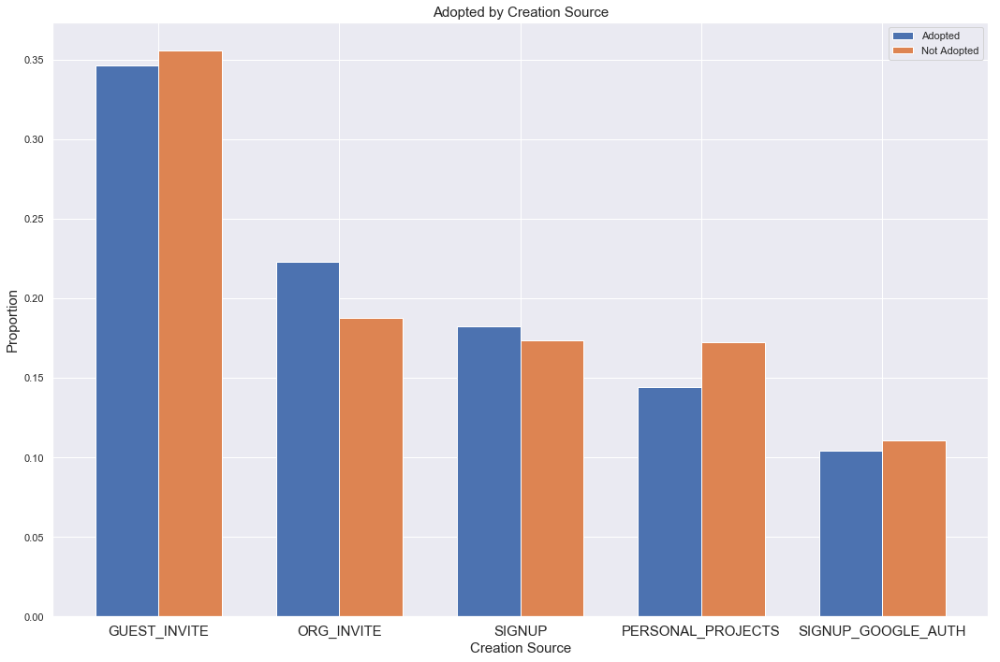

In [31]:
#creating two sets of data to compare adopted vs not adopted
labels = df.creation_source.unique()
ad = df[df.adopted==1].creation_source.value_counts(normalize=True).values
n_ad = df[df.adopted==0].creation_source.value_counts(normalize=True).values

x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots(figsize=[15,10])

rects1 = ax.bar(x - width/2, ad, width, label='Adopted')
rects2 = ax.bar(x + width/2, n_ad, width, label='Not Adopted')

# Add some text for labels, title and custom x-axis tick labels, etc.
plt.ylabel("Proportion",size=15)
plt.xlabel('Creation Source',size=15)

plt.title('Adopted by Creation Source',size=15)
plt.xticks(x, size=15)
ax.set_xticklabels(labels)
plt.legend()


fig.tight_layout();

This graph shows a distribution of users and how they became users of the application.
It seems that those who were invited from people from within their organisation is the strongest source where there is a higher rate of adopted users than not adopted. 

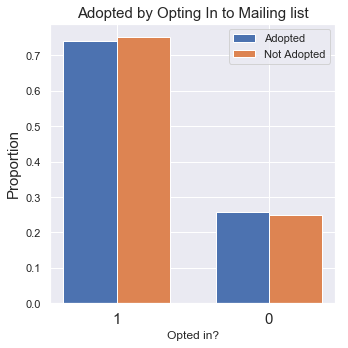

In [32]:
labels = df.opted_in_to_mailing_list.unique()
ad = df[df.adopted==1].opted_in_to_mailing_list.value_counts(normalize=True).values
n_ad = df[df.adopted==0].opted_in_to_mailing_list.value_counts(normalize=True).values

x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots(figsize=[5,5])

rects1 = ax.bar(x - width/2, ad, width, label='Adopted')
rects2 = ax.bar(x + width/2, n_ad, width, label='Not Adopted')

# Add some text for labels, title and custom x-axis tick labels, etc.
plt.ylabel('Proportion',size=15)
plt.xlabel("Opted in?")

plt.title('Adopted by Opting In to Mailing list',size=15)
plt.xticks(x, size=15)
ax.set_xticklabels(labels)
plt.legend()


fig.tight_layout();

There does not seem to be any significance of mailing list.

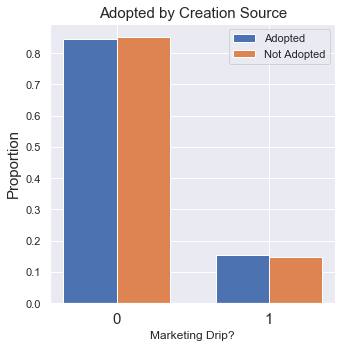

In [33]:
labels = df.enabled_for_marketing_drip.unique()
ad = df[df.adopted==1].enabled_for_marketing_drip.value_counts(normalize=True).values
n_ad = df[df.adopted==0].enabled_for_marketing_drip.value_counts(normalize=True).values

x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots(figsize=[5,5])

rects1 = ax.bar(x - width/2, ad, width, label='Adopted')
rects2 = ax.bar(x + width/2, n_ad, width, label='Not Adopted')

# Add some text for labels, title and custom x-axis tick labels, etc.
plt.ylabel('Proportion',size=15)
plt.xlabel('Marketing Drip?')

plt.title('Adopted by Creation Source',size=15)
plt.xticks(x, size=15)
ax.set_xticklabels(labels)
plt.legend()


fig.tight_layout();

There does not seem to be any signifcance change in adoption when enabling Marketing Drip

We can identify more insights using machine learning tools. We can expect org_id to be an important factor in why people are adopted.

# 3. Predictive Modeling

## 3.1. Preprocessing

We must change the categorical variables into numerical variables. We can use the pd.get_dummies here. We will drop names, emails, the target variable.

In [93]:
df_train=df.drop(['name','email','adopted'],axis=1)

Convert the datetime entries to unix timestamps for modelling

In [94]:
df_train.last_session_creation_time=pd.DatetimeIndex ( df_train.last_session_creation_time).astype( np.int64 )/1000000

In [95]:
df_train.creation_time=pd.DatetimeIndex ( df_train.last_session_creation_time).astype( np.int64 )/1000000

In [96]:
df_train=pd.get_dummies(df_train, drop_first=True)

Let's have a look at how the dataset looks like now

In [97]:
df_train.head()

,creation_time,last_session_creation_time,opted_in_to_mailing_list,enabled_for_marketing_drip,org_id,invited_by_user_id,creation_source_ORG_INVITE,creation_source_PERSONAL_PROJECTS,creation_source_SIGNUP,creation_source_SIGNUP_GOOGLE_AUTH
object_id,,,,,,,,,,
1,1398138.810,1.398139e+12,1,0,11,10803.0,0,0,0,0
2,1396237.504,1.396238e+12,0,0,1,316.0,1,0,0,0
3,1363734.892,1.363735e+12,0,0,94,1525.0,1,0,0,0
4,1369210.168,1.369210e+12,0,0,1,5151.0,0,0,0,0
5,1358849.660,1.358850e+12,0,0,193,5240.0,0,0,0,0


In [98]:
list(df_train.columns)

['creation_time',
 'last_session_creation_time',
 'opted_in_to_mailing_list',
 'enabled_for_marketing_drip',
 'org_id',
 'invited_by_user_id',
 'creation_source_ORG_INVITE',
 'creation_source_PERSONAL_PROJECTS',
 'creation_source_SIGNUP',
 'creation_source_SIGNUP_GOOGLE_AUTH']

In [99]:
X=df_train
y=df.adopted.astype(int)

In [100]:
seed = 42
test_size = 0.33

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=seed, stratify=y)

## 3.2. XGB

In [101]:
# fit model to training data
xgb = XGBClassifier()
xgb.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

In [102]:
# make predictions for test data
y_pred = xgb.predict(X_test)

# evaluate predictions
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy: %.2f%%" % (accuracy * 100.0))

Accuracy: 91.41%


In [103]:
print("Recall is {}".format(recall_score(y_test, y_pred)))
print("Precision is {}".format(precision_score(y_test, y_pred)))

Recall is 0.5494505494505495
Precision is 0.7614213197969543


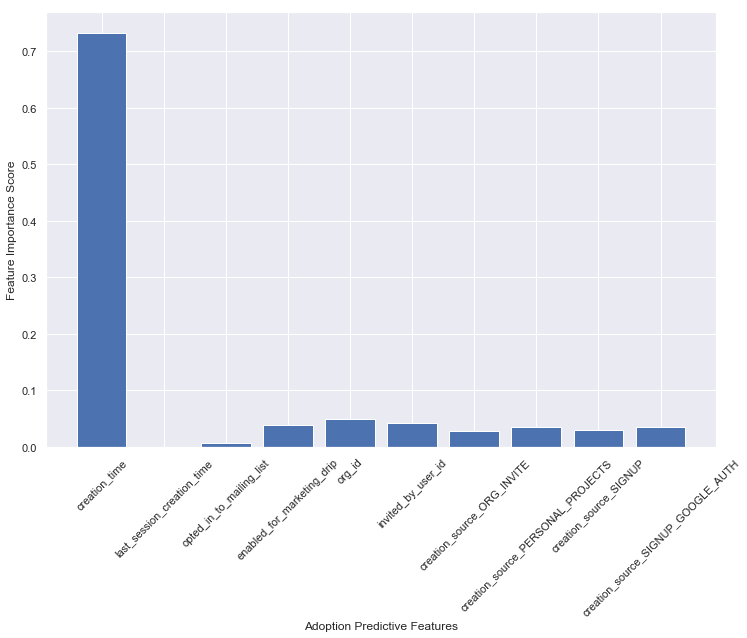

In [104]:
# Plot the feature importances for our target label of adopted users 
feat_imp = xgb.feature_importances_
sns.set_style("darkgrid")
plt.figure(figsize=(12,8))
plt.bar(range(len(xgb.feature_importances_)), xgb.feature_importances_)
xcol = X.columns
plt.xlabel('Adoption Predictive Features')
plt.ylabel('Feature Importance Score')
plt.xticks(range(len(xcol)), xcol.values, rotation=45)
plt.show()

## 3.3. Random Forest Classifier

In [106]:
# fit model to training data
rfr = RandomForestClassifier()
rfr.fit(X_train, y_train)

C:\Users\yfawz\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [107]:
# make predictions for test data
y_pred_rfr = rfr.predict(X_test)

# evaluate predictions
accuracy = accuracy_score(y_test, y_pred_rfr)
print("Accuracy: %.2f%%" % (accuracy * 100.0))

Accuracy: 90.86%


In [108]:
print("Recall is {}".format(recall_score(y_test, y_pred_rfr)))
print("Precision is {}".format(precision_score(y_test, y_pred_rfr)))

Recall is 0.5073260073260073
Precision is 0.7486486486486487


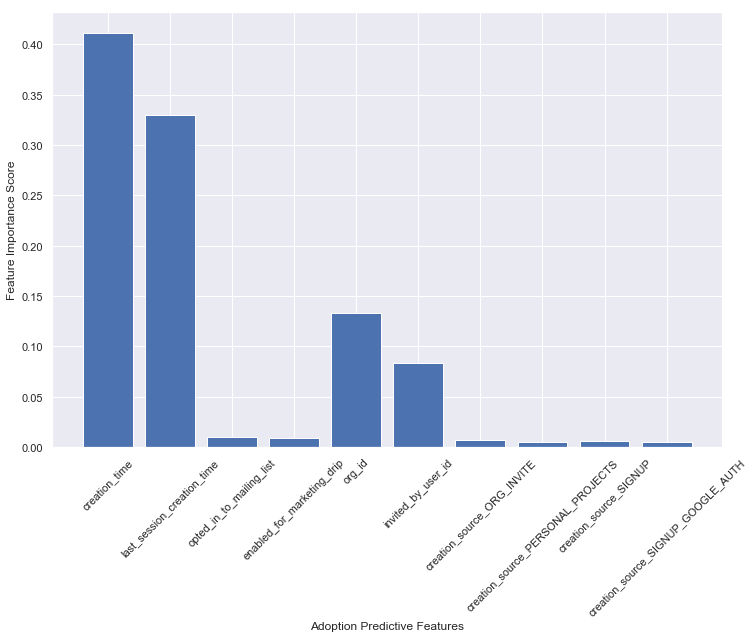

In [109]:
# Plot the feature importances for our target label of adopted users 
feat_imp = rfr.feature_importances_
sns.set_style("darkgrid")
plt.figure(figsize=(12,8))
plt.bar(range(len(rfr.feature_importances_)), rfr.feature_importances_)
xcol = X.columns
plt.xlabel('Adoption Predictive Features')
plt.ylabel('Feature Importance Score')
plt.xticks(range(len(xcol)), xcol.values, rotation=45)
plt.show()

We see that invited_by_user_id, organisation_id have a huge impact on model performance. creation time, last_session_creation_time are just dates so they could have an impact but that is unsure.